# Inversion

We are going to utilize the processed resistivity data measured by GEOPHILUS for conducting 1D inversions. As usual, we need to import the necessary libraries.

In [4]:
import numpy as np
import utm
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from pygimli.frameworks import harmfit
from sklearn.ensemble import IsolationForest
from matplotlib.colors import LogNorm
import geopandas as gpd
import fiona
import pandas as pd
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.colors as colors
from matplotlib.ticker import FormatStrFormatter
from pygimli.frameworks import Modelling, Inversion
from pygimli.viewer.mpl import drawModel1D
import pygimli as pg

Next, we will proceed to execute the code to perform the 1D inversion using PyGimli.

In [5]:

"""VES inversion."""

class VESRhoModelling(Modelling):  # 1D
    """Vertical electrical sounding (VES) modelling with fixed layers."""

    def __init__(self, thk, **kwargs):
        super().__init__()
        self.fwd = pg.core.DC1dRhoModelling(thk, **kwargs) # kwargs: am, bm, an, bn
        
        mesh = pg.meshtools.createMesh1D(len(thk)+1)
        # self.clearRegionProperties()
        self.setMesh(mesh)

    def response(self, par):
        """Forward response."""
        return self.fwd.response(par)


class VES2dModelling(pg.frameworks.MeshModelling):
    """2D ... LCI."""
    def __init__(self, thk, nS, **kwargs):
        super().__init__()
        self.nL = len(thk) + 1
        self.nS = nS
        self.grid = pg.createGrid(self.nL+1, self.nS+1)
        self.setMesh(self.grid)
        self.fop1d = [VESRhoModelling(thk, **kwargs) for i in range(self.nS)]
        self.J = pg.BlockMatrix()
        resp1 = self.fop1d[0].response(pg.Vector(len(thk)+1, 1.0))
        #resp1 = self.fop1d[0].response(pg.Vector(len(thk)+1))

        nd = len(resp1)
        for i, fop in enumerate(self.fop1d):
            self.J.addMatrix(fop.jacobian(), i*nd, i*self.nL)

        self.J.recalcMatrixSize()
        self.setJacobian(self.J)
    
    def response(self, model):
        mod = np.reshape(model, [self.nS, self.nL])
        return np.concatenate(
            [self.fop1d[i].response(mod[i]) for i in range(self.nS)])
    
    def createJacobian(self, model):
        mod = np.reshape(model, [self.nS, self.nL])
        for i in range(self.nS):
            self.fop1d[i].createJacobian(mod[i])
        
        self.setJacobian(self.J)

Then, we are ready to conduct the inversion for all profiles in the field and save the results.

In [6]:
#%% 1D Inversion for all lines

def inversion_1D_all_lines(filepath, amVec, farmName):
    """
    Perform 1D inversion for all selected lines' data.

    Parameters:
    - selected_lines_data: List of numpy arrays containing data for each selected line.
    - amVec: Vector of apparent resistivity values.
    - farmName: Name of the farm or site for saving results.

    Returns:
    - chi2_indiv_list: List of lists of chi-square values for individual inversions of each line.
    - Stmodels_list: List of lists of inversion models for each line.
    """
    spacing_labels = ['S1', 'S2', 'S3', 'S4', 'S5']

    data = read_data_lineIndexed(filepath)
    data_no_nan = data[~np.isnan(data).any(axis=1)]
    data_filtered = data_no_nan[data_no_nan[:, -1] != 0] # remove individual points
    selected_lines = np.unique(data_filtered[:,-1])

    
    # Initialize ABMN values based on amVec
    b = 1.0
    bmVec = np.sqrt(amVec**2 + b**2)

    # Model space
    thk = np.ones(15) * 0.1

    # Initialize the DC 1D Forward Modelling Operator
    fop = VESRhoModelling(thk, am=amVec, an=bmVec, bm=bmVec, bn=amVec)

    chi2_indiv_list = []
    Stmodels_list = []
    invResult_AllLines = []
    forward_resp_AllLines = []
    for line_idx, line_num in enumerate(selected_lines, start=1):
        point_indices_of_interest = np.where(data_filtered[:,-1] == line_num)[0]
        data_for_inv = data_filtered[point_indices_of_interest]
        error = np.ones_like(data_for_inv[1]) * 0.03
        
        chi2Vec_indiv = []
        Stmodels = []
        results_list = []
        inv_response_all_soundings = []
        xy_coord_currentLine = []

        # Create an error matrix for individual data
        error = np.ones_like(data_for_inv[:, 3:8][0]) * 0.03
        for i, indivData in enumerate(data_for_inv):
            inv_indiv = Inversion(fop=fop)  # Passing the fwd operator in the inversion
            inv_indiv.setRegularization(cType=1)  # cType=1 for smoothness constraint
            modelInd = inv_indiv.run(indivData[3:8], error, lam=350, zWeight=3, lambdaFactor=1.12, startModel=300, verbose=True)
            Stmodels.append(modelInd)

            xy_coord = data_for_inv[i, 0:2]  # Extract x and y coordinates
            xy_coord_currentLine.append(xy_coord)
            chi2 = inv_indiv.inv.chi2()
            chi2Vec_indiv.append(chi2)
            line_index = np.array(data_for_inv[:,-1])
            # Append the results for the current point
            results_list.append(np.hstack((xy_coord, modelInd, chi2)))
            
            # forward model response
            inv_response = inv_indiv.response
            inv_response_all_soundings.append(inv_response)
      
        # making an array for the inversion result for all data
        invResult_currentLine = np.hstack((np.array(xy_coord_currentLine), np.array(Stmodels), 
                                           np.reshape(chi2Vec_indiv, (-1, 1)), np.reshape(line_index, (-1, 1))))
        invResult_AllLines.append(invResult_currentLine)
        invResult_combined = np.concatenate(invResult_AllLines, axis=0)
        header = "x; y; " + "; ".join([f"inv{k + 1}" for k in range(len(modelInd))]) + "; chi2;  line_index"
        result_file = f'{farmName}_1Dinv_response_all_lines_combined.txt'
        np.savetxt(result_file, invResult_combined, delimiter='\t', fmt='%.3f', header=header)

        # making an array for the forward response for all data    
        forward_resp_currentLine = np.hstack((np.array(xy_coord_currentLine), np.array(inv_response_all_soundings), 
                                           np.reshape(line_index, (-1, 1))))
        forward_resp_AllLines.append(forward_resp_currentLine)
        forward_resp_combined = np.concatenate(forward_resp_AllLines, axis=0)
        header_forward = "x; y; " + "; ".join([f"ForwResp{k + 1}" for k in range(5)]) + ";  line_index"
        result_file_forward = f'{farmName}_1Dforward_response_all_lines_combined.txt'
        np.savetxt(result_file_forward, forward_resp_combined, delimiter='\t', fmt='%.3f', header=header_forward)
        
        chi2_indiv_list.append(chi2Vec_indiv)
        Stmodels_list.append(Stmodels)

    return Stmodels_list, chi2_indiv_list


def read_data_lineIndexed(filepath):
    EdecDeg, NdecDeg, H, Rho1, Rho2, Rho3, Rho4, Rho5, Gamma, line_index = np.genfromtxt(filepath, skip_header=1, delimiter=',', unpack=True)
    # EdecDeg, NdecDeg, H, Rho1, Rho2, Rho3, Rho4, nan_data, Rho5, Gamma, BFI, lfd, Datum, Zeit = np.genfromtxt(filepath, skip_header=1, delimiter=',', unpack=True)
    data = np.column_stack((EdecDeg, NdecDeg, H, Rho1, Rho2, Rho3, Rho4, Rho5, Gamma, line_index))
    return data


# Example usage:
filepath_Original = 'Aussenschlag_2023_10_11.csv'
farmName_Original = 'Trebbin Aussenschlag'

data_lineIndexed_file = f"data_lineIndexed_{farmName_Original}.txt"

kmlFile = 'TRB_Außenschlag_Referenzpunkte_gemessen_2023-03-200.kml'
fiona.drvsupport.supported_drivers['KML'] = 'rw'
gdf = gpd.read_file(kmlFile)
refLat = np.array(gdf['geometry'].y)
refLon = np.array(gdf['geometry'].x)
refEutm, refNutm, refzone, refletter = utm.from_latlon(refLat, refLon)
refName = np.array(gdf['Name'])
ref_Points = np.column_stack([refName, refEutm, refNutm])
header = ['Name', 'E', 'N']
refPointsTable = np.vstack((header, ref_Points))
 
#  inv for original data
amVec = np.arange(1, 6) * 0.6  # Geophilius 3.0 (2020)
# Stmodels, chi2 = inversion_1D_all_lines(data_lineIndexed_file, amVec, farmName_Original)

#  inv for processed (HLOF)
farmName_Processed = 'Trebbin Aussenschlag_HLOF'

# farmName_Original = 'Großbeeren_1'
data_type_HLOF = 'LOF'
filepath_Processed = f"harmfitted_{data_type_HLOF}_{farmName_Original}.txt"
Stmodels, chi2 = inversion_1D_all_lines(filepath_Processed, amVec, farmName_Processed)

26/02/24 - 16:25:27 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 23.91/33.22
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 102509.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 11360.92 (dPhi = 88.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  953.36 (dPhi = 91.61%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   36.97 (dPhi = 96.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.31 (dPhi = 88.48%) lam: 491.7
----------------

26/02/24 - 16:25:27 - pyGIMLi - INFO - Starting inversion.


chi² =    2.37 (dPhi = -4.25%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -4.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 30.1/38.6
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 72877.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 7857.32 (dPhi = 89.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  607.93 (dPhi = 92.25%) lam: 392.0
-----------

26/02/24 - 16:25:28 - pyGIMLi - INFO - Starting inversion.


chi² =   19.28 (dPhi = 96.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.31 (dPhi = 83.45%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    2.46 (dPhi = -2.92%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -2.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 35.69/45.61
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 48954.88
---------

26/02/24 - 16:25:28 - pyGIMLi - INFO - Starting inversion.


chi² =    8.07 (dPhi = 97.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.01 (dPhi = 74.92%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    1.10 (dPhi = -6.38%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -6.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 40.59/54.78
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 31728.23
---------

26/02/24 - 16:25:28 - pyGIMLi - INFO - Starting inversion.


chi² =    4.08 (dPhi = -2.34%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -2.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 44.28/48.53
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 32897.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 3260.61 (dPhi = 90.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  197.81 (dPhi = 93.92%) lam: 392.0
---------

26/02/24 - 16:25:29 - pyGIMLi - INFO - Starting inversion.


chi² =    1.03 (dPhi = 69.43%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    1.07 (dPhi = -1.31%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -1.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1580>
min/max (data): 36.24/96.37
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 35221.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 3587.04 (dPhi = 89.81%) lam: 350.0
---------

26/02/24 - 16:25:29 - pyGIMLi - INFO - Starting inversion.


chi² =   73.93 (dPhi = 4.45%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =   74.04 (dPhi = -0.14%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -0.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 22.12/66.29
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 104782.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 11742.48 (dPhi = 88.78%) lam: 350.0
--------

26/02/24 - 16:25:29 - pyGIMLi - INFO - Starting inversion.


chi² =  126.14 (dPhi = 23.34%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =  126.25 (dPhi = -0.05%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -0.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1640>
min/max (data): 34.58/63.92
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 39460.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 4031.24 (dPhi = 89.78%) lam: 350.0
---------

26/02/24 - 16:25:30 - pyGIMLi - INFO - Starting inversion.


chi² =   23.18 (dPhi = 13.11%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =   23.40 (dPhi = -1.17%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -1.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 27.82/38.02
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 81257.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 8845.98 (dPhi = 89.11%) lam: 350.0
---------

26/02/24 - 16:25:30 - pyGIMLi - INFO - Starting inversion.


chi² =  703.95 (dPhi = 92.03%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   24.40 (dPhi = 96.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.11 (dPhi = 81.05%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    3.34 (dPhi = -3.55%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -3.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A19A0>
min/max (data): 27.74/34.77
min/max (error): 3%/3%
min/max (start

26/02/24 - 16:25:30 - pyGIMLi - INFO - Starting inversion.


chi² =  751.89 (dPhi = 91.94%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   27.71 (dPhi = 96.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.46 (dPhi = 81.63%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    4.73 (dPhi = -0.60%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -0.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 49.08/57.45
min/max (error): 3%/3%
min/max (start

26/02/24 - 16:25:31 - pyGIMLi - INFO - Starting inversion.


chi² =    1.22 (dPhi = -2.69%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -2.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B20>
min/max (data): 60.75/69.75
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 15580.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1382.65 (dPhi = 91.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   60.92 (dPhi = 95.58%) lam: 392.0
---------

26/02/24 - 16:25:31 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 76.06/147
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4994.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  356.25 (dPhi = 92.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.68 (dPhi = 93.25%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   11.54 (dPhi = 25.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... 

26/02/24 - 16:25:31 - pyGIMLi - INFO - Starting inversion.


chi² =   11.68 (dPhi = -4.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 43.02/186
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 12566.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1022.55 (dPhi = 91.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   90.28 (dPhi = 89.19%) lam: 392.0
-----------

26/02/24 - 16:25:31 - pyGIMLi - INFO - Starting inversion.


chi² =   50.42 (dPhi = -4.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1280>
min/max (data): 81.19/216
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3410.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  201.23 (dPhi = 93.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.60 (dPhi = 89.51%) lam: 392.0
------------

26/02/24 - 16:25:32 - pyGIMLi - INFO - Starting inversion.


chi² =    4.92 (dPhi = -9.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B20>
min/max (data): 87.16/215
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3062.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  173.57 (dPhi = 94.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.16 (dPhi = 90.36%) lam: 392.0
------------

26/02/24 - 16:25:32 - pyGIMLi - INFO - Starting inversion.



--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.26 (dPhi = -9.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 90.16/247
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3113.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  168.88 (dPhi = 94.34%) lam: 350.0
-----------------------------------------------------

26/02/24 - 16:25:32 - pyGIMLi - INFO - Starting inversion.


chi² =    8.66 (dPhi = 87.20%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.76 (dPhi = -0.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.21 (dPhi = -8.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1280>
min/max (data): 105/198
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1823.76
--------------

26/02/24 - 16:25:33 - pyGIMLi - INFO - Starting inversion.


chi² =    2.22 (dPhi = -9.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 67.88/228
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5901.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  388.20 (dPhi = 93.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.36 (dPhi = 90.16%) lam: 392.0
------------

26/02/24 - 16:25:33 - pyGIMLi - INFO - Starting inversion.


chi² =   11.21 (dPhi = -8.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 66.82/83.51
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 10511.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  869.84 (dPhi = 91.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.20 (dPhi = 96.14%) lam: 392.0
---------

26/02/24 - 16:25:33 - pyGIMLi - INFO - Starting inversion.


chi² =    2.51 (dPhi = 0.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.05 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1DC0>
min/max (data): 45.05/60.67
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 25625.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2462.13 (dPhi = 90.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  136.32 (dPhi = 94.44%) lam: 392.0
----------

26/02/24 - 16:25:33 - pyGIMLi - INFO - Starting inversion.


chi² =    0.96 (dPhi = 27.98%) lam: 491.7


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.96)                   #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 38.68/77.96
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 39191.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 4026.57 (dPhi = 89.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  302.87 (dPhi = 92.46%) lam: 392.0
-------

26/02/24 - 16:25:34 - pyGIMLi - INFO - Starting inversion.


chi² =   43.05 (dPhi = 8.43%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =   43.15 (dPhi = -0.36%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -0.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B73A0>
min/max (data): 45.84/62.29
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 23613.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2249.43 (dPhi = 90.47%) lam: 350.0
----------

26/02/24 - 16:25:34 - pyGIMLi - INFO - Starting inversion.


chi² =   17.04 (dPhi = -0.22%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -0.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 54.88/61.4
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 19755.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1823.45 (dPhi = 90.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   90.80 (dPhi = 95.01%) lam: 392.0
----------

26/02/24 - 16:25:35 - pyGIMLi - INFO - Starting inversion.


chi² =    1.40 (dPhi = 29.85%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    1.42 (dPhi = -0.66%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -0.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7400>
min/max (data): 51.19/86.65
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 15871.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1460.03 (dPhi = 90.79%) lam: 350.0
---------

26/02/24 - 16:25:35 - pyGIMLi - INFO - Starting inversion.


chi² =   44.16 (dPhi = 0.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.54 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B73A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 47.35/51.33
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 28926.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2819.95 (dPhi = 90.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  163.18 (dPhi = 94.21%) lam: 392.0
----------

26/02/24 - 16:25:35 - pyGIMLi - INFO - Starting inversion.


chi² =    2.59 (dPhi = 98.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    0.69 (dPhi = 71.96%) lam: 491.7


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.69)                   #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B76A0>
min/max (data): 52.05/60.51
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 20886.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1946.20 (dPhi = 90.68%) lam: 350.0
-------

26/02/24 - 16:25:36 - pyGIMLi - INFO - Starting inversion.


chi² =    1.55 (dPhi = 98.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    0.77 (dPhi = 39.02%) lam: 491.7


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.77)                   #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7760>
min/max (data): 47.45/66.17
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 23392.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2217.97 (dPhi = 90.51%) lam: 350.0
-------

26/02/24 - 16:25:36 - pyGIMLi - INFO - Starting inversion.


chi² =  122.04 (dPhi = 94.33%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.18 (dPhi = 91.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.98 (dPhi = 9.45%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    8.22 (dPhi = -1.60%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -1.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7880>
min/max (data): 44.99/69.02
min/max (error): 3%/3%
min/max (start 

26/02/24 - 16:25:36 - pyGIMLi - INFO - Starting inversion.


chi² =  127.87 (dPhi = 94.39%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.62 (dPhi = 94.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.33 (dPhi = 11.93%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    3.46 (dPhi = -5.60%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -5.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 34.15/61.7
min/max (error): 3%/3%
min/max (start 

26/02/24 - 16:25:37 - pyGIMLi - INFO - Starting inversion.


chi² =  280.73 (dPhi = 93.21%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   12.10 (dPhi = 94.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.47 (dPhi = 22.13%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    7.82 (dPhi = -4.47%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -4.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 38.91/48.26
min/max (error): 3%/3%
min/max (start

26/02/24 - 16:25:37 - pyGIMLi - INFO - Starting inversion.


chi² =  274.87 (dPhi = 93.41%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.39 (dPhi = 97.38%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.92 (dPhi = 63.86%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    2.01 (dPhi = -2.87%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -2.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B75E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7AC0>
min/max (data): 55.57/57.93
min/max (error): 3%/3%
min/max (start

26/02/24 - 16:25:37 - pyGIMLi - INFO - Starting inversion.


inv.iter 0 ... chi² = 20519.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1904.20 (dPhi = 90.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   94.96 (dPhi = 95.01%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    0.72 (dPhi = 99.20%) lam: 439.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.72)                   #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 61.79/76.26
min/max (error): 3%/3%
min/max (start model): 

26/02/24 - 16:25:37 - pyGIMLi - INFO - Starting inversion.


chi² =    3.20 (dPhi = 91.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.21 (dPhi = 1.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 1.74 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 87.29/104
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5207.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  364.17 (dPhi = 92.99%) lam: 350.0
-------------

26/02/24 - 16:25:38 - pyGIMLi - INFO - Starting inversion.


chi² =    3.42 (dPhi = 66.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.52 (dPhi = -1.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 98.85/107
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4094.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  266.55 (dPhi = 93.49%) lam: 350.0
------------

26/02/24 - 16:25:38 - pyGIMLi - INFO - Starting inversion.


chi² =    0.03 (dPhi = 96.69%) lam: 439.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.03)                   #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 114/205
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1214.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   60.43 (dPhi = 94.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.04 (dPhi = 79.41%) lam: 392.0
------------

26/02/24 - 16:25:38 - pyGIMLi - INFO - Starting inversion.


chi² =    8.42 (dPhi = -4.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 135/190
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1002.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.21 (dPhi = 95.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.96 (dPhi = 88.08%) lam: 392.0
--------------

26/02/24 - 16:25:38 - pyGIMLi - INFO - Starting inversion.


chi² =    2.89 (dPhi = -5.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 121/256
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1036.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   56.34 (dPhi = 93.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.30 (dPhi = 48.61%) lam: 392.0
--------------

26/02/24 - 16:25:39 - pyGIMLi - INFO - Starting inversion.


chi² =   24.87 (dPhi = -2.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.56 (dPhi = -2.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 121/184
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1167.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.44 (dPhi = 94.25%) lam: 350.0
--------------

26/02/24 - 16:25:39 - pyGIMLi - INFO - Starting inversion.


chi² =   20.68 (dPhi = 0.71%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.73 (dPhi = -0.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 120/182
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1285.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   76.14 (dPhi = 94.06%) lam: 350.0
---------------

26/02/24 - 16:25:39 - pyGIMLi - INFO - Starting inversion.


chi² =   22.45 (dPhi = 0.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.48 (dPhi = -0.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 82.68/103
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5793.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  416.92 (dPhi = 92.80%) lam: 350.0
-------------

26/02/24 - 16:25:40 - pyGIMLi - INFO - Starting inversion.


chi² =    1.13 (dPhi = -4.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 58.69/121
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 9795.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  806.59 (dPhi = 91.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.45 (dPhi = 95.18%) lam: 392.0
------------

26/02/24 - 16:25:40 - pyGIMLi - INFO - Starting inversion.


chi² =    4.04 (dPhi = -8.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 75.02/141
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5468.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  390.85 (dPhi = 92.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.29 (dPhi = 94.91%) lam: 392.0
------------

26/02/24 - 16:25:40 - pyGIMLi - INFO - Starting inversion.


chi² =    5.71 (dPhi = 37.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.85 (dPhi = -6.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 79.79/187
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3750.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  234.32 (dPhi = 93.68%) lam: 350.0
------------

26/02/24 - 16:25:41 - pyGIMLi - INFO - Starting inversion.


chi² =    2.09 (dPhi = -10.25%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B93A0>
min/max (data): 81.66/223
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3650.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  217.72 (dPhi = 93.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.44 (dPhi = 88.82%) lam: 392.0
-----------

26/02/24 - 16:25:41 - pyGIMLi - INFO - Starting inversion.


chi² =    8.35 (dPhi = -7.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9580>
min/max (data): 69.86/189
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4502.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  311.83 (dPhi = 92.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.82 (dPhi = 85.51%) lam: 392.0
------------

26/02/24 - 16:25:41 - pyGIMLi - INFO - Starting inversion.


chi² =   26.75 (dPhi = 7.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.09 (dPhi = -4.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 75.91/189
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4784.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  351.96 (dPhi = 92.59%) lam: 350.0
-------------

26/02/24 - 16:25:41 - pyGIMLi - INFO - Starting inversion.


chi² =   24.28 (dPhi = -4.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B91C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9700>
min/max (data): 93.27/146
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2956.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  200.68 (dPhi = 93.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   37.84 (dPhi = 79.48%) lam: 392.0
------------

26/02/24 - 16:25:42 - pyGIMLi - INFO - Starting inversion.


chi² =   37.20 (dPhi = -1.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 97.28/155
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2646.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  166.79 (dPhi = 93.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.17 (dPhi = 81.53%) lam: 392.0
------------

26/02/24 - 16:25:42 - pyGIMLi - INFO - Starting inversion.


chi² =   27.01 (dPhi = -1.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 92.74/147
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2997.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  200.57 (dPhi = 93.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.24 (dPhi = 81.20%) lam: 392.0
------------

26/02/24 - 16:25:42 - pyGIMLi - INFO - Starting inversion.


chi² =   33.37 (dPhi = -1.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B91C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 96.39/153
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2698.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  171.75 (dPhi = 93.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.08 (dPhi = 81.60%) lam: 392.0
------------

26/02/24 - 16:25:42 - pyGIMLi - INFO - Starting inversion.


chi² =   27.40 (dPhi = 3.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.83 (dPhi = -1.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B98E0>
min/max (data): 92.56/148
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3035.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  200.31 (dPhi = 93.27%) lam: 350.0
-------------

26/02/24 - 16:25:43 - pyGIMLi - INFO - Starting inversion.


chi² =   29.42 (dPhi = -1.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 96.27/152
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2612.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  170.13 (dPhi = 93.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.89 (dPhi = 78.04%) lam: 392.0
------------

26/02/24 - 16:25:43 - pyGIMLi - INFO - Starting inversion.


chi² =   33.59 (dPhi = 3.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   34.09 (dPhi = -1.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 91.23/151
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2953.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  204.21 (dPhi = 92.92%) lam: 350.0
-------------

26/02/24 - 16:25:43 - pyGIMLi - INFO - Starting inversion.


chi² =   41.69 (dPhi = -1.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B98E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9580>
min/max (data): 95.89/152
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2642.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  172.91 (dPhi = 93.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.42 (dPhi = 78.08%) lam: 392.0
------------

26/02/24 - 16:25:44 - pyGIMLi - INFO - Starting inversion.


chi² =   34.57 (dPhi = -1.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9BE0>
min/max (data): 93.92/151
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2824.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  191.29 (dPhi = 93.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   39.18 (dPhi = 77.70%) lam: 392.0
------------

26/02/24 - 16:25:44 - pyGIMLi - INFO - Starting inversion.


chi² =   38.86 (dPhi = -1.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 95.53/169
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2573.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  175.95 (dPhi = 92.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   44.10 (dPhi = 73.00%) lam: 392.0
------------

26/02/24 - 16:25:44 - pyGIMLi - INFO - Starting inversion.


chi² =   44.73 (dPhi = -0.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 86.25/111
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4764.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  329.18 (dPhi = 93.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.96 (dPhi = 96.03%) lam: 392.0
------------

26/02/24 - 16:25:44 - pyGIMLi - INFO - Starting inversion.


chi² =    6.17 (dPhi = -1.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 50.85/114
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8235.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  745.68 (dPhi = 90.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   77.94 (dPhi = 87.91%) lam: 392.0
------------

26/02/24 - 16:25:45 - pyGIMLi - INFO - Starting inversion.


chi² =   60.06 (dPhi = -1.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9F40>
min/max (data): 71.75/135
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 6182.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  491.57 (dPhi = 92.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   58.91 (dPhi = 87.70%) lam: 392.0
------------

26/02/24 - 16:25:45 - pyGIMLi - INFO - Starting inversion.


chi² =   48.70 (dPhi = 18.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   48.91 (dPhi = -0.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 49.77/136
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 11222.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1044.70 (dPhi = 90.67%) lam: 350.0
-----------

26/02/24 - 16:25:45 - pyGIMLi - INFO - Starting inversion.


chi² =  138.54 (dPhi = 86.71%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  102.56 (dPhi = 25.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  102.51 (dPhi = 0.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.06 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8220>
min/max (data): 54.02/80.32
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 13212.82
----------

26/02/24 - 16:25:46 - pyGIMLi - INFO - Starting inversion.


chi² =   64.50 (dPhi = 94.34%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   19.17 (dPhi = 69.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.12 (dPhi = 0.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.47 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8220>
min/max (data): 51.79/161
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7249.09
-------------

26/02/24 - 16:25:46 - pyGIMLi - INFO - Starting inversion.


chi² =   95.38 (dPhi = -1.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 66.62/136
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4825.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  368.97 (dPhi = 92.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   48.09 (dPhi = 85.91%) lam: 392.0
------------

26/02/24 - 16:25:46 - pyGIMLi - INFO - Starting inversion.


chi² =   40.81 (dPhi = -1.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8340>
min/max (data): 86.54/148
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4838.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  352.93 (dPhi = 92.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.65 (dPhi = 90.02%) lam: 392.0
------------

26/02/24 - 16:25:46 - pyGIMLi - INFO - Starting inversion.


chi² =   27.19 (dPhi = 18.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.51 (dPhi = -0.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1580>
min/max (data): 265/345
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   11.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.80 (dPhi = 17.28%) lam: 350.0
--------------

26/02/24 - 16:25:47 - pyGIMLi - INFO - Starting inversion.


chi² =    9.06 (dPhi = -0.61%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.15 (dPhi = -0.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 271/377
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   12.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.29 (dPhi = 22.25%) lam: 350.0
--------------

26/02/24 - 16:25:47 - pyGIMLi - INFO - Starting inversion.


chi² =    9.40 (dPhi = -0.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 255/404
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   26.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.16 (dPhi = 38.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.12 (dPhi = -0.76%) lam: 392.0
--------------

26/02/24 - 16:25:47 - pyGIMLi - INFO - Starting inversion.


chi² =   15.16 (dPhi = -1.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.22 (dPhi = -1.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 234/387
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   51.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.20 (dPhi = 64.33%) lam: 350.0
--------------

26/02/24 - 16:25:48 - pyGIMLi - INFO - Starting inversion.


chi² =   15.38 (dPhi = -2.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.51 (dPhi = -2.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 205/358
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.89 (dPhi = 90.77%) lam: 350.0
--------------

26/02/24 - 16:25:48 - pyGIMLi - INFO - Starting inversion.


chi² =    5.68 (dPhi = -6.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.88 (dPhi = -6.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B20>
min/max (data): 182/361
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.96 (dPhi = 95.04%) lam: 350.0
--------------

26/02/24 - 16:25:48 - pyGIMLi - INFO - Starting inversion.


chi² =    1.46 (dPhi = -7.49%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    1.60 (dPhi = -9.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.80 (dPhi = -9.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1BE0>
min/max (data): 176/377
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  147.85
--------------

26/02/24 - 16:25:49 - pyGIMLi - INFO - Starting inversion.


chi² =    2.81 (dPhi = -8.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.07 (dPhi = -8.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 212/435
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------


26/02/24 - 16:25:49 - pyGIMLi - INFO - Starting inversion.


inv.iter 0 ... chi² =   80.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.55 (dPhi = 82.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.10 (dPhi = -1.74%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.47 (dPhi = -6.87%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.88 (dPhi = -6.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B20>
Model transformation (cumulative):
	 0

26/02/24 - 16:25:49 - pyGIMLi - INFO - Starting inversion.


chi² =    5.66 (dPhi = -6.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 268/457
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   62.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.76 (dPhi = 84.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.72 (dPhi = 4.66%) lam: 392.0
---------------

26/02/24 - 16:25:50 - pyGIMLi - INFO - Starting inversion.


chi² =    4.09 (dPhi = -7.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B20>
min/max (data): 260/435
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   50.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.65 (dPhi = 80.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.02 (dPhi = 0.46%) lam: 392.0
---------------

26/02/24 - 16:25:50 - pyGIMLi - INFO - Starting inversion.


chi² =    5.12 (dPhi = -5.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.29 (dPhi = -6.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 202/388
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   97.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.49 (dPhi = 84.07%) lam: 350.0
--------------

26/02/24 - 16:25:50 - pyGIMLi - INFO - Starting inversion.


chi² =    9.51 (dPhi = -5.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1340>
min/max (data): 188/370
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  161.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.36 (dPhi = 89.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.30 (dPhi = -4.40%) lam: 392.0
--------------

26/02/24 - 16:25:51 - pyGIMLi - INFO - Starting inversion.


chi² =    8.58 (dPhi = -6.19%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.91 (dPhi = -6.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 194/400
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.69 (dPhi = 84.19%) lam: 350.0
--------------

26/02/24 - 16:25:51 - pyGIMLi - INFO - Starting inversion.


chi² =    9.80 (dPhi = -6.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 244/500
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.23 (dPhi = 74.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.76 (dPhi = 6.42%) lam: 392.0
---------------

26/02/24 - 16:25:51 - pyGIMLi - INFO - Starting inversion.


chi² =   16.47 (dPhi = -4.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.14 (dPhi = -4.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 275/568
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.16 (dPhi = 78.37%) lam: 350.0
--------------

26/02/24 - 16:25:52 - pyGIMLi - INFO - Starting inversion.


chi² =   18.94 (dPhi = -3.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.63 (dPhi = -3.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 266/615
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  153.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.84 (dPhi = 76.92%) lam: 350.0
--------------

26/02/24 - 16:25:52 - pyGIMLi - INFO - Starting inversion.


chi² =   19.25 (dPhi = 15.34%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   19.87 (dPhi = -4.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.57 (dPhi = -4.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 196/655
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.35
--------------

26/02/24 - 16:25:52 - pyGIMLi - INFO - Starting inversion.


chi² =   39.26 (dPhi = -3.31%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   39.98 (dPhi = -3.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7040>
min/max (data): 162/680
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  263.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.82 (dPhi = 70.15%) lam: 350.0
--------------

26/02/24 - 16:25:52 - pyGIMLi - INFO - Starting inversion.


chi² =   63.59 (dPhi = -2.46%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   64.27 (dPhi = -2.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 163/709
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  259.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   77.44 (dPhi = 65.41%) lam: 350.0
--------------

26/02/24 - 16:25:53 - pyGIMLi - INFO - Starting inversion.


chi² =   76.82 (dPhi = -1.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   77.44 (dPhi = -2.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B74C0>
min/max (data): 209/737
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   70.94 (dPhi = 46.32%) lam: 350.0
--------------

26/02/24 - 16:25:53 - pyGIMLi - INFO - Starting inversion.


chi² =   69.08 (dPhi = -1.45%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   69.60 (dPhi = -1.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7040>
min/max (data): 385/741
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  194.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.04 (dPhi = 83.19%) lam: 350.0
--------------

26/02/24 - 16:25:53 - pyGIMLi - INFO - Starting inversion.


chi² =   28.33 (dPhi = -1.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 539/705
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  275.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.88 (dPhi = 93.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.93 (dPhi = 66.60%) lam: 392.0
--------------

26/02/24 - 16:25:54 - pyGIMLi - INFO - Starting inversion.


chi² =    5.91 (dPhi = -0.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.96 (dPhi = -0.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 573/649
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  293.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.66 (dPhi = 93.27%) lam: 350.0
--------------

26/02/24 - 16:25:54 - pyGIMLi - INFO - Starting inversion.


chi² =    1.27 (dPhi = -0.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.27 (dPhi = -0.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 480/621
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  245.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.50 (dPhi = 94.75%) lam: 350.0
--------------

26/02/24 - 16:25:54 - pyGIMLi - INFO - Starting inversion.


chi² =    4.96 (dPhi = 57.41%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.96 (dPhi = -1.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.98 (dPhi = -1.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B77C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7EE0>
min/max (data): 399/580
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  177.14
--------------

26/02/24 - 16:25:54 - pyGIMLi - INFO - Starting inversion.


chi² =    6.28 (dPhi = 19.67%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.30 (dPhi = -2.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.36 (dPhi = -2.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B75E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 369/554
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.72
--------------

26/02/24 - 16:25:55 - pyGIMLi - INFO - Starting inversion.


chi² =    5.17 (dPhi = 11.08%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.23 (dPhi = -4.38%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.34 (dPhi = -4.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.58 (< 2.0%)                #
################################################################################


26/02/24 - 16:25:55 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 355/585
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.75 (dPhi = 92.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.24 (dPhi = 17.70%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.39 (dPhi = -5.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.60 (dPhi = -5.43%) lam: 491.7
#######################

26/02/24 - 16:25:55 - pyGIMLi - INFO - Starting inversion.


chi² =    7.91 (dPhi = -5.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 383/725
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  249.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.03 (dPhi = 89.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.86 (dPhi = 40.28%) lam: 392.0
--------------

26/02/24 - 16:25:56 - pyGIMLi - INFO - Starting inversion.


chi² =    8.95 (dPhi = -5.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.34 (dPhi = -5.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7340>
min/max (data): 392/786
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  279.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.72 (dPhi = 87.66%) lam: 350.0
--------------

26/02/24 - 16:25:56 - pyGIMLi - INFO - Starting inversion.


chi² =    7.86 (dPhi = 53.87%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.81 (dPhi = -6.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.21 (dPhi = -6.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 328/747
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.24
--------------

26/02/24 - 16:25:56 - pyGIMLi - INFO - Starting inversion.


chi² =    8.57 (dPhi = -6.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.90 (dPhi = -7.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 253/588
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.98 (dPhi = 73.70%) lam: 350.0
--------------

26/02/24 - 16:25:56 - pyGIMLi - INFO - Starting inversion.


chi² =   15.82 (dPhi = -5.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 215/513
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.32 (dPhi = 69.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.45 (dPhi = 3.32%) lam: 392.0
---------------

26/02/24 - 16:25:57 - pyGIMLi - INFO - Starting inversion.


chi² =   19.59 (dPhi = -4.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.93 (dPhi = -4.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 194/479
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.77 (dPhi = 68.84%) lam: 350.0
--------------

26/02/24 - 16:25:57 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 184/478
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.48 (dPhi = 68.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.16 (dPhi = 0.65%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   29.32 (dPhi = -3.21%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... 

26/02/24 - 16:25:58 - pyGIMLi - INFO - Starting inversion.


chi² =   29.73 (dPhi = -3.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 186/501
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.23 (dPhi = 69.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... 

26/02/24 - 16:25:58 - pyGIMLi - INFO - Starting inversion.


chi² =   28.32 (dPhi = 1.43%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   28.49 (dPhi = -3.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.90 (dPhi = -3.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 201/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.46
---------------

26/02/24 - 16:25:58 - pyGIMLi - INFO - Starting inversion.


chi² =   23.55 (dPhi = 2.41%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   23.71 (dPhi = -3.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.07 (dPhi = -4.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 230/510
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.93
---------------

26/02/24 - 16:25:58 - pyGIMLi - INFO - Starting inversion.


chi² =   18.92 (dPhi = -4.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 268/517
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.42 (dPhi = 75.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.76 (dPhi = 5.32%) lam: 392.0
---------------

26/02/24 - 16:25:59 - pyGIMLi - INFO - Starting inversion.


chi² =   13.87 (dPhi = -3.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.08 (dPhi = -4.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7340>
min/max (data): 318/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.70 (dPhi = 86.67%) lam: 350.0
--------------

26/02/24 - 16:25:59 - pyGIMLi - INFO - Starting inversion.


chi² =    7.97 (dPhi = -4.96%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.21 (dPhi = -5.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 298/559
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.28 (dPhi = 84.62%) lam: 350.0
--------------

26/02/24 - 16:26:00 - pyGIMLi - INFO - Starting inversion.


chi² =    8.83 (dPhi = -5.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.15 (dPhi = -5.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 280/586
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.23 (dPhi = 83.02%) lam: 350.0
--------------

26/02/24 - 16:26:00 - pyGIMLi - INFO - Starting inversion.


chi² =    8.91 (dPhi = -6.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.31 (dPhi = -6.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 293/596
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.56 (dPhi = 85.94%) lam: 350.0
--------------

26/02/24 - 16:26:00 - pyGIMLi - INFO - Starting inversion.


chi² =    6.76 (dPhi = -7.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 330/600
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.62 (dPhi = 90.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.94 (dPhi = 18.51%) lam: 392.0
--------------

26/02/24 - 16:26:00 - pyGIMLi - INFO - Starting inversion.


chi² =    5.05 (dPhi = -6.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.27 (dPhi = -6.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 364/577
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.22 (dPhi = 93.63%) lam: 350.0
--------------

26/02/24 - 16:26:01 - pyGIMLi - INFO - Starting inversion.


chi² =    4.17 (dPhi = -6.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 316/573
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.42 (dPhi = 91.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.47 (dPhi = 13.34%) lam: 392.0
--------------

26/02/24 - 16:26:01 - pyGIMLi - INFO - Starting inversion.


chi² =    1.70 (dPhi = -9.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B93A0>
min/max (data): 265/582
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.82 (dPhi = 85.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.55 (dPhi = 16.63%) lam: 392.0
--------------

26/02/24 - 16:26:01 - pyGIMLi - INFO - Starting inversion.


chi² =    2.66 (dPhi = -9.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.92 (dPhi = -9.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 242/596
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  127.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.34 (dPhi = 80.83%) lam: 350.0
--------------

26/02/24 - 16:26:01 - pyGIMLi - INFO - Starting inversion.


chi² =    7.59 (dPhi = -8.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 258/616
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.19 (dPhi = 77.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.02 (dPhi = 18.68%) lam: 392.0
--------------

26/02/24 - 16:26:02 - pyGIMLi - INFO - Starting inversion.


chi² =   13.82 (dPhi = -6.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9040>
min/max (data): 303/680
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  166.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.37 (dPhi = 80.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.20 (dPhi = 22.64%) lam: 392.0
--------------

26/02/24 - 16:26:02 - pyGIMLi - INFO - Starting inversion.


chi² =   14.36 (dPhi = -5.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.79 (dPhi = -5.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9340>
min/max (data): 349/657
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.86 (dPhi = 90.76%) lam: 350.0
--------------

26/02/24 - 16:26:02 - pyGIMLi - INFO - Starting inversion.


chi² =    4.85 (dPhi = -6.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.08 (dPhi = -7.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B96A0>
min/max (data): 303/606
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.21 (dPhi = 83.36%) lam: 350.0
--------------

26/02/24 - 16:26:03 - pyGIMLi - INFO - Starting inversion.


chi² =   12.62 (dPhi = -4.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 230/482
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   80.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.73 (dPhi = 30.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   49.23 (dPhi = 0.27%) lam: 392.0
---------------

26/02/24 - 16:26:03 - pyGIMLi - INFO - Starting inversion.


chi² =   50.30 (dPhi = -1.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 184/436
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  105.64 (dPhi = 12.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  106.88 (dPhi = -0.44%) lam: 392.0
--------------

26/02/24 - 16:26:03 - pyGIMLi - INFO - Starting inversion.


chi² =  109.27 (dPhi = -0.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B96A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 195/484
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   95.30 (dPhi = 9.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   96.13 (dPhi = -0.47%) lam: 392.0
---------------

26/02/24 - 16:26:04 - pyGIMLi - INFO - Starting inversion.


chi² =   96.94 (dPhi = -0.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   98.33 (dPhi = -0.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 205/411
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.06 (dPhi = 13.48%) lam: 350.0
--------------

26/02/24 - 16:26:04 - pyGIMLi - INFO - Starting inversion.


chi² =   65.08 (dPhi = -1.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   66.28 (dPhi = -1.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 206/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.63 (dPhi = 54.25%) lam: 350.0
--------------

26/02/24 - 16:26:04 - pyGIMLi - INFO - Starting inversion.


chi² =   31.80 (dPhi = -2.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 169/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.32 (dPhi = 90.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.41 (dPhi = 1.29%) lam: 392.0
---------------

26/02/24 - 16:26:04 - pyGIMLi - INFO - Starting inversion.


chi² =   13.19 (dPhi = -6.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B96A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 119/465
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  763.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.54 (dPhi = 95.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.84 (dPhi = 5.13%) lam: 392.0
---------------

26/02/24 - 16:26:05 - pyGIMLi - INFO - Starting inversion.


chi² =    8.70 (dPhi = -9.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 114/425
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  941.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.08 (dPhi = 96.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.39 (dPhi = 15.87%) lam: 392.0
--------------

26/02/24 - 16:26:05 - pyGIMLi - INFO - Starting inversion.


chi² =    6.22 (dPhi = -9.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B96A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 137/404
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  688.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.08 (dPhi = 95.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.80 (dPhi = 9.52%) lam: 392.0
---------------

26/02/24 - 16:26:05 - pyGIMLi - INFO - Starting inversion.


chi² =   11.47 (dPhi = -7.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B96A0>
min/max (data): 135/407
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  533.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.80 (dPhi = 92.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.73 (dPhi = 3.09%) lam: 392.0
---------------

26/02/24 - 16:26:05 - pyGIMLi - INFO - Starting inversion.


chi² =   23.37 (dPhi = -5.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B83A0>
min/max (data): 142/437
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  447.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.83 (dPhi = 90.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.94 (dPhi = -0.08%) lam: 392.0
--------------

26/02/24 - 16:26:06 - pyGIMLi - INFO - Starting inversion.


chi² =   23.15 (dPhi = -5.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.62 (dPhi = -5.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B96A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 160/487
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  377.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.56 (dPhi = 91.83%) lam: 350.0
--------------

26/02/24 - 16:26:06 - pyGIMLi - INFO - Starting inversion.


chi² =   10.64 (dPhi = -7.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.14 (dPhi = -8.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 149/542
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  334.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.37 (dPhi = 91.10%) lam: 350.0
--------------

26/02/24 - 16:26:06 - pyGIMLi - INFO - Starting inversion.


chi² =    8.27 (dPhi = -9.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 166/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  239.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.94 (dPhi = 82.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.31 (dPhi = 1.46%) lam: 392.0
---------------

26/02/24 - 16:26:07 - pyGIMLi - INFO - Starting inversion.


chi² =   19.35 (dPhi = -6.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8880>
min/max (data): 230/558
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.65 (dPhi = 76.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.46 (dPhi = 12.11%) lam: 392.0
--------------

26/02/24 - 16:26:07 - pyGIMLi - INFO - Starting inversion.


chi² =   16.97 (dPhi = -5.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.60 (dPhi = -5.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8880>
min/max (data): 361/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.58 (dPhi = 95.78%) lam: 350.0
--------------

26/02/24 - 16:26:07 - pyGIMLi - INFO - Starting inversion.


chi² =    2.71 (dPhi = -5.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8880>
min/max (data): 385/521
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.20 (dPhi = 90.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.59 (dPhi = 4.25%) lam: 392.0
---------------

26/02/24 - 16:26:07 - pyGIMLi - INFO - Starting inversion.


chi² =   11.63 (dPhi = -0.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A00>
min/max (data): 313/583
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.07 (dPhi = 62.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   41.72 (dPhi = 0.20%) lam: 392.0
---------------

26/02/24 - 16:26:08 - pyGIMLi - INFO - Starting inversion.


chi² =   41.79 (dPhi = -0.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   41.88 (dPhi = -0.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D00>
min/max (data): 255/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.19 (dPhi = 40.19%) lam: 350.0
--------------

26/02/24 - 16:26:08 - pyGIMLi - INFO - Starting inversion.


chi² =   47.23 (dPhi = -0.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   47.39 (dPhi = -0.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8DC0>
min/max (data): 235/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   60.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.63 (dPhi = 59.79%) lam: 350.0
--------------

26/02/24 - 16:26:08 - pyGIMLi - INFO - Starting inversion.


chi² =   19.04 (dPhi = -2.61%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.26 (dPhi = -2.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E80>
min/max (data): 213/506
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.71 (dPhi = 87.22%) lam: 350.0
--------------

26/02/24 - 16:26:09 - pyGIMLi - INFO - Starting inversion.


chi² =    2.02 (dPhi = -10.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.32 (dPhi = -10.17%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8DC0>
min/max (data): 163/540
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  228.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.83 (dPhi = 86.92%) lam: 350.0
------------

26/02/24 - 16:26:09 - pyGIMLi - INFO - Starting inversion.


chi² =   12.20 (dPhi = -7.32%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.76 (dPhi = -7.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC40A0>
min/max (data): 158/539
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  252.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.30 (dPhi = 88.93%) lam: 350.0
--------------

26/02/24 - 16:26:09 - pyGIMLi - INFO - Starting inversion.


chi² =    9.39 (dPhi = -3.58%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.84 (dPhi = -8.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.37 (dPhi = -8.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 169/477
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  240.69
--------------

26/02/24 - 16:26:09 - pyGIMLi - INFO - Starting inversion.


chi² =   15.87 (dPhi = -5.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.32 (dPhi = -6.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 117/420
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  601.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   89.92 (dPhi = 82.26%) lam: 350.0
--------------

26/02/24 - 16:26:10 - pyGIMLi - INFO - Starting inversion.


chi² =   84.38 (dPhi = 1.63%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   84.49 (dPhi = -2.31%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   85.08 (dPhi = -2.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 142/414
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  338.81
---------------

26/02/24 - 16:26:10 - pyGIMLi - INFO - Starting inversion.


chi² =   77.91 (dPhi = -1.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   78.44 (dPhi = -2.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 248/484
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.86 (dPhi = 39.23%) lam: 350.0
--------------

26/02/24 - 16:26:10 - pyGIMLi - INFO - Starting inversion.


chi² =   40.67 (dPhi = -1.58%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   41.30 (dPhi = -1.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 265/525
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   84.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.85 (dPhi = 51.75%) lam: 350.0
--------------

26/02/24 - 16:26:11 - pyGIMLi - INFO - Starting inversion.


chi² =   35.17 (dPhi = -1.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   35.95 (dPhi = -1.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 265/538
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   66.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.12 (dPhi = 54.40%) lam: 350.0
--------------

26/02/24 - 16:26:11 - pyGIMLi - INFO - Starting inversion.


chi² =   23.84 (dPhi = -3.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 231/540
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   79.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.92 (dPhi = 52.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.99 (dPhi = 3.67%) lam: 392.0
---------------

26/02/24 - 16:26:11 - pyGIMLi - INFO - Starting inversion.


chi² =   27.03 (dPhi = -3.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 188/539
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   58.90 (dPhi = 51.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   53.80 (dPhi = 2.86%) lam: 392.0
---------------

26/02/24 - 16:26:11 - pyGIMLi - INFO - Starting inversion.


chi² =   54.65 (dPhi = -2.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 202/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   96.11 (dPhi = 37.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   92.42 (dPhi = 1.85%) lam: 392.0
---------------

26/02/24 - 16:26:12 - pyGIMLi - INFO - Starting inversion.


chi² =   93.00 (dPhi = -1.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 305/739
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  198.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   78.31 (dPhi = 59.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   77.44 (dPhi = 0.27%) lam: 392.0
---------------

26/02/24 - 16:26:12 - pyGIMLi - INFO - Starting inversion.


chi² =   77.58 (dPhi = -0.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   77.81 (dPhi = -0.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 333/668
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  187.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.83 (dPhi = 70.16%) lam: 350.0
--------------

26/02/24 - 16:26:12 - pyGIMLi - INFO - Starting inversion.


chi² =   52.50 (dPhi = -0.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC46A0>
min/max (data): 311/602
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.47 (dPhi = 86.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.54 (dPhi = 6.43%) lam: 392.0
---------------

26/02/24 - 16:26:12 - pyGIMLi - INFO - Starting inversion.


chi² =    6.92 (dPhi = -6.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC48E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 248/617
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.74 (dPhi = 84.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.72 (dPhi = 19.62%) lam: 392.0
--------------

26/02/24 - 16:26:13 - pyGIMLi - INFO - Starting inversion.


chi² =    3.16 (dPhi = -9.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC48E0>
min/max (data): 209/634
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  157.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.91 (dPhi = 81.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.49 (dPhi = 15.69%) lam: 392.0
--------------

26/02/24 - 16:26:13 - pyGIMLi - INFO - Starting inversion.


chi² =    8.44 (dPhi = -8.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC48E0>
min/max (data): 205/642
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.96 (dPhi = 80.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.50 (dPhi = 16.61%) lam: 392.0
--------------

26/02/24 - 16:26:13 - pyGIMLi - INFO - Starting inversion.


chi² =   10.67 (dPhi = -7.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 212/631
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.83 (dPhi = 82.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.49 (dPhi = 17.25%) lam: 392.0
--------------

26/02/24 - 16:26:13 - pyGIMLi - INFO - Starting inversion.


chi² =    6.37 (dPhi = -8.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 210/583
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.39 (dPhi = 85.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.31 (dPhi = 7.59%) lam: 392.0
---------------

26/02/24 - 16:26:14 - pyGIMLi - INFO - Starting inversion.


chi² =    2.90 (dPhi = -10.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.3 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC48E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 196/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.68 (dPhi = 86.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.80 (dPhi = 3.23%) lam: 392.0
--------------

26/02/24 - 16:26:14 - pyGIMLi - INFO - Starting inversion.


chi² =    7.47 (dPhi = -8.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 195/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.68 (dPhi = 79.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.10 (dPhi = 3.13%) lam: 392.0
---------------

26/02/24 - 16:26:14 - pyGIMLi - INFO - Starting inversion.


chi² =   14.72 (dPhi = -6.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 250/554
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.79 (dPhi = 72.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.23 (dPhi = 6.48%) lam: 392.0
---------------

26/02/24 - 16:26:15 - pyGIMLi - INFO - Starting inversion.


chi² =   16.34 (dPhi = -4.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.60 (dPhi = -4.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC48E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 358/625
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.68 (dPhi = 87.84%) lam: 350.0
--------------

26/02/24 - 16:26:15 - pyGIMLi - INFO - Starting inversion.


chi² =   16.17 (dPhi = -2.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 512/726
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  278.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.25 (dPhi = 91.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.20 (dPhi = 56.89%) lam: 392.0
--------------

26/02/24 - 16:26:15 - pyGIMLi - INFO - Starting inversion.


chi² =    9.23 (dPhi = -0.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 480/647
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  222.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.72 (dPhi = 95.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.53 (dPhi = 50.85%) lam: 392.0
--------------

26/02/24 - 16:26:15 - pyGIMLi - INFO - Starting inversion.


chi² =    3.60 (dPhi = -3.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC48E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2220>
min/max (data): 308/544
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.62 (dPhi = 91.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.25 (dPhi = 14.15%) lam: 392.0
--------------

26/02/24 - 16:26:16 - pyGIMLi - INFO - Starting inversion.


chi² =    3.51 (dPhi = -7.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC22E0>
min/max (data): 194/492
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.49 (dPhi = 84.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.94 (dPhi = -1.87%) lam: 392.0
--------------

26/02/24 - 16:26:16 - pyGIMLi - INFO - Starting inversion.


chi² =    7.61 (dPhi = -7.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC23A0>
min/max (data): 147/454
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  303.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.28 (dPhi = 92.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.56 (dPhi = -5.07%) lam: 392.0
--------------

26/02/24 - 16:26:16 - pyGIMLi - INFO - Starting inversion.


chi² =    7.33 (dPhi = -8.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2520>
min/max (data): 184/448
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.28 (dPhi = 77.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.38 (dPhi = 0.15%) lam: 392.0
---------------

26/02/24 - 16:26:16 - pyGIMLi - INFO - Starting inversion.


chi² =   20.99 (dPhi = -4.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC22E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2220>
min/max (data): 177/515
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  192.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  109.35 (dPhi = 38.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  106.27 (dPhi = 0.61%) lam: 392.0
---------------

26/02/24 - 16:26:17 - pyGIMLi - INFO - Starting inversion.


chi² =  106.44 (dPhi = -1.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  106.93 (dPhi = -1.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC23A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC25E0>
min/max (data): 166/632
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  253.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  139.40 (dPhi = 40.59%) lam: 350.0
--------------

26/02/24 - 16:26:17 - pyGIMLi - INFO - Starting inversion.


chi² =  136.54 (dPhi = -1.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC26A0>
min/max (data): 156/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  283.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  131.20 (dPhi = 49.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  127.37 (dPhi = 0.50%) lam: 392.0
---------------

26/02/24 - 16:26:17 - pyGIMLi - INFO - Starting inversion.


chi² =  128.18 (dPhi = -1.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2760>
min/max (data): 157/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  247.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   81.53 (dPhi = 61.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   78.16 (dPhi = 1.45%) lam: 392.0
---------------

26/02/24 - 16:26:18 - pyGIMLi - INFO - Starting inversion.


chi² =   79.16 (dPhi = -2.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC23A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2760>
min/max (data): 180/448
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  191.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.01 (dPhi = 82.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.97 (dPhi = 2.47%) lam: 392.0
---------------

26/02/24 - 16:26:18 - pyGIMLi - INFO - Starting inversion.


chi² =   20.97 (dPhi = -4.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC26A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC28E0>
min/max (data): 171/443
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  207.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.92 (dPhi = 90.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.64 (dPhi = -2.18%) lam: 392.0
--------------

26/02/24 - 16:26:18 - pyGIMLi - INFO - Starting inversion.


chi² =    9.26 (dPhi = -6.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC29A0>
min/max (data): 166/447
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  180.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.55 (dPhi = 83.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.92 (dPhi = -1.62%) lam: 392.0
--------------

26/02/24 - 16:26:18 - pyGIMLi - INFO - Starting inversion.


chi² =   20.38 (dPhi = -4.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2A60>
min/max (data): 214/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   73.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.03 (dPhi = 75.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.36 (dPhi = -1.35%) lam: 392.0
--------------

26/02/24 - 16:26:19 - pyGIMLi - INFO - Starting inversion.


chi² =   11.52 (dPhi = -4.46%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.74 (dPhi = -4.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC26A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2C40>
min/max (data): 241/452
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   53.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.52 (dPhi = 86.01%) lam: 350.0
--------------

26/02/24 - 16:26:19 - pyGIMLi - INFO - Starting inversion.


chi² =    1.87 (dPhi = -9.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.05 (dPhi = -9.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC29A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2CA0>
min/max (data): 228/442
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   78.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.72 (dPhi = 84.28%) lam: 350.0
--------------

26/02/24 - 16:26:19 - pyGIMLi - INFO - Starting inversion.


chi² =    5.09 (dPhi = -7.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC29A0>
min/max (data): 187/434
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  189.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.79 (dPhi = 88.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.83 (dPhi = -4.11%) lam: 392.0
--------------

26/02/24 - 16:26:19 - pyGIMLi - INFO - Starting inversion.


chi² =   10.51 (dPhi = -6.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2D60>
min/max (data): 155/457
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  267.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.76 (dPhi = 90.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.50 (dPhi = -4.91%) lam: 392.0
--------------

26/02/24 - 16:26:20 - pyGIMLi - INFO - Starting inversion.


chi² =    9.21 (dPhi = -8.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.94 (dPhi = -8.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2F40>
min/max (data): 248/491
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.06 (dPhi = 83.78%) lam: 350.0
--------------

26/02/24 - 16:26:20 - pyGIMLi - INFO - Starting inversion.


chi² =    4.95 (dPhi = -7.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.29 (dPhi = -7.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2220>
min/max (data): 375/505
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.20 (dPhi = 96.52%) lam: 350.0
--------------

26/02/24 - 16:26:20 - pyGIMLi - INFO - Starting inversion.


chi² =    1.76 (dPhi = -6.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2FA0>
min/max (data): 407/525
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.56 (dPhi = 94.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.36 (dPhi = 12.92%) lam: 392.0
--------------

26/02/24 - 16:26:20 - pyGIMLi - INFO - Starting inversion.


chi² =    7.37 (dPhi = -0.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.39 (dPhi = -0.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC26A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2E20>
min/max (data): 387/539
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  147.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.88 (dPhi = 89.13%) lam: 350.0
--------------

26/02/24 - 16:26:21 - pyGIMLi - INFO - Starting inversion.


chi² =   15.18 (dPhi = -0.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC2FA0>
min/max (data): 351/494
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.16 (dPhi = 86.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.96 (dPhi = 0.98%) lam: 392.0
---------------

26/02/24 - 16:26:21 - pyGIMLi - INFO - Starting inversion.


chi² =   13.98 (dPhi = -0.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.00 (dPhi = -0.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC26A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8220>
min/max (data): 325/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.78 (dPhi = 89.04%) lam: 350.0
--------------

26/02/24 - 16:26:21 - pyGIMLi - INFO - Starting inversion.


chi² =    6.82 (dPhi = -2.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC2220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 297/456
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   64.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.27 (dPhi = 88.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.64 (dPhi = 4.73%) lam: 392.0
---------------

26/02/24 - 16:26:22 - pyGIMLi - INFO - Starting inversion.


chi² =    3.95 (dPhi = -6.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC40A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC83A0>
min/max (data): 265/470
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.95 (dPhi = 84.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.26 (dPhi = 6.76%) lam: 392.0
---------------

26/02/24 - 16:26:22 - pyGIMLi - INFO - Starting inversion.


chi² =    5.83 (dPhi = -6.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 269/495
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.11 (dPhi = 84.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.72 (dPhi = 10.00%) lam: 392.0
--------------

26/02/24 - 16:26:22 - pyGIMLi - INFO - Starting inversion.


chi² =    6.32 (dPhi = -6.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8640>
min/max (data): 291/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.60 (dPhi = 86.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.40 (dPhi = 11.99%) lam: 392.0
--------------

26/02/24 - 16:26:22 - pyGIMLi - INFO - Starting inversion.


chi² =    5.88 (dPhi = -6.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8700>
min/max (data): 307/541
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.40 (dPhi = 85.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.32 (dPhi = 10.85%) lam: 392.0
--------------

26/02/24 - 16:26:23 - pyGIMLi - INFO - Starting inversion.


chi² =    7.72 (dPhi = -5.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 300/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   98.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.35 (dPhi = 82.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.39 (dPhi = 8.55%) lam: 392.0
---------------

26/02/24 - 16:26:23 - pyGIMLi - INFO - Starting inversion.


chi² =    9.81 (dPhi = -4.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8760>
min/max (data): 255/523
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   89.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.86 (dPhi = 80.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.14 (dPhi = 7.48%) lam: 392.0
---------------

26/02/24 - 16:26:23 - pyGIMLi - INFO - Starting inversion.


chi² =    8.40 (dPhi = -5.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.74 (dPhi = -6.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8820>
min/max (data): 225/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.85 (dPhi = 81.87%) lam: 350.0
--------------

26/02/24 - 16:26:24 - pyGIMLi - INFO - Starting inversion.


chi² =    6.98 (dPhi = -7.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 207/477
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.56 (dPhi = 85.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.66 (dPhi = -0.69%) lam: 392.0
--------------

26/02/24 - 16:26:24 - pyGIMLi - INFO - Starting inversion.


chi² =    4.35 (dPhi = -8.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 202/473
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.19 (dPhi = 89.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.02 (dPhi = -3.83%) lam: 392.0
--------------

26/02/24 - 16:26:24 - pyGIMLi - INFO - Starting inversion.


chi² =    2.22 (dPhi = -10.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.53 (dPhi = -9.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8160>
min/max (data): 196/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.53 (dPhi = 88.19%) lam: 350.0
-------------

26/02/24 - 16:26:24 - pyGIMLi - INFO - Starting inversion.


chi² =    6.68 (dPhi = -7.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B80>
min/max (data): 160/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  256.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.29 (dPhi = 86.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.87 (dPhi = 0.91%) lam: 392.0
---------------

26/02/24 - 16:26:25 - pyGIMLi - INFO - Starting inversion.


chi² =   20.06 (dPhi = -5.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.65 (dPhi = -5.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D00>
min/max (data): 162/478
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  284.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.66 (dPhi = 89.67%) lam: 350.0
--------------

26/02/24 - 16:26:25 - pyGIMLi - INFO - Starting inversion.


chi² =   13.12 (dPhi = -6.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.70 (dPhi = -6.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8820>
min/max (data): 174/495
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  247.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.32 (dPhi = 92.22%) lam: 350.0
--------------

26/02/24 - 16:26:25 - pyGIMLi - INFO - Starting inversion.


chi² =    3.76 (dPhi = -9.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 161/512
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  239.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.11 (dPhi = 91.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.01 (dPhi = -4.93%) lam: 392.0
--------------

26/02/24 - 16:26:25 - pyGIMLi - INFO - Starting inversion.


chi² =    4.30 (dPhi = -9.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.73 (dPhi = -9.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC83A0>
min/max (data): 157/518
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  240.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.71 (dPhi = 88.16%) lam: 350.0
--------------

26/02/24 - 16:26:26 - pyGIMLi - INFO - Starting inversion.


chi² =   12.49 (dPhi = -7.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D60>
min/max (data): 164/504
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  205.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.56 (dPhi = 86.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.05 (dPhi = -3.79%) lam: 392.0
--------------

26/02/24 - 16:26:26 - pyGIMLi - INFO - Starting inversion.


chi² =   14.13 (dPhi = -6.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB0A0>
min/max (data): 181/471
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.11 (dPhi = 87.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.07 (dPhi = -4.65%) lam: 392.0
--------------

26/02/24 - 16:26:26 - pyGIMLi - INFO - Starting inversion.


chi² =    6.79 (dPhi = -8.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D00>
min/max (data): 205/429
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.89 (dPhi = 90.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.29 (dPhi = -6.41%) lam: 392.0
--------------

26/02/24 - 16:26:26 - pyGIMLi - INFO - Starting inversion.


chi² =    1.69 (dPhi = -10.21%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D00>
min/max (data): 200/395
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.59 (dPhi = 85.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.50 (dPhi = -2.00%) lam: 392.0
-------------

26/02/24 - 16:26:27 - pyGIMLi - INFO - Starting inversion.


chi² =    8.87 (dPhi = -5.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB340>
min/max (data): 179/383
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.08 (dPhi = 81.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.44 (dPhi = -0.99%) lam: 392.0
--------------

26/02/24 - 16:26:27 - pyGIMLi - INFO - Starting inversion.


chi² =   20.95 (dPhi = -3.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB3A0>
min/max (data): 183/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.39 (dPhi = 85.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.59 (dPhi = -1.01%) lam: 392.0
--------------

26/02/24 - 16:26:27 - pyGIMLi - INFO - Starting inversion.


chi² =   15.14 (dPhi = -4.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC20A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB3A0>
min/max (data): 189/437
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.15 (dPhi = 90.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.40 (dPhi = -1.51%) lam: 392.0
--------------

26/02/24 - 16:26:27 - pyGIMLi - INFO - Starting inversion.


chi² =    6.95 (dPhi = -7.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC20A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB340>
min/max (data): 161/463
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  277.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.59 (dPhi = 93.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.09 (dPhi = -3.36%) lam: 392.0
--------------

26/02/24 - 16:26:28 - pyGIMLi - INFO - Starting inversion.


chi² =    3.70 (dPhi = -9.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB0A0>
min/max (data): 145/466
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  356.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.50 (dPhi = 94.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.13 (dPhi = -5.78%) lam: 392.0
--------------

26/02/24 - 16:26:28 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB160>
min/max (data): 147/449
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  332.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.12 (dPhi = 94.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.94 (dPhi = -6.83%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.26 (dPhi = -10.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... 

26/02/24 - 16:26:28 - pyGIMLi - INFO - Starting inversion.


chi² =    3.69 (dPhi = -10.06%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB160>
min/max (data): 220/418
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   63.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.78 (dPhi = 88.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.34 (dPhi = -5.94%) lam: 392.0
-------------

26/02/24 - 16:26:28 - pyGIMLi - INFO - Starting inversion.


chi² =    1.48 (dPhi = -9.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.69 (dPhi = -9.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB340>
min/max (data): 292/437
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   46.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.54 (dPhi = 90.47%) lam: 350.0
--------------

26/02/24 - 16:26:29 - pyGIMLi - INFO - Starting inversion.


chi² =    1.55 (dPhi = -8.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB940>
min/max (data): 361/494
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.20 (dPhi = 96.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.67 (dPhi = 10.96%) lam: 392.0
--------------

26/02/24 - 16:26:29 - pyGIMLi - INFO - Starting inversion.


chi² =    1.82 (dPhi = -6.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB940>
min/max (data): 386/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.21 (dPhi = 95.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.82 (dPhi = 26.79%) lam: 392.0
--------------

26/02/24 - 16:26:29 - pyGIMLi - INFO - Starting inversion.


chi² =    3.06 (dPhi = -5.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB940>
min/max (data): 362/615
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  187.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.10 (dPhi = 91.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.59 (dPhi = 29.74%) lam: 392.0
--------------

26/02/24 - 16:26:29 - pyGIMLi - INFO - Starting inversion.


chi² =    6.04 (dPhi = -5.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACBA60>
min/max (data): 308/623
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  177.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.61 (dPhi = 85.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.09 (dPhi = 25.66%) lam: 392.0
--------------

26/02/24 - 16:26:29 - pyGIMLi - INFO - Starting inversion.


chi² =   10.89 (dPhi = -5.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB520>
min/max (data): 303/610
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  164.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.07 (dPhi = 84.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.45 (dPhi = 22.78%) lam: 392.0
--------------

26/02/24 - 16:26:30 - pyGIMLi - INFO - Starting inversion.


chi² =   10.81 (dPhi = -5.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.31 (dPhi = -5.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACBBE0>
min/max (data): 332/607
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  161.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.03 (dPhi = 88.88%) lam: 350.0
--------------

26/02/24 - 16:26:30 - pyGIMLi - INFO - Starting inversion.


chi² =    9.04 (dPhi = -5.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB760>
min/max (data): 393/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  182.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.38 (dPhi = 93.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.73 (dPhi = 24.67%) lam: 392.0
--------------

26/02/24 - 16:26:30 - pyGIMLi - INFO - Starting inversion.


chi² =    6.09 (dPhi = -4.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACBB20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACBDC0>
min/max (data): 459/652
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  215.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.36 (dPhi = 95.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.62 (dPhi = 41.22%) lam: 392.0
--------------

26/02/24 - 16:26:31 - pyGIMLi - INFO - Starting inversion.


chi² =    4.77 (dPhi = -3.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACBBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACBDC0>
min/max (data): 492/684
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  240.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.90 (dPhi = 94.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.82 (dPhi = 52.19%) lam: 392.0
--------------

26/02/24 - 16:26:31 - pyGIMLi - INFO - Starting inversion.


chi² =    4.91 (dPhi = -2.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACB340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACBEE0>
min/max (data): 478/709
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  248.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.65 (dPhi = 94.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.09 (dPhi = 49.18%) lam: 392.0
--------------

26/02/24 - 16:26:31 - pyGIMLi - INFO - Starting inversion.


chi² =    5.10 (dPhi = -3.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.21 (dPhi = -3.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACBB20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACB340>
min/max (data): 440/723
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  246.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.98 (dPhi = 92.79%) lam: 350.0
--------------

26/02/24 - 16:26:31 - pyGIMLi - INFO - Starting inversion.


chi² =    5.79 (dPhi = -4.66%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.99 (dPhi = -4.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACBBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACBB20>
min/max (data): 408/734
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  246.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.70 (dPhi = 90.88%) lam: 350.0
--------------

26/02/24 - 16:26:32 - pyGIMLi - INFO - Starting inversion.


chi² =    8.22 (dPhi = -4.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACBEE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACBBE0>
min/max (data): 395/746
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  253.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.26 (dPhi = 88.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.01 (dPhi = 39.77%) lam: 392.0
--------------

26/02/24 - 16:26:32 - pyGIMLi - INFO - Starting inversion.


chi² =   11.53 (dPhi = -4.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACBB20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 401/755
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  266.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.28 (dPhi = 88.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.74 (dPhi = 39.64%) lam: 392.0
--------------

26/02/24 - 16:26:32 - pyGIMLi - INFO - Starting inversion.


chi² =   12.83 (dPhi = -3.76%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.30 (dPhi = -3.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACBBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 401/742
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  262.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.81 (dPhi = 89.10%) lam: 350.0
--------------

26/02/24 - 16:26:32 - pyGIMLi - INFO - Starting inversion.


chi² =   10.50 (dPhi = -4.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.90 (dPhi = -4.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 392/709
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  246.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.63 (dPhi = 90.68%) lam: 350.0
--------------

26/02/24 - 16:26:33 - pyGIMLi - INFO - Starting inversion.


chi² =    7.30 (dPhi = -5.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.64 (dPhi = -5.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 388/683
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  232.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.28 (dPhi = 92.39%) lam: 350.0
--------------

26/02/24 - 16:26:33 - pyGIMLi - INFO - Starting inversion.


chi² =    4.92 (dPhi = -6.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.18 (dPhi = -6.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 413/682
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  243.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.38 (dPhi = 93.25%) lam: 350.0
--------------

26/02/24 - 16:26:33 - pyGIMLi - INFO - Starting inversion.


chi² =    4.04 (dPhi = 51.90%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.06 (dPhi = -5.85%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.26 (dPhi = -6.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD760>
min/max (data): 486/688
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  289.67
--------------

26/02/24 - 16:26:33 - pyGIMLi - INFO - Starting inversion.


chi² =    5.22 (dPhi = -2.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.31 (dPhi = -2.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 616/799
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  363.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.92 (dPhi = 85.99%) lam: 350.0
--------------

26/02/24 - 16:26:34 - pyGIMLi - INFO - Starting inversion.


chi² =    7.51 (dPhi = 0.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.54 (dPhi = -0.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 725/997
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  437.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   98.78 (dPhi = 77.39%) lam: 350.0
---------------

26/02/24 - 16:26:34 - pyGIMLi - INFO - Starting inversion.


chi² =    8.92 (dPhi = -0.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 768/1102
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  487.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  152.47 (dPhi = 68.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.22 (dPhi = 94.41%) lam: 392.0
-------------

26/02/24 - 16:26:34 - pyGIMLi - INFO - Starting inversion.


chi² =    6.32 (dPhi = -2.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 763/958
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  466.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  127.00 (dPhi = 72.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.89 (dPhi = 97.17%) lam: 392.0
--------------

26/02/24 - 16:26:34 - pyGIMLi - INFO - Starting inversion.


chi² =    2.33 (dPhi = -3.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 743/885
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  447.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  108.04 (dPhi = 75.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.13 (dPhi = 97.58%) lam: 392.0
--------------

26/02/24 - 16:26:35 - pyGIMLi - INFO - Starting inversion.


chi² =    1.78 (dPhi = -2.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 728/906
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  451.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  109.03 (dPhi = 75.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.24 (dPhi = 97.24%) lam: 392.0
--------------

26/02/24 - 16:26:35 - pyGIMLi - INFO - Starting inversion.


chi² =    1.87 (dPhi = -3.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB80>
min/max (data): 726/1002
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  483.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  139.99 (dPhi = 70.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.27 (dPhi = 97.08%) lam: 392.0
-------------

26/02/24 - 16:26:35 - pyGIMLi - INFO - Starting inversion.


chi² =    1.47 (dPhi = -7.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 736/1228
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  527.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  193.10 (dPhi = 63.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.59 (dPhi = 95.71%) lam: 392.0
-------------

26/02/24 - 16:26:35 - pyGIMLi - INFO - Starting inversion.


chi² =    1.80 (dPhi = -8.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 717/1210
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  509.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  169.50 (dPhi = 66.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.10 (dPhi = 94.94%) lam: 392.0
-------------

26/02/24 - 16:26:36 - pyGIMLi - INFO - Starting inversion.


chi² =    3.50 (dPhi = -6.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 613/838
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  366.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.09 (dPhi = 87.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.13 (dPhi = 90.50%) lam: 392.0
--------------

26/02/24 - 16:26:36 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:26:36 - pyGIMLi - INFO - Starting inversion.


chi² =    3.15 (dPhi = -3.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE80>
min/max (data): 516/585
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  221.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.24 (dPhi = 97.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.77 (dPhi = 85.33%) lam: 392.0


############

26/02/24 - 16:26:36 - pyGIMLi - INFO - Starting inversion.


chi² =    3.16 (dPhi = -0.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.17 (dPhi = -0.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1160>
min/max (data): 371/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.96 (dPhi = 95.73%) lam: 350.0
--------------

26/02/24 - 16:26:37 - pyGIMLi - INFO - Starting inversion.


chi² =    2.84 (dPhi = -3.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.90 (dPhi = -3.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA00>
min/max (data): 427/593
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.69 (dPhi = 93.10%) lam: 350.0
--------------

26/02/24 - 16:26:37 - pyGIMLi - INFO - Starting inversion.


chi² =    9.29 (dPhi = -2.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1160>
min/max (data): 424/749
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  269.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.01 (dPhi = 81.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   39.66 (dPhi = 14.21%) lam: 392.0
--------------

26/02/24 - 16:26:37 - pyGIMLi - INFO - Starting inversion.


chi² =   40.05 (dPhi = -0.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD13A0>
min/max (data): 406/853
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  325.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   94.17 (dPhi = 70.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   81.53 (dPhi = 10.84%) lam: 392.0
--------------

26/02/24 - 16:26:37 - pyGIMLi - INFO - Starting inversion.


chi² =   81.63 (dPhi = -0.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   82.11 (dPhi = -0.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 464/1058
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  398.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   92.50 (dPhi = 76.14%) lam: 350.0
-------------

26/02/24 - 16:26:38 - pyGIMLi - INFO - Starting inversion.


chi² =   48.98 (dPhi = -1.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   49.37 (dPhi = -1.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 430/916
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  356.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.69 (dPhi = 79.52%) lam: 350.0
--------------

26/02/24 - 16:26:38 - pyGIMLi - INFO - Starting inversion.


chi² =   41.88 (dPhi = -1.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 507/1039
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  396.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   82.85 (dPhi = 78.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   46.36 (dPhi = 38.85%) lam: 392.0
-------------

26/02/24 - 16:26:38 - pyGIMLi - INFO - Starting inversion.


chi² =   46.43 (dPhi = -1.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 601/1149
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  482.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  156.31 (dPhi = 67.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.46 (dPhi = 62.98%) lam: 392.0
-------------

26/02/24 - 16:26:38 - pyGIMLi - INFO - Starting inversion.


chi² =   54.03 (dPhi = 0.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   54.21 (dPhi = -0.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 572/980
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  394.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   76.79 (dPhi = 80.39%) lam: 350.0
---------------

26/02/24 - 16:26:39 - pyGIMLi - INFO - Starting inversion.


chi² =   26.92 (dPhi = -0.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 335/615
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.37 (dPhi = 89.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.67 (dPhi = 16.47%) lam: 392.0
--------------

26/02/24 - 16:26:39 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:26:39 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 222/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.93 (dPhi = 81.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.42 (dPhi = 4.85%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.77 (dPhi = -7.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.21 (dPhi = -7.48%) lam: 491.7
########################

26/02/24 - 16:26:39 - pyGIMLi - INFO - Starting inversion.


chi² =    8.62 (dPhi = -7.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.16 (dPhi = -7.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 220/559
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.00 (dPhi = 83.21%) lam: 350.0
--------------

26/02/24 - 16:26:40 - pyGIMLi - INFO - Starting inversion.


chi² =    5.07 (dPhi = -8.82%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.53 (dPhi = -8.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 276/597
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.89 (dPhi = 86.16%) lam: 350.0
--------------

26/02/24 - 16:26:40 - pyGIMLi - INFO - Starting inversion.


chi² =    3.93 (dPhi = -8.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1640>
min/max (data): 323/609
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.62 (dPhi = 90.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.13 (dPhi = 20.37%) lam: 392.0
--------------

26/02/24 - 16:26:40 - pyGIMLi - INFO - Starting inversion.


chi² =    3.39 (dPhi = -8.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1640>
min/max (data): 331/592
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.45 (dPhi = 92.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.39 (dPhi = 20.37%) lam: 392.0
--------------

26/02/24 - 16:26:40 - pyGIMLi - INFO - Starting inversion.


chi² =    2.66 (dPhi = -8.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 335/590
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  163.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.88 (dPhi = 90.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.69 (dPhi = 22.71%) lam: 392.0
--------------

26/02/24 - 16:26:41 - pyGIMLi - INFO - Starting inversion.


chi² =    6.20 (dPhi = -6.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 384/671
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  229.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.13 (dPhi = 89.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.14 (dPhi = 30.21%) lam: 392.0
--------------

26/02/24 - 16:26:41 - pyGIMLi - INFO - Starting inversion.


chi² =   11.84 (dPhi = -3.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 394/685
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  229.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.48 (dPhi = 90.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.04 (dPhi = 31.40%) lam: 392.0
--------------

26/02/24 - 16:26:41 - pyGIMLi - INFO - Starting inversion.


chi² =   10.66 (dPhi = -3.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 338/611
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  156.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.00 (dPhi = 90.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.37 (dPhi = 19.52%) lam: 392.0
--------------

26/02/24 - 16:26:41 - pyGIMLi - INFO - Starting inversion.


chi² =    6.87 (dPhi = -5.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 247/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.94 (dPhi = 81.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.78 (dPhi = 8.79%) lam: 392.0
---------------

26/02/24 - 16:26:42 - pyGIMLi - INFO - Starting inversion.


chi² =    5.98 (dPhi = -7.54%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.29 (dPhi = -7.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 184/487
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  215.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.36 (dPhi = 89.47%) lam: 350.0
--------------

26/02/24 - 16:26:42 - pyGIMLi - INFO - Starting inversion.


chi² =    8.32 (dPhi = -8.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 174/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  242.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.05 (dPhi = 91.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.82 (dPhi = -4.26%) lam: 392.0
--------------

26/02/24 - 16:26:42 - pyGIMLi - INFO - Starting inversion.


chi² =    6.48 (dPhi = -8.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 340/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.41 (dPhi = 95.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.35 (dPhi = 17.76%) lam: 392.0
--------------

26/02/24 - 16:26:42 - pyGIMLi - INFO - Starting inversion.


chi² =    1.55 (dPhi = -8.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A13A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 462/642
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  242.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.46 (dPhi = 95.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.41 (dPhi = 57.88%) lam: 392.0
--------------

26/02/24 - 16:26:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.50 (dPhi = -3.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A00>
min/max (data): 508/879
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  340.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.58 (dPhi = 87.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.43 (dPhi = 66.68%) lam: 392.0
--------------

26/02/24 - 16:26:43 - pyGIMLi - INFO - Starting inversion.


chi² =   11.47 (dPhi = -2.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7EE0>
min/max (data): 481/993
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  370.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.58 (dPhi = 83.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.55 (dPhi = 66.05%) lam: 392.0
--------------

26/02/24 - 16:26:43 - pyGIMLi - INFO - Starting inversion.


chi² =   14.12 (dPhi = -3.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.55 (dPhi = -3.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 494/1014
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  384.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.81 (dPhi = 82.10%) lam: 350.0
-------------

26/02/24 - 16:26:43 - pyGIMLi - INFO - Starting inversion.


chi² =   14.01 (dPhi = -4.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 561/971
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  397.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   69.09 (dPhi = 82.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.98 (dPhi = 83.47%) lam: 392.0
--------------

26/02/24 - 16:26:44 - pyGIMLi - INFO - Starting inversion.


chi² =    7.76 (dPhi = -4.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 535/836
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  334.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.90 (dPhi = 89.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.24 (dPhi = 75.76%) lam: 392.0
--------------

26/02/24 - 16:26:44 - pyGIMLi - INFO - Starting inversion.


chi² =    5.33 (dPhi = -4.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 401/674
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  210.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.07 (dPhi = 92.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.51 (dPhi = 24.78%) lam: 392.0
--------------

26/02/24 - 16:26:44 - pyGIMLi - INFO - Starting inversion.


chi² =    7.73 (dPhi = -5.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B75E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 234/525
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  104.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.28 (dPhi = 82.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.66 (dPhi = 8.49%) lam: 392.0
---------------

26/02/24 - 16:26:44 - pyGIMLi - INFO - Starting inversion.


chi² =    6.34 (dPhi = -7.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 310/548
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.66 (dPhi = 90.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.31 (dPhi = 18.44%) lam: 392.0
--------------

26/02/24 - 16:26:45 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:26:45 - pyGIMLi - INFO - Starting inversion.


chi² =    3.68 (dPhi = -7.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 512/594
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  236.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.13 (dPhi = 96.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.57 (dPhi = 89.32%) lam: 392.0


############

26/02/24 - 16:26:45 - pyGIMLi - INFO - Starting inversion.


chi² =    4.16 (dPhi = 82.99%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.12 (dPhi = -1.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.17 (dPhi = -1.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 538/818
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  290.51
--------------

26/02/24 - 16:26:45 - pyGIMLi - INFO - Starting inversion.


chi² =   16.85 (dPhi = -0.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.94 (dPhi = -0.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B75E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 374/595
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.48 (dPhi = 84.72%) lam: 350.0
--------------

26/02/24 - 16:26:46 - pyGIMLi - INFO - Starting inversion.


chi² =   25.81 (dPhi = -0.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B73A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 283/515
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   97.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.77 (dPhi = 76.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.33 (dPhi = 2.14%) lam: 392.0
---------------

26/02/24 - 16:26:46 - pyGIMLi - INFO - Starting inversion.


chi² =   18.54 (dPhi = -2.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 237/507
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.55 (dPhi = 69.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.49 (dPhi = 6.74%) lam: 392.0
---------------

26/02/24 - 16:26:46 - pyGIMLi - INFO - Starting inversion.


chi² =   28.98 (dPhi = -3.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B75E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 332/680
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.30 (dPhi = 74.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   44.60 (dPhi = 4.46%) lam: 392.0
---------------

26/02/24 - 16:26:46 - pyGIMLi - INFO - Starting inversion.


chi² =   45.31 (dPhi = -0.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 363/519
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.68 (dPhi = 96.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.52 (dPhi = 2.66%) lam: 392.0
---------------

26/02/24 - 16:26:47 - pyGIMLi - INFO - Starting inversion.


chi² =    1.64 (dPhi = -6.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 257/519
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   64.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.06 (dPhi = 75.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.70 (dPhi = 3.96%) lam: 392.0
---------------

26/02/24 - 16:26:47 - pyGIMLi - INFO - Starting inversion.


chi² =    8.83 (dPhi = -5.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.11 (dPhi = -5.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 231/545
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   89.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.30 (dPhi = 68.95%) lam: 350.0
--------------

26/02/24 - 16:26:47 - pyGIMLi - INFO - Starting inversion.


chi² =   16.88 (dPhi = -4.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 325/594
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.51 (dPhi = 87.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.71 (dPhi = 3.45%) lam: 392.0
---------------

26/02/24 - 16:26:47 - pyGIMLi - INFO - Starting inversion.


chi² =    9.10 (dPhi = -4.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 481/640
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  258.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.33 (dPhi = 92.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.20 (dPhi = 46.17%) lam: 392.0
--------------

26/02/24 - 16:26:48 - pyGIMLi - INFO - Starting inversion.


chi² =    9.28 (dPhi = -1.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E20>
min/max (data): 539/892
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  357.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.99 (dPhi = 83.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.25 (dPhi = 51.39%) lam: 392.0
--------------

26/02/24 - 16:26:48 - pyGIMLi - INFO - Starting inversion.


chi² =   26.26 (dPhi = -1.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B93A0>
min/max (data): 451/707
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  254.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.56 (dPhi = 88.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.19 (dPhi = 25.67%) lam: 392.0
--------------

26/02/24 - 16:26:48 - pyGIMLi - INFO - Starting inversion.


chi² =   21.19 (dPhi = -0.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.33 (dPhi = -0.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A11C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 244/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   78.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.51 (dPhi = 81.09%) lam: 350.0
--------------

26/02/24 - 16:26:49 - pyGIMLi - INFO - Starting inversion.


chi² =    7.01 (dPhi = -6.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.30 (dPhi = -6.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9040>
min/max (data): 158/494
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  254.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.75 (dPhi = 85.84%) lam: 350.0
--------------

26/02/24 - 16:26:49 - pyGIMLi - INFO - Starting inversion.


chi² =   16.38 (dPhi = -6.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.37 (dPhi = -6.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 197/542
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  148.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.88 (dPhi = 80.11%) lam: 350.0
--------------

26/02/24 - 16:26:49 - pyGIMLi - INFO - Starting inversion.


chi² =   12.79 (dPhi = -6.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.49 (dPhi = -6.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 290/592
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.29 (dPhi = 89.72%) lam: 350.0
--------------

26/02/24 - 16:26:49 - pyGIMLi - INFO - Starting inversion.


chi² =    3.41 (dPhi = -8.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B20>
min/max (data): 370/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.15 (dPhi = 93.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.19 (dPhi = 6.19%) lam: 392.0
---------------

26/02/24 - 16:26:50 - pyGIMLi - INFO - Starting inversion.


chi² =    3.53 (dPhi = -6.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9040>
min/max (data): 304/629
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.98 (dPhi = 79.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.82 (dPhi = 1.25%) lam: 392.0
---------------

26/02/24 - 16:26:50 - pyGIMLi - INFO - Starting inversion.


chi² =   19.50 (dPhi = -3.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 244/624
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.48 (dPhi = 61.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.16 (dPhi = 4.95%) lam: 392.0
---------------

26/02/24 - 16:26:50 - pyGIMLi - INFO - Starting inversion.


chi² =   36.73 (dPhi = -2.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 242/610
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.39 (dPhi = 67.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.17 (dPhi = 8.80%) lam: 392.0
---------------

26/02/24 - 16:26:50 - pyGIMLi - INFO - Starting inversion.


chi² =   28.59 (dPhi = -3.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B93A0>
min/max (data): 287/588
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.40 (dPhi = 80.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.39 (dPhi = 14.05%) lam: 392.0
--------------

26/02/24 - 16:26:51 - pyGIMLi - INFO - Starting inversion.


chi² =   10.80 (dPhi = -5.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E20>
min/max (data): 262/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  104.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.24 (dPhi = 83.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.01 (dPhi = 13.47%) lam: 392.0
--------------

26/02/24 - 16:26:51 - pyGIMLi - INFO - Starting inversion.


chi² =    6.50 (dPhi = -7.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 220/509
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.54 (dPhi = 81.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.38 (dPhi = 3.09%) lam: 392.0
---------------

26/02/24 - 16:26:51 - pyGIMLi - INFO - Starting inversion.


chi² =    8.00 (dPhi = -6.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 188/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.18 (dPhi = 88.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.14 (dPhi = -4.66%) lam: 392.0
--------------

26/02/24 - 16:26:51 - pyGIMLi - INFO - Starting inversion.


chi² =    4.81 (dPhi = -8.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 182/497
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  156.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.76 (dPhi = 73.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.64 (dPhi = 1.37%) lam: 392.0
---------------

26/02/24 - 16:26:52 - pyGIMLi - INFO - Starting inversion.


chi² =   28.24 (dPhi = -4.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 215/525
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.95 (dPhi = 39.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   63.44 (dPhi = 1.48%) lam: 392.0
---------------

26/02/24 - 16:26:52 - pyGIMLi - INFO - Starting inversion.


chi² =   64.10 (dPhi = -1.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 239/523
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.19 (dPhi = 29.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   63.47 (dPhi = -0.18%) lam: 392.0
--------------

26/02/24 - 16:26:52 - pyGIMLi - INFO - Starting inversion.


chi² =   64.56 (dPhi = -1.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 222/459
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.86 (dPhi = 35.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   41.46 (dPhi = 0.60%) lam: 392.0
---------------

26/02/24 - 16:26:52 - pyGIMLi - INFO - Starting inversion.


chi² =   42.58 (dPhi = -1.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 199/441
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.41 (dPhi = 78.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.97 (dPhi = 1.26%) lam: 392.0
---------------

26/02/24 - 16:26:53 - pyGIMLi - INFO - Starting inversion.


chi² =   16.76 (dPhi = -4.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4340>
min/max (data): 166/458
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.48 (dPhi = 91.53%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.01 (dPhi = -1.09%) lam: 392.0
--------------

26/02/24 - 16:26:53 - pyGIMLi - INFO - Starting inversion.


chi² =    7.61 (dPhi = -8.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 158/515
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  270.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.08 (dPhi = 88.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.47 (dPhi = -2.87%) lam: 392.0
--------------

26/02/24 - 16:26:53 - pyGIMLi - INFO - Starting inversion.


chi² =   12.87 (dPhi = -7.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 275/670
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  190.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.69 (dPhi = 77.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.02 (dPhi = 27.37%) lam: 392.0
--------------

26/02/24 - 16:26:53 - pyGIMLi - INFO - Starting inversion.


chi² =   18.13 (dPhi = -5.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 585/907
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  349.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.59 (dPhi = 85.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.26 (dPhi = 62.85%) lam: 392.0
--------------

26/02/24 - 16:26:54 - pyGIMLi - INFO - Starting inversion.


chi² =   18.21 (dPhi = -0.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B20>
min/max (data): 630/959
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  376.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.02 (dPhi = 82.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.10 (dPhi = 66.76%) lam: 392.0
--------------

26/02/24 - 16:26:54 - pyGIMLi - INFO - Starting inversion.


chi² =   21.09 (dPhi = -0.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 585/823
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  331.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.57 (dPhi = 87.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.44 (dPhi = 60.59%) lam: 392.0
--------------

26/02/24 - 16:26:54 - pyGIMLi - INFO - Starting inversion.


chi² =   16.45 (dPhi = -0.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 531/635
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  257.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.26 (dPhi = 94.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.76 (dPhi = 66.45%) lam: 392.0
--------------

26/02/24 - 16:26:55 - pyGIMLi - INFO - Starting inversion.


chi² =    4.76 (dPhi = -0.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 439/549
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.72 (dPhi = 96.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.35 (dPhi = 23.70%) lam: 392.0
--------------

26/02/24 - 16:26:55 - pyGIMLi - INFO - Starting inversion.


chi² =    3.40 (dPhi = -2.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B20>
min/max (data): 347/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.16 (dPhi = 83.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.84 (dPhi = 0.74%) lam: 392.0
---------------

26/02/24 - 16:26:55 - pyGIMLi - INFO - Starting inversion.


chi² =   15.92 (dPhi = -1.57%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.04 (dPhi = -1.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 305/501
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   73.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.76 (dPhi = 73.13%) lam: 350.0
--------------

26/02/24 - 16:26:55 - pyGIMLi - INFO - Starting inversion.


chi² =   16.66 (dPhi = -1.93%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.83 (dPhi = -2.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4040>
min/max (data): 261/464
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   45.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.62 (dPhi = 66.86%) lam: 350.0
--------------

26/02/24 - 16:26:56 - pyGIMLi - INFO - Starting inversion.


chi² =   11.49 (dPhi = -3.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 218/446
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   65.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.95 (dPhi = 85.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.21 (dPhi = -2.92%) lam: 392.0
--------------

26/02/24 - 16:26:56 - pyGIMLi - INFO - Starting inversion.


chi² =    3.57 (dPhi = -8.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC43A0>
min/max (data): 226/502
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.89 (dPhi = 85.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.87 (dPhi = 2.49%) lam: 392.0
---------------

26/02/24 - 16:26:56 - pyGIMLi - INFO - Starting inversion.


chi² =    3.02 (dPhi = -9.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.32 (dPhi = -9.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 259/564
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.42 (dPhi = 78.05%) lam: 350.0
--------------

26/02/24 - 16:26:57 - pyGIMLi - INFO - Starting inversion.


chi² =    7.69 (dPhi = -7.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4700>
min/max (data): 282/601
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.83 (dPhi = 76.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.09 (dPhi = 5.65%) lam: 392.0
---------------

26/02/24 - 16:26:57 - pyGIMLi - INFO - Starting inversion.


chi² =   14.61 (dPhi = -4.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4880>
min/max (data): 291/596
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.50 (dPhi = 73.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.72 (dPhi = 0.96%) lam: 392.0
---------------

26/02/24 - 16:26:57 - pyGIMLi - INFO - Starting inversion.


chi² =   25.32 (dPhi = -2.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 280/567
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.88 (dPhi = 64.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.29 (dPhi = 0.11%) lam: 392.0
---------------

26/02/24 - 16:26:57 - pyGIMLi - INFO - Starting inversion.


chi² =   40.84 (dPhi = -1.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B80>
min/max (data): 262/557
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  144.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   58.72 (dPhi = 55.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   58.29 (dPhi = 0.36%) lam: 392.0
---------------

26/02/24 - 16:26:58 - pyGIMLi - INFO - Starting inversion.


chi² =   58.71 (dPhi = -1.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 305/653
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  189.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.31 (dPhi = 75.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   38.48 (dPhi = 3.50%) lam: 392.0
---------------

26/02/24 - 16:26:58 - pyGIMLi - INFO - Starting inversion.


chi² =   38.79 (dPhi = -1.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 444/826
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  280.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.41 (dPhi = 90.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.19 (dPhi = 46.75%) lam: 392.0
--------------

26/02/24 - 16:26:58 - pyGIMLi - INFO - Starting inversion.


chi² =    7.42 (dPhi = -6.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 508/912
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  339.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.16 (dPhi = 87.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.93 (dPhi = 55.79%) lam: 392.0
--------------

26/02/24 - 16:26:58 - pyGIMLi - INFO - Starting inversion.


chi² =   14.07 (dPhi = -3.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 470/865
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  329.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.32 (dPhi = 84.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.47 (dPhi = 33.56%) lam: 392.0
--------------

26/02/24 - 16:26:59 - pyGIMLi - INFO - Starting inversion.


chi² =   30.02 (dPhi = -1.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   30.54 (dPhi = -1.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 403/791
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  268.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.88 (dPhi = 79.60%) lam: 350.0
--------------

26/02/24 - 16:26:59 - pyGIMLi - INFO - Starting inversion.


chi² =   44.90 (dPhi = -1.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 328/791
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  227.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.73 (dPhi = 80.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.13 (dPhi = 8.54%) lam: 392.0
---------------

26/02/24 - 16:26:59 - pyGIMLi - INFO - Starting inversion.


chi² =   30.52 (dPhi = -3.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD00>
min/max (data): 321/790
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  202.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.97 (dPhi = 80.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.47 (dPhi = 30.65%) lam: 392.0
--------------

26/02/24 - 16:26:59 - pyGIMLi - INFO - Starting inversion.


chi² =   12.89 (dPhi = -6.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 204/721
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  206.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.70 (dPhi = 78.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.62 (dPhi = 24.03%) lam: 392.0
--------------

26/02/24 - 16:27:00 - pyGIMLi - INFO - Starting inversion.


chi² =   11.88 (dPhi = -8.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDDC0>
min/max (data): 212/633
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.73 (dPhi = 83.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.02 (dPhi = 16.71%) lam: 392.0
--------------

26/02/24 - 16:27:00 - pyGIMLi - INFO - Starting inversion.


chi² =    4.86 (dPhi = -9.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 253/573
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.24 (dPhi = 79.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.44 (dPhi = 11.97%) lam: 392.0
--------------

26/02/24 - 16:27:00 - pyGIMLi - INFO - Starting inversion.


chi² =    8.94 (dPhi = -7.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 256/573
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.62 (dPhi = 74.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.08 (dPhi = 10.67%) lam: 392.0
--------------

26/02/24 - 16:27:00 - pyGIMLi - INFO - Starting inversion.


chi² =   15.52 (dPhi = -5.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 299/621
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.94 (dPhi = 81.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.73 (dPhi = 15.19%) lam: 392.0
--------------

26/02/24 - 16:27:01 - pyGIMLi - INFO - Starting inversion.


chi² =   12.08 (dPhi = -5.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 410/798
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  253.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.38 (dPhi = 93.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.24 (dPhi = 54.86%) lam: 392.0
--------------

26/02/24 - 16:27:01 - pyGIMLi - INFO - Starting inversion.


chi² =    1.46 (dPhi = -10.06%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 696/1106
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  482.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  148.47 (dPhi = 69.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.08 (dPhi = 90.23%) lam: 392.0
------------

26/02/24 - 16:27:01 - pyGIMLi - INFO - Starting inversion.


chi² =   12.28 (dPhi = -1.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD520>
min/max (data): 776/1136
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  521.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  201.97 (dPhi = 61.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.71 (dPhi = 91.85%) lam: 392.0
-------------

26/02/24 - 16:27:01 - pyGIMLi - INFO - Starting inversion.


chi² =   12.74 (dPhi = -0.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 893/1168
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  562.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  280.70 (dPhi = 50.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.95 (dPhi = 92.49%) lam: 392.0
-------------

26/02/24 - 16:27:02 - pyGIMLi - INFO - Starting inversion.


chi² =    8.26 (dPhi = -0.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 832/1135
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  534.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  224.62 (dPhi = 57.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.73 (dPhi = 92.86%) lam: 392.0
-------------

26/02/24 - 16:27:02 - pyGIMLi - INFO - Starting inversion.


chi² =   10.03 (dPhi = 30.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.15 (dPhi = -1.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 685/1014
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  465.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  128.06 (dPhi = 72.44%) lam: 350.0
-------------

26/02/24 - 16:27:02 - pyGIMLi - INFO - Starting inversion.


chi² =   11.70 (dPhi = 3.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.97 (dPhi = -1.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB20>
min/max (data): 660/995
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  457.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  119.38 (dPhi = 73.81%) lam: 350.0
---------------

26/02/24 - 16:27:03 - pyGIMLi - INFO - Starting inversion.


chi² =   11.13 (dPhi = -1.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDCA0>
min/max (data): 768/1231
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  536.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  219.79 (dPhi = 58.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.83 (dPhi = 84.04%) lam: 392.0
-------------

26/02/24 - 16:27:03 - pyGIMLi - INFO - Starting inversion.


chi² =   30.25 (dPhi = 8.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   30.29 (dPhi = -0.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD9A0>
min/max (data): 831/1688
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  651.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  449.93 (dPhi = 30.98%) lam: 350.0
--------------

26/02/24 - 16:27:03 - pyGIMLi - INFO - Starting inversion.


chi² =   68.87 (dPhi = 0.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.21 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDB20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDFA0>
min/max (data): 508/1044
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  388.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   86.67 (dPhi = 77.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   49.09 (dPhi = 40.26%) lam: 392.0
--------------

26/02/24 - 16:27:03 - pyGIMLi - INFO - Starting inversion.


chi² =   48.39 (dPhi = -0.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   48.72 (dPhi = -0.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD9A0>
min/max (data): 326/771
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.06 (dPhi = 75.04%) lam: 350.0
--------------

26/02/24 - 16:27:04 - pyGIMLi - INFO - Starting inversion.


chi² =   34.30 (dPhi = -2.82%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   34.71 (dPhi = -3.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A00>
min/max (data): 291/759
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.13 (dPhi = 75.16%) lam: 350.0
--------------

26/02/24 - 16:27:04 - pyGIMLi - INFO - Starting inversion.


chi² =   20.58 (dPhi = -5.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.01 (dPhi = -5.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 318/848
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  214.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.02 (dPhi = 82.30%) lam: 350.0
--------------

26/02/24 - 16:27:04 - pyGIMLi - INFO - Starting inversion.


chi² =    9.20 (dPhi = -7.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B20>
min/max (data): 427/986
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  363.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.95 (dPhi = 81.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.91 (dPhi = 70.13%) lam: 392.0
--------------

26/02/24 - 16:27:05 - pyGIMLi - INFO - Starting inversion.


chi² =    9.04 (dPhi = -7.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E80>
min/max (data): 568/1047
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  443.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  106.93 (dPhi = 75.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.45 (dPhi = 85.14%) lam: 392.0
-------------

26/02/24 - 16:27:05 - pyGIMLi - INFO - Starting inversion.


chi² =   10.68 (dPhi = -1.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.98 (dPhi = -4.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8940>
min/max (data): 516/906
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  361.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.15 (dPhi = 87.29%) lam: 350.0
--------------

26/02/24 - 16:27:05 - pyGIMLi - INFO - Starting inversion.


chi² =    5.96 (dPhi = -5.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.12 (dPhi = -5.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 349/823
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  228.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.47 (dPhi = 88.28%) lam: 350.0
--------------

26/02/24 - 16:27:05 - pyGIMLi - INFO - Starting inversion.


chi² =    4.13 (dPhi = 41.84%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.17 (dPhi = -8.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.47 (dPhi = -8.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E80>
min/max (data): 270/787
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  192.15
--------------

26/02/24 - 16:27:06 - pyGIMLi - INFO - Starting inversion.


chi² =    6.22 (dPhi = -9.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 232/734
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.60 (dPhi = 78.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.85 (dPhi = 31.18%) lam: 392.0
--------------

26/02/24 - 16:27:06 - pyGIMLi - INFO - Starting inversion.


chi² =    8.77 (dPhi = -8.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 224/657
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  166.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.35 (dPhi = 79.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.62 (dPhi = 23.64%) lam: 392.0
--------------

26/02/24 - 16:27:06 - pyGIMLi - INFO - Starting inversion.


chi² =    8.78 (dPhi = -8.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B85E0>
min/max (data): 232/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.78 (dPhi = 83.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.39 (dPhi = 15.29%) lam: 392.0
--------------

26/02/24 - 16:27:06 - pyGIMLi - INFO - Starting inversion.


chi² =    5.09 (dPhi = -8.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8220>
min/max (data): 237/509
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.20 (dPhi = 84.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.44 (dPhi = 5.53%) lam: 392.0
---------------

26/02/24 - 16:27:07 - pyGIMLi - INFO - Starting inversion.


chi² =    2.81 (dPhi = -9.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 229/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.52 (dPhi = 83.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.86 (dPhi = 1.26%) lam: 392.0
---------------

26/02/24 - 16:27:07 - pyGIMLi - INFO - Starting inversion.


chi² =    4.30 (dPhi = -8.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 210/494
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.51 (dPhi = 86.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.24 (dPhi = 1.19%) lam: 392.0
---------------

26/02/24 - 16:27:07 - pyGIMLi - INFO - Starting inversion.


chi² =    4.41 (dPhi = -8.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.83 (dPhi = -8.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B80>
min/max (data): 198/537
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.54 (dPhi = 87.79%) lam: 350.0
--------------

26/02/24 - 16:27:08 - pyGIMLi - INFO - Starting inversion.


chi² =    3.25 (dPhi = -9.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E20>
min/max (data): 205/597
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.55 (dPhi = 85.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.19 (dPhi = 8.91%) lam: 392.0
---------------

26/02/24 - 16:27:08 - pyGIMLi - INFO - Starting inversion.


chi² =    2.41 (dPhi = -10.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.80 (dPhi = -10.38%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E20>
min/max (data): 242/661
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.56 (dPhi = 82.70%) lam: 350.0
------------

26/02/24 - 16:27:08 - pyGIMLi - INFO - Starting inversion.


chi² =    4.83 (dPhi = -9.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 444/950
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  329.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.76 (dPhi = 85.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.04 (dPhi = 56.58%) lam: 392.0
--------------

26/02/24 - 16:27:08 - pyGIMLi - INFO - Starting inversion.


chi² =   13.24 (dPhi = -4.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B80>
min/max (data): 501/1085
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  395.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.77 (dPhi = 80.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.53 (dPhi = 71.18%) lam: 392.0
-------------

26/02/24 - 16:27:09 - pyGIMLi - INFO - Starting inversion.


chi² =   14.92 (dPhi = -3.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.35 (dPhi = -4.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1400>
min/max (data): 486/1164
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  430.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  101.37 (dPhi = 75.47%) lam: 350.0
-------------

26/02/24 - 16:27:09 - pyGIMLi - INFO - Starting inversion.


chi² =   17.26 (dPhi = -3.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.00 (dPhi = -4.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1100>
min/max (data): 456/1115
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  417.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   99.76 (dPhi = 74.86%) lam: 350.0
-------------

26/02/24 - 16:27:09 - pyGIMLi - INFO - Starting inversion.


chi² =   17.11 (dPhi = -3.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.94 (dPhi = -5.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1580>
min/max (data): 445/1001
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  382.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   69.95 (dPhi = 80.32%) lam: 350.0
-------------

26/02/24 - 16:27:09 - pyGIMLi - INFO - Starting inversion.


chi² =   13.04 (dPhi = -5.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1580>
min/max (data): 466/865
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  335.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.97 (dPhi = 88.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.85 (dPhi = 69.55%) lam: 392.0
--------------

26/02/24 - 16:27:10 - pyGIMLi - INFO - Starting inversion.


chi² =    6.02 (dPhi = -6.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1640>
min/max (data): 485/695
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  263.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.19 (dPhi = 94.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.19 (dPhi = 60.04%) lam: 392.0
--------------

26/02/24 - 16:27:10 - pyGIMLi - INFO - Starting inversion.


chi² =    4.20 (dPhi = -4.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.27 (dPhi = -4.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1100>
min/max (data): 449/623
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  223.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.56 (dPhi = 94.75%) lam: 350.0
--------------

26/02/24 - 16:27:10 - pyGIMLi - INFO - Starting inversion.


chi² =    5.13 (dPhi = -2.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1400>
min/max (data): 335/573
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.94 (dPhi = 91.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.24 (dPhi = 18.48%) lam: 392.0
--------------

26/02/24 - 16:27:10 - pyGIMLi - INFO - Starting inversion.


chi² =    5.61 (dPhi = -5.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1880>
min/max (data): 256/565
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  127.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.05 (dPhi = 80.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.90 (dPhi = 13.72%) lam: 392.0
--------------

26/02/24 - 16:27:11 - pyGIMLi - INFO - Starting inversion.


chi² =   12.67 (dPhi = -5.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1940>
min/max (data): 206/549
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.22 (dPhi = 79.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.44 (dPhi = 4.22%) lam: 392.0
---------------

26/02/24 - 16:27:11 - pyGIMLi - INFO - Starting inversion.


chi² =   13.35 (dPhi = -6.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1940>
min/max (data): 210/537
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.25 (dPhi = 83.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.09 (dPhi = 2.54%) lam: 392.0
---------------

26/02/24 - 16:27:11 - pyGIMLi - INFO - Starting inversion.


chi² =    6.65 (dPhi = -7.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1580>
min/max (data): 232/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   78.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.54 (dPhi = 85.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.62 (dPhi = 5.60%) lam: 392.0
---------------

26/02/24 - 16:27:12 - pyGIMLi - INFO - Starting inversion.


chi² =    2.01 (dPhi = -10.06%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1FA0>
min/max (data): 254/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.01 (dPhi = 81.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.93 (dPhi = 6.18%) lam: 392.0
--------------

26/02/24 - 16:27:12 - pyGIMLi - INFO - Starting inversion.


chi² =    4.06 (dPhi = -8.21%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.35 (dPhi = -8.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD17C0>
min/max (data): 236/519
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   85.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.17 (dPhi = 79.56%) lam: 350.0
--------------

26/02/24 - 16:27:12 - pyGIMLi - INFO - Starting inversion.


chi² =    7.09 (dPhi = -7.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1940>
min/max (data): 223/515
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.10 (dPhi = 79.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.13 (dPhi = 3.77%) lam: 392.0
---------------

26/02/24 - 16:27:12 - pyGIMLi - INFO - Starting inversion.


chi² =    9.64 (dPhi = -6.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1DC0>
min/max (data): 228/526
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.72 (dPhi = 78.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.41 (dPhi = 4.83%) lam: 392.0
---------------

26/02/24 - 16:27:13 - pyGIMLi - INFO - Starting inversion.


chi² =   10.57 (dPhi = -6.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.92 (dPhi = -6.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1FA0>
min/max (data): 293/601
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.69 (dPhi = 82.60%) lam: 350.0
--------------

26/02/24 - 16:27:13 - pyGIMLi - INFO - Starting inversion.


chi² =    8.80 (dPhi = -6.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD13A0>
min/max (data): 354/741
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  216.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.49 (dPhi = 87.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.48 (dPhi = 35.82%) lam: 392.0
--------------

26/02/24 - 16:27:13 - pyGIMLi - INFO - Starting inversion.


chi² =    8.93 (dPhi = -6.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC81C0>
min/max (data): 402/903
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  317.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.10 (dPhi = 83.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.23 (dPhi = 56.57%) lam: 392.0
--------------

26/02/24 - 16:27:13 - pyGIMLi - INFO - Starting inversion.


chi² =   13.51 (dPhi = -5.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1940>
min/max (data): 405/1004
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  359.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   70.63 (dPhi = 78.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.99 (dPhi = 61.94%) lam: 392.0
-------------

26/02/24 - 16:27:14 - pyGIMLi - INFO - Starting inversion.


chi² =   16.99 (dPhi = -5.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD13A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC80A0>
min/max (data): 373/1013
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  341.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   69.13 (dPhi = 76.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.94 (dPhi = 59.68%) lam: 392.0
-------------

26/02/24 - 16:27:14 - pyGIMLi - INFO - Starting inversion.


chi² =   16.08 (dPhi = -6.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 335/961
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  291.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.92 (dPhi = 77.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.60 (dPhi = 49.80%) lam: 392.0
--------------

26/02/24 - 16:27:14 - pyGIMLi - INFO - Starting inversion.


chi² =   14.38 (dPhi = -6.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.05 (dPhi = -6.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC84C0>
min/max (data): 332/912
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  254.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.32 (dPhi = 79.35%) lam: 350.0
--------------

26/02/24 - 16:27:15 - pyGIMLi - INFO - Starting inversion.


chi² =   16.69 (dPhi = -5.72%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.22 (dPhi = -6.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 412/976
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  335.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   55.32 (dPhi = 81.82%) lam: 350.0
--------------

26/02/24 - 16:27:15 - pyGIMLi - INFO - Starting inversion.


chi² =   19.03 (dPhi = -3.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.74 (dPhi = -4.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8520>
min/max (data): 516/1053
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  465.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  143.10 (dPhi = 68.79%) lam: 350.0
-------------

26/02/24 - 16:27:15 - pyGIMLi - INFO - Starting inversion.


chi² =   35.13 (dPhi = -2.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC84C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC85E0>
min/max (data): 559/1184
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  523.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  205.91 (dPhi = 60.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   44.02 (dPhi = 75.42%) lam: 392.0
-------------

26/02/24 - 16:27:15 - pyGIMLi - INFO - Starting inversion.


chi² =   39.84 (dPhi = -2.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 563/1358
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  526.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  196.20 (dPhi = 62.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.88 (dPhi = 77.28%) lam: 392.0
-------------

26/02/24 - 16:27:16 - pyGIMLi - INFO - Starting inversion.


chi² =   34.37 (dPhi = -2.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 586/1440
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  528.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  198.63 (dPhi = 62.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.14 (dPhi = 82.00%) lam: 392.0
-------------

26/02/24 - 16:27:16 - pyGIMLi - INFO - Starting inversion.


chi² =   25.60 (dPhi = -3.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC84C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8820>
min/max (data): 563/1245
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  523.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  203.94 (dPhi = 60.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.12 (dPhi = 77.00%) lam: 392.0
-------------

26/02/24 - 16:27:16 - pyGIMLi - INFO - Starting inversion.


chi² =   36.29 (dPhi = 3.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   36.68 (dPhi = -2.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC86A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC84C0>
min/max (data): 528/1192
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  502.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  177.44 (dPhi = 64.20%) lam: 350.0
--------------

26/02/24 - 16:27:16 - pyGIMLi - INFO - Starting inversion.


chi² =   37.38 (dPhi = -2.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 517/1188
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  485.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  153.02 (dPhi = 67.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.63 (dPhi = 75.45%) lam: 392.0
-------------

26/02/24 - 16:27:17 - pyGIMLi - INFO - Starting inversion.


chi² =   28.23 (dPhi = -3.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 557/1198
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  487.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  146.13 (dPhi = 69.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.40 (dPhi = 83.92%) lam: 392.0
-------------

26/02/24 - 16:27:17 - pyGIMLi - INFO - Starting inversion.


chi² =   15.02 (dPhi = -4.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC84C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B20>
min/max (data): 656/1157
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  509.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  177.54 (dPhi = 64.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.43 (dPhi = 92.24%) lam: 392.0
-------------

26/02/24 - 16:27:17 - pyGIMLi - INFO - Starting inversion.


chi² =    6.70 (dPhi = -5.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D00>
min/max (data): 760/1120
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  519.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  199.32 (dPhi = 61.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.50 (dPhi = 94.52%) lam: 392.0
-------------

26/02/24 - 16:27:17 - pyGIMLi - INFO - Starting inversion.


chi² =    5.77 (dPhi = -3.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 746/992
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  469.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  140.26 (dPhi = 70.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.77 (dPhi = 93.42%) lam: 392.0
--------------

26/02/24 - 16:27:18 - pyGIMLi - INFO - Starting inversion.


chi² =    7.48 (dPhi = -1.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 586/758
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  339.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.22 (dPhi = 88.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.04 (dPhi = 80.69%) lam: 392.0
--------------

26/02/24 - 16:27:18 - pyGIMLi - INFO - Starting inversion.


chi² =    6.98 (dPhi = -1.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 396/538
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  159.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.17 (dPhi = 96.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.06 (dPhi = 26.45%) lam: 392.0
--------------

26/02/24 - 16:27:18 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:27:18 - pyGIMLi - INFO - Starting inversion.


chi² =    3.15 (dPhi = -4.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.27 (dPhi = -4.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 253/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   53.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.87 (dPhi = 86.24%) lam: 350.0
--------------

26/02/24 - 16:27:19 - pyGIMLi - INFO - Starting inversion.


chi² =   32.23 (dPhi = -2.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   32.56 (dPhi = -2.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 282/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.99 (dPhi = 74.56%) lam: 350.0
--------------

26/02/24 - 16:27:19 - pyGIMLi - INFO - Starting inversion.


chi² =   22.50 (dPhi = -2.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 301/600
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.36 (dPhi = 79.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.58 (dPhi = 2.17%) lam: 392.0
---------------

26/02/24 - 16:27:19 - pyGIMLi - INFO - Starting inversion.


chi² =   20.93 (dPhi = -2.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 284/564
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.95 (dPhi = 77.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.19 (dPhi = 2.98%) lam: 392.0
---------------

26/02/24 - 16:27:20 - pyGIMLi - INFO - Starting inversion.


chi² =   19.49 (dPhi = -2.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1BE0>
min/max (data): 243/514
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   83.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.83 (dPhi = 74.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.80 (dPhi = 4.87%) lam: 392.0
---------------

26/02/24 - 16:27:20 - pyGIMLi - INFO - Starting inversion.


chi² =   12.16 (dPhi = -5.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1640>
min/max (data): 177/492
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  189.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.41 (dPhi = 90.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.14 (dPhi = -4.73%) lam: 392.0
--------------

26/02/24 - 16:27:20 - pyGIMLi - INFO - Starting inversion.


chi² =    3.89 (dPhi = -9.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 184/547
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  164.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.48 (dPhi = 86.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.24 (dPhi = 0.47%) lam: 392.0
---------------

26/02/24 - 16:27:20 - pyGIMLi - INFO - Starting inversion.


chi² =    6.20 (dPhi = -9.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 317/654
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  153.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.51 (dPhi = 87.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.12 (dPhi = 25.66%) lam: 392.0
--------------

26/02/24 - 16:27:21 - pyGIMLi - INFO - Starting inversion.


chi² =    5.45 (dPhi = -7.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 304/701
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.21 (dPhi = 80.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.62 (dPhi = 15.59%) lam: 392.0
--------------

26/02/24 - 16:27:21 - pyGIMLi - INFO - Starting inversion.


chi² =   16.70 (dPhi = -4.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.02 (dPhi = -5.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1760>
min/max (data): 233/680
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  154.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.37 (dPhi = 74.83%) lam: 350.0
--------------

26/02/24 - 16:27:21 - pyGIMLi - INFO - Starting inversion.


chi² =   14.76 (dPhi = -6.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 235/619
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.24 (dPhi = 79.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.74 (dPhi = 15.11%) lam: 392.0
--------------

26/02/24 - 16:27:22 - pyGIMLi - INFO - Starting inversion.


chi² =    9.01 (dPhi = -7.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.44 (dPhi = -7.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1DC0>
min/max (data): 269/595
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.47 (dPhi = 81.31%) lam: 350.0
--------------

26/02/24 - 16:27:22 - pyGIMLi - INFO - Starting inversion.


chi² =    8.03 (dPhi = -6.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.37 (dPhi = -7.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A00>
min/max (data): 326/607
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.21 (dPhi = 87.00%) lam: 350.0
--------------

26/02/24 - 16:27:22 - pyGIMLi - INFO - Starting inversion.


chi² =    7.18 (dPhi = -6.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.40 (dPhi = -6.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 347/661
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  159.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.37 (dPhi = 86.20%) lam: 350.0
--------------

26/02/24 - 16:27:22 - pyGIMLi - INFO - Starting inversion.


chi² =   14.24 (dPhi = -4.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 339/737
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.39 (dPhi = 76.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.51 (dPhi = 1.67%) lam: 392.0
---------------

26/02/24 - 16:27:23 - pyGIMLi - INFO - Starting inversion.


chi² =   29.92 (dPhi = -3.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   30.62 (dPhi = -3.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 309/781
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  157.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.56 (dPhi = 66.88%) lam: 350.0
--------------

26/02/24 - 16:27:23 - pyGIMLi - INFO - Starting inversion.


chi² =   37.81 (dPhi = -3.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 273/744
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  125.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.03 (dPhi = 64.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.44 (dPhi = 5.98%) lam: 392.0
---------------

26/02/24 - 16:27:23 - pyGIMLi - INFO - Starting inversion.


chi² =   26.89 (dPhi = -4.38%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.94 (dPhi = -4.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B80>
min/max (data): 243/652
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.26 (dPhi = 69.25%) lam: 350.0
--------------

26/02/24 - 16:27:24 - pyGIMLi - INFO - Starting inversion.


chi² =   14.83 (dPhi = -5.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.46 (dPhi = -5.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 226/570
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.18 (dPhi = 77.55%) lam: 350.0
--------------

26/02/24 - 16:27:24 - pyGIMLi - INFO - Starting inversion.


chi² =    9.51 (dPhi = -6.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.89 (dPhi = -6.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 232/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.29 (dPhi = 76.59%) lam: 350.0
--------------

26/02/24 - 16:27:24 - pyGIMLi - INFO - Starting inversion.


chi² =   12.76 (dPhi = -6.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.12 (dPhi = -6.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 288/721
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.24 (dPhi = 71.06%) lam: 350.0
--------------

26/02/24 - 16:27:25 - pyGIMLi - INFO - Starting inversion.


chi² =   27.22 (dPhi = -4.07%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.67 (dPhi = -4.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 363/871
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  225.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.65 (dPhi = 79.16%) lam: 350.0
--------------

26/02/24 - 16:27:25 - pyGIMLi - INFO - Starting inversion.


chi² =   31.66 (dPhi = -3.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 353/767
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.57 (dPhi = 88.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.99 (dPhi = 21.24%) lam: 392.0
--------------

26/02/24 - 16:27:25 - pyGIMLi - INFO - Starting inversion.


chi² =    6.04 (dPhi = -7.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.30 (dPhi = -7.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 352/759
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  194.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.82 (dPhi = 87.23%) lam: 350.0
--------------

26/02/24 - 16:27:25 - pyGIMLi - INFO - Starting inversion.


chi² =    7.85 (dPhi = -6.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.15 (dPhi = -7.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 390/772
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  243.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.40 (dPhi = 85.37%) lam: 350.0
--------------

26/02/24 - 16:27:26 - pyGIMLi - INFO - Starting inversion.


chi² =   26.61 (dPhi = -1.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.80 (dPhi = -2.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 344/704
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  180.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.76 (dPhi = 85.08%) lam: 350.0
--------------

26/02/24 - 16:27:26 - pyGIMLi - INFO - Starting inversion.


chi² =   15.24 (dPhi = -4.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.47 (dPhi = -4.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 328/794
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  220.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.00 (dPhi = 83.90%) lam: 350.0
--------------

26/02/24 - 16:27:26 - pyGIMLi - INFO - Starting inversion.


chi² =    9.80 (dPhi = -6.85%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.19 (dPhi = -7.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 309/811
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  232.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.07 (dPhi = 81.79%) lam: 350.0
--------------

26/02/24 - 16:27:26 - pyGIMLi - INFO - Starting inversion.


chi² =   10.27 (dPhi = -7.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 290/744
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  193.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.86 (dPhi = 82.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.91 (dPhi = 35.93%) lam: 392.0
--------------

26/02/24 - 16:27:27 - pyGIMLi - INFO - Starting inversion.


chi² =    8.39 (dPhi = -7.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7040>
min/max (data): 297/657
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.00 (dPhi = 86.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.59 (dPhi = 25.10%) lam: 392.0
--------------

26/02/24 - 16:27:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.91 (dPhi = -8.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 316/647
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.98 (dPhi = 87.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.97 (dPhi = 26.11%) lam: 392.0
--------------

26/02/24 - 16:27:27 - pyGIMLi - INFO - Starting inversion.


chi² =    6.38 (dPhi = -7.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 317/643
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.08 (dPhi = 85.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.33 (dPhi = 26.83%) lam: 392.0
--------------

26/02/24 - 16:27:28 - pyGIMLi - INFO - Starting inversion.


chi² =    8.89 (dPhi = -6.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 305/637
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.20 (dPhi = 84.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.16 (dPhi = 27.78%) lam: 392.0
--------------

26/02/24 - 16:27:28 - pyGIMLi - INFO - Starting inversion.


chi² =    9.77 (dPhi = -6.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7340>
min/max (data): 290/635
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  159.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.45 (dPhi = 83.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.94 (dPhi = 26.62%) lam: 392.0
--------------

26/02/24 - 16:27:28 - pyGIMLi - INFO - Starting inversion.


chi² =    8.58 (dPhi = -7.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7AC0>
min/max (data): 278/640
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.98 (dPhi = 83.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.15 (dPhi = 26.94%) lam: 392.0
--------------

26/02/24 - 16:27:28 - pyGIMLi - INFO - Starting inversion.


chi² =    7.37 (dPhi = -7.24%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.81 (dPhi = -7.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 270/641
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  164.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.24 (dPhi = 81.49%) lam: 350.0
--------------

26/02/24 - 16:27:29 - pyGIMLi - INFO - Starting inversion.


chi² =    9.94 (dPhi = -7.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 262/633
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.00 (dPhi = 78.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.03 (dPhi = 25.78%) lam: 392.0
--------------

26/02/24 - 16:27:29 - pyGIMLi - INFO - Starting inversion.


chi² =   16.10 (dPhi = -5.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7DC0>
min/max (data): 258/643
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.64 (dPhi = 74.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.59 (dPhi = 25.09%) lam: 392.0
--------------

26/02/24 - 16:27:29 - pyGIMLi - INFO - Starting inversion.


chi² =   21.03 (dPhi = -4.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.92 (dPhi = -5.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 304/677
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  187.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.42 (dPhi = 84.13%) lam: 350.0
--------------

26/02/24 - 16:27:29 - pyGIMLi - INFO - Starting inversion.


chi² =    8.54 (dPhi = 33.32%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.67 (dPhi = -6.77%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.15 (dPhi = -6.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 377/746
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  209.99
--------------

26/02/24 - 16:27:30 - pyGIMLi - INFO - Starting inversion.


chi² =    6.79 (dPhi = -7.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7040>
min/max (data): 462/706
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  263.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.32 (dPhi = 93.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.46 (dPhi = 48.24%) lam: 392.0
--------------

26/02/24 - 16:27:30 - pyGIMLi - INFO - Starting inversion.


chi² =    6.56 (dPhi = -3.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 445/600
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  201.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.11 (dPhi = 96.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.61 (dPhi = 41.56%) lam: 392.0
--------------

26/02/24 - 16:27:30 - pyGIMLi - INFO - Starting inversion.


chi² =    2.65 (dPhi = -4.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.72 (dPhi = -5.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A60>
min/max (data): 243/538
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   95.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.29 (dPhi = 84.79%) lam: 350.0
--------------

26/02/24 - 16:27:30 - pyGIMLi - INFO - Starting inversion.


chi² =    3.35 (dPhi = -8.96%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.67 (dPhi = -8.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 194/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.68 (dPhi = 86.67%) lam: 350.0
--------------

26/02/24 - 16:27:31 - pyGIMLi - INFO - Starting inversion.


chi² =    3.52 (dPhi = -10.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.98 (dPhi = -9.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 166/606
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  247.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.89 (dPhi = 89.92%) lam: 350.0
-------------

26/02/24 - 16:27:31 - pyGIMLi - INFO - Starting inversion.


chi² =    4.27 (dPhi = -10.27%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 161/520
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  235.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.62 (dPhi = 91.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.63 (dPhi = -5.46%) lam: 392.0
-------------

26/02/24 - 16:27:31 - pyGIMLi - INFO - Starting inversion.


chi² =    5.47 (dPhi = -9.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9400>
min/max (data): 157/380
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  227.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.35 (dPhi = 92.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.88 (dPhi = -5.58%) lam: 392.0
--------------

26/02/24 - 16:27:32 - pyGIMLi - INFO - Starting inversion.


chi² =    8.44 (dPhi = -6.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 168/434
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  200.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.31 (dPhi = 92.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.52 (dPhi = -3.51%) lam: 392.0
--------------

26/02/24 - 16:27:32 - pyGIMLi - INFO - Starting inversion.


chi² =    3.07 (dPhi = -9.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 188/578
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.80 (dPhi = 87.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.25 (dPhi = 3.80%) lam: 392.0
---------------

26/02/24 - 16:27:32 - pyGIMLi - INFO - Starting inversion.


chi² =    5.14 (dPhi = -9.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 219/733
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.65 (dPhi = 77.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.76 (dPhi = 23.26%) lam: 392.0
--------------

26/02/24 - 16:27:32 - pyGIMLi - INFO - Starting inversion.


chi² =   11.89 (dPhi = -8.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 262/788
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  203.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.30 (dPhi = 74.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.60 (dPhi = 33.14%) lam: 392.0
--------------

26/02/24 - 16:27:33 - pyGIMLi - INFO - Starting inversion.


chi² =   14.71 (dPhi = -6.87%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.31 (dPhi = -7.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 346/666
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.42 (dPhi = 87.06%) lam: 350.0
--------------

26/02/24 - 16:27:33 - pyGIMLi - INFO - Starting inversion.


chi² =   10.61 (dPhi = -5.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 356/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.55 (dPhi = 89.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.16 (dPhi = 8.04%) lam: 392.0
---------------

26/02/24 - 16:27:33 - pyGIMLi - INFO - Starting inversion.


chi² =   11.21 (dPhi = -2.82%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.33 (dPhi = -3.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 349/644
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.06 (dPhi = 86.11%) lam: 350.0
--------------

26/02/24 - 16:27:33 - pyGIMLi - INFO - Starting inversion.


chi² =   18.75 (dPhi = -2.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9700>
min/max (data): 335/709
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  180.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.05 (dPhi = 82.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.27 (dPhi = 16.68%) lam: 392.0
--------------

26/02/24 - 16:27:34 - pyGIMLi - INFO - Starting inversion.


chi² =   17.64 (dPhi = -4.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9BE0>
min/max (data): 268/719
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.91 (dPhi = 75.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.00 (dPhi = 25.43%) lam: 392.0
--------------

26/02/24 - 16:27:34 - pyGIMLi - INFO - Starting inversion.


chi² =   17.21 (dPhi = -5.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.79 (dPhi = -5.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 200/653
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  205.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.09 (dPhi = 77.16%) lam: 350.0
--------------

26/02/24 - 16:27:34 - pyGIMLi - INFO - Starting inversion.


chi² =   17.01 (dPhi = -6.87%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.89 (dPhi = -7.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9520>
min/max (data): 156/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  309.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.69 (dPhi = 87.92%) lam: 350.0
--------------

26/02/24 - 16:27:35 - pyGIMLi - INFO - Starting inversion.


chi² =   12.36 (dPhi = -8.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 167/626
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  267.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.62 (dPhi = 85.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.89 (dPhi = 4.85%) lam: 392.0
---------------

26/02/24 - 16:27:35 - pyGIMLi - INFO - Starting inversion.


chi² =   11.99 (dPhi = -8.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.88 (dPhi = -8.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 188/684
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  237.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.39 (dPhi = 77.99%) lam: 350.0
--------------

26/02/24 - 16:27:35 - pyGIMLi - INFO - Starting inversion.


chi² =   17.19 (dPhi = -7.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.25 (dPhi = -7.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 203/690
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  226.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.67 (dPhi = 73.46%) lam: 350.0
--------------

26/02/24 - 16:27:35 - pyGIMLi - INFO - Starting inversion.


chi² =   21.66 (dPhi = -6.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.82 (dPhi = -6.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4040>
min/max (data): 201/610
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  186.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.06 (dPhi = 77.42%) lam: 350.0
--------------

26/02/24 - 16:27:36 - pyGIMLi - INFO - Starting inversion.


chi² =   17.38 (dPhi = -6.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 181/495
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  156.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.22 (dPhi = 87.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.37 (dPhi = -3.32%) lam: 392.0
--------------

26/02/24 - 16:27:36 - pyGIMLi - INFO - Starting inversion.


chi² =    6.33 (dPhi = -8.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 118/353
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1038.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.54 (dPhi = 95.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.68 (dPhi = 52.27%) lam: 392.0
--------------

26/02/24 - 16:27:36 - pyGIMLi - INFO - Starting inversion.


chi² =    5.06 (dPhi = -9.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 92.15/364
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1982.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   72.68 (dPhi = 95.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.64 (dPhi = 68.08%) lam: 392.0
------------

26/02/24 - 16:27:36 - pyGIMLi - INFO - Starting inversion.


chi² =    4.18 (dPhi = -10.44%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 98.87/402
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1553.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.58 (dPhi = 96.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.61 (dPhi = 48.82%) lam: 392.0
-----------

26/02/24 - 16:27:37 - pyGIMLi - INFO - Starting inversion.


chi² =    3.89 (dPhi = -10.66%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 136/433
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  684.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.43 (dPhi = 94.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.96 (dPhi = 6.84%) lam: 392.0
--------------

26/02/24 - 16:27:37 - pyGIMLi - INFO - Starting inversion.


chi² =   11.67 (dPhi = -8.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 153/441
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  281.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.86 (dPhi = 81.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   37.55 (dPhi = 0.99%) lam: 392.0
---------------

26/02/24 - 16:27:37 - pyGIMLi - INFO - Starting inversion.


chi² =   38.26 (dPhi = -3.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 164/430
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  207.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   78.88 (dPhi = 57.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   77.07 (dPhi = 0.63%) lam: 392.0
---------------

26/02/24 - 16:27:37 - pyGIMLi - INFO - Starting inversion.


chi² =   77.92 (dPhi = -1.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 151/427
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  278.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.24 (dPhi = 79.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   41.44 (dPhi = 1.21%) lam: 392.0
---------------

26/02/24 - 16:27:38 - pyGIMLi - INFO - Starting inversion.


chi² =   42.29 (dPhi = -3.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 142/430
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  422.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.08 (dPhi = 90.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.68 (dPhi = 2.86%) lam: 392.0
---------------

26/02/24 - 16:27:38 - pyGIMLi - INFO - Starting inversion.


chi² =   21.86 (dPhi = -5.15%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.43 (dPhi = -5.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 99.62/437
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1455.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.37 (dPhi = 96.55%) lam: 350.0
------------

26/02/24 - 16:27:38 - pyGIMLi - INFO - Starting inversion.


chi² =    5.44 (dPhi = -10.37%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 69.57/450
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3264.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   98.44 (dPhi = 96.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.48 (dPhi = 58.20%) lam: 392.0
-----------

26/02/24 - 16:27:38 - pyGIMLi - INFO - Starting inversion.


chi² =    7.30 (dPhi = -10.49%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4FA0>
min/max (data): 75.41/472
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2845.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   80.74 (dPhi = 96.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.60 (dPhi = 54.76%) lam: 392.0
-----------

26/02/24 - 16:27:39 - pyGIMLi - INFO - Starting inversion.


chi² =    5.73 (dPhi = -10.75%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 144/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  541.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.31 (dPhi = 92.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.56 (dPhi = 6.66%) lam: 392.0
--------------

26/02/24 - 16:27:39 - pyGIMLi - INFO - Starting inversion.


chi² =   13.45 (dPhi = -8.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC48E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 231/610
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.43 (dPhi = 74.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.02 (dPhi = 10.53%) lam: 392.0
--------------

26/02/24 - 16:27:39 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC48E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 192/673
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.02 (dPhi = 82.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.96 (dPhi = 15.65%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.59 (dPhi = -8.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... 

26/02/24 - 16:27:39 - pyGIMLi - INFO - Starting inversion.


chi² =    8.28 (dPhi = -9.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC48E0>
min/max (data): 170/681
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  258.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.48 (dPhi = 84.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.06 (dPhi = 9.06%) lam: 392.0
---------------

26/02/24 - 16:27:40 - pyGIMLi - INFO - Starting inversion.


chi² =   11.80 (dPhi = -8.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 164/694
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  283.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.08 (dPhi = 87.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.25 (dPhi = 7.24%) lam: 392.0
---------------

26/02/24 - 16:27:40 - pyGIMLi - INFO - Starting inversion.


chi² =    6.45 (dPhi = -9.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDAC0>
min/max (data): 240/673
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  125.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.69 (dPhi = 78.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.79 (dPhi = 17.22%) lam: 392.0
--------------

26/02/24 - 16:27:40 - pyGIMLi - INFO - Starting inversion.


chi² =    6.43 (dPhi = -8.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 249/655
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.61 (dPhi = 76.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.22 (dPhi = 13.66%) lam: 392.0
--------------

26/02/24 - 16:27:40 - pyGIMLi - INFO - Starting inversion.


chi² =    8.81 (dPhi = -7.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 264/612
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.60 (dPhi = 78.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.94 (dPhi = 9.06%) lam: 392.0
---------------

26/02/24 - 16:27:40 - pyGIMLi - INFO - Starting inversion.


chi² =    8.45 (dPhi = -6.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD340>
min/max (data): 219/574
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.75 (dPhi = 85.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.27 (dPhi = 7.61%) lam: 392.0
---------------

26/02/24 - 16:27:41 - pyGIMLi - INFO - Starting inversion.


chi² =    2.79 (dPhi = -10.09%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 146/674
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  401.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.14 (dPhi = 91.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.84 (dPhi = 2.67%) lam: 392.0
--------------

26/02/24 - 16:27:41 - pyGIMLi - INFO - Starting inversion.


chi² =    3.86 (dPhi = -10.83%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 162/675
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  296.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.88 (dPhi = 89.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.55 (dPhi = 5.33%) lam: 392.0
--------------

26/02/24 - 16:27:41 - pyGIMLi - INFO - Starting inversion.


chi² =    3.52 (dPhi = -10.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.8 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 177/619
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  213.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.70 (dPhi = 88.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.80 (dPhi = 4.08%) lam: 392.0
--------------

26/02/24 - 16:27:41 - pyGIMLi - INFO - Starting inversion.


chi² =    3.68 (dPhi = -10.44%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 175/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  193.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.41 (dPhi = 89.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.03 (dPhi = -2.73%) lam: 392.0
-------------

26/02/24 - 16:27:42 - pyGIMLi - INFO - Starting inversion.


chi² =    4.95 (dPhi = -9.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 144/426
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  340.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.52 (dPhi = 93.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.32 (dPhi = -6.26%) lam: 392.0
--------------

26/02/24 - 16:27:42 - pyGIMLi - INFO - Starting inversion.


chi² =    6.39 (dPhi = -8.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 119/358
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  769.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.01 (dPhi = 96.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.39 (dPhi = 27.68%) lam: 392.0
--------------

26/02/24 - 16:27:42 - pyGIMLi - INFO - Starting inversion.


chi² =    4.22 (dPhi = -9.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 120/341
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  808.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.22 (dPhi = 96.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.17 (dPhi = 38.18%) lam: 392.0
--------------

26/02/24 - 16:27:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.81 (dPhi = -9.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 132/260
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  831.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.86 (dPhi = 95.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.41 (dPhi = 65.55%) lam: 392.0
--------------

26/02/24 - 16:27:43 - pyGIMLi - INFO - Starting inversion.


chi² =    4.56 (dPhi = -7.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA00>
min/max (data): 126/226
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  918.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.28 (dPhi = 95.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.85 (dPhi = 71.54%) lam: 392.0
--------------

26/02/24 - 16:27:43 - pyGIMLi - INFO - Starting inversion.


chi² =    6.87 (dPhi = -5.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 113/183
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1442.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   82.20 (dPhi = 94.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.60 (dPhi = 74.38%) lam: 392.0
--------------

26/02/24 - 16:27:43 - pyGIMLi - INFO - Starting inversion.


chi² =   19.35 (dPhi = -1.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 97.45/175
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2661.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  190.64 (dPhi = 92.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   44.29 (dPhi = 76.37%) lam: 392.0
------------

26/02/24 - 16:27:43 - pyGIMLi - INFO - Starting inversion.


chi² =   42.94 (dPhi = -0.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 76.67/176
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4405.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  355.60 (dPhi = 91.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   71.57 (dPhi = 79.53%) lam: 392.0
------------

26/02/24 - 16:27:44 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 65.19/188
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 6433.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  554.84 (dPhi = 91.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   94.33 (dPhi = 82.66%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   82.34 (dPhi = 12.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... 

26/02/24 - 16:27:44 - pyGIMLi - INFO - Starting inversion.


chi² =   82.55 (dPhi = -0.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD400>
min/max (data): 67.22/192
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 6610.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  568.26 (dPhi = 91.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   89.71 (dPhi = 83.79%) lam: 392.0
------------

26/02/24 - 16:27:44 - pyGIMLi - INFO - Starting inversion.


chi² =   76.23 (dPhi = -0.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD60>
min/max (data): 72.59/189
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5936.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  488.14 (dPhi = 91.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   68.88 (dPhi = 85.12%) lam: 392.0
------------

26/02/24 - 16:27:44 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 85.41/178
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4264.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  302.99 (dPhi = 92.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.30 (dPhi = 87.38%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   26.40 (dPhi = 9.85%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... 

26/02/24 - 16:27:45 - pyGIMLi - INFO - Starting inversion.


chi² =   26.60 (dPhi = -2.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 90.47/193
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2837.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  169.81 (dPhi = 93.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.59 (dPhi = 85.21%) lam: 392.0
------------

26/02/24 - 16:27:45 - pyGIMLi - INFO - Starting inversion.


chi² =   15.50 (dPhi = -4.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 119/247
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1328.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.18 (dPhi = 95.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.20 (dPhi = 80.79%) lam: 392.0
--------------

26/02/24 - 16:27:45 - pyGIMLi - INFO - Starting inversion.


chi² =    3.08 (dPhi = -9.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 123/265
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1049.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.59 (dPhi = 96.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.24 (dPhi = 75.15%) lam: 392.0
--------------

26/02/24 - 16:27:45 - pyGIMLi - INFO - Starting inversion.


chi² =    2.32 (dPhi = -9.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 149/352
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  441.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.05 (dPhi = 96.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.54 (dPhi = 21.65%) lam: 392.0
--------------

26/02/24 - 16:27:46 - pyGIMLi - INFO - Starting inversion.


chi² =    2.00 (dPhi = -10.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.3 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 190/527
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  192.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.51 (dPhi = 88.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.55 (dPhi = 0.68%) lam: 392.0
--------------

26/02/24 - 16:27:46 - pyGIMLi - INFO - Starting inversion.


chi² =    7.20 (dPhi = -8.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 201/602
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.25 (dPhi = 83.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.26 (dPhi = 7.17%) lam: 392.0
---------------

26/02/24 - 16:27:46 - pyGIMLi - INFO - Starting inversion.


chi² =    9.98 (dPhi = -8.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B20>
min/max (data): 258/642
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.81 (dPhi = 84.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.76 (dPhi = 24.39%) lam: 392.0
--------------

26/02/24 - 16:27:46 - pyGIMLi - INFO - Starting inversion.


chi² =    3.20 (dPhi = -9.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 274/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.04 (dPhi = 88.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.12 (dPhi = 14.87%) lam: 392.0
--------------

26/02/24 - 16:27:47 - pyGIMLi - INFO - Starting inversion.


chi² =    2.41 (dPhi = -9.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 242/397
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   43.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.20 (dPhi = 58.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.97 (dPhi = -0.42%) lam: 392.0
--------------

26/02/24 - 16:27:47 - pyGIMLi - INFO - Starting inversion.


chi² =   16.25 (dPhi = -1.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8700>
min/max (data): 199/297
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.71 (dPhi = 76.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.03 (dPhi = 2.08%) lam: 392.0
---------------

26/02/24 - 16:27:47 - pyGIMLi - INFO - Starting inversion.


chi² =   26.06 (dPhi = -0.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8BE0>
min/max (data): 193/285
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.82 (dPhi = 88.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.72 (dPhi = 6.96%) lam: 392.0
---------------

26/02/24 - 16:27:47 - pyGIMLi - INFO - Starting inversion.


chi² =   13.85 (dPhi = -0.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 169/254
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  238.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.54 (dPhi = 95.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.82 (dPhi = 23.58%) lam: 392.0
--------------

26/02/24 - 16:27:48 - pyGIMLi - INFO - Starting inversion.


chi² =    6.20 (dPhi = -4.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 160/262
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  301.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.43 (dPhi = 96.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.90 (dPhi = 37.03%) lam: 392.0
--------------

26/02/24 - 16:27:48 - pyGIMLi - INFO - Starting inversion.


chi² =    3.26 (dPhi = -6.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B20>
min/max (data): 162/270
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  438.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.88 (dPhi = 96.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.63 (dPhi = 53.08%) lam: 392.0
--------------

26/02/24 - 16:27:48 - pyGIMLi - INFO - Starting inversion.


chi² =    2.89 (dPhi = -7.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B88E0>
min/max (data): 148/270
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  508.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.33 (dPhi = 95.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.42 (dPhi = 40.26%) lam: 392.0
--------------

26/02/24 - 16:27:48 - pyGIMLi - INFO - Starting inversion.


chi² =    9.92 (dPhi = -4.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8C40>
min/max (data): 147/275
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  472.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.31 (dPhi = 95.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.28 (dPhi = 40.01%) lam: 392.0
--------------

26/02/24 - 16:27:49 - pyGIMLi - INFO - Starting inversion.


chi² =    7.56 (dPhi = -5.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 161/285
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  372.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.01 (dPhi = 96.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.12 (dPhi = 35.22%) lam: 392.0
--------------

26/02/24 - 16:27:49 - pyGIMLi - INFO - Starting inversion.


chi² =    3.40 (dPhi = -7.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 168/304
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  233.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.92 (dPhi = 95.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.31 (dPhi = 9.04%) lam: 392.0
---------------

26/02/24 - 16:27:49 - pyGIMLi - INFO - Starting inversion.


chi² =    3.76 (dPhi = -7.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D00>
min/max (data): 202/339
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.87 (dPhi = 90.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.86 (dPhi = -6.10%) lam: 392.0
--------------

26/02/24 - 16:27:49 - pyGIMLi - INFO - Starting inversion.


chi² =    4.24 (dPhi = -6.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC81C0>
min/max (data): 229/367
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   54.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.76 (dPhi = 83.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.61 (dPhi = -4.81%) lam: 392.0
--------------

26/02/24 - 16:27:50 - pyGIMLi - INFO - Starting inversion.


chi² =    4.93 (dPhi = -6.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8760>
min/max (data): 313/618
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.92 (dPhi = 86.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.40 (dPhi = 19.25%) lam: 392.0
--------------

26/02/24 - 16:27:50 - pyGIMLi - INFO - Starting inversion.


chi² =    5.71 (dPhi = -7.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDAC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 301/774
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  191.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.74 (dPhi = 85.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.16 (dPhi = 40.90%) lam: 392.0
--------------

26/02/24 - 16:27:50 - pyGIMLi - INFO - Starting inversion.


chi² =    3.21 (dPhi = -9.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.56 (dPhi = -9.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 333/807
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  210.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.57 (dPhi = 88.64%) lam: 350.0
--------------

26/02/24 - 16:27:51 - pyGIMLi - INFO - Starting inversion.


chi² =    2.70 (dPhi = -9.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC81C0>
min/max (data): 408/779
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  245.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.62 (dPhi = 91.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.87 (dPhi = 28.05%) lam: 392.0
--------------

26/02/24 - 16:27:51 - pyGIMLi - INFO - Starting inversion.


chi² =    8.92 (dPhi = -4.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.09 (dPhi = -5.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8040>
min/max (data): 408/770
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  257.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.55 (dPhi = 89.68%) lam: 350.0
--------------

26/02/24 - 16:27:51 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8160>
min/max (data): 410/789
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  277.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.15 (dPhi = 88.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.32 (dPhi = 28.75%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   18.33 (dPhi = -2.72%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.51 (dPhi = -2.92%) lam: 491.7
#######################

26/02/24 - 16:27:51 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:27:52 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8340>
min/max (data): 414/833
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  267.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.37 (dPhi = 89.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.38 (dPhi = 38.30%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.39 (dPhi = -5.40%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.63 (dPhi = -5.66%) lam: 491.7
#######################

26/02/24 - 16:27:52 - pyGIMLi - INFO - Starting inversion.


--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.12 (dPhi = 14.97%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   16.22 (dPhi = -3.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.46 (dPhi = -3.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC86A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8640>
min/max (data): 378/773
min/max (error): 3%/3%
min/max (start model): 300/300
-----------------------------

26/02/24 - 16:27:52 - pyGIMLi - INFO - Starting inversion.


chi² =   22.45 (dPhi = 12.77%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   22.54 (dPhi = -2.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.76 (dPhi = -2.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC86A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 406/765
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  275.18
--------------

26/02/24 - 16:27:53 - pyGIMLi - INFO - Starting inversion.


chi² =   20.88 (dPhi = -2.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.04 (dPhi = -2.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC87C0>
min/max (data): 440/825
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  284.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.01 (dPhi = 89.15%) lam: 350.0
--------------

26/02/24 - 16:27:53 - pyGIMLi - INFO - Starting inversion.


chi² =    8.95 (dPhi = -5.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 318/862
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  221.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.59 (dPhi = 85.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.10 (dPhi = 44.55%) lam: 392.0
--------------

26/02/24 - 16:27:53 - pyGIMLi - INFO - Starting inversion.


chi² =    3.11 (dPhi = -9.85%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.47 (dPhi = -9.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 275/689
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.84 (dPhi = 81.25%) lam: 350.0
--------------

26/02/24 - 16:27:54 - pyGIMLi - INFO - Starting inversion.


chi² =    5.69 (dPhi = 22.53%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.77 (dPhi = -8.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.10 (dPhi = -8.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8DC0>
min/max (data): 181/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.37
--------------

26/02/24 - 16:27:54 - pyGIMLi - INFO - Starting inversion.


chi² =   17.16 (dPhi = -0.59%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   17.34 (dPhi = -5.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.71 (dPhi = -5.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8F40>
min/max (data): 144/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  381.08
--------------

26/02/24 - 16:27:54 - pyGIMLi - INFO - Starting inversion.


chi² =   23.07 (dPhi = 1.97%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   23.25 (dPhi = -4.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.59 (dPhi = -4.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1220>
min/max (data): 78.35/170
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5123.60
-------------

26/02/24 - 16:27:54 - pyGIMLi - INFO - Starting inversion.


chi² =   37.84 (dPhi = 89.38%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   29.39 (dPhi = 16.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.59 (dPhi = -1.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 79.16/167
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5722.70
------------

26/02/24 - 16:27:55 - pyGIMLi - INFO - Starting inversion.


chi² =   35.56 (dPhi = 18.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   35.72 (dPhi = -1.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 83.35/191
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4349.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  348.82 (dPhi = 91.96%) lam: 350.0
------------

26/02/24 - 16:27:55 - pyGIMLi - INFO - Starting inversion.


chi² =   62.07 (dPhi = 8.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   62.09 (dPhi = -0.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1100>
min/max (data): 87.7/208
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3575.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  294.57 (dPhi = 91.74%) lam: 350.0
--------------

26/02/24 - 16:27:55 - pyGIMLi - INFO - Starting inversion.


chi² =   73.81 (dPhi = -0.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC86A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1880>
min/max (data): 104/281
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1784.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  207.07 (dPhi = 88.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  126.24 (dPhi = 39.14%) lam: 392.0
--------------

26/02/24 - 16:27:56 - pyGIMLi - INFO - Starting inversion.


chi² =  125.85 (dPhi = -0.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1AC0>
min/max (data): 93.64/277
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1864.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  195.50 (dPhi = 89.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  108.61 (dPhi = 43.69%) lam: 392.0
------------

26/02/24 - 16:27:56 - pyGIMLi - INFO - Starting inversion.


chi² =  108.05 (dPhi = -0.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1C40>
min/max (data): 88.55/246
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2974.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  169.58 (dPhi = 94.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.72 (dPhi = 76.42%) lam: 392.0
------------

26/02/24 - 16:27:56 - pyGIMLi - INFO - Starting inversion.


chi² =   22.12 (dPhi = -5.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1220>
min/max (data): 66.23/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3598.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  154.64 (dPhi = 95.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.39 (dPhi = 73.55%) lam: 392.0
------------

26/02/24 - 16:27:56 - pyGIMLi - INFO - Starting inversion.


chi² =    9.01 (dPhi = -9.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1580>
min/max (data): 66.31/375
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3492.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  145.31 (dPhi = 95.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.55 (dPhi = 70.69%) lam: 392.0
------------

26/02/24 - 16:27:57 - pyGIMLi - INFO - Starting inversion.


chi² =    9.85 (dPhi = -5.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.72 (dPhi = -9.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1640>
min/max (data): 427/667
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  232.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.96 (dPhi = 93.45%) lam: 350.0
--------------

26/02/24 - 16:27:57 - pyGIMLi - INFO - Starting inversion.


chi² =    5.09 (dPhi = -4.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.30 (dPhi = -4.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 341/537
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.62 (dPhi = 94.74%) lam: 350.0
--------------

26/02/24 - 16:27:57 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 249/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   63.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.72 (dPhi = 82.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.09 (dPhi = 4.70%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.21 (dPhi = -8.52%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... 

26/02/24 - 16:27:57 - pyGIMLi - INFO - Starting inversion.


chi² =    3.49 (dPhi = -8.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 205/507
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.03 (dPhi = 85.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.19 (dPhi = 2.06%) lam: 392.0
---------------

26/02/24 - 16:27:58 - pyGIMLi - INFO - Starting inversion.


chi² =    6.36 (dPhi = -7.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.80 (dPhi = -8.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1DC0>
min/max (data): 200/475
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.11 (dPhi = 88.62%) lam: 350.0
--------------

26/02/24 - 16:27:58 - pyGIMLi - INFO - Starting inversion.


chi² =    3.03 (dPhi = -9.52%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.34 (dPhi = -9.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 201/475
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.01 (dPhi = 88.37%) lam: 350.0
--------------

26/02/24 - 16:27:58 - pyGIMLi - INFO - Starting inversion.


chi² =    3.28 (dPhi = -9.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 215/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.82 (dPhi = 84.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.94 (dPhi = 4.56%) lam: 392.0
---------------

26/02/24 - 16:27:58 - pyGIMLi - INFO - Starting inversion.


chi² =    4.16 (dPhi = -9.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.50 (dPhi = -9.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 262/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  104.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.80 (dPhi = 80.72%) lam: 350.0
--------------

26/02/24 - 16:27:59 - pyGIMLi - INFO - Starting inversion.


chi² =    7.02 (dPhi = -7.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.32 (dPhi = -7.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1BE0>
min/max (data): 305/559
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.72 (dPhi = 84.01%) lam: 350.0
--------------

26/02/24 - 16:27:59 - pyGIMLi - INFO - Starting inversion.


chi² =   10.19 (dPhi = -4.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 355/561
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.86 (dPhi = 89.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.76 (dPhi = 5.92%) lam: 392.0
---------------

26/02/24 - 16:27:59 - pyGIMLi - INFO - Starting inversion.


chi² =   11.95 (dPhi = -2.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 384/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  154.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.80 (dPhi = 91.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.60 (dPhi = 6.84%) lam: 392.0
---------------

26/02/24 - 16:28:00 - pyGIMLi - INFO - Starting inversion.


chi² =   11.66 (dPhi = -0.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.74 (dPhi = -0.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 389/463
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.64 (dPhi = 96.17%) lam: 350.0
--------------

26/02/24 - 16:28:00 - pyGIMLi - INFO - Starting inversion.


chi² =    3.30 (dPhi = -1.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 263/444
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   50.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.07 (dPhi = 85.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.39 (dPhi = 1.79%) lam: 392.0
---------------

26/02/24 - 16:28:00 - pyGIMLi - INFO - Starting inversion.


chi² =    2.67 (dPhi = -8.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 207/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.49 (dPhi = 87.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.62 (dPhi = -4.20%) lam: 392.0
--------------

26/02/24 - 16:28:00 - pyGIMLi - INFO - Starting inversion.


chi² =    4.14 (dPhi = -8.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 193/437
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.18 (dPhi = 88.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.39 (dPhi = -4.95%) lam: 392.0
--------------

26/02/24 - 16:28:01 - pyGIMLi - INFO - Starting inversion.


chi² =    5.71 (dPhi = -8.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.09 (dPhi = -8.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 212/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.23 (dPhi = 82.86%) lam: 350.0
--------------

26/02/24 - 16:28:01 - pyGIMLi - INFO - Starting inversion.


chi² =    7.52 (dPhi = -6.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 251/465
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.13 (dPhi = 81.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.28 (dPhi = 4.69%) lam: 392.0
---------------

26/02/24 - 16:28:01 - pyGIMLi - INFO - Starting inversion.


chi² =    6.91 (dPhi = -6.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A11C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 285/521
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.52 (dPhi = 87.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.35 (dPhi = 13.08%) lam: 392.0
--------------

26/02/24 - 16:28:02 - pyGIMLi - INFO - Starting inversion.


chi² =    4.82 (dPhi = -7.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 294/590
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.79 (dPhi = 88.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.14 (dPhi = 22.37%) lam: 392.0
--------------

26/02/24 - 16:28:02 - pyGIMLi - INFO - Starting inversion.


chi² =    3.51 (dPhi = -8.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 265/647
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.35 (dPhi = 84.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.32 (dPhi = 26.10%) lam: 392.0
--------------

26/02/24 - 16:28:02 - pyGIMLi - INFO - Starting inversion.


chi² =    3.78 (dPhi = -9.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A11C0>
min/max (data): 242/624
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.16 (dPhi = 82.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.87 (dPhi = 21.33%) lam: 392.0
--------------

26/02/24 - 16:28:02 - pyGIMLi - INFO - Starting inversion.


chi² =    4.48 (dPhi = -9.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 233/497
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   86.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.73 (dPhi = 84.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.46 (dPhi = 4.83%) lam: 392.0
---------------

26/02/24 - 16:28:03 - pyGIMLi - INFO - Starting inversion.


chi² =    3.97 (dPhi = -8.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A11C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 246/424
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   48.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.80 (dPhi = 82.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.21 (dPhi = -2.09%) lam: 392.0
--------------

26/02/24 - 16:28:03 - pyGIMLi - INFO - Starting inversion.


chi² =    3.47 (dPhi = -7.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 248/434
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   46.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.11 (dPhi = 85.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.61 (dPhi = -1.87%) lam: 392.0
--------------

26/02/24 - 16:28:03 - pyGIMLi - INFO - Starting inversion.


chi² =    1.70 (dPhi = -9.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.86 (dPhi = -9.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7400>
min/max (data): 248/451
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   53.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.31 (dPhi = 86.35%) lam: 350.0
--------------

26/02/24 - 16:28:03 - pyGIMLi - INFO - Starting inversion.


chi² =    1.85 (dPhi = -9.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7460>
min/max (data): 245/542
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.11 (dPhi = 75.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.75 (dPhi = 10.82%) lam: 392.0
--------------

26/02/24 - 16:28:04 - pyGIMLi - INFO - Starting inversion.


chi² =   18.25 (dPhi = -4.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.87 (dPhi = -4.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 244/657
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  193.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.78 (dPhi = 68.75%) lam: 350.0
--------------

26/02/24 - 16:28:04 - pyGIMLi - INFO - Starting inversion.


chi² =   35.86 (dPhi = -3.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7460>
min/max (data): 249/651
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.10 (dPhi = 70.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.62 (dPhi = 23.30%) lam: 392.0
--------------

26/02/24 - 16:28:04 - pyGIMLi - INFO - Starting inversion.


chi² =   27.95 (dPhi = -4.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 263/605
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.07 (dPhi = 77.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.01 (dPhi = 20.11%) lam: 392.0
--------------

26/02/24 - 16:28:05 - pyGIMLi - INFO - Starting inversion.


chi² =   15.04 (dPhi = -5.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 301/539
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.80 (dPhi = 86.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.65 (dPhi = 12.76%) lam: 392.0
--------------

26/02/24 - 16:28:05 - pyGIMLi - INFO - Starting inversion.


chi² =    6.07 (dPhi = -6.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B74C0>
min/max (data): 322/540
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.53 (dPhi = 90.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.26 (dPhi = 16.43%) lam: 392.0
--------------

26/02/24 - 16:28:05 - pyGIMLi - INFO - Starting inversion.


chi² =    4.43 (dPhi = -6.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.67 (dPhi = -6.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B74C0>
min/max (data): 293/625
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.80 (dPhi = 82.97%) lam: 350.0
--------------

26/02/24 - 16:28:05 - pyGIMLi - INFO - Starting inversion.


chi² =   12.58 (dPhi = -5.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 259/620
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.16 (dPhi = 80.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.99 (dPhi = 24.62%) lam: 392.0
--------------

26/02/24 - 16:28:06 - pyGIMLi - INFO - Starting inversion.


chi² =    9.87 (dPhi = -7.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 286/593
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.46 (dPhi = 84.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.41 (dPhi = 21.87%) lam: 392.0
--------------

26/02/24 - 16:28:06 - pyGIMLi - INFO - Starting inversion.


chi² =    7.64 (dPhi = -6.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.03 (dPhi = -6.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 290/588
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.90 (dPhi = 85.13%) lam: 350.0
--------------

26/02/24 - 16:28:06 - pyGIMLi - INFO - Starting inversion.


chi² =    8.43 (dPhi = -6.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 260/545
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.27 (dPhi = 83.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.60 (dPhi = 11.30%) lam: 392.0
--------------

26/02/24 - 16:28:07 - pyGIMLi - INFO - Starting inversion.


chi² =    5.00 (dPhi = -7.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B77C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 246/548
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.35 (dPhi = 83.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.42 (dPhi = 10.27%) lam: 392.0
--------------

26/02/24 - 16:28:07 - pyGIMLi - INFO - Starting inversion.


chi² =    3.85 (dPhi = -9.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 247/574
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.45 (dPhi = 83.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.88 (dPhi = 15.36%) lam: 392.0
--------------

26/02/24 - 16:28:07 - pyGIMLi - INFO - Starting inversion.


chi² =    4.38 (dPhi = -8.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 264/605
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.64 (dPhi = 83.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.68 (dPhi = 22.95%) lam: 392.0
--------------

26/02/24 - 16:28:07 - pyGIMLi - INFO - Starting inversion.


chi² =    6.29 (dPhi = -8.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B77C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 302/637
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  174.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.47 (dPhi = 84.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.59 (dPhi = 25.16%) lam: 392.0
--------------

26/02/24 - 16:28:08 - pyGIMLi - INFO - Starting inversion.


chi² =   11.46 (dPhi = -5.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 324/624
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  180.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.10 (dPhi = 86.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.35 (dPhi = 23.36%) lam: 392.0
--------------

26/02/24 - 16:28:08 - pyGIMLi - INFO - Starting inversion.


chi² =   12.21 (dPhi = -4.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B77C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 336/602
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.03 (dPhi = 88.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.73 (dPhi = 21.20%) lam: 392.0
--------------

26/02/24 - 16:28:08 - pyGIMLi - INFO - Starting inversion.


chi² =    9.02 (dPhi = -4.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.40 (dPhi = -5.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 338/616
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.06 (dPhi = 88.47%) lam: 350.0
--------------

26/02/24 - 16:28:08 - pyGIMLi - INFO - Starting inversion.


chi² =    7.73 (dPhi = -5.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.04 (dPhi = -5.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 333/751
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  205.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.42 (dPhi = 82.34%) lam: 350.0
--------------

26/02/24 - 16:28:09 - pyGIMLi - INFO - Starting inversion.


chi² =   13.24 (dPhi = -6.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9700>
min/max (data): 319/825
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  230.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.88 (dPhi = 78.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.00 (dPhi = 35.87%) lam: 392.0
--------------

26/02/24 - 16:28:09 - pyGIMLi - INFO - Starting inversion.


chi² =   16.49 (dPhi = -6.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9520>
min/max (data): 299/740
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.77 (dPhi = 79.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.19 (dPhi = 32.30%) lam: 392.0
--------------

26/02/24 - 16:28:09 - pyGIMLi - INFO - Starting inversion.


chi² =   13.29 (dPhi = -6.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.80 (dPhi = -6.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 268/573
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.42 (dPhi = 81.49%) lam: 350.0
--------------

26/02/24 - 16:28:10 - pyGIMLi - INFO - Starting inversion.


chi² =    9.72 (dPhi = -5.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.17 (dPhi = -6.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 233/429
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   61.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.18 (dPhi = 77.99%) lam: 350.0
--------------

26/02/24 - 16:28:10 - pyGIMLi - INFO - Starting inversion.


chi² =    7.73 (dPhi = -5.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B20>
min/max (data): 187/356
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.30 (dPhi = 86.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.27 (dPhi = -3.49%) lam: 392.0
--------------

26/02/24 - 16:28:10 - pyGIMLi - INFO - Starting inversion.


chi² =   12.13 (dPhi = -5.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 145/442
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  489.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   56.68 (dPhi = 84.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   54.85 (dPhi = -0.37%) lam: 392.0
--------------

26/02/24 - 16:28:10 - pyGIMLi - INFO - Starting inversion.


chi² =   56.62 (dPhi = -3.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B96A0>
min/max (data): 149/490
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  514.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.47 (dPhi = 83.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   61.24 (dPhi = -1.13%) lam: 392.0
--------------

26/02/24 - 16:28:11 - pyGIMLi - INFO - Starting inversion.


chi² =   62.13 (dPhi = -3.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   63.09 (dPhi = -3.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E20>
min/max (data): 153/449
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  340.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.03 (dPhi = 85.71%) lam: 350.0
--------------

26/02/24 - 16:28:11 - pyGIMLi - INFO - Starting inversion.


chi² =   29.65 (dPhi = -5.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D00>
min/max (data): 154/443
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  292.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.15 (dPhi = 87.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.03 (dPhi = -2.81%) lam: 392.0
--------------

26/02/24 - 16:28:11 - pyGIMLi - INFO - Starting inversion.


chi² =   20.14 (dPhi = -6.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B96A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 180/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  148.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.19 (dPhi = 89.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.17 (dPhi = -4.71%) lam: 392.0
--------------

26/02/24 - 16:28:11 - pyGIMLi - INFO - Starting inversion.


chi² =    4.74 (dPhi = -8.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B96A0>
min/max (data): 213/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.84 (dPhi = 87.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.06 (dPhi = 0.45%) lam: 392.0
---------------

26/02/24 - 16:28:12 - pyGIMLi - INFO - Starting inversion.


chi² =    2.53 (dPhi = -9.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9340>
min/max (data): 236/482
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.90 (dPhi = 77.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.33 (dPhi = 2.21%) lam: 392.0
---------------

26/02/24 - 16:28:12 - pyGIMLi - INFO - Starting inversion.


chi² =    8.46 (dPhi = -5.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.71 (dPhi = -6.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 255/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.47 (dPhi = 69.90%) lam: 350.0
--------------

26/02/24 - 16:28:12 - pyGIMLi - INFO - Starting inversion.


chi² =   15.73 (dPhi = -3.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B96A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 205/596
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  186.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.79 (dPhi = 66.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.85 (dPhi = 7.98%) lam: 392.0
---------------

26/02/24 - 16:28:13 - pyGIMLi - INFO - Starting inversion.


chi² =   40.18 (dPhi = -4.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 134/623
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  483.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.33 (dPhi = 84.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.71 (dPhi = -0.59%) lam: 392.0
--------------

26/02/24 - 16:28:13 - pyGIMLi - INFO - Starting inversion.


chi² =   40.19 (dPhi = -6.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9580>
min/max (data): 140/605
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  432.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.15 (dPhi = 87.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.83 (dPhi = -1.77%) lam: 392.0
--------------

26/02/24 - 16:28:13 - pyGIMLi - INFO - Starting inversion.


chi² =   23.05 (dPhi = -7.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.26 (dPhi = -7.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 195/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  186.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.62 (dPhi = 81.98%) lam: 350.0
--------------

26/02/24 - 16:28:13 - pyGIMLi - INFO - Starting inversion.


chi² =   13.37 (dPhi = -7.07%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.00 (dPhi = -7.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B20>
min/max (data): 243/597
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.41 (dPhi = 78.04%) lam: 350.0
--------------

26/02/24 - 16:28:14 - pyGIMLi - INFO - Starting inversion.


chi² =   11.64 (dPhi = -6.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.15 (dPhi = -6.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 260/677
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.40 (dPhi = 78.99%) lam: 350.0
--------------

26/02/24 - 16:28:14 - pyGIMLi - INFO - Starting inversion.


chi² =   10.95 (dPhi = -7.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC40A0>
min/max (data): 254/718
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  185.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.93 (dPhi = 78.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.83 (dPhi = 32.49%) lam: 392.0
--------------

26/02/24 - 16:28:14 - pyGIMLi - INFO - Starting inversion.


chi² =   10.58 (dPhi = -7.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 174/626
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  235.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.53 (dPhi = 87.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.52 (dPhi = 4.68%) lam: 392.0
---------------

26/02/24 - 16:28:15 - pyGIMLi - INFO - Starting inversion.


chi² =    5.66 (dPhi = -9.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 152/428
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  340.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.34 (dPhi = 94.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.91 (dPhi = -6.02%) lam: 392.0
--------------

26/02/24 - 16:28:15 - pyGIMLi - INFO - Starting inversion.


chi² =    5.76 (dPhi = -9.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 147/368
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  373.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.39 (dPhi = 94.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.24 (dPhi = -3.69%) lam: 392.0
--------------

26/02/24 - 16:28:15 - pyGIMLi - INFO - Starting inversion.


chi² =    8.30 (dPhi = -7.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 145/389
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  355.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.79 (dPhi = 92.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.50 (dPhi = -4.27%) lam: 392.0
--------------

26/02/24 - 16:28:15 - pyGIMLi - INFO - Starting inversion.


chi² =   14.14 (dPhi = -6.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 147/479
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  324.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.28 (dPhi = 87.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.55 (dPhi = -2.25%) lam: 392.0
--------------

26/02/24 - 16:28:16 - pyGIMLi - INFO - Starting inversion.


chi² =   21.01 (dPhi = -6.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC49A0>
min/max (data): 182/631
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  229.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.71 (dPhi = 78.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.86 (dPhi = 10.30%) lam: 392.0
--------------

26/02/24 - 16:28:16 - pyGIMLi - INFO - Starting inversion.


chi² =   21.42 (dPhi = -6.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 234/695
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.08 (dPhi = 75.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.16 (dPhi = 30.50%) lam: 392.0
--------------

26/02/24 - 16:28:16 - pyGIMLi - INFO - Starting inversion.


chi² =   14.47 (dPhi = -6.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.32 (dPhi = -7.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 267/714
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  199.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.01 (dPhi = 78.99%) lam: 350.0
--------------

26/02/24 - 16:28:16 - pyGIMLi - INFO - Starting inversion.


chi² =   11.49 (dPhi = -6.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.15 (dPhi = -7.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 328/678
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.19 (dPhi = 88.03%) lam: 350.0
--------------

26/02/24 - 16:28:17 - pyGIMLi - INFO - Starting inversion.


chi² =    6.52 (dPhi = -6.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.90 (dPhi = -7.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 297/595
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.53 (dPhi = 86.55%) lam: 350.0
--------------

26/02/24 - 16:28:17 - pyGIMLi - INFO - Starting inversion.


chi² =    7.17 (dPhi = -6.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC43A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 231/500
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.54 (dPhi = 80.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.59 (dPhi = 4.55%) lam: 392.0
---------------

26/02/24 - 16:28:17 - pyGIMLi - INFO - Starting inversion.


chi² =    9.31 (dPhi = -6.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 179/419
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.64 (dPhi = 88.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.09 (dPhi = -4.35%) lam: 392.0
--------------

26/02/24 - 16:28:18 - pyGIMLi - INFO - Starting inversion.


chi² =   11.91 (dPhi = -6.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 156/367
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  374.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.77 (dPhi = 93.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.44 (dPhi = -2.18%) lam: 392.0
--------------

26/02/24 - 16:28:18 - pyGIMLi - INFO - Starting inversion.


chi² =   13.29 (dPhi = -6.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC43A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 180/371
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  201.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.65 (dPhi = 90.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.37 (dPhi = -4.76%) lam: 392.0
--------------

26/02/24 - 16:28:18 - pyGIMLi - INFO - Starting inversion.


chi² =   10.02 (dPhi = -6.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC42E0>
min/max (data): 244/479
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.31 (dPhi = 81.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.98 (dPhi = 5.43%) lam: 392.0
---------------

26/02/24 - 16:28:18 - pyGIMLi - INFO - Starting inversion.


chi² =    6.61 (dPhi = -7.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC47C0>
min/max (data): 238/602
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.82 (dPhi = 81.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.71 (dPhi = 20.16%) lam: 392.0
--------------

26/02/24 - 16:28:19 - pyGIMLi - INFO - Starting inversion.


chi² =    7.06 (dPhi = -7.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.57 (dPhi = -8.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC43A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A60>
min/max (data): 145/571
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  395.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.35 (dPhi = 92.52%) lam: 350.0
--------------

26/02/24 - 16:28:19 - pyGIMLi - INFO - Starting inversion.


chi² =    5.67 (dPhi = -10.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.1 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 128/543
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  616.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.37 (dPhi = 94.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.68 (dPhi = -1.52%) lam: 392.0
-------------

26/02/24 - 16:28:19 - pyGIMLi - INFO - Starting inversion.


chi² =    5.83 (dPhi = -10.22%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC43A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 153/598
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  354.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.26 (dPhi = 90.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.25 (dPhi = -1.31%) lam: 392.0
-------------

26/02/24 - 16:28:20 - pyGIMLi - INFO - Starting inversion.


chi² =    6.84 (dPhi = -9.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.51 (dPhi = -9.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA00>
min/max (data): 199/699
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  208.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.53 (dPhi = 80.38%) lam: 350.0
--------------

26/02/24 - 16:28:20 - pyGIMLi - INFO - Starting inversion.


chi² =   10.41 (dPhi = -8.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 257/806
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  231.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.99 (dPhi = 74.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.92 (dPhi = 41.37%) lam: 392.0
--------------

26/02/24 - 16:28:20 - pyGIMLi - INFO - Starting inversion.


chi² =   13.99 (dPhi = -7.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.80 (dPhi = -7.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 294/797
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  249.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.60 (dPhi = 77.08%) lam: 350.0
--------------

26/02/24 - 16:28:20 - pyGIMLi - INFO - Starting inversion.


chi² =   15.40 (dPhi = -6.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD60>
min/max (data): 248/612
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  144.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.63 (dPhi = 81.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.87 (dPhi = 22.69%) lam: 392.0
--------------

26/02/24 - 16:28:21 - pyGIMLi - INFO - Starting inversion.


chi² =    8.69 (dPhi = -7.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDBE0>
min/max (data): 201/517
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.20 (dPhi = 82.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.54 (dPhi = 1.91%) lam: 392.0
---------------

26/02/24 - 16:28:21 - pyGIMLi - INFO - Starting inversion.


chi² =    8.82 (dPhi = -7.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.20 (dPhi = -7.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDDC0>
min/max (data): 208/575
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.44 (dPhi = 79.62%) lam: 350.0
--------------

26/02/24 - 16:28:21 - pyGIMLi - INFO - Starting inversion.


chi² =   11.68 (dPhi = -6.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.14 (dPhi = -6.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 236/663
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.09 (dPhi = 77.76%) lam: 350.0
--------------

26/02/24 - 16:28:21 - pyGIMLi - INFO - Starting inversion.


chi² =   13.97 (dPhi = -6.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 245/598
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.60 (dPhi = 76.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.67 (dPhi = 10.31%) lam: 392.0
--------------

26/02/24 - 16:28:22 - pyGIMLi - INFO - Starting inversion.


chi² =   14.29 (dPhi = -5.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 227/526
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.17 (dPhi = 72.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.32 (dPhi = 0.31%) lam: 392.0
---------------

26/02/24 - 16:28:22 - pyGIMLi - INFO - Starting inversion.


chi² =   19.85 (dPhi = -4.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 186/464
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  209.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.37 (dPhi = 83.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.19 (dPhi = -2.10%) lam: 392.0
--------------

26/02/24 - 16:28:22 - pyGIMLi - INFO - Starting inversion.


chi² =   21.86 (dPhi = -4.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 174/518
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  244.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.10 (dPhi = 88.53%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.20 (dPhi = -1.52%) lam: 392.0
--------------

26/02/24 - 16:28:23 - pyGIMLi - INFO - Starting inversion.


chi² =   10.13 (dPhi = -8.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 192/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.57 (dPhi = 86.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.72 (dPhi = 6.66%) lam: 392.0
---------------

26/02/24 - 16:28:23 - pyGIMLi - INFO - Starting inversion.


chi² =    3.52 (dPhi = -10.29%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 258/571
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   86.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.66 (dPhi = 86.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.20 (dPhi = 14.62%) lam: 392.0
-------------

26/02/24 - 16:28:23 - pyGIMLi - INFO - Starting inversion.


chi² =    1.54 (dPhi = -10.46%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD1C0>
min/max (data): 358/542
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.41 (dPhi = 94.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.98 (dPhi = 7.10%) lam: 392.0
--------------

26/02/24 - 16:28:23 - pyGIMLi - INFO - Starting inversion.


chi² =    3.14 (dPhi = -6.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD940>
min/max (data): 420/718
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  236.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.39 (dPhi = 90.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.49 (dPhi = 26.70%) lam: 392.0
--------------

26/02/24 - 16:28:24 - pyGIMLi - INFO - Starting inversion.


chi² =   13.71 (dPhi = -2.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 464/902
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  322.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.02 (dPhi = 84.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.93 (dPhi = 42.41%) lam: 392.0
--------------

26/02/24 - 16:28:24 - pyGIMLi - INFO - Starting inversion.


chi² =   24.13 (dPhi = -2.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 490/998
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  364.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.72 (dPhi = 80.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.23 (dPhi = 50.61%) lam: 392.0
--------------

26/02/24 - 16:28:24 - pyGIMLi - INFO - Starting inversion.


chi² =   27.32 (dPhi = -3.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8BE0>
min/max (data): 471/945
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  355.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.73 (dPhi = 81.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.49 (dPhi = 55.90%) lam: 392.0
--------------

26/02/24 - 16:28:25 - pyGIMLi - INFO - Starting inversion.


chi² =   20.04 (dPhi = -3.19%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.59 (dPhi = -3.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8460>
min/max (data): 453/805
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  309.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.85 (dPhi = 88.00%) lam: 350.0
--------------

26/02/24 - 16:28:25 - pyGIMLi - INFO - Starting inversion.


chi² =   10.36 (dPhi = 57.39%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   10.21 (dPhi = -4.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.59 (dPhi = -4.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8700>
min/max (data): 435/641
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  238.34
--------------

26/02/24 - 16:28:25 - pyGIMLi - INFO - Starting inversion.


chi² =    4.30 (dPhi = -4.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.46 (dPhi = -4.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 424/617
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  225.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.96 (dPhi = 94.41%) lam: 350.0
--------------

26/02/24 - 16:28:25 - pyGIMLi - INFO - Starting inversion.


chi² =    5.24 (dPhi = -3.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 411/660
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  243.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.26 (dPhi = 92.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.10 (dPhi = 46.05%) lam: 392.0
--------------

26/02/24 - 16:28:26 - pyGIMLi - INFO - Starting inversion.


chi² =    6.34 (dPhi = -4.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 383/761
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  275.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.07 (dPhi = 87.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.25 (dPhi = 48.57%) lam: 392.0
--------------

26/02/24 - 16:28:26 - pyGIMLi - INFO - Starting inversion.


chi² =    9.24 (dPhi = -5.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.68 (dPhi = -5.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 357/749
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  252.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.97 (dPhi = 85.95%) lam: 350.0
--------------

26/02/24 - 16:28:26 - pyGIMLi - INFO - Starting inversion.


chi² =   10.53 (dPhi = -5.77%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.01 (dPhi = -6.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8C40>
min/max (data): 302/609
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.96 (dPhi = 86.03%) lam: 350.0
--------------

26/02/24 - 16:28:26 - pyGIMLi - INFO - Starting inversion.


chi² =    7.28 (dPhi = -6.50%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.64 (dPhi = -6.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 230/504
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.40 (dPhi = 84.07%) lam: 350.0
--------------

26/02/24 - 16:28:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.31 (dPhi = -8.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B89A0>
min/max (data): 191/491
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.22 (dPhi = 89.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.43 (dPhi = -2.93%) lam: 392.0
--------------

26/02/24 - 16:28:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.10 (dPhi = -9.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8220>
min/max (data): 165/508
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  268.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.81 (dPhi = 91.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.05 (dPhi = -4.33%) lam: 392.0
--------------

26/02/24 - 16:28:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.41 (dPhi = -9.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.89 (dPhi = -9.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8940>
min/max (data): 158/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  342.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.48 (dPhi = 92.04%) lam: 350.0
--------------

26/02/24 - 16:28:28 - pyGIMLi - INFO - Starting inversion.


chi² =    6.79 (dPhi = -9.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B86A0>
min/max (data): 191/498
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  189.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.57 (dPhi = 88.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.25 (dPhi = -1.11%) lam: 392.0
--------------

26/02/24 - 16:28:28 - pyGIMLi - INFO - Starting inversion.


chi² =    7.89 (dPhi = -8.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 216/458
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.47 (dPhi = 83.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.02 (dPhi = -1.10%) lam: 392.0
--------------

26/02/24 - 16:28:28 - pyGIMLi - INFO - Starting inversion.


chi² =    7.46 (dPhi = -7.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8100>
min/max (data): 235/431
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   64.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.29 (dPhi = 81.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.45 (dPhi = -1.67%) lam: 392.0
--------------

26/02/24 - 16:28:28 - pyGIMLi - INFO - Starting inversion.


chi² =    5.78 (dPhi = -6.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A60>
min/max (data): 227/434
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   72.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.27 (dPhi = 85.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.51 (dPhi = -2.99%) lam: 392.0
--------------

26/02/24 - 16:28:29 - pyGIMLi - INFO - Starting inversion.


chi² =    3.87 (dPhi = -8.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A60>
min/max (data): 191/463
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.37 (dPhi = 89.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.32 (dPhi = -4.57%) lam: 392.0
--------------

26/02/24 - 16:28:29 - pyGIMLi - INFO - Starting inversion.


chi² =    3.94 (dPhi = -9.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8460>
min/max (data): 141/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  433.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.99 (dPhi = 93.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.48 (dPhi = -4.61%) lam: 392.0
--------------

26/02/24 - 16:28:29 - pyGIMLi - INFO - Starting inversion.


chi² =    6.66 (dPhi = -9.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8160>
min/max (data): 126/506
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  639.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.22 (dPhi = 94.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.60 (dPhi = -3.42%) lam: 392.0
--------------

26/02/24 - 16:28:29 - pyGIMLi - INFO - Starting inversion.


chi² =    7.91 (dPhi = -9.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8040>
min/max (data): 139/475
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  450.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.53 (dPhi = 93.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.81 (dPhi = -2.83%) lam: 392.0
--------------

26/02/24 - 16:28:30 - pyGIMLi - INFO - Starting inversion.


chi² =    7.02 (dPhi = -9.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 159/456
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.97 (dPhi = 91.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.17 (dPhi = -5.73%) lam: 392.0
--------------

26/02/24 - 16:28:30 - pyGIMLi - INFO - Starting inversion.


chi² =    6.19 (dPhi = -9.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A00>
min/max (data): 177/463
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.70 (dPhi = 88.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.43 (dPhi = -4.96%) lam: 392.0
--------------

26/02/24 - 16:28:30 - pyGIMLi - INFO - Starting inversion.


chi² =    5.93 (dPhi = -8.54%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.44 (dPhi = -8.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8160>
min/max (data): 186/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  166.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.88 (dPhi = 87.24%) lam: 350.0
--------------

26/02/24 - 16:28:31 - pyGIMLi - INFO - Starting inversion.


chi² =    5.64 (dPhi = -8.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.15 (dPhi = -8.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8640>
min/max (data): 178/558
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  208.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.44 (dPhi = 89.00%) lam: 350.0
--------------

26/02/24 - 16:28:31 - pyGIMLi - INFO - Starting inversion.


chi² =    4.74 (dPhi = -9.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.23 (dPhi = -9.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 165/541
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  304.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.72 (dPhi = 91.74%) lam: 350.0
--------------

26/02/24 - 16:28:31 - pyGIMLi - INFO - Starting inversion.


chi² =    5.86 (dPhi = -9.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC87C0>
min/max (data): 161/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  314.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.40 (dPhi = 92.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.70 (dPhi = -4.12%) lam: 392.0
--------------

26/02/24 - 16:28:31 - pyGIMLi - INFO - Starting inversion.


chi² =    5.45 (dPhi = -9.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 167/468
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  238.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.79 (dPhi = 91.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.89 (dPhi = -6.10%) lam: 392.0
--------------

26/02/24 - 16:28:32 - pyGIMLi - INFO - Starting inversion.


chi² =    5.69 (dPhi = -9.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC85E0>
min/max (data): 183/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  156.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.00 (dPhi = 84.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.84 (dPhi = -3.05%) lam: 392.0
--------------

26/02/24 - 16:28:32 - pyGIMLi - INFO - Starting inversion.


chi² =   11.07 (dPhi = -7.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8DC0>
min/max (data): 196/488
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.38 (dPhi = 79.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.27 (dPhi = 0.88%) lam: 392.0
---------------

26/02/24 - 16:28:32 - pyGIMLi - INFO - Starting inversion.


chi² =   15.09 (dPhi = -5.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.83 (dPhi = -6.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8100>
min/max (data): 283/835
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.97 (dPhi = 70.71%) lam: 350.0
--------------

26/02/24 - 16:28:32 - pyGIMLi - INFO - Starting inversion.


chi² =   27.59 (dPhi = -4.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.68 (dPhi = -5.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 301/1006
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  301.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   69.06 (dPhi = 72.09%) lam: 350.0
-------------

26/02/24 - 16:28:33 - pyGIMLi - INFO - Starting inversion.


chi² =   15.79 (dPhi = -7.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC85E0>
min/max (data): 278/848
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  246.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.01 (dPhi = 75.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.71 (dPhi = 47.80%) lam: 392.0
--------------

26/02/24 - 16:28:33 - pyGIMLi - INFO - Starting inversion.


chi² =   12.36 (dPhi = -7.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8580>
min/max (data): 299/801
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  245.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.82 (dPhi = 77.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.18 (dPhi = 40.81%) lam: 392.0
--------------

26/02/24 - 16:28:33 - pyGIMLi - INFO - Starting inversion.


chi² =   17.93 (dPhi = -6.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8940>
min/max (data): 342/878
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  267.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.63 (dPhi = 77.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.09 (dPhi = 33.46%) lam: 392.0
--------------

26/02/24 - 16:28:33 - pyGIMLi - INFO - Starting inversion.


chi² =   27.99 (dPhi = -3.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 398/987
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  301.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   63.83 (dPhi = 77.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.70 (dPhi = 26.93%) lam: 392.0
--------------

26/02/24 - 16:28:34 - pyGIMLi - INFO - Starting inversion.


chi² =   40.87 (dPhi = -2.19%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   41.65 (dPhi = -2.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8E80>
min/max (data): 443/1070
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  328.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   78.48 (dPhi = 74.97%) lam: 350.0
-------------

26/02/24 - 16:28:34 - pyGIMLi - INFO - Starting inversion.


chi² =   54.51 (dPhi = -1.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 435/1036
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  316.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   79.40 (dPhi = 73.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   60.52 (dPhi = 17.97%) lam: 392.0
-------------

26/02/24 - 16:28:34 - pyGIMLi - INFO - Starting inversion.


chi² =   61.39 (dPhi = -1.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC85E0>
min/max (data): 387/971
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   74.24 (dPhi = 71.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.80 (dPhi = 17.74%) lam: 392.0
--------------

26/02/24 - 16:28:35 - pyGIMLi - INFO - Starting inversion.


chi² =   56.14 (dPhi = -1.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   56.89 (dPhi = -1.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1220>
min/max (data): 373/1027
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  290.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   82.55 (dPhi = 69.28%) lam: 350.0
-------------

26/02/24 - 16:28:35 - pyGIMLi - INFO - Starting inversion.


chi² =   60.97 (dPhi = -1.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   61.79 (dPhi = -2.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1E80>
min/max (data): 396/1067
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  308.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   86.34 (dPhi = 70.07%) lam: 350.0
-------------

26/02/24 - 16:28:35 - pyGIMLi - INFO - Starting inversion.


chi² =   64.94 (dPhi = -1.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1640>
min/max (data): 407/1012
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  306.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   77.61 (dPhi = 72.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   56.56 (dPhi = 20.08%) lam: 392.0
-------------

26/02/24 - 16:28:35 - pyGIMLi - INFO - Starting inversion.


chi² =   57.56 (dPhi = -1.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1400>
min/max (data): 393/970
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  291.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   71.54 (dPhi = 73.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   51.82 (dPhi = 19.96%) lam: 392.0
--------------

26/02/24 - 16:28:36 - pyGIMLi - INFO - Starting inversion.


chi² =   52.87 (dPhi = -2.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1D00>
min/max (data): 372/1038
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  282.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   89.88 (dPhi = 65.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   71.59 (dPhi = 14.32%) lam: 392.0
-------------

26/02/24 - 16:28:36 - pyGIMLi - INFO - Starting inversion.


chi² =   72.77 (dPhi = -1.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1E80>
min/max (data): 240/1130
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  272.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  185.81 (dPhi = 28.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  179.19 (dPhi = 1.80%) lam: 392.0
--------------

26/02/24 - 16:28:36 - pyGIMLi - INFO - Starting inversion.


chi² =  180.41 (dPhi = -0.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD13A0>
min/max (data): 178/934
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  310.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  218.70 (dPhi = 26.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  216.03 (dPhi = -0.09%) lam: 392.0
--------------

26/02/24 - 16:28:36 - pyGIMLi - INFO - Starting inversion.


chi² =  217.19 (dPhi = -0.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 471/1040
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  306.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.42 (dPhi = 77.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   57.53 (dPhi = 15.50%) lam: 392.0
-------------

26/02/24 - 16:28:37 - pyGIMLi - INFO - Starting inversion.


chi² =   57.51 (dPhi = -0.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   57.56 (dPhi = -0.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1BE0>
min/max (data): 682/1030
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  409.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   79.79 (dPhi = 80.49%) lam: 350.0
-------------

26/02/24 - 16:28:37 - pyGIMLi - INFO - Starting inversion.


chi² =   15.82 (dPhi = -0.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.92 (dPhi = -0.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 848/1025
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  491.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  166.54 (dPhi = 66.10%) lam: 350.0
-------------

26/02/24 - 16:28:37 - pyGIMLi - INFO - Starting inversion.


chi² =    2.33 (dPhi = 35.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.35 (dPhi = -1.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 932/1095
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  561.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  276.34 (dPhi = 50.81%) lam: 350.0
-------------

26/02/24 - 16:28:38 - pyGIMLi - INFO - Starting inversion.


chi² =    1.39 (dPhi = -2.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 959/1336
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  618.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  391.74 (dPhi = 36.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   67.90 (dPhi = 82.57%) lam: 392.0
-------------

26/02/24 - 16:28:38 - pyGIMLi - INFO - Starting inversion.


chi² =    8.45 (dPhi = -0.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1BE0>
min/max (data): 936/1337
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  616.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  376.04 (dPhi = 38.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   53.58 (dPhi = 85.59%) lam: 392.0
-------------

26/02/24 - 16:28:38 - pyGIMLi - INFO - Starting inversion.


chi² =    8.66 (dPhi = -1.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1820>
min/max (data): 913/1246
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  591.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  333.72 (dPhi = 43.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.14 (dPhi = 89.01%) lam: 392.0
-------------

26/02/24 - 16:28:38 - pyGIMLi - INFO - Starting inversion.


chi² =    6.09 (dPhi = -1.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1BE0>
min/max (data): 904/1160
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  559.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  278.04 (dPhi = 50.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.36 (dPhi = 93.65%) lam: 392.0
-------------

26/02/24 - 16:28:39 - pyGIMLi - INFO - Starting inversion.


chi² =    4.54 (dPhi = -1.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 913/1156
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  539.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  233.84 (dPhi = 56.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.45 (dPhi = 94.63%) lam: 392.0
-------------

26/02/24 - 16:28:39 - pyGIMLi - INFO - Starting inversion.


chi² =    5.88 (dPhi = -0.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 910/1253
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  542.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  238.83 (dPhi = 55.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.74 (dPhi = 92.09%) lam: 392.0
-------------

26/02/24 - 16:28:39 - pyGIMLi - INFO - Starting inversion.


chi² =   11.94 (dPhi = -0.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 889/1461
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  563.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  280.43 (dPhi = 50.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   37.18 (dPhi = 86.60%) lam: 392.0
-------------

26/02/24 - 16:28:39 - pyGIMLi - INFO - Starting inversion.


chi² =   26.37 (dPhi = -0.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1760>
min/max (data): 830/1444
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  553.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  257.17 (dPhi = 53.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   38.21 (dPhi = 84.80%) lam: 392.0
-------------

26/02/24 - 16:28:40 - pyGIMLi - INFO - Starting inversion.


chi² =   29.58 (dPhi = 17.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.78 (dPhi = -0.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A00>
min/max (data): 608/1077
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  457.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  129.17 (dPhi = 71.58%) lam: 350.0
-------------

26/02/24 - 16:28:40 - pyGIMLi - INFO - Starting inversion.


chi² =   22.27 (dPhi = 0.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.85 (dPhi = -2.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 386/781
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  259.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.31 (dPhi = 87.21%) lam: 350.0
---------------

26/02/24 - 16:28:40 - pyGIMLi - INFO - Starting inversion.


chi² =   13.85 (dPhi = -4.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.35 (dPhi = -4.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 363/725
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  222.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.04 (dPhi = 86.92%) lam: 350.0
--------------

26/02/24 - 16:28:41 - pyGIMLi - INFO - Starting inversion.


chi² =   13.71 (dPhi = -4.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 390/732
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  248.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.97 (dPhi = 87.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.47 (dPhi = 32.78%) lam: 392.0
--------------

26/02/24 - 16:28:41 - pyGIMLi - INFO - Starting inversion.


chi² =   15.12 (dPhi = -3.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 456/802
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  318.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.17 (dPhi = 85.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.98 (dPhi = 49.64%) lam: 392.0
--------------

26/02/24 - 16:28:41 - pyGIMLi - INFO - Starting inversion.


chi² =   18.23 (dPhi = -2.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 554/970
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  398.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   78.54 (dPhi = 80.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.25 (dPhi = 70.73%) lam: 392.0
--------------

26/02/24 - 16:28:41 - pyGIMLi - INFO - Starting inversion.


chi² =   19.80 (dPhi = -2.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 680/1067
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  457.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  123.00 (dPhi = 73.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.90 (dPhi = 85.36%) lam: 392.0
-------------

26/02/24 - 16:28:42 - pyGIMLi - INFO - Starting inversion.


chi² =   15.75 (dPhi = -1.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 804/1039
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  483.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  149.92 (dPhi = 68.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.04 (dPhi = 93.83%) lam: 392.0
-------------

26/02/24 - 16:28:42 - pyGIMLi - INFO - Starting inversion.


chi² =    7.86 (dPhi = -0.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 741/970
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  475.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  138.45 (dPhi = 70.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.47 (dPhi = 95.62%) lam: 392.0
--------------

26/02/24 - 16:28:42 - pyGIMLi - INFO - Starting inversion.


chi² =    4.74 (dPhi = -1.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 630/1016
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  416.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   76.18 (dPhi = 81.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.27 (dPhi = 85.54%) lam: 392.0
-------------

26/02/24 - 16:28:42 - pyGIMLi - INFO - Starting inversion.


chi² =    9.20 (dPhi = -2.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7400>
min/max (data): 579/848
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  348.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.26 (dPhi = 88.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.14 (dPhi = 81.76%) lam: 392.0
--------------

26/02/24 - 16:28:43 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:28:43 - pyGIMLi - INFO - Starting inversion.


chi² =    6.18 (dPhi = -2.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A15E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 506/551
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  205.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.38 (dPhi = 97.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.48 (dPhi = 86.81%) lam: 392.0


############

26/02/24 - 16:28:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.87 (dPhi = -4.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.01 (dPhi = -4.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7880>
min/max (data): 278/461
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   79.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.49 (dPhi = 82.44%) lam: 350.0
--------------

26/02/24 - 16:28:43 - pyGIMLi - INFO - Starting inversion.


chi² =    8.64 (dPhi = -4.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7400>
min/max (data): 261/457
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.59 (dPhi = 78.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.59 (dPhi = 4.17%) lam: 392.0
---------------

26/02/24 - 16:28:44 - pyGIMLi - INFO - Starting inversion.


chi² =   10.35 (dPhi = -4.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7C40>
min/max (data): 306/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.56 (dPhi = 87.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.41 (dPhi = 9.19%) lam: 392.0
---------------

26/02/24 - 16:28:44 - pyGIMLi - INFO - Starting inversion.


chi² =    8.07 (dPhi = -4.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 349/578
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  163.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.94 (dPhi = 91.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.70 (dPhi = 17.66%) lam: 392.0
--------------

26/02/24 - 16:28:44 - pyGIMLi - INFO - Starting inversion.


chi² =    8.13 (dPhi = -4.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 363/635
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  194.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.98 (dPhi = 91.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.64 (dPhi = 25.03%) lam: 392.0
--------------

26/02/24 - 16:28:44 - pyGIMLi - INFO - Starting inversion.


chi² =    7.87 (dPhi = -4.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7340>
min/max (data): 342/634
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.10 (dPhi = 93.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.05 (dPhi = 21.13%) lam: 392.0
--------------

26/02/24 - 16:28:45 - pyGIMLi - INFO - Starting inversion.


chi² =    3.24 (dPhi = -7.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 319/559
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.18 (dPhi = 90.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.50 (dPhi = 9.81%) lam: 392.0
---------------

26/02/24 - 16:28:45 - pyGIMLi - INFO - Starting inversion.


chi² =    2.72 (dPhi = -8.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 304/507
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.05 (dPhi = 86.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.81 (dPhi = 3.12%) lam: 392.0
---------------

26/02/24 - 16:28:45 - pyGIMLi - INFO - Starting inversion.


chi² =    7.00 (dPhi = -4.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 350/522
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.76 (dPhi = 93.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.28 (dPhi = 7.78%) lam: 392.0
---------------

26/02/24 - 16:28:46 - pyGIMLi - INFO - Starting inversion.


chi² =    3.45 (dPhi = -6.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 322/561
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.77 (dPhi = 90.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.97 (dPhi = 12.56%) lam: 392.0
--------------

26/02/24 - 16:28:46 - pyGIMLi - INFO - Starting inversion.


chi² =    7.25 (dPhi = -4.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 201/583
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  152.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.62 (dPhi = 76.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.49 (dPhi = 7.26%) lam: 392.0
---------------

26/02/24 - 16:28:46 - pyGIMLi - INFO - Starting inversion.


chi² =   18.52 (dPhi = -5.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 165/546
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  213.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.03 (dPhi = 87.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.01 (dPhi = -2.90%) lam: 392.0
--------------

26/02/24 - 16:28:46 - pyGIMLi - INFO - Starting inversion.


chi² =   11.06 (dPhi = -7.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A60>
min/max (data): 157/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  267.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.07 (dPhi = 92.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.01 (dPhi = -6.12%) lam: 392.0
--------------

26/02/24 - 16:28:47 - pyGIMLi - INFO - Starting inversion.


chi² =    3.36 (dPhi = -10.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.83 (dPhi = -10.16%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 176/506
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  207.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.74 (dPhi = 91.68%) lam: 350.0
------------

26/02/24 - 16:28:47 - pyGIMLi - INFO - Starting inversion.


chi² =    2.73 (dPhi = -10.48%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 213/538
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.51 (dPhi = 84.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.50 (dPhi = 4.30%) lam: 392.0
--------------

26/02/24 - 16:28:47 - pyGIMLi - INFO - Starting inversion.


chi² =    5.04 (dPhi = -8.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 287/638
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.51 (dPhi = 76.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.28 (dPhi = 9.05%) lam: 392.0
---------------

26/02/24 - 16:28:47 - pyGIMLi - INFO - Starting inversion.


chi² =   20.61 (dPhi = -4.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 275/606
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.66 (dPhi = 76.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.53 (dPhi = 9.45%) lam: 392.0
---------------

26/02/24 - 16:28:48 - pyGIMLi - INFO - Starting inversion.


chi² =   16.61 (dPhi = -4.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.85 (dPhi = -4.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 250/539
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.04 (dPhi = 79.02%) lam: 350.0
--------------

26/02/24 - 16:28:48 - pyGIMLi - INFO - Starting inversion.


chi² =    8.35 (dPhi = 8.13%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.47 (dPhi = -6.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.72 (dPhi = -6.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 227/479
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   84.49
---------------

26/02/24 - 16:28:48 - pyGIMLi - INFO - Starting inversion.


chi² =    4.30 (dPhi = -8.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 208/451
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.49 (dPhi = 88.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.51 (dPhi = -4.00%) lam: 392.0
--------------

26/02/24 - 16:28:48 - pyGIMLi - INFO - Starting inversion.


chi² =    2.97 (dPhi = -9.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9F40>
min/max (data): 193/452
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.12 (dPhi = 89.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.34 (dPhi = -5.53%) lam: 392.0
--------------

26/02/24 - 16:28:49 - pyGIMLi - INFO - Starting inversion.


chi² =    2.90 (dPhi = -9.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 183/470
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.97 (dPhi = 88.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.81 (dPhi = -4.49%) lam: 392.0
--------------

26/02/24 - 16:28:49 - pyGIMLi - INFO - Starting inversion.


chi² =    5.56 (dPhi = -8.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 187/484
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.19 (dPhi = 86.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.41 (dPhi = -2.61%) lam: 392.0
--------------

26/02/24 - 16:28:49 - pyGIMLi - INFO - Starting inversion.


chi² =    7.22 (dPhi = -8.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 212/476
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.76 (dPhi = 86.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.22 (dPhi = -0.63%) lam: 392.0
--------------

26/02/24 - 16:28:50 - pyGIMLi - INFO - Starting inversion.


chi² =    3.46 (dPhi = -8.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.78 (dPhi = -8.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9F40>
min/max (data): 278/468
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   56.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.08 (dPhi = 84.67%) lam: 350.0
--------------

26/02/24 - 16:28:50 - pyGIMLi - INFO - Starting inversion.


chi² =    3.67 (dPhi = -7.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 300/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.14 (dPhi = 87.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.84 (dPhi = 3.63%) lam: 392.0
---------------

26/02/24 - 16:28:50 - pyGIMLi - INFO - Starting inversion.


chi² =    5.02 (dPhi = -5.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 299/515
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.36 (dPhi = 87.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.99 (dPhi = 10.65%) lam: 392.0
--------------

26/02/24 - 16:28:50 - pyGIMLi - INFO - Starting inversion.


chi² =    4.30 (dPhi = -7.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 238/521
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.92 (dPhi = 82.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.45 (dPhi = 9.30%) lam: 392.0
---------------

26/02/24 - 16:28:51 - pyGIMLi - INFO - Starting inversion.


chi² =    5.71 (dPhi = -7.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.08 (dPhi = -7.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 161/488
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  271.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.00 (dPhi = 91.04%) lam: 350.0
--------------

26/02/24 - 16:28:51 - pyGIMLi - INFO - Starting inversion.


chi² =    6.94 (dPhi = -8.82%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.49 (dPhi = -8.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 139/457
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  482.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.58 (dPhi = 94.84%) lam: 350.0
--------------

26/02/24 - 16:28:51 - pyGIMLi - INFO - Starting inversion.


chi² =    5.63 (dPhi = -9.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.17 (dPhi = -9.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 139/442
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  542.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.16 (dPhi = 95.52%) lam: 350.0
--------------

26/02/24 - 16:28:51 - pyGIMLi - INFO - Starting inversion.


chi² =    5.75 (dPhi = -9.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 167/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  282.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.70 (dPhi = 93.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.19 (dPhi = -2.32%) lam: 392.0
--------------

26/02/24 - 16:28:52 - pyGIMLi - INFO - Starting inversion.


chi² =    4.81 (dPhi = -9.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 201/556
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.79 (dPhi = 86.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.09 (dPhi = 4.67%) lam: 392.0
---------------

26/02/24 - 16:28:52 - pyGIMLi - INFO - Starting inversion.


chi² =    3.80 (dPhi = -9.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 211/617
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  154.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.80 (dPhi = 81.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.10 (dPhi = 16.13%) lam: 392.0
--------------

26/02/24 - 16:28:52 - pyGIMLi - INFO - Starting inversion.


chi² =    6.54 (dPhi = -8.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.08 (dPhi = -8.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 223/661
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.47 (dPhi = 81.10%) lam: 350.0
--------------

26/02/24 - 16:28:52 - pyGIMLi - INFO - Starting inversion.


chi² =    6.22 (dPhi = -9.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 223/639
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  144.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.68 (dPhi = 82.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.72 (dPhi = 19.08%) lam: 392.0
--------------

26/02/24 - 16:28:53 - pyGIMLi - INFO - Starting inversion.


chi² =    4.47 (dPhi = -9.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 215/620
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.46 (dPhi = 83.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.32 (dPhi = 15.80%) lam: 392.0
--------------

26/02/24 - 16:28:53 - pyGIMLi - INFO - Starting inversion.


chi² =    3.64 (dPhi = -9.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.09 (dPhi = -9.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 203/611
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.79 (dPhi = 84.38%) lam: 350.0
--------------

26/02/24 - 16:28:53 - pyGIMLi - INFO - Starting inversion.


chi² =    4.28 (dPhi = -9.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.78 (dPhi = -9.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 195/619
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.05 (dPhi = 84.13%) lam: 350.0
--------------

26/02/24 - 16:28:54 - pyGIMLi - INFO - Starting inversion.


chi² =    5.82 (dPhi = -9.32%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.39 (dPhi = -9.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 201/644
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  180.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.60 (dPhi = 82.62%) lam: 350.0
--------------

26/02/24 - 16:28:54 - pyGIMLi - INFO - Starting inversion.


chi² =    6.82 (dPhi = -9.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.38 (dPhi = -9.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 220/678
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  163.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.64 (dPhi = 80.65%) lam: 350.0
--------------

26/02/24 - 16:28:54 - pyGIMLi - INFO - Starting inversion.


chi² =    6.78 (dPhi = -9.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 247/706
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  147.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.51 (dPhi = 79.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.45 (dPhi = 24.08%) lam: 392.0
--------------

26/02/24 - 16:28:54 - pyGIMLi - INFO - Starting inversion.


chi² =    6.03 (dPhi = -9.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 266/711
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.87 (dPhi = 80.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.70 (dPhi = 22.95%) lam: 392.0
--------------

26/02/24 - 16:28:55 - pyGIMLi - INFO - Starting inversion.


chi² =    6.16 (dPhi = -8.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC49A0>
min/max (data): 262/692
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.13 (dPhi = 80.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.20 (dPhi = 20.81%) lam: 392.0
--------------

26/02/24 - 16:28:55 - pyGIMLi - INFO - Starting inversion.


chi² =    5.66 (dPhi = -8.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 244/664
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.02 (dPhi = 82.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.54 (dPhi = 21.34%) lam: 392.0
--------------

26/02/24 - 16:28:55 - pyGIMLi - INFO - Starting inversion.


chi² =    4.07 (dPhi = -9.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4880>
min/max (data): 233/656
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.14 (dPhi = 82.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.02 (dPhi = 22.85%) lam: 392.0
--------------

26/02/24 - 16:28:56 - pyGIMLi - INFO - Starting inversion.


chi² =    4.74 (dPhi = -9.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 253/690
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.84 (dPhi = 78.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.14 (dPhi = 31.75%) lam: 392.0
--------------

26/02/24 - 16:28:56 - pyGIMLi - INFO - Starting inversion.


chi² =    9.93 (dPhi = -7.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4400>
min/max (data): 329/855
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.44 (dPhi = 80.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.74 (dPhi = 42.93%) lam: 392.0
--------------

26/02/24 - 16:28:56 - pyGIMLi - INFO - Starting inversion.


chi² =   15.65 (dPhi = -5.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.31 (dPhi = -5.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC49A0>
min/max (data): 481/1063
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  400.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   84.81 (dPhi = 77.97%) lam: 350.0
-------------

26/02/24 - 16:28:56 - pyGIMLi - INFO - Starting inversion.


chi² =   18.13 (dPhi = -2.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.88 (dPhi = -4.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4880>
min/max (data): 675/1189
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  511.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  191.01 (dPhi = 62.56%) lam: 350.0
-------------

26/02/24 - 16:28:57 - pyGIMLi - INFO - Starting inversion.


chi² =   17.46 (dPhi = -2.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC46A0>
min/max (data): 806/1214
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  553.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  259.32 (dPhi = 53.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.48 (dPhi = 89.87%) lam: 392.0
-------------

26/02/24 - 16:28:57 - pyGIMLi - INFO - Starting inversion.


chi² =   14.63 (dPhi = 35.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.76 (dPhi = -1.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 768/1121
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  519.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  201.63 (dPhi = 61.16%) lam: 350.0
-------------

26/02/24 - 16:28:57 - pyGIMLi - INFO - Starting inversion.


chi² =   12.08 (dPhi = -1.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 606/890
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  424.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   89.25 (dPhi = 78.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.74 (dPhi = 87.02%) lam: 392.0
--------------

26/02/24 - 16:28:57 - pyGIMLi - INFO - Starting inversion.


chi² =    9.17 (dPhi = -2.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 455/797
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  318.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.27 (dPhi = 88.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.63 (dPhi = 64.93%) lam: 392.0
--------------

26/02/24 - 16:28:58 - pyGIMLi - INFO - Starting inversion.


chi² =    7.53 (dPhi = -4.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.80 (dPhi = -4.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 393/796
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  270.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.70 (dPhi = 89.03%) lam: 350.0
--------------

26/02/24 - 16:28:58 - pyGIMLi - INFO - Starting inversion.


chi² =    9.61 (dPhi = -5.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.86 (dPhi = -5.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 424/872
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  296.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.32 (dPhi = 88.72%) lam: 350.0
--------------

26/02/24 - 16:28:58 - pyGIMLi - INFO - Starting inversion.


chi² =   11.09 (dPhi = -4.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.32 (dPhi = -5.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4700>
min/max (data): 689/992
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  460.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  115.95 (dPhi = 74.67%) lam: 350.0
--------------

26/02/24 - 16:28:59 - pyGIMLi - INFO - Starting inversion.


chi² =    4.61 (dPhi = -3.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 708/991
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  467.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  133.35 (dPhi = 71.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.08 (dPhi = 91.92%) lam: 392.0
--------------

26/02/24 - 16:28:59 - pyGIMLi - INFO - Starting inversion.


chi² =    9.46 (dPhi = 4.52%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.48 (dPhi = -0.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 698/1022
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  442.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  110.82 (dPhi = 74.93%) lam: 350.0
--------------

26/02/24 - 16:28:59 - pyGIMLi - INFO - Starting inversion.


chi² =   13.96 (dPhi = -0.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD9A0>
min/max (data): 609/927
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  398.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.42 (dPhi = 81.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.40 (dPhi = 80.21%) lam: 392.0
--------------

26/02/24 - 16:28:59 - pyGIMLi - INFO - Starting inversion.


chi² =   13.36 (dPhi = -1.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 515/911
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  364.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.20 (dPhi = 87.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.69 (dPhi = 77.98%) lam: 392.0
--------------

26/02/24 - 16:29:00 - pyGIMLi - INFO - Starting inversion.


chi² =    6.80 (dPhi = -4.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDEE0>
min/max (data): 450/891
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  309.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.50 (dPhi = 90.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.72 (dPhi = 70.29%) lam: 392.0
--------------

26/02/24 - 16:29:00 - pyGIMLi - INFO - Starting inversion.


chi² =    2.91 (dPhi = -8.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 362/781
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  209.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.20 (dPhi = 92.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.24 (dPhi = 40.75%) lam: 392.0
--------------

26/02/24 - 16:29:00 - pyGIMLi - INFO - Starting inversion.


chi² =    1.51 (dPhi = -10.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.4 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD1C0>
min/max (data): 267/630
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.19 (dPhi = 84.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.30 (dPhi = 20.66%) lam: 392.0
-------------

26/02/24 - 16:29:01 - pyGIMLi - INFO - Starting inversion.


chi² =    3.68 (dPhi = -9.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDEE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 193/507
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.97 (dPhi = 86.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.83 (dPhi = -1.67%) lam: 392.0
--------------

26/02/24 - 16:29:01 - pyGIMLi - INFO - Starting inversion.


chi² =    9.52 (dPhi = -7.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 154/446
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  393.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.15 (dPhi = 91.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.57 (dPhi = -3.43%) lam: 392.0
--------------

26/02/24 - 16:29:01 - pyGIMLi - INFO - Starting inversion.


chi² =   16.51 (dPhi = -6.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 156/472
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  395.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.13 (dPhi = 88.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.53 (dPhi = -2.96%) lam: 392.0
--------------

26/02/24 - 16:29:01 - pyGIMLi - INFO - Starting inversion.


chi² =   24.06 (dPhi = -5.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.69 (dPhi = -5.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDEE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDAC0>
min/max (data): 193/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  230.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.64 (dPhi = 78.34%) lam: 350.0
--------------

26/02/24 - 16:29:02 - pyGIMLi - INFO - Starting inversion.


chi² =   28.98 (dPhi = -4.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.62 (dPhi = -5.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD00>
min/max (data): 263/733
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  191.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.74 (dPhi = 65.34%) lam: 350.0
--------------

26/02/24 - 16:29:02 - pyGIMLi - INFO - Starting inversion.


chi² =   40.04 (dPhi = -3.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDFA0>
min/max (data): 240/662
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.61 (dPhi = 66.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.48 (dPhi = 9.28%) lam: 392.0
---------------

26/02/24 - 16:29:02 - pyGIMLi - INFO - Starting inversion.


chi² =   36.74 (dPhi = -3.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDEE0>
min/max (data): 179/504
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  240.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.40 (dPhi = 82.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.70 (dPhi = -1.74%) lam: 392.0
--------------

26/02/24 - 16:29:02 - pyGIMLi - INFO - Starting inversion.


chi² =   26.11 (dPhi = -5.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD160>
min/max (data): 133/391
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  579.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.41 (dPhi = 94.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.33 (dPhi = -1.59%) lam: 392.0
--------------

26/02/24 - 16:29:03 - pyGIMLi - INFO - Starting inversion.


chi² =   14.15 (dPhi = -6.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.79 (dPhi = -7.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDFA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 124/367
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  849.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.11 (dPhi = 95.91%) lam: 350.0
--------------

26/02/24 - 16:29:03 - pyGIMLi - INFO - Starting inversion.


chi² =    9.22 (dPhi = -8.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDEE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA60>
min/max (data): 135/421
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  453.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.21 (dPhi = 88.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.07 (dPhi = 1.91%) lam: 392.0
---------------

26/02/24 - 16:29:03 - pyGIMLi - INFO - Starting inversion.


chi² =   33.76 (dPhi = -4.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDFA0>
min/max (data): 148/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  283.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   86.59 (dPhi = 64.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   82.42 (dPhi = 0.94%) lam: 392.0
---------------

26/02/24 - 16:29:03 - pyGIMLi - INFO - Starting inversion.


chi² =   83.18 (dPhi = -2.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDEE0>
min/max (data): 171/543
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  258.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  141.33 (dPhi = 40.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  135.38 (dPhi = 1.49%) lam: 392.0
---------------

26/02/24 - 16:29:04 - pyGIMLi - INFO - Starting inversion.


chi² =  136.15 (dPhi = -1.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 184/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  210.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  119.15 (dPhi = 38.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  114.11 (dPhi = 1.73%) lam: 392.0
---------------

26/02/24 - 16:29:04 - pyGIMLi - INFO - Starting inversion.


chi² =  114.74 (dPhi = -1.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8220>
min/max (data): 201/515
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.77 (dPhi = 53.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   48.31 (dPhi = 2.39%) lam: 392.0
---------------

26/02/24 - 16:29:04 - pyGIMLi - INFO - Starting inversion.


chi² =   48.80 (dPhi = -2.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8EE0>
min/max (data): 207/510
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.89 (dPhi = 86.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.50 (dPhi = 0.63%) lam: 392.0
---------------

26/02/24 - 16:29:05 - pyGIMLi - INFO - Starting inversion.


chi² =    5.09 (dPhi = -8.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 151/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.09 (dPhi = 90.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.07 (dPhi = -5.07%) lam: 392.0
--------------

26/02/24 - 16:29:05 - pyGIMLi - INFO - Starting inversion.


chi² =    9.02 (dPhi = -8.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 188/580
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  176.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.21 (dPhi = 87.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.99 (dPhi = 4.07%) lam: 392.0
---------------

26/02/24 - 16:29:05 - pyGIMLi - INFO - Starting inversion.


chi² =    3.79 (dPhi = -10.17%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 233/594
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.58 (dPhi = 78.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.20 (dPhi = 10.83%) lam: 392.0
-------------

26/02/24 - 16:29:05 - pyGIMLi - INFO - Starting inversion.


chi² =   11.47 (dPhi = -6.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.89 (dPhi = -7.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8820>
min/max (data): 249/616
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.64 (dPhi = 72.40%) lam: 350.0
--------------

26/02/24 - 16:29:06 - pyGIMLi - INFO - Starting inversion.


chi² =   20.95 (dPhi = -4.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 294/638
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.47 (dPhi = 81.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.38 (dPhi = 14.24%) lam: 392.0
--------------

26/02/24 - 16:29:06 - pyGIMLi - INFO - Starting inversion.


chi² =   13.70 (dPhi = -5.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 313/606
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.99 (dPhi = 87.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.94 (dPhi = 7.16%) lam: 392.0
---------------

26/02/24 - 16:29:06 - pyGIMLi - INFO - Starting inversion.


chi² =    8.22 (dPhi = -5.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B20>
min/max (data): 300/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   79.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.44 (dPhi = 77.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.84 (dPhi = -0.42%) lam: 392.0
--------------

26/02/24 - 16:29:06 - pyGIMLi - INFO - Starting inversion.


chi² =   14.42 (dPhi = -2.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B88E0>
min/max (data): 261/440
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   52.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.34 (dPhi = 33.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.89 (dPhi = -0.77%) lam: 392.0
--------------

26/02/24 - 16:29:07 - pyGIMLi - INFO - Starting inversion.


chi² =   31.81 (dPhi = -1.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 212/406
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   81.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.62 (dPhi = 34.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   49.47 (dPhi = -0.26%) lam: 392.0
--------------

26/02/24 - 16:29:07 - pyGIMLi - INFO - Starting inversion.


chi² =   50.35 (dPhi = -0.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 163/334
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   60.24 (dPhi = 67.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   59.39 (dPhi = 0.31%) lam: 392.0
---------------

26/02/24 - 16:29:07 - pyGIMLi - INFO - Starting inversion.


chi² =   59.97 (dPhi = -1.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B20>
min/max (data): 151/380
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  252.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.26 (dPhi = 75.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   52.25 (dPhi = -0.51%) lam: 392.0
--------------

26/02/24 - 16:29:08 - pyGIMLi - INFO - Starting inversion.


chi² =   52.78 (dPhi = -2.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B83A0>
min/max (data): 154/436
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  271.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.89 (dPhi = 78.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   43.87 (dPhi = 0.38%) lam: 392.0
---------------

26/02/24 - 16:29:08 - pyGIMLi - INFO - Starting inversion.


chi² =   44.53 (dPhi = -3.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 159/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  275.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.70 (dPhi = 81.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.08 (dPhi = -0.30%) lam: 392.0
--------------

26/02/24 - 16:29:08 - pyGIMLi - INFO - Starting inversion.


chi² =   34.33 (dPhi = -3.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   34.78 (dPhi = -4.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 166/464
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  248.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.92 (dPhi = 84.96%) lam: 350.0
--------------

26/02/24 - 16:29:08 - pyGIMLi - INFO - Starting inversion.


chi² =   22.66 (dPhi = -5.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 182/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.83 (dPhi = 88.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.77 (dPhi = -3.08%) lam: 392.0
--------------

26/02/24 - 16:29:09 - pyGIMLi - INFO - Starting inversion.


chi² =   10.30 (dPhi = -6.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 200/424
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.87 (dPhi = 91.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.39 (dPhi = -6.33%) lam: 392.0
--------------

26/02/24 - 16:29:09 - pyGIMLi - INFO - Starting inversion.


chi² =    2.81 (dPhi = -9.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8640>
min/max (data): 210/440
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   78.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.25 (dPhi = 88.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.69 (dPhi = -5.45%) lam: 392.0
--------------

26/02/24 - 16:29:09 - pyGIMLi - INFO - Starting inversion.


chi² =    1.87 (dPhi = -9.77%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.11 (dPhi = -9.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDDC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B20>
min/max (data): 239/519
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   98.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.07 (dPhi = 82.89%) lam: 350.0
--------------

26/02/24 - 16:29:10 - pyGIMLi - INFO - Starting inversion.


chi² =    5.63 (dPhi = 10.31%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.92 (dPhi = -7.40%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.32 (dPhi = -7.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC86A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 261/573
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.02
--------------

26/02/24 - 16:29:10 - pyGIMLi - INFO - Starting inversion.


chi² =    7.76 (dPhi = -6.93%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.23 (dPhi = -7.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 272/591
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.67 (dPhi = 80.93%) lam: 350.0
--------------

26/02/24 - 16:29:10 - pyGIMLi - INFO - Starting inversion.


chi² =   10.02 (dPhi = -6.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.47 (dPhi = -6.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8580>
min/max (data): 264/565
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.72 (dPhi = 81.12%) lam: 350.0
--------------

26/02/24 - 16:29:10 - pyGIMLi - INFO - Starting inversion.


chi² =    8.46 (dPhi = 15.66%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.72 (dPhi = -6.57%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.12 (dPhi = -6.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8940>
min/max (data): 259/554
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.34
--------------

26/02/24 - 16:29:11 - pyGIMLi - INFO - Starting inversion.


chi² =    5.99 (dPhi = -7.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.36 (dPhi = -7.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B20>
min/max (data): 274/578
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.42 (dPhi = 85.79%) lam: 350.0
--------------

26/02/24 - 16:29:11 - pyGIMLi - INFO - Starting inversion.


chi² =    5.46 (dPhi = -7.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8BE0>
min/max (data): 331/637
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.01 (dPhi = 90.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.71 (dPhi = 28.11%) lam: 392.0
--------------

26/02/24 - 16:29:11 - pyGIMLi - INFO - Starting inversion.


chi² =    5.13 (dPhi = -7.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8820>
min/max (data): 447/839
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  319.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.29 (dPhi = 84.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.89 (dPhi = 33.91%) lam: 392.0
--------------

26/02/24 - 16:29:12 - pyGIMLi - INFO - Starting inversion.


chi² =   28.99 (dPhi = -1.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8820>
min/max (data): 432/872
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  342.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   74.61 (dPhi = 77.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   56.50 (dPhi = 22.72%) lam: 392.0
--------------

26/02/24 - 16:29:12 - pyGIMLi - INFO - Starting inversion.


chi² =   56.55 (dPhi = -0.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC81C0>
min/max (data): 420/809
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  322.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.20 (dPhi = 77.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   61.60 (dPhi = 14.93%) lam: 392.0
--------------

26/02/24 - 16:29:12 - pyGIMLi - INFO - Starting inversion.


chi² =   61.66 (dPhi = -0.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8F40>
min/max (data): 432/730
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  280.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.09 (dPhi = 83.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   37.46 (dPhi = 17.98%) lam: 392.0
--------------

26/02/24 - 16:29:12 - pyGIMLi - INFO - Starting inversion.


chi² =   37.50 (dPhi = -0.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8940>
min/max (data): 475/618
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  236.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.90 (dPhi = 93.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.23 (dPhi = 42.69%) lam: 392.0
--------------

26/02/24 - 16:29:13 - pyGIMLi - INFO - Starting inversion.


chi² =    8.26 (dPhi = -0.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 476/613
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  212.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.99 (dPhi = 96.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.62 (dPhi = 53.87%) lam: 392.0
--------------

26/02/24 - 16:29:13 - pyGIMLi - INFO - Starting inversion.


chi² =    2.67 (dPhi = -3.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 412/663
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  211.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.98 (dPhi = 94.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.28 (dPhi = 27.78%) lam: 392.0
--------------

26/02/24 - 16:29:13 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:29:13 - pyGIMLi - INFO - Starting inversion.


chi² =    6.39 (dPhi = -3.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 425/699
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  213.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.33 (dPhi = 95.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.88 (dPhi = 46.10%) lam: 392.0


############

26/02/24 - 16:29:14 - pyGIMLi - INFO - Starting inversion.


chi² =    4.76 (dPhi = -6.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.90 (dPhi = -6.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1D00>
min/max (data): 378/744
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  214.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.40 (dPhi = 90.65%) lam: 350.0
--------------

26/02/24 - 16:29:14 - pyGIMLi - INFO - Starting inversion.


chi² =    8.33 (dPhi = -5.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.51 (dPhi = -5.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1100>
min/max (data): 369/776
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  226.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.10 (dPhi = 88.72%) lam: 350.0
--------------

26/02/24 - 16:29:14 - pyGIMLi - INFO - Starting inversion.


chi² =    7.19 (dPhi = -6.79%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.48 (dPhi = -7.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1880>
min/max (data): 335/795
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  268.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.11 (dPhi = 80.88%) lam: 350.0
--------------

26/02/24 - 16:29:14 - pyGIMLi - INFO - Starting inversion.


chi² =   14.57 (dPhi = -5.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.25 (dPhi = -5.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1280>
min/max (data): 364/861
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  300.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.28 (dPhi = 79.51%) lam: 350.0
--------------

26/02/24 - 16:29:15 - pyGIMLi - INFO - Starting inversion.


chi² =   23.51 (dPhi = -3.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.34 (dPhi = -4.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD13A0>
min/max (data): 451/919
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  325.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   56.93 (dPhi = 81.54%) lam: 350.0
--------------

26/02/24 - 16:29:15 - pyGIMLi - INFO - Starting inversion.


chi² =   29.49 (dPhi = -2.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1C40>
min/max (data): 449/846
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  325.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   69.50 (dPhi = 78.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.10 (dPhi = 19.84%) lam: 392.0
--------------

26/02/24 - 16:29:15 - pyGIMLi - INFO - Starting inversion.


chi² =   55.17 (dPhi = -0.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B80>
min/max (data): 337/611
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.55 (dPhi = 76.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   42.27 (dPhi = 2.19%) lam: 392.0
---------------

26/02/24 - 16:29:15 - pyGIMLi - INFO - Starting inversion.


chi² =   42.32 (dPhi = -0.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   42.42 (dPhi = -0.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD13A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1280>
min/max (data): 284/570
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.59 (dPhi = 76.53%) lam: 350.0
--------------

26/02/24 - 16:29:16 - pyGIMLi - INFO - Starting inversion.


chi² =   19.29 (dPhi = -2.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD12E0>
min/max (data): 245/548
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   83.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.56 (dPhi = 80.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.58 (dPhi = 7.80%) lam: 392.0
---------------

26/02/24 - 16:29:16 - pyGIMLi - INFO - Starting inversion.


chi² =    4.71 (dPhi = -8.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.06 (dPhi = -8.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1640>
min/max (data): 192/514
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.07 (dPhi = 89.98%) lam: 350.0
--------------

26/02/24 - 16:29:16 - pyGIMLi - INFO - Starting inversion.


chi² =    1.89 (dPhi = -10.72%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1760>
min/max (data): 223/504
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.75 (dPhi = 83.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.37 (dPhi = 4.04%) lam: 392.0
--------------

26/02/24 - 16:29:17 - pyGIMLi - INFO - Starting inversion.


chi² =    4.63 (dPhi = -8.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.98 (dPhi = -8.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1280>
min/max (data): 330/557
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.97 (dPhi = 88.31%) lam: 350.0
--------------

26/02/24 - 16:29:17 - pyGIMLi - INFO - Starting inversion.


chi² =    9.24 (dPhi = -4.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD12E0>
min/max (data): 498/738
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  287.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.74 (dPhi = 89.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.30 (dPhi = 47.37%) lam: 392.0
--------------

26/02/24 - 16:29:17 - pyGIMLi - INFO - Starting inversion.


chi² =   13.48 (dPhi = -2.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1BE0>
min/max (data): 605/899
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  399.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   76.96 (dPhi = 80.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.42 (dPhi = 76.81%) lam: 392.0
--------------

26/02/24 - 16:29:17 - pyGIMLi - INFO - Starting inversion.


chi² =   16.16 (dPhi = -1.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1D60>
min/max (data): 621/981
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  424.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   90.40 (dPhi = 78.53%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.19 (dPhi = 78.87%) lam: 392.0
--------------

26/02/24 - 16:29:18 - pyGIMLi - INFO - Starting inversion.


chi² =   16.79 (dPhi = -1.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1F40>
min/max (data): 556/948
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  373.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   58.86 (dPhi = 83.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.43 (dPhi = 66.57%) lam: 392.0
--------------

26/02/24 - 16:29:18 - pyGIMLi - INFO - Starting inversion.


chi² =   16.33 (dPhi = -2.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1AC0>
min/max (data): 436/842
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  288.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.30 (dPhi = 86.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.94 (dPhi = 42.02%) lam: 392.0
--------------

26/02/24 - 16:29:18 - pyGIMLi - INFO - Starting inversion.


chi² =   16.34 (dPhi = -3.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1640>
min/max (data): 365/747
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  226.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.60 (dPhi = 85.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.02 (dPhi = 26.51%) lam: 392.0
--------------

26/02/24 - 16:29:18 - pyGIMLi - INFO - Starting inversion.


chi² =   17.99 (dPhi = -3.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1640>
min/max (data): 367/711
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  219.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.77 (dPhi = 85.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.82 (dPhi = 19.25%) lam: 392.0
--------------

26/02/24 - 16:29:19 - pyGIMLi - INFO - Starting inversion.


chi² =   20.02 (dPhi = -2.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3100>
min/max (data): 588/791
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  348.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.71 (dPhi = 86.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.43 (dPhi = 70.64%) lam: 392.0
--------------

26/02/24 - 16:29:19 - pyGIMLi - INFO - Starting inversion.


chi² =   12.16 (dPhi = -0.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.38 (dPhi = -1.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD31C0>
min/max (data): 648/839
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  397.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   70.39 (dPhi = 82.24%) lam: 350.0
--------------

26/02/24 - 16:29:19 - pyGIMLi - INFO - Starting inversion.


chi² =    6.30 (dPhi = 0.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.35 (dPhi = -0.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3FA0>
min/max (data): 527/702
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  310.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.99 (dPhi = 89.70%) lam: 350.0
---------------

26/02/24 - 16:29:20 - pyGIMLi - INFO - Starting inversion.


chi² =   11.22 (dPhi = -0.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3340>
min/max (data): 287/521
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   49.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.99 (dPhi = 70.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.81 (dPhi = 1.30%) lam: 392.0
---------------

26/02/24 - 16:29:20 - pyGIMLi - INFO - Starting inversion.


chi² =    9.50 (dPhi = -4.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3400>
min/max (data): 191/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.75 (dPhi = 89.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.73 (dPhi = -1.25%) lam: 392.0
--------------

26/02/24 - 16:29:20 - pyGIMLi - INFO - Starting inversion.


chi² =    5.36 (dPhi = -8.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3280>
min/max (data): 153/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  362.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.89 (dPhi = 93.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.51 (dPhi = -4.68%) lam: 392.0
--------------

26/02/24 - 16:29:20 - pyGIMLi - INFO - Starting inversion.


chi² =    9.16 (dPhi = -7.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3580>
min/max (data): 173/466
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  254.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.47 (dPhi = 88.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.73 (dPhi = -3.90%) lam: 392.0
--------------

26/02/24 - 16:29:21 - pyGIMLi - INFO - Starting inversion.


chi² =   15.42 (dPhi = -6.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3640>
min/max (data): 232/514
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.49 (dPhi = 76.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.98 (dPhi = 3.76%) lam: 392.0
---------------

26/02/24 - 16:29:21 - pyGIMLi - INFO - Starting inversion.


chi² =   15.68 (dPhi = -5.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3700>
min/max (data): 235/520
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.27 (dPhi = 80.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.72 (dPhi = 9.66%) lam: 392.0
---------------

26/02/24 - 16:29:21 - pyGIMLi - INFO - Starting inversion.


chi² =    8.63 (dPhi = -7.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD37C0>
min/max (data): 176/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.49 (dPhi = 79.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.62 (dPhi = -1.26%) lam: 392.0
--------------

26/02/24 - 16:29:21 - pyGIMLi - INFO - Starting inversion.


chi² =   20.61 (dPhi = -5.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3880>
min/max (data): 138/419
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  344.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.04 (dPhi = 83.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.72 (dPhi = 0.51%) lam: 392.0
---------------

26/02/24 - 16:29:22 - pyGIMLi - INFO - Starting inversion.


chi² =   37.61 (dPhi = -4.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3400>
min/max (data): 143/394
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  316.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.74 (dPhi = 82.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   37.99 (dPhi = -1.11%) lam: 392.0
--------------

26/02/24 - 16:29:22 - pyGIMLi - INFO - Starting inversion.


chi² =   41.26 (dPhi = -3.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3A00>
min/max (data): 203/383
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   89.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.18 (dPhi = 66.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.44 (dPhi = -2.23%) lam: 392.0
--------------

26/02/24 - 16:29:22 - pyGIMLi - INFO - Starting inversion.


chi² =   25.67 (dPhi = -2.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3A00>
min/max (data): 232/389
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   40.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.23 (dPhi = 61.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.02 (dPhi = -2.46%) lam: 392.0
--------------

26/02/24 - 16:29:23 - pyGIMLi - INFO - Starting inversion.


chi² =   12.41 (dPhi = -3.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.81 (dPhi = -3.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3700>
min/max (data): 244/409
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   39.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.74 (dPhi = 69.86%) lam: 350.0
--------------

26/02/24 - 16:29:23 - pyGIMLi - INFO - Starting inversion.


chi² =    8.78 (dPhi = -3.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1340>
min/max (data): 590/1435
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  441.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  131.72 (dPhi = 70.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... 

26/02/24 - 16:29:23 - pyGIMLi - INFO - Starting inversion.


chi² =   81.15 (dPhi = 37.84%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   81.07 (dPhi = -0.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   81.11 (dPhi = -0.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 570/1433
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  451.28
-------------

26/02/24 - 16:29:24 - pyGIMLi - INFO - Starting inversion.


chi² =   82.83 (dPhi = 0.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   82.85 (dPhi = -0.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1820>
min/max (data): 522/1347
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  456.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  149.54 (dPhi = 67.19%) lam: 350.0
--------------

26/02/24 - 16:29:24 - pyGIMLi - INFO - Starting inversion.


chi² =   92.67 (dPhi = -0.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   92.79 (dPhi = -0.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 526/1269
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  456.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  144.70 (dPhi = 68.20%) lam: 350.0
-------------

26/02/24 - 16:29:24 - pyGIMLi - INFO - Starting inversion.


chi² =   86.01 (dPhi = -0.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   86.19 (dPhi = -0.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 584/1242
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  478.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  156.60 (dPhi = 67.22%) lam: 350.0
-------------

26/02/24 - 16:29:24 - pyGIMLi - INFO - Starting inversion.


chi² =   67.48 (dPhi = -0.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 613/1329
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  501.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  178.90 (dPhi = 64.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   68.46 (dPhi = 61.08%) lam: 392.0
-------------

26/02/24 - 16:29:25 - pyGIMLi - INFO - Starting inversion.


chi² =   67.24 (dPhi = -0.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 550/1378
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  485.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  172.68 (dPhi = 64.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   91.35 (dPhi = 46.10%) lam: 392.0
-------------

26/02/24 - 16:29:25 - pyGIMLi - INFO - Starting inversion.


chi² =   90.61 (dPhi = -0.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A00>
min/max (data): 507/1271
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  454.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  151.57 (dPhi = 66.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   97.04 (dPhi = 34.62%) lam: 392.0
-------------

26/02/24 - 16:29:25 - pyGIMLi - INFO - Starting inversion.


chi² =   96.31 (dPhi = -0.18%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   96.53 (dPhi = -0.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 561/1076
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  447.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  126.62 (dPhi = 71.65%) lam: 350.0
-------------

26/02/24 - 16:29:26 - pyGIMLi - INFO - Starting inversion.


chi² =   55.29 (dPhi = 0.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   55.49 (dPhi = -0.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 605/1008
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  441.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  110.81 (dPhi = 74.80%) lam: 350.0
--------------

26/02/24 - 16:29:26 - pyGIMLi - INFO - Starting inversion.


chi² =   25.98 (dPhi = 75.26%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   25.16 (dPhi = 0.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.31 (dPhi = -0.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 582/933
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  401.87
---------------

26/02/24 - 16:29:26 - pyGIMLi - INFO - Starting inversion.


chi² =   13.32 (dPhi = 78.38%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   13.04 (dPhi = -1.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.15 (dPhi = -1.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A13A0>
min/max (data): 427/755
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  270.39
--------------

26/02/24 - 16:29:27 - pyGIMLi - INFO - Starting inversion.


chi² =   18.35 (dPhi = -2.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.48 (dPhi = -2.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 337/654
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.64 (dPhi = 83.42%) lam: 350.0
--------------

26/02/24 - 16:29:27 - pyGIMLi - INFO - Starting inversion.


chi² =   23.53 (dPhi = -2.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 312/582
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.24 (dPhi = 83.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.30 (dPhi = 7.80%) lam: 392.0
---------------

26/02/24 - 16:29:27 - pyGIMLi - INFO - Starting inversion.


chi² =   16.57 (dPhi = -3.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A13A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 364/635
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.75 (dPhi = 90.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.63 (dPhi = 19.25%) lam: 392.0
--------------

26/02/24 - 16:29:27 - pyGIMLi - INFO - Starting inversion.


chi² =    6.89 (dPhi = -5.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1580>
min/max (data): 389/735
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  231.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.03 (dPhi = 92.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.52 (dPhi = 49.06%) lam: 392.0
--------------

26/02/24 - 16:29:28 - pyGIMLi - INFO - Starting inversion.


chi² =    2.78 (dPhi = -8.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 392/836
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  272.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.63 (dPhi = 89.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.99 (dPhi = 49.49%) lam: 392.0
--------------

26/02/24 - 16:29:28 - pyGIMLi - INFO - Starting inversion.


chi² =    6.26 (dPhi = -7.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A13A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 351/801
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  227.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.68 (dPhi = 87.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.84 (dPhi = 32.07%) lam: 392.0
--------------

26/02/24 - 16:29:28 - pyGIMLi - INFO - Starting inversion.


chi² =    9.16 (dPhi = -6.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 294/711
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.16 (dPhi = 82.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.07 (dPhi = 23.16%) lam: 392.0
--------------

26/02/24 - 16:29:29 - pyGIMLi - INFO - Starting inversion.


chi² =    9.13 (dPhi = -6.84%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.46 (dPhi = -7.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 250/632
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  125.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.00 (dPhi = 80.71%) lam: 350.0
--------------

26/02/24 - 16:29:29 - pyGIMLi - INFO - Starting inversion.


chi² =    6.78 (dPhi = -8.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A13A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 236/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.64 (dPhi = 82.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.79 (dPhi = 17.06%) lam: 392.0
--------------

26/02/24 - 16:29:29 - pyGIMLi - INFO - Starting inversion.


chi² =    4.36 (dPhi = -9.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 249/606
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  126.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.98 (dPhi = 83.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.52 (dPhi = 20.49%) lam: 392.0
--------------

26/02/24 - 16:29:29 - pyGIMLi - INFO - Starting inversion.


chi² =    5.14 (dPhi = -8.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A13A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7C40>
min/max (data): 276/625
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.00 (dPhi = 82.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.32 (dPhi = 24.98%) lam: 392.0
--------------

26/02/24 - 16:29:30 - pyGIMLi - INFO - Starting inversion.


chi² =    8.55 (dPhi = -6.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.00 (dPhi = -7.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 300/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.81 (dPhi = 82.23%) lam: 350.0
--------------

26/02/24 - 16:29:30 - pyGIMLi - INFO - Starting inversion.


chi² =   13.22 (dPhi = -5.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7040>
min/max (data): 260/500
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   89.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.70 (dPhi = 83.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.63 (dPhi = 8.18%) lam: 392.0
---------------

26/02/24 - 16:29:30 - pyGIMLi - INFO - Starting inversion.


chi² =    8.14 (dPhi = -5.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 249/487
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   84.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.86 (dPhi = 76.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.52 (dPhi = 3.51%) lam: 392.0
---------------

26/02/24 - 16:29:30 - pyGIMLi - INFO - Starting inversion.


chi² =   13.97 (dPhi = -3.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 211/479
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.77 (dPhi = 56.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.80 (dPhi = -0.12%) lam: 392.0
--------------

26/02/24 - 16:29:31 - pyGIMLi - INFO - Starting inversion.


chi² =   41.33 (dPhi = -1.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 191/485
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.94 (dPhi = 66.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.49 (dPhi = -0.83%) lam: 392.0
--------------

26/02/24 - 16:29:31 - pyGIMLi - INFO - Starting inversion.


chi² =   35.30 (dPhi = -2.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 165/502
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  204.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.73 (dPhi = 85.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.83 (dPhi = -3.41%) lam: 392.0
--------------

26/02/24 - 16:29:31 - pyGIMLi - INFO - Starting inversion.


chi² =   14.06 (dPhi = -6.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7AC0>
min/max (data): 165/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  226.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.47 (dPhi = 88.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.15 (dPhi = -3.02%) lam: 392.0
--------------

26/02/24 - 16:29:32 - pyGIMLi - INFO - Starting inversion.


chi² =    8.28 (dPhi = -8.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 276/637
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.96 (dPhi = 82.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.52 (dPhi = 13.21%) lam: 392.0
--------------

26/02/24 - 16:29:32 - pyGIMLi - INFO - Starting inversion.


chi² =   12.57 (dPhi = -4.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.81 (dPhi = -5.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 341/635
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.05 (dPhi = 87.51%) lam: 350.0
--------------

26/02/24 - 16:29:32 - pyGIMLi - INFO - Starting inversion.


chi² =   14.79 (dPhi = -3.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 364/595
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.98 (dPhi = 91.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.74 (dPhi = 13.94%) lam: 392.0
--------------

26/02/24 - 16:29:32 - pyGIMLi - INFO - Starting inversion.


chi² =    9.90 (dPhi = -3.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 310/548
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.99 (dPhi = 91.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.04 (dPhi = 17.00%) lam: 392.0
--------------

26/02/24 - 16:29:33 - pyGIMLi - INFO - Starting inversion.


chi² =    3.38 (dPhi = -7.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 274/577
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.25 (dPhi = 84.53%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.90 (dPhi = 18.48%) lam: 392.0
--------------

26/02/24 - 16:29:33 - pyGIMLi - INFO - Starting inversion.


chi² =    5.06 (dPhi = -7.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.37 (dPhi = -7.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 274/672
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.36 (dPhi = 82.25%) lam: 350.0
--------------

26/02/24 - 16:29:33 - pyGIMLi - INFO - Starting inversion.


chi² =    6.79 (dPhi = -8.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 406/909
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  310.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.25 (dPhi = 85.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.54 (dPhi = 59.74%) lam: 392.0
--------------

26/02/24 - 16:29:34 - pyGIMLi - INFO - Starting inversion.


chi² =    7.81 (dPhi = -7.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 488/894
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  370.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.06 (dPhi = 83.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.05 (dPhi = 68.95%) lam: 392.0
--------------

26/02/24 - 16:29:34 - pyGIMLi - INFO - Starting inversion.


chi² =   11.60 (dPhi = -4.07%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.02 (dPhi = -4.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 510/866
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  359.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.46 (dPhi = 83.42%) lam: 350.0
--------------

26/02/24 - 16:29:34 - pyGIMLi - INFO - Starting inversion.


chi² =   16.88 (dPhi = -2.32%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.31 (dPhi = -2.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 444/728
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  267.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.51 (dPhi = 88.15%) lam: 350.0
--------------

26/02/24 - 16:29:34 - pyGIMLi - INFO - Starting inversion.


chi² =   17.06 (dPhi = -2.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.42 (dPhi = -2.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 399/652
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  223.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.59 (dPhi = 90.32%) lam: 350.0
--------------

26/02/24 - 16:29:35 - pyGIMLi - INFO - Starting inversion.


chi² =   11.98 (dPhi = -3.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 381/667
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  223.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.47 (dPhi = 90.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.48 (dPhi = 28.80%) lam: 392.0
--------------

26/02/24 - 16:29:35 - pyGIMLi - INFO - Starting inversion.


chi² =   10.80 (dPhi = -3.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 388/760
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  257.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.43 (dPhi = 87.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.15 (dPhi = 28.81%) lam: 392.0
--------------

26/02/24 - 16:29:35 - pyGIMLi - INFO - Starting inversion.


chi² =   18.38 (dPhi = -2.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 398/820
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  288.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.04 (dPhi = 84.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.96 (dPhi = 26.44%) lam: 392.0
--------------

26/02/24 - 16:29:36 - pyGIMLi - INFO - Starting inversion.


chi² =   27.97 (dPhi = -1.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.18 (dPhi = -2.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 378/845
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  279.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.52 (dPhi = 81.47%) lam: 350.0
--------------

26/02/24 - 16:29:36 - pyGIMLi - INFO - Starting inversion.


chi² =   31.58 (dPhi = -2.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   31.90 (dPhi = -2.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 345/745
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  239.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.41 (dPhi = 82.18%) lam: 350.0
--------------

26/02/24 - 16:29:36 - pyGIMLi - INFO - Starting inversion.


chi² =   24.54 (dPhi = -3.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 300/624
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.98 (dPhi = 85.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.56 (dPhi = 27.22%) lam: 392.0
--------------

26/02/24 - 16:29:36 - pyGIMLi - INFO - Starting inversion.


chi² =    8.81 (dPhi = -6.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.28 (dPhi = -6.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 275/606
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.31 (dPhi = 85.41%) lam: 350.0
--------------

26/02/24 - 16:29:37 - pyGIMLi - INFO - Starting inversion.


chi² =    5.90 (dPhi = -7.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 250/590
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  104.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.71 (dPhi = 81.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.61 (dPhi = 14.14%) lam: 392.0
--------------

26/02/24 - 16:29:37 - pyGIMLi - INFO - Starting inversion.


chi² =    6.02 (dPhi = -8.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 207/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  147.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.70 (dPhi = 86.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.43 (dPhi = 3.06%) lam: 392.0
---------------

26/02/24 - 16:29:37 - pyGIMLi - INFO - Starting inversion.


chi² =    5.61 (dPhi = -8.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.05 (dPhi = -8.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 165/468
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  293.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.75 (dPhi = 90.99%) lam: 350.0
--------------

26/02/24 - 16:29:38 - pyGIMLi - INFO - Starting inversion.


chi² =   11.06 (dPhi = -7.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 205/541
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  144.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.24 (dPhi = 85.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.92 (dPhi = 3.39%) lam: 392.0
---------------

26/02/24 - 16:29:38 - pyGIMLi - INFO - Starting inversion.


chi² =    5.52 (dPhi = -9.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 239/684
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  159.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.64 (dPhi = 80.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.49 (dPhi = 27.52%) lam: 392.0
--------------

26/02/24 - 16:29:38 - pyGIMLi - INFO - Starting inversion.


chi² =    7.26 (dPhi = -8.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 258/729
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  193.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.96 (dPhi = 79.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.04 (dPhi = 36.62%) lam: 392.0
--------------

26/02/24 - 16:29:38 - pyGIMLi - INFO - Starting inversion.


chi² =    9.18 (dPhi = -7.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.82 (dPhi = -7.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A60>
min/max (data): 318/662
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  168.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.70 (dPhi = 88.18%) lam: 350.0
--------------

26/02/24 - 16:29:39 - pyGIMLi - INFO - Starting inversion.


chi² =    5.75 (dPhi = -7.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 394/631
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  182.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.39 (dPhi = 93.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.43 (dPhi = 24.93%) lam: 392.0
--------------

26/02/24 - 16:29:39 - pyGIMLi - INFO - Starting inversion.


chi² =    4.59 (dPhi = -5.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A00>
min/max (data): 542/776
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  327.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.12 (dPhi = 88.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.86 (dPhi = 59.94%) lam: 392.0
--------------

26/02/24 - 16:29:39 - pyGIMLi - INFO - Starting inversion.


chi² =   14.87 (dPhi = -0.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 484/857
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  304.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.00 (dPhi = 89.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.39 (dPhi = 50.44%) lam: 392.0
--------------

26/02/24 - 16:29:39 - pyGIMLi - INFO - Starting inversion.


chi² =   11.55 (dPhi = -3.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 348/769
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  225.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.17 (dPhi = 85.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.97 (dPhi = 34.54%) lam: 392.0
--------------

26/02/24 - 16:29:40 - pyGIMLi - INFO - Starting inversion.


chi² =   11.43 (dPhi = -6.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 250/694
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.48 (dPhi = 78.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.39 (dPhi = 28.02%) lam: 392.0
--------------

26/02/24 - 16:29:40 - pyGIMLi - INFO - Starting inversion.


chi² =    9.57 (dPhi = -7.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.13 (dPhi = -7.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 193/598
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  185.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.83 (dPhi = 85.84%) lam: 350.0
--------------

26/02/24 - 16:29:40 - pyGIMLi - INFO - Starting inversion.


chi² =    6.17 (dPhi = -9.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A60>
min/max (data): 200/556
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.37 (dPhi = 86.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.30 (dPhi = 3.70%) lam: 392.0
---------------

26/02/24 - 16:29:41 - pyGIMLi - INFO - Starting inversion.


chi² =    6.53 (dPhi = -8.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.97 (dPhi = -8.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7400>
min/max (data): 213/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  127.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.13 (dPhi = 80.16%) lam: 350.0
--------------

26/02/24 - 16:29:41 - pyGIMLi - INFO - Starting inversion.


chi² =   10.48 (dPhi = -7.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 238/584
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.96 (dPhi = 74.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.90 (dPhi = 10.01%) lam: 392.0
--------------

26/02/24 - 16:29:41 - pyGIMLi - INFO - Starting inversion.


chi² =   15.05 (dPhi = -5.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.38 (dPhi = -5.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 270/656
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.78 (dPhi = 72.39%) lam: 350.0
--------------

26/02/24 - 16:29:41 - pyGIMLi - INFO - Starting inversion.


chi² =   24.92 (dPhi = -4.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.30 (dPhi = -4.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC46A0>
min/max (data): 378/1151
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  373.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   98.71 (dPhi = 70.05%) lam: 350.0
-------------

26/02/24 - 16:29:42 - pyGIMLi - INFO - Starting inversion.


chi² =   60.31 (dPhi = -3.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 388/959
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  301.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.92 (dPhi = 80.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.10 (dPhi = 39.14%) lam: 392.0
--------------

26/02/24 - 16:29:42 - pyGIMLi - INFO - Starting inversion.


chi² =   21.47 (dPhi = -5.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E80>
min/max (data): 334/848
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  250.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.74 (dPhi = 82.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.51 (dPhi = 44.75%) lam: 392.0
--------------

26/02/24 - 16:29:42 - pyGIMLi - INFO - Starting inversion.


chi² =    9.96 (dPhi = -7.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC46A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 405/876
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  319.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.36 (dPhi = 81.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.21 (dPhi = 31.87%) lam: 392.0
--------------

26/02/24 - 16:29:42 - pyGIMLi - INFO - Starting inversion.


chi² =   30.51 (dPhi = -3.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4700>
min/max (data): 408/913
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  362.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   80.32 (dPhi = 76.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   54.60 (dPhi = 26.67%) lam: 392.0
--------------

26/02/24 - 16:29:43 - pyGIMLi - INFO - Starting inversion.


chi² =   54.82 (dPhi = -1.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC40A0>
min/max (data): 370/845
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  269.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.67 (dPhi = 81.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.58 (dPhi = 37.61%) lam: 392.0
--------------

26/02/24 - 16:29:43 - pyGIMLi - INFO - Starting inversion.


chi² =   18.97 (dPhi = -5.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 290/752
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.49 (dPhi = 86.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.74 (dPhi = 36.69%) lam: 392.0
--------------

26/02/24 - 16:29:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.13 (dPhi = -9.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 305/627
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  104.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.26 (dPhi = 74.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.52 (dPhi = 1.48%) lam: 392.0
---------------

26/02/24 - 16:29:43 - pyGIMLi - INFO - Starting inversion.


chi² =   19.47 (dPhi = -3.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4700>
min/max (data): 263/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.44 (dPhi = 49.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   39.89 (dPhi = -0.50%) lam: 392.0
--------------

26/02/24 - 16:29:44 - pyGIMLi - INFO - Starting inversion.


chi² =   41.71 (dPhi = -1.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC43A0>
min/max (data): 256/470
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   78.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.39 (dPhi = 38.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   42.81 (dPhi = -0.51%) lam: 392.0
--------------

26/02/24 - 16:29:44 - pyGIMLi - INFO - Starting inversion.


chi² =   44.45 (dPhi = -1.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 277/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   41.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.38 (dPhi = 70.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.87 (dPhi = 0.18%) lam: 392.0
---------------

26/02/24 - 16:29:44 - pyGIMLi - INFO - Starting inversion.


chi² =    8.26 (dPhi = -4.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4AC0>
min/max (data): 171/504
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  270.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.06 (dPhi = 89.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.60 (dPhi = -1.35%) lam: 392.0
--------------

26/02/24 - 16:29:45 - pyGIMLi - INFO - Starting inversion.


chi² =    9.89 (dPhi = -7.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.34 (dPhi = -8.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC43A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4100>
min/max (data): 147/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  459.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.21 (dPhi = 86.72%) lam: 350.0
--------------

26/02/24 - 16:29:45 - pyGIMLi - INFO - Starting inversion.


chi² =   33.22 (dPhi = -5.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   33.81 (dPhi = -5.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 148/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  382.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   55.04 (dPhi = 80.61%) lam: 350.0
--------------

26/02/24 - 16:29:45 - pyGIMLi - INFO - Starting inversion.


chi² =   47.70 (dPhi = -3.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   48.38 (dPhi = -4.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 179/529
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  209.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.10 (dPhi = 72.73%) lam: 350.0
--------------

26/02/24 - 16:29:46 - pyGIMLi - INFO - Starting inversion.


chi² =   37.60 (dPhi = 3.28%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   37.78 (dPhi = -3.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   38.33 (dPhi = -4.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC43A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 216/538
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.14
---------------

26/02/24 - 16:29:46 - pyGIMLi - INFO - Starting inversion.


chi² =   10.30 (dPhi = 7.15%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   10.66 (dPhi = -6.61%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.13 (dPhi = -6.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E80>
min/max (data): 156/588
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  347.16
---------------

26/02/24 - 16:29:46 - pyGIMLi - INFO - Starting inversion.


chi² =   73.71 (dPhi = -3.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   75.24 (dPhi = -3.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 172/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  245.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.15 (dPhi = 73.09%) lam: 350.0
--------------

26/02/24 - 16:29:46 - pyGIMLi - INFO - Starting inversion.


chi² =   41.39 (dPhi = -4.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   42.38 (dPhi = -4.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 234/569
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.49 (dPhi = 77.16%) lam: 350.0
--------------

26/02/24 - 16:29:47 - pyGIMLi - INFO - Starting inversion.


chi² =   10.02 (dPhi = 7.86%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   10.15 (dPhi = -6.24%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.46 (dPhi = -6.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD160>
min/max (data): 214/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.92
---------------

26/02/24 - 16:29:47 - pyGIMLi - INFO - Starting inversion.


chi² =   47.83 (dPhi = -2.50%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   48.80 (dPhi = -2.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 150/458
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  358.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  122.83 (dPhi = 61.76%) lam: 350.0
--------------

26/02/24 - 16:29:47 - pyGIMLi - INFO - Starting inversion.


chi² =  119.08 (dPhi = -1.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 144/424
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  377.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  111.68 (dPhi = 66.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  107.43 (dPhi = 1.26%) lam: 392.0
---------------

26/02/24 - 16:29:48 - pyGIMLi - INFO - Starting inversion.


chi² =  107.60 (dPhi = -1.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  108.42 (dPhi = -1.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDDC0>
min/max (data): 154/433
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  268.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.96 (dPhi = 70.90%) lam: 350.0
--------------

26/02/24 - 16:29:48 - pyGIMLi - INFO - Starting inversion.


chi² =   63.28 (dPhi = -2.19%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   63.99 (dPhi = -2.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 167/458
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  228.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.50 (dPhi = 82.58%) lam: 350.0
--------------

26/02/24 - 16:29:48 - pyGIMLi - INFO - Starting inversion.


chi² =   25.52 (dPhi = -4.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 163/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  269.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.25 (dPhi = 84.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.26 (dPhi = 0.40%) lam: 392.0
---------------

26/02/24 - 16:29:48 - pyGIMLi - INFO - Starting inversion.


chi² =   23.47 (dPhi = -5.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.93 (dPhi = -5.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDDC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA60>
min/max (data): 145/468
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  311.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.82 (dPhi = 74.09%) lam: 350.0
--------------

26/02/24 - 16:29:49 - pyGIMLi - INFO - Starting inversion.


chi² =   62.83 (dPhi = -2.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDDC0>
min/max (data): 118/579
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  644.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  165.28 (dPhi = 71.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  160.12 (dPhi = 0.24%) lam: 392.0
---------------

26/02/24 - 16:29:49 - pyGIMLi - INFO - Starting inversion.


chi² =  160.41 (dPhi = -1.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  161.08 (dPhi = -1.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 113/966
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  791.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  196.69 (dPhi = 73.25%) lam: 350.0
--------------

26/02/24 - 16:29:49 - pyGIMLi - INFO - Starting inversion.


chi² =  189.45 (dPhi = -1.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD60>
min/max (data): 180/1188
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  268.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  170.35 (dPhi = 33.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  168.32 (dPhi = -0.03%) lam: 392.0
-------------

26/02/24 - 16:29:50 - pyGIMLi - INFO - Starting inversion.


chi² =  168.52 (dPhi = -0.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  169.05 (dPhi = -0.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDDC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB80>
min/max (data): 242/818
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  116.76 (dPhi = 24.51%) lam: 350.0
--------------

26/02/24 - 16:29:50 - pyGIMLi - INFO - Starting inversion.


chi² =  116.73 (dPhi = -0.79%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  117.36 (dPhi = -0.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 312/694
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.48 (dPhi = 86.15%) lam: 350.0
--------------

26/02/24 - 16:29:50 - pyGIMLi - INFO - Starting inversion.


chi² =    5.80 (dPhi = -8.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 228/696
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.60 (dPhi = 78.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.29 (dPhi = 28.39%) lam: 392.0
--------------

26/02/24 - 16:29:50 - pyGIMLi - INFO - Starting inversion.


chi² =   10.29 (dPhi = -8.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A60>
min/max (data): 195/595
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  186.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.84 (dPhi = 80.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.98 (dPhi = 10.40%) lam: 392.0
--------------

26/02/24 - 16:29:51 - pyGIMLi - INFO - Starting inversion.


chi² =   13.71 (dPhi = -7.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 205/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.03 (dPhi = 81.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.57 (dPhi = 3.26%) lam: 392.0
---------------

26/02/24 - 16:29:51 - pyGIMLi - INFO - Starting inversion.


chi² =   11.12 (dPhi = -6.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.70 (dPhi = -6.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 224/458
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.61 (dPhi = 79.57%) lam: 350.0
--------------

26/02/24 - 16:29:51 - pyGIMLi - INFO - Starting inversion.


chi² =   10.05 (dPhi = -5.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.41 (dPhi = -6.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 240/434
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   61.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.71 (dPhi = 81.90%) lam: 350.0
--------------

26/02/24 - 16:29:52 - pyGIMLi - INFO - Starting inversion.


chi² =    4.85 (dPhi = -6.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.14 (dPhi = -6.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8EE0>
min/max (data): 224/466
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   86.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.70 (dPhi = 80.49%) lam: 350.0
--------------

26/02/24 - 16:29:52 - pyGIMLi - INFO - Starting inversion.


chi² =    8.14 (dPhi = -6.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B85E0>
min/max (data): 218/489
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.22 (dPhi = 80.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.75 (dPhi = 4.23%) lam: 392.0
---------------

26/02/24 - 16:29:52 - pyGIMLi - INFO - Starting inversion.


chi² =    9.79 (dPhi = -6.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 226/505
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.74 (dPhi = 80.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.77 (dPhi = 6.26%) lam: 392.0
---------------

26/02/24 - 16:29:52 - pyGIMLi - INFO - Starting inversion.


chi² =    9.74 (dPhi = -6.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 248/515
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.99 (dPhi = 77.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.12 (dPhi = 7.53%) lam: 392.0
---------------

26/02/24 - 16:29:53 - pyGIMLi - INFO - Starting inversion.


chi² =   12.89 (dPhi = -5.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 277/529
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.49 (dPhi = 75.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.22 (dPhi = 9.52%) lam: 392.0
---------------

26/02/24 - 16:29:53 - pyGIMLi - INFO - Starting inversion.


chi² =   16.91 (dPhi = -4.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B83A0>
min/max (data): 288/614
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.58 (dPhi = 79.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.99 (dPhi = 19.19%) lam: 392.0
--------------

26/02/24 - 16:29:53 - pyGIMLi - INFO - Starting inversion.


chi² =   17.58 (dPhi = -4.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.25 (dPhi = -4.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 264/682
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  218.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   56.90 (dPhi = 69.74%) lam: 350.0
--------------

26/02/24 - 16:29:53 - pyGIMLi - INFO - Starting inversion.


chi² =   37.69 (dPhi = -3.38%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   38.82 (dPhi = -3.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 232/716
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   94.61 (dPhi = 59.46%) lam: 350.0
--------------

26/02/24 - 16:29:54 - pyGIMLi - INFO - Starting inversion.


chi² =   67.87 (dPhi = -3.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8940>
min/max (data): 217/689
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  258.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   94.19 (dPhi = 58.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   68.05 (dPhi = 14.74%) lam: 392.0
--------------

26/02/24 - 16:29:54 - pyGIMLi - INFO - Starting inversion.


chi² =   70.53 (dPhi = -3.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 238/604
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.44 (dPhi = 69.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.40 (dPhi = 13.35%) lam: 392.0
--------------

26/02/24 - 16:29:54 - pyGIMLi - INFO - Starting inversion.


chi² =   35.00 (dPhi = -3.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8100>
min/max (data): 312/521
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.35 (dPhi = 90.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.59 (dPhi = 9.02%) lam: 392.0
---------------

26/02/24 - 16:29:55 - pyGIMLi - INFO - Starting inversion.


chi² =    3.80 (dPhi = -6.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B80>
min/max (data): 253/475
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.32 (dPhi = 45.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   43.11 (dPhi = -0.25%) lam: 392.0
--------------

26/02/24 - 16:29:55 - pyGIMLi - INFO - Starting inversion.


chi² =   43.61 (dPhi = -1.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8940>
min/max (data): 211/630
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  104.19 (dPhi = 23.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  103.18 (dPhi = 0.17%) lam: 392.0
---------------

26/02/24 - 16:29:55 - pyGIMLi - INFO - Starting inversion.


chi² =  103.64 (dPhi = -0.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8AC0>
min/max (data): 208/741
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  124.49 (dPhi = 22.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  123.56 (dPhi = 0.13%) lam: 392.0
---------------

26/02/24 - 16:29:55 - pyGIMLi - INFO - Starting inversion.


chi² =  123.98 (dPhi = -0.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8880>
min/max (data): 259/627
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   79.33 (dPhi = 40.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   79.20 (dPhi = -0.10%) lam: 392.0
--------------

26/02/24 - 16:29:56 - pyGIMLi - INFO - Starting inversion.


chi² =   79.53 (dPhi = -0.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 306/521
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.52 (dPhi = 75.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.27 (dPhi = 0.42%) lam: 392.0
---------------

26/02/24 - 16:29:56 - pyGIMLi - INFO - Starting inversion.


chi² =   27.45 (dPhi = -1.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8BE0>
min/max (data): 341/537
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.41 (dPhi = 90.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.39 (dPhi = 8.99%) lam: 392.0
---------------

26/02/24 - 16:29:56 - pyGIMLi - INFO - Starting inversion.


chi² =    5.66 (dPhi = -5.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 282/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.17 (dPhi = 86.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.03 (dPhi = 14.40%) lam: 392.0
--------------

26/02/24 - 16:29:56 - pyGIMLi - INFO - Starting inversion.


chi² =    6.29 (dPhi = -6.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.64 (dPhi = -6.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 278/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.73 (dPhi = 86.38%) lam: 350.0
--------------

26/02/24 - 16:29:57 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:29:57 - pyGIMLi - INFO - Starting inversion.


chi² =    6.27 (dPhi = -6.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8340>
min/max (data): 365/555
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.32 (dPhi = 96.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.78 (dPhi = 14.55%) lam: 392.0


############

26/02/24 - 16:29:57 - pyGIMLi - INFO - Starting inversion.


chi² =    9.55 (dPhi = 17.40%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.60 (dPhi = -1.32%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.69 (dPhi = -1.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 419/720
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  237.11
--------------

26/02/24 - 16:29:57 - pyGIMLi - INFO - Starting inversion.


chi² =   32.02 (dPhi = -0.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 408/906
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  264.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.26 (dPhi = 75.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   60.05 (dPhi = 6.44%) lam: 392.0
---------------

26/02/24 - 16:29:58 - pyGIMLi - INFO - Starting inversion.


chi² =   60.30 (dPhi = -0.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC86A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8940>
min/max (data): 520/1285
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  355.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   94.38 (dPhi = 73.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   75.49 (dPhi = 17.71%) lam: 392.0
-------------

26/02/24 - 16:29:58 - pyGIMLi - INFO - Starting inversion.


chi² =   75.40 (dPhi = -0.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A00>
min/max (data): 611/1133
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  431.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  112.07 (dPhi = 73.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   46.25 (dPhi = 56.75%) lam: 392.0
-------------

26/02/24 - 16:29:58 - pyGIMLi - INFO - Starting inversion.


chi² =   43.68 (dPhi = 0.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   44.17 (dPhi = -1.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 419/839
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  269.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.20 (dPhi = 91.55%) lam: 350.0
---------------

26/02/24 - 16:29:58 - pyGIMLi - INFO - Starting inversion.


chi² =    3.23 (dPhi = -8.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8220>
min/max (data): 353/672
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  192.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.76 (dPhi = 86.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.66 (dPhi = 21.87%) lam: 392.0
--------------

26/02/24 - 16:29:59 - pyGIMLi - INFO - Starting inversion.


chi² =   12.98 (dPhi = -4.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.40 (dPhi = -4.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 385/635
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  193.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.75 (dPhi = 90.91%) lam: 350.0
--------------

26/02/24 - 16:29:59 - pyGIMLi - INFO - Starting inversion.


chi² =    9.87 (dPhi = -3.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.20 (dPhi = -3.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8040>
min/max (data): 402/596
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.08 (dPhi = 93.28%) lam: 350.0
--------------

26/02/24 - 16:29:59 - pyGIMLi - INFO - Starting inversion.


chi² =    7.34 (dPhi = -3.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8100>
min/max (data): 365/546
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.24 (dPhi = 93.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.40 (dPhi = 12.67%) lam: 392.0
--------------

26/02/24 - 16:30:00 - pyGIMLi - INFO - Starting inversion.


chi² =    5.59 (dPhi = -3.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.81 (dPhi = -4.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC84C0>
min/max (data): 314/544
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.23 (dPhi = 86.75%) lam: 350.0
--------------

26/02/24 - 16:30:00 - pyGIMLi - INFO - Starting inversion.


chi² =    8.36 (dPhi = -5.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 309/590
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.76 (dPhi = 84.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.37 (dPhi = 16.74%) lam: 392.0
--------------

26/02/24 - 16:30:00 - pyGIMLi - INFO - Starting inversion.


chi² =    9.61 (dPhi = -5.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.96 (dPhi = -5.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 331/669
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  186.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.97 (dPhi = 86.90%) lam: 350.0
--------------

26/02/24 - 16:30:00 - pyGIMLi - INFO - Starting inversion.


chi² =    9.50 (dPhi = -6.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8E20>
min/max (data): 371/763
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  255.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.63 (dPhi = 87.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.75 (dPhi = 42.87%) lam: 392.0
--------------

26/02/24 - 16:30:01 - pyGIMLi - INFO - Starting inversion.


chi² =    9.80 (dPhi = -5.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.25 (dPhi = -5.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8AC0>
min/max (data): 408/832
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  311.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.52 (dPhi = 85.46%) lam: 350.0
--------------

26/02/24 - 16:30:01 - pyGIMLi - INFO - Starting inversion.


chi² =   13.32 (dPhi = -4.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.86 (dPhi = -4.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B80>
min/max (data): 424/841
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  326.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.05 (dPhi = 84.13%) lam: 350.0
--------------

26/02/24 - 16:30:01 - pyGIMLi - INFO - Starting inversion.


chi² =   16.51 (dPhi = -3.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.11 (dPhi = -3.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 414/740
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  265.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.35 (dPhi = 88.16%) lam: 350.0
--------------

26/02/24 - 16:30:02 - pyGIMLi - INFO - Starting inversion.


chi² =   14.84 (dPhi = -3.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD14C0>
min/max (data): 430/700
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  245.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.57 (dPhi = 90.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.64 (dPhi = 36.30%) lam: 392.0
--------------

26/02/24 - 16:30:02 - pyGIMLi - INFO - Starting inversion.


chi² =   11.13 (dPhi = -3.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD12E0>
min/max (data): 480/696
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  262.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.78 (dPhi = 93.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.52 (dPhi = 54.61%) lam: 392.0
--------------

26/02/24 - 16:30:02 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:30:02 - pyGIMLi - INFO - Starting inversion.


chi² =    5.69 (dPhi = -3.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD14C0>
min/max (data): 591/736
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  331.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.95 (dPhi = 90.53%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.83 (dPhi = 94.73%) lam: 392.0


############

26/02/24 - 16:30:03 - pyGIMLi - INFO - Starting inversion.


chi² =    2.53 (dPhi = 83.21%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.54 (dPhi = -4.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.58 (dPhi = -4.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1F40>
min/max (data): 342/718
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  234.37
--------------

26/02/24 - 16:30:03 - pyGIMLi - INFO - Starting inversion.


chi² =   10.22 (dPhi = 40.53%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   10.29 (dPhi = -5.87%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.78 (dPhi = -6.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1640>
min/max (data): 415/986
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  364.17
--------------

26/02/24 - 16:30:03 - pyGIMLi - INFO - Starting inversion.


chi² =   16.90 (dPhi = -4.54%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.72 (dPhi = -5.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD13A0>
min/max (data): 653/1207
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  500.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  170.44 (dPhi = 65.72%) lam: 350.0
-------------

26/02/24 - 16:30:03 - pyGIMLi - INFO - Starting inversion.


chi² =   11.42 (dPhi = 6.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.82 (dPhi = -4.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B80>
min/max (data): 508/784
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  312.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.52 (dPhi = 89.57%) lam: 350.0
---------------

26/02/24 - 16:30:04 - pyGIMLi - INFO - Starting inversion.


chi² =    7.43 (dPhi = -3.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.62 (dPhi = -4.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1F40>
min/max (data): 319/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   98.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.45 (dPhi = 89.25%) lam: 350.0
--------------

26/02/24 - 16:30:04 - pyGIMLi - INFO - Starting inversion.


chi² =    6.07 (dPhi = -5.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD14C0>
min/max (data): 236/490
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   63.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.57 (dPhi = 79.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.03 (dPhi = 1.89%) lam: 392.0
---------------

26/02/24 - 16:30:04 - pyGIMLi - INFO - Starting inversion.


chi² =    5.49 (dPhi = -7.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1DC0>
min/max (data): 227/529
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   80.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.48 (dPhi = 77.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.37 (dPhi = 4.56%) lam: 392.0
---------------

26/02/24 - 16:30:05 - pyGIMLi - INFO - Starting inversion.


chi² =    8.06 (dPhi = -7.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 396/703
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  201.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.45 (dPhi = 77.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   42.89 (dPhi = 3.31%) lam: 392.0
---------------

26/02/24 - 16:30:05 - pyGIMLi - INFO - Starting inversion.


chi² =   42.90 (dPhi = -0.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   42.92 (dPhi = -0.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 480/930
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  307.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.69 (dPhi = 82.21%) lam: 350.0
--------------

26/02/24 - 16:30:05 - pyGIMLi - INFO - Starting inversion.


chi² =   41.71 (dPhi = -0.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   41.79 (dPhi = -0.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 435/949
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  301.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.67 (dPhi = 87.74%) lam: 350.0
--------------

26/02/24 - 16:30:06 - pyGIMLi - INFO - Starting inversion.


chi² =   25.05 (dPhi = -1.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.32 (dPhi = -2.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1BE0>
min/max (data): 382/617
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.66 (dPhi = 91.02%) lam: 350.0
--------------

26/02/24 - 16:30:06 - pyGIMLi - INFO - Starting inversion.


chi² =   10.18 (dPhi = -2.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 239/391
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   39.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.72 (dPhi = 4.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.77 (dPhi = -0.35%) lam: 392.0
---------------

26/02/24 - 16:30:06 - pyGIMLi - INFO - Starting inversion.


chi² =   37.24 (dPhi = -0.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1BE0>
min/max (data): 181/422
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  229.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  102.72 (dPhi = 53.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  101.27 (dPhi = 0.49%) lam: 392.0
---------------

26/02/24 - 16:30:06 - pyGIMLi - INFO - Starting inversion.


chi² =  102.50 (dPhi = -0.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1580>
min/max (data): 197/477
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  100.18 (dPhi = 35.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   99.28 (dPhi = -0.01%) lam: 392.0
--------------

26/02/24 - 16:30:07 - pyGIMLi - INFO - Starting inversion.


chi² =  100.16 (dPhi = -0.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1FA0>
min/max (data): 221/468
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   97.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   74.81 (dPhi = 21.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   74.42 (dPhi = -0.16%) lam: 392.0
--------------

26/02/24 - 16:30:07 - pyGIMLi - INFO - Starting inversion.


chi² =   74.85 (dPhi = -0.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 232/416
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   58.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.69 (dPhi = 22.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   43.74 (dPhi = -0.25%) lam: 392.0
--------------

26/02/24 - 16:30:07 - pyGIMLi - INFO - Starting inversion.


chi² =   43.80 (dPhi = -0.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   43.90 (dPhi = -0.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 302/399
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   24.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.33 (dPhi = 82.50%) lam: 350.0
--------------

26/02/24 - 16:30:08 - pyGIMLi - INFO - Starting inversion.


chi² =    3.36 (dPhi = -2.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.44 (dPhi = -2.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 292/612
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.30 (dPhi = 40.87%) lam: 350.0
--------------

26/02/24 - 16:30:08 - pyGIMLi - INFO - Starting inversion.


chi² =   54.28 (dPhi = -0.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 309/682
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   58.76 (dPhi = 43.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   58.31 (dPhi = 0.02%) lam: 392.0
---------------

26/02/24 - 16:30:08 - pyGIMLi - INFO - Starting inversion.


chi² =   58.46 (dPhi = -0.19%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   58.64 (dPhi = -0.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 347/604
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.62 (dPhi = 68.16%) lam: 350.0
--------------

26/02/24 - 16:30:08 - pyGIMLi - INFO - Starting inversion.


chi² =   31.33 (dPhi = -0.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 357/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.46 (dPhi = 83.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.90 (dPhi = 1.26%) lam: 392.0
---------------

26/02/24 - 16:30:09 - pyGIMLi - INFO - Starting inversion.


chi² =   17.09 (dPhi = -0.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 383/544
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.63 (dPhi = 88.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.76 (dPhi = 4.41%) lam: 392.0
---------------

26/02/24 - 16:30:09 - pyGIMLi - INFO - Starting inversion.


chi² =   15.82 (dPhi = -0.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 450/691
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  222.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.23 (dPhi = 86.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.25 (dPhi = 13.29%) lam: 392.0
--------------

26/02/24 - 16:30:09 - pyGIMLi - INFO - Starting inversion.


chi² =   25.27 (dPhi = -0.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A11C0>
min/max (data): 466/738
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  255.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.65 (dPhi = 82.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   38.37 (dPhi = 13.83%) lam: 392.0
--------------

26/02/24 - 16:30:09 - pyGIMLi - INFO - Starting inversion.


chi² =   38.40 (dPhi = -0.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A15E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 430/762
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  249.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   52.62 (dPhi = 78.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   48.05 (dPhi = 8.50%) lam: 392.0
---------------

26/02/24 - 16:30:10 - pyGIMLi - INFO - Starting inversion.


chi² =   48.05 (dPhi = -0.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   48.08 (dPhi = -0.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 371/597
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  174.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.28 (dPhi = 80.22%) lam: 350.0
--------------

26/02/24 - 16:30:10 - pyGIMLi - INFO - Starting inversion.


chi² =   33.08 (dPhi = -0.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   33.11 (dPhi = -0.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 324/501
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.88 (dPhi = 91.52%) lam: 350.0
--------------

26/02/24 - 16:30:10 - pyGIMLi - INFO - Starting inversion.


chi² =    3.46 (dPhi = -6.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 279/538
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.78 (dPhi = 88.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.30 (dPhi = 15.93%) lam: 392.0
--------------

26/02/24 - 16:30:10 - pyGIMLi - INFO - Starting inversion.


chi² =    3.46 (dPhi = -7.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.72 (dPhi = -8.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 291/581
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  125.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.51 (dPhi = 88.80%) lam: 350.0
--------------

26/02/24 - 16:30:11 - pyGIMLi - INFO - Starting inversion.


chi² =    4.49 (dPhi = -7.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.76 (dPhi = -7.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 327/578
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.68 (dPhi = 92.51%) lam: 350.0
--------------

26/02/24 - 16:30:11 - pyGIMLi - INFO - Starting inversion.


chi² =    3.64 (dPhi = -6.82%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.83 (dPhi = -6.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7340>
min/max (data): 360/553
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.91 (dPhi = 94.76%) lam: 350.0
--------------

26/02/24 - 16:30:11 - pyGIMLi - INFO - Starting inversion.


chi² =    3.34 (dPhi = -5.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 375/523
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  147.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.29 (dPhi = 95.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.64 (dPhi = 17.66%) lam: 392.0
--------------

26/02/24 - 16:30:12 - pyGIMLi - INFO - Starting inversion.


chi² =    3.75 (dPhi = -4.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.90 (dPhi = -4.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 372/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  144.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.92 (dPhi = 94.04%) lam: 350.0
--------------

26/02/24 - 16:30:12 - pyGIMLi - INFO - Starting inversion.


chi² =    5.29 (dPhi = -3.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 357/544
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.09 (dPhi = 92.53%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.01 (dPhi = 12.67%) lam: 392.0
--------------

26/02/24 - 16:30:12 - pyGIMLi - INFO - Starting inversion.


chi² =    6.22 (dPhi = -3.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.47 (dPhi = -3.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 335/547
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.50 (dPhi = 91.38%) lam: 350.0
--------------

26/02/24 - 16:30:12 - pyGIMLi - INFO - Starting inversion.


chi² =    6.22 (dPhi = -4.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7760>
min/max (data): 300/520
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.57 (dPhi = 89.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.42 (dPhi = 9.69%) lam: 392.0
---------------

26/02/24 - 16:30:13 - pyGIMLi - INFO - Starting inversion.


chi² =    4.55 (dPhi = -6.24%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.75 (dPhi = -6.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 277/506
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   79.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.95 (dPhi = 85.67%) lam: 350.0
--------------

26/02/24 - 16:30:13 - pyGIMLi - INFO - Starting inversion.


chi² =    5.08 (dPhi = -6.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 261/506
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.81 (dPhi = 83.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.45 (dPhi = 6.86%) lam: 392.0
---------------

26/02/24 - 16:30:13 - pyGIMLi - INFO - Starting inversion.


chi² =    5.75 (dPhi = -6.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A60>
min/max (data): 252/525
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.15 (dPhi = 84.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.67 (dPhi = 10.70%) lam: 392.0
--------------

26/02/24 - 16:30:14 - pyGIMLi - INFO - Starting inversion.


chi² =    5.12 (dPhi = -7.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 248/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.17 (dPhi = 83.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.87 (dPhi = 14.92%) lam: 392.0
--------------

26/02/24 - 16:30:14 - pyGIMLi - INFO - Starting inversion.


chi² =    5.13 (dPhi = -8.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.51 (dPhi = -8.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 235/567
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.51 (dPhi = 81.60%) lam: 350.0
--------------

26/02/24 - 16:30:14 - pyGIMLi - INFO - Starting inversion.


chi² =    7.17 (dPhi = -8.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B74C0>
min/max (data): 211/560
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.71 (dPhi = 82.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.58 (dPhi = 7.75%) lam: 392.0
---------------

26/02/24 - 16:30:14 - pyGIMLi - INFO - Starting inversion.


chi² =    7.45 (dPhi = -8.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 185/527
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.42 (dPhi = 88.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.12 (dPhi = -1.66%) lam: 392.0
--------------

26/02/24 - 16:30:15 - pyGIMLi - INFO - Starting inversion.


chi² =    4.88 (dPhi = -9.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A60>
min/max (data): 171/490
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  220.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.01 (dPhi = 92.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.76 (dPhi = -5.46%) lam: 392.0
--------------

26/02/24 - 16:30:15 - pyGIMLi - INFO - Starting inversion.


chi² =    2.40 (dPhi = -10.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.6 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7DC0>
min/max (data): 175/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.88 (dPhi = 92.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.66 (dPhi = -1.48%) lam: 392.0
-------------

26/02/24 - 16:30:15 - pyGIMLi - INFO - Starting inversion.


chi² =    2.18 (dPhi = -10.48%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B74C0>
min/max (data): 203/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.19 (dPhi = 88.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.09 (dPhi = -2.72%) lam: 392.0
-------------

26/02/24 - 16:30:15 - pyGIMLi - INFO - Starting inversion.


chi² =    2.54 (dPhi = -9.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 251/526
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.11 (dPhi = 86.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.56 (dPhi = 8.50%) lam: 392.0
---------------

26/02/24 - 16:30:16 - pyGIMLi - INFO - Starting inversion.


chi² =    1.66 (dPhi = -9.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.88 (dPhi = -9.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 301/602
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  126.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.59 (dPhi = 89.68%) lam: 350.0
--------------

26/02/24 - 16:30:16 - pyGIMLi - INFO - Starting inversion.


chi² =    2.89 (dPhi = -9.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D00>
min/max (data): 286/601
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.28 (dPhi = 86.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.96 (dPhi = 21.65%) lam: 392.0
--------------

26/02/24 - 16:30:16 - pyGIMLi - INFO - Starting inversion.


chi² =    4.07 (dPhi = -8.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.35 (dPhi = -8.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 231/514
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.08 (dPhi = 84.00%) lam: 350.0
--------------

26/02/24 - 16:30:17 - pyGIMLi - INFO - Starting inversion.


chi² =    4.04 (dPhi = -8.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 200/427
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.75 (dPhi = 89.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.80 (dPhi = -1.16%) lam: 392.0
--------------

26/02/24 - 16:30:17 - pyGIMLi - INFO - Starting inversion.


chi² =    6.40 (dPhi = -7.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 202/417
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.39 (dPhi = 86.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.17 (dPhi = -0.36%) lam: 392.0
--------------

26/02/24 - 16:30:17 - pyGIMLi - INFO - Starting inversion.


chi² =    8.89 (dPhi = -6.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D00>
min/max (data): 228/448
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   62.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.98 (dPhi = 76.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.49 (dPhi = 0.45%) lam: 392.0
---------------

26/02/24 - 16:30:17 - pyGIMLi - INFO - Starting inversion.


chi² =    8.12 (dPhi = -5.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 269/508
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   53.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.35 (dPhi = 79.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.14 (dPhi = 4.07%) lam: 392.0
---------------

26/02/24 - 16:30:18 - pyGIMLi - INFO - Starting inversion.


chi² =    4.28 (dPhi = -7.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.56 (dPhi = -7.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 293/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   86.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.31 (dPhi = 88.29%) lam: 350.0
--------------

26/02/24 - 16:30:18 - pyGIMLi - INFO - Starting inversion.


chi² =    1.99 (dPhi = -9.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.19 (dPhi = -9.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 273/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.19 (dPhi = 86.84%) lam: 350.0
--------------

26/02/24 - 16:30:18 - pyGIMLi - INFO - Starting inversion.


chi² =    2.74 (dPhi = -9.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B91C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 241/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.82 (dPhi = 84.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.89 (dPhi = 10.35%) lam: 392.0
--------------

26/02/24 - 16:30:19 - pyGIMLi - INFO - Starting inversion.


chi² =    3.07 (dPhi = -9.15%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.37 (dPhi = -9.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 210/443
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.13 (dPhi = 89.32%) lam: 350.0
--------------

26/02/24 - 16:30:19 - pyGIMLi - INFO - Starting inversion.


chi² =    1.60 (dPhi = -10.18%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.85 (dPhi = -10.11%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 209/424
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   86.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.39 (dPhi = 90.95%) lam: 350.0
------------

26/02/24 - 16:30:19 - pyGIMLi - INFO - Starting inversion.


chi² =    1.14 (dPhi = -10.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.36 (dPhi = -10.39%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E20>
min/max (data): 219/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   70.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.87 (dPhi = 88.66%) lam: 350.0
------------

26/02/24 - 16:30:19 - pyGIMLi - INFO - Starting inversion.


chi² =    1.40 (dPhi = -10.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.61 (dPhi = -10.05%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B96A0>
min/max (data): 236/500
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   73.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.74 (dPhi = 85.72%) lam: 350.0
------------

26/02/24 - 16:30:20 - pyGIMLi - INFO - Starting inversion.


chi² =    2.31 (dPhi = -9.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.55 (dPhi = -9.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B96A0>
min/max (data): 253/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.39 (dPhi = 84.72%) lam: 350.0
--------------

26/02/24 - 16:30:20 - pyGIMLi - INFO - Starting inversion.


chi² =    4.95 (dPhi = -8.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B91C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9400>
min/max (data): 269/602
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  144.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.75 (dPhi = 83.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.37 (dPhi = 23.14%) lam: 392.0
--------------

26/02/24 - 16:30:20 - pyGIMLi - INFO - Starting inversion.


chi² =    7.66 (dPhi = -6.96%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.13 (dPhi = -7.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 288/589
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  127.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.20 (dPhi = 83.53%) lam: 350.0
--------------

26/02/24 - 16:30:20 - pyGIMLi - INFO - Starting inversion.


chi² =    8.98 (dPhi = -6.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 287/541
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.35 (dPhi = 83.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.33 (dPhi = 12.78%) lam: 392.0
--------------

26/02/24 - 16:30:21 - pyGIMLi - INFO - Starting inversion.


chi² =    7.75 (dPhi = -6.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 276/536
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.84 (dPhi = 83.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.57 (dPhi = 10.39%) lam: 392.0
--------------

26/02/24 - 16:30:21 - pyGIMLi - INFO - Starting inversion.


chi² =    5.91 (dPhi = -7.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 259/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   84.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.98 (dPhi = 83.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.91 (dPhi = 8.96%) lam: 392.0
---------------

26/02/24 - 16:30:21 - pyGIMLi - INFO - Starting inversion.


chi² =    5.24 (dPhi = -7.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 242/569
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.42 (dPhi = 81.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.17 (dPhi = 7.47%) lam: 392.0
---------------

26/02/24 - 16:30:22 - pyGIMLi - INFO - Starting inversion.


chi² =    6.29 (dPhi = -7.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.53 (dPhi = -7.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC42E0>
min/max (data): 228/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.34 (dPhi = 82.62%) lam: 350.0
--------------

26/02/24 - 16:30:22 - pyGIMLi - INFO - Starting inversion.


chi² =    5.51 (dPhi = -8.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC46A0>
min/max (data): 215/536
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.09 (dPhi = 86.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.96 (dPhi = 2.73%) lam: 392.0
---------------

26/02/24 - 16:30:22 - pyGIMLi - INFO - Starting inversion.


chi² =    2.12 (dPhi = -10.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.43 (dPhi = -10.12%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 198/493
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.97 (dPhi = 88.72%) lam: 350.0
------------

26/02/24 - 16:30:22 - pyGIMLi - INFO - Starting inversion.


chi² =    5.62 (dPhi = -8.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 160/461
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  328.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.81 (dPhi = 90.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.17 (dPhi = -0.34%) lam: 392.0
--------------

26/02/24 - 16:30:23 - pyGIMLi - INFO - Starting inversion.


chi² =   14.83 (dPhi = -6.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC46A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4AC0>
min/max (data): 138/446
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  557.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.28 (dPhi = 92.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.00 (dPhi = 1.06%) lam: 392.0
---------------

26/02/24 - 16:30:23 - pyGIMLi - INFO - Starting inversion.


chi² =   18.23 (dPhi = -6.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.73 (dPhi = -6.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC46A0>
min/max (data): 136/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  687.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.88 (dPhi = 94.97%) lam: 350.0
--------------

26/02/24 - 16:30:23 - pyGIMLi - INFO - Starting inversion.


chi² =   11.95 (dPhi = -8.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E80>
min/max (data): 129/443
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  577.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.90 (dPhi = 96.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.90 (dPhi = -4.51%) lam: 392.0
--------------

26/02/24 - 16:30:23 - pyGIMLi - INFO - Starting inversion.


chi² =    3.89 (dPhi = -10.35%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 138/425
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  423.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.50 (dPhi = 95.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.94 (dPhi = -6.87%) lam: 392.0
-------------

26/02/24 - 16:30:24 - pyGIMLi - INFO - Starting inversion.


chi² =    3.78 (dPhi = -10.03%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC46A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4100>
min/max (data): 154/399
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  315.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.94 (dPhi = 95.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.69 (dPhi = -6.94%) lam: 392.0
-------------

26/02/24 - 16:30:24 - pyGIMLi - INFO - Starting inversion.


chi² =    2.30 (dPhi = -10.41%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC46A0>
min/max (data): 166/388
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  314.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.36 (dPhi = 94.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.72 (dPhi = -3.55%) lam: 392.0
-------------

26/02/24 - 16:30:24 - pyGIMLi - INFO - Starting inversion.


chi² =    6.27 (dPhi = -8.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 154/404
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  364.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.36 (dPhi = 92.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.55 (dPhi = -2.34%) lam: 392.0
--------------

26/02/24 - 16:30:24 - pyGIMLi - INFO - Starting inversion.


chi² =   14.17 (dPhi = -6.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4880>
min/max (data): 164/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  329.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.03 (dPhi = 91.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.20 (dPhi = -1.82%) lam: 392.0
--------------

26/02/24 - 16:30:25 - pyGIMLi - INFO - Starting inversion.


chi² =   11.46 (dPhi = -7.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.90 (dPhi = -7.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4040>
min/max (data): 178/529
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  199.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.22 (dPhi = 90.81%) lam: 350.0
--------------

26/02/24 - 16:30:25 - pyGIMLi - INFO - Starting inversion.


chi² =    2.81 (dPhi = -10.51%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 211/598
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.28 (dPhi = 79.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.05 (dPhi = 5.69%) lam: 392.0
--------------

26/02/24 - 16:30:25 - pyGIMLi - INFO - Starting inversion.


chi² =   10.22 (dPhi = -6.45%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.55 (dPhi = -6.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A60>
min/max (data): 333/612
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.00 (dPhi = 56.92%) lam: 350.0
--------------

26/02/24 - 16:30:26 - pyGIMLi - INFO - Starting inversion.


chi² =   46.62 (dPhi = -1.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B80>
min/max (data): 310/616
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.62 (dPhi = 48.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   62.22 (dPhi = 0.82%) lam: 392.0
---------------

26/02/24 - 16:30:26 - pyGIMLi - INFO - Starting inversion.


chi² =   63.46 (dPhi = -0.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A00>
min/max (data): 289/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.90 (dPhi = 44.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   56.94 (dPhi = 0.32%) lam: 392.0
---------------

26/02/24 - 16:30:26 - pyGIMLi - INFO - Starting inversion.


chi² =   58.63 (dPhi = -1.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 299/513
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   60.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.17 (dPhi = 68.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.66 (dPhi = -0.40%) lam: 392.0
--------------

26/02/24 - 16:30:26 - pyGIMLi - INFO - Starting inversion.


chi² =   15.04 (dPhi = -2.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.65 (dPhi = -2.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE80>
min/max (data): 282/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.49 (dPhi = 84.86%) lam: 350.0
--------------

26/02/24 - 16:30:27 - pyGIMLi - INFO - Starting inversion.


chi² =    3.11 (dPhi = -8.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.34 (dPhi = -8.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 234/604
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.87 (dPhi = 80.13%) lam: 350.0
--------------

26/02/24 - 16:30:27 - pyGIMLi - INFO - Starting inversion.


chi² =    8.19 (dPhi = -7.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.68 (dPhi = -7.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 229/637
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  176.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.55 (dPhi = 75.44%) lam: 350.0
--------------

26/02/24 - 16:30:27 - pyGIMLi - INFO - Starting inversion.


chi² =   15.67 (dPhi = -6.52%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.47 (dPhi = -6.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE80>
min/max (data): 262/676
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.69 (dPhi = 76.28%) lam: 350.0
--------------

26/02/24 - 16:30:28 - pyGIMLi - INFO - Starting inversion.


chi² =   17.07 (dPhi = -5.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD60>
min/max (data): 322/667
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  164.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.49 (dPhi = 84.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.92 (dPhi = 20.52%) lam: 392.0
--------------

26/02/24 - 16:30:28 - pyGIMLi - INFO - Starting inversion.


chi² =   12.57 (dPhi = -5.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 358/627
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.63 (dPhi = 88.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.50 (dPhi = 11.03%) lam: 392.0
--------------

26/02/24 - 16:30:28 - pyGIMLi - INFO - Starting inversion.


chi² =   10.61 (dPhi = -3.61%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.80 (dPhi = -3.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 350/577
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.49 (dPhi = 90.61%) lam: 350.0
--------------

26/02/24 - 16:30:29 - pyGIMLi - INFO - Starting inversion.


chi² =    5.94 (dPhi = 12.41%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.02 (dPhi = -5.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.19 (dPhi = -5.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 305/612
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.87
--------------

26/02/24 - 16:30:29 - pyGIMLi - INFO - Starting inversion.


chi² =    3.64 (dPhi = -8.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.92 (dPhi = -8.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE80>
min/max (data): 266/690
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  182.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.31 (dPhi = 80.86%) lam: 350.0
--------------

26/02/24 - 16:30:29 - pyGIMLi - INFO - Starting inversion.


chi² =   13.05 (dPhi = -6.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 273/701
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  179.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.12 (dPhi = 82.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.63 (dPhi = 27.38%) lam: 392.0
--------------

26/02/24 - 16:30:29 - pyGIMLi - INFO - Starting inversion.


chi² =   11.72 (dPhi = -6.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.14 (dPhi = -6.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD1C0>
min/max (data): 293/663
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.57 (dPhi = 86.50%) lam: 350.0
--------------

26/02/24 - 16:30:30 - pyGIMLi - INFO - Starting inversion.


chi² =    6.66 (dPhi = -7.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 301/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.06 (dPhi = 77.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.80 (dPhi = 7.73%) lam: 392.0
---------------

26/02/24 - 16:30:30 - pyGIMLi - INFO - Starting inversion.


chi² =   10.96 (dPhi = -5.38%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.29 (dPhi = -5.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDFA0>
min/max (data): 225/536
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   97.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.44 (dPhi = 64.65%) lam: 350.0
--------------

26/02/24 - 16:30:30 - pyGIMLi - INFO - Starting inversion.


chi² =   21.91 (dPhi = -4.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 172/484
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  216.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.59 (dPhi = 85.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.09 (dPhi = 2.64%) lam: 392.0
---------------

26/02/24 - 16:30:31 - pyGIMLi - INFO - Starting inversion.


chi² =   15.28 (dPhi = -5.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.88 (dPhi = -6.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 174/474
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.57 (dPhi = 92.10%) lam: 350.0
--------------

26/02/24 - 16:30:31 - pyGIMLi - INFO - Starting inversion.


chi² =    7.13 (dPhi = -8.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDFA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 179/472
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  215.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.99 (dPhi = 92.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.21 (dPhi = -1.14%) lam: 392.0
--------------

26/02/24 - 16:30:31 - pyGIMLi - INFO - Starting inversion.


chi² =    4.93 (dPhi = -8.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDFA0>
min/max (data): 176/473
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  253.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.71 (dPhi = 90.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.98 (dPhi = 1.72%) lam: 392.0
---------------

26/02/24 - 16:30:31 - pyGIMLi - INFO - Starting inversion.


chi² =    8.78 (dPhi = -7.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD1C0>
min/max (data): 140/512
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  566.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.62 (dPhi = 91.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.02 (dPhi = 3.52%) lam: 392.0
---------------

26/02/24 - 16:30:32 - pyGIMLi - INFO - Starting inversion.


chi² =   22.15 (dPhi = -6.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.77 (dPhi = -6.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD1C0>
min/max (data): 141/603
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  417.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.98 (dPhi = 91.59%) lam: 350.0
--------------

26/02/24 - 16:30:32 - pyGIMLi - INFO - Starting inversion.


chi² =    8.18 (dPhi = -9.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDFA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 171/638
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  233.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.44 (dPhi = 83.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.60 (dPhi = 5.45%) lam: 392.0
---------------

26/02/24 - 16:30:32 - pyGIMLi - INFO - Starting inversion.


chi² =   14.25 (dPhi = -7.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8EE0>
min/max (data): 265/645
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.39 (dPhi = 81.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.72 (dPhi = 17.83%) lam: 392.0
--------------

26/02/24 - 16:30:33 - pyGIMLi - INFO - Starting inversion.


chi² =   11.81 (dPhi = -5.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.10 (dPhi = -5.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 311/636
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.69 (dPhi = 82.46%) lam: 350.0
--------------

26/02/24 - 16:30:33 - pyGIMLi - INFO - Starting inversion.


chi² =   14.74 (dPhi = -3.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.95 (dPhi = -4.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 296/629
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.88 (dPhi = 77.61%) lam: 350.0
--------------

26/02/24 - 16:30:33 - pyGIMLi - INFO - Starting inversion.


chi² =   17.01 (dPhi = -4.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 239/627
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.98 (dPhi = 78.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.84 (dPhi = 13.76%) lam: 392.0
--------------

26/02/24 - 16:30:33 - pyGIMLi - INFO - Starting inversion.


chi² =    9.97 (dPhi = -6.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.28 (dPhi = -6.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8880>
min/max (data): 191/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.44 (dPhi = 82.47%) lam: 350.0
--------------

26/02/24 - 16:30:34 - pyGIMLi - INFO - Starting inversion.


chi² =    9.92 (dPhi = -7.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.46 (dPhi = -7.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 180/592
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  181.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.40 (dPhi = 82.47%) lam: 350.0
--------------

26/02/24 - 16:30:34 - pyGIMLi - INFO - Starting inversion.


chi² =   14.74 (dPhi = -6.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 220/561
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.29 (dPhi = 84.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.08 (dPhi = 6.18%) lam: 392.0
---------------

26/02/24 - 16:30:34 - pyGIMLi - INFO - Starting inversion.


chi² =    4.28 (dPhi = -8.96%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.61 (dPhi = -9.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E80>
min/max (data): 196/536
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.30 (dPhi = 62.44%) lam: 350.0
--------------

26/02/24 - 16:30:35 - pyGIMLi - INFO - Starting inversion.


chi² =   34.05 (dPhi = -3.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   34.54 (dPhi = -3.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8220>
min/max (data): 165/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  242.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   93.91 (dPhi = 55.44%) lam: 350.0
--------------

26/02/24 - 16:30:35 - pyGIMLi - INFO - Starting inversion.


chi² =   86.95 (dPhi = -2.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A00>
min/max (data): 172/555
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  246.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   98.77 (dPhi = 53.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   87.55 (dPhi = 4.64%) lam: 392.0
---------------

26/02/24 - 16:30:35 - pyGIMLi - INFO - Starting inversion.


chi² =   88.61 (dPhi = -2.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 224/586
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.80 (dPhi = 57.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.74 (dPhi = 7.46%) lam: 392.0
---------------

26/02/24 - 16:30:35 - pyGIMLi - INFO - Starting inversion.


chi² =   34.79 (dPhi = -4.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8700>
min/max (data): 173/594
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.71 (dPhi = 68.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   46.38 (dPhi = -0.08%) lam: 392.0
--------------

26/02/24 - 16:30:36 - pyGIMLi - INFO - Starting inversion.


chi² =   46.58 (dPhi = -2.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   47.02 (dPhi = -3.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8580>
min/max (data): 98.64/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1079.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  238.67 (dPhi = 77.03%) lam: 350.0
------------

26/02/24 - 16:30:36 - pyGIMLi - INFO - Starting inversion.


chi² =  214.62 (dPhi = -0.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8700>
min/max (data): 111/352
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  809.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  100.07 (dPhi = 87.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   78.89 (dPhi = 16.36%) lam: 392.0
--------------

26/02/24 - 16:30:36 - pyGIMLi - INFO - Starting inversion.


chi² =   79.37 (dPhi = -1.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 127/335
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  924.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.26 (dPhi = 94.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.61 (dPhi = 43.92%) lam: 392.0
--------------

26/02/24 - 16:30:36 - pyGIMLi - INFO - Starting inversion.


chi² =   16.04 (dPhi = -5.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8220>
min/max (data): 95.65/370
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1332.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   88.93 (dPhi = 92.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.30 (dPhi = 26.11%) lam: 392.0
------------

26/02/24 - 16:30:37 - pyGIMLi - INFO - Starting inversion.


chi² =   55.70 (dPhi = -3.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 166/482
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  271.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.28 (dPhi = 87.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.80 (dPhi = 3.14%) lam: 392.0
---------------

26/02/24 - 16:30:37 - pyGIMLi - INFO - Starting inversion.


chi² =   16.98 (dPhi = -5.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.64 (dPhi = -6.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 197/543
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.59 (dPhi = 87.83%) lam: 350.0
--------------

26/02/24 - 16:30:37 - pyGIMLi - INFO - Starting inversion.


chi² =    2.58 (dPhi = -10.35%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8340>
min/max (data): 192/559
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.47 (dPhi = 85.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.70 (dPhi = 4.33%) lam: 392.0
--------------

26/02/24 - 16:30:38 - pyGIMLi - INFO - Starting inversion.


chi² =    6.21 (dPhi = -8.84%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.77 (dPhi = -8.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 212/580
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  148.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.74 (dPhi = 82.11%) lam: 350.0
--------------

26/02/24 - 16:30:38 - pyGIMLi - INFO - Starting inversion.


chi² =    8.01 (dPhi = -8.10%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.54 (dPhi = -8.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B80>
min/max (data): 242/611
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.78 (dPhi = 81.57%) lam: 350.0
--------------

26/02/24 - 16:30:38 - pyGIMLi - INFO - Starting inversion.


chi² =    6.29 (dPhi = -8.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8340>
min/max (data): 277/643
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.83 (dPhi = 85.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.11 (dPhi = 25.52%) lam: 392.0
--------------

26/02/24 - 16:30:38 - pyGIMLi - INFO - Starting inversion.


chi² =    3.50 (dPhi = -9.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC86A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 298/656
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.24 (dPhi = 88.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.35 (dPhi = 27.75%) lam: 392.0
--------------

26/02/24 - 16:30:39 - pyGIMLi - INFO - Starting inversion.


chi² =    2.40 (dPhi = -9.45%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.66 (dPhi = -9.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8E20>
min/max (data): 287/631
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.45 (dPhi = 86.66%) lam: 350.0
--------------

26/02/24 - 16:30:39 - pyGIMLi - INFO - Starting inversion.


chi² =    3.32 (dPhi = -8.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.61 (dPhi = -9.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 231/546
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.27 (dPhi = 80.17%) lam: 350.0
--------------

26/02/24 - 16:30:39 - pyGIMLi - INFO - Starting inversion.


chi² =    9.49 (dPhi = -7.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 202/491
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  154.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.41 (dPhi = 83.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.98 (dPhi = -0.67%) lam: 392.0
--------------

26/02/24 - 16:30:40 - pyGIMLi - INFO - Starting inversion.


chi² =   11.34 (dPhi = -6.72%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.78 (dPhi = -6.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8820>
min/max (data): 191/459
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.27 (dPhi = 87.41%) lam: 350.0
--------------

26/02/24 - 16:30:40 - pyGIMLi - INFO - Starting inversion.


chi² =    7.73 (dPhi = -3.44%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.08 (dPhi = -7.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.50 (dPhi = -7.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 199/453
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.31
--------------

26/02/24 - 16:30:40 - pyGIMLi - INFO - Starting inversion.


chi² =    4.23 (dPhi = -8.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8340>
min/max (data): 228/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.43 (dPhi = 84.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.03 (dPhi = 2.09%) lam: 392.0
---------------

26/02/24 - 16:30:40 - pyGIMLi - INFO - Starting inversion.


chi² =    3.46 (dPhi = -8.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC81C0>
min/max (data): 230/506
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.45 (dPhi = 84.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.99 (dPhi = 6.25%) lam: 392.0
---------------

26/02/24 - 16:30:41 - pyGIMLi - INFO - Starting inversion.


chi² =    3.52 (dPhi = -9.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8CA0>
min/max (data): 207/501
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.00 (dPhi = 85.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.38 (dPhi = 1.16%) lam: 392.0
---------------

26/02/24 - 16:30:41 - pyGIMLi - INFO - Starting inversion.


chi² =    4.69 (dPhi = -8.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.09 (dPhi = -8.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 184/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  184.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.02 (dPhi = 88.81%) lam: 350.0
--------------

26/02/24 - 16:30:41 - pyGIMLi - INFO - Starting inversion.


chi² =    7.16 (dPhi = -8.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 175/459
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  231.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.97 (dPhi = 91.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.97 (dPhi = -4.87%) lam: 392.0
--------------

26/02/24 - 16:30:41 - pyGIMLi - INFO - Starting inversion.


chi² =    6.26 (dPhi = -8.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.66 (dPhi = -8.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC81C0>
min/max (data): 186/450
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  191.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.29 (dPhi = 91.50%) lam: 350.0
--------------

26/02/24 - 16:30:42 - pyGIMLi - INFO - Starting inversion.


chi² =    4.85 (dPhi = -8.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 211/457
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.84 (dPhi = 86.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.42 (dPhi = -1.39%) lam: 392.0
--------------

26/02/24 - 16:30:42 - pyGIMLi - INFO - Starting inversion.


chi² =    5.91 (dPhi = -7.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8400>
min/max (data): 232/477
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.54 (dPhi = 75.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.56 (dPhi = 1.95%) lam: 392.0
---------------

26/02/24 - 16:30:42 - pyGIMLi - INFO - Starting inversion.


chi² =   10.08 (dPhi = -5.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC85E0>
min/max (data): 241/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.06 (dPhi = 70.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.83 (dPhi = 3.33%) lam: 392.0
---------------

26/02/24 - 16:30:43 - pyGIMLi - INFO - Starting inversion.


chi² =   12.37 (dPhi = -5.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8400>
min/max (data): 239/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.92 (dPhi = 74.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.52 (dPhi = 4.20%) lam: 392.0
---------------

26/02/24 - 16:30:43 - pyGIMLi - INFO - Starting inversion.


chi² =   10.04 (dPhi = -6.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1F40>
min/max (data): 236/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   79.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.89 (dPhi = 80.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.45 (dPhi = 4.60%) lam: 392.0
---------------

26/02/24 - 16:30:43 - pyGIMLi - INFO - Starting inversion.


chi² =    5.93 (dPhi = -7.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1BE0>
min/max (data): 244/522
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   77.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.59 (dPhi = 82.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.33 (dPhi = 5.28%) lam: 392.0
---------------

26/02/24 - 16:30:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.77 (dPhi = -8.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD12E0>
min/max (data): 270/544
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   78.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.30 (dPhi = 81.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.81 (dPhi = 7.48%) lam: 392.0
---------------

26/02/24 - 16:30:44 - pyGIMLi - INFO - Starting inversion.


chi² =    6.14 (dPhi = -6.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B80>
min/max (data): 286/558
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.70 (dPhi = 79.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.56 (dPhi = 5.18%) lam: 392.0
---------------

26/02/24 - 16:30:44 - pyGIMLi - INFO - Starting inversion.


chi² =   14.84 (dPhi = -3.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1640>
min/max (data): 294/586
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.19 (dPhi = 75.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.12 (dPhi = 3.31%) lam: 392.0
---------------

26/02/24 - 16:30:44 - pyGIMLi - INFO - Starting inversion.


chi² =   26.21 (dPhi = -2.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.39 (dPhi = -2.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1A60>
min/max (data): 297/584
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  125.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.41 (dPhi = 75.56%) lam: 350.0
--------------

26/02/24 - 16:30:44 - pyGIMLi - INFO - Starting inversion.


chi² =   25.56 (dPhi = -1.76%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.73 (dPhi = -1.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD12E0>
min/max (data): 308/510
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   81.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.40 (dPhi = 82.84%) lam: 350.0
--------------

26/02/24 - 16:30:45 - pyGIMLi - INFO - Starting inversion.


chi² =    9.92 (dPhi = -3.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1AC0>
min/max (data): 249/416
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   49.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.78 (dPhi = 76.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.11 (dPhi = -0.05%) lam: 392.0
--------------

26/02/24 - 16:30:45 - pyGIMLi - INFO - Starting inversion.


chi² =    7.34 (dPhi = -4.40%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.60 (dPhi = -4.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1AC0>
min/max (data): 208/385
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   68.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.41 (dPhi = 53.88%) lam: 350.0
--------------

26/02/24 - 16:30:45 - pyGIMLi - INFO - Starting inversion.


chi² =   27.35 (dPhi = -1.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.65 (dPhi = -1.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1D00>
min/max (data): 203/435
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   83.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.62 (dPhi = 44.20%) lam: 350.0
--------------

26/02/24 - 16:30:46 - pyGIMLi - INFO - Starting inversion.


chi² =   42.99 (dPhi = -1.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1700>
min/max (data): 256/451
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   50.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.92 (dPhi = 41.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.95 (dPhi = -0.32%) lam: 392.0
--------------

26/02/24 - 16:30:46 - pyGIMLi - INFO - Starting inversion.


chi² =   28.08 (dPhi = -0.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1040>
min/max (data): 311/410
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   42.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.92 (dPhi = 81.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.97 (dPhi = -0.51%) lam: 392.0
--------------

26/02/24 - 16:30:46 - pyGIMLi - INFO - Starting inversion.


chi² =    7.01 (dPhi = -1.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD10A0>
min/max (data): 246/404
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   30.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.29 (dPhi = 55.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.11 (dPhi = -0.89%) lam: 392.0
--------------

26/02/24 - 16:30:46 - pyGIMLi - INFO - Starting inversion.


chi² =   11.21 (dPhi = -2.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.35 (dPhi = -2.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD10A0>
min/max (data): 176/385
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.60 (dPhi = 81.96%) lam: 350.0
--------------

26/02/24 - 16:30:47 - pyGIMLi - INFO - Starting inversion.


chi² =   19.53 (dPhi = -3.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1820>
min/max (data): 155/381
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  299.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.29 (dPhi = 90.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.14 (dPhi = 0.18%) lam: 392.0
---------------

26/02/24 - 16:30:47 - pyGIMLi - INFO - Starting inversion.


chi² =   18.68 (dPhi = -4.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1700>
min/max (data): 148/384
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  436.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.78 (dPhi = 92.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.72 (dPhi = 2.89%) lam: 392.0
---------------

26/02/24 - 16:30:47 - pyGIMLi - INFO - Starting inversion.


chi² =   16.90 (dPhi = -5.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.30 (dPhi = -5.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1AC0>
min/max (data): 148/376
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  453.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.31 (dPhi = 93.89%) lam: 350.0
--------------

26/02/24 - 16:30:47 - pyGIMLi - INFO - Starting inversion.


chi² =   13.15 (dPhi = -6.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 147/355
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  499.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.81 (dPhi = 95.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.55 (dPhi = 16.71%) lam: 392.0
--------------

26/02/24 - 16:30:48 - pyGIMLi - INFO - Starting inversion.


chi² =    7.05 (dPhi = -7.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 134/305
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  827.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.82 (dPhi = 95.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.83 (dPhi = 54.90%) lam: 392.0
--------------

26/02/24 - 16:30:48 - pyGIMLi - INFO - Starting inversion.


chi² =    6.85 (dPhi = -6.76%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.17 (dPhi = -7.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDC40>
min/max (data): 120/273
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1204.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.69 (dPhi = 95.20%) lam: 350.0
--------------

26/02/24 - 16:30:48 - pyGIMLi - INFO - Starting inversion.


chi² =   10.17 (dPhi = -5.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDB80>
min/max (data): 128/272
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  937.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.90 (dPhi = 95.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.76 (dPhi = 66.56%) lam: 392.0
--------------

26/02/24 - 16:30:49 - pyGIMLi - INFO - Starting inversion.


chi² =    5.89 (dPhi = -7.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDAC0>
min/max (data): 153/282
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  465.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.67 (dPhi = 96.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.67 (dPhi = 46.63%) lam: 392.0
--------------

26/02/24 - 16:30:49 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:30:49 - pyGIMLi - INFO - Starting inversion.


chi² =    2.93 (dPhi = -8.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDA00>
min/max (data): 185/295
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  168.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.29 (dPhi = 97.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.49 (dPhi = 17.36%) lam: 392.0


############

26/02/24 - 16:30:49 - pyGIMLi - INFO - Starting inversion.


chi² =    5.34 (dPhi = -2.50%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.40 (dPhi = -2.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDC40>
min/max (data): 205/325
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.65 (dPhi = 71.78%) lam: 350.0
--------------

26/02/24 - 16:30:49 - pyGIMLi - INFO - Starting inversion.


chi² =   30.50 (dPhi = -0.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDB80>
min/max (data): 179/358
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  295.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   69.40 (dPhi = 75.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   66.62 (dPhi = 3.38%) lam: 392.0
---------------

26/02/24 - 16:30:50 - pyGIMLi - INFO - Starting inversion.


chi² =   67.56 (dPhi = -0.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED940>
min/max (data): 144/311
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  648.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   93.55 (dPhi = 84.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   79.74 (dPhi = 12.78%) lam: 392.0
--------------

26/02/24 - 16:30:50 - pyGIMLi - INFO - Starting inversion.


chi² =   80.30 (dPhi = -0.82%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   81.17 (dPhi = -0.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED640>
min/max (data): 138/312
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  662.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.47 (dPhi = 89.28%) lam: 350.0
--------------

26/02/24 - 16:30:50 - pyGIMLi - INFO - Starting inversion.


chi² =   51.86 (dPhi = -1.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 144/306
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  593.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.26 (dPhi = 94.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.19 (dPhi = 34.40%) lam: 392.0
--------------

26/02/24 - 16:30:51 - pyGIMLi - INFO - Starting inversion.


chi² =   17.40 (dPhi = -3.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.88 (dPhi = -3.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDB80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED4C0>
min/max (data): 130/289
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  794.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.58 (dPhi = 94.34%) lam: 350.0
--------------

26/02/24 - 16:30:51 - pyGIMLi - INFO - Starting inversion.


chi² =   18.82 (dPhi = -3.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDB80>
min/max (data): 116/285
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1046.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   61.62 (dPhi = 93.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.99 (dPhi = 45.77%) lam: 392.0
--------------

26/02/24 - 16:30:51 - pyGIMLi - INFO - Starting inversion.


chi² =   28.36 (dPhi = -2.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 125/314
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1001.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   52.16 (dPhi = 94.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.59 (dPhi = 45.50%) lam: 392.0
--------------

26/02/24 - 16:30:51 - pyGIMLi - INFO - Starting inversion.


chi² =   21.53 (dPhi = -3.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.89 (dPhi = -4.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED280>
min/max (data): 135/367
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  566.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.03 (dPhi = 95.00%) lam: 350.0
--------------

26/02/24 - 16:30:52 - pyGIMLi - INFO - Starting inversion.


chi² =   11.66 (dPhi = -6.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDB80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED1C0>
min/max (data): 169/442
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  186.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.65 (dPhi = 91.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.10 (dPhi = -2.45%) lam: 392.0
--------------

26/02/24 - 16:30:52 - pyGIMLi - INFO - Starting inversion.


chi² =    5.30 (dPhi = -8.32%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.65 (dPhi = -8.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDB80>
min/max (data): 240/520
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.95 (dPhi = 81.27%) lam: 350.0
--------------

26/02/24 - 16:30:52 - pyGIMLi - INFO - Starting inversion.


chi² =    8.62 (dPhi = -6.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 321/653
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  179.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.26 (dPhi = 84.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.01 (dPhi = 17.97%) lam: 392.0
--------------

26/02/24 - 16:30:52 - pyGIMLi - INFO - Starting inversion.


chi² =   16.09 (dPhi = -3.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1DC0>
min/max (data): 165/597
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  365.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.27 (dPhi = 90.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.47 (dPhi = 3.88%) lam: 392.0
---------------

26/02/24 - 16:30:53 - pyGIMLi - INFO - Starting inversion.


chi² =    9.73 (dPhi = -8.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.34 (dPhi = -8.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 179/614
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  226.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.21 (dPhi = 83.68%) lam: 350.0
--------------

26/02/24 - 16:30:53 - pyGIMLi - INFO - Starting inversion.


chi² =   12.04 (dPhi = -8.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 485/813
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  324.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.99 (dPhi = 87.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.03 (dPhi = 48.65%) lam: 392.0
--------------

26/02/24 - 16:30:53 - pyGIMLi - INFO - Starting inversion.


chi² =   19.02 (dPhi = -1.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.09 (dPhi = -1.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 528/1059
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  386.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   87.56 (dPhi = 77.27%) lam: 350.0
-------------

26/02/24 - 16:30:54 - pyGIMLi - INFO - Starting inversion.


chi² =   51.06 (dPhi = -0.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1580>
min/max (data): 541/1237
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  399.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  100.67 (dPhi = 74.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   65.04 (dPhi = 34.31%) lam: 392.0
-------------

26/02/24 - 16:30:54 - pyGIMLi - INFO - Starting inversion.


chi² =   64.62 (dPhi = -0.15%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   64.82 (dPhi = -0.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 585/1256
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  404.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  100.87 (dPhi = 75.01%) lam: 350.0
-------------

26/02/24 - 16:30:54 - pyGIMLi - INFO - Starting inversion.


chi² =   56.66 (dPhi = -0.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   56.96 (dPhi = -0.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 589/1116
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  401.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   90.20 (dPhi = 77.54%) lam: 350.0
-------------

26/02/24 - 16:30:55 - pyGIMLi - INFO - Starting inversion.


chi² =   41.38 (dPhi = -0.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   41.66 (dPhi = -0.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 629/860
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  403.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.80 (dPhi = 81.69%) lam: 350.0
--------------

26/02/24 - 16:30:55 - pyGIMLi - INFO - Starting inversion.


chi² =    9.08 (dPhi = -1.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 667/952
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  420.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   79.00 (dPhi = 81.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.71 (dPhi = 90.72%) lam: 392.0
--------------

26/02/24 - 16:30:55 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:30:55 - pyGIMLi - INFO - Starting inversion.


chi² =    5.57 (dPhi = -3.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 755/1113
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  487.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  150.72 (dPhi = 69.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.72 (dPhi = 97.57%) lam: 392.0
-------------

26/02/24 - 16:30:55 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 838/1119
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  520.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  195.43 (dPhi = 62.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.07 (dPhi = 97.21%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    0.94 (dPhi = 51.32%) lam: 439.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.94)                 

26/02/24 - 16:30:56 - pyGIMLi - INFO - Starting inversion.


chi² =    4.30 (dPhi = 43.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.35 (dPhi = -3.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 749/1196
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  518.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  194.52 (dPhi = 62.41%) lam: 350.0
-------------

26/02/24 - 16:30:56 - pyGIMLi - INFO - Starting inversion.


chi² =    9.79 (dPhi = -3.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 500/1103
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  420.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   95.42 (dPhi = 76.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.27 (dPhi = 75.14%) lam: 392.0
-------------

26/02/24 - 16:30:56 - pyGIMLi - INFO - Starting inversion.


chi² =   14.85 (dPhi = -2.85%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.53 (dPhi = -4.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 370/947
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  324.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.40 (dPhi = 80.39%) lam: 350.0
--------------

26/02/24 - 16:30:57 - pyGIMLi - INFO - Starting inversion.


chi² =   12.77 (dPhi = -6.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.46 (dPhi = -6.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 271/812
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  201.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.81 (dPhi = 80.56%) lam: 350.0
--------------

26/02/24 - 16:30:57 - pyGIMLi - INFO - Starting inversion.


chi² =    6.12 (dPhi = -9.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 262/724
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.95 (dPhi = 81.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.65 (dPhi = 28.27%) lam: 392.0
--------------

26/02/24 - 16:30:57 - pyGIMLi - INFO - Starting inversion.


chi² =    5.13 (dPhi = -9.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 281/620
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.04 (dPhi = 79.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.13 (dPhi = 7.20%) lam: 392.0
---------------

26/02/24 - 16:30:57 - pyGIMLi - INFO - Starting inversion.


chi² =   15.49 (dPhi = -4.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A19A0>
min/max (data): 304/621
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.94 (dPhi = 83.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.80 (dPhi = 5.07%) lam: 392.0
---------------

26/02/24 - 16:30:58 - pyGIMLi - INFO - Starting inversion.


chi² =   15.13 (dPhi = -3.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 429/741
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  272.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.87 (dPhi = 91.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.08 (dPhi = 59.97%) lam: 392.0
--------------

26/02/24 - 16:30:58 - pyGIMLi - INFO - Starting inversion.


chi² =    4.08 (dPhi = -6.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.29 (dPhi = -6.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 389/862
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  313.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.25 (dPhi = 82.61%) lam: 350.0
--------------

26/02/24 - 16:30:58 - pyGIMLi - INFO - Starting inversion.


chi² =   20.70 (dPhi = -3.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.33 (dPhi = -3.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 332/906
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  311.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   84.61 (dPhi = 70.59%) lam: 350.0
--------------

26/02/24 - 16:30:59 - pyGIMLi - INFO - Starting inversion.


chi² =   49.70 (dPhi = -2.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   50.88 (dPhi = -2.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 306/782
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  256.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.93 (dPhi = 70.42%) lam: 350.0
--------------

26/02/24 - 16:30:59 - pyGIMLi - INFO - Starting inversion.


chi² =   48.09 (dPhi = -2.40%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   49.23 (dPhi = -2.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 280/589
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  157.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.47 (dPhi = 74.23%) lam: 350.0
--------------

26/02/24 - 16:30:59 - pyGIMLi - INFO - Starting inversion.


chi² =   28.37 (dPhi = -3.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7880>
min/max (data): 264/497
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.62 (dPhi = 76.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.17 (dPhi = 5.79%) lam: 392.0
---------------

26/02/24 - 16:30:59 - pyGIMLi - INFO - Starting inversion.


chi² =   16.40 (dPhi = -3.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 204/385
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.98 (dPhi = 92.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.02 (dPhi = -6.35%) lam: 392.0
--------------

26/02/24 - 16:31:00 - pyGIMLi - INFO - Starting inversion.


chi² =    2.34 (dPhi = -9.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 151/369
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  437.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.04 (dPhi = 94.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.16 (dPhi = 11.92%) lam: 392.0
--------------

26/02/24 - 16:31:00 - pyGIMLi - INFO - Starting inversion.


chi² =    8.76 (dPhi = -7.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 135/369
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  670.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.96 (dPhi = 94.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.84 (dPhi = 22.48%) lam: 392.0
--------------

26/02/24 - 16:31:00 - pyGIMLi - INFO - Starting inversion.


chi² =   12.47 (dPhi = -6.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 118/390
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1078.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.27 (dPhi = 95.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.13 (dPhi = 29.96%) lam: 392.0
--------------

26/02/24 - 16:31:01 - pyGIMLi - INFO - Starting inversion.


chi² =   14.57 (dPhi = -7.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7460>
min/max (data): 132/399
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  747.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.76 (dPhi = 95.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.23 (dPhi = 15.07%) lam: 392.0
--------------

26/02/24 - 16:31:01 - pyGIMLi - INFO - Starting inversion.


chi² =    9.86 (dPhi = -8.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 166/396
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  288.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.96 (dPhi = 95.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.42 (dPhi = -4.10%) lam: 392.0
--------------

26/02/24 - 16:31:01 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:31:01 - pyGIMLi - INFO - Starting inversion.


chi² =    3.93 (dPhi = -9.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 184/390
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.41 (dPhi = 94.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.99 (dPhi = -7.87%) lam: 392.0


############

26/02/24 - 16:31:01 - pyGIMLi - INFO - Starting inversion.


chi² =    2.99 (dPhi = -6.03%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.13 (dPhi = -8.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.36 (dPhi = -8.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B77C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 180/387
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.56
--------------

26/02/24 - 16:31:02 - pyGIMLi - INFO - Starting inversion.


chi² =   19.67 (dPhi = -3.58%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.95 (dPhi = -3.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 134/410
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  556.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.84 (dPhi = 88.46%) lam: 350.0
--------------

26/02/24 - 16:31:02 - pyGIMLi - INFO - Starting inversion.


chi² =   46.05 (dPhi = -3.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   46.50 (dPhi = -3.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 119/402
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  818.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.34 (dPhi = 93.46%) lam: 350.0
--------------

26/02/24 - 16:31:02 - pyGIMLi - INFO - Starting inversion.


chi² =   28.17 (dPhi = -5.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 116/398
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  936.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.41 (dPhi = 94.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.02 (dPhi = 18.12%) lam: 392.0
--------------

26/02/24 - 16:31:03 - pyGIMLi - INFO - Starting inversion.


chi² =   17.65 (dPhi = -6.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 119/381
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1082.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.44 (dPhi = 95.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.23 (dPhi = 34.75%) lam: 392.0
--------------

26/02/24 - 16:31:03 - pyGIMLi - INFO - Starting inversion.


chi² =   10.65 (dPhi = -8.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 118/375
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  913.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.11 (dPhi = 94.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.11 (dPhi = 28.15%) lam: 392.0
--------------

26/02/24 - 16:31:03 - pyGIMLi - INFO - Starting inversion.


chi² =   16.64 (dPhi = -6.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 134/384
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  615.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.03 (dPhi = 94.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.00 (dPhi = 15.97%) lam: 392.0
--------------

26/02/24 - 16:31:03 - pyGIMLi - INFO - Starting inversion.


chi² =   15.69 (dPhi = -6.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 146/394
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  492.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.20 (dPhi = 93.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.34 (dPhi = 10.18%) lam: 392.0
--------------

26/02/24 - 16:31:04 - pyGIMLi - INFO - Starting inversion.


chi² =   14.07 (dPhi = -6.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 133/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  616.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.19 (dPhi = 95.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.63 (dPhi = 8.19%) lam: 392.0
---------------

26/02/24 - 16:31:04 - pyGIMLi - INFO - Starting inversion.


chi² =    9.35 (dPhi = -8.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 127/419
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  816.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.27 (dPhi = 95.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.68 (dPhi = 22.10%) lam: 392.0
--------------

26/02/24 - 16:31:04 - pyGIMLi - INFO - Starting inversion.


chi² =    6.33 (dPhi = -9.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 125/407
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  922.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.90 (dPhi = 95.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.53 (dPhi = 26.56%) lam: 392.0
--------------

26/02/24 - 16:31:04 - pyGIMLi - INFO - Starting inversion.


chi² =   10.11 (dPhi = -8.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 126/422
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  772.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.65 (dPhi = 94.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.80 (dPhi = 15.21%) lam: 392.0
--------------

26/02/24 - 16:31:05 - pyGIMLi - INFO - Starting inversion.


chi² =   14.46 (dPhi = -7.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 135/441
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  619.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.34 (dPhi = 94.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.10 (dPhi = 6.86%) lam: 392.0
---------------

26/02/24 - 16:31:05 - pyGIMLi - INFO - Starting inversion.


chi² =   13.28 (dPhi = -7.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.82 (dPhi = -7.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 169/503
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  317.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.63 (dPhi = 91.73%) lam: 350.0
--------------

26/02/24 - 16:31:05 - pyGIMLi - INFO - Starting inversion.


chi² =    7.80 (dPhi = -8.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 213/625
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.39 (dPhi = 83.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.68 (dPhi = 16.73%) lam: 392.0
--------------

26/02/24 - 16:31:05 - pyGIMLi - INFO - Starting inversion.


chi² =    4.52 (dPhi = -9.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 273/686
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.84 (dPhi = 80.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.48 (dPhi = 33.63%) lam: 392.0
--------------

26/02/24 - 16:31:06 - pyGIMLi - INFO - Starting inversion.


chi² =   10.64 (dPhi = -6.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.24 (dPhi = -6.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 383/807
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  294.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.55 (dPhi = 83.83%) lam: 350.0
--------------

26/02/24 - 16:31:06 - pyGIMLi - INFO - Starting inversion.


chi² =   19.79 (dPhi = -3.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 466/898
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  358.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   61.14 (dPhi = 82.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.34 (dPhi = 54.27%) lam: 392.0
--------------

26/02/24 - 16:31:06 - pyGIMLi - INFO - Starting inversion.


chi² =   23.35 (dPhi = -2.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 740/1140
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  508.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  190.64 (dPhi = 62.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.05 (dPhi = 83.76%) lam: 392.0
-------------

26/02/24 - 16:31:07 - pyGIMLi - INFO - Starting inversion.


chi² =   26.18 (dPhi = 6.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.56 (dPhi = -1.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A60>
min/max (data): 747/1151
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  528.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  210.35 (dPhi = 60.17%) lam: 350.0
--------------

26/02/24 - 16:31:07 - pyGIMLi - INFO - Starting inversion.


chi² =   20.78 (dPhi = -1.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 665/878
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  395.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.68 (dPhi = 83.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.20 (dPhi = 86.72%) lam: 392.0
--------------

26/02/24 - 16:31:07 - pyGIMLi - INFO - Starting inversion.


chi² =    7.97 (dPhi = -1.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 420/638
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  200.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.61 (dPhi = 94.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.94 (dPhi = 31.17%) lam: 392.0
--------------

26/02/24 - 16:31:07 - pyGIMLi - INFO - Starting inversion.


chi² =    4.13 (dPhi = -5.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 324/569
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.61 (dPhi = 89.53%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.09 (dPhi = 13.40%) lam: 392.0
--------------

26/02/24 - 16:31:08 - pyGIMLi - INFO - Starting inversion.


chi² =    4.33 (dPhi = -7.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 196/465
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.51 (dPhi = 88.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.97 (dPhi = -1.73%) lam: 392.0
--------------

26/02/24 - 16:31:08 - pyGIMLi - INFO - Starting inversion.


chi² =    7.51 (dPhi = -7.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 118/359
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1041.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.47 (dPhi = 95.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.77 (dPhi = 36.16%) lam: 392.0
--------------

26/02/24 - 16:31:08 - pyGIMLi - INFO - Starting inversion.


chi² =   13.16 (dPhi = -7.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 111/338
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1196.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.85 (dPhi = 95.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.62 (dPhi = 45.13%) lam: 392.0
--------------

26/02/24 - 16:31:08 - pyGIMLi - INFO - Starting inversion.


chi² =   14.87 (dPhi = -6.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 135/366
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  526.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.24 (dPhi = 93.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.29 (dPhi = 13.12%) lam: 392.0
--------------

26/02/24 - 16:31:09 - pyGIMLi - INFO - Starting inversion.


chi² =   16.89 (dPhi = -5.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 177/443
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  156.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.94 (dPhi = 80.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.01 (dPhi = 0.57%) lam: 392.0
---------------

26/02/24 - 16:31:09 - pyGIMLi - INFO - Starting inversion.


chi² =   20.62 (dPhi = -4.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7340>
min/max (data): 192/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  147.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.35 (dPhi = 71.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.43 (dPhi = 2.65%) lam: 392.0
---------------

26/02/24 - 16:31:09 - pyGIMLi - INFO - Starting inversion.


chi² =   28.04 (dPhi = -4.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC46A0>
min/max (data): 189/522
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.94 (dPhi = 74.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.72 (dPhi = 2.66%) lam: 392.0
---------------

26/02/24 - 16:31:10 - pyGIMLi - INFO - Starting inversion.


chi² =   27.91 (dPhi = -4.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.35 (dPhi = -4.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4880>
min/max (data): 163/512
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  353.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.19 (dPhi = 89.77%) lam: 350.0
--------------

26/02/24 - 16:31:10 - pyGIMLi - INFO - Starting inversion.


chi² =   15.03 (dPhi = -7.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.58 (dPhi = -7.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 133/482
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  556.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.89 (dPhi = 94.50%) lam: 350.0
--------------

26/02/24 - 16:31:10 - pyGIMLi - INFO - Starting inversion.


chi² =    8.94 (dPhi = -9.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC46A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 123/446
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  642.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.21 (dPhi = 95.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.87 (dPhi = -3.36%) lam: 392.0
--------------

26/02/24 - 16:31:10 - pyGIMLi - INFO - Starting inversion.


chi² =   12.08 (dPhi = -8.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A00>
min/max (data): 135/417
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  471.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.51 (dPhi = 93.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.95 (dPhi = -2.66%) lam: 392.0
--------------

26/02/24 - 16:31:11 - pyGIMLi - INFO - Starting inversion.


chi² =   13.84 (dPhi = -6.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4040>
min/max (data): 182/404
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.96 (dPhi = 91.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.14 (dPhi = -4.65%) lam: 392.0
--------------

26/02/24 - 16:31:11 - pyGIMLi - INFO - Starting inversion.


chi² =    6.64 (dPhi = -7.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC46A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 199/409
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.15 (dPhi = 89.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.86 (dPhi = -5.32%) lam: 392.0
--------------

26/02/24 - 16:31:11 - pyGIMLi - INFO - Starting inversion.


chi² =    6.34 (dPhi = -7.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 209/426
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.64 (dPhi = 84.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.76 (dPhi = -3.23%) lam: 392.0
--------------

26/02/24 - 16:31:11 - pyGIMLi - INFO - Starting inversion.


chi² =    8.21 (dPhi = -6.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC40A0>
min/max (data): 190/456
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.64 (dPhi = 90.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.34 (dPhi = -3.49%) lam: 392.0
--------------

26/02/24 - 16:31:12 - pyGIMLi - INFO - Starting inversion.


chi² =    5.89 (dPhi = -8.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 175/461
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  238.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.26 (dPhi = 92.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.84 (dPhi = -1.17%) lam: 392.0
--------------

26/02/24 - 16:31:12 - pyGIMLi - INFO - Starting inversion.


chi² =    4.41 (dPhi = -9.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 149/460
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  397.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.05 (dPhi = 95.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.81 (dPhi = -5.41%) lam: 392.0
--------------

26/02/24 - 16:31:12 - pyGIMLi - INFO - Starting inversion.


chi² =    3.54 (dPhi = -10.28%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC40A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A00>
min/max (data): 138/450
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  494.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.95 (dPhi = 94.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.77 (dPhi = -5.54%) lam: 392.0
-------------

26/02/24 - 16:31:13 - pyGIMLi - INFO - Starting inversion.


chi² =    7.82 (dPhi = -9.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC40A0>
min/max (data): 141/459
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  455.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.83 (dPhi = 89.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.38 (dPhi = 1.19%) lam: 392.0
---------------

26/02/24 - 16:31:13 - pyGIMLi - INFO - Starting inversion.


chi² =   26.93 (dPhi = -5.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 132/683
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  493.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  106.77 (dPhi = 72.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   97.20 (dPhi = 1.21%) lam: 392.0
---------------

26/02/24 - 16:31:13 - pyGIMLi - INFO - Starting inversion.


chi² =  105.55 (dPhi = -2.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 116/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  647.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   85.15 (dPhi = 81.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   76.44 (dPhi = 2.48%) lam: 392.0
---------------

26/02/24 - 16:31:13 - pyGIMLi - INFO - Starting inversion.


chi² =   84.81 (dPhi = -3.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC40A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 110/451
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  732.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.54 (dPhi = 86.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   59.13 (dPhi = 2.88%) lam: 392.0
---------------

26/02/24 - 16:31:14 - pyGIMLi - INFO - Starting inversion.


chi² =   66.31 (dPhi = -4.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 109/361
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  769.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.17 (dPhi = 94.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.21 (dPhi = 13.55%) lam: 392.0
--------------

26/02/24 - 16:31:14 - pyGIMLi - INFO - Starting inversion.


chi² =   17.10 (dPhi = -6.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 117/374
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  668.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.30 (dPhi = 95.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.75 (dPhi = 14.25%) lam: 392.0
--------------

26/02/24 - 16:31:14 - pyGIMLi - INFO - Starting inversion.


chi² =    9.77 (dPhi = -7.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC40A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 168/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  258.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.98 (dPhi = 93.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.61 (dPhi = -2.79%) lam: 392.0
--------------

26/02/24 - 16:31:14 - pyGIMLi - INFO - Starting inversion.


chi² =    4.28 (dPhi = -9.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD400>
min/max (data): 232/660
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.98 (dPhi = 79.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.45 (dPhi = 13.25%) lam: 392.0
--------------

26/02/24 - 16:31:15 - pyGIMLi - INFO - Starting inversion.


chi² =    8.05 (dPhi = -8.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC40A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 239/721
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.80 (dPhi = 81.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.58 (dPhi = 23.13%) lam: 392.0
--------------

26/02/24 - 16:31:15 - pyGIMLi - INFO - Starting inversion.


chi² =    6.15 (dPhi = -9.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDBE0>
min/max (data): 211/641
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.15 (dPhi = 84.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.23 (dPhi = 13.65%) lam: 392.0
--------------

26/02/24 - 16:31:15 - pyGIMLi - INFO - Starting inversion.


chi² =    3.88 (dPhi = -9.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD280>
min/max (data): 159/449
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  341.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.94 (dPhi = 93.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.10 (dPhi = 2.43%) lam: 392.0
---------------

26/02/24 - 16:31:16 - pyGIMLi - INFO - Starting inversion.


chi² =    6.88 (dPhi = -8.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD940>
min/max (data): 144/415
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  690.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.66 (dPhi = 94.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.76 (dPhi = 23.14%) lam: 392.0
--------------

26/02/24 - 16:31:16 - pyGIMLi - INFO - Starting inversion.


chi² =   11.59 (dPhi = -7.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD940>
min/max (data): 131/414
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  888.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.06 (dPhi = 94.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.65 (dPhi = 30.49%) lam: 392.0
--------------

26/02/24 - 16:31:16 - pyGIMLi - INFO - Starting inversion.


chi² =   13.41 (dPhi = -7.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 108/437
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1356.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.84 (dPhi = 94.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.88 (dPhi = 38.66%) lam: 392.0
--------------

26/02/24 - 16:31:16 - pyGIMLi - INFO - Starting inversion.


chi² =   16.27 (dPhi = -7.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDEE0>
min/max (data): 105/440
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1473.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.31 (dPhi = 95.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.90 (dPhi = 39.07%) lam: 392.0
--------------

26/02/24 - 16:31:17 - pyGIMLi - INFO - Starting inversion.


chi² =   14.43 (dPhi = -7.58%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.17 (dPhi = -8.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA00>
min/max (data): 117/410
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1117.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.46 (dPhi = 95.70%) lam: 350.0
--------------

26/02/24 - 16:31:17 - pyGIMLi - INFO - Starting inversion.


chi² =   11.52 (dPhi = -8.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB80>
min/max (data): 125/404
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  889.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.38 (dPhi = 95.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.37 (dPhi = 19.51%) lam: 392.0
--------------

26/02/24 - 16:31:17 - pyGIMLi - INFO - Starting inversion.


chi² =   10.98 (dPhi = -8.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA60>
min/max (data): 165/429
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  306.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.98 (dPhi = 92.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.36 (dPhi = -3.80%) lam: 392.0
--------------

26/02/24 - 16:31:17 - pyGIMLi - INFO - Starting inversion.


chi² =   11.00 (dPhi = -7.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 181/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  210.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.12 (dPhi = 88.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.19 (dPhi = -3.64%) lam: 392.0
--------------

26/02/24 - 16:31:18 - pyGIMLi - INFO - Starting inversion.


chi² =   11.81 (dPhi = -6.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 212/522
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.81 (dPhi = 79.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.67 (dPhi = 0.35%) lam: 392.0
---------------

26/02/24 - 16:31:18 - pyGIMLi - INFO - Starting inversion.


chi² =   15.21 (dPhi = -5.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD00>
min/max (data): 207/522
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.49 (dPhi = 77.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.10 (dPhi = 1.62%) lam: 392.0
---------------

26/02/24 - 16:31:18 - pyGIMLi - INFO - Starting inversion.


chi² =   13.62 (dPhi = -5.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 187/440
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  126.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.45 (dPhi = 80.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.90 (dPhi = -0.54%) lam: 392.0
--------------

26/02/24 - 16:31:18 - pyGIMLi - INFO - Starting inversion.


chi² =   16.45 (dPhi = -4.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 178/381
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.22 (dPhi = 78.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.65 (dPhi = -0.91%) lam: 392.0
--------------

26/02/24 - 16:31:19 - pyGIMLi - INFO - Starting inversion.


chi² =   23.81 (dPhi = -2.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.15 (dPhi = -3.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDBE0>
min/max (data): 187/368
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.11 (dPhi = 74.40%) lam: 350.0
--------------

26/02/24 - 16:31:19 - pyGIMLi - INFO - Starting inversion.


chi² =   23.28 (dPhi = -2.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD280>
min/max (data): 198/379
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   83.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.18 (dPhi = 71.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.19 (dPhi = -1.01%) lam: 392.0
--------------

26/02/24 - 16:31:19 - pyGIMLi - INFO - Starting inversion.


chi² =   18.51 (dPhi = -2.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8AC0>
min/max (data): 251/470
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   63.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.61 (dPhi = 83.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.42 (dPhi = 2.20%) lam: 392.0
---------------

26/02/24 - 16:31:20 - pyGIMLi - INFO - Starting inversion.


chi² =    3.75 (dPhi = -8.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A00>
min/max (data): 235/537
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.89 (dPhi = 84.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.26 (dPhi = 9.27%) lam: 392.0
---------------

26/02/24 - 16:31:20 - pyGIMLi - INFO - Starting inversion.


chi² =    3.45 (dPhi = -8.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.76 (dPhi = -8.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B89A0>
min/max (data): 226/562
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.20 (dPhi = 81.33%) lam: 350.0
--------------

26/02/24 - 16:31:20 - pyGIMLi - INFO - Starting inversion.


chi² =    8.30 (dPhi = -6.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.71 (dPhi = -7.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8DC0>
min/max (data): 232/539
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.70 (dPhi = 78.08%) lam: 350.0
--------------

26/02/24 - 16:31:20 - pyGIMLi - INFO - Starting inversion.


chi² =   13.49 (dPhi = -5.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8220>
min/max (data): 256/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.01 (dPhi = 77.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.31 (dPhi = 6.75%) lam: 392.0
---------------

26/02/24 - 16:31:21 - pyGIMLi - INFO - Starting inversion.


chi² =   14.98 (dPhi = -4.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A00>
min/max (data): 273/484
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.95 (dPhi = 79.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.74 (dPhi = 6.06%) lam: 392.0
---------------

26/02/24 - 16:31:21 - pyGIMLi - INFO - Starting inversion.


chi² =   14.39 (dPhi = -3.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 314/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.85 (dPhi = 86.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.06 (dPhi = 5.80%) lam: 392.0
---------------

26/02/24 - 16:31:21 - pyGIMLi - INFO - Starting inversion.


chi² =   11.65 (dPhi = -2.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 233/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.11 (dPhi = 81.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.15 (dPhi = 11.52%) lam: 392.0
--------------

26/02/24 - 16:31:21 - pyGIMLi - INFO - Starting inversion.


chi² =    8.06 (dPhi = -7.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8C40>
min/max (data): 187/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  166.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.03 (dPhi = 84.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.54 (dPhi = 2.07%) lam: 392.0
---------------

26/02/24 - 16:31:22 - pyGIMLi - INFO - Starting inversion.


chi² =    9.85 (dPhi = -7.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 178/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  182.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.11 (dPhi = 83.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.91 (dPhi = -0.32%) lam: 392.0
--------------

26/02/24 - 16:31:22 - pyGIMLi - INFO - Starting inversion.


chi² =   13.62 (dPhi = -7.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8940>
min/max (data): 200/532
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.58 (dPhi = 80.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.24 (dPhi = 5.15%) lam: 392.0
---------------

26/02/24 - 16:31:22 - pyGIMLi - INFO - Starting inversion.


chi² =   11.62 (dPhi = -7.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8940>
min/max (data): 286/616
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.71 (dPhi = 83.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.94 (dPhi = 23.74%) lam: 392.0
--------------

26/02/24 - 16:31:23 - pyGIMLi - INFO - Starting inversion.


chi² =    7.48 (dPhi = -7.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 306/655
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.68 (dPhi = 83.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.53 (dPhi = 23.34%) lam: 392.0
--------------

26/02/24 - 16:31:23 - pyGIMLi - INFO - Starting inversion.


chi² =    9.64 (dPhi = -6.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.96 (dPhi = -6.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B20>
min/max (data): 298/732
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  168.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.13 (dPhi = 75.95%) lam: 350.0
--------------

26/02/24 - 16:31:23 - pyGIMLi - INFO - Starting inversion.


chi² =   19.01 (dPhi = -5.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B86A0>
min/max (data): 279/589
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.95 (dPhi = 79.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.22 (dPhi = 14.65%) lam: 392.0
--------------

26/02/24 - 16:31:23 - pyGIMLi - INFO - Starting inversion.


chi² =   10.66 (dPhi = -6.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D00>
min/max (data): 303/532
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.48 (dPhi = 77.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.17 (dPhi = 1.03%) lam: 392.0
---------------

26/02/24 - 16:31:24 - pyGIMLi - INFO - Starting inversion.


chi² =   23.39 (dPhi = -1.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 306/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.51 (dPhi = 72.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.09 (dPhi = 0.46%) lam: 392.0
---------------

26/02/24 - 16:31:24 - pyGIMLi - INFO - Starting inversion.


chi² =   36.31 (dPhi = -0.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 301/664
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  174.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   67.14 (dPhi = 60.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   66.64 (dPhi = 0.13%) lam: 392.0
---------------

26/02/24 - 16:31:24 - pyGIMLi - INFO - Starting inversion.


chi² =   66.92 (dPhi = -0.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8160>
min/max (data): 261/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.61 (dPhi = 71.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.88 (dPhi = 2.56%) lam: 392.0
---------------

26/02/24 - 16:31:24 - pyGIMLi - INFO - Starting inversion.


chi² =   20.17 (dPhi = -2.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC83A0>
min/max (data): 239/508
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.53 (dPhi = 82.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.82 (dPhi = 6.80%) lam: 392.0
---------------

26/02/24 - 16:31:25 - pyGIMLi - INFO - Starting inversion.


chi² =    6.44 (dPhi = -7.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8C40>
min/max (data): 244/510
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.81 (dPhi = 82.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.75 (dPhi = 8.71%) lam: 392.0
---------------

26/02/24 - 16:31:25 - pyGIMLi - INFO - Starting inversion.


chi² =    6.40 (dPhi = -7.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8DC0>
min/max (data): 328/546
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.02 (dPhi = 87.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.57 (dPhi = 3.48%) lam: 392.0
---------------

26/02/24 - 16:31:25 - pyGIMLi - INFO - Starting inversion.


chi² =   10.75 (dPhi = -3.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC81C0>
min/max (data): 339/609
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  176.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.93 (dPhi = 75.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.55 (dPhi = 1.36%) lam: 392.0
---------------

26/02/24 - 16:31:26 - pyGIMLi - INFO - Starting inversion.


chi² =   40.67 (dPhi = -0.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   40.88 (dPhi = -0.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 330/769
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  187.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   69.35 (dPhi = 62.05%) lam: 350.0
--------------

26/02/24 - 16:31:26 - pyGIMLi - INFO - Starting inversion.


chi² =   68.03 (dPhi = -0.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 288/547
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.30 (dPhi = 53.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   45.16 (dPhi = -0.24%) lam: 392.0
--------------

26/02/24 - 16:31:26 - pyGIMLi - INFO - Starting inversion.


chi² =   45.97 (dPhi = -0.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8400>
min/max (data): 259/482
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   49.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.06 (dPhi = 68.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.42 (dPhi = 0.66%) lam: 392.0
---------------

26/02/24 - 16:31:26 - pyGIMLi - INFO - Starting inversion.


chi² =   10.89 (dPhi = -3.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 248/477
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   60.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.51 (dPhi = 84.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.27 (dPhi = 1.58%) lam: 392.0
---------------

26/02/24 - 16:31:27 - pyGIMLi - INFO - Starting inversion.


chi² =    2.61 (dPhi = -9.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A00>
min/max (data): 172/535
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  203.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.29 (dPhi = 88.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.60 (dPhi = -2.55%) lam: 392.0
--------------

26/02/24 - 16:31:27 - pyGIMLi - INFO - Starting inversion.


chi² =    6.70 (dPhi = -9.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8040>
min/max (data): 225/569
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.94 (dPhi = 83.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.87 (dPhi = 9.45%) lam: 392.0
---------------

26/02/24 - 16:31:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.43 (dPhi = -9.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 282/553
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.12 (dPhi = 77.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.55 (dPhi = 1.92%) lam: 392.0
---------------

26/02/24 - 16:31:27 - pyGIMLi - INFO - Starting inversion.


chi² =   13.96 (dPhi = -3.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 301/504
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.04 (dPhi = 81.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.81 (dPhi = 0.05%) lam: 392.0
---------------

26/02/24 - 16:31:28 - pyGIMLi - INFO - Starting inversion.


chi² =   11.11 (dPhi = -2.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8520>
min/max (data): 306/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   65.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.34 (dPhi = 87.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.33 (dPhi = 0.39%) lam: 392.0
---------------

26/02/24 - 16:31:28 - pyGIMLi - INFO - Starting inversion.


chi² =    5.52 (dPhi = -4.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 193/488
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.68 (dPhi = 76.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.45 (dPhi = 1.45%) lam: 392.0
---------------

26/02/24 - 16:31:28 - pyGIMLi - INFO - Starting inversion.


chi² =   20.54 (dPhi = -5.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D00>
min/max (data): 293/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.69 (dPhi = 81.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.79 (dPhi = 8.08%) lam: 392.0
---------------

26/02/24 - 16:31:29 - pyGIMLi - INFO - Starting inversion.


chi² =   12.14 (dPhi = -4.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC81C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8E80>
min/max (data): 274/884
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  111.26 (dPhi = 34.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  111.08 (dPhi = -0.18%) lam: 392.0
--------------

26/02/24 - 16:31:29 - pyGIMLi - INFO - Starting inversion.


chi² =  111.52 (dPhi = -0.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC81C0>
min/max (data): 281/506
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.86 (dPhi = 77.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.14 (dPhi = 3.31%) lam: 392.0
---------------

26/02/24 - 16:31:29 - pyGIMLi - INFO - Starting inversion.


chi² =   13.39 (dPhi = -3.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 241/558
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.14 (dPhi = 79.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.68 (dPhi = 15.74%) lam: 392.0
--------------

26/02/24 - 16:31:29 - pyGIMLi - INFO - Starting inversion.


chi² =   11.79 (dPhi = -6.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 276/547
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.88 (dPhi = 84.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.33 (dPhi = 16.67%) lam: 392.0
--------------

26/02/24 - 16:31:30 - pyGIMLi - INFO - Starting inversion.


chi² =    7.62 (dPhi = -6.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.03 (dPhi = -6.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDCA0>
min/max (data): 324/519
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.72 (dPhi = 89.71%) lam: 350.0
--------------

26/02/24 - 16:31:30 - pyGIMLi - INFO - Starting inversion.


chi² =    5.01 (dPhi = -6.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED820>
min/max (data): 282/496
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   73.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.30 (dPhi = 81.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.64 (dPhi = 4.31%) lam: 392.0
---------------

26/02/24 - 16:31:30 - pyGIMLi - INFO - Starting inversion.


chi² =    7.89 (dPhi = -5.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDA00>
min/max (data): 250/508
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   83.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.13 (dPhi = 82.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.90 (dPhi = 6.57%) lam: 392.0
---------------

26/02/24 - 16:31:30 - pyGIMLi - INFO - Starting inversion.


chi² =    5.33 (dPhi = -7.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED340>
min/max (data): 213/527
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.26 (dPhi = 83.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.82 (dPhi = 4.52%) lam: 392.0
---------------

26/02/24 - 16:31:31 - pyGIMLi - INFO - Starting inversion.


chi² =    6.18 (dPhi = -8.18%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.63 (dPhi = -8.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDA00>
min/max (data): 213/532
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.49 (dPhi = 81.52%) lam: 350.0
--------------

26/02/24 - 16:31:31 - pyGIMLi - INFO - Starting inversion.


chi² =    9.20 (dPhi = -7.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 242/515
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.12 (dPhi = 80.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.58 (dPhi = 8.74%) lam: 392.0
---------------

26/02/24 - 16:31:31 - pyGIMLi - INFO - Starting inversion.


chi² =    8.29 (dPhi = -6.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED760>
min/max (data): 262/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   68.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.50 (dPhi = 81.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.04 (dPhi = 4.12%) lam: 392.0
---------------

26/02/24 - 16:31:32 - pyGIMLi - INFO - Starting inversion.


chi² =    6.57 (dPhi = -6.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 228/439
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.40 (dPhi = 80.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.75 (dPhi = -0.02%) lam: 392.0
--------------

26/02/24 - 16:31:32 - pyGIMLi - INFO - Starting inversion.


chi² =    7.49 (dPhi = -6.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE20>
min/max (data): 209/442
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.67 (dPhi = 84.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.41 (dPhi = -2.93%) lam: 392.0
--------------

26/02/24 - 16:31:32 - pyGIMLi - INFO - Starting inversion.


chi² =    7.08 (dPhi = -7.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 222/451
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.48 (dPhi = 81.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.27 (dPhi = -1.34%) lam: 392.0
--------------

26/02/24 - 16:31:32 - pyGIMLi - INFO - Starting inversion.


chi² =    8.73 (dPhi = -6.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDB20>
min/max (data): 216/529
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   82.38 (dPhi = 31.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   80.81 (dPhi = 0.64%) lam: 392.0
---------------

26/02/24 - 16:31:33 - pyGIMLi - INFO - Starting inversion.


chi² =   81.40 (dPhi = -1.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED820>
min/max (data): 220/641
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  100.84 (dPhi = 28.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   99.67 (dPhi = 0.42%) lam: 392.0
---------------

26/02/24 - 16:31:33 - pyGIMLi - INFO - Starting inversion.


chi² =   99.86 (dPhi = -0.84%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  100.26 (dPhi = -0.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED5E0>
min/max (data): 250/591
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   76.37 (dPhi = 40.79%) lam: 350.0
--------------

26/02/24 - 16:31:33 - pyGIMLi - INFO - Starting inversion.


chi² =   76.33 (dPhi = -0.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   76.60 (dPhi = -0.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDB20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED460>
min/max (data): 266/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   83.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.14 (dPhi = 69.59%) lam: 350.0
--------------

26/02/24 - 16:31:33 - pyGIMLi - INFO - Starting inversion.


chi² =   21.00 (dPhi = -2.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.14 (dPhi = -2.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED880>
min/max (data): 217/482
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.74 (dPhi = 80.96%) lam: 350.0
--------------

26/02/24 - 16:31:34 - pyGIMLi - INFO - Starting inversion.


chi² =    8.96 (dPhi = -6.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED3A0>
min/max (data): 171/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  180.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.55 (dPhi = 88.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.27 (dPhi = -4.96%) lam: 392.0
--------------

26/02/24 - 16:31:34 - pyGIMLi - INFO - Starting inversion.


chi² =    7.24 (dPhi = -8.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED220>
min/max (data): 211/472
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.36 (dPhi = 83.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.80 (dPhi = 1.41%) lam: 392.0
---------------

26/02/24 - 16:31:34 - pyGIMLi - INFO - Starting inversion.


chi² =   10.49 (dPhi = -6.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD15E0>
min/max (data): 177/478
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  213.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   56.92 (dPhi = 67.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   51.07 (dPhi = 3.74%) lam: 392.0
---------------

26/02/24 - 16:31:34 - pyGIMLi - INFO - Starting inversion.


chi² =   52.41 (dPhi = -2.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED5E0>
min/max (data): 161/477
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  293.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   84.79 (dPhi = 66.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   77.72 (dPhi = 3.35%) lam: 392.0
---------------

26/02/24 - 16:31:35 - pyGIMLi - INFO - Starting inversion.


chi² =   79.04 (dPhi = -2.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1A60>
min/max (data): 170/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.76 (dPhi = 63.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.69 (dPhi = 2.20%) lam: 392.0
---------------

26/02/24 - 16:31:35 - pyGIMLi - INFO - Starting inversion.


chi² =   56.94 (dPhi = -2.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1640>
min/max (data): 215/454
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   73.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.95 (dPhi = 72.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.57 (dPhi = 0.29%) lam: 392.0
---------------

26/02/24 - 16:31:35 - pyGIMLi - INFO - Starting inversion.


chi² =   12.99 (dPhi = -4.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1D00>
min/max (data): 234/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.66 (dPhi = 76.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.81 (dPhi = 2.92%) lam: 392.0
---------------

26/02/24 - 16:31:36 - pyGIMLi - INFO - Starting inversion.


chi² =   11.89 (dPhi = -5.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 409/631
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  210.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.14 (dPhi = 88.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... 

26/02/24 - 16:31:36 - pyGIMLi - INFO - Starting inversion.


chi² =   21.31 (dPhi = 11.00%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   21.33 (dPhi = -0.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.35 (dPhi = -0.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1580>
min/max (data): 548/700
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  304.54
--------------

26/02/24 - 16:31:36 - pyGIMLi - INFO - Starting inversion.


chi² =    4.23 (dPhi = 78.53%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.21 (dPhi = -2.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.27 (dPhi = -2.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 635/867
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  399.29
--------------

26/02/24 - 16:31:37 - pyGIMLi - INFO - Starting inversion.


chi² =    4.45 (dPhi = -2.18%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.53 (dPhi = -3.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 721/1128
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  492.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  161.48 (dPhi = 67.04%) lam: 350.0
-------------

26/02/24 - 16:31:37 - pyGIMLi - INFO - Starting inversion.


chi² =    8.50 (dPhi = 8.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.67 (dPhi = -3.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 711/1167
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  509.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  185.20 (dPhi = 63.49%) lam: 350.0
--------------

26/02/24 - 16:31:37 - pyGIMLi - INFO - Starting inversion.


chi² =    8.45 (dPhi = -4.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 801/1250
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  552.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  257.43 (dPhi = 53.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.53 (dPhi = 93.52%) lam: 392.0
-------------

26/02/24 - 16:31:37 - pyGIMLi - INFO - Starting inversion.


chi² =    4.41 (dPhi = -5.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 1006/1395
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  608.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  370.97 (dPhi = 39.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   50.35 (dPhi = 86.28%) lam: 392.0
------------

26/02/24 - 16:31:38 - pyGIMLi - INFO - Starting inversion.


chi² =    5.64 (dPhi = -1.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A00>
min/max (data): 1103/1382
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  622.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  406.36 (dPhi = 34.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   73.94 (dPhi = 81.79%) lam: 392.0
------------

26/02/24 - 16:31:38 - pyGIMLi - INFO - Starting inversion.


chi² =    4.68 (dPhi = 1.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 1.19 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 1065/1319
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  613.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  385.60 (dPhi = 37.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   61.94 (dPhi = 83.92%) lam: 392.0
-------------

26/02/24 - 16:31:38 - pyGIMLi - INFO - Starting inversion.


chi² =    3.65 (dPhi = 0.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.32 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 743/1369
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  538.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  228.51 (dPhi = 57.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   31.40 (dPhi = 85.71%) lam: 392.0
--------------

26/02/24 - 16:31:38 - pyGIMLi - INFO - Starting inversion.


chi² =   25.66 (dPhi = -1.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1340>
min/max (data): 625/1433
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  506.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  181.30 (dPhi = 64.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   43.39 (dPhi = 74.33%) lam: 392.0
-------------

26/02/24 - 16:31:39 - pyGIMLi - INFO - Starting inversion.


chi² =   40.96 (dPhi = -1.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 587/1417
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  503.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  178.71 (dPhi = 64.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   42.29 (dPhi = 73.51%) lam: 392.0
-------------

26/02/24 - 16:31:39 - pyGIMLi - INFO - Starting inversion.


chi² =   39.90 (dPhi = -1.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 692/1300
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  542.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  234.90 (dPhi = 56.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.69 (dPhi = 86.76%) lam: 392.0
-------------

26/02/24 - 16:31:39 - pyGIMLi - INFO - Starting inversion.


chi² =   20.54 (dPhi = 15.10%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.92 (dPhi = -2.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 785/1247
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  563.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  277.09 (dPhi = 50.76%) lam: 350.0
-------------

26/02/24 - 16:31:40 - pyGIMLi - INFO - Starting inversion.


chi² =   12.09 (dPhi = -2.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 816/1223
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  557.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  269.83 (dPhi = 51.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.84 (dPhi = 92.62%) lam: 392.0
-------------

26/02/24 - 16:31:40 - pyGIMLi - INFO - Starting inversion.


chi² =    7.84 (dPhi = -2.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 794/1168
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  541.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  239.08 (dPhi = 55.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.12 (dPhi = 93.63%) lam: 392.0
-------------

26/02/24 - 16:31:40 - pyGIMLi - INFO - Starting inversion.


chi² =    6.75 (dPhi = -2.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 605/939
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  418.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   80.24 (dPhi = 80.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.32 (dPhi = 91.55%) lam: 392.0
--------------

26/02/24 - 16:31:40 - pyGIMLi - INFO - Starting inversion.


chi² =    4.28 (dPhi = -4.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1340>
min/max (data): 445/805
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  271.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.48 (dPhi = 93.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.67 (dPhi = 57.74%) lam: 392.0
--------------

26/02/24 - 16:31:41 - pyGIMLi - INFO - Starting inversion.


chi² =    2.83 (dPhi = -7.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 319/659
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.50 (dPhi = 91.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.69 (dPhi = 17.73%) lam: 392.0
--------------

26/02/24 - 16:31:41 - pyGIMLi - INFO - Starting inversion.


chi² =    1.97 (dPhi = -9.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A13A0>
min/max (data): 184/456
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  163.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.19 (dPhi = 92.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.42 (dPhi = -6.22%) lam: 392.0
--------------

26/02/24 - 16:31:41 - pyGIMLi - INFO - Starting inversion.


chi² =    1.94 (dPhi = -10.54%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 158/428
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  264.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.66 (dPhi = 94.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.63 (dPhi = -7.37%) lam: 392.0
-------------

26/02/24 - 16:31:41 - pyGIMLi - INFO - Starting inversion.


chi² =    3.28 (dPhi = -9.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 152/449
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  274.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.49 (dPhi = 92.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.89 (dPhi = -4.04%) lam: 392.0
--------------

26/02/24 - 16:31:42 - pyGIMLi - INFO - Starting inversion.


chi² =    7.22 (dPhi = -8.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.68 (dPhi = -8.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7AC0>
min/max (data): 184/536
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.94 (dPhi = 86.20%) lam: 350.0
--------------

26/02/24 - 16:31:42 - pyGIMLi - INFO - Starting inversion.


chi² =    8.12 (dPhi = -7.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 209/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.57 (dPhi = 86.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.25 (dPhi = 1.66%) lam: 392.0
---------------

26/02/24 - 16:31:42 - pyGIMLi - INFO - Starting inversion.


chi² =    3.79 (dPhi = -9.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 170/415
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.04 (dPhi = 90.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.92 (dPhi = 2.71%) lam: 392.0
---------------

26/02/24 - 16:31:43 - pyGIMLi - INFO - Starting inversion.


chi² =   13.10 (dPhi = -5.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.77 (dPhi = -5.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 153/378
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  427.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.25 (dPhi = 94.52%) lam: 350.0
--------------

26/02/24 - 16:31:43 - pyGIMLi - INFO - Starting inversion.


chi² =    9.35 (dPhi = -7.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 142/378
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  484.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.41 (dPhi = 96.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.40 (dPhi = 6.83%) lam: 392.0
---------------

26/02/24 - 16:31:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.03 (dPhi = -10.14%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 136/417
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  407.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.43 (dPhi = 93.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.66 (dPhi = -5.73%) lam: 392.0
-------------

26/02/24 - 16:31:43 - pyGIMLi - INFO - Starting inversion.


chi² =    9.10 (dPhi = -8.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7760>
min/max (data): 158/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  241.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.11 (dPhi = 84.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.78 (dPhi = -2.55%) lam: 392.0
--------------

26/02/24 - 16:31:44 - pyGIMLi - INFO - Starting inversion.


chi² =   20.90 (dPhi = -6.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7AC0>
min/max (data): 274/565
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.24 (dPhi = 82.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.05 (dPhi = 17.42%) lam: 392.0
--------------

26/02/24 - 16:31:44 - pyGIMLi - INFO - Starting inversion.


chi² =   11.96 (dPhi = -5.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 407/567
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.11 (dPhi = 96.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.66 (dPhi = 25.89%) lam: 392.0
--------------

26/02/24 - 16:31:44 - pyGIMLi - INFO - Starting inversion.


chi² =    1.78 (dPhi = -6.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A60>
min/max (data): 411/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.65 (dPhi = 95.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.30 (dPhi = 15.35%) lam: 392.0
--------------

26/02/24 - 16:31:44 - pyGIMLi - INFO - Starting inversion.


chi² =    5.38 (dPhi = -2.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B74C0>
min/max (data): 303/513
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.53 (dPhi = 60.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.61 (dPhi = -0.16%) lam: 392.0
--------------

26/02/24 - 16:31:45 - pyGIMLi - INFO - Starting inversion.


chi² =   34.87 (dPhi = -0.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   35.23 (dPhi = -0.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 211/487
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   86.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.15 (dPhi = 69.21%) lam: 350.0
--------------

26/02/24 - 16:31:45 - pyGIMLi - INFO - Starting inversion.


chi² =   17.06 (dPhi = -4.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.47 (dPhi = -4.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7400>
min/max (data): 195/588
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.17 (dPhi = 84.65%) lam: 350.0
--------------

26/02/24 - 16:31:45 - pyGIMLi - INFO - Starting inversion.


chi² =    6.90 (dPhi = -9.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 206/676
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  206.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.91 (dPhi = 76.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.64 (dPhi = 22.13%) lam: 392.0
--------------

26/02/24 - 16:31:46 - pyGIMLi - INFO - Starting inversion.


chi² =   16.21 (dPhi = -7.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B73A0>
min/max (data): 300/763
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  230.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.48 (dPhi = 79.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.59 (dPhi = 38.39%) lam: 392.0
--------------

26/02/24 - 16:31:46 - pyGIMLi - INFO - Starting inversion.


chi² =   14.65 (dPhi = -5.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.35 (dPhi = -6.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 364/696
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  212.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.52 (dPhi = 90.17%) lam: 350.0
--------------

26/02/24 - 16:31:46 - pyGIMLi - INFO - Starting inversion.


chi² =    6.48 (dPhi = -6.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 351/589
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.34 (dPhi = 92.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.36 (dPhi = 10.67%) lam: 392.0
--------------

26/02/24 - 16:31:46 - pyGIMLi - INFO - Starting inversion.


chi² =    4.56 (dPhi = -6.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 178/404
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  180.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.62 (dPhi = 88.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.09 (dPhi = -0.26%) lam: 392.0
--------------

26/02/24 - 16:31:47 - pyGIMLi - INFO - Starting inversion.


chi² =   11.77 (dPhi = -5.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 144/359
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  553.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.82 (dPhi = 95.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.11 (dPhi = 23.17%) lam: 392.0
--------------

26/02/24 - 16:31:47 - pyGIMLi - INFO - Starting inversion.


chi² =    8.73 (dPhi = -7.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 136/347
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  686.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.14 (dPhi = 96.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.66 (dPhi = 34.76%) lam: 392.0
--------------

26/02/24 - 16:31:47 - pyGIMLi - INFO - Starting inversion.


chi² =    3.75 (dPhi = -9.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.12 (dPhi = -9.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 151/363
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  414.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.87 (dPhi = 96.12%) lam: 350.0
--------------

26/02/24 - 16:31:47 - pyGIMLi - INFO - Starting inversion.


chi² =    3.47 (dPhi = -9.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B93A0>
min/max (data): 177/389
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  198.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.71 (dPhi = 94.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.89 (dPhi = -5.99%) lam: 392.0
--------------

26/02/24 - 16:31:48 - pyGIMLi - INFO - Starting inversion.


chi² =    2.33 (dPhi = -9.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 172/392
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  229.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.89 (dPhi = 95.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.52 (dPhi = -4.07%) lam: 392.0
--------------

26/02/24 - 16:31:48 - pyGIMLi - INFO - Starting inversion.


chi² =    1.99 (dPhi = -10.18%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 151/382
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  407.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.89 (dPhi = 96.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.00 (dPhi = 10.85%) lam: 392.0
-------------

26/02/24 - 16:31:48 - pyGIMLi - INFO - Starting inversion.


chi² =    2.18 (dPhi = -10.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.54 (dPhi = -10.11%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 132/372
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  661.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.84 (dPhi = 96.52%) lam: 350.0
------------

26/02/24 - 16:31:48 - pyGIMLi - INFO - Starting inversion.


chi² =    2.66 (dPhi = -10.36%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 131/378
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  637.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.24 (dPhi = 96.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.65 (dPhi = 21.73%) lam: 392.0
-------------

26/02/24 - 16:31:49 - pyGIMLi - INFO - Starting inversion.


chi² =    2.24 (dPhi = -10.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.7 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 161/416
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  280.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.16 (dPhi = 94.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.65 (dPhi = -6.91%) lam: 392.0
-------------

26/02/24 - 16:31:49 - pyGIMLi - INFO - Starting inversion.


chi² =    3.26 (dPhi = -9.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9520>
min/max (data): 308/602
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.59 (dPhi = 86.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.10 (dPhi = 17.10%) lam: 392.0
--------------

26/02/24 - 16:31:49 - pyGIMLi - INFO - Starting inversion.


chi² =    7.55 (dPhi = -6.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E20>
min/max (data): 617/998
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  430.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   91.85 (dPhi = 78.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.69 (dPhi = 85.74%) lam: 392.0
--------------

26/02/24 - 16:31:50 - pyGIMLi - INFO - Starting inversion.


chi² =   10.05 (dPhi = -3.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 816/1219
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  559.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  272.89 (dPhi = 51.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.87 (dPhi = 90.90%) lam: 392.0
-------------

26/02/24 - 16:31:50 - pyGIMLi - INFO - Starting inversion.


chi² =   12.30 (dPhi = 40.96%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.33 (dPhi = -1.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 892/1420
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  603.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  359.13 (dPhi = 40.48%) lam: 350.0
-------------

26/02/24 - 16:31:50 - pyGIMLi - INFO - Starting inversion.


chi² =   15.37 (dPhi = -1.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 755/1208
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  537.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  231.58 (dPhi = 56.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.63 (dPhi = 91.32%) lam: 392.0
-------------

26/02/24 - 16:31:50 - pyGIMLi - INFO - Starting inversion.


chi² =   12.89 (dPhi = -1.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9040>
min/max (data): 530/850
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  351.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.05 (dPhi = 88.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.51 (dPhi = 82.58%) lam: 392.0
--------------

26/02/24 - 16:31:51 - pyGIMLi - INFO - Starting inversion.


chi² =    3.61 (dPhi = -6.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 328/651
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.35 (dPhi = 89.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.17 (dPhi = 15.31%) lam: 392.0
--------------

26/02/24 - 16:31:51 - pyGIMLi - INFO - Starting inversion.


chi² =    5.44 (dPhi = -7.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B91C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 189/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  190.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.87 (dPhi = 85.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.42 (dPhi = 1.71%) lam: 392.0
---------------

26/02/24 - 16:31:51 - pyGIMLi - INFO - Starting inversion.


chi² =   11.07 (dPhi = -7.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 206/568
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.69 (dPhi = 84.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.54 (dPhi = 4.67%) lam: 392.0
---------------

26/02/24 - 16:31:51 - pyGIMLi - INFO - Starting inversion.


chi² =    7.21 (dPhi = -8.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 253/659
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.04 (dPhi = 82.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.87 (dPhi = 26.00%) lam: 392.0
--------------

26/02/24 - 16:31:52 - pyGIMLi - INFO - Starting inversion.


chi² =    5.07 (dPhi = -8.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.49 (dPhi = -8.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 427/877
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  340.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.23 (dPhi = 84.24%) lam: 350.0
--------------

26/02/24 - 16:31:52 - pyGIMLi - INFO - Starting inversion.


chi² =    9.72 (dPhi = -5.52%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.23 (dPhi = -6.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 604/1137
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  482.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  143.88 (dPhi = 69.91%) lam: 350.0
-------------

26/02/24 - 16:31:52 - pyGIMLi - INFO - Starting inversion.


chi² =   13.31 (dPhi = 2.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.82 (dPhi = -3.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 778/1326
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  565.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  280.09 (dPhi = 50.44%) lam: 350.0
--------------

26/02/24 - 16:31:53 - pyGIMLi - INFO - Starting inversion.


chi² =   14.99 (dPhi = 39.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.01 (dPhi = -2.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC46A0>
min/max (data): 979/1323
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  595.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  337.44 (dPhi = 43.34%) lam: 350.0
-------------

26/02/24 - 16:31:53 - pyGIMLi - INFO - Starting inversion.


chi² =   12.85 (dPhi = 67.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.59 (dPhi = -0.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 910/1223
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  581.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  317.04 (dPhi = 45.45%) lam: 350.0
-------------

26/02/24 - 16:31:53 - pyGIMLi - INFO - Starting inversion.


chi² =   10.96 (dPhi = 63.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.87 (dPhi = -1.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 858/1188
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  560.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  269.46 (dPhi = 51.88%) lam: 350.0
-------------

26/02/24 - 16:31:53 - pyGIMLi - INFO - Starting inversion.


chi² =   10.69 (dPhi = -1.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 855/1145
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  534.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  225.34 (dPhi = 57.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.21 (dPhi = 92.27%) lam: 392.0
-------------

26/02/24 - 16:31:54 - pyGIMLi - INFO - Starting inversion.


chi² =   11.96 (dPhi = -0.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 521/879
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  378.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.89 (dPhi = 85.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.86 (dPhi = 80.72%) lam: 392.0
--------------

26/02/24 - 16:31:54 - pyGIMLi - INFO - Starting inversion.


chi² =    6.67 (dPhi = -3.93%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.86 (dPhi = -4.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 330/782
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  193.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.26 (dPhi = 88.88%) lam: 350.0
--------------

26/02/24 - 16:31:54 - pyGIMLi - INFO - Starting inversion.


chi² =    2.56 (dPhi = -10.03%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 259/696
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.74 (dPhi = 78.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.32 (dPhi = 20.66%) lam: 392.0
-------------

26/02/24 - 16:31:55 - pyGIMLi - INFO - Starting inversion.


chi² =    8.81 (dPhi = -7.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 203/625
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  161.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.77 (dPhi = 74.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.90 (dPhi = 9.31%) lam: 392.0
---------------

26/02/24 - 16:31:55 - pyGIMLi - INFO - Starting inversion.


chi² =   20.60 (dPhi = -5.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 220/640
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.07 (dPhi = 73.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.13 (dPhi = 12.16%) lam: 392.0
--------------

26/02/24 - 16:31:55 - pyGIMLi - INFO - Starting inversion.


chi² =   16.76 (dPhi = -6.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4100>
min/max (data): 241/672
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.79 (dPhi = 76.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.51 (dPhi = 17.48%) lam: 392.0
--------------

26/02/24 - 16:31:55 - pyGIMLi - INFO - Starting inversion.


chi² =   11.13 (dPhi = -7.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 213/654
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.34 (dPhi = 81.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.41 (dPhi = 14.01%) lam: 392.0
--------------

26/02/24 - 16:31:56 - pyGIMLi - INFO - Starting inversion.


chi² =    7.12 (dPhi = -9.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 213/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.40 (dPhi = 83.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.87 (dPhi = 9.17%) lam: 392.0
---------------

26/02/24 - 16:31:56 - pyGIMLi - INFO - Starting inversion.


chi² =    6.06 (dPhi = -8.85%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.52 (dPhi = -8.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 243/544
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.14 (dPhi = 76.64%) lam: 350.0
--------------

26/02/24 - 16:31:56 - pyGIMLi - INFO - Starting inversion.


chi² =    8.98 (dPhi = -6.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4700>
min/max (data): 290/557
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.63 (dPhi = 81.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.09 (dPhi = 3.14%) lam: 392.0
---------------

26/02/24 - 16:31:57 - pyGIMLi - INFO - Starting inversion.


chi² =   11.41 (dPhi = -4.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC47C0>
min/max (data): 319/578
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.40 (dPhi = 86.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.77 (dPhi = 3.05%) lam: 392.0
---------------

26/02/24 - 16:31:57 - pyGIMLi - INFO - Starting inversion.


chi² =   12.03 (dPhi = -3.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC49A0>
min/max (data): 376/672
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  199.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.55 (dPhi = 90.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.08 (dPhi = 11.12%) lam: 392.0
--------------

26/02/24 - 16:31:57 - pyGIMLi - INFO - Starting inversion.


chi² =   12.15 (dPhi = -3.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.29 (dPhi = -3.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD400>
min/max (data): 337/698
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  176.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.59 (dPhi = 87.34%) lam: 350.0
--------------

26/02/24 - 16:31:57 - pyGIMLi - INFO - Starting inversion.


chi² =   13.43 (dPhi = -4.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 224/604
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.36 (dPhi = 70.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.06 (dPhi = 8.80%) lam: 392.0
---------------

26/02/24 - 16:31:58 - pyGIMLi - INFO - Starting inversion.


chi² =   17.21 (dPhi = -5.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.66 (dPhi = -5.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 178/502
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.47 (dPhi = 81.30%) lam: 350.0
--------------

26/02/24 - 16:31:58 - pyGIMLi - INFO - Starting inversion.


chi² =   18.64 (dPhi = -5.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 180/432
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  164.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.10 (dPhi = 86.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.57 (dPhi = -0.05%) lam: 392.0
--------------

26/02/24 - 16:31:58 - pyGIMLi - INFO - Starting inversion.


chi² =   13.30 (dPhi = -5.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA60>
min/max (data): 282/446
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   26.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.35 (dPhi = 74.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.09 (dPhi = -1.27%) lam: 392.0
--------------

26/02/24 - 16:31:58 - pyGIMLi - INFO - Starting inversion.


chi² =    4.40 (dPhi = -4.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 331/532
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.93 (dPhi = 83.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.67 (dPhi = 1.50%) lam: 392.0
---------------

26/02/24 - 16:31:59 - pyGIMLi - INFO - Starting inversion.


chi² =   16.71 (dPhi = -1.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.77 (dPhi = -1.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD940>
min/max (data): 313/712
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  241.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   55.13 (dPhi = 74.49%) lam: 350.0
--------------

26/02/24 - 16:31:59 - pyGIMLi - INFO - Starting inversion.


chi² =   46.01 (dPhi = -1.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   46.41 (dPhi = -1.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD00>
min/max (data): 252/701
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  225.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   60.99 (dPhi = 68.16%) lam: 350.0
--------------

26/02/24 - 16:31:59 - pyGIMLi - INFO - Starting inversion.


chi² =   45.54 (dPhi = -2.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   46.22 (dPhi = -3.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 181/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.51 (dPhi = 81.06%) lam: 350.0
--------------

26/02/24 - 16:32:00 - pyGIMLi - INFO - Starting inversion.


chi² =   16.22 (dPhi = -6.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.81 (dPhi = -6.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 165/465
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  223.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.56 (dPhi = 92.73%) lam: 350.0
--------------

26/02/24 - 16:32:00 - pyGIMLi - INFO - Starting inversion.


chi² =    3.51 (dPhi = -9.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 170/413
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  301.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.35 (dPhi = 94.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.35 (dPhi = -1.65%) lam: 392.0
--------------

26/02/24 - 16:32:00 - pyGIMLi - INFO - Starting inversion.


chi² =    5.94 (dPhi = -8.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD00>
min/max (data): 164/408
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  307.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.46 (dPhi = 91.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.50 (dPhi = 1.87%) lam: 392.0
---------------

26/02/24 - 16:32:00 - pyGIMLi - INFO - Starting inversion.


chi² =   13.20 (dPhi = -6.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 172/439
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  269.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.12 (dPhi = 88.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.95 (dPhi = 2.23%) lam: 392.0
---------------

26/02/24 - 16:32:01 - pyGIMLi - INFO - Starting inversion.


chi² =   16.79 (dPhi = -5.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 177/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  280.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.50 (dPhi = 87.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.09 (dPhi = 4.09%) lam: 392.0
---------------

26/02/24 - 16:32:01 - pyGIMLi - INFO - Starting inversion.


chi² =   17.02 (dPhi = -6.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 144/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  595.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.61 (dPhi = 93.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.12 (dPhi = 10.10%) lam: 392.0
--------------

26/02/24 - 16:32:01 - pyGIMLi - INFO - Starting inversion.


chi² =   11.99 (dPhi = -8.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 133/456
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  714.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.35 (dPhi = 95.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.51 (dPhi = 14.63%) lam: 392.0
--------------

26/02/24 - 16:32:01 - pyGIMLi - INFO - Starting inversion.


chi² =    7.28 (dPhi = -9.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 154/457
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  342.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.80 (dPhi = 94.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.84 (dPhi = -5.72%) lam: 392.0
--------------

26/02/24 - 16:32:02 - pyGIMLi - INFO - Starting inversion.


chi² =    2.10 (dPhi = -10.71%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.51 (dPhi = -10.64%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 226/556
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.39 (dPhi = 82.76%) lam: 350.0
------------

26/02/24 - 16:32:02 - pyGIMLi - INFO - Starting inversion.


chi² =    5.99 (dPhi = -8.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDCA0>
min/max (data): 302/644
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.24 (dPhi = 85.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.55 (dPhi = 29.29%) lam: 392.0
--------------

26/02/24 - 16:32:02 - pyGIMLi - INFO - Starting inversion.


chi² =    8.16 (dPhi = -6.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 395/688
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  227.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.25 (dPhi = 91.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.34 (dPhi = 38.14%) lam: 392.0
--------------

26/02/24 - 16:32:03 - pyGIMLi - INFO - Starting inversion.


chi² =    5.43 (dPhi = -6.07%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.68 (dPhi = -6.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDCA0>
min/max (data): 392/605
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  185.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.32 (dPhi = 90.38%) lam: 350.0
--------------

26/02/24 - 16:32:03 - pyGIMLi - INFO - Starting inversion.


chi² =   14.29 (dPhi = -1.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 328/539
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.69 (dPhi = 63.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.06 (dPhi = 0.26%) lam: 392.0
---------------

26/02/24 - 16:32:03 - pyGIMLi - INFO - Starting inversion.


chi² =   34.90 (dPhi = -1.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A00>
min/max (data): 257/448
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   60.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.10 (dPhi = 30.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   37.11 (dPhi = -0.71%) lam: 392.0
--------------

26/02/24 - 16:32:03 - pyGIMLi - INFO - Starting inversion.


chi² =   38.48 (dPhi = -1.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8940>
min/max (data): 247/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   51.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.51 (dPhi = 46.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.81 (dPhi = -0.27%) lam: 392.0
--------------

26/02/24 - 16:32:04 - pyGIMLi - INFO - Starting inversion.


chi² =   22.17 (dPhi = -2.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.73 (dPhi = -2.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8AC0>
min/max (data): 189/579
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.46 (dPhi = 76.27%) lam: 350.0
--------------

26/02/24 - 16:32:04 - pyGIMLi - INFO - Starting inversion.


chi² =   24.68 (dPhi = -4.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 182/667
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  215.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.90 (dPhi = 76.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.42 (dPhi = 1.23%) lam: 392.0
---------------

26/02/24 - 16:32:04 - pyGIMLi - INFO - Starting inversion.


chi² =   31.98 (dPhi = -4.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 185/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  168.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.85 (dPhi = 53.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   66.28 (dPhi = 0.23%) lam: 392.0
---------------

26/02/24 - 16:32:05 - pyGIMLi - INFO - Starting inversion.


chi² =   66.94 (dPhi = -1.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8C40>
min/max (data): 195/490
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   83.51 (dPhi = 32.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   82.42 (dPhi = 0.05%) lam: 392.0
---------------

26/02/24 - 16:32:05 - pyGIMLi - INFO - Starting inversion.


chi² =   82.81 (dPhi = -0.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8880>
min/max (data): 277/513
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.74 (dPhi = 69.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.41 (dPhi = 0.98%) lam: 392.0
---------------

26/02/24 - 16:32:05 - pyGIMLi - INFO - Starting inversion.


chi² =   23.51 (dPhi = -1.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.69 (dPhi = -2.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E20>
min/max (data): 286/593
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.91 (dPhi = 85.35%) lam: 350.0
--------------

26/02/24 - 16:32:05 - pyGIMLi - INFO - Starting inversion.


chi² =    6.39 (dPhi = -6.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.68 (dPhi = -7.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 213/662
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  200.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.02 (dPhi = 72.44%) lam: 350.0
--------------

26/02/24 - 16:32:06 - pyGIMLi - INFO - Starting inversion.


chi² =   25.56 (dPhi = -5.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 182/648
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  242.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.32 (dPhi = 72.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.97 (dPhi = 10.40%) lam: 392.0
--------------

26/02/24 - 16:32:06 - pyGIMLi - INFO - Starting inversion.


chi² =   35.85 (dPhi = -5.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 190/497
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  153.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.78 (dPhi = 80.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.34 (dPhi = 0.20%) lam: 392.0
---------------

26/02/24 - 16:32:06 - pyGIMLi - INFO - Starting inversion.


chi² =   16.15 (dPhi = -6.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B85E0>
min/max (data): 208/413
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.89 (dPhi = 84.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.07 (dPhi = -3.71%) lam: 392.0
--------------

26/02/24 - 16:32:07 - pyGIMLi - INFO - Starting inversion.


chi² =    9.66 (dPhi = -6.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 183/392
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.75 (dPhi = 85.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.60 (dPhi = -2.38%) lam: 392.0
--------------

26/02/24 - 16:32:07 - pyGIMLi - INFO - Starting inversion.


chi² =   12.99 (dPhi = -4.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 177/397
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.84 (dPhi = 86.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.33 (dPhi = -2.10%) lam: 392.0
--------------

26/02/24 - 16:32:07 - pyGIMLi - INFO - Starting inversion.


chi² =   13.79 (dPhi = -4.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8460>
min/max (data): 188/466
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.30 (dPhi = 88.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.44 (dPhi = -1.26%) lam: 392.0
--------------

26/02/24 - 16:32:07 - pyGIMLi - INFO - Starting inversion.


chi² =    7.63 (dPhi = -7.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.02 (dPhi = -7.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 197/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.09 (dPhi = 87.51%) lam: 350.0
--------------

26/02/24 - 16:32:08 - pyGIMLi - INFO - Starting inversion.


chi² =    4.63 (dPhi = -9.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.02 (dPhi = -9.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8AC0>
min/max (data): 209/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  147.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.88 (dPhi = 83.81%) lam: 350.0
--------------

26/02/24 - 16:32:08 - pyGIMLi - INFO - Starting inversion.


chi² =    5.63 (dPhi = -9.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 227/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  148.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.94 (dPhi = 80.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.69 (dPhi = 19.27%) lam: 392.0
--------------

26/02/24 - 16:32:08 - pyGIMLi - INFO - Starting inversion.


chi² =    7.09 (dPhi = -8.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.62 (dPhi = -8.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8160>
min/max (data): 243/635
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.60 (dPhi = 80.07%) lam: 350.0
--------------

26/02/24 - 16:32:09 - pyGIMLi - INFO - Starting inversion.


chi² =    8.67 (dPhi = -7.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8040>
min/max (data): 252/632
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.97 (dPhi = 80.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.54 (dPhi = 25.32%) lam: 392.0
--------------

26/02/24 - 16:32:09 - pyGIMLi - INFO - Starting inversion.


chi² =    8.39 (dPhi = -7.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 258/618
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.99 (dPhi = 81.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.99 (dPhi = 24.52%) lam: 392.0
--------------

26/02/24 - 16:32:09 - pyGIMLi - INFO - Starting inversion.


chi² =    7.76 (dPhi = -7.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A00>
min/max (data): 262/610
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.79 (dPhi = 82.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.88 (dPhi = 23.28%) lam: 392.0
--------------

26/02/24 - 16:32:09 - pyGIMLi - INFO - Starting inversion.


chi² =    7.15 (dPhi = -7.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.61 (dPhi = -7.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC80A0>
min/max (data): 281/596
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.81 (dPhi = 84.05%) lam: 350.0
--------------

26/02/24 - 16:32:10 - pyGIMLi - INFO - Starting inversion.


chi² =    7.98 (dPhi = -7.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 288/604
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  148.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.00 (dPhi = 84.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.82 (dPhi = 23.85%) lam: 392.0
--------------

26/02/24 - 16:32:10 - pyGIMLi - INFO - Starting inversion.


chi² =    8.08 (dPhi = -6.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.51 (dPhi = -6.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 278/620
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  153.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.45 (dPhi = 83.21%) lam: 350.0
--------------

26/02/24 - 16:32:10 - pyGIMLi - INFO - Starting inversion.


chi² =    7.89 (dPhi = 25.52%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.16 (dPhi = -6.84%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.63 (dPhi = -7.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8340>
min/max (data): 259/640
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.28
--------------

26/02/24 - 16:32:11 - pyGIMLi - INFO - Starting inversion.


chi² =    6.98 (dPhi = -7.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.47 (dPhi = -8.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 268/644
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.58 (dPhi = 82.07%) lam: 350.0
--------------

26/02/24 - 16:32:11 - pyGIMLi - INFO - Starting inversion.


chi² =    5.69 (dPhi = 22.35%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.81 (dPhi = -8.18%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.14 (dPhi = -8.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 284/626
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  127.05
--------------

26/02/24 - 16:32:11 - pyGIMLi - INFO - Starting inversion.


chi² =   15.16 (dPhi = -4.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.41 (dPhi = -4.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8040>
min/max (data): 330/603
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  194.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.56 (dPhi = 74.53%) lam: 350.0
--------------

26/02/24 - 16:32:11 - pyGIMLi - INFO - Starting inversion.


chi² =   45.54 (dPhi = -0.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8760>
min/max (data): 388/775
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  255.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.64 (dPhi = 77.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   53.10 (dPhi = 7.03%) lam: 392.0
---------------

26/02/24 - 16:32:12 - pyGIMLi - INFO - Starting inversion.


chi² =   53.14 (dPhi = -0.24%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   53.21 (dPhi = -0.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8AC0>
min/max (data): 441/640
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  254.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.91 (dPhi = 89.60%) lam: 350.0
--------------

26/02/24 - 16:32:12 - pyGIMLi - INFO - Starting inversion.


chi² =   18.02 (dPhi = -0.52%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.06 (dPhi = -0.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC80A0>
min/max (data): 402/617
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  181.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.28 (dPhi = 95.03%) lam: 350.0
--------------

26/02/24 - 16:32:12 - pyGIMLi - INFO - Starting inversion.


chi² =    4.49 (dPhi = -4.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8040>
min/max (data): 297/570
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.69 (dPhi = 89.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.37 (dPhi = 13.29%) lam: 392.0
--------------

26/02/24 - 16:32:13 - pyGIMLi - INFO - Starting inversion.


chi² =    2.63 (dPhi = -8.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8F40>
min/max (data): 290/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   74.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.77 (dPhi = 87.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.92 (dPhi = 7.95%) lam: 392.0
---------------

26/02/24 - 16:32:13 - pyGIMLi - INFO - Starting inversion.


chi² =    3.19 (dPhi = -8.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 319/509
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.99 (dPhi = 90.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.73 (dPhi = 4.46%) lam: 392.0
---------------

26/02/24 - 16:32:13 - pyGIMLi - INFO - Starting inversion.


chi² =    2.94 (dPhi = -7.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED1C0>
min/max (data): 341/510
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.50 (dPhi = 93.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.26 (dPhi = 6.09%) lam: 392.0
---------------

26/02/24 - 16:32:13 - pyGIMLi - INFO - Starting inversion.


chi² =    2.42 (dPhi = -7.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC80A0>
min/max (data): 328/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.79 (dPhi = 91.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.44 (dPhi = 13.41%) lam: 392.0
--------------

26/02/24 - 16:32:14 - pyGIMLi - INFO - Starting inversion.


chi² =    3.56 (dPhi = -6.72%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.74 (dPhi = -6.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 260/586
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.39 (dPhi = 81.27%) lam: 350.0
--------------

26/02/24 - 16:32:14 - pyGIMLi - INFO - Starting inversion.


chi² =   10.01 (dPhi = -6.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE20>
min/max (data): 229/615
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  153.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.38 (dPhi = 79.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.93 (dPhi = 20.54%) lam: 392.0
--------------

26/02/24 - 16:32:14 - pyGIMLi - INFO - Starting inversion.


chi² =   10.08 (dPhi = -7.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED9A0>
min/max (data): 250/614
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.75 (dPhi = 82.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.74 (dPhi = 23.23%) lam: 392.0
--------------

26/02/24 - 16:32:14 - pyGIMLi - INFO - Starting inversion.


chi² =    6.46 (dPhi = -8.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 342/634
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.18 (dPhi = 89.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.93 (dPhi = 26.09%) lam: 392.0
--------------

26/02/24 - 16:32:15 - pyGIMLi - INFO - Starting inversion.


chi² =    6.36 (dPhi = -6.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 325/693
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  202.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.74 (dPhi = 84.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.70 (dPhi = 32.64%) lam: 392.0
--------------

26/02/24 - 16:32:15 - pyGIMLi - INFO - Starting inversion.


chi² =   11.37 (dPhi = -5.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE20>
min/max (data): 290/748
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  225.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.82 (dPhi = 76.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.07 (dPhi = 36.46%) lam: 392.0
--------------

26/02/24 - 16:32:15 - pyGIMLi - INFO - Starting inversion.


chi² =   18.17 (dPhi = -5.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.96 (dPhi = -5.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED9A0>
min/max (data): 263/771
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  236.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.46 (dPhi = 72.26%) lam: 350.0
--------------

26/02/24 - 16:32:16 - pyGIMLi - INFO - Starting inversion.


chi² =   24.10 (dPhi = -5.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED5E0>
min/max (data): 261/734
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  220.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.40 (dPhi = 74.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.60 (dPhi = 32.81%) lam: 392.0
--------------

26/02/24 - 16:32:16 - pyGIMLi - INFO - Starting inversion.


chi² =   20.82 (dPhi = -5.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.75 (dPhi = -5.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDF40>
min/max (data): 300/527
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.57 (dPhi = 87.44%) lam: 350.0
--------------

26/02/24 - 16:32:16 - pyGIMLi - INFO - Starting inversion.


chi² =    7.69 (dPhi = -5.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDF40>
min/max (data): 284/404
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   38.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.96 (dPhi = 81.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.65 (dPhi = -0.43%) lam: 392.0
--------------

26/02/24 - 16:32:16 - pyGIMLi - INFO - Starting inversion.


chi² =    5.01 (dPhi = -4.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 237/381
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   46.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.19 (dPhi = 75.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.67 (dPhi = -2.77%) lam: 392.0
--------------

26/02/24 - 16:32:17 - pyGIMLi - INFO - Starting inversion.


chi² =    7.19 (dPhi = -5.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 217/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.01 (dPhi = 82.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.32 (dPhi = 4.41%) lam: 392.0
---------------

26/02/24 - 16:32:17 - pyGIMLi - INFO - Starting inversion.


chi² =    7.67 (dPhi = -7.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.11 (dPhi = -7.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED3A0>
min/max (data): 233/604
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.34 (dPhi = 81.11%) lam: 350.0
--------------

26/02/24 - 16:32:17 - pyGIMLi - INFO - Starting inversion.


chi² =    6.70 (dPhi = -8.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.13 (dPhi = -8.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDBE0>
min/max (data): 238/556
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.20 (dPhi = 82.79%) lam: 350.0
--------------

26/02/24 - 16:32:17 - pyGIMLi - INFO - Starting inversion.


chi² =    5.04 (dPhi = -8.46%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.41 (dPhi = -8.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDBE0>
min/max (data): 229/470
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   78.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.58 (dPhi = 83.95%) lam: 350.0
--------------

26/02/24 - 16:32:18 - pyGIMLi - INFO - Starting inversion.


chi² =    4.47 (dPhi = -8.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 231/452
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   66.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.64 (dPhi = 84.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.59 (dPhi = -0.36%) lam: 392.0
--------------

26/02/24 - 16:32:18 - pyGIMLi - INFO - Starting inversion.


chi² =    4.06 (dPhi = -7.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDF40>
min/max (data): 245/487
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   68.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.68 (dPhi = 85.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.29 (dPhi = 4.97%) lam: 392.0
---------------

26/02/24 - 16:32:18 - pyGIMLi - INFO - Starting inversion.


chi² =    2.66 (dPhi = -9.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 219/470
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   85.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.75 (dPhi = 85.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.12 (dPhi = -0.04%) lam: 392.0
--------------

26/02/24 - 16:32:19 - pyGIMLi - INFO - Starting inversion.


chi² =    3.69 (dPhi = -8.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED5E0>
min/max (data): 184/422
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.84 (dPhi = 88.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.06 (dPhi = -5.72%) lam: 392.0
--------------

26/02/24 - 16:32:19 - pyGIMLi - INFO - Starting inversion.


chi² =    5.90 (dPhi = -8.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD10A0>
min/max (data): 160/389
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  254.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.16 (dPhi = 92.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.88 (dPhi = -6.06%) lam: 392.0
--------------

26/02/24 - 16:32:19 - pyGIMLi - INFO - Starting inversion.


chi² =    6.81 (dPhi = -8.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1BE0>
min/max (data): 182/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.94 (dPhi = 90.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.26 (dPhi = -5.95%) lam: 392.0
--------------

26/02/24 - 16:32:19 - pyGIMLi - INFO - Starting inversion.


chi² =    4.55 (dPhi = -8.82%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.92 (dPhi = -8.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1220>
min/max (data): 241/546
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.57 (dPhi = 82.51%) lam: 350.0
--------------

26/02/24 - 16:32:20 - pyGIMLi - INFO - Starting inversion.


chi² =    4.87 (dPhi = -8.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1E20>
min/max (data): 309/692
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.38 (dPhi = 85.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.42 (dPhi = 13.66%) lam: 392.0
--------------

26/02/24 - 16:32:20 - pyGIMLi - INFO - Starting inversion.


chi² =    7.85 (dPhi = -7.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1880>
min/max (data): 393/818
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  226.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.69 (dPhi = 90.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.63 (dPhi = 16.18%) lam: 392.0
--------------

26/02/24 - 16:32:20 - pyGIMLi - INFO - Starting inversion.


chi² =   11.05 (dPhi = -5.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1700>
min/max (data): 458/819
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  276.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.60 (dPhi = 91.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.64 (dPhi = 38.38%) lam: 392.0
--------------

26/02/24 - 16:32:20 - pyGIMLi - INFO - Starting inversion.


chi² =    9.89 (dPhi = -4.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1700>
min/max (data): 483/729
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  259.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.11 (dPhi = 93.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.58 (dPhi = 51.18%) lam: 392.0
--------------

26/02/24 - 16:32:21 - pyGIMLi - INFO - Starting inversion.


chi² =    5.59 (dPhi = -4.10%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.69 (dPhi = -4.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1E20>
min/max (data): 413/629
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.53 (dPhi = 94.29%) lam: 350.0
--------------

26/02/24 - 16:32:21 - pyGIMLi - INFO - Starting inversion.


chi² =    6.22 (dPhi = -3.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1E20>
min/max (data): 342/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.16 (dPhi = 86.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.61 (dPhi = 4.78%) lam: 392.0
---------------

26/02/24 - 16:32:21 - pyGIMLi - INFO - Starting inversion.


chi² =   15.51 (dPhi = -2.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1580>
min/max (data): 131/222
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  949.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.74 (dPhi = 93.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.65 (dPhi = 43.77%) lam: 392.0
--------------

26/02/24 - 16:32:22 - pyGIMLi - INFO - Starting inversion.


chi² =   31.88 (dPhi = -1.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   32.59 (dPhi = -1.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 148/273
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  587.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.85 (dPhi = 89.40%) lam: 350.0
--------------

26/02/24 - 16:32:22 - pyGIMLi - INFO - Starting inversion.


chi² =   47.20 (dPhi = -1.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 149/293
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  517.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.01 (dPhi = 87.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   50.69 (dPhi = 12.92%) lam: 392.0
--------------

26/02/24 - 16:32:22 - pyGIMLi - INFO - Starting inversion.


chi² =   52.01 (dPhi = -1.15%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   53.06 (dPhi = -1.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 153/271
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  425.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.18 (dPhi = 88.20%) lam: 350.0
--------------

26/02/24 - 16:32:22 - pyGIMLi - INFO - Starting inversion.


chi² =   39.05 (dPhi = -1.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   40.12 (dPhi = -1.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 181/316
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  205.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.92 (dPhi = 89.45%) lam: 350.0
--------------

26/02/24 - 16:32:23 - pyGIMLi - INFO - Starting inversion.


chi² =   15.80 (dPhi = -2.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.46 (dPhi = -2.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 226/394
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   63.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.69 (dPhi = 87.08%) lam: 350.0
--------------

26/02/24 - 16:32:23 - pyGIMLi - INFO - Starting inversion.


chi² =    3.86 (dPhi = -7.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 262/502
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   66.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.83 (dPhi = 86.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.80 (dPhi = 6.97%) lam: 392.0
---------------

26/02/24 - 16:32:23 - pyGIMLi - INFO - Starting inversion.


chi² =    2.08 (dPhi = -9.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 334/595
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.73 (dPhi = 89.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.55 (dPhi = 15.34%) lam: 392.0
--------------

26/02/24 - 16:32:24 - pyGIMLi - INFO - Starting inversion.


chi² =    5.63 (dPhi = -6.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.82 (dPhi = -6.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 323/602
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  148.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.49 (dPhi = 83.97%) lam: 350.0
--------------

26/02/24 - 16:32:24 - pyGIMLi - INFO - Starting inversion.


chi² =   17.38 (dPhi = -3.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 241/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   66.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.27 (dPhi = 47.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.84 (dPhi = 0.08%) lam: 392.0
---------------

26/02/24 - 16:32:24 - pyGIMLi - INFO - Starting inversion.


chi² =   30.26 (dPhi = -1.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 200/350
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.29 (dPhi = 68.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.10 (dPhi = -0.85%) lam: 392.0
--------------

26/02/24 - 16:32:24 - pyGIMLi - INFO - Starting inversion.


chi² =   20.27 (dPhi = -1.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.56 (dPhi = -1.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 190/294
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  164.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.94 (dPhi = 93.77%) lam: 350.0
--------------

26/02/24 - 16:32:25 - pyGIMLi - INFO - Starting inversion.


chi² =    6.60 (dPhi = -3.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.80 (dPhi = -3.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 195/289
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  161.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.15 (dPhi = 96.24%) lam: 350.0
--------------

26/02/24 - 16:32:25 - pyGIMLi - INFO - Starting inversion.


chi² =    2.65 (dPhi = -6.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1640>
min/max (data): 211/326
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.87 (dPhi = 89.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.71 (dPhi = -4.04%) lam: 392.0
--------------

26/02/24 - 16:32:25 - pyGIMLi - INFO - Starting inversion.


chi² =    4.89 (dPhi = -5.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 254/408
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   42.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.16 (dPhi = 68.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.91 (dPhi = -1.72%) lam: 392.0
--------------

26/02/24 - 16:32:25 - pyGIMLi - INFO - Starting inversion.


chi² =   10.12 (dPhi = -3.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1820>
min/max (data): 204/428
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.44 (dPhi = 47.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   41.04 (dPhi = 0.27%) lam: 392.0
---------------

26/02/24 - 16:32:26 - pyGIMLi - INFO - Starting inversion.


chi² =   41.57 (dPhi = -1.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 168/381
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.49 (dPhi = 67.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   48.67 (dPhi = -0.15%) lam: 392.0
--------------

26/02/24 - 16:32:26 - pyGIMLi - INFO - Starting inversion.


chi² =   49.31 (dPhi = -1.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 146/330
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  315.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.68 (dPhi = 83.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   43.56 (dPhi = 3.26%) lam: 392.0
---------------

26/02/24 - 16:32:26 - pyGIMLi - INFO - Starting inversion.


chi² =   44.24 (dPhi = -1.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 141/306
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  401.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.60 (dPhi = 88.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.86 (dPhi = 9.78%) lam: 392.0
---------------

26/02/24 - 16:32:26 - pyGIMLi - INFO - Starting inversion.


chi² =   33.54 (dPhi = -2.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 154/335
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  316.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.78 (dPhi = 90.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.15 (dPhi = 6.23%) lam: 392.0
---------------

26/02/24 - 16:32:27 - pyGIMLi - INFO - Starting inversion.


chi² =   21.79 (dPhi = -3.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 164/389
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  263.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.88 (dPhi = 89.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.52 (dPhi = 1.31%) lam: 392.0
---------------

26/02/24 - 16:32:27 - pyGIMLi - INFO - Starting inversion.


chi² =   18.21 (dPhi = -4.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 165/436
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  290.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.19 (dPhi = 90.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.59 (dPhi = 0.96%) lam: 392.0
---------------

26/02/24 - 16:32:27 - pyGIMLi - INFO - Starting inversion.


chi² =   14.31 (dPhi = -6.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7400>
min/max (data): 155/441
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  420.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.05 (dPhi = 93.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.96 (dPhi = 2.55%) lam: 392.0
---------------

26/02/24 - 16:32:28 - pyGIMLi - INFO - Starting inversion.


chi² =    9.69 (dPhi = -7.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 138/391
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  665.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.60 (dPhi = 95.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.88 (dPhi = 20.05%) lam: 392.0
--------------

26/02/24 - 16:32:28 - pyGIMLi - INFO - Starting inversion.


chi² =    7.49 (dPhi = -8.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 124/324
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  939.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.43 (dPhi = 95.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.01 (dPhi = 47.16%) lam: 392.0
--------------

26/02/24 - 16:32:28 - pyGIMLi - INFO - Starting inversion.


chi² =    9.43 (dPhi = -7.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 121/259
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1078.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   58.00 (dPhi = 93.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.11 (dPhi = 47.84%) lam: 392.0
--------------

26/02/24 - 16:32:28 - pyGIMLi - INFO - Starting inversion.


chi² =   26.24 (dPhi = -3.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 137/275
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  763.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.99 (dPhi = 93.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.40 (dPhi = 36.06%) lam: 392.0
--------------

26/02/24 - 16:32:29 - pyGIMLi - INFO - Starting inversion.


chi² =   23.55 (dPhi = -3.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 164/337
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  334.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.56 (dPhi = 96.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.08 (dPhi = 16.63%) lam: 392.0
--------------

26/02/24 - 16:32:29 - pyGIMLi - INFO - Starting inversion.


chi² =    3.51 (dPhi = -8.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7DC0>
min/max (data): 151/369
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  310.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.00 (dPhi = 95.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.95 (dPhi = -2.53%) lam: 392.0
--------------

26/02/24 - 16:32:29 - pyGIMLi - INFO - Starting inversion.


chi² =    2.21 (dPhi = -10.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.52 (dPhi = -9.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7880>
min/max (data): 146/372
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  370.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.18 (dPhi = 95.84%) lam: 350.0
-------------

26/02/24 - 16:32:29 - pyGIMLi - INFO - Starting inversion.


chi² =    3.49 (dPhi = -9.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 147/350
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  537.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.46 (dPhi = 95.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.16 (dPhi = 12.78%) lam: 392.0
--------------

26/02/24 - 16:32:30 - pyGIMLi - INFO - Starting inversion.


chi² =    9.71 (dPhi = -7.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 116/324
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1040.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   60.84 (dPhi = 93.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.65 (dPhi = 28.51%) lam: 392.0
--------------

26/02/24 - 16:32:30 - pyGIMLi - INFO - Starting inversion.


chi² =   36.10 (dPhi = -3.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7460>
min/max (data): 97.77/309
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1840.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  125.91 (dPhi = 92.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   64.60 (dPhi = 40.04%) lam: 392.0
------------

26/02/24 - 16:32:30 - pyGIMLi - INFO - Starting inversion.


chi² =   65.07 (dPhi = -3.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 96.78/311
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2146.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  144.97 (dPhi = 92.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   67.80 (dPhi = 44.45%) lam: 392.0
------------

26/02/24 - 16:32:31 - pyGIMLi - INFO - Starting inversion.


chi² =   68.31 (dPhi = -3.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 111/327
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1623.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   96.22 (dPhi = 93.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   44.92 (dPhi = 41.30%) lam: 392.0
--------------

26/02/24 - 16:32:31 - pyGIMLi - INFO - Starting inversion.


chi² =   45.32 (dPhi = -4.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 128/344
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  984.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.27 (dPhi = 94.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.58 (dPhi = 31.56%) lam: 392.0
--------------

26/02/24 - 16:32:31 - pyGIMLi - INFO - Starting inversion.


chi² =   21.00 (dPhi = -5.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 141/352
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  610.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.64 (dPhi = 95.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.07 (dPhi = 18.52%) lam: 392.0
--------------

26/02/24 - 16:32:31 - pyGIMLi - INFO - Starting inversion.


chi² =    9.59 (dPhi = -7.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 146/346
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  522.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.69 (dPhi = 95.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.12 (dPhi = 15.29%) lam: 392.0
--------------

26/02/24 - 16:32:32 - pyGIMLi - INFO - Starting inversion.


chi² =    9.61 (dPhi = -7.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 129/331
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  709.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.33 (dPhi = 94.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.34 (dPhi = 26.31%) lam: 392.0
--------------

26/02/24 - 16:32:32 - pyGIMLi - INFO - Starting inversion.


chi² =   14.78 (dPhi = -5.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 111/315
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1215.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.59 (dPhi = 95.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.59 (dPhi = 48.74%) lam: 392.0
--------------

26/02/24 - 16:32:32 - pyGIMLi - INFO - Starting inversion.


chi² =   15.78 (dPhi = -6.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 98.63/301
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2223.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   98.56 (dPhi = 95.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.36 (dPhi = 75.73%) lam: 392.0
------------

26/02/24 - 16:32:32 - pyGIMLi - INFO - Starting inversion.


chi² =    7.39 (dPhi = -8.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 101/297
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2089.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   92.06 (dPhi = 95.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.75 (dPhi = 77.24%) lam: 392.0
--------------

26/02/24 - 16:32:33 - pyGIMLi - INFO - Starting inversion.


chi² =    5.98 (dPhi = -9.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 108/294
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1359.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   62.55 (dPhi = 94.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.86 (dPhi = 60.18%) lam: 392.0
--------------

26/02/24 - 16:32:33 - pyGIMLi - INFO - Starting inversion.


chi² =   16.24 (dPhi = -5.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B93A0>
min/max (data): 116/293
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  787.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  101.91 (dPhi = 86.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   84.59 (dPhi = 14.86%) lam: 392.0
--------------

26/02/24 - 16:32:33 - pyGIMLi - INFO - Starting inversion.


chi² =   85.86 (dPhi = -1.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 122/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  671.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  137.20 (dPhi = 78.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  124.97 (dPhi = 7.52%) lam: 392.0
---------------

26/02/24 - 16:32:33 - pyGIMLi - INFO - Starting inversion.


chi² =  125.87 (dPhi = -0.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B91C0>
min/max (data): 134/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  480.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  133.74 (dPhi = 71.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  127.75 (dPhi = 3.32%) lam: 392.0
---------------

26/02/24 - 16:32:34 - pyGIMLi - INFO - Starting inversion.


chi² =  128.01 (dPhi = -0.57%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  128.44 (dPhi = -0.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 168/381
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   67.05 (dPhi = 56.54%) lam: 350.0
--------------

26/02/24 - 16:32:34 - pyGIMLi - INFO - Starting inversion.


chi² =   67.09 (dPhi = -0.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 201/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.16 (dPhi = 80.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.24 (dPhi = -2.37%) lam: 392.0
--------------

26/02/24 - 16:32:34 - pyGIMLi - INFO - Starting inversion.


chi² =   12.58 (dPhi = -3.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 186/384
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  154.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.77 (dPhi = 87.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.68 (dPhi = -3.12%) lam: 392.0
--------------

26/02/24 - 16:32:35 - pyGIMLi - INFO - Starting inversion.


chi² =   11.53 (dPhi = -5.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 184/370
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.25 (dPhi = 89.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.98 (dPhi = -4.20%) lam: 392.0
--------------

26/02/24 - 16:32:35 - pyGIMLi - INFO - Starting inversion.


chi² =   11.63 (dPhi = -5.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9580>
min/max (data): 163/366
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  242.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.04 (dPhi = 89.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.80 (dPhi = -1.71%) lam: 392.0
--------------

26/02/24 - 16:32:35 - pyGIMLi - INFO - Starting inversion.


chi² =   16.25 (dPhi = -4.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 149/358
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  328.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.52 (dPhi = 90.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.23 (dPhi = 3.43%) lam: 392.0
---------------

26/02/24 - 16:32:35 - pyGIMLi - INFO - Starting inversion.


chi² =   21.79 (dPhi = -4.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 144/348
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  426.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.56 (dPhi = 92.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.56 (dPhi = 10.87%) lam: 392.0
--------------

26/02/24 - 16:32:36 - pyGIMLi - INFO - Starting inversion.


chi² =   18.20 (dPhi = -4.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 143/335
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  533.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.19 (dPhi = 95.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.70 (dPhi = 24.05%) lam: 392.0
--------------

26/02/24 - 16:32:36 - pyGIMLi - INFO - Starting inversion.


chi² =   10.25 (dPhi = -6.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 141/317
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  637.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.92 (dPhi = 95.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.34 (dPhi = 37.90%) lam: 392.0
--------------

26/02/24 - 16:32:36 - pyGIMLi - INFO - Starting inversion.


chi² =    6.77 (dPhi = -7.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 138/299
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  657.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.03 (dPhi = 95.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.97 (dPhi = 40.43%) lam: 392.0
--------------

26/02/24 - 16:32:36 - pyGIMLi - INFO - Starting inversion.


chi² =    9.07 (dPhi = -5.93%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.41 (dPhi = -6.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9FA0>
min/max (data): 146/286
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  491.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.56 (dPhi = 91.45%) lam: 350.0
--------------

26/02/24 - 16:32:37 - pyGIMLi - INFO - Starting inversion.


chi² =   27.69 (dPhi = -2.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.33 (dPhi = -2.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 162/298
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  315.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.94 (dPhi = 84.68%) lam: 350.0
--------------

26/02/24 - 16:32:37 - pyGIMLi - INFO - Starting inversion.


chi² =   40.55 (dPhi = -1.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 175/326
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.36 (dPhi = 72.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.98 (dPhi = 0.36%) lam: 392.0
---------------

26/02/24 - 16:32:37 - pyGIMLi - INFO - Starting inversion.


chi² =   42.95 (dPhi = -1.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 190/365
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.08 (dPhi = 56.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.15 (dPhi = -0.38%) lam: 392.0
--------------

26/02/24 - 16:32:37 - pyGIMLi - INFO - Starting inversion.


chi² =   36.89 (dPhi = -1.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 199/399
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   84.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.15 (dPhi = 60.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.93 (dPhi = 0.41%) lam: 392.0
---------------

26/02/24 - 16:32:38 - pyGIMLi - INFO - Starting inversion.


chi² =   26.28 (dPhi = -2.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.33 (dPhi = -2.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 173/408
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  255.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.00 (dPhi = 85.31%) lam: 350.0
--------------

26/02/24 - 16:32:38 - pyGIMLi - INFO - Starting inversion.


chi² =   25.40 (dPhi = -4.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4AC0>
min/max (data): 124/382
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  664.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.55 (dPhi = 89.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   45.27 (dPhi = 12.34%) lam: 392.0
--------------

26/02/24 - 16:32:38 - pyGIMLi - INFO - Starting inversion.


chi² =   46.39 (dPhi = -3.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B20>
min/max (data): 104/329
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1121.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   90.12 (dPhi = 90.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   61.36 (dPhi = 24.40%) lam: 392.0
--------------

26/02/24 - 16:32:39 - pyGIMLi - INFO - Starting inversion.


chi² =   61.45 (dPhi = -2.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   62.30 (dPhi = -2.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 125/303
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  760.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.51 (dPhi = 91.57%) lam: 350.0
--------------

26/02/24 - 16:32:39 - pyGIMLi - INFO - Starting inversion.


chi² =   38.97 (dPhi = -2.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 157/290
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  431.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.89 (dPhi = 93.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.76 (dPhi = 22.29%) lam: 392.0
--------------

26/02/24 - 16:32:39 - pyGIMLi - INFO - Starting inversion.


chi² =   16.76 (dPhi = -3.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 164/287
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  341.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.07 (dPhi = 93.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.74 (dPhi = 21.39%) lam: 392.0
--------------

26/02/24 - 16:32:39 - pyGIMLi - INFO - Starting inversion.


chi² =   12.35 (dPhi = -3.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC49A0>
min/max (data): 160/287
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  449.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.47 (dPhi = 95.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.67 (dPhi = 32.65%) lam: 392.0
--------------

26/02/24 - 16:32:40 - pyGIMLi - INFO - Starting inversion.


chi² =   10.19 (dPhi = -4.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 140/285
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  846.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.12 (dPhi = 95.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.43 (dPhi = 56.68%) lam: 392.0
--------------

26/02/24 - 16:32:40 - pyGIMLi - INFO - Starting inversion.


chi² =    7.98 (dPhi = -6.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 102/279
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1669.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   79.31 (dPhi = 94.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.20 (dPhi = 66.56%) lam: 392.0
--------------

26/02/24 - 16:32:40 - pyGIMLi - INFO - Starting inversion.


chi² =   16.28 (dPhi = -5.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 84.16/271
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2587.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  141.85 (dPhi = 94.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.66 (dPhi = 72.34%) lam: 392.0
------------

26/02/24 - 16:32:41 - pyGIMLi - INFO - Starting inversion.


chi² =   23.90 (dPhi = -2.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.46 (dPhi = -5.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 85.54/263
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2631.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  141.52 (dPhi = 94.26%) lam: 350.0
------------

26/02/24 - 16:32:41 - pyGIMLi - INFO - Starting inversion.


chi² =   18.36 (dPhi = -2.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.85 (dPhi = -5.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 114/262
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1408.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   62.10 (dPhi = 95.13%) lam: 350.0
--------------

26/02/24 - 16:32:41 - pyGIMLi - INFO - Starting inversion.


chi² =   10.44 (dPhi = -6.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A00>
min/max (data): 132/271
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  817.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.73 (dPhi = 93.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.56 (dPhi = 39.63%) lam: 392.0
--------------

26/02/24 - 16:32:41 - pyGIMLi - INFO - Starting inversion.


chi² =   22.50 (dPhi = -3.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC44C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 135/291
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  616.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   63.89 (dPhi = 88.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   53.12 (dPhi = 14.23%) lam: 392.0
--------------

26/02/24 - 16:32:42 - pyGIMLi - INFO - Starting inversion.


chi² =   53.73 (dPhi = -1.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   54.57 (dPhi = -1.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 126/365
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  588.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  109.71 (dPhi = 79.63%) lam: 350.0
--------------

26/02/24 - 16:32:42 - pyGIMLi - INFO - Starting inversion.


chi² =  102.20 (dPhi = -1.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC42E0>
min/max (data): 130/366
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  471.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  101.92 (dPhi = 76.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   96.68 (dPhi = 2.34%) lam: 392.0
---------------

26/02/24 - 16:32:42 - pyGIMLi - INFO - Starting inversion.


chi² =   97.55 (dPhi = -1.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC42E0>
min/max (data): 147/388
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  290.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.33 (dPhi = 76.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.01 (dPhi = 0.76%) lam: 392.0
---------------

26/02/24 - 16:32:42 - pyGIMLi - INFO - Starting inversion.


chi² =   55.78 (dPhi = -2.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC44C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A60>
min/max (data): 166/395
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  248.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.46 (dPhi = 90.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.10 (dPhi = -1.66%) lam: 392.0
--------------

26/02/24 - 16:32:43 - pyGIMLi - INFO - Starting inversion.


chi² =   12.62 (dPhi = -5.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC43A0>
min/max (data): 140/391
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  456.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.17 (dPhi = 96.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.74 (dPhi = -0.46%) lam: 392.0
--------------

26/02/24 - 16:32:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.48 (dPhi = -10.02%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC43A0>
min/max (data): 118/382
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  764.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.88 (dPhi = 96.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.05 (dPhi = 17.80%) lam: 392.0
-------------

26/02/24 - 16:32:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.96 (dPhi = -10.17%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC44C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 119/376
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  912.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.94 (dPhi = 96.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.79 (dPhi = 32.93%) lam: 392.0
-------------

26/02/24 - 16:32:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.39 (dPhi = -10.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.4 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC43A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 127/373
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  822.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.89 (dPhi = 95.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.18 (dPhi = 28.10%) lam: 392.0
-------------

26/02/24 - 16:32:44 - pyGIMLi - INFO - Starting inversion.


chi² =    9.70 (dPhi = -7.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 134/372
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  588.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.73 (dPhi = 94.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.41 (dPhi = 16.11%) lam: 392.0
--------------

26/02/24 - 16:32:44 - pyGIMLi - INFO - Starting inversion.


chi² =   14.01 (dPhi = -6.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 154/369
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  396.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.39 (dPhi = 94.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.43 (dPhi = 9.93%) lam: 392.0
---------------

26/02/24 - 16:32:44 - pyGIMLi - INFO - Starting inversion.


chi² =    7.99 (dPhi = -7.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 159/364
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  386.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.34 (dPhi = 95.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.39 (dPhi = 12.81%) lam: 392.0
--------------

26/02/24 - 16:32:45 - pyGIMLi - INFO - Starting inversion.


chi² =    3.91 (dPhi = -9.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD9A0>
min/max (data): 137/360
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  599.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.35 (dPhi = 96.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.67 (dPhi = 26.93%) lam: 392.0
--------------

26/02/24 - 16:32:45 - pyGIMLi - INFO - Starting inversion.


chi² =    5.20 (dPhi = -8.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD400>
min/max (data): 119/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  991.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.71 (dPhi = 96.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.86 (dPhi = 46.24%) lam: 392.0
--------------

26/02/24 - 16:32:45 - pyGIMLi - INFO - Starting inversion.


chi² =    4.27 (dPhi = -9.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD1C0>
min/max (data): 113/370
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1248.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.29 (dPhi = 96.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.70 (dPhi = 48.39%) lam: 392.0
--------------

26/02/24 - 16:32:45 - pyGIMLi - INFO - Starting inversion.


chi² =    6.00 (dPhi = -9.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB80>
min/max (data): 131/381
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  688.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.30 (dPhi = 93.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.28 (dPhi = 5.96%) lam: 392.0
---------------

26/02/24 - 16:32:46 - pyGIMLi - INFO - Starting inversion.


chi² =   26.14 (dPhi = -5.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDAC0>
min/max (data): 200/431
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.79 (dPhi = 68.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.52 (dPhi = -1.69%) lam: 392.0
--------------

26/02/24 - 16:32:46 - pyGIMLi - INFO - Starting inversion.


chi² =   34.88 (dPhi = -2.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD400>
min/max (data): 247/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.44 (dPhi = 54.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.34 (dPhi = -0.17%) lam: 392.0
--------------

26/02/24 - 16:32:46 - pyGIMLi - INFO - Starting inversion.


chi² =   28.87 (dPhi = -2.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDDC0>
min/max (data): 276/491
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   63.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.58 (dPhi = 70.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.13 (dPhi = 1.02%) lam: 392.0
---------------

26/02/24 - 16:32:46 - pyGIMLi - INFO - Starting inversion.


chi² =   15.02 (dPhi = -2.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 281/485
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   60.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.93 (dPhi = 76.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.22 (dPhi = 1.98%) lam: 392.0
---------------

26/02/24 - 16:32:47 - pyGIMLi - INFO - Starting inversion.


chi² =    9.51 (dPhi = -4.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 241/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.97 (dPhi = 71.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.08 (dPhi = 5.54%) lam: 392.0
---------------

26/02/24 - 16:32:47 - pyGIMLi - INFO - Starting inversion.


chi² =   15.52 (dPhi = -4.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD1C0>
min/max (data): 269/720
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  168.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.31 (dPhi = 74.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.39 (dPhi = 20.24%) lam: 392.0
--------------

26/02/24 - 16:32:47 - pyGIMLi - INFO - Starting inversion.


chi² =   19.85 (dPhi = -5.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 339/777
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  215.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.77 (dPhi = 81.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.76 (dPhi = 29.67%) lam: 392.0
--------------

26/02/24 - 16:32:48 - pyGIMLi - INFO - Starting inversion.


chi² =   17.31 (dPhi = -5.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 387/795
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  236.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.92 (dPhi = 87.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.99 (dPhi = 26.08%) lam: 392.0
--------------

26/02/24 - 16:32:48 - pyGIMLi - INFO - Starting inversion.


chi² =   16.31 (dPhi = -3.15%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.74 (dPhi = -3.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E20>
min/max (data): 407/676
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  185.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.03 (dPhi = 89.12%) lam: 350.0
--------------

26/02/24 - 16:32:48 - pyGIMLi - INFO - Starting inversion.


chi² =   16.75 (dPhi = -1.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.89 (dPhi = -1.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 312/502
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.32 (dPhi = 70.13%) lam: 350.0
--------------

26/02/24 - 16:32:48 - pyGIMLi - INFO - Starting inversion.


chi² =   25.21 (dPhi = -0.38%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.27 (dPhi = -0.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 226/399
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   47.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.44 (dPhi = 28.95%) lam: 350.0
--------------

26/02/24 - 16:32:49 - pyGIMLi - INFO - Starting inversion.


chi² =   30.82 (dPhi = -1.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 199/397
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  126.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.19 (dPhi = 80.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.98 (dPhi = -0.17%) lam: 392.0
--------------

26/02/24 - 16:32:49 - pyGIMLi - INFO - Starting inversion.


chi² =   17.72 (dPhi = -3.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B88E0>
min/max (data): 161/415
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  306.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.34 (dPhi = 94.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.65 (dPhi = -3.54%) lam: 392.0
--------------

26/02/24 - 16:32:49 - pyGIMLi - INFO - Starting inversion.


chi² =    4.22 (dPhi = -9.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 136/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  503.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.71 (dPhi = 94.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.37 (dPhi = -5.16%) lam: 392.0
--------------

26/02/24 - 16:32:49 - pyGIMLi - INFO - Starting inversion.


chi² =    9.63 (dPhi = -8.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 137/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  493.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.38 (dPhi = 89.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.36 (dPhi = 2.25%) lam: 392.0
---------------

26/02/24 - 16:32:50 - pyGIMLi - INFO - Starting inversion.


chi² =   28.15 (dPhi = -6.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8AC0>
min/max (data): 165/547
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  293.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.37 (dPhi = 80.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.26 (dPhi = -1.33%) lam: 392.0
--------------

26/02/24 - 16:32:50 - pyGIMLi - INFO - Starting inversion.


chi² =   37.46 (dPhi = -4.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 219/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.84 (dPhi = 71.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.41 (dPhi = 2.01%) lam: 392.0
---------------

26/02/24 - 16:32:50 - pyGIMLi - INFO - Starting inversion.


chi² =   25.76 (dPhi = -4.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8220>
min/max (data): 301/508
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.08 (dPhi = 84.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.54 (dPhi = 4.56%) lam: 392.0
---------------

26/02/24 - 16:32:50 - pyGIMLi - INFO - Starting inversion.


chi² =    5.79 (dPhi = -5.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A60>
min/max (data): 298/527
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   61.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.89 (dPhi = 76.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.09 (dPhi = 1.27%) lam: 392.0
---------------

26/02/24 - 16:32:51 - pyGIMLi - INFO - Starting inversion.


chi² =    9.29 (dPhi = -4.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.63 (dPhi = -4.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 258/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   59.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.18 (dPhi = 68.36%) lam: 350.0
--------------

26/02/24 - 16:32:51 - pyGIMLi - INFO - Starting inversion.


chi² =   11.61 (dPhi = -4.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.02 (dPhi = -4.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 213/509
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   89.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.34 (dPhi = 81.77%) lam: 350.0
--------------

26/02/24 - 16:32:51 - pyGIMLi - INFO - Starting inversion.


chi² =    6.85 (dPhi = -7.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 195/489
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.59 (dPhi = 88.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.04 (dPhi = -1.96%) lam: 392.0
--------------

26/02/24 - 16:32:52 - pyGIMLi - INFO - Starting inversion.


chi² =    4.58 (dPhi = -9.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8820>
min/max (data): 209/487
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  144.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.82 (dPhi = 81.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.49 (dPhi = 0.10%) lam: 392.0
---------------

26/02/24 - 16:32:52 - pyGIMLi - INFO - Starting inversion.


chi² =   14.14 (dPhi = -6.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 236/575
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.99 (dPhi = 67.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.37 (dPhi = 4.40%) lam: 392.0
---------------

26/02/24 - 16:32:52 - pyGIMLi - INFO - Starting inversion.


chi² =   24.92 (dPhi = -3.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8BE0>
min/max (data): 313/656
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.51 (dPhi = 78.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.41 (dPhi = 6.73%) lam: 392.0
---------------

26/02/24 - 16:32:52 - pyGIMLi - INFO - Starting inversion.


chi² =   20.74 (dPhi = -3.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E80>
min/max (data): 425/676
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.18 (dPhi = 93.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.35 (dPhi = 18.57%) lam: 392.0
--------------

26/02/24 - 16:32:53 - pyGIMLi - INFO - Starting inversion.


chi² =    8.51 (dPhi = -3.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8700>
min/max (data): 442/619
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  212.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.85 (dPhi = 94.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.21 (dPhi = 40.10%) lam: 392.0
--------------

26/02/24 - 16:32:53 - pyGIMLi - INFO - Starting inversion.


chi² =    5.24 (dPhi = -2.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.30 (dPhi = -2.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 404/529
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  166.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.16 (dPhi = 95.25%) lam: 350.0
--------------

26/02/24 - 16:32:53 - pyGIMLi - INFO - Starting inversion.


chi² =    5.71 (dPhi = -1.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8340>
min/max (data): 370/464
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.40 (dPhi = 97.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.00 (dPhi = 8.49%) lam: 392.0
---------------

26/02/24 - 16:32:53 - pyGIMLi - INFO - Starting inversion.


chi² =    2.11 (dPhi = -3.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 368/461
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.83 (dPhi = 95.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.60 (dPhi = 2.88%) lam: 392.0
---------------

26/02/24 - 16:32:54 - pyGIMLi - INFO - Starting inversion.


chi² =    3.69 (dPhi = -2.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A00>
min/max (data): 479/685
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  281.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.50 (dPhi = 88.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.79 (dPhi = 39.78%) lam: 392.0
--------------

26/02/24 - 16:32:54 - pyGIMLi - INFO - Starting inversion.


chi² =   18.81 (dPhi = -0.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8040>
min/max (data): 712/897
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  425.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   88.46 (dPhi = 79.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.18 (dPhi = 91.86%) lam: 392.0
--------------

26/02/24 - 16:32:54 - pyGIMLi - INFO - Starting inversion.


chi² =    7.01 (dPhi = -0.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 648/843
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  384.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   58.83 (dPhi = 84.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.02 (dPhi = 89.28%) lam: 392.0
--------------

26/02/24 - 16:32:55 - pyGIMLi - INFO - Starting inversion.


chi² =    5.99 (dPhi = -0.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.00 (dPhi = -0.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 431/663
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  202.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.14 (dPhi = 92.88%) lam: 350.0
--------------

26/02/24 - 16:32:55 - pyGIMLi - INFO - Starting inversion.


chi² =    8.95 (dPhi = -3.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 256/515
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   68.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.75 (dPhi = 73.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.04 (dPhi = 4.59%) lam: 392.0
---------------

26/02/24 - 16:32:55 - pyGIMLi - INFO - Starting inversion.


chi² =    8.68 (dPhi = -6.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8E20>
min/max (data): 141/399
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  592.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.22 (dPhi = 94.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.58 (dPhi = 19.45%) lam: 392.0
--------------

26/02/24 - 16:32:55 - pyGIMLi - INFO - Starting inversion.


chi² =   11.39 (dPhi = -7.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8E20>
min/max (data): 102/338
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1616.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   77.13 (dPhi = 94.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.38 (dPhi = 57.62%) lam: 392.0
--------------

26/02/24 - 16:32:56 - pyGIMLi - INFO - Starting inversion.


chi² =   20.59 (dPhi = -5.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 111/320
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1369.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   75.53 (dPhi = 93.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.36 (dPhi = 52.81%) lam: 392.0
--------------

26/02/24 - 16:32:56 - pyGIMLi - INFO - Starting inversion.


chi² =   28.05 (dPhi = -3.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 141/334
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  749.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.11 (dPhi = 93.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.89 (dPhi = 33.37%) lam: 392.0
--------------

26/02/24 - 16:32:56 - pyGIMLi - INFO - Starting inversion.


chi² =   25.24 (dPhi = -3.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.06 (dPhi = -3.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 126/360
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  913.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.17 (dPhi = 94.13%) lam: 350.0
--------------

26/02/24 - 16:32:57 - pyGIMLi - INFO - Starting inversion.


chi² =   19.88 (dPhi = -5.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 102/368
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1271.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.13 (dPhi = 93.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.35 (dPhi = 31.80%) lam: 392.0
--------------

26/02/24 - 16:32:57 - pyGIMLi - INFO - Starting inversion.


chi² =   33.70 (dPhi = -4.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8CA0>
min/max (data): 110/383
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  889.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.26 (dPhi = 91.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   42.77 (dPhi = 12.38%) lam: 392.0
--------------

26/02/24 - 16:32:57 - pyGIMLi - INFO - Starting inversion.


chi² =   42.78 (dPhi = -3.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   43.30 (dPhi = -4.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 140/397
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  379.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.79 (dPhi = 86.63%) lam: 350.0
--------------

26/02/24 - 16:32:57 - pyGIMLi - INFO - Starting inversion.


chi² =   37.18 (dPhi = -3.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8E20>
min/max (data): 178/401
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  147.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.08 (dPhi = 80.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.84 (dPhi = -1.18%) lam: 392.0
--------------

26/02/24 - 16:32:58 - pyGIMLi - INFO - Starting inversion.


chi² =   19.99 (dPhi = -3.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.27 (dPhi = -3.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED100>
min/max (data): 189/387
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.83 (dPhi = 88.55%) lam: 350.0
--------------

26/02/24 - 16:32:58 - pyGIMLi - INFO - Starting inversion.


chi² =   10.62 (dPhi = -5.15%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.11 (dPhi = -5.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 166/385
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  356.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.79 (dPhi = 92.88%) lam: 350.0
--------------

26/02/24 - 16:32:58 - pyGIMLi - INFO - Starting inversion.


chi² =   12.48 (dPhi = -6.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED880>
min/max (data): 151/401
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  543.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.74 (dPhi = 94.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.62 (dPhi = 17.76%) lam: 392.0
--------------

26/02/24 - 16:32:58 - pyGIMLi - INFO - Starting inversion.


chi² =    8.40 (dPhi = -8.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC88E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED220>
min/max (data): 147/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  453.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.34 (dPhi = 95.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.64 (dPhi = 0.53%) lam: 392.0
---------------

26/02/24 - 16:32:59 - pyGIMLi - INFO - Starting inversion.


chi² =    3.33 (dPhi = -10.27%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 167/484
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  233.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.61 (dPhi = 91.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.37 (dPhi = -5.77%) lam: 392.0
-------------

26/02/24 - 16:32:59 - pyGIMLi - INFO - Starting inversion.


chi² =    4.21 (dPhi = -9.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDC40>
min/max (data): 207/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.54 (dPhi = 82.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.86 (dPhi = 5.42%) lam: 392.0
---------------

26/02/24 - 16:32:59 - pyGIMLi - INFO - Starting inversion.


chi² =    8.41 (dPhi = -7.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.00 (dPhi = -7.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED3A0>
min/max (data): 273/562
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  125.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.11 (dPhi = 82.71%) lam: 350.0
--------------

26/02/24 - 16:33:00 - pyGIMLi - INFO - Starting inversion.


chi² =    8.93 (dPhi = -6.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.39 (dPhi = -6.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED8E0>
min/max (data): 296/555
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.18 (dPhi = 85.31%) lam: 350.0
--------------

26/02/24 - 16:33:00 - pyGIMLi - INFO - Starting inversion.


chi² =    7.60 (dPhi = -5.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.93 (dPhi = -6.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDF40>
min/max (data): 303/560
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.70 (dPhi = 82.72%) lam: 350.0
--------------

26/02/24 - 16:33:00 - pyGIMLi - INFO - Starting inversion.


chi² =   11.10 (dPhi = -4.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.36 (dPhi = -4.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 287/555
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.55 (dPhi = 78.61%) lam: 350.0
--------------

26/02/24 - 16:33:00 - pyGIMLi - INFO - Starting inversion.


chi² =   17.06 (dPhi = -3.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED5E0>
min/max (data): 283/519
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   95.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.55 (dPhi = 76.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.09 (dPhi = 2.36%) lam: 392.0
---------------

26/02/24 - 16:33:01 - pyGIMLi - INFO - Starting inversion.


chi² =   17.30 (dPhi = -2.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED820>
min/max (data): 268/453
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   49.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.03 (dPhi = 64.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... 

26/02/24 - 16:33:01 - pyGIMLi - INFO - Starting inversion.


chi² =   14.96 (dPhi = -0.62%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   15.07 (dPhi = -1.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.23 (dPhi = -1.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDB20>
min/max (data): 234/381
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   37.30
--------------

26/02/24 - 16:33:01 - pyGIMLi - INFO - Starting inversion.


chi² =   21.21 (dPhi = -1.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.66 (dPhi = -1.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 202/338
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.18 (dPhi = 70.06%) lam: 350.0
--------------

26/02/24 - 16:33:02 - pyGIMLi - INFO - Starting inversion.


chi² =   30.32 (dPhi = -1.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 199/332
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  104.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.76 (dPhi = 72.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.62 (dPhi = -0.09%) lam: 392.0
--------------

26/02/24 - 16:33:02 - pyGIMLi - INFO - Starting inversion.


chi² =   25.48 (dPhi = -1.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED820>
min/max (data): 244/360
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   24.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.83 (dPhi = 36.53%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.94 (dPhi = -0.78%) lam: 392.0
--------------

26/02/24 - 16:33:02 - pyGIMLi - INFO - Starting inversion.


chi² =   14.12 (dPhi = -1.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDC40>
min/max (data): 354/526
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.53 (dPhi = 84.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.04 (dPhi = 0.97%) lam: 392.0
---------------

26/02/24 - 16:33:02 - pyGIMLi - INFO - Starting inversion.


chi² =   15.24 (dPhi = -0.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDB80>
min/max (data): 435/775
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  259.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.12 (dPhi = 84.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   31.54 (dPhi = 15.07%) lam: 392.0
--------------

26/02/24 - 16:33:03 - pyGIMLi - INFO - Starting inversion.


chi² =   32.13 (dPhi = -0.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDB80>
min/max (data): 432/935
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  342.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   63.18 (dPhi = 80.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   46.72 (dPhi = 21.73%) lam: 392.0
--------------

26/02/24 - 16:33:03 - pyGIMLi - INFO - Starting inversion.


chi² =   47.26 (dPhi = -1.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED820>
min/max (data): 394/833
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  290.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.64 (dPhi = 81.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   43.55 (dPhi = 10.25%) lam: 392.0
--------------

26/02/24 - 16:33:03 - pyGIMLi - INFO - Starting inversion.


chi² =   44.21 (dPhi = -1.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED7C0>
min/max (data): 401/704
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  208.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.36 (dPhi = 82.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   31.60 (dPhi = 5.65%) lam: 392.0
---------------

26/02/24 - 16:33:03 - pyGIMLi - INFO - Starting inversion.


chi² =   32.40 (dPhi = -0.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDB80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 427/765
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  251.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.56 (dPhi = 82.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.67 (dPhi = 13.08%) lam: 392.0
--------------

26/02/24 - 16:33:04 - pyGIMLi - INFO - Starting inversion.


chi² =   35.52 (dPhi = -0.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 439/848
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  311.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.62 (dPhi = 82.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   39.04 (dPhi = 22.80%) lam: 392.0
--------------

26/02/24 - 16:33:04 - pyGIMLi - INFO - Starting inversion.


chi² =   39.57 (dPhi = -1.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD17C0>
min/max (data): 425/854
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  330.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.42 (dPhi = 83.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.77 (dPhi = 23.93%) lam: 392.0
--------------

26/02/24 - 16:33:04 - pyGIMLi - INFO - Starting inversion.


chi² =   36.28 (dPhi = -1.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1880>
min/max (data): 403/772
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  299.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.16 (dPhi = 87.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.72 (dPhi = 16.04%) lam: 392.0
--------------

26/02/24 - 16:33:05 - pyGIMLi - INFO - Starting inversion.


chi² =   27.22 (dPhi = -2.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1700>
min/max (data): 394/667
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  242.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.83 (dPhi = 90.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.03 (dPhi = 12.86%) lam: 392.0
--------------

26/02/24 - 16:33:05 - pyGIMLi - INFO - Starting inversion.


chi² =   17.18 (dPhi = -1.96%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.39 (dPhi = -2.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1CA0>
min/max (data): 411/592
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.83 (dPhi = 93.49%) lam: 350.0
--------------

26/02/24 - 16:33:05 - pyGIMLi - INFO - Starting inversion.


chi² =    9.66 (dPhi = -1.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1820>
min/max (data): 463/558
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.50 (dPhi = 96.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.02 (dPhi = 35.46%) lam: 392.0
--------------

26/02/24 - 16:33:05 - pyGIMLi - INFO - Starting inversion.


chi² =    4.08 (dPhi = -0.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1CA0>
min/max (data): 465/569
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  212.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.82 (dPhi = 96.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.97 (dPhi = 47.05%) lam: 392.0
--------------

26/02/24 - 16:33:06 - pyGIMLi - INFO - Starting inversion.


chi² =    3.97 (dPhi = -0.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.99 (dPhi = -0.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1880>
min/max (data): 481/570
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  212.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.33 (dPhi = 96.07%) lam: 350.0
--------------

26/02/24 - 16:33:06 - pyGIMLi - INFO - Starting inversion.


chi² =    3.66 (dPhi = -0.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1FA0>
min/max (data): 499/589
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  212.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.99 (dPhi = 96.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.22 (dPhi = 66.37%) lam: 392.0
--------------

26/02/24 - 16:33:06 - pyGIMLi - INFO - Starting inversion.


chi² =    2.22 (dPhi = -0.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.23 (dPhi = -0.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1A00>
min/max (data): 502/610
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  243.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.96 (dPhi = 96.20%) lam: 350.0
--------------

26/02/24 - 16:33:06 - pyGIMLi - INFO - Starting inversion.


chi² =    1.55 (dPhi = -2.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1700>
min/max (data): 534/666
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  305.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.87 (dPhi = 92.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.92 (dPhi = 83.40%) lam: 392.0
--------------

26/02/24 - 16:33:07 - pyGIMLi - INFO - Starting inversion.


chi² =    2.97 (dPhi = -2.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD19A0>
min/max (data): 614/821
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  401.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   72.89 (dPhi = 81.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.71 (dPhi = 88.09%) lam: 392.0
--------------

26/02/24 - 16:33:07 - pyGIMLi - INFO - Starting inversion.


chi² =    7.53 (dPhi = -1.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1340>
min/max (data): 647/853
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  416.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   84.49 (dPhi = 79.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.90 (dPhi = 89.81%) lam: 392.0
--------------

26/02/24 - 16:33:07 - pyGIMLi - INFO - Starting inversion.


chi² =    7.58 (dPhi = -1.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1040>
min/max (data): 637/775
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  367.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.59 (dPhi = 86.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.94 (dPhi = 89.12%) lam: 392.0
--------------

26/02/24 - 16:33:08 - pyGIMLi - INFO - Starting inversion.


chi² =    4.78 (dPhi = -0.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.86 (dPhi = -1.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1100>
min/max (data): 537/631
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  257.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.92 (dPhi = 95.29%) lam: 350.0
--------------

26/02/24 - 16:33:08 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:33:08 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:33:08 - pyGIMLi - INFO - Starting inversion.


chi² =    2.03 (dPhi = -1.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.06 (dPhi = -2.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD14C0>
min/max (data): 394/520
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.49 (dPhi = 97.80%) lam: 350.0
--------------

26/02/24 - 16:33:08 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3340>
min/max (data): 234/425
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   47.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.63 (dPhi = 87.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.21 (dPhi = -4.62%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    1.31 (dPhi = -9.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.47 (dPhi = -9.60%) lam: 491.7
#######################

26/02/24 - 16:33:09 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3640>
min/max (data): 213/403
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   74.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.87 (dPhi = 90.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.60 (dPhi = -7.34%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    1.73 (dPhi = -9.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.91 (dPhi = -9.45%) lam: 491.7
#######################

26/02/24 - 16:33:09 - pyGIMLi - INFO - Starting inversion.


chi² =    2.81 (dPhi = -4.16%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.93 (dPhi = -8.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.11 (dPhi = -8.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3400>
min/max (data): 201/370
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   98.52
--------------

26/02/24 - 16:33:09 - pyGIMLi - INFO - Starting inversion.


chi² =    5.76 (dPhi = -6.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.94 (dPhi = -6.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3A00>
min/max (data): 189/349
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.89 (dPhi = 89.31%) lam: 350.0
--------------

26/02/24 - 16:33:09 - pyGIMLi - INFO - Starting inversion.


chi² =    8.71 (dPhi = -4.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD37C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3FA0>
min/max (data): 182/330
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.34 (dPhi = 91.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.13 (dPhi = 1.32%) lam: 392.0
---------------

26/02/24 - 16:33:10 - pyGIMLi - INFO - Starting inversion.


chi² =    8.47 (dPhi = -4.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3F40>
min/max (data): 184/318
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.55 (dPhi = 94.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.75 (dPhi = 7.04%) lam: 392.0
---------------

26/02/24 - 16:33:10 - pyGIMLi - INFO - Starting inversion.


chi² =    5.09 (dPhi = -5.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3700>
min/max (data): 198/320
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.80 (dPhi = 96.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.53 (dPhi = 5.97%) lam: 392.0
---------------

26/02/24 - 16:33:10 - pyGIMLi - INFO - Starting inversion.


chi² =    1.63 (dPhi = -8.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.79 (dPhi = -8.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD37C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3520>
min/max (data): 210/338
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.17 (dPhi = 94.91%) lam: 350.0
--------------

26/02/24 - 16:33:10 - pyGIMLi - INFO - Starting inversion.


chi² =    0.95 (dPhi = -6.93%) lam: 392.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.95)                   #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3520>
min/max (data): 241/365
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   21.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.99 (dPhi = 82.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.00 (dPhi = -5.20%) lam: 392.0
------------

26/02/24 - 16:33:11 - pyGIMLi - INFO - Starting inversion.


chi² =    2.11 (dPhi = -6.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD32E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3F40>
min/max (data): 300/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   31.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.57 (dPhi = 88.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.63 (dPhi = -1.31%) lam: 392.0
--------------

26/02/24 - 16:33:11 - pyGIMLi - INFO - Starting inversion.


chi² =    2.69 (dPhi = -3.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD35E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD3F40>
min/max (data): 391/448
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.02 (dPhi = 97.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.83 (dPhi = 8.20%) lam: 392.0
---------------

26/02/24 - 16:33:11 - pyGIMLi - INFO - Starting inversion.


chi² =    1.84 (dPhi = -0.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD3520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD38E0>
min/max (data): 458/508
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.52 (dPhi = 98.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.02 (dPhi = 57.37%) lam: 392.0
--------------

26/02/24 - 16:33:12 - pyGIMLi - INFO - Starting inversion.


chi² =    1.02 (dPhi = -0.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 110/378
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1014.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.84 (dPhi = 96.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.41 (dPhi = 30.20%) lam: 392.0
--------------

26/02/24 - 16:33:12 - pyGIMLi - INFO - Starting inversion.


chi² =    3.82 (dPhi = -10.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.33 (dPhi = -10.22%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 182/376
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  185.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.99 (dPhi = 93.77%) lam: 350.0
------------

26/02/24 - 16:33:12 - pyGIMLi - INFO - Starting inversion.


chi² =    3.70 (dPhi = -8.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.95 (dPhi = -8.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1340>
min/max (data): 179/331
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  207.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.19 (dPhi = 94.14%) lam: 350.0
--------------

26/02/24 - 16:33:12 - pyGIMLi - INFO - Starting inversion.


chi² =    5.93 (dPhi = -6.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 130/315
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  838.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.01 (dPhi = 96.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.74 (dPhi = 46.64%) lam: 392.0
--------------

26/02/24 - 16:33:13 - pyGIMLi - INFO - Starting inversion.


chi² =    4.79 (dPhi = -8.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.09 (dPhi = -8.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 88.1/360
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2294.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   86.59 (dPhi = 95.64%) lam: 350.0
-------------

26/02/24 - 16:33:13 - pyGIMLi - INFO - Starting inversion.


chi² =    4.60 (dPhi = -10.44%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 114/417
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1128.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.72 (dPhi = 96.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.89 (dPhi = 35.50%) lam: 392.0
-------------

26/02/24 - 16:33:13 - pyGIMLi - INFO - Starting inversion.


chi² =    6.39 (dPhi = -9.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 256/507
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   67.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.49 (dPhi = 51.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.58 (dPhi = 0.75%) lam: 392.0
---------------

26/02/24 - 16:33:13 - pyGIMLi - INFO - Starting inversion.


chi² =   25.62 (dPhi = -2.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 290/585
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   56.82 (dPhi = 41.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.13 (dPhi = -0.19%) lam: 392.0
--------------

26/02/24 - 16:33:14 - pyGIMLi - INFO - Starting inversion.


chi² =   56.39 (dPhi = -0.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 263/595
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.30 (dPhi = 25.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   67.05 (dPhi = -0.46%) lam: 392.0
--------------

26/02/24 - 16:33:14 - pyGIMLi - INFO - Starting inversion.


chi² =   68.61 (dPhi = -0.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 247/514
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.01 (dPhi = 22.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   64.38 (dPhi = -0.08%) lam: 392.0
--------------

26/02/24 - 16:33:14 - pyGIMLi - INFO - Starting inversion.


chi² =   65.92 (dPhi = -1.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1DC0>
min/max (data): 267/493
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.53 (dPhi = 33.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   53.44 (dPhi = -0.47%) lam: 392.0
--------------

26/02/24 - 16:33:14 - pyGIMLi - INFO - Starting inversion.


chi² =   54.78 (dPhi = -1.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 295/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   60.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.26 (dPhi = 65.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.30 (dPhi = -0.72%) lam: 392.0
--------------

26/02/24 - 16:33:15 - pyGIMLi - INFO - Starting inversion.


chi² =   18.09 (dPhi = -1.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 240/472
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   64.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.48 (dPhi = 32.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   38.35 (dPhi = -0.33%) lam: 392.0
--------------

26/02/24 - 16:33:15 - pyGIMLi - INFO - Starting inversion.


chi² =   39.46 (dPhi = -1.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 226/502
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   83.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.41 (dPhi = 74.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.93 (dPhi = 1.80%) lam: 392.0
---------------

26/02/24 - 16:33:15 - pyGIMLi - INFO - Starting inversion.


chi² =   13.29 (dPhi = -4.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 201/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.05 (dPhi = 84.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.28 (dPhi = 0.85%) lam: 392.0
---------------

26/02/24 - 16:33:16 - pyGIMLi - INFO - Starting inversion.


chi² =    6.19 (dPhi = -8.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 179/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  203.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.78 (dPhi = 82.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.31 (dPhi = -0.52%) lam: 392.0
--------------

26/02/24 - 16:33:16 - pyGIMLi - INFO - Starting inversion.


chi² =   17.11 (dPhi = -6.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 171/543
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  260.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.46 (dPhi = 83.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.11 (dPhi = 0.16%) lam: 392.0
---------------

26/02/24 - 16:33:16 - pyGIMLi - INFO - Starting inversion.


chi² =   20.87 (dPhi = -6.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 177/573
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.13 (dPhi = 83.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.07 (dPhi = 2.40%) lam: 392.0
---------------

26/02/24 - 16:33:16 - pyGIMLi - INFO - Starting inversion.


chi² =   19.36 (dPhi = -6.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 182/560
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  278.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.07 (dPhi = 81.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.12 (dPhi = 3.51%) lam: 392.0
---------------

26/02/24 - 16:33:17 - pyGIMLi - INFO - Starting inversion.


chi² =   27.91 (dPhi = -5.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A11C0>
min/max (data): 139/407
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  622.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.65 (dPhi = 92.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.49 (dPhi = 9.95%) lam: 392.0
---------------

26/02/24 - 16:33:17 - pyGIMLi - INFO - Starting inversion.


chi² =   24.60 (dPhi = -5.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.22 (dPhi = -5.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 133/343
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  821.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.22 (dPhi = 95.78%) lam: 350.0
--------------

26/02/24 - 16:33:17 - pyGIMLi - INFO - Starting inversion.


chi² =    8.21 (dPhi = -8.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 123/316
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  836.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.53 (dPhi = 96.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.11 (dPhi = 49.83%) lam: 392.0
--------------

26/02/24 - 16:33:18 - pyGIMLi - INFO - Starting inversion.


chi² =    2.56 (dPhi = -10.27%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7EE0>
min/max (data): 135/331
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  524.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.76 (dPhi = 96.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.25 (dPhi = 24.03%) lam: 392.0
-------------

26/02/24 - 16:33:18 - pyGIMLi - INFO - Starting inversion.


chi² =    2.91 (dPhi = -9.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 152/348
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  366.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.62 (dPhi = 96.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.65 (dPhi = 8.46%) lam: 392.0
---------------

26/02/24 - 16:33:18 - pyGIMLi - INFO - Starting inversion.


chi² =    2.16 (dPhi = -10.17%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 158/347
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  352.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.67 (dPhi = 96.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.48 (dPhi = 12.46%) lam: 392.0
-------------

26/02/24 - 16:33:18 - pyGIMLi - INFO - Starting inversion.


chi² =    1.91 (dPhi = -10.21%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 135/315
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  587.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.93 (dPhi = 96.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.08 (dPhi = 45.54%) lam: 392.0
-------------

26/02/24 - 16:33:19 - pyGIMLi - INFO - Starting inversion.


chi² =    2.44 (dPhi = -9.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 132/318
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  614.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.09 (dPhi = 96.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.80 (dPhi = 44.20%) lam: 392.0
--------------

26/02/24 - 16:33:19 - pyGIMLi - INFO - Starting inversion.


chi² =    2.21 (dPhi = -10.08%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 153/374
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  380.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.78 (dPhi = 96.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.41 (dPhi = 2.77%) lam: 392.0
--------------

26/02/24 - 16:33:19 - pyGIMLi - INFO - Starting inversion.


chi² =    2.63 (dPhi = -9.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.95 (dPhi = -9.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 189/479
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.08 (dPhi = 89.51%) lam: 350.0
--------------

26/02/24 - 16:33:19 - pyGIMLi - INFO - Starting inversion.


chi² =    5.20 (dPhi = -9.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B75E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7760>
min/max (data): 206/546
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.44 (dPhi = 85.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.71 (dPhi = 5.29%) lam: 392.0
---------------

26/02/24 - 16:33:20 - pyGIMLi - INFO - Starting inversion.


chi² =    4.44 (dPhi = -9.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7C40>
min/max (data): 214/577
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.70 (dPhi = 82.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.20 (dPhi = 12.41%) lam: 392.0
--------------

26/02/24 - 16:33:20 - pyGIMLi - INFO - Starting inversion.


chi² =    6.65 (dPhi = -8.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.21 (dPhi = -8.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B77C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B73A0>
min/max (data): 201/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.82 (dPhi = 85.19%) lam: 350.0
--------------

26/02/24 - 16:33:20 - pyGIMLi - INFO - Starting inversion.


chi² =    6.75 (dPhi = -7.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B74C0>
min/max (data): 181/390
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  203.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.89 (dPhi = 91.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.71 (dPhi = -5.08%) lam: 392.0
--------------

26/02/24 - 16:33:21 - pyGIMLi - INFO - Starting inversion.


chi² =    7.27 (dPhi = -7.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B75E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 154/355
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  411.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.37 (dPhi = 94.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.05 (dPhi = 5.71%) lam: 392.0
---------------

26/02/24 - 16:33:21 - pyGIMLi - INFO - Starting inversion.


chi² =    8.58 (dPhi = -7.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B73A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 145/378
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  484.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.81 (dPhi = 96.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.74 (dPhi = 6.78%) lam: 392.0
---------------

26/02/24 - 16:33:21 - pyGIMLi - INFO - Starting inversion.


chi² =    4.34 (dPhi = -9.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7340>
min/max (data): 145/492
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  352.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.55 (dPhi = 93.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.48 (dPhi = -1.29%) lam: 392.0
--------------

26/02/24 - 16:33:21 - pyGIMLi - INFO - Starting inversion.


chi² =    4.43 (dPhi = -10.06%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B75E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 151/553
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  321.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.97 (dPhi = 91.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.62 (dPhi = -4.18%) lam: 392.0
-------------

26/02/24 - 16:33:22 - pyGIMLi - INFO - Starting inversion.


chi² =    5.82 (dPhi = -9.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B73A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 145/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  408.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.51 (dPhi = 93.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.85 (dPhi = -4.36%) lam: 392.0
--------------

26/02/24 - 16:33:22 - pyGIMLi - INFO - Starting inversion.


chi² =    7.91 (dPhi = -9.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B73A0>
min/max (data): 133/424
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  617.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.66 (dPhi = 94.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.05 (dPhi = -2.36%) lam: 392.0
--------------

26/02/24 - 16:33:22 - pyGIMLi - INFO - Starting inversion.


chi² =   13.21 (dPhi = -7.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 127/408
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  572.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.55 (dPhi = 94.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.73 (dPhi = -3.87%) lam: 392.0
--------------

26/02/24 - 16:33:22 - pyGIMLi - INFO - Starting inversion.


chi² =   13.49 (dPhi = -7.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D00>
min/max (data): 153/513
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  297.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.78 (dPhi = 88.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.84 (dPhi = -3.09%) lam: 392.0
--------------

26/02/24 - 16:33:23 - pyGIMLi - INFO - Starting inversion.


chi² =   13.71 (dPhi = -7.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B93A0>
min/max (data): 171/556
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  229.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.46 (dPhi = 87.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.34 (dPhi = -0.27%) lam: 392.0
--------------

26/02/24 - 16:33:23 - pyGIMLi - INFO - Starting inversion.


chi² =    8.73 (dPhi = -8.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 172/527
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  238.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.52 (dPhi = 90.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.15 (dPhi = -2.22%) lam: 392.0
--------------

26/02/24 - 16:33:23 - pyGIMLi - INFO - Starting inversion.


chi² =    6.00 (dPhi = -9.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B96A0>
min/max (data): 155/453
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  386.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.84 (dPhi = 94.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.26 (dPhi = -3.43%) lam: 392.0
--------------

26/02/24 - 16:33:23 - pyGIMLi - INFO - Starting inversion.


chi² =    5.95 (dPhi = -9.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D00>
min/max (data): 110/346
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1054.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.34 (dPhi = 96.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.57 (dPhi = 49.95%) lam: 392.0
--------------

26/02/24 - 16:33:24 - pyGIMLi - INFO - Starting inversion.


chi² =    3.98 (dPhi = -9.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 96.75/328
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1448.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.56 (dPhi = 95.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.73 (dPhi = 61.55%) lam: 392.0
------------

26/02/24 - 16:33:24 - pyGIMLi - INFO - Starting inversion.


chi² =    6.87 (dPhi = -8.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 98.12/336
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1862.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.66 (dPhi = 95.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.95 (dPhi = 68.28%) lam: 392.0
------------

26/02/24 - 16:33:24 - pyGIMLi - INFO - Starting inversion.


chi² =    4.53 (dPhi = -10.15%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 99.65/373
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1688.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.04 (dPhi = 95.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.94 (dPhi = 47.54%) lam: 392.0
-----------

26/02/24 - 16:33:24 - pyGIMLi - INFO - Starting inversion.


chi² =   17.79 (dPhi = -7.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 170/658
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  299.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.04 (dPhi = 85.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.12 (dPhi = 4.93%) lam: 392.0
---------------

26/02/24 - 16:33:25 - pyGIMLi - INFO - Starting inversion.


chi² =   13.80 (dPhi = -8.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.52 (dPhi = -8.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 180/628
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  226.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.76 (dPhi = 81.35%) lam: 350.0
--------------

26/02/24 - 16:33:25 - pyGIMLi - INFO - Starting inversion.


chi² =   17.02 (dPhi = -7.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9520>
min/max (data): 202/568
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  159.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.58 (dPhi = 78.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.14 (dPhi = 7.82%) lam: 392.0
---------------

26/02/24 - 16:33:25 - pyGIMLi - INFO - Starting inversion.


chi² =   15.90 (dPhi = -6.18%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.65 (dPhi = -6.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9040>
min/max (data): 237/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.28 (dPhi = 78.05%) lam: 350.0
--------------

26/02/24 - 16:33:26 - pyGIMLi - INFO - Starting inversion.


chi² =   13.39 (dPhi = -5.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 269/519
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.50 (dPhi = 81.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.31 (dPhi = 11.44%) lam: 392.0
--------------

26/02/24 - 16:33:26 - pyGIMLi - INFO - Starting inversion.


chi² =   12.22 (dPhi = -5.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 264/542
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.19 (dPhi = 79.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.17 (dPhi = 12.83%) lam: 392.0
--------------

26/02/24 - 16:33:26 - pyGIMLi - INFO - Starting inversion.


chi² =   15.37 (dPhi = -4.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 227/547
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.44 (dPhi = 75.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.32 (dPhi = 10.98%) lam: 392.0
--------------

26/02/24 - 16:33:26 - pyGIMLi - INFO - Starting inversion.


chi² =   17.98 (dPhi = -5.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9BE0>
min/max (data): 197/503
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  144.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.77 (dPhi = 81.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.04 (dPhi = 2.67%) lam: 392.0
---------------

26/02/24 - 16:33:27 - pyGIMLi - INFO - Starting inversion.


chi² =   11.43 (dPhi = -7.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 142/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  323.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   74.58 (dPhi = 72.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   71.99 (dPhi = 1.17%) lam: 392.0
---------------

26/02/24 - 16:33:27 - pyGIMLi - INFO - Starting inversion.


chi² =   72.69 (dPhi = -2.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9F40>
min/max (data): 132/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  428.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  125.98 (dPhi = 66.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  122.92 (dPhi = 0.46%) lam: 392.0
---------------

26/02/24 - 16:33:27 - pyGIMLi - INFO - Starting inversion.


chi² =  123.71 (dPhi = -1.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 145/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  297.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   60.76 (dPhi = 75.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   58.62 (dPhi = 0.46%) lam: 392.0
---------------

26/02/24 - 16:33:27 - pyGIMLi - INFO - Starting inversion.


chi² =   58.80 (dPhi = -2.15%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   59.34 (dPhi = -2.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 84.12/326
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2204.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   86.34 (dPhi = 95.59%) lam: 350.0
------------

26/02/24 - 16:33:28 - pyGIMLi - INFO - Starting inversion.


chi² =    4.57 (dPhi = -10.31%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9F40>
min/max (data): 109/379
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1495.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.71 (dPhi = 95.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.96 (dPhi = 46.14%) lam: 392.0
-------------

26/02/24 - 16:33:28 - pyGIMLi - INFO - Starting inversion.


chi² =   10.11 (dPhi = -8.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3580>
min/max (data): 139/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  451.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.16 (dPhi = 88.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.14 (dPhi = -0.29%) lam: 392.0
--------------

26/02/24 - 16:33:28 - pyGIMLi - INFO - Starting inversion.


chi² =   33.86 (dPhi = -4.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 186/500
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  230.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.09 (dPhi = 81.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.89 (dPhi = -0.93%) lam: 392.0
--------------

26/02/24 - 16:33:28 - pyGIMLi - INFO - Starting inversion.


chi² =   25.01 (dPhi = -5.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 172/536
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  225.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.00 (dPhi = 80.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.59 (dPhi = 0.27%) lam: 392.0
---------------

26/02/24 - 16:33:29 - pyGIMLi - INFO - Starting inversion.


chi² =   25.03 (dPhi = -5.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 206/576
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.25 (dPhi = 72.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.73 (dPhi = 5.85%) lam: 392.0
---------------

26/02/24 - 16:33:29 - pyGIMLi - INFO - Starting inversion.


chi² =   25.41 (dPhi = -4.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.10 (dPhi = -4.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 292/584
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.85 (dPhi = 78.70%) lam: 350.0
--------------

26/02/24 - 16:33:29 - pyGIMLi - INFO - Starting inversion.


chi² =   14.59 (dPhi = -4.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 272/584
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.85 (dPhi = 70.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.26 (dPhi = 3.55%) lam: 392.0
---------------

26/02/24 - 16:33:30 - pyGIMLi - INFO - Starting inversion.


chi² =   20.86 (dPhi = -3.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC42E0>
min/max (data): 209/508
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.21 (dPhi = 67.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.44 (dPhi = 2.69%) lam: 392.0
---------------

26/02/24 - 16:33:30 - pyGIMLi - INFO - Starting inversion.


chi² =   23.91 (dPhi = -3.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC43A0>
min/max (data): 166/434
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  224.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.66 (dPhi = 82.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.55 (dPhi = -1.73%) lam: 392.0
--------------

26/02/24 - 16:33:30 - pyGIMLi - INFO - Starting inversion.


chi² =   28.18 (dPhi = -4.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 171/504
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  198.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   85.50 (dPhi = 51.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   80.62 (dPhi = 1.66%) lam: 392.0
---------------

26/02/24 - 16:33:30 - pyGIMLi - INFO - Starting inversion.


chi² =   81.39 (dPhi = -1.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 210/556
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.11 (dPhi = 44.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   60.74 (dPhi = 2.93%) lam: 392.0
---------------

26/02/24 - 16:33:31 - pyGIMLi - INFO - Starting inversion.


chi² =   61.50 (dPhi = -2.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC43A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC47C0>
min/max (data): 265/557
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.26 (dPhi = 75.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.13 (dPhi = 7.01%) lam: 392.0
---------------

26/02/24 - 16:33:31 - pyGIMLi - INFO - Starting inversion.


chi² =   11.53 (dPhi = -5.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 164/502
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  231.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.54 (dPhi = 76.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.46 (dPhi = -0.67%) lam: 392.0
--------------

26/02/24 - 16:33:31 - pyGIMLi - INFO - Starting inversion.


chi² =   36.80 (dPhi = -4.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4700>
min/max (data): 343/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.45 (dPhi = 84.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.33 (dPhi = 0.40%) lam: 392.0
---------------

26/02/24 - 16:33:31 - pyGIMLi - INFO - Starting inversion.


chi² =   12.42 (dPhi = -2.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.54 (dPhi = -2.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4880>
min/max (data): 299/676
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   78.52 (dPhi = 51.72%) lam: 350.0
--------------

26/02/24 - 16:33:32 - pyGIMLi - INFO - Starting inversion.


chi² =   78.35 (dPhi = -0.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC45E0>
min/max (data): 253/564
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   63.14 (dPhi = 50.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   62.53 (dPhi = 0.71%) lam: 392.0
---------------

26/02/24 - 16:33:32 - pyGIMLi - INFO - Starting inversion.


chi² =   62.90 (dPhi = -1.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 256/517
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.99 (dPhi = 73.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.01 (dPhi = 5.72%) lam: 392.0
---------------

26/02/24 - 16:33:32 - pyGIMLi - INFO - Starting inversion.


chi² =   15.25 (dPhi = -4.40%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.58 (dPhi = -4.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 221/385
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   65.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.05 (dPhi = 84.54%) lam: 350.0
--------------

26/02/24 - 16:33:33 - pyGIMLi - INFO - Starting inversion.


chi² =    5.09 (dPhi = -6.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 196/331
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.23 (dPhi = 92.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.85 (dPhi = -5.43%) lam: 392.0
--------------

26/02/24 - 16:33:33 - pyGIMLi - INFO - Starting inversion.


chi² =    4.19 (dPhi = -6.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 164/306
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  291.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.89 (dPhi = 95.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.21 (dPhi = 11.85%) lam: 392.0
--------------

26/02/24 - 16:33:33 - pyGIMLi - INFO - Starting inversion.


chi² =    4.65 (dPhi = -7.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 149/327
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  411.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.38 (dPhi = 95.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.17 (dPhi = 10.05%) lam: 392.0
--------------

26/02/24 - 16:33:33 - pyGIMLi - INFO - Starting inversion.


chi² =    6.83 (dPhi = -7.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB80>
min/max (data): 165/442
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  303.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.40 (dPhi = 87.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.93 (dPhi = -2.51%) lam: 392.0
--------------

26/02/24 - 16:33:34 - pyGIMLi - INFO - Starting inversion.


chi² =   23.82 (dPhi = -5.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD400>
min/max (data): 168/539
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  279.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.59 (dPhi = 73.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   52.59 (dPhi = 0.95%) lam: 392.0
---------------

26/02/24 - 16:33:34 - pyGIMLi - INFO - Starting inversion.


chi² =   53.67 (dPhi = -3.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDBE0>
min/max (data): 171/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  294.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   80.10 (dPhi = 66.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   71.10 (dPhi = 3.15%) lam: 392.0
---------------

26/02/24 - 16:33:34 - pyGIMLi - INFO - Starting inversion.


chi² =   72.30 (dPhi = -3.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDB80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 179/615
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  292.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.92 (dPhi = 70.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   57.62 (dPhi = 3.68%) lam: 392.0
---------------

26/02/24 - 16:33:34 - pyGIMLi - INFO - Starting inversion.


chi² =   58.96 (dPhi = -3.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 169/601
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  275.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.49 (dPhi = 86.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.08 (dPhi = 2.16%) lam: 392.0
---------------

26/02/24 - 16:33:35 - pyGIMLi - INFO - Starting inversion.


chi² =   13.70 (dPhi = -8.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 159/590
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  271.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.62 (dPhi = 87.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.23 (dPhi = -0.43%) lam: 392.0
--------------

26/02/24 - 16:33:35 - pyGIMLi - INFO - Starting inversion.


chi² =   10.72 (dPhi = -8.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDB80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDBE0>
min/max (data): 166/529
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  235.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.04 (dPhi = 81.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.30 (dPhi = 0.46%) lam: 392.0
---------------

26/02/24 - 16:33:35 - pyGIMLi - INFO - Starting inversion.


chi² =   22.62 (dPhi = -5.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.75 (dPhi = -6.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB80>
min/max (data): 199/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  154.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.70 (dPhi = 77.55%) lam: 350.0
--------------

26/02/24 - 16:33:36 - pyGIMLi - INFO - Starting inversion.


chi² =   18.22 (dPhi = -5.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDFA0>
min/max (data): 270/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.39 (dPhi = 75.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.96 (dPhi = 6.99%) lam: 392.0
---------------

26/02/24 - 16:33:36 - pyGIMLi - INFO - Starting inversion.


chi² =   15.37 (dPhi = -4.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 292/653
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   71.75 (dPhi = 55.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   70.74 (dPhi = -0.06%) lam: 392.0
--------------

26/02/24 - 16:33:36 - pyGIMLi - INFO - Starting inversion.


chi² =   71.02 (dPhi = -0.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   71.44 (dPhi = -0.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDCA0>
min/max (data): 296/628
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   67.47 (dPhi = 59.18%) lam: 350.0
--------------

26/02/24 - 16:33:36 - pyGIMLi - INFO - Starting inversion.


chi² =   67.26 (dPhi = -0.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDFA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD400>
min/max (data): 280/554
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.04 (dPhi = 66.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.15 (dPhi = 1.51%) lam: 392.0
---------------

26/02/24 - 16:33:37 - pyGIMLi - INFO - Starting inversion.


chi² =   32.33 (dPhi = -1.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   32.53 (dPhi = -1.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 235/522
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.89 (dPhi = 64.07%) lam: 350.0
--------------

26/02/24 - 16:33:37 - pyGIMLi - INFO - Starting inversion.


chi² =   27.59 (dPhi = -3.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.35 (dPhi = -3.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD160>
min/max (data): 207/471
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.19 (dPhi = 73.28%) lam: 350.0
--------------

26/02/24 - 16:33:37 - pyGIMLi - INFO - Starting inversion.


chi² =   18.51 (dPhi = -4.68%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.31 (dPhi = -4.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDFA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA00>
min/max (data): 241/415
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   56.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.32 (dPhi = 81.97%) lam: 350.0
--------------

26/02/24 - 16:33:38 - pyGIMLi - INFO - Starting inversion.


chi² =    5.05 (dPhi = -6.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 182/374
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.48 (dPhi = 92.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.09 (dPhi = -5.18%) lam: 392.0
--------------

26/02/24 - 16:33:38 - pyGIMLi - INFO - Starting inversion.


chi² =    7.57 (dPhi = -6.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 177/395
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  210.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.67 (dPhi = 91.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.53 (dPhi = -4.83%) lam: 392.0
--------------

26/02/24 - 16:33:38 - pyGIMLi - INFO - Starting inversion.


chi² =    7.16 (dPhi = -7.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 221/452
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.02 (dPhi = 80.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.35 (dPhi = -1.02%) lam: 392.0
--------------

26/02/24 - 16:33:38 - pyGIMLi - INFO - Starting inversion.


chi² =   11.00 (dPhi = -5.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A00>
min/max (data): 244/501
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.45 (dPhi = 73.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.65 (dPhi = 2.72%) lam: 392.0
---------------

26/02/24 - 16:33:39 - pyGIMLi - INFO - Starting inversion.


chi² =   15.98 (dPhi = -4.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.38 (dPhi = -4.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A60>
min/max (data): 220/476
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.41 (dPhi = 76.89%) lam: 350.0
--------------

26/02/24 - 16:33:39 - pyGIMLi - INFO - Starting inversion.


chi² =   15.70 (dPhi = -5.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 214/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.56 (dPhi = 81.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.45 (dPhi = 0.67%) lam: 392.0
---------------

26/02/24 - 16:33:39 - pyGIMLi - INFO - Starting inversion.


chi² =    9.95 (dPhi = -6.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E80>
min/max (data): 226/494
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.37 (dPhi = 79.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.06 (dPhi = 2.49%) lam: 392.0
---------------

26/02/24 - 16:33:39 - pyGIMLi - INFO - Starting inversion.


chi² =    8.53 (dPhi = -6.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8460>
min/max (data): 250/487
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.41 (dPhi = 77.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.75 (dPhi = 3.01%) lam: 392.0
---------------

26/02/24 - 16:33:40 - pyGIMLi - INFO - Starting inversion.


chi² =    8.12 (dPhi = -6.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A60>
min/max (data): 259/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.14 (dPhi = 78.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.76 (dPhi = 3.00%) lam: 392.0
---------------

26/02/24 - 16:33:40 - pyGIMLi - INFO - Starting inversion.


chi² =    8.15 (dPhi = -5.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 239/503
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   85.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.60 (dPhi = 72.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.10 (dPhi = 1.73%) lam: 392.0
---------------

26/02/24 - 16:33:40 - pyGIMLi - INFO - Starting inversion.


chi² =   14.57 (dPhi = -4.45%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.05 (dPhi = -4.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8940>
min/max (data): 207/472
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.73 (dPhi = 76.87%) lam: 350.0
--------------

26/02/24 - 16:33:41 - pyGIMLi - INFO - Starting inversion.


chi² =   16.64 (dPhi = -5.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.26 (dPhi = -5.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 204/464
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.92 (dPhi = 84.78%) lam: 350.0
--------------

26/02/24 - 16:33:41 - pyGIMLi - INFO - Starting inversion.


chi² =    7.83 (dPhi = -7.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B85E0>
min/max (data): 219/501
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.18 (dPhi = 86.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.18 (dPhi = 1.46%) lam: 392.0
---------------

26/02/24 - 16:33:41 - pyGIMLi - INFO - Starting inversion.


chi² =    2.65 (dPhi = -9.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 210/476
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.41 (dPhi = 88.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.10 (dPhi = -1.91%) lam: 392.0
--------------

26/02/24 - 16:33:41 - pyGIMLi - INFO - Starting inversion.


chi² =    2.55 (dPhi = -9.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 184/435
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  163.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.75 (dPhi = 89.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.79 (dPhi = -5.29%) lam: 392.0
--------------

26/02/24 - 16:33:42 - pyGIMLi - INFO - Starting inversion.


chi² =    6.56 (dPhi = -8.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8DC0>
min/max (data): 216/450
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.08 (dPhi = 86.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.15 (dPhi = -3.25%) lam: 392.0
--------------

26/02/24 - 16:33:42 - pyGIMLi - INFO - Starting inversion.


chi² =    3.61 (dPhi = -8.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B85E0>
min/max (data): 242/449
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   60.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.81 (dPhi = 84.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.96 (dPhi = -0.33%) lam: 392.0
--------------

26/02/24 - 16:33:42 - pyGIMLi - INFO - Starting inversion.


chi² =    3.30 (dPhi = -8.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8580>
min/max (data): 250/431
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   55.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.46 (dPhi = 81.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.73 (dPhi = -0.41%) lam: 392.0
--------------

26/02/24 - 16:33:42 - pyGIMLi - INFO - Starting inversion.


chi² =    5.06 (dPhi = -6.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8100>
min/max (data): 234/421
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.01 (dPhi = 78.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.20 (dPhi = -2.29%) lam: 392.0
--------------

26/02/24 - 16:33:43 - pyGIMLi - INFO - Starting inversion.


chi² =    8.63 (dPhi = -5.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8DC0>
min/max (data): 180/400
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.87 (dPhi = 86.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.80 (dPhi = -1.89%) lam: 392.0
--------------

26/02/24 - 16:33:43 - pyGIMLi - INFO - Starting inversion.


chi² =   15.32 (dPhi = -5.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8DC0>
min/max (data): 166/412
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  242.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.32 (dPhi = 88.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.88 (dPhi = -2.53%) lam: 392.0
--------------

26/02/24 - 16:33:43 - pyGIMLi - INFO - Starting inversion.


chi² =   16.43 (dPhi = -5.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 186/419
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  181.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.07 (dPhi = 88.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.39 (dPhi = -4.13%) lam: 392.0
--------------

26/02/24 - 16:33:44 - pyGIMLi - INFO - Starting inversion.


chi² =   10.99 (dPhi = -6.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8400>
min/max (data): 193/402
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.68 (dPhi = 85.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.88 (dPhi = -4.17%) lam: 392.0
--------------

26/02/24 - 16:33:44 - pyGIMLi - INFO - Starting inversion.


chi² =   10.32 (dPhi = -6.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.76 (dPhi = -6.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 193/418
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.06 (dPhi = 79.82%) lam: 350.0
--------------

26/02/24 - 16:33:44 - pyGIMLi - INFO - Starting inversion.


chi² =   14.69 (dPhi = -4.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.32 (dPhi = -4.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 200/420
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.67 (dPhi = 75.76%) lam: 350.0
--------------

26/02/24 - 16:33:44 - pyGIMLi - INFO - Starting inversion.


chi² =   15.38 (dPhi = -4.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.00 (dPhi = -4.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC84C0>
min/max (data): 239/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   48.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.95 (dPhi = 76.87%) lam: 350.0
--------------

26/02/24 - 16:33:45 - pyGIMLi - INFO - Starting inversion.


chi² =    6.83 (dPhi = -5.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8BE0>
min/max (data): 276/474
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   58.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.66 (dPhi = 78.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.42 (dPhi = 1.50%) lam: 392.0
---------------

26/02/24 - 16:33:45 - pyGIMLi - INFO - Starting inversion.


chi² =    8.61 (dPhi = -3.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8040>
min/max (data): 237/474
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   66.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.85 (dPhi = 69.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.91 (dPhi = 0.95%) lam: 392.0
---------------

26/02/24 - 16:33:45 - pyGIMLi - INFO - Starting inversion.


chi² =   14.01 (dPhi = -3.68%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.19 (dPhi = -3.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 177/447
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.59 (dPhi = 82.47%) lam: 350.0
--------------

26/02/24 - 16:33:45 - pyGIMLi - INFO - Starting inversion.


chi² =   18.92 (dPhi = -4.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8160>
min/max (data): 202/432
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.09 (dPhi = 58.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.83 (dPhi = 0.95%) lam: 392.0
---------------

26/02/24 - 16:33:46 - pyGIMLi - INFO - Starting inversion.


chi² =   33.74 (dPhi = -2.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 344/564
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.80 (dPhi = 82.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.19 (dPhi = 2.13%) lam: 392.0
---------------

26/02/24 - 16:33:46 - pyGIMLi - INFO - Starting inversion.


chi² =   22.22 (dPhi = -0.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.27 (dPhi = -0.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 295/489
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.84 (dPhi = 74.20%) lam: 350.0
--------------

26/02/24 - 16:33:46 - pyGIMLi - INFO - Starting inversion.


chi² =   20.83 (dPhi = 0.07%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   20.88 (dPhi = -1.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.96 (dPhi = -1.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1DC0>
min/max (data): 273/450
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   63.84
---------------

26/02/24 - 16:33:47 - pyGIMLi - INFO - Starting inversion.


chi² =   14.50 (dPhi = -2.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 285/489
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   81.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.24 (dPhi = 84.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.70 (dPhi = 7.95%) lam: 392.0
---------------

26/02/24 - 16:33:47 - pyGIMLi - INFO - Starting inversion.


chi² =    6.12 (dPhi = -6.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1340>
min/max (data): 278/559
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.35 (dPhi = 83.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.89 (dPhi = 17.44%) lam: 392.0
--------------

26/02/24 - 16:33:47 - pyGIMLi - INFO - Starting inversion.


chi² =    9.74 (dPhi = -6.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 292/668
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  193.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.64 (dPhi = 80.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.40 (dPhi = 27.22%) lam: 392.0
--------------

26/02/24 - 16:33:47 - pyGIMLi - INFO - Starting inversion.


chi² =   16.39 (dPhi = -5.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 324/753
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  227.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.50 (dPhi = 82.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.97 (dPhi = 36.42%) lam: 392.0
--------------

26/02/24 - 16:33:48 - pyGIMLi - INFO - Starting inversion.


chi² =   14.10 (dPhi = -5.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.70 (dPhi = -5.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 321/674
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  176.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.96 (dPhi = 85.04%) lam: 350.0
--------------

26/02/24 - 16:33:48 - pyGIMLi - INFO - Starting inversion.


chi² =   10.58 (dPhi = -6.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 270/551
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.29 (dPhi = 78.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.10 (dPhi = 10.21%) lam: 392.0
--------------

26/02/24 - 16:33:48 - pyGIMLi - INFO - Starting inversion.


chi² =   11.23 (dPhi = -5.31%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.49 (dPhi = -5.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 205/449
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.77 (dPhi = 79.76%) lam: 350.0
--------------

26/02/24 - 16:33:49 - pyGIMLi - INFO - Starting inversion.


chi² =   11.69 (dPhi = -5.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.96 (dPhi = -5.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 177/379
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.71 (dPhi = 92.40%) lam: 350.0
--------------

26/02/24 - 16:33:49 - pyGIMLi - INFO - Starting inversion.


chi² =    6.99 (dPhi = -6.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.26 (dPhi = -6.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 175/349
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  235.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.50 (dPhi = 96.07%) lam: 350.0
--------------

26/02/24 - 16:33:49 - pyGIMLi - INFO - Starting inversion.


chi² =    1.97 (dPhi = -9.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 182/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.53 (dPhi = 94.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.37 (dPhi = -9.02%) lam: 392.0
--------------

26/02/24 - 16:33:49 - pyGIMLi - INFO - Starting inversion.


chi² =    1.74 (dPhi = -9.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 271/498
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   89.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.23 (dPhi = 83.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.77 (dPhi = 9.14%) lam: 392.0
---------------

26/02/24 - 16:33:50 - pyGIMLi - INFO - Starting inversion.


chi² =    7.44 (dPhi = -5.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A15E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 353/654
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  179.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.49 (dPhi = 86.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.11 (dPhi = 17.36%) lam: 392.0
--------------

26/02/24 - 16:33:50 - pyGIMLi - INFO - Starting inversion.


chi² =   13.79 (dPhi = -4.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 371/688
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  200.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.82 (dPhi = 84.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.86 (dPhi = 18.41%) lam: 392.0
--------------

26/02/24 - 16:33:50 - pyGIMLi - INFO - Starting inversion.


chi² =   18.48 (dPhi = -3.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 361/679
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.40 (dPhi = 83.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.95 (dPhi = 19.16%) lam: 392.0
--------------

26/02/24 - 16:33:51 - pyGIMLi - INFO - Starting inversion.


chi² =   18.20 (dPhi = -3.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.57 (dPhi = -3.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1280>
min/max (data): 349/662
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  192.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.41 (dPhi = 85.48%) lam: 350.0
--------------

26/02/24 - 16:33:51 - pyGIMLi - INFO - Starting inversion.


chi² =   14.51 (dPhi = -4.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1280>
min/max (data): 352/658
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  199.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.48 (dPhi = 88.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.71 (dPhi = 27.17%) lam: 392.0
--------------

26/02/24 - 16:33:51 - pyGIMLi - INFO - Starting inversion.


chi² =   10.36 (dPhi = -5.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 406/675
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  230.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.62 (dPhi = 92.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.09 (dPhi = 38.56%) lam: 392.0
--------------

26/02/24 - 16:33:51 - pyGIMLi - INFO - Starting inversion.


chi² =    6.23 (dPhi = -4.57%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.49 (dPhi = -4.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 455/661
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  237.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.46 (dPhi = 94.63%) lam: 350.0
--------------

26/02/24 - 16:33:52 - pyGIMLi - INFO - Starting inversion.


chi² =    3.87 (dPhi = -4.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 372/447
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   84.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.97 (dPhi = 93.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.70 (dPhi = 2.14%) lam: 392.0
---------------

26/02/24 - 16:33:52 - pyGIMLi - INFO - Starting inversion.


chi² =    4.79 (dPhi = -1.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7EE0>
min/max (data): 292/371
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   17.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.66 (dPhi = 52.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.66 (dPhi = -1.08%) lam: 392.0
--------------

26/02/24 - 16:33:52 - pyGIMLi - INFO - Starting inversion.


chi² =    7.90 (dPhi = -1.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 232/316
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   37.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.17 (dPhi = 68.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.29 (dPhi = -1.05%) lam: 392.0
--------------

26/02/24 - 16:33:52 - pyGIMLi - INFO - Starting inversion.


chi² =   10.68 (dPhi = -1.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 200/290
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.62 (dPhi = 87.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.29 (dPhi = 2.67%) lam: 392.0
---------------

26/02/24 - 16:33:53 - pyGIMLi - INFO - Starting inversion.


chi² =   12.52 (dPhi = -1.72%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.81 (dPhi = -1.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 187/286
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  174.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.24 (dPhi = 89.65%) lam: 350.0
--------------

26/02/24 - 16:33:53 - pyGIMLi - INFO - Starting inversion.


chi² =   14.75 (dPhi = -1.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 187/302
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  156.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.49 (dPhi = 87.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.62 (dPhi = 3.22%) lam: 392.0
---------------

26/02/24 - 16:33:53 - pyGIMLi - INFO - Starting inversion.


chi² =   16.23 (dPhi = -2.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 198/333
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.91 (dPhi = 81.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.52 (dPhi = -0.24%) lam: 392.0
--------------

26/02/24 - 16:33:54 - pyGIMLi - INFO - Starting inversion.


chi² =   15.73 (dPhi = -2.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.08 (dPhi = -2.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 233/392
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   42.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.35 (dPhi = 65.64%) lam: 350.0
--------------

26/02/24 - 16:33:54 - pyGIMLi - INFO - Starting inversion.


chi² =   10.98 (dPhi = -3.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.25 (dPhi = -3.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 309/470
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   58.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.53 (dPhi = 81.98%) lam: 350.0
--------------

26/02/24 - 16:33:54 - pyGIMLi - INFO - Starting inversion.


chi² =    7.58 (dPhi = -3.46%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.70 (dPhi = -3.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 348/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.64 (dPhi = 82.92%) lam: 350.0
--------------

26/02/24 - 16:33:54 - pyGIMLi - INFO - Starting inversion.


chi² =   16.60 (dPhi = -1.31%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.67 (dPhi = -1.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7460>
min/max (data): 381/609
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.59 (dPhi = 82.40%) lam: 350.0
--------------

26/02/24 - 16:33:55 - pyGIMLi - INFO - Starting inversion.


chi² =   30.37 (dPhi = -0.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 446/790
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  319.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.71 (dPhi = 79.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   49.86 (dPhi = 21.75%) lam: 392.0
--------------

26/02/24 - 16:33:55 - pyGIMLi - INFO - Starting inversion.


chi² =   49.90 (dPhi = -0.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 548/924
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  429.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  109.29 (dPhi = 74.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   47.07 (dPhi = 56.17%) lam: 392.0
--------------

26/02/24 - 16:33:55 - pyGIMLi - INFO - Starting inversion.


chi² =   46.44 (dPhi = -0.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7AC0>
min/max (data): 631/980
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  465.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  133.38 (dPhi = 71.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.75 (dPhi = 77.25%) lam: 392.0
--------------

26/02/24 - 16:33:56 - pyGIMLi - INFO - Starting inversion.


chi² =   28.81 (dPhi = 0.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.93 (dPhi = -0.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 712/1000
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  475.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  138.67 (dPhi = 70.80%) lam: 350.0
--------------

26/02/24 - 16:33:56 - pyGIMLi - INFO - Starting inversion.


chi² =   14.08 (dPhi = -0.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 665/994
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  462.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  120.75 (dPhi = 73.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.26 (dPhi = 89.26%) lam: 392.0
--------------

26/02/24 - 16:33:56 - pyGIMLi - INFO - Starting inversion.


chi² =   10.83 (dPhi = 1.40%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.87 (dPhi = -1.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 599/902
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  427.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   92.70 (dPhi = 78.14%) lam: 350.0
---------------

26/02/24 - 16:33:56 - pyGIMLi - INFO - Starting inversion.


chi² =   13.08 (dPhi = -1.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 576/809
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  366.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.24 (dPhi = 86.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.25 (dPhi = 78.28%) lam: 392.0
--------------

26/02/24 - 16:33:57 - pyGIMLi - INFO - Starting inversion.


chi² =   10.20 (dPhi = -0.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.25 (dPhi = -0.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 544/649
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  270.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.43 (dPhi = 93.93%) lam: 350.0
--------------

26/02/24 - 16:33:57 - pyGIMLi - INFO - Starting inversion.


chi² =    3.87 (dPhi = -0.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B20>
min/max (data): 413/527
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.93 (dPhi = 95.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.71 (dPhi = 13.38%) lam: 392.0
--------------

26/02/24 - 16:33:57 - pyGIMLi - INFO - Starting inversion.


chi² =    5.83 (dPhi = -0.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A00>
min/max (data): 250/386
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   29.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.40 (dPhi = 20.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.46 (dPhi = -0.61%) lam: 392.0
--------------

26/02/24 - 16:33:57 - pyGIMLi - INFO - Starting inversion.


chi² =   22.61 (dPhi = -0.70%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.78 (dPhi = -0.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 182/334
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.59 (dPhi = 68.93%) lam: 350.0
--------------

26/02/24 - 16:33:58 - pyGIMLi - INFO - Starting inversion.


chi² =   29.68 (dPhi = -1.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 154/330
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  242.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.58 (dPhi = 85.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.65 (dPhi = 1.35%) lam: 392.0
---------------

26/02/24 - 16:33:58 - pyGIMLi - INFO - Starting inversion.


chi² =   29.03 (dPhi = -2.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9040>
min/max (data): 158/354
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  251.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.37 (dPhi = 88.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.95 (dPhi = -1.05%) lam: 392.0
--------------

26/02/24 - 16:33:58 - pyGIMLi - INFO - Starting inversion.


chi² =   21.39 (dPhi = -3.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A00>
min/max (data): 181/381
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.08 (dPhi = 83.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.01 (dPhi = -2.04%) lam: 392.0
--------------

26/02/24 - 16:33:59 - pyGIMLi - INFO - Starting inversion.


chi² =   17.42 (dPhi = -4.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 210/407
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   78.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.76 (dPhi = 72.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.14 (dPhi = -1.64%) lam: 392.0
--------------

26/02/24 - 16:33:59 - pyGIMLi - INFO - Starting inversion.


chi² =   15.48 (dPhi = -3.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A00>
min/max (data): 229/427
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   61.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.31 (dPhi = 67.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.52 (dPhi = -0.17%) lam: 392.0
--------------

26/02/24 - 16:33:59 - pyGIMLi - INFO - Starting inversion.


chi² =   14.63 (dPhi = -3.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.81 (dPhi = -3.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B96A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9040>
min/max (data): 228/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   65.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.59 (dPhi = 68.41%) lam: 350.0
--------------

26/02/24 - 16:33:59 - pyGIMLi - INFO - Starting inversion.


chi² =   14.92 (dPhi = -3.46%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.11 (dPhi = -3.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 206/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.52 (dPhi = 76.05%) lam: 350.0
--------------

26/02/24 - 16:34:00 - pyGIMLi - INFO - Starting inversion.


chi² =   16.85 (dPhi = -4.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 196/448
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.85 (dPhi = 79.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.50 (dPhi = -1.77%) lam: 392.0
--------------

26/02/24 - 16:34:00 - pyGIMLi - INFO - Starting inversion.


chi² =   16.73 (dPhi = -4.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.05 (dPhi = -4.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9FA0>
min/max (data): 204/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.40 (dPhi = 76.41%) lam: 350.0
--------------

26/02/24 - 16:34:00 - pyGIMLi - INFO - Starting inversion.


chi² =   16.46 (dPhi = -4.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9FA0>
min/max (data): 332/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.10 (dPhi = 70.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.91 (dPhi = 0.26%) lam: 392.0
---------------

26/02/24 - 16:34:01 - pyGIMLi - INFO - Starting inversion.


chi² =   27.15 (dPhi = -1.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.51 (dPhi = -1.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 412/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.97 (dPhi = 88.08%) lam: 350.0
--------------

26/02/24 - 16:34:01 - pyGIMLi - INFO - Starting inversion.


chi² =   15.91 (dPhi = -1.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 395/567
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.23 (dPhi = 90.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.79 (dPhi = 4.61%) lam: 392.0
---------------

26/02/24 - 16:34:01 - pyGIMLi - INFO - Starting inversion.


chi² =    9.14 (dPhi = -1.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 296/549
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   68.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.77 (dPhi = 84.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.43 (dPhi = 2.41%) lam: 392.0
---------------

26/02/24 - 16:34:01 - pyGIMLi - INFO - Starting inversion.


chi² =    6.72 (dPhi = -4.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A60>
min/max (data): 198/492
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.04 (dPhi = 88.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.79 (dPhi = -3.32%) lam: 392.0
--------------

26/02/24 - 16:34:02 - pyGIMLi - INFO - Starting inversion.


chi² =    3.28 (dPhi = -9.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B95E0>
min/max (data): 151/417
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  444.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.34 (dPhi = 94.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.65 (dPhi = -2.14%) lam: 392.0
--------------

26/02/24 - 16:34:02 - pyGIMLi - INFO - Starting inversion.


chi² =    7.34 (dPhi = -8.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 113/320
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1137.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.83 (dPhi = 94.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.19 (dPhi = 34.39%) lam: 392.0
--------------

26/02/24 - 16:34:02 - pyGIMLi - INFO - Starting inversion.


chi² =   26.44 (dPhi = -4.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 154/337
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  254.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.36 (dPhi = 92.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.75 (dPhi = -2.16%) lam: 392.0
--------------

26/02/24 - 16:34:02 - pyGIMLi - INFO - Starting inversion.


chi² =   11.00 (dPhi = -6.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3820>
min/max (data): 172/392
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.44 (dPhi = 79.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.13 (dPhi = -2.68%) lam: 392.0
--------------

26/02/24 - 16:34:03 - pyGIMLi - INFO - Starting inversion.


chi² =   20.17 (dPhi = -4.71%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.07 (dPhi = -4.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 218/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.40 (dPhi = 76.11%) lam: 350.0
--------------

26/02/24 - 16:34:03 - pyGIMLi - INFO - Starting inversion.


chi² =   14.59 (dPhi = -5.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.27 (dPhi = -5.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 253/523
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.14 (dPhi = 79.96%) lam: 350.0
--------------

26/02/24 - 16:34:03 - pyGIMLi - INFO - Starting inversion.


chi² =    8.89 (dPhi = -6.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 271/547
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.04 (dPhi = 81.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.39 (dPhi = 10.33%) lam: 392.0
--------------

26/02/24 - 16:34:04 - pyGIMLi - INFO - Starting inversion.


chi² =    6.74 (dPhi = -7.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4880>
min/max (data): 257/560
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.26 (dPhi = 79.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.47 (dPhi = 7.27%) lam: 392.0
---------------

26/02/24 - 16:34:04 - pyGIMLi - INFO - Starting inversion.


chi² =    8.79 (dPhi = -5.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 214/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.70 (dPhi = 59.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   46.00 (dPhi = 2.00%) lam: 392.0
---------------

26/02/24 - 16:34:04 - pyGIMLi - INFO - Starting inversion.


chi² =   46.56 (dPhi = -2.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 198/525
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   60.65 (dPhi = 56.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   58.14 (dPhi = 0.43%) lam: 392.0
---------------

26/02/24 - 16:34:04 - pyGIMLi - INFO - Starting inversion.


chi² =   58.52 (dPhi = -1.93%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   58.98 (dPhi = -2.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 197/460
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.51 (dPhi = 61.88%) lam: 350.0
--------------

26/02/24 - 16:34:05 - pyGIMLi - INFO - Starting inversion.


chi² =   34.89 (dPhi = -2.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   35.21 (dPhi = -2.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC47C0>
min/max (data): 207/396
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.18 (dPhi = 90.23%) lam: 350.0
--------------

26/02/24 - 16:34:05 - pyGIMLi - INFO - Starting inversion.


chi² =    2.55 (dPhi = -8.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC46A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 117/330
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  677.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   63.74 (dPhi = 89.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   51.37 (dPhi = 12.54%) lam: 392.0
--------------

26/02/24 - 16:34:05 - pyGIMLi - INFO - Starting inversion.


chi² =   52.01 (dPhi = -2.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 90.96/316
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1383.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  120.58 (dPhi = 90.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   81.72 (dPhi = 25.04%) lam: 392.0
------------

26/02/24 - 16:34:06 - pyGIMLi - INFO - Starting inversion.


chi² =   81.89 (dPhi = -2.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC46A0>
min/max (data): 104/333
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1038.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.06 (dPhi = 92.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   41.63 (dPhi = 24.78%) lam: 392.0
--------------

26/02/24 - 16:34:06 - pyGIMLi - INFO - Starting inversion.


chi² =   41.98 (dPhi = -3.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 126/341
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  688.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.90 (dPhi = 94.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.58 (dPhi = 19.85%) lam: 392.0
--------------

26/02/24 - 16:34:06 - pyGIMLi - INFO - Starting inversion.


chi² =   18.05 (dPhi = -5.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 135/333
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  549.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.57 (dPhi = 94.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.72 (dPhi = 16.28%) lam: 392.0
--------------

26/02/24 - 16:34:06 - pyGIMLi - INFO - Starting inversion.


chi² =   15.17 (dPhi = -5.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 121/311
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  633.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.11 (dPhi = 91.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.98 (dPhi = 15.76%) lam: 392.0
--------------

26/02/24 - 16:34:07 - pyGIMLi - INFO - Starting inversion.


chi² =   37.42 (dPhi = -2.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4100>
min/max (data): 101/293
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1004.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  112.03 (dPhi = 88.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   86.55 (dPhi = 17.88%) lam: 392.0
--------------

26/02/24 - 16:34:07 - pyGIMLi - INFO - Starting inversion.


chi² =   86.93 (dPhi = -1.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC44C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 98.23/356
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1056.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  159.95 (dPhi = 83.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  134.39 (dPhi = 12.10%) lam: 392.0
------------

26/02/24 - 16:34:07 - pyGIMLi - INFO - Starting inversion.


chi² =  134.82 (dPhi = -1.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 137/446
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  370.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  119.68 (dPhi = 65.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  116.53 (dPhi = 0.79%) lam: 392.0
---------------

26/02/24 - 16:34:07 - pyGIMLi - INFO - Starting inversion.


chi² =  117.32 (dPhi = -1.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 244/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   62.32 (dPhi = 25.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   61.72 (dPhi = -0.45%) lam: 392.0
--------------

26/02/24 - 16:34:08 - pyGIMLi - INFO - Starting inversion.


chi² =   62.71 (dPhi = -0.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 608/727
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  329.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.57 (dPhi = 89.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.56 (dPhi = 83.45%) lam: 392.0
--------------

26/02/24 - 16:34:08 - pyGIMLi - INFO - Starting inversion.


chi² =    5.54 (dPhi = -0.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4100>
min/max (data): 533/750
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  325.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.74 (dPhi = 89.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.19 (dPhi = 68.03%) lam: 392.0
--------------

26/02/24 - 16:34:08 - pyGIMLi - INFO - Starting inversion.


chi² =   10.21 (dPhi = -0.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 431/593
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.26 (dPhi = 96.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.92 (dPhi = 48.37%) lam: 392.0
--------------

26/02/24 - 16:34:08 - pyGIMLi - INFO - Starting inversion.


chi² =    1.99 (dPhi = -5.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE80>
min/max (data): 217/422
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   64.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.44 (dPhi = 69.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.76 (dPhi = -0.92%) lam: 392.0
--------------

26/02/24 - 16:34:09 - pyGIMLi - INFO - Starting inversion.


chi² =   13.87 (dPhi = -3.58%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.08 (dPhi = -3.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B91C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD280>
min/max (data): 144/359
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  350.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.17 (dPhi = 88.67%) lam: 350.0
--------------

26/02/24 - 16:34:09 - pyGIMLi - INFO - Starting inversion.


chi² =   28.68 (dPhi = -3.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDCA0>
min/max (data): 123/340
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  645.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.77 (dPhi = 92.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.24 (dPhi = 13.09%) lam: 392.0
--------------

26/02/24 - 16:34:09 - pyGIMLi - INFO - Starting inversion.


chi² =   29.73 (dPhi = -4.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 132/356
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  541.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.99 (dPhi = 92.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.64 (dPhi = 9.42%) lam: 392.0
---------------

26/02/24 - 16:34:09 - pyGIMLi - INFO - Starting inversion.


chi² =   22.16 (dPhi = -4.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD160>
min/max (data): 146/391
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  328.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.20 (dPhi = 88.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.46 (dPhi = 0.99%) lam: 392.0
---------------

26/02/24 - 16:34:10 - pyGIMLi - INFO - Starting inversion.


chi² =   25.05 (dPhi = -4.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 146/410
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  314.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.72 (dPhi = 86.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.83 (dPhi = 1.07%) lam: 392.0
---------------

26/02/24 - 16:34:10 - pyGIMLi - INFO - Starting inversion.


chi² =   31.54 (dPhi = -3.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 141/426
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  366.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.03 (dPhi = 87.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   31.82 (dPhi = 2.47%) lam: 392.0
---------------

26/02/24 - 16:34:10 - pyGIMLi - INFO - Starting inversion.


chi² =   32.65 (dPhi = -3.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDAC0>
min/max (data): 141/453
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  472.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.34 (dPhi = 92.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.22 (dPhi = 5.41%) lam: 392.0
---------------

26/02/24 - 16:34:11 - pyGIMLi - INFO - Starting inversion.


chi² =   16.40 (dPhi = -6.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.05 (dPhi = -6.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 152/514
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  395.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.41 (dPhi = 93.90%) lam: 350.0
--------------

26/02/24 - 16:34:11 - pyGIMLi - INFO - Starting inversion.


chi² =    3.68 (dPhi = -10.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.19 (dPhi = -10.24%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD940>
min/max (data): 175/557
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  240.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.80 (dPhi = 90.34%) lam: 350.0
------------

26/02/24 - 16:34:11 - pyGIMLi - INFO - Starting inversion.


chi² =    4.46 (dPhi = -10.02%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD8E0>
min/max (data): 244/624
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.38 (dPhi = 79.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.94 (dPhi = 14.82%) lam: 392.0
-------------

26/02/24 - 16:34:11 - pyGIMLi - INFO - Starting inversion.


chi² =    8.48 (dPhi = -7.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 291/666
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.89 (dPhi = 82.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.63 (dPhi = 16.77%) lam: 392.0
--------------

26/02/24 - 16:34:12 - pyGIMLi - INFO - Starting inversion.


chi² =    8.97 (dPhi = -6.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD00>
min/max (data): 311/660
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.03 (dPhi = 86.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.88 (dPhi = 20.59%) lam: 392.0
--------------

26/02/24 - 16:34:12 - pyGIMLi - INFO - Starting inversion.


chi² =    5.19 (dPhi = -8.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD8E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 248/600
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.33 (dPhi = 82.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.03 (dPhi = 17.95%) lam: 392.0
--------------

26/02/24 - 16:34:12 - pyGIMLi - INFO - Starting inversion.


chi² =    5.51 (dPhi = -8.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 214/551
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.19 (dPhi = 83.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.50 (dPhi = 8.90%) lam: 392.0
---------------

26/02/24 - 16:34:12 - pyGIMLi - INFO - Starting inversion.


chi² =    6.28 (dPhi = -8.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDCA0>
min/max (data): 201/514
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.94 (dPhi = 85.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.77 (dPhi = 1.61%) lam: 392.0
---------------

26/02/24 - 16:34:13 - pyGIMLi - INFO - Starting inversion.


chi² =    6.67 (dPhi = -8.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD00>
min/max (data): 184/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  209.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.07 (dPhi = 90.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.66 (dPhi = -0.30%) lam: 392.0
--------------

26/02/24 - 16:34:13 - pyGIMLi - INFO - Starting inversion.


chi² =    6.33 (dPhi = -8.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A00>
min/max (data): 170/491
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  298.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.56 (dPhi = 92.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.37 (dPhi = 1.91%) lam: 392.0
---------------

26/02/24 - 16:34:13 - pyGIMLi - INFO - Starting inversion.


chi² =    6.19 (dPhi = -9.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 176/492
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  259.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.47 (dPhi = 90.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.91 (dPhi = 2.37%) lam: 392.0
---------------

26/02/24 - 16:34:13 - pyGIMLi - INFO - Starting inversion.


chi² =    8.67 (dPhi = -8.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 192/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.00 (dPhi = 80.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.67 (dPhi = 2.33%) lam: 392.0
---------------

26/02/24 - 16:34:14 - pyGIMLi - INFO - Starting inversion.


chi² =   15.28 (dPhi = -6.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D00>
min/max (data): 234/546
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.62 (dPhi = 71.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.34 (dPhi = 6.31%) lam: 392.0
---------------

26/02/24 - 16:34:14 - pyGIMLi - INFO - Starting inversion.


chi² =   16.77 (dPhi = -4.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B80>
min/max (data): 298/561
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.20 (dPhi = 84.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.06 (dPhi = 11.87%) lam: 392.0
--------------

26/02/24 - 16:34:14 - pyGIMLi - INFO - Starting inversion.


chi² =    7.16 (dPhi = -6.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.38 (dPhi = -6.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 269/583
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  127.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.69 (dPhi = 72.29%) lam: 350.0
--------------

26/02/24 - 16:34:14 - pyGIMLi - INFO - Starting inversion.


chi² =   26.35 (dPhi = -2.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.62 (dPhi = -2.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8100>
min/max (data): 227/613
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  168.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   79.26 (dPhi = 48.16%) lam: 350.0
--------------

26/02/24 - 16:34:15 - pyGIMLi - INFO - Starting inversion.


chi² =   76.72 (dPhi = -1.31%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   77.10 (dPhi = -1.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 218/797
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  203.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  106.85 (dPhi = 43.06%) lam: 350.0
--------------

26/02/24 - 16:34:15 - pyGIMLi - INFO - Starting inversion.


chi² =  103.46 (dPhi = 1.14%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  103.81 (dPhi = -1.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  104.27 (dPhi = -1.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 266/951
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  230.45
---------------

26/02/24 - 16:34:15 - pyGIMLi - INFO - Starting inversion.


chi² =   97.38 (dPhi = -1.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   97.85 (dPhi = -1.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 569/976
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  451.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  121.44 (dPhi = 72.88%) lam: 350.0
--------------

26/02/24 - 16:34:16 - pyGIMLi - INFO - Starting inversion.


chi² =   23.89 (dPhi = 0.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.24 (dPhi = -1.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 679/1142
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  488.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  151.15 (dPhi = 68.89%) lam: 350.0
--------------

26/02/24 - 16:34:16 - pyGIMLi - INFO - Starting inversion.


chi² =    7.34 (dPhi = -4.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 546/1074
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  404.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   74.50 (dPhi = 80.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.99 (dPhi = 70.24%) lam: 392.0
-------------

26/02/24 - 16:34:16 - pyGIMLi - INFO - Starting inversion.


chi² =   16.97 (dPhi = -3.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 341/780
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  221.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.52 (dPhi = 82.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.61 (dPhi = 15.77%) lam: 392.0
--------------

26/02/24 - 16:34:16 - pyGIMLi - INFO - Starting inversion.


chi² =   23.69 (dPhi = -3.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.98 (dPhi = -3.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8EE0>
min/max (data): 217/526
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.50 (dPhi = 69.26%) lam: 350.0
--------------

26/02/24 - 16:34:17 - pyGIMLi - INFO - Starting inversion.


chi² =   21.87 (dPhi = 4.34%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   22.03 (dPhi = -4.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.37 (dPhi = -4.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8EE0>
min/max (data): 143/355
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  345.36
---------------

26/02/24 - 16:34:17 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8700>
min/max (data): 135/335
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  403.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.37 (dPhi = 88.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.31 (dPhi = 5.68%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... 

26/02/24 - 16:34:17 - pyGIMLi - INFO - Starting inversion.


chi² =   35.46 (dPhi = -2.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   35.81 (dPhi = -2.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8340>
min/max (data): 147/368
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  263.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   62.09 (dPhi = 73.53%) lam: 350.0
--------------

26/02/24 - 16:34:18 - pyGIMLi - INFO - Starting inversion.


chi² =   60.52 (dPhi = 0.12%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   60.69 (dPhi = -1.57%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   61.10 (dPhi = -1.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 162/402
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  190.33
---------------

26/02/24 - 16:34:18 - pyGIMLi - INFO - Starting inversion.


chi² =   51.44 (dPhi = -0.12%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   51.61 (dPhi = -1.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   52.05 (dPhi = -2.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 178/413
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.05
--------------

26/02/24 - 16:34:18 - pyGIMLi - INFO - Starting inversion.


chi² =   28.22 (dPhi = -0.05%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   28.39 (dPhi = -2.93%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.78 (dPhi = -3.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 201/396
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.11
--------------

26/02/24 - 16:34:18 - pyGIMLi - INFO - Starting inversion.


chi² =    6.11 (dPhi = -2.98%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.25 (dPhi = -6.66%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.49 (dPhi = -6.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8F40>
min/max (data): 191/373
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.15
--------------

26/02/24 - 16:34:19 - pyGIMLi - INFO - Starting inversion.


chi² =    2.83 (dPhi = -8.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.08 (dPhi = -8.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 230/407
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   44.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.08 (dPhi = 48.84%) lam: 350.0
--------------

26/02/24 - 16:34:19 - pyGIMLi - INFO - Starting inversion.


chi² =   20.28 (dPhi = -1.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8760>
min/max (data): 253/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   33.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.38 (dPhi = 51.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.32 (dPhi = -0.94%) lam: 392.0
--------------

26/02/24 - 16:34:19 - pyGIMLi - INFO - Starting inversion.


chi² =   14.52 (dPhi = -1.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 247/388
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   30.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.79 (dPhi = 73.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.70 (dPhi = -2.86%) lam: 392.0
--------------

26/02/24 - 16:34:19 - pyGIMLi - INFO - Starting inversion.


chi² =    5.85 (dPhi = -4.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8F40>
min/max (data): 213/386
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   81.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.52 (dPhi = 90.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.31 (dPhi = -4.46%) lam: 392.0
--------------

26/02/24 - 16:34:20 - pyGIMLi - INFO - Starting inversion.


chi² =    3.66 (dPhi = -7.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 205/400
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.79 (dPhi = 89.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.07 (dPhi = -2.28%) lam: 392.0
--------------

26/02/24 - 16:34:20 - pyGIMLi - INFO - Starting inversion.


chi² =    5.61 (dPhi = -6.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 262/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   37.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.37 (dPhi = 80.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.73 (dPhi = -0.28%) lam: 392.0
--------------

26/02/24 - 16:34:20 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:34:20 - pyGIMLi - INFO - Starting inversion.


chi² =    3.05 (dPhi = -7.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8AC0>
min/max (data): 450/573
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  191.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.02 (dPhi = 97.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.75 (dPhi = 62.99%) lam: 392.0


############

26/02/24 - 16:34:21 - pyGIMLi - INFO - Starting inversion.


chi² =    3.58 (dPhi = 88.66%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.46 (dPhi = -1.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.55 (dPhi = -2.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 556/776
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  353.65
--------------

26/02/24 - 16:34:21 - pyGIMLi - INFO - Starting inversion.


chi² =    6.19 (dPhi = -2.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B80>
min/max (data): 418/644
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  224.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.32 (dPhi = 94.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.83 (dPhi = 50.53%) lam: 392.0
--------------

26/02/24 - 16:34:21 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:34:21 - pyGIMLi - INFO - Starting inversion.


chi² =    3.01 (dPhi = -6.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8AC0>
min/max (data): 542/696
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  297.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.58 (dPhi = 93.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.53 (dPhi = 91.38%) lam: 392.0


############

26/02/24 - 16:34:22 - pyGIMLi - INFO - Starting inversion.


chi² =    5.81 (dPhi = 96.86%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.77 (dPhi = 46.84%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.81 (dPhi = -1.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED3A0>
min/max (data): 690/816
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  399.23
--------------

26/02/24 - 16:34:22 - pyGIMLi - INFO - Starting inversion.


chi² =    3.25 (dPhi = 94.80%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.04 (dPhi = 1.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.09 (dPhi = -1.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDF40>
min/max (data): 419/547
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  179.66
---------------

26/02/24 - 16:34:22 - pyGIMLi - INFO - Starting inversion.


chi² =    2.85 (dPhi = -3.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.92 (dPhi = -3.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED4C0>
min/max (data): 253/417
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   33.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.55 (dPhi = 83.51%) lam: 350.0
--------------

26/02/24 - 16:34:22 - pyGIMLi - INFO - Starting inversion.


chi² =    2.61 (dPhi = -7.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED220>
min/max (data): 160/330
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  371.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.12 (dPhi = 95.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.90 (dPhi = 16.56%) lam: 392.0
--------------

26/02/24 - 16:34:23 - pyGIMLi - INFO - Starting inversion.


chi² =    5.28 (dPhi = -7.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 134/328
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  584.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.21 (dPhi = 94.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.79 (dPhi = 20.64%) lam: 392.0
--------------

26/02/24 - 16:34:23 - pyGIMLi - INFO - Starting inversion.


chi² =   14.23 (dPhi = -5.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED100>
min/max (data): 128/358
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  555.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.18 (dPhi = 91.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.29 (dPhi = 6.39%) lam: 392.0
---------------

26/02/24 - 16:34:23 - pyGIMLi - INFO - Starting inversion.


chi² =   30.84 (dPhi = -4.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED940>
min/max (data): 137/354
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  475.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.42 (dPhi = 92.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.44 (dPhi = 7.74%) lam: 392.0
---------------

26/02/24 - 16:34:24 - pyGIMLi - INFO - Starting inversion.


chi² =   20.59 (dPhi = -4.46%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.95 (dPhi = -4.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED220>
min/max (data): 166/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  268.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.87 (dPhi = 93.85%) lam: 350.0
--------------

26/02/24 - 16:34:24 - pyGIMLi - INFO - Starting inversion.


chi² =    7.85 (dPhi = -6.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 201/394
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.32 (dPhi = 92.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.98 (dPhi = -4.91%) lam: 392.0
--------------

26/02/24 - 16:34:24 - pyGIMLi - INFO - Starting inversion.


chi² =    3.37 (dPhi = -8.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED940>
min/max (data): 244/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   65.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.40 (dPhi = 85.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.17 (dPhi = 3.51%) lam: 392.0
---------------

26/02/24 - 16:34:24 - pyGIMLi - INFO - Starting inversion.


chi² =    2.52 (dPhi = -9.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDC40>
min/max (data): 270/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.12 (dPhi = 80.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.89 (dPhi = 15.34%) lam: 392.0
--------------

26/02/24 - 16:34:25 - pyGIMLi - INFO - Starting inversion.


chi² =   13.30 (dPhi = -4.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.83 (dPhi = -5.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDC40>
min/max (data): 292/543
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.76 (dPhi = 82.15%) lam: 350.0
--------------

26/02/24 - 16:34:25 - pyGIMLi - INFO - Starting inversion.


chi² =   14.40 (dPhi = -4.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE20>
min/max (data): 459/669
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  249.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.42 (dPhi = 93.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.26 (dPhi = 49.50%) lam: 392.0
--------------

26/02/24 - 16:34:25 - pyGIMLi - INFO - Starting inversion.


chi² =    6.49 (dPhi = -3.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED2E0>
min/max (data): 595/853
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  369.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   52.61 (dPhi = 85.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.09 (dPhi = 84.27%) lam: 392.0
--------------

26/02/24 - 16:34:26 - pyGIMLi - INFO - Starting inversion.


chi² =    6.94 (dPhi = -2.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED2E0>
min/max (data): 678/1076
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  466.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  128.84 (dPhi = 72.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.06 (dPhi = 89.43%) lam: 392.0
-------------

26/02/24 - 16:34:26 - pyGIMLi - INFO - Starting inversion.


chi² =   10.79 (dPhi = -2.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 596/1188
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  492.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  160.43 (dPhi = 67.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.68 (dPhi = 81.26%) lam: 392.0
-------------

26/02/24 - 16:34:26 - pyGIMLi - INFO - Starting inversion.


chi² =   22.78 (dPhi = -2.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 340/950
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  228.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   76.39 (dPhi = 65.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   73.38 (dPhi = 3.03%) lam: 392.0
---------------

26/02/24 - 16:34:26 - pyGIMLi - INFO - Starting inversion.


chi² =   73.71 (dPhi = -0.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 462/1050
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  274.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.92 (dPhi = 75.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   62.03 (dPhi = 7.27%) lam: 392.0
--------------

26/02/24 - 16:34:27 - pyGIMLi - INFO - Starting inversion.


chi² =   62.03 (dPhi = -0.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED2E0>
min/max (data): 811/949
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  474.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  145.18 (dPhi = 69.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.17 (dPhi = 97.01%) lam: 392.0
--------------

26/02/24 - 16:34:27 - pyGIMLi - INFO - Starting inversion.


chi² =    3.14 (dPhi = -1.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED400>
min/max (data): 780/1075
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  495.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  174.26 (dPhi = 64.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.18 (dPhi = 92.26%) lam: 392.0
-------------

26/02/24 - 16:34:27 - pyGIMLi - INFO - Starting inversion.


chi² =   11.18 (dPhi = -0.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED700>
min/max (data): 836/1137
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  505.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  184.73 (dPhi = 63.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.42 (dPhi = 93.19%) lam: 392.0
-------------

26/02/24 - 16:34:27 - pyGIMLi - INFO - Starting inversion.


chi² =   10.30 (dPhi = -0.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED4C0>
min/max (data): 861/1085
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  510.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  192.62 (dPhi = 62.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.42 (dPhi = 95.57%) lam: 392.0
-------------

26/02/24 - 16:34:28 - pyGIMLi - INFO - Starting inversion.


chi² =    5.48 (dPhi = 32.70%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.50 (dPhi = -0.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED700>
min/max (data): 871/1029
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  516.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  202.90 (dPhi = 60.71%) lam: 350.0
-------------

26/02/24 - 16:34:28 - pyGIMLi - INFO - Starting inversion.


chi² =    2.17 (dPhi = -1.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1FA0>
min/max (data): 818/1073
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  518.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  194.28 (dPhi = 62.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.34 (dPhi = 96.78%) lam: 392.0
-------------

26/02/24 - 16:34:28 - pyGIMLi - INFO - Starting inversion.


chi² =    2.35 (dPhi = -3.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED2E0>
min/max (data): 784/1081
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  518.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  197.70 (dPhi = 61.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.87 (dPhi = 95.37%) lam: 392.0
-------------

26/02/24 - 16:34:29 - pyGIMLi - INFO - Starting inversion.


chi² =    4.73 (dPhi = 30.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.76 (dPhi = -2.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1D60>
min/max (data): 830/1131
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  525.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  209.10 (dPhi = 60.17%) lam: 350.0
-------------

26/02/24 - 16:34:29 - pyGIMLi - INFO - Starting inversion.


chi² =    5.92 (dPhi = -1.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD19A0>
min/max (data): 890/1132
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  530.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  220.84 (dPhi = 58.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.88 (dPhi = 94.52%) lam: 392.0
-------------

26/02/24 - 16:34:29 - pyGIMLi - INFO - Starting inversion.


chi² =    6.75 (dPhi = -1.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1A00>
min/max (data): 829/1092
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  524.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  209.34 (dPhi = 60.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.19 (dPhi = 93.57%) lam: 392.0
-------------

26/02/24 - 16:34:29 - pyGIMLi - INFO - Starting inversion.


chi² =    8.44 (dPhi = -1.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1E20>
min/max (data): 660/925
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  448.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  107.20 (dPhi = 76.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.04 (dPhi = 91.46%) lam: 392.0
--------------

26/02/24 - 16:34:30 - pyGIMLi - INFO - Starting inversion.


chi² =    7.52 (dPhi = -2.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1340>
min/max (data): 605/841
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  389.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   60.85 (dPhi = 84.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.55 (dPhi = 87.65%) lam: 392.0
--------------

26/02/24 - 16:34:30 - pyGIMLi - INFO - Starting inversion.


chi² =    6.49 (dPhi = -1.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 194/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   97.80 (dPhi = 21.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   97.01 (dPhi = -0.08%) lam: 392.0
--------------

26/02/24 - 16:34:30 - pyGIMLi - INFO - Starting inversion.


chi² =   97.27 (dPhi = -0.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   97.81 (dPhi = -0.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1DC0>
min/max (data): 179/488
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.71 (dPhi = 73.73%) lam: 350.0
--------------

26/02/24 - 16:34:31 - pyGIMLi - INFO - Starting inversion.


chi² =   28.62 (dPhi = -3.32%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.14 (dPhi = -3.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 218/439
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.90 (dPhi = 83.66%) lam: 350.0
--------------

26/02/24 - 16:34:31 - pyGIMLi - INFO - Starting inversion.


chi² =    5.89 (dPhi = -1.61%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.03 (dPhi = -6.77%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.31 (dPhi = -6.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 168/389
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.32
--------------

26/02/24 - 16:34:31 - pyGIMLi - INFO - Starting inversion.


chi² =    9.70 (dPhi = -6.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 301/527
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   70.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.86 (dPhi = 85.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.62 (dPhi = 2.75%) lam: 392.0
---------------

26/02/24 - 16:34:32 - pyGIMLi - INFO - Starting inversion.


chi² =    5.71 (dPhi = -5.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.85 (dPhi = -5.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 443/618
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  184.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.39 (dPhi = 91.90%) lam: 350.0
--------------

26/02/24 - 16:34:32 - pyGIMLi - INFO - Starting inversion.


chi² =   12.47 (dPhi = -0.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 469/695
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  296.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.11 (dPhi = 87.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.92 (dPhi = 37.96%) lam: 392.0
--------------

26/02/24 - 16:34:32 - pyGIMLi - INFO - Starting inversion.


chi² =   22.82 (dPhi = -0.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.95 (dPhi = -0.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 495/910
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  353.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   52.23 (dPhi = 84.81%) lam: 350.0
--------------

26/02/24 - 16:34:32 - pyGIMLi - INFO - Starting inversion.


chi² =   24.91 (dPhi = -1.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.14 (dPhi = -1.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1280>
min/max (data): 515/903
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  326.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.31 (dPhi = 89.48%) lam: 350.0
--------------

26/02/24 - 16:34:33 - pyGIMLi - INFO - Starting inversion.


chi² =   13.09 (dPhi = -2.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A13A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 543/894
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  360.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   52.59 (dPhi = 85.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.95 (dPhi = 62.78%) lam: 392.0
--------------

26/02/24 - 16:34:33 - pyGIMLi - INFO - Starting inversion.


chi² =   18.00 (dPhi = -1.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1580>
min/max (data): 629/1007
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  399.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   75.03 (dPhi = 81.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.00 (dPhi = 70.65%) lam: 392.0
-------------

26/02/24 - 16:34:33 - pyGIMLi - INFO - Starting inversion.


chi² =   20.94 (dPhi = -0.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 568/940
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  433.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  101.03 (dPhi = 76.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.29 (dPhi = 69.92%) lam: 392.0
--------------

26/02/24 - 16:34:33 - pyGIMLi - INFO - Starting inversion.


chi² =   27.97 (dPhi = -1.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 676/880
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  405.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   76.07 (dPhi = 81.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.04 (dPhi = 90.49%) lam: 392.0
--------------

26/02/24 - 16:34:34 - pyGIMLi - INFO - Starting inversion.


chi² =    6.90 (dPhi = -0.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 656/824
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  402.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.48 (dPhi = 82.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.02 (dPhi = 92.18%) lam: 392.0
--------------

26/02/24 - 16:34:34 - pyGIMLi - INFO - Starting inversion.


chi² =    4.97 (dPhi = -0.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 584/868
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  405.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   75.52 (dPhi = 81.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.78 (dPhi = 87.21%) lam: 392.0
--------------

26/02/24 - 16:34:34 - pyGIMLi - INFO - Starting inversion.


chi² =    7.61 (dPhi = -2.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 563/888
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  414.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   81.07 (dPhi = 80.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.42 (dPhi = 82.69%) lam: 392.0
--------------

26/02/24 - 16:34:35 - pyGIMLi - INFO - Starting inversion.


chi² =   11.06 (dPhi = -1.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.24 (dPhi = -2.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 703/991
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  436.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  103.13 (dPhi = 76.39%) lam: 350.0
--------------

26/02/24 - 16:34:35 - pyGIMLi - INFO - Starting inversion.


chi² =   15.21 (dPhi = -0.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 724/947
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  450.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  113.74 (dPhi = 74.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.21 (dPhi = 91.02%) lam: 392.0
--------------

26/02/24 - 16:34:35 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:34:35 - pyGIMLi - INFO - Starting inversion.


chi² =    9.88 (dPhi = -0.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 615/816
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  351.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.77 (dPhi = 88.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.68 (dPhi = 95.01%) lam: 392.0


############

26/02/24 - 16:34:35 - pyGIMLi - INFO - Starting inversion.


inv.iter 0 ... chi² =  119.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.31 (dPhi = 87.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.69 (dPhi = 4.63%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.76 (dPhi = -3.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.89 (dPhi = -3.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 

26/02/24 - 16:34:36 - pyGIMLi - INFO - Starting inversion.


chi² =   15.37 (dPhi = -2.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.58 (dPhi = -3.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7EE0>
min/max (data): 248/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   73.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.37 (dPhi = 60.19%) lam: 350.0
--------------

26/02/24 - 16:34:36 - pyGIMLi - INFO - Starting inversion.


chi² =   23.22 (dPhi = -2.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.60 (dPhi = -2.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 270/591
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.63 (dPhi = 62.71%) lam: 350.0
--------------

26/02/24 - 16:34:36 - pyGIMLi - INFO - Starting inversion.


chi² =   30.72 (dPhi = -2.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 299/685
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  184.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.82 (dPhi = 74.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.87 (dPhi = 9.62%) lam: 392.0
---------------

26/02/24 - 16:34:37 - pyGIMLi - INFO - Starting inversion.


chi² =   33.24 (dPhi = -2.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 281/633
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  164.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.21 (dPhi = 72.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.39 (dPhi = 7.72%) lam: 392.0
---------------

26/02/24 - 16:34:37 - pyGIMLi - INFO - Starting inversion.


chi² =   33.47 (dPhi = -2.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   33.72 (dPhi = -2.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B77C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 281/591
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.13 (dPhi = 71.98%) lam: 350.0
--------------

26/02/24 - 16:34:37 - pyGIMLi - INFO - Starting inversion.


chi² =   27.97 (dPhi = -2.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 260/557
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.21 (dPhi = 79.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.23 (dPhi = 11.32%) lam: 392.0
--------------

26/02/24 - 16:34:37 - pyGIMLi - INFO - Starting inversion.


chi² =   11.83 (dPhi = -5.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 221/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.16 (dPhi = 79.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.08 (dPhi = 3.81%) lam: 392.0
---------------

26/02/24 - 16:34:38 - pyGIMLi - INFO - Starting inversion.


chi² =    9.50 (dPhi = -6.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 190/407
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.32 (dPhi = 89.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.35 (dPhi = -3.72%) lam: 392.0
--------------

26/02/24 - 16:34:38 - pyGIMLi - INFO - Starting inversion.


chi² =    5.71 (dPhi = -7.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7880>
min/max (data): 169/318
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  219.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.50 (dPhi = 94.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.69 (dPhi = 1.17%) lam: 392.0
---------------

26/02/24 - 16:34:38 - pyGIMLi - INFO - Starting inversion.


chi² =    4.95 (dPhi = -7.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.24 (dPhi = -7.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 155/324
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  407.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.78 (dPhi = 93.76%) lam: 350.0
--------------

26/02/24 - 16:34:38 - pyGIMLi - INFO - Starting inversion.


chi² =   13.83 (dPhi = -5.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7760>
min/max (data): 168/331
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  273.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.05 (dPhi = 95.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.75 (dPhi = 11.50%) lam: 392.0
--------------

26/02/24 - 16:34:39 - pyGIMLi - INFO - Starting inversion.


chi² =    4.88 (dPhi = -6.87%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.13 (dPhi = -6.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B74C0>
min/max (data): 169/299
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  180.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.04 (dPhi = 90.99%) lam: 350.0
--------------

26/02/24 - 16:34:39 - pyGIMLi - INFO - Starting inversion.


chi² =   12.41 (dPhi = -2.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 174/380
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.21 (dPhi = 63.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   45.28 (dPhi = 0.02%) lam: 392.0
---------------

26/02/24 - 16:34:39 - pyGIMLi - INFO - Starting inversion.


chi² =   46.21 (dPhi = -1.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 191/355
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   85.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.94 (dPhi = 72.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.20 (dPhi = -2.22%) lam: 392.0
--------------

26/02/24 - 16:34:40 - pyGIMLi - INFO - Starting inversion.


chi² =   17.74 (dPhi = -3.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.28 (dPhi = -3.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 345/641
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.50 (dPhi = 90.19%) lam: 350.0
--------------

26/02/24 - 16:34:40 - pyGIMLi - INFO - Starting inversion.


chi² =    7.02 (dPhi = -6.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 537/823
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  355.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.11 (dPhi = 87.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.51 (dPhi = 78.95%) lam: 392.0
--------------

26/02/24 - 16:34:40 - pyGIMLi - INFO - Starting inversion.


chi² =    6.25 (dPhi = -3.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.48 (dPhi = -4.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 767/1025
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  485.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  160.02 (dPhi = 67.03%) lam: 350.0
-------------

26/02/24 - 16:34:40 - pyGIMLi - INFO - Starting inversion.


chi² =    7.09 (dPhi = 15.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.18 (dPhi = -1.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 850/1082
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  515.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  194.20 (dPhi = 62.31%) lam: 350.0
-------------

26/02/24 - 16:34:41 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:34:41 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:34:41 - pyGIMLi - INFO - Starting inversion.


chi² =    6.04 (dPhi = -0.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7340>
min/max (data): 597/633
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  282.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.22 (dPhi = 94.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.20 (dPhi = 98.21%) lam: 392.0


############

26/02/24 - 16:34:41 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 299/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.75 (dPhi = 88.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.13 (dPhi = 15.37%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.33 (dPhi = -6.18%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.62 (dPhi = -6.31%) lam: 491.7
#######################

26/02/24 - 16:34:42 - pyGIMLi - INFO - Starting inversion.


chi² =    7.20 (dPhi = 41.51%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.27 (dPhi = -6.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.64 (dPhi = -6.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 389/805
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.71
--------------

26/02/24 - 16:34:42 - pyGIMLi - INFO - Starting inversion.


chi² =    9.43 (dPhi = 42.56%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.45 (dPhi = -6.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.79 (dPhi = -6.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B96A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 222/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.45
--------------

26/02/24 - 16:34:42 - pyGIMLi - INFO - Starting inversion.


chi² =   15.84 (dPhi = -6.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9040>
min/max (data): 205/518
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.83 (dPhi = 79.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.80 (dPhi = 1.41%) lam: 392.0
---------------

26/02/24 - 16:34:42 - pyGIMLi - INFO - Starting inversion.


chi² =   11.41 (dPhi = -6.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B95E0>
min/max (data): 154/396
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  279.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.62 (dPhi = 93.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.13 (dPhi = -6.40%) lam: 392.0
--------------

26/02/24 - 16:34:43 - pyGIMLi - INFO - Starting inversion.


chi² =    6.85 (dPhi = -8.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 169/361
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.41 (dPhi = 90.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.35 (dPhi = -5.05%) lam: 392.0
--------------

26/02/24 - 16:34:43 - pyGIMLi - INFO - Starting inversion.


chi² =    9.12 (dPhi = -6.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D00>
min/max (data): 212/410
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   68.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.55 (dPhi = 68.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.73 (dPhi = -1.83%) lam: 392.0
--------------

26/02/24 - 16:34:43 - pyGIMLi - INFO - Starting inversion.


chi² =   16.11 (dPhi = -3.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.52 (dPhi = -3.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 313/598
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.69 (dPhi = 79.00%) lam: 350.0
--------------

26/02/24 - 16:34:44 - pyGIMLi - INFO - Starting inversion.


chi² =   29.07 (dPhi = -2.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.51 (dPhi = -2.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9040>
min/max (data): 261/671
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  260.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   82.35 (dPhi = 64.54%) lam: 350.0
--------------

26/02/24 - 16:34:44 - pyGIMLi - INFO - Starting inversion.


chi² =   56.36 (dPhi = -3.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9BE0>
min/max (data): 207/576
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  231.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   79.53 (dPhi = 60.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   60.92 (dPhi = 9.66%) lam: 392.0
---------------

26/02/24 - 16:34:44 - pyGIMLi - INFO - Starting inversion.


chi² =   64.24 (dPhi = -3.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 179/603
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  245.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.52 (dPhi = 65.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.08 (dPhi = 4.52%) lam: 392.0
---------------

26/02/24 - 16:34:44 - pyGIMLi - INFO - Starting inversion.


chi² =   58.61 (dPhi = -3.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 160/397
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  292.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.90 (dPhi = 93.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.29 (dPhi = -5.83%) lam: 392.0
--------------

26/02/24 - 16:34:45 - pyGIMLi - INFO - Starting inversion.


chi² =    7.01 (dPhi = -8.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 124/338
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  889.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.14 (dPhi = 95.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.39 (dPhi = 47.76%) lam: 392.0
--------------

26/02/24 - 16:34:45 - pyGIMLi - INFO - Starting inversion.


chi² =    6.75 (dPhi = -8.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9340>
min/max (data): 139/359
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  619.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.19 (dPhi = 95.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.32 (dPhi = 30.53%) lam: 392.0
--------------

26/02/24 - 16:34:45 - pyGIMLi - INFO - Starting inversion.


chi² =    5.81 (dPhi = -8.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 197/406
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.96 (dPhi = 92.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.71 (dPhi = -4.78%) lam: 392.0
--------------

26/02/24 - 16:34:46 - pyGIMLi - INFO - Starting inversion.


chi² =    3.13 (dPhi = -9.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 224/414
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   66.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.30 (dPhi = 83.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.77 (dPhi = -3.48%) lam: 392.0
--------------

26/02/24 - 16:34:46 - pyGIMLi - INFO - Starting inversion.


chi² =    4.89 (dPhi = -6.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.08 (dPhi = -6.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 174/396
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.94 (dPhi = 92.75%) lam: 350.0
--------------

26/02/24 - 16:34:46 - pyGIMLi - INFO - Starting inversion.


chi² =    4.37 (dPhi = -8.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 124/391
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  627.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.06 (dPhi = 96.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.62 (dPhi = 14.98%) lam: 392.0
--------------

26/02/24 - 16:34:46 - pyGIMLi - INFO - Starting inversion.


chi² =    3.93 (dPhi = -9.68%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.32 (dPhi = -9.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 150/394
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  319.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.42 (dPhi = 95.40%) lam: 350.0
--------------

26/02/24 - 16:34:47 - pyGIMLi - INFO - Starting inversion.


chi² =    3.25 (dPhi = -9.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.59 (dPhi = -9.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC46A0>
min/max (data): 179/379
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.20 (dPhi = 88.00%) lam: 350.0
--------------

26/02/24 - 16:34:47 - pyGIMLi - INFO - Starting inversion.


chi² =    9.52 (dPhi = -5.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.76 (dPhi = -5.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 193/349
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.50 (dPhi = 93.91%) lam: 350.0
--------------

26/02/24 - 16:34:47 - pyGIMLi - INFO - Starting inversion.


chi² =    3.95 (dPhi = -7.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 137/360
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  351.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   93.93 (dPhi = 71.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   90.62 (dPhi = 1.87%) lam: 392.0
---------------

26/02/24 - 16:34:48 - pyGIMLi - INFO - Starting inversion.


chi² =   90.78 (dPhi = -0.79%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   91.07 (dPhi = -0.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 160/371
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  254.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.08 (dPhi = 71.93%) lam: 350.0
--------------

26/02/24 - 16:34:48 - pyGIMLi - INFO - Starting inversion.


chi² =   67.21 (dPhi = -0.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 166/301
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  270.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.83 (dPhi = 91.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.86 (dPhi = 10.74%) lam: 392.0
--------------

26/02/24 - 16:34:48 - pyGIMLi - INFO - Starting inversion.


chi² =   16.82 (dPhi = -2.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 189/325
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  164.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.67 (dPhi = 90.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.31 (dPhi = 3.50%) lam: 392.0
---------------

26/02/24 - 16:34:48 - pyGIMLi - INFO - Starting inversion.


chi² =   10.85 (dPhi = -3.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC47C0>
min/max (data): 254/380
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   33.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.01 (dPhi = 21.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.11 (dPhi = -0.52%) lam: 392.0
--------------

26/02/24 - 16:34:49 - pyGIMLi - INFO - Starting inversion.


chi² =   25.23 (dPhi = -0.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.37 (dPhi = -0.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4100>
min/max (data): 238/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   40.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.13 (dPhi = 47.45%) lam: 350.0
--------------

26/02/24 - 16:34:49 - pyGIMLi - INFO - Starting inversion.


chi² =   18.13 (dPhi = -2.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B20>
min/max (data): 208/433
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.25 (dPhi = 88.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.45 (dPhi = -1.04%) lam: 392.0
--------------

26/02/24 - 16:34:49 - pyGIMLi - INFO - Starting inversion.


chi² =    4.64 (dPhi = -7.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.04 (dPhi = -7.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 152/416
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  306.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.97 (dPhi = 95.23%) lam: 350.0
--------------

26/02/24 - 16:34:49 - pyGIMLi - INFO - Starting inversion.


chi² =    3.30 (dPhi = -9.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 190/391
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.09 (dPhi = 92.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.99 (dPhi = -5.91%) lam: 392.0
--------------

26/02/24 - 16:34:50 - pyGIMLi - INFO - Starting inversion.


chi² =    3.13 (dPhi = -8.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.35 (dPhi = -8.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 227/371
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   61.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.75 (dPhi = 84.22%) lam: 350.0
--------------

26/02/24 - 16:34:50 - pyGIMLi - INFO - Starting inversion.


chi² =    5.98 (dPhi = -5.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 164/352
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  249.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.52 (dPhi = 92.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.75 (dPhi = -0.14%) lam: 392.0
--------------

26/02/24 - 16:34:50 - pyGIMLi - INFO - Starting inversion.


chi² =   11.16 (dPhi = -5.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A00>
min/max (data): 136/325
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  504.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.73 (dPhi = 93.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.30 (dPhi = 10.71%) lam: 392.0
--------------

26/02/24 - 16:34:51 - pyGIMLi - INFO - Starting inversion.


chi² =   20.50 (dPhi = -4.24%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.82 (dPhi = -4.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 140/298
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  505.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.09 (dPhi = 93.67%) lam: 350.0
--------------

26/02/24 - 16:34:51 - pyGIMLi - INFO - Starting inversion.


chi² =   17.44 (dPhi = -4.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 180/337
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  187.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.84 (dPhi = 84.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.43 (dPhi = 1.26%) lam: 392.0
---------------

26/02/24 - 16:34:51 - pyGIMLi - INFO - Starting inversion.


chi² =   23.05 (dPhi = -2.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC48E0>
min/max (data): 172/429
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   77.04 (dPhi = 40.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   74.09 (dPhi = 1.36%) lam: 392.0
---------------

26/02/24 - 16:34:51 - pyGIMLi - INFO - Starting inversion.


chi² =   75.94 (dPhi = -1.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD160>
min/max (data): 194/392
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.17 (dPhi = 51.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   48.95 (dPhi = 0.55%) lam: 392.0
---------------

26/02/24 - 16:34:52 - pyGIMLi - INFO - Starting inversion.


chi² =   50.35 (dPhi = -1.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 154/335
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  264.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.19 (dPhi = 82.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   38.01 (dPhi = 1.96%) lam: 392.0
---------------

26/02/24 - 16:34:52 - pyGIMLi - INFO - Starting inversion.


chi² =   38.64 (dPhi = -2.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 119/305
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  676.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.39 (dPhi = 91.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.83 (dPhi = 16.96%) lam: 392.0
--------------

26/02/24 - 16:34:52 - pyGIMLi - INFO - Starting inversion.


chi² =   37.22 (dPhi = -2.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDAC0>
min/max (data): 102/302
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1263.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   71.01 (dPhi = 93.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.26 (dPhi = 37.23%) lam: 392.0
--------------

26/02/24 - 16:34:52 - pyGIMLi - INFO - Starting inversion.


chi² =   34.44 (dPhi = -4.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD940>
min/max (data): 101/316
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1442.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   72.88 (dPhi = 94.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.55 (dPhi = 42.58%) lam: 392.0
--------------

26/02/24 - 16:34:53 - pyGIMLi - INFO - Starting inversion.


chi² =   29.63 (dPhi = -4.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD280>
min/max (data): 116/331
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  916.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.23 (dPhi = 94.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.07 (dPhi = 30.54%) lam: 392.0
--------------

26/02/24 - 16:34:53 - pyGIMLi - INFO - Starting inversion.


chi² =   21.43 (dPhi = -5.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDAC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 128/323
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  695.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.43 (dPhi = 94.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.57 (dPhi = 25.78%) lam: 392.0
--------------

26/02/24 - 16:34:53 - pyGIMLi - INFO - Starting inversion.


chi² =   15.98 (dPhi = -5.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 124/324
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  855.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.59 (dPhi = 95.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.02 (dPhi = 30.99%) lam: 392.0
--------------

26/02/24 - 16:34:53 - pyGIMLi - INFO - Starting inversion.


chi² =   14.49 (dPhi = -6.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 121/324
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  961.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.74 (dPhi = 94.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.23 (dPhi = 29.82%) lam: 392.0
--------------

26/02/24 - 16:34:54 - pyGIMLi - INFO - Starting inversion.


chi² =   17.98 (dPhi = -6.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 127/315
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  755.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.80 (dPhi = 93.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.39 (dPhi = 20.13%) lam: 392.0
--------------

26/02/24 - 16:34:54 - pyGIMLi - INFO - Starting inversion.


chi² =   25.21 (dPhi = -4.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA60>
min/max (data): 154/280
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  275.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.92 (dPhi = 88.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.09 (dPhi = 7.67%) lam: 392.0
---------------

26/02/24 - 16:34:54 - pyGIMLi - INFO - Starting inversion.


chi² =   25.31 (dPhi = -1.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 186/266
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.66 (dPhi = 89.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.63 (dPhi = 7.19%) lam: 392.0
---------------

26/02/24 - 16:34:54 - pyGIMLi - INFO - Starting inversion.


chi² =   14.86 (dPhi = -0.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 186/266
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  185.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.36 (dPhi = 89.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.13 (dPhi = 7.71%) lam: 392.0
---------------

26/02/24 - 16:34:55 - pyGIMLi - INFO - Starting inversion.


chi² =   17.62 (dPhi = -0.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 161/277
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  248.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.61 (dPhi = 86.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.14 (dPhi = 5.94%) lam: 392.0
---------------

26/02/24 - 16:34:55 - pyGIMLi - INFO - Starting inversion.


chi² =   29.33 (dPhi = -1.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.59 (dPhi = -1.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD60>
min/max (data): 126/302
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  445.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   95.34 (dPhi = 77.24%) lam: 350.0
--------------

26/02/24 - 16:34:55 - pyGIMLi - INFO - Starting inversion.


chi² =   90.39 (dPhi = -1.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 119/407
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  624.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  129.54 (dPhi = 78.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  118.63 (dPhi = 6.50%) lam: 392.0
---------------

26/02/24 - 16:34:56 - pyGIMLi - INFO - Starting inversion.


chi² =  119.21 (dPhi = -0.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDDC0>
min/max (data): 154/351
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  267.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.61 (dPhi = 87.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.35 (dPhi = 1.73%) lam: 392.0
---------------

26/02/24 - 16:34:56 - pyGIMLi - INFO - Starting inversion.


chi² =   25.88 (dPhi = -3.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 170/374
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  239.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.77 (dPhi = 92.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.26 (dPhi = -5.25%) lam: 392.0
--------------

26/02/24 - 16:34:56 - pyGIMLi - INFO - Starting inversion.


chi² =    8.97 (dPhi = -7.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 171/392
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  200.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.97 (dPhi = 88.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.49 (dPhi = -3.96%) lam: 392.0
--------------

26/02/24 - 16:34:56 - pyGIMLi - INFO - Starting inversion.


chi² =   14.61 (dPhi = -5.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 183/346
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.40 (dPhi = 89.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.30 (dPhi = -1.36%) lam: 392.0
--------------

26/02/24 - 16:34:57 - pyGIMLi - INFO - Starting inversion.


chi² =   11.94 (dPhi = -4.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 164/297
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  364.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.86 (dPhi = 95.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.99 (dPhi = 22.90%) lam: 392.0
--------------

26/02/24 - 16:34:57 - pyGIMLi - INFO - Starting inversion.


chi² =    5.32 (dPhi = -7.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E20>
min/max (data): 137/346
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  577.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.29 (dPhi = 96.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.05 (dPhi = 23.74%) lam: 392.0
--------------

26/02/24 - 16:34:57 - pyGIMLi - INFO - Starting inversion.


chi² =    3.25 (dPhi = -9.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.58 (dPhi = -9.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D00>
min/max (data): 132/485
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  525.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.61 (dPhi = 94.48%) lam: 350.0
--------------

26/02/24 - 16:34:57 - pyGIMLi - INFO - Starting inversion.


chi² =    6.91 (dPhi = -9.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC46A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 217/435
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   77.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.59 (dPhi = 64.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.46 (dPhi = -0.03%) lam: 392.0
--------------

26/02/24 - 16:34:58 - pyGIMLi - INFO - Starting inversion.


chi² =   20.59 (dPhi = -2.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.81 (dPhi = -3.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8760>
min/max (data): 175/334
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  270.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.28 (dPhi = 93.82%) lam: 350.0
--------------

26/02/24 - 16:34:58 - pyGIMLi - INFO - Starting inversion.


chi² =    8.48 (dPhi = -5.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.80 (dPhi = -5.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 152/358
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  364.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.04 (dPhi = 96.50%) lam: 350.0
--------------

26/02/24 - 16:34:58 - pyGIMLi - INFO - Starting inversion.


chi² =    1.77 (dPhi = -10.52%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 164/406
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  241.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.91 (dPhi = 93.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.78 (dPhi = -7.32%) lam: 392.0
-------------

26/02/24 - 16:34:59 - pyGIMLi - INFO - Starting inversion.


chi² =    4.40 (dPhi = -9.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 178/485
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  190.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.56 (dPhi = 92.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.05 (dPhi = -3.37%) lam: 392.0
--------------

26/02/24 - 16:34:59 - pyGIMLi - INFO - Starting inversion.


chi² =    2.25 (dPhi = -10.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.64 (dPhi = -10.28%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E80>
min/max (data): 139/422
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  498.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.77 (dPhi = 91.78%) lam: 350.0
------------

26/02/24 - 16:34:59 - pyGIMLi - INFO - Starting inversion.


chi² =   22.84 (dPhi = -5.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.37 (dPhi = -5.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8EE0>
min/max (data): 174/392
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  213.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.37 (dPhi = 91.77%) lam: 350.0
--------------

26/02/24 - 16:34:59 - pyGIMLi - INFO - Starting inversion.


chi² =    8.92 (dPhi = -6.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8520>
min/max (data): 224/364
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   35.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.44 (dPhi = 69.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.48 (dPhi = -1.68%) lam: 392.0
--------------

26/02/24 - 16:35:00 - pyGIMLi - INFO - Starting inversion.


chi² =    8.71 (dPhi = -2.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A60>
min/max (data): 192/372
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.07 (dPhi = 72.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.21 (dPhi = 0.19%) lam: 392.0
---------------

26/02/24 - 16:35:00 - pyGIMLi - INFO - Starting inversion.


chi² =   27.22 (dPhi = -2.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 116/376
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1164.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  127.72 (dPhi = 88.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   96.10 (dPhi = 21.75%) lam: 392.0
--------------

26/02/24 - 16:35:00 - pyGIMLi - INFO - Starting inversion.


chi² =   96.51 (dPhi = -1.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   97.28 (dPhi = -1.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 120/360
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1023.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  124.37 (dPhi = 86.68%) lam: 350.0
--------------

26/02/24 - 16:35:01 - pyGIMLi - INFO - Starting inversion.


chi² =  100.38 (dPhi = -1.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  101.15 (dPhi = -1.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1280>
min/max (data): 132/349
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  621.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  108.99 (dPhi = 80.80%) lam: 350.0
--------------

26/02/24 - 16:35:01 - pyGIMLi - INFO - Starting inversion.


chi² =  100.95 (dPhi = -1.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1280>
min/max (data): 167/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  229.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   89.07 (dPhi = 57.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   87.81 (dPhi = 0.30%) lam: 392.0
---------------

26/02/24 - 16:35:01 - pyGIMLi - INFO - Starting inversion.


chi² =   88.73 (dPhi = -1.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 191/450
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   75.92 (dPhi = 39.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   74.83 (dPhi = 0.24%) lam: 392.0
---------------

26/02/24 - 16:35:01 - pyGIMLi - INFO - Starting inversion.


chi² =   75.12 (dPhi = -1.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   75.83 (dPhi = -1.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 205/437
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.92 (dPhi = 33.44%) lam: 350.0
--------------

26/02/24 - 16:35:02 - pyGIMLi - INFO - Starting inversion.


chi² =   59.65 (dPhi = -1.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 206/452
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   86.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.91 (dPhi = 44.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   39.18 (dPhi = 0.84%) lam: 392.0
---------------

26/02/24 - 16:35:02 - pyGIMLi - INFO - Starting inversion.


chi² =   40.32 (dPhi = -2.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1340>
min/max (data): 201/461
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.34 (dPhi = 66.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.69 (dPhi = 1.59%) lam: 392.0
---------------

26/02/24 - 16:35:02 - pyGIMLi - INFO - Starting inversion.


chi² =   22.59 (dPhi = -3.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 207/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.02 (dPhi = 79.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.47 (dPhi = 1.92%) lam: 392.0
---------------

26/02/24 - 16:35:03 - pyGIMLi - INFO - Starting inversion.


chi² =   10.64 (dPhi = -6.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.13 (dPhi = -6.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 233/536
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   98.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.81 (dPhi = 82.51%) lam: 350.0
--------------

26/02/24 - 16:35:03 - pyGIMLi - INFO - Starting inversion.


chi² =    5.19 (dPhi = -8.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A11C0>
min/max (data): 255/615
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  125.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.05 (dPhi = 83.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.06 (dPhi = 21.39%) lam: 392.0
--------------

26/02/24 - 16:35:03 - pyGIMLi - INFO - Starting inversion.


chi² =    4.23 (dPhi = -8.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.57 (dPhi = -9.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 291/702
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  205.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.13 (dPhi = 81.38%) lam: 350.0
--------------

26/02/24 - 16:35:03 - pyGIMLi - INFO - Starting inversion.


chi² =   11.75 (dPhi = -6.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 325/842
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  299.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   70.10 (dPhi = 73.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.92 (dPhi = 41.79%) lam: 392.0
--------------

26/02/24 - 16:35:04 - pyGIMLi - INFO - Starting inversion.


chi² =   31.54 (dPhi = -4.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 326/892
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  333.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  101.25 (dPhi = 67.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   54.77 (dPhi = 35.02%) lam: 392.0
--------------

26/02/24 - 16:35:04 - pyGIMLi - INFO - Starting inversion.


chi² =   55.34 (dPhi = -3.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 265/702
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  228.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   72.02 (dPhi = 64.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   52.25 (dPhi = 15.07%) lam: 392.0
--------------

26/02/24 - 16:35:04 - pyGIMLi - INFO - Starting inversion.


chi² =   53.32 (dPhi = -2.58%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   54.61 (dPhi = -2.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 217/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.51 (dPhi = 74.99%) lam: 350.0
--------------

26/02/24 - 16:35:04 - pyGIMLi - INFO - Starting inversion.


chi² =   15.83 (dPhi = -5.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A00>
min/max (data): 231/517
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.63 (dPhi = 80.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.85 (dPhi = 3.62%) lam: 392.0
---------------

26/02/24 - 16:35:05 - pyGIMLi - INFO - Starting inversion.


chi² =    9.39 (dPhi = -6.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 253/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.50 (dPhi = 76.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.37 (dPhi = 10.72%) lam: 392.0
--------------

26/02/24 - 16:35:05 - pyGIMLi - INFO - Starting inversion.


chi² =   12.49 (dPhi = -5.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.78 (dPhi = -5.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 305/630
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.98 (dPhi = 84.91%) lam: 350.0
--------------

26/02/24 - 16:35:05 - pyGIMLi - INFO - Starting inversion.


chi² =    9.26 (dPhi = -5.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1820>
min/max (data): 368/557
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.07 (dPhi = 94.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.26 (dPhi = 11.63%) lam: 392.0
--------------

26/02/24 - 16:35:05 - pyGIMLi - INFO - Starting inversion.


chi² =    3.40 (dPhi = -5.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 365/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   86.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.72 (dPhi = 93.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.59 (dPhi = 1.35%) lam: 392.0
---------------

26/02/24 - 16:35:06 - pyGIMLi - INFO - Starting inversion.


chi² =    5.63 (dPhi = -0.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 274/411
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   35.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.42 (dPhi = 45.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.40 (dPhi = -0.67%) lam: 392.0
--------------

26/02/24 - 16:35:06 - pyGIMLi - INFO - Starting inversion.


chi² =   18.71 (dPhi = -0.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 206/342
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   58.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.95 (dPhi = 51.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.94 (dPhi = -1.10%) lam: 392.0
--------------

26/02/24 - 16:35:06 - pyGIMLi - INFO - Starting inversion.


chi² =   26.98 (dPhi = -1.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 200/319
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.92 (dPhi = 76.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.25 (dPhi = -0.39%) lam: 392.0
--------------

26/02/24 - 16:35:07 - pyGIMLi - INFO - Starting inversion.


chi² =   18.71 (dPhi = -1.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.35 (dPhi = -1.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 176/376
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.71 (dPhi = 86.27%) lam: 350.0
--------------

26/02/24 - 16:35:07 - pyGIMLi - INFO - Starting inversion.


chi² =   19.60 (dPhi = -3.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 127/414
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  573.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.43 (dPhi = 90.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.65 (dPhi = 8.16%) lam: 392.0
---------------

26/02/24 - 16:35:07 - pyGIMLi - INFO - Starting inversion.


chi² =   35.52 (dPhi = -4.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 119/396
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  731.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.16 (dPhi = 91.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   38.99 (dPhi = 11.58%) lam: 392.0
--------------

26/02/24 - 16:35:07 - pyGIMLi - INFO - Starting inversion.


chi² =   39.74 (dPhi = -4.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 133/382
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  563.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.22 (dPhi = 91.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.52 (dPhi = 8.32%) lam: 392.0
---------------

26/02/24 - 16:35:08 - pyGIMLi - INFO - Starting inversion.


chi² =   28.66 (dPhi = -4.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.20 (dPhi = -4.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 170/396
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.95 (dPhi = 91.54%) lam: 350.0
--------------

26/02/24 - 16:35:08 - pyGIMLi - INFO - Starting inversion.


chi² =   12.47 (dPhi = -1.92%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   12.66 (dPhi = -5.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.01 (dPhi = -6.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 190/434
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.47
--------------

26/02/24 - 16:35:08 - pyGIMLi - INFO - Starting inversion.


chi² =    6.02 (dPhi = -7.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.39 (dPhi = -7.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 223/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.81 (dPhi = 81.91%) lam: 350.0
--------------

26/02/24 - 16:35:09 - pyGIMLi - INFO - Starting inversion.


chi² =    7.21 (dPhi = -7.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 249/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   62.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.00 (dPhi = 71.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.18 (dPhi = 1.45%) lam: 392.0
---------------

26/02/24 - 16:35:09 - pyGIMLi - INFO - Starting inversion.


chi² =   12.45 (dPhi = -3.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 202/396
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   80.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.74 (dPhi = 31.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   51.20 (dPhi = -0.24%) lam: 392.0
--------------

26/02/24 - 16:35:09 - pyGIMLi - INFO - Starting inversion.


chi² =   51.36 (dPhi = -0.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   51.64 (dPhi = -0.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 156/512
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  278.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  108.24 (dPhi = 59.18%) lam: 350.0
--------------

26/02/24 - 16:35:09 - pyGIMLi - INFO - Starting inversion.


chi² =  107.50 (dPhi = -0.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 126/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  722.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  146.40 (dPhi = 78.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  133.36 (dPhi = 7.45%) lam: 392.0
---------------

26/02/24 - 16:35:10 - pyGIMLi - INFO - Starting inversion.


chi² =  133.76 (dPhi = -0.77%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  134.42 (dPhi = -0.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 128/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  615.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  119.30 (dPhi = 79.27%) lam: 350.0
--------------

26/02/24 - 16:35:10 - pyGIMLi - INFO - Starting inversion.


chi² =  110.67 (dPhi = -1.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 134/316
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  438.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   71.16 (dPhi = 82.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   65.89 (dPhi = 4.41%) lam: 392.0
---------------

26/02/24 - 16:35:10 - pyGIMLi - INFO - Starting inversion.


chi² =   66.53 (dPhi = -1.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 137/340
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  480.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.58 (dPhi = 90.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.98 (dPhi = 7.38%) lam: 392.0
---------------

26/02/24 - 16:35:11 - pyGIMLi - INFO - Starting inversion.


chi² =   31.47 (dPhi = -3.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B95E0>
min/max (data): 114/298
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  932.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.02 (dPhi = 95.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.52 (dPhi = 41.67%) lam: 392.0
--------------

26/02/24 - 16:35:11 - pyGIMLi - INFO - Starting inversion.


chi² =    9.98 (dPhi = -7.21%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.47 (dPhi = -7.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 110/296
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  984.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.52 (dPhi = 95.54%) lam: 350.0
--------------

26/02/24 - 16:35:11 - pyGIMLi - INFO - Starting inversion.


chi² =    8.95 (dPhi = -7.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9FA0>
min/max (data): 132/342
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  653.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.54 (dPhi = 92.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.76 (dPhi = 23.05%) lam: 392.0
--------------

26/02/24 - 16:35:11 - pyGIMLi - INFO - Starting inversion.


chi² =   27.42 (dPhi = -3.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 144/380
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  529.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.84 (dPhi = 92.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.65 (dPhi = 15.35%) lam: 392.0
--------------

26/02/24 - 16:35:12 - pyGIMLi - INFO - Starting inversion.


chi² =   23.50 (dPhi = -4.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9F40>
min/max (data): 138/393
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  665.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.58 (dPhi = 94.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.77 (dPhi = 22.89%) lam: 392.0
--------------

26/02/24 - 16:35:12 - pyGIMLi - INFO - Starting inversion.


chi² =   11.50 (dPhi = -7.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D00>
min/max (data): 124/383
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1039.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.22 (dPhi = 95.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.53 (dPhi = 34.55%) lam: 392.0
--------------

26/02/24 - 16:35:12 - pyGIMLi - INFO - Starting inversion.


chi² =   11.00 (dPhi = -8.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9FA0>
min/max (data): 120/376
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1021.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.66 (dPhi = 95.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.21 (dPhi = 29.97%) lam: 392.0
--------------

26/02/24 - 16:35:12 - pyGIMLi - INFO - Starting inversion.


chi² =   12.66 (dPhi = -7.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 167/390
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  308.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.70 (dPhi = 94.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.04 (dPhi = -3.46%) lam: 392.0
--------------

26/02/24 - 16:35:13 - pyGIMLi - INFO - Starting inversion.


chi² =    5.58 (dPhi = -8.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9340>
min/max (data): 389/441
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   85.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.38 (dPhi = 98.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.23 (dPhi = 8.49%) lam: 392.0
---------------

26/02/24 - 16:35:13 - pyGIMLi - INFO - Starting inversion.


chi² =    1.24 (dPhi = -2.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.25 (dPhi = -2.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 478/766
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  255.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.44 (dPhi = 92.10%) lam: 350.0
--------------

26/02/24 - 16:35:13 - pyGIMLi - INFO - Starting inversion.


chi² =   11.34 (dPhi = -2.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 180/491
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  206.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.24 (dPhi = 88.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.51 (dPhi = 0.56%) lam: 392.0
---------------

26/02/24 - 16:35:14 - pyGIMLi - INFO - Starting inversion.


chi² =    9.20 (dPhi = -7.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 168/408
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  220.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.84 (dPhi = 94.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.68 (dPhi = -8.01%) lam: 392.0
--------------

26/02/24 - 16:35:14 - pyGIMLi - INFO - Starting inversion.


chi² =    2.21 (dPhi = -10.29%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 179/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.35 (dPhi = 93.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.51 (dPhi = -6.65%) lam: 392.0
-------------

26/02/24 - 16:35:14 - pyGIMLi - INFO - Starting inversion.


chi² =    1.95 (dPhi = -10.18%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9400>
min/max (data): 168/440
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  209.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.77 (dPhi = 92.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.83 (dPhi = -4.24%) lam: 392.0
-------------

26/02/24 - 16:35:14 - pyGIMLi - INFO - Starting inversion.


chi² =    3.35 (dPhi = -9.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 167/490
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  265.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.33 (dPhi = 92.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.10 (dPhi = 0.25%) lam: 392.0
---------------

26/02/24 - 16:35:15 - pyGIMLi - INFO - Starting inversion.


chi² =    4.76 (dPhi = -9.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 172/502
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  236.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.48 (dPhi = 83.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.31 (dPhi = 4.60%) lam: 392.0
---------------

26/02/24 - 16:35:15 - pyGIMLi - INFO - Starting inversion.


chi² =   21.24 (dPhi = -5.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9FA0>
min/max (data): 145/431
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  358.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  110.62 (dPhi = 65.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  106.23 (dPhi = 1.27%) lam: 392.0
---------------

26/02/24 - 16:35:15 - pyGIMLi - INFO - Starting inversion.


chi² =  107.30 (dPhi = -1.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 136/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  480.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  142.93 (dPhi = 68.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  137.73 (dPhi = 1.42%) lam: 392.0
---------------

26/02/24 - 16:35:15 - pyGIMLi - INFO - Starting inversion.


chi² =  138.68 (dPhi = -1.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 138/397
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  420.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  101.46 (dPhi = 73.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   96.84 (dPhi = 2.50%) lam: 392.0
---------------

26/02/24 - 16:35:16 - pyGIMLi - INFO - Starting inversion.


chi² =   97.94 (dPhi = -1.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3820>
min/max (data): 149/386
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  318.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.24 (dPhi = 87.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.89 (dPhi = 2.75%) lam: 392.0
---------------

26/02/24 - 16:35:16 - pyGIMLi - INFO - Starting inversion.


chi² =   26.65 (dPhi = -3.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9FA0>
min/max (data): 145/421
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  438.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.48 (dPhi = 95.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.50 (dPhi = -4.82%) lam: 392.0
--------------

26/02/24 - 16:35:16 - pyGIMLi - INFO - Starting inversion.


chi² =    5.29 (dPhi = -9.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 146/441
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  363.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.97 (dPhi = 93.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.52 (dPhi = -3.74%) lam: 392.0
--------------

26/02/24 - 16:35:16 - pyGIMLi - INFO - Starting inversion.


chi² =    7.63 (dPhi = -8.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 200/449
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.13 (dPhi = 89.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.13 (dPhi = -4.16%) lam: 392.0
--------------

26/02/24 - 16:35:17 - pyGIMLi - INFO - Starting inversion.


chi² =    3.59 (dPhi = -9.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3580>
min/max (data): 269/469
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   32.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.31 (dPhi = 34.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.14 (dPhi = -0.22%) lam: 392.0
--------------

26/02/24 - 16:35:17 - pyGIMLi - INFO - Starting inversion.


chi² =   18.12 (dPhi = -2.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4700>
min/max (data): 222/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   59.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.29 (dPhi = 63.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.52 (dPhi = -0.42%) lam: 392.0
--------------

26/02/24 - 16:35:17 - pyGIMLi - INFO - Starting inversion.


chi² =   17.12 (dPhi = -2.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 174/383
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.56 (dPhi = 95.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.01 (dPhi = -8.36%) lam: 392.0
--------------

26/02/24 - 16:35:17 - pyGIMLi - INFO - Starting inversion.


chi² =    1.43 (dPhi = -10.56%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A00>
min/max (data): 144/355
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  460.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.78 (dPhi = 92.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.55 (dPhi = 1.70%) lam: 392.0
--------------

26/02/24 - 16:35:18 - pyGIMLi - INFO - Starting inversion.


chi² =   21.36 (dPhi = -5.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4100>
min/max (data): 153/398
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  282.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.54 (dPhi = 93.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.25 (dPhi = -6.83%) lam: 392.0
--------------

26/02/24 - 16:35:18 - pyGIMLi - INFO - Starting inversion.


chi² =    6.18 (dPhi = -8.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC48E0>
min/max (data): 165/410
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  179.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.37 (dPhi = 89.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.74 (dPhi = -2.48%) lam: 392.0
--------------

26/02/24 - 16:35:18 - pyGIMLi - INFO - Starting inversion.


chi² =    8.51 (dPhi = -7.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 208/411
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   70.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.89 (dPhi = 86.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.48 (dPhi = -5.48%) lam: 392.0
--------------

26/02/24 - 16:35:19 - pyGIMLi - INFO - Starting inversion.


chi² =    3.70 (dPhi = -7.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.97 (dPhi = -7.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 235/420
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   60.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.23 (dPhi = 82.57%) lam: 350.0
--------------

26/02/24 - 16:35:19 - pyGIMLi - INFO - Starting inversion.


chi² =    4.68 (dPhi = -6.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.91 (dPhi = -7.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 213/448
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.81 (dPhi = 73.92%) lam: 350.0
--------------

26/02/24 - 16:35:19 - pyGIMLi - INFO - Starting inversion.


chi² =   17.91 (dPhi = -4.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 177/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  255.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.22 (dPhi = 84.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.50 (dPhi = -1.04%) lam: 392.0
--------------

26/02/24 - 16:35:19 - pyGIMLi - INFO - Starting inversion.


chi² =   21.91 (dPhi = -5.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.42 (dPhi = -5.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 150/523
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  404.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.32 (dPhi = 92.71%) lam: 350.0
--------------

26/02/24 - 16:35:20 - pyGIMLi - INFO - Starting inversion.


chi² =    8.37 (dPhi = -9.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 136/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  507.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.44 (dPhi = 95.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.33 (dPhi = -2.67%) lam: 392.0
--------------

26/02/24 - 16:35:20 - pyGIMLi - INFO - Starting inversion.


chi² =    3.13 (dPhi = -10.65%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 143/431
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  507.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.99 (dPhi = 94.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.76 (dPhi = 11.70%) lam: 392.0
-------------

26/02/24 - 16:35:20 - pyGIMLi - INFO - Starting inversion.


chi² =   11.57 (dPhi = -7.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC42E0>
min/max (data): 160/404
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  436.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.26 (dPhi = 91.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.36 (dPhi = 11.65%) lam: 392.0
--------------

26/02/24 - 16:35:21 - pyGIMLi - INFO - Starting inversion.


chi² =   19.39 (dPhi = -5.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC45E0>
min/max (data): 171/428
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.55 (dPhi = 91.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.51 (dPhi = 3.97%) lam: 392.0
---------------

26/02/24 - 16:35:21 - pyGIMLi - INFO - Starting inversion.


chi² =   12.38 (dPhi = -6.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 165/507
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  228.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.43 (dPhi = 92.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.06 (dPhi = -4.14%) lam: 392.0
--------------

26/02/24 - 16:35:21 - pyGIMLi - INFO - Starting inversion.


chi² =    3.71 (dPhi = -9.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E80>
min/max (data): 158/606
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.81 (dPhi = 88.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.41 (dPhi = -0.69%) lam: 392.0
--------------

26/02/24 - 16:35:21 - pyGIMLi - INFO - Starting inversion.


chi² =    8.94 (dPhi = -9.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC45E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4040>
min/max (data): 170/649
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  269.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.63 (dPhi = 84.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.74 (dPhi = 7.56%) lam: 392.0
---------------

26/02/24 - 16:35:22 - pyGIMLi - INFO - Starting inversion.


chi² =   12.89 (dPhi = -8.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.80 (dPhi = -8.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC45E0>
min/max (data): 217/604
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  168.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.93 (dPhi = 78.46%) lam: 350.0
--------------

26/02/24 - 16:35:22 - pyGIMLi - INFO - Starting inversion.


chi² =   15.09 (dPhi = -6.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4040>
min/max (data): 194/517
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.17 (dPhi = 57.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   44.39 (dPhi = 2.46%) lam: 392.0
---------------

26/02/24 - 16:35:22 - pyGIMLi - INFO - Starting inversion.


chi² =   44.94 (dPhi = -2.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 162/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  206.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   84.84 (dPhi = 53.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   81.75 (dPhi = 0.61%) lam: 392.0
---------------

26/02/24 - 16:35:22 - pyGIMLi - INFO - Starting inversion.


chi² =   82.49 (dPhi = -1.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 195/513
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.42 (dPhi = 60.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.22 (dPhi = 2.17%) lam: 392.0
---------------

26/02/24 - 16:35:23 - pyGIMLi - INFO - Starting inversion.


chi² =   34.81 (dPhi = -3.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 241/545
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   98.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.70 (dPhi = 82.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.53 (dPhi = 8.77%) lam: 392.0
---------------

26/02/24 - 16:35:23 - pyGIMLi - INFO - Starting inversion.


chi² =    5.00 (dPhi = -8.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 232/538
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.36 (dPhi = 81.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.58 (dPhi = 12.06%) lam: 392.0
--------------

26/02/24 - 16:35:23 - pyGIMLi - INFO - Starting inversion.


chi² =    7.41 (dPhi = -7.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 262/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.83 (dPhi = 83.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.62 (dPhi = 11.48%) lam: 392.0
--------------

26/02/24 - 16:35:24 - pyGIMLi - INFO - Starting inversion.


chi² =    7.91 (dPhi = -5.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.30 (dPhi = -5.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 296/535
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   97.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.04 (dPhi = 87.66%) lam: 350.0
--------------

26/02/24 - 16:35:24 - pyGIMLi - INFO - Starting inversion.


chi² =    4.46 (dPhi = -7.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.68 (dPhi = -7.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 250/585
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.87 (dPhi = 80.60%) lam: 350.0
--------------

26/02/24 - 16:35:24 - pyGIMLi - INFO - Starting inversion.


chi² =    7.77 (dPhi = -7.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.14 (dPhi = -7.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD940>
min/max (data): 202/616
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.59 (dPhi = 82.72%) lam: 350.0
--------------

26/02/24 - 16:35:24 - pyGIMLi - INFO - Starting inversion.


chi² =    9.14 (dPhi = -8.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 180/607
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  234.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.92 (dPhi = 86.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.85 (dPhi = 5.00%) lam: 392.0
---------------

26/02/24 - 16:35:25 - pyGIMLi - INFO - Starting inversion.


chi² =    8.83 (dPhi = -8.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 193/586
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  190.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.60 (dPhi = 85.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.40 (dPhi = 5.50%) lam: 392.0
---------------

26/02/24 - 16:35:25 - pyGIMLi - INFO - Starting inversion.


chi² =    8.17 (dPhi = -8.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD940>
min/max (data): 238/601
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.91 (dPhi = 81.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.16 (dPhi = 14.27%) lam: 392.0
--------------

26/02/24 - 16:35:25 - pyGIMLi - INFO - Starting inversion.


chi² =    5.71 (dPhi = -8.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 300/683
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.30 (dPhi = 85.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.19 (dPhi = 24.86%) lam: 392.0
--------------

26/02/24 - 16:35:25 - pyGIMLi - INFO - Starting inversion.


chi² =    6.52 (dPhi = -7.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD400>
min/max (data): 363/876
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  295.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.00 (dPhi = 80.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.13 (dPhi = 43.18%) lam: 392.0
--------------

26/02/24 - 16:35:26 - pyGIMLi - INFO - Starting inversion.


chi² =   21.49 (dPhi = -4.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA00>
min/max (data): 350/800
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  244.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.53 (dPhi = 85.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.75 (dPhi = 41.15%) lam: 392.0
--------------

26/02/24 - 16:35:26 - pyGIMLi - INFO - Starting inversion.


chi² =   11.14 (dPhi = -6.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD9A0>
min/max (data): 328/687
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  159.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.08 (dPhi = 87.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.23 (dPhi = 24.27%) lam: 392.0
--------------

26/02/24 - 16:35:26 - pyGIMLi - INFO - Starting inversion.


chi² =    5.51 (dPhi = -7.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 266/604
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.44 (dPhi = 76.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.01 (dPhi = 10.59%) lam: 392.0
--------------

26/02/24 - 16:35:27 - pyGIMLi - INFO - Starting inversion.


chi² =   11.44 (dPhi = -5.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD00>
min/max (data): 237/581
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.54 (dPhi = 70.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.66 (dPhi = 8.57%) lam: 392.0
---------------

26/02/24 - 16:35:27 - pyGIMLi - INFO - Starting inversion.


chi² =   14.80 (dPhi = -5.45%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.27 (dPhi = -5.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 252/614
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.16 (dPhi = 75.67%) lam: 350.0
--------------

26/02/24 - 16:35:27 - pyGIMLi - INFO - Starting inversion.


chi² =    9.45 (dPhi = -7.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 282/663
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.54 (dPhi = 84.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.65 (dPhi = 17.70%) lam: 392.0
--------------

26/02/24 - 16:35:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.08 (dPhi = -9.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A60>
min/max (data): 329/678
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.87 (dPhi = 90.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.17 (dPhi = 13.09%) lam: 392.0
--------------

26/02/24 - 16:35:28 - pyGIMLi - INFO - Starting inversion.


chi² =    4.49 (dPhi = -7.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 384/659
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.09 (dPhi = 93.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.36 (dPhi = 13.67%) lam: 392.0
--------------

26/02/24 - 16:35:28 - pyGIMLi - INFO - Starting inversion.


chi² =    5.56 (dPhi = -5.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 415/690
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  241.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.23 (dPhi = 93.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.09 (dPhi = 44.25%) lam: 392.0
--------------

26/02/24 - 16:35:28 - pyGIMLi - INFO - Starting inversion.


chi² =    5.38 (dPhi = -5.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B80>
min/max (data): 411/825
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  295.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.08 (dPhi = 86.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.75 (dPhi = 44.59%) lam: 392.0
--------------

26/02/24 - 16:35:28 - pyGIMLi - INFO - Starting inversion.


chi² =   16.24 (dPhi = -3.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 629/1065
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  437.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  109.91 (dPhi = 74.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.66 (dPhi = 75.79%) lam: 392.0
-------------

26/02/24 - 16:35:29 - pyGIMLi - INFO - Starting inversion.


chi² =   23.52 (dPhi = -1.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 732/1035
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  475.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  146.11 (dPhi = 69.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.96 (dPhi = 89.37%) lam: 392.0
-------------

26/02/24 - 16:35:29 - pyGIMLi - INFO - Starting inversion.


chi² =   13.29 (dPhi = 5.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.50 (dPhi = -1.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 759/1016
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  501.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  174.37 (dPhi = 65.23%) lam: 350.0
--------------

26/02/24 - 16:35:29 - pyGIMLi - INFO - Starting inversion.


chi² =    9.06 (dPhi = -1.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8880>
min/max (data): 822/1074
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  515.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  198.45 (dPhi = 61.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.43 (dPhi = 92.57%) lam: 392.0
-------------

26/02/24 - 16:35:30 - pyGIMLi - INFO - Starting inversion.


chi² =   10.92 (dPhi = -0.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8460>
min/max (data): 779/1042
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  498.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  173.32 (dPhi = 65.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.83 (dPhi = 93.02%) lam: 392.0
-------------

26/02/24 - 16:35:30 - pyGIMLi - INFO - Starting inversion.


chi² =    9.66 (dPhi = -0.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8580>
min/max (data): 745/865
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  429.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   91.62 (dPhi = 78.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.61 (dPhi = 97.03%) lam: 392.0
--------------

26/02/24 - 16:35:30 - pyGIMLi - INFO - Starting inversion.


chi² =    2.33 (dPhi = 7.57%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.35 (dPhi = -0.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B88E0>
min/max (data): 488/762
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  294.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.21 (dPhi = 87.35%) lam: 350.0
---------------

26/02/24 - 16:35:30 - pyGIMLi - INFO - Starting inversion.


chi² =   22.85 (dPhi = -0.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.88 (dPhi = -0.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8880>
min/max (data): 305/723
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   75.22 (dPhi = 49.35%) lam: 350.0
--------------

26/02/24 - 16:35:31 - pyGIMLi - INFO - Starting inversion.


chi² =   74.87 (dPhi = -0.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   75.04 (dPhi = -0.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 159/411
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  285.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  109.77 (dPhi = 59.47%) lam: 350.0
--------------

26/02/24 - 16:35:31 - pyGIMLi - INFO - Starting inversion.


chi² =  109.12 (dPhi = -0.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8880>
min/max (data): 190/406
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.55 (dPhi = 79.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.11 (dPhi = -0.95%) lam: 392.0
--------------

26/02/24 - 16:35:31 - pyGIMLi - INFO - Starting inversion.


chi² =   24.58 (dPhi = -3.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 200/564
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.19 (dPhi = 78.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.97 (dPhi = 8.17%) lam: 392.0
---------------

26/02/24 - 16:35:31 - pyGIMLi - INFO - Starting inversion.


chi² =   16.33 (dPhi = -6.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED940>
min/max (data): 255/629
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.33 (dPhi = 76.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.26 (dPhi = 18.49%) lam: 392.0
--------------

26/02/24 - 16:35:32 - pyGIMLi - INFO - Starting inversion.


chi² =   21.21 (dPhi = -4.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED880>
min/max (data): 328/598
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.65 (dPhi = 89.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.37 (dPhi = 19.61%) lam: 392.0
--------------

26/02/24 - 16:35:32 - pyGIMLi - INFO - Starting inversion.


chi² =    9.79 (dPhi = -4.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDAC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE20>
min/max (data): 342/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.92 (dPhi = 94.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.78 (dPhi = 13.94%) lam: 392.0
--------------

26/02/24 - 16:35:32 - pyGIMLi - INFO - Starting inversion.


chi² =    3.04 (dPhi = -6.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDCA0>
min/max (data): 282/485
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   72.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.83 (dPhi = 85.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.63 (dPhi = 6.70%) lam: 392.0
---------------

26/02/24 - 16:35:33 - pyGIMLi - INFO - Starting inversion.


chi² =    5.02 (dPhi = -6.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 209/456
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.44 (dPhi = 82.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.36 (dPhi = -0.91%) lam: 392.0
--------------

26/02/24 - 16:35:33 - pyGIMLi - INFO - Starting inversion.


chi² =    8.25 (dPhi = -6.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED400>
min/max (data): 167/476
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  206.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.96 (dPhi = 87.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.86 (dPhi = -3.97%) lam: 392.0
--------------

26/02/24 - 16:35:33 - pyGIMLi - INFO - Starting inversion.


chi² =    9.52 (dPhi = -7.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.21 (dPhi = -7.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE20>
min/max (data): 236/504
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   80.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.87 (dPhi = 84.98%) lam: 350.0
--------------

26/02/24 - 16:35:33 - pyGIMLi - INFO - Starting inversion.


chi² =    3.48 (dPhi = -8.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED2E0>
min/max (data): 310/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   56.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.58 (dPhi = 90.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.50 (dPhi = 2.18%) lam: 392.0
---------------

26/02/24 - 16:35:34 - pyGIMLi - INFO - Starting inversion.


chi² =    2.66 (dPhi = -6.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED160>
min/max (data): 290/426
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   40.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.72 (dPhi = 82.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.67 (dPhi = -0.15%) lam: 392.0
--------------

26/02/24 - 16:35:34 - pyGIMLi - INFO - Starting inversion.


chi² =    4.72 (dPhi = -4.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.81 (dPhi = -4.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED160>
min/max (data): 252/396
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   36.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.83 (dPhi = 77.90%) lam: 350.0
--------------

26/02/24 - 16:35:34 - pyGIMLi - INFO - Starting inversion.


chi² =    4.67 (dPhi = -5.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.79 (dPhi = -5.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED520>
min/max (data): 227/408
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   64.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.50 (dPhi = 88.22%) lam: 350.0
--------------

26/02/24 - 16:35:34 - pyGIMLi - INFO - Starting inversion.


chi² =    2.24 (dPhi = -8.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.42 (dPhi = -8.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED760>
min/max (data): 222/458
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   74.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.89 (dPhi = 87.75%) lam: 350.0
--------------

26/02/24 - 16:35:35 - pyGIMLi - INFO - Starting inversion.


chi² =    2.21 (dPhi = -9.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDDC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDA00>
min/max (data): 264/545
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   56.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.87 (dPhi = 76.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.95 (dPhi = 4.94%) lam: 392.0
---------------

26/02/24 - 16:35:35 - pyGIMLi - INFO - Starting inversion.


chi² =    5.55 (dPhi = -7.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED1C0>
min/max (data): 361/641
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.64 (dPhi = 89.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.16 (dPhi = 2.87%) lam: 392.0
---------------

26/02/24 - 16:35:35 - pyGIMLi - INFO - Starting inversion.


chi² =    6.79 (dPhi = -5.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDCA0>
min/max (data): 509/708
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  239.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.31 (dPhi = 95.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.46 (dPhi = 58.26%) lam: 392.0
--------------

26/02/24 - 16:35:35 - pyGIMLi - INFO - Starting inversion.


chi² =    2.60 (dPhi = -5.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDBE0>
min/max (data): 686/796
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  381.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   55.48 (dPhi = 85.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.02 (dPhi = 94.33%) lam: 392.0
--------------

26/02/24 - 16:35:36 - pyGIMLi - INFO - Starting inversion.


chi² =    2.96 (dPhi = -0.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDBE0>
min/max (data): 654/937
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  404.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   74.79 (dPhi = 81.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.14 (dPhi = 84.42%) lam: 392.0
--------------

26/02/24 - 16:35:36 - pyGIMLi - INFO - Starting inversion.


chi² =   10.96 (dPhi = -0.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED1C0>
min/max (data): 635/972
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  395.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.04 (dPhi = 81.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.44 (dPhi = 79.35%) lam: 392.0
--------------

26/02/24 - 16:35:36 - pyGIMLi - INFO - Starting inversion.


chi² =   14.32 (dPhi = -0.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED460>
min/max (data): 671/929
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  406.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   78.66 (dPhi = 80.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.95 (dPhi = 88.07%) lam: 392.0
--------------

26/02/24 - 16:35:37 - pyGIMLi - INFO - Starting inversion.


chi² =    8.79 (dPhi = -0.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED760>
min/max (data): 780/886
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  463.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  124.00 (dPhi = 73.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.73 (dPhi = 98.48%) lam: 392.0
--------------

26/02/24 - 16:35:37 - pyGIMLi - INFO - Starting inversion.


chi² =    1.14 (dPhi = -2.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 856/989
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  502.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  178.10 (dPhi = 64.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.27 (dPhi = 97.01%) lam: 392.0
--------------

26/02/24 - 16:35:37 - pyGIMLi - INFO - Starting inversion.


chi² =    2.87 (dPhi = -0.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8F40>
min/max (data): 839/1101
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  516.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  197.31 (dPhi = 61.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.96 (dPhi = 92.91%) lam: 392.0
-------------

26/02/24 - 16:35:37 - pyGIMLi - INFO - Starting inversion.


chi² =   11.20 (dPhi = -0.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 680/1220
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  504.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  185.96 (dPhi = 63.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   38.90 (dPhi = 78.92%) lam: 392.0
-------------

26/02/24 - 16:35:38 - pyGIMLi - INFO - Starting inversion.


chi² =   37.36 (dPhi = -0.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 522/1282
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  478.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  164.35 (dPhi = 65.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   86.55 (dPhi = 45.96%) lam: 392.0
-------------

26/02/24 - 16:35:38 - pyGIMLi - INFO - Starting inversion.


chi² =   86.38 (dPhi = -0.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8820>
min/max (data): 415/1258
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  454.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  167.11 (dPhi = 62.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  132.65 (dPhi = 17.91%) lam: 392.0
-------------

26/02/24 - 16:35:38 - pyGIMLi - INFO - Starting inversion.


chi² =  132.65 (dPhi = -0.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  132.87 (dPhi = -0.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8700>
min/max (data): 354/1150
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  432.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  176.47 (dPhi = 57.49%) lam: 350.0
-------------

26/02/24 - 16:35:38 - pyGIMLi - INFO - Starting inversion.


chi² =  157.25 (dPhi = -0.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  157.59 (dPhi = -0.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8AC0>
min/max (data): 327/978
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  397.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  164.87 (dPhi = 56.25%) lam: 350.0
--------------

26/02/24 - 16:35:39 - pyGIMLi - INFO - Starting inversion.


chi² =  151.68 (dPhi = -0.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  152.06 (dPhi = -0.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 319/781
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  321.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  116.02 (dPhi = 61.79%) lam: 350.0
--------------

26/02/24 - 16:35:39 - pyGIMLi - INFO - Starting inversion.


chi² =  109.71 (dPhi = -0.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A00>
min/max (data): 319/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  202.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.99 (dPhi = 73.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   48.66 (dPhi = 1.73%) lam: 392.0
---------------

26/02/24 - 16:35:39 - pyGIMLi - INFO - Starting inversion.


chi² =   48.93 (dPhi = -1.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 319/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.14 (dPhi = 77.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.31 (dPhi = -0.46%) lam: 392.0
--------------

26/02/24 - 16:35:40 - pyGIMLi - INFO - Starting inversion.


chi² =   16.57 (dPhi = -2.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.93 (dPhi = -2.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 264/514
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   51.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.53 (dPhi = 45.86%) lam: 350.0
--------------

26/02/24 - 16:35:40 - pyGIMLi - INFO - Starting inversion.


chi² =   23.03 (dPhi = -2.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 284/591
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.76 (dPhi = 49.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.79 (dPhi = 0.16%) lam: 392.0
---------------

26/02/24 - 16:35:40 - pyGIMLi - INFO - Starting inversion.


chi² =   29.33 (dPhi = -2.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC87C0>
min/max (data): 425/746
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  177.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.12 (dPhi = 87.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.83 (dPhi = 8.72%) lam: 392.0
---------------

26/02/24 - 16:35:40 - pyGIMLi - INFO - Starting inversion.


chi² =   16.31 (dPhi = -2.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 652/910
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  385.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   58.27 (dPhi = 84.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.55 (dPhi = 93.46%) lam: 392.0
--------------

26/02/24 - 16:35:41 - pyGIMLi - INFO - Starting inversion.


chi² =    2.47 (dPhi = -4.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC83A0>
min/max (data): 895/1080
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  532.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  230.71 (dPhi = 56.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.18 (dPhi = 95.55%) lam: 392.0
-------------

26/02/24 - 16:35:41 - pyGIMLi - INFO - Starting inversion.


chi² =    3.71 (dPhi = -0.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8E80>
min/max (data): 856/1121
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  540.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  235.09 (dPhi = 56.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.10 (dPhi = 94.31%) lam: 392.0
-------------

26/02/24 - 16:35:41 - pyGIMLi - INFO - Starting inversion.


chi² =    6.44 (dPhi = -1.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC86A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8820>
min/max (data): 593/682
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  314.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.79 (dPhi = 92.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.65 (dPhi = 92.41%) lam: 392.0
--------------

26/02/24 - 16:35:41 - pyGIMLi - INFO - Starting inversion.


chi² =    1.65 (dPhi = -1.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC87C0>
min/max (data): 369/545
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.03 (dPhi = 96.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.22 (dPhi = 18.50%) lam: 392.0
--------------

26/02/24 - 16:35:42 - pyGIMLi - INFO - Starting inversion.


chi² =    1.35 (dPhi = -7.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1220>
min/max (data): 316/535
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.84 (dPhi = 90.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.92 (dPhi = 10.65%) lam: 392.0
--------------

26/02/24 - 16:35:42 - pyGIMLi - INFO - Starting inversion.


chi² =    3.15 (dPhi = -7.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1A00>
min/max (data): 422/633
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  240.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.05 (dPhi = 89.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.07 (dPhi = 22.22%) lam: 392.0
--------------

26/02/24 - 16:35:42 - pyGIMLi - INFO - Starting inversion.


chi² =   19.12 (dPhi = -0.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1940>
min/max (data): 575/912
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  359.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   56.97 (dPhi = 84.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.88 (dPhi = 61.30%) lam: 392.0
--------------

26/02/24 - 16:35:43 - pyGIMLi - INFO - Starting inversion.


chi² =   21.87 (dPhi = -0.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1FA0>
min/max (data): 628/1024
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  386.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   63.98 (dPhi = 83.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.07 (dPhi = 77.15%) lam: 392.0
-------------

26/02/24 - 16:35:43 - pyGIMLi - INFO - Starting inversion.


chi² =   13.01 (dPhi = -1.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1F40>
min/max (data): 574/821
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  316.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.34 (dPhi = 90.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.46 (dPhi = 75.37%) lam: 392.0
--------------

26/02/24 - 16:35:43 - pyGIMLi - INFO - Starting inversion.


chi² =    5.53 (dPhi = -3.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1CA0>
min/max (data): 441/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  184.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.65 (dPhi = 95.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.93 (dPhi = 27.46%) lam: 392.0
--------------

26/02/24 - 16:35:43 - pyGIMLi - INFO - Starting inversion.


chi² =    6.03 (dPhi = -0.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1700>
min/max (data): 329/441
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.92 (dPhi = 85.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.64 (dPhi = 0.39%) lam: 392.0
---------------

26/02/24 - 16:35:44 - pyGIMLi - INFO - Starting inversion.


chi² =    9.70 (dPhi = -0.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.79 (dPhi = -0.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1D00>
min/max (data): 269/404
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   25.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.79 (dPhi = 51.11%) lam: 350.0
--------------

26/02/24 - 16:35:44 - pyGIMLi - INFO - Starting inversion.


chi² =   11.19 (dPhi = -1.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 147/540
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  333.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.41 (dPhi = 82.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... 

26/02/24 - 16:35:44 - pyGIMLi - INFO - Starting inversion.


chi² =   28.50 (dPhi = -0.95%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   30.16 (dPhi = -5.79%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   31.54 (dPhi = -5.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 188/491
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.65
--------------

26/02/24 - 16:35:45 - pyGIMLi - INFO - Starting inversion.


chi² =   11.47 (dPhi = 0.10%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   12.32 (dPhi = -6.72%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.06 (dPhi = -6.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1340>
min/max (data): 230/423
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   61.80
---------------

26/02/24 - 16:35:45 - pyGIMLi - INFO - Starting inversion.


chi² =    3.83 (dPhi = -7.66%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.09 (dPhi = -7.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 238/370
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   41.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.70 (dPhi = 83.57%) lam: 350.0
--------------

26/02/24 - 16:35:45 - pyGIMLi - INFO - Starting inversion.


chi² =    3.64 (dPhi = -6.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.75 (dPhi = -6.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 206/345
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.66 (dPhi = 89.94%) lam: 350.0
--------------

26/02/24 - 16:35:46 - pyGIMLi - INFO - Starting inversion.


chi² =    5.36 (dPhi = -3.31%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.47 (dPhi = -5.24%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.64 (dPhi = -5.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 177/343
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  221.83
--------------

26/02/24 - 16:35:46 - pyGIMLi - INFO - Starting inversion.


chi² =    7.73 (dPhi = 94.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.70 (dPhi = 3.83%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.85 (dPhi = -6.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.13 (dPhi = -6.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 155/345
min/max (error): 3%/3%
min/max (start mode

26/02/24 - 16:35:46 - pyGIMLi - INFO - Starting inversion.


chi² =    5.13 (dPhi = 17.78%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.27 (dPhi = -7.79%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.61 (dPhi = -7.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 130/315
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  822.56
--------------

26/02/24 - 16:35:46 - pyGIMLi - INFO - Starting inversion.


chi² =    4.50 (dPhi = -8.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.79 (dPhi = -8.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 110/281
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1250.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.37 (dPhi = 95.68%) lam: 350.0
--------------

26/02/24 - 16:35:47 - pyGIMLi - INFO - Starting inversion.


chi² =    5.59 (dPhi = -8.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 91.8/264
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1987.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   93.59 (dPhi = 94.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.75 (dPhi = 73.20%) lam: 392.0
-------------

26/02/24 - 16:35:47 - pyGIMLi - INFO - Starting inversion.


chi² =    9.54 (dPhi = -8.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 91.61/292
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2008.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   86.91 (dPhi = 95.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.12 (dPhi = 67.54%) lam: 392.0
------------

26/02/24 - 16:35:47 - pyGIMLi - INFO - Starting inversion.


chi² =   10.81 (dPhi = -8.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1580>
min/max (data): 117/397
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1090.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.29 (dPhi = 95.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.23 (dPhi = 27.39%) lam: 392.0
--------------

26/02/24 - 16:35:47 - pyGIMLi - INFO - Starting inversion.


chi² =   10.77 (dPhi = -8.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 141/448
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  628.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.05 (dPhi = 94.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.25 (dPhi = 5.83%) lam: 392.0
---------------

26/02/24 - 16:35:48 - pyGIMLi - INFO - Starting inversion.


chi² =   10.98 (dPhi = -8.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1640>
min/max (data): 147/418
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  532.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.96 (dPhi = 94.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.54 (dPhi = 4.56%) lam: 392.0
---------------

26/02/24 - 16:35:48 - pyGIMLi - INFO - Starting inversion.


chi² =   10.74 (dPhi = -7.46%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.21 (dPhi = -7.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1820>
min/max (data): 124/323
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  900.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.90 (dPhi = 95.02%) lam: 350.0
--------------

26/02/24 - 16:35:48 - pyGIMLi - INFO - Starting inversion.


chi² =   15.82 (dPhi = -6.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B20>
min/max (data): 83.44/248
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3228.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  218.00 (dPhi = 93.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   37.72 (dPhi = 77.81%) lam: 392.0
------------

26/02/24 - 16:35:48 - pyGIMLi - INFO - Starting inversion.


chi² =   34.10 (dPhi = 1.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   34.46 (dPhi = -3.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 83/223
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3594.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  261.57 (dPhi = 92.62%) lam: 350.0
----------------

26/02/24 - 16:35:49 - pyGIMLi - INFO - Starting inversion.


chi² =   46.05 (dPhi = -2.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 106/239
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1391.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   98.93 (dPhi = 92.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   43.97 (dPhi = 51.36%) lam: 392.0
--------------

26/02/24 - 16:35:49 - pyGIMLi - INFO - Starting inversion.


chi² =   43.86 (dPhi = -1.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 149/265
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  324.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.55 (dPhi = 86.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.94 (dPhi = 8.80%) lam: 392.0
---------------

26/02/24 - 16:35:49 - pyGIMLi - INFO - Starting inversion.


chi² =   37.06 (dPhi = -0.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   37.23 (dPhi = -1.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 190/306
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   81.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.74 (dPhi = 62.88%) lam: 350.0
--------------

26/02/24 - 16:35:50 - pyGIMLi - INFO - Starting inversion.


chi² =   28.69 (dPhi = -0.68%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.81 (dPhi = -0.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 193/318
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   72.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.55 (dPhi = 67.86%) lam: 350.0
--------------

26/02/24 - 16:35:50 - pyGIMLi - INFO - Starting inversion.


chi² =   21.57 (dPhi = -1.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 154/296
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  273.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.67 (dPhi = 89.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.37 (dPhi = 5.55%) lam: 392.0
---------------

26/02/24 - 16:35:50 - pyGIMLi - INFO - Starting inversion.


chi² =   20.69 (dPhi = -2.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 112/261
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1071.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   61.09 (dPhi = 93.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.13 (dPhi = 44.11%) lam: 392.0
--------------

26/02/24 - 16:35:50 - pyGIMLi - INFO - Starting inversion.


chi² =   26.44 (dPhi = -3.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 88.85/238
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2323.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  144.52 (dPhi = 93.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.62 (dPhi = 69.32%) lam: 392.0
------------

26/02/24 - 16:35:51 - pyGIMLi - INFO - Starting inversion.


chi² =   31.40 (dPhi = -4.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 85.6/225
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2772.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  177.18 (dPhi = 93.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.42 (dPhi = 76.58%) lam: 392.0
-------------

26/02/24 - 16:35:51 - pyGIMLi - INFO - Starting inversion.


chi² =   28.25 (dPhi = -4.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 95.72/220
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2258.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  132.63 (dPhi = 93.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.99 (dPhi = 77.80%) lam: 392.0
------------

26/02/24 - 16:35:51 - pyGIMLi - INFO - Starting inversion.


chi² =   18.73 (dPhi = -4.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 106/229
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1729.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   86.84 (dPhi = 94.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.80 (dPhi = 76.67%) lam: 392.0
--------------

26/02/24 - 16:35:51 - pyGIMLi - INFO - Starting inversion.


chi² =   10.31 (dPhi = -6.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 103/262
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1678.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.79 (dPhi = 95.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.92 (dPhi = 74.31%) lam: 392.0
--------------

26/02/24 - 16:35:52 - pyGIMLi - INFO - Starting inversion.


chi² =    6.59 (dPhi = -8.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7460>
min/max (data): 95.81/293
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2022.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   85.56 (dPhi = 95.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.21 (dPhi = 73.06%) lam: 392.0
------------

26/02/24 - 16:35:52 - pyGIMLi - INFO - Starting inversion.


chi² =    6.52 (dPhi = -9.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 93.3/315
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2212.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   91.58 (dPhi = 95.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.88 (dPhi = 71.90%) lam: 392.0
-------------

26/02/24 - 16:35:52 - pyGIMLi - INFO - Starting inversion.


chi² =    6.94 (dPhi = -9.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7760>
min/max (data): 105/315
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1457.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.56 (dPhi = 95.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.66 (dPhi = 65.39%) lam: 392.0
--------------

26/02/24 - 16:35:52 - pyGIMLi - INFO - Starting inversion.


chi² =    3.30 (dPhi = -9.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.69 (dPhi = -10.15%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 131/316
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  592.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.69 (dPhi = 96.59%) lam: 350.0
-------------

26/02/24 - 16:35:53 - pyGIMLi - INFO - Starting inversion.


chi² =    1.91 (dPhi = -10.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.21 (dPhi = -10.21%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A60>
min/max (data): 173/324
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.67 (dPhi = 93.18%) lam: 350.0
------------

26/02/24 - 16:35:53 - pyGIMLi - INFO - Starting inversion.


chi² =    5.37 (dPhi = -6.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 222/346
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   34.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.11 (dPhi = 68.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.05 (dPhi = -2.87%) lam: 392.0
--------------

26/02/24 - 16:35:53 - pyGIMLi - INFO - Starting inversion.


chi² =    8.50 (dPhi = -3.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7AC0>
min/max (data): 253/382
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   26.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.63 (dPhi = 59.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.33 (dPhi = -1.79%) lam: 392.0
--------------

26/02/24 - 16:35:54 - pyGIMLi - INFO - Starting inversion.


chi² =    8.59 (dPhi = -2.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.87 (dPhi = -2.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 248/385
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   28.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.54 (dPhi = 57.98%) lam: 350.0
--------------

26/02/24 - 16:35:54 - pyGIMLi - INFO - Starting inversion.


chi² =    9.54 (dPhi = -2.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.88 (dPhi = -2.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B73A0>
min/max (data): 211/363
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   58.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.11 (dPhi = 72.63%) lam: 350.0
--------------

26/02/24 - 16:35:54 - pyGIMLi - INFO - Starting inversion.


chi² =   12.17 (dPhi = -3.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 156/363
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  233.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.51 (dPhi = 90.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.09 (dPhi = -4.46%) lam: 392.0
--------------

26/02/24 - 16:35:55 - pyGIMLi - INFO - Starting inversion.


chi² =   11.84 (dPhi = -6.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.52 (dPhi = -6.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 176/460
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.98 (dPhi = 88.10%) lam: 350.0
--------------

26/02/24 - 16:35:55 - pyGIMLi - INFO - Starting inversion.


chi² =    7.58 (dPhi = -8.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B73A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 221/525
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.38 (dPhi = 84.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.99 (dPhi = 6.31%) lam: 392.0
---------------

26/02/24 - 16:35:55 - pyGIMLi - INFO - Starting inversion.


chi² =    4.64 (dPhi = -8.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 270/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.06 (dPhi = 82.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.29 (dPhi = 11.61%) lam: 392.0
--------------

26/02/24 - 16:35:55 - pyGIMLi - INFO - Starting inversion.


chi² =    5.41 (dPhi = -7.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.67 (dPhi = -7.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9400>
min/max (data): 290/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.29 (dPhi = 84.48%) lam: 350.0
--------------

26/02/24 - 16:35:56 - pyGIMLi - INFO - Starting inversion.


chi² =    5.61 (dPhi = 10.36%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.69 (dPhi = -6.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.89 (dPhi = -6.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 306/556
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.58
--------------

26/02/24 - 16:35:56 - pyGIMLi - INFO - Starting inversion.


chi² =    4.50 (dPhi = -7.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.68 (dPhi = -7.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 312/588
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.39 (dPhi = 87.12%) lam: 350.0
--------------

26/02/24 - 16:35:56 - pyGIMLi - INFO - Starting inversion.


chi² =    7.12 (dPhi = -5.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.30 (dPhi = -5.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B20>
min/max (data): 369/650
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.20 (dPhi = 89.49%) lam: 350.0
--------------

26/02/24 - 16:35:57 - pyGIMLi - INFO - Starting inversion.


chi² =   11.67 (dPhi = -3.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 430/634
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  193.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.65 (dPhi = 92.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.22 (dPhi = 14.62%) lam: 392.0
--------------

26/02/24 - 16:35:57 - pyGIMLi - INFO - Starting inversion.


chi² =    9.27 (dPhi = -2.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.37 (dPhi = -2.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9100>
min/max (data): 421/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.49 (dPhi = 92.31%) lam: 350.0
--------------

26/02/24 - 16:35:57 - pyGIMLi - INFO - Starting inversion.


chi² =   10.73 (dPhi = -1.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9FA0>
min/max (data): 358/553
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.96 (dPhi = 77.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.25 (dPhi = 0.78%) lam: 392.0
---------------

26/02/24 - 16:35:57 - pyGIMLi - INFO - Starting inversion.


chi² =   24.37 (dPhi = -0.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.52 (dPhi = -0.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 260/617
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   81.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   69.56 (dPhi = 11.94%) lam: 350.0
--------------

26/02/24 - 16:35:58 - pyGIMLi - INFO - Starting inversion.


chi² =   70.16 (dPhi = -0.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 232/718
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  103.32 (dPhi = 9.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  103.19 (dPhi = -0.17%) lam: 392.0
---------------

26/02/24 - 16:35:58 - pyGIMLi - INFO - Starting inversion.


chi² =  103.93 (dPhi = -0.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 307/1087
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  117.42 (dPhi = 25.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  116.62 (dPhi = -0.07%) lam: 392.0
-------------

26/02/24 - 16:35:58 - pyGIMLi - INFO - Starting inversion.


chi² =  117.26 (dPhi = -0.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 362/680
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.57 (dPhi = 69.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.63 (dPhi = 0.56%) lam: 392.0
---------------

26/02/24 - 16:35:58 - pyGIMLi - INFO - Starting inversion.


chi² =   35.82 (dPhi = -0.46%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   36.06 (dPhi = -0.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 209/418
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.21 (dPhi = 89.42%) lam: 350.0
--------------

26/02/24 - 16:35:59 - pyGIMLi - INFO - Starting inversion.


chi² =    4.36 (dPhi = -8.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 186/434
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.03 (dPhi = 91.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.08 (dPhi = -2.17%) lam: 392.0
--------------

26/02/24 - 16:35:59 - pyGIMLi - INFO - Starting inversion.


chi² =    5.26 (dPhi = -8.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.64 (dPhi = -8.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9520>
min/max (data): 190/443
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  176.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.44 (dPhi = 90.89%) lam: 350.0
--------------

26/02/24 - 16:35:59 - pyGIMLi - INFO - Starting inversion.


chi² =    4.87 (dPhi = -1.43%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.05 (dPhi = -8.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.40 (dPhi = -8.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9580>
min/max (data): 206/434
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.88
--------------

26/02/24 - 16:36:00 - pyGIMLi - INFO - Starting inversion.


chi² =    3.18 (dPhi = -8.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.44 (dPhi = -9.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9520>
min/max (data): 192/413
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.60 (dPhi = 91.00%) lam: 350.0
--------------

26/02/24 - 16:36:00 - pyGIMLi - INFO - Starting inversion.


chi² =    4.16 (dPhi = -8.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E20>
min/max (data): 161/385
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  345.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.43 (dPhi = 94.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.38 (dPhi = -2.57%) lam: 392.0
--------------

26/02/24 - 16:36:00 - pyGIMLi - INFO - Starting inversion.


chi² =    6.97 (dPhi = -8.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 127/355
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  876.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.67 (dPhi = 95.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.95 (dPhi = 27.53%) lam: 392.0
--------------

26/02/24 - 16:36:00 - pyGIMLi - INFO - Starting inversion.


chi² =   11.06 (dPhi = -7.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.46 (dPhi = -7.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A00>
min/max (data): 112/332
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1322.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.34 (dPhi = 95.61%) lam: 350.0
--------------

26/02/24 - 16:36:01 - pyGIMLi - INFO - Starting inversion.


chi² =   11.64 (dPhi = -7.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 134/355
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  647.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.51 (dPhi = 95.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.80 (dPhi = 17.47%) lam: 392.0
--------------

26/02/24 - 16:36:01 - pyGIMLi - INFO - Starting inversion.


chi² =    7.51 (dPhi = -8.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3760>
min/max (data): 164/392
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  265.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.93 (dPhi = 94.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.36 (dPhi = -6.91%) lam: 392.0
--------------

26/02/24 - 16:36:01 - pyGIMLi - INFO - Starting inversion.


chi² =    5.01 (dPhi = -8.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 184/426
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.70 (dPhi = 92.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.12 (dPhi = -6.59%) lam: 392.0
--------------

26/02/24 - 16:36:01 - pyGIMLi - INFO - Starting inversion.


chi² =    3.65 (dPhi = -9.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 183/446
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  203.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.41 (dPhi = 91.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.12 (dPhi = -1.86%) lam: 392.0
--------------

26/02/24 - 16:36:02 - pyGIMLi - INFO - Starting inversion.


chi² =    4.65 (dPhi = -9.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A00>
min/max (data): 166/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  328.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.22 (dPhi = 93.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.67 (dPhi = -2.07%) lam: 392.0
--------------

26/02/24 - 16:36:02 - pyGIMLi - INFO - Starting inversion.


chi² =    7.32 (dPhi = -8.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 174/471
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  256.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.18 (dPhi = 91.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.61 (dPhi = 0.17%) lam: 392.0
---------------

26/02/24 - 16:36:02 - pyGIMLi - INFO - Starting inversion.


chi² =    5.82 (dPhi = -8.79%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.21 (dPhi = -8.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 230/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.77 (dPhi = 83.41%) lam: 350.0
--------------

26/02/24 - 16:36:03 - pyGIMLi - INFO - Starting inversion.


chi² =    4.47 (dPhi = 7.79%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.72 (dPhi = -8.52%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.08 (dPhi = -8.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 278/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.43
---------------

26/02/24 - 16:36:03 - pyGIMLi - INFO - Starting inversion.


chi² =    5.30 (dPhi = -7.45%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.64 (dPhi = -7.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC47C0>
min/max (data): 296/585
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.87 (dPhi = 88.00%) lam: 350.0
--------------

26/02/24 - 16:36:03 - pyGIMLi - INFO - Starting inversion.


chi² =    4.87 (dPhi = -7.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.18 (dPhi = -7.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 264/575
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.73 (dPhi = 85.82%) lam: 350.0
--------------

26/02/24 - 16:36:03 - pyGIMLi - INFO - Starting inversion.


chi² =    3.76 (dPhi = -8.58%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.08 (dPhi = -8.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 198/549
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.08 (dPhi = 86.15%) lam: 350.0
--------------

26/02/24 - 16:36:04 - pyGIMLi - INFO - Starting inversion.


chi² =    4.04 (dPhi = -9.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.49 (dPhi = -9.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 196/555
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.54 (dPhi = 85.52%) lam: 350.0
--------------

26/02/24 - 16:36:04 - pyGIMLi - INFO - Starting inversion.


chi² =    5.09 (dPhi = -9.07%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.58 (dPhi = -9.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4400>
min/max (data): 245/578
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.31 (dPhi = 83.83%) lam: 350.0
--------------

26/02/24 - 16:36:04 - pyGIMLi - INFO - Starting inversion.


chi² =    4.88 (dPhi = -8.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC47C0>
min/max (data): 349/597
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.86 (dPhi = 92.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.22 (dPhi = 22.56%) lam: 392.0
--------------

26/02/24 - 16:36:04 - pyGIMLi - INFO - Starting inversion.


chi² =    3.31 (dPhi = -7.32%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.49 (dPhi = -7.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4880>
min/max (data): 420/611
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  199.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.93 (dPhi = 92.13%) lam: 350.0
--------------

26/02/24 - 16:36:05 - pyGIMLi - INFO - Starting inversion.


chi² =   12.37 (dPhi = -0.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 368/556
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  153.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.32 (dPhi = 85.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.40 (dPhi = 2.70%) lam: 392.0
---------------

26/02/24 - 16:36:05 - pyGIMLi - INFO - Starting inversion.


chi² =   20.55 (dPhi = -0.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4400>
min/max (data): 296/493
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   85.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.43 (dPhi = 76.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.27 (dPhi = 0.24%) lam: 392.0
---------------

26/02/24 - 16:36:05 - pyGIMLi - INFO - Starting inversion.


chi² =   17.51 (dPhi = -1.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 249/495
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.53 (dPhi = 78.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.73 (dPhi = 4.55%) lam: 392.0
---------------

26/02/24 - 16:36:06 - pyGIMLi - INFO - Starting inversion.


chi² =    8.07 (dPhi = -6.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4880>
min/max (data): 173/576
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  223.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.07 (dPhi = 86.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.74 (dPhi = 1.42%) lam: 392.0
---------------

26/02/24 - 16:36:06 - pyGIMLi - INFO - Starting inversion.


chi² =    9.50 (dPhi = -8.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.24 (dPhi = -8.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 158/540
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  399.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.58 (dPhi = 91.05%) lam: 350.0
--------------

26/02/24 - 16:36:06 - pyGIMLi - INFO - Starting inversion.


chi² =   11.46 (dPhi = -7.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.21 (dPhi = -8.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 129/458
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  931.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.06 (dPhi = 92.88%) lam: 350.0
--------------

26/02/24 - 16:36:06 - pyGIMLi - INFO - Starting inversion.


chi² =   25.71 (dPhi = 22.63%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   25.32 (dPhi = -5.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.44 (dPhi = -6.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 111/420
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1333.14
--------------

26/02/24 - 16:36:07 - pyGIMLi - INFO - Starting inversion.


chi² =   27.26 (dPhi = 35.00%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   26.69 (dPhi = -5.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.76 (dPhi = -6.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 178/490
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  248.17
--------------

26/02/24 - 16:36:07 - pyGIMLi - INFO - Starting inversion.


chi² =    6.62 (dPhi = -8.54%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.05 (dPhi = -8.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 254/560
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   89.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.97 (dPhi = 85.30%) lam: 350.0
--------------

26/02/24 - 16:36:07 - pyGIMLi - INFO - Starting inversion.


chi² =    2.37 (dPhi = -9.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.62 (dPhi = -9.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD9A0>
min/max (data): 364/581
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.21 (dPhi = 94.71%) lam: 350.0
--------------

26/02/24 - 16:36:08 - pyGIMLi - INFO - Starting inversion.


chi² =    2.77 (dPhi = -6.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.93 (dPhi = -6.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD9A0>
min/max (data): 292/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   64.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.34 (dPhi = 67.31%) lam: 350.0
--------------

26/02/24 - 16:36:08 - pyGIMLi - INFO - Starting inversion.


chi² =   16.63 (dPhi = -2.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.29 (dPhi = -2.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 197/456
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.06 (dPhi = 58.17%) lam: 350.0
--------------

26/02/24 - 16:36:08 - pyGIMLi - INFO - Starting inversion.


chi² =   33.19 (dPhi = -3.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 196/447
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  163.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.07 (dPhi = 78.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.62 (dPhi = 2.97%) lam: 392.0
---------------

26/02/24 - 16:36:08 - pyGIMLi - INFO - Starting inversion.


chi² =   23.80 (dPhi = -4.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 186/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.88 (dPhi = 83.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.02 (dPhi = 2.00%) lam: 392.0
---------------

26/02/24 - 16:36:09 - pyGIMLi - INFO - Starting inversion.


chi² =   14.23 (dPhi = -5.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.80 (dPhi = -5.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 193/484
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.13 (dPhi = 81.48%) lam: 350.0
--------------

26/02/24 - 16:36:09 - pyGIMLi - INFO - Starting inversion.


chi² =   13.61 (dPhi = -5.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD60>
min/max (data): 200/493
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.81 (dPhi = 80.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.76 (dPhi = 0.31%) lam: 392.0
---------------

26/02/24 - 16:36:09 - pyGIMLi - INFO - Starting inversion.


chi² =   13.27 (dPhi = -6.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 200/492
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.26 (dPhi = 82.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.17 (dPhi = 0.00%) lam: 392.0
---------------

26/02/24 - 16:36:10 - pyGIMLi - INFO - Starting inversion.


chi² =   11.35 (dPhi = -6.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.69 (dPhi = -6.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 182/485
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  225.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.47 (dPhi = 91.36%) lam: 350.0
--------------

26/02/24 - 16:36:10 - pyGIMLi - INFO - Starting inversion.


chi² =    5.01 (dPhi = -9.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.42 (dPhi = -9.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 156/495
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  357.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.05 (dPhi = 93.86%) lam: 350.0
--------------

26/02/24 - 16:36:10 - pyGIMLi - INFO - Starting inversion.


chi² =    4.05 (dPhi = -10.14%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDCA0>
min/max (data): 145/525
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  425.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.46 (dPhi = 93.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.43 (dPhi = 0.23%) lam: 392.0
--------------

26/02/24 - 16:36:10 - pyGIMLi - INFO - Starting inversion.


chi² =    5.21 (dPhi = -10.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.0 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDFA0>
min/max (data): 157/569
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  323.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.80 (dPhi = 90.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.05 (dPhi = 0.59%) lam: 392.0
--------------

26/02/24 - 16:36:11 - pyGIMLi - INFO - Starting inversion.


chi² =    7.89 (dPhi = -9.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD1C0>
min/max (data): 211/612
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.16 (dPhi = 79.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.35 (dPhi = 9.55%) lam: 392.0
---------------

26/02/24 - 16:36:11 - pyGIMLi - INFO - Starting inversion.


chi² =   13.04 (dPhi = -7.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE80>
min/max (data): 290/640
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.62 (dPhi = 68.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.12 (dPhi = 5.05%) lam: 392.0
---------------

26/02/24 - 16:36:11 - pyGIMLi - INFO - Starting inversion.


chi² =   28.29 (dPhi = -3.10%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.67 (dPhi = -3.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDFA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDCA0>
min/max (data): 335/674
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  184.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   69.37 (dPhi = 60.15%) lam: 350.0
--------------

26/02/24 - 16:36:12 - pyGIMLi - INFO - Starting inversion.


chi² =   68.08 (dPhi = -1.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED2E0>
min/max (data): 311/1079
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  236.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  139.36 (dPhi = 40.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  136.16 (dPhi = 0.35%) lam: 392.0
--------------

26/02/24 - 16:36:12 - pyGIMLi - INFO - Starting inversion.


chi² =  137.32 (dPhi = -0.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDFA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED160>
min/max (data): 300/1095
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  237.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  145.65 (dPhi = 37.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  141.91 (dPhi = 0.41%) lam: 392.0
--------------

26/02/24 - 16:36:12 - pyGIMLi - INFO - Starting inversion.


chi² =  143.24 (dPhi = -0.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC48E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 308/785
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  211.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  106.80 (dPhi = 48.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  102.09 (dPhi = 0.93%) lam: 392.0
---------------

26/02/24 - 16:36:12 - pyGIMLi - INFO - Starting inversion.


chi² =  102.63 (dPhi = -0.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  103.51 (dPhi = -0.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDEE0>
min/max (data): 247/612
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  127.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.51 (dPhi = 74.14%) lam: 350.0
--------------

26/02/24 - 16:36:13 - pyGIMLi - INFO - Starting inversion.


chi² =   17.72 (dPhi = -4.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.03 (dPhi = -5.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED460>
min/max (data): 177/581
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  201.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.76 (dPhi = 83.38%) lam: 350.0
--------------

26/02/24 - 16:36:13 - pyGIMLi - INFO - Starting inversion.


chi² =   13.93 (dPhi = -7.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 192/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.85 (dPhi = 87.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.90 (dPhi = 1.51%) lam: 392.0
---------------

26/02/24 - 16:36:13 - pyGIMLi - INFO - Starting inversion.


chi² =    5.52 (dPhi = -9.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED3A0>
min/max (data): 202/502
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.99 (dPhi = 58.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.33 (dPhi = 2.62%) lam: 392.0
---------------

26/02/24 - 16:36:14 - pyGIMLi - INFO - Starting inversion.


chi² =   32.50 (dPhi = -3.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   33.12 (dPhi = -3.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 214/561
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  133.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   89.01 (dPhi = 28.04%) lam: 350.0
--------------

26/02/24 - 16:36:14 - pyGIMLi - INFO - Starting inversion.


chi² =   87.53 (dPhi = -1.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDEE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDF40>
min/max (data): 265/871
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  168.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  108.05 (dPhi = 32.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  107.43 (dPhi = -0.17%) lam: 392.0
--------------

26/02/24 - 16:36:14 - pyGIMLi - INFO - Starting inversion.


chi² =  108.16 (dPhi = -0.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDEE0>
min/max (data): 377/793
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  215.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.29 (dPhi = 73.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   54.40 (dPhi = 2.99%) lam: 392.0
---------------

26/02/24 - 16:36:14 - pyGIMLi - INFO - Starting inversion.


chi² =   54.52 (dPhi = -0.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   54.79 (dPhi = -0.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED640>
min/max (data): 407/590
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.18 (dPhi = 94.06%) lam: 350.0
--------------

26/02/24 - 16:36:15 - pyGIMLi - INFO - Starting inversion.


chi² =    7.53 (dPhi = -2.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDC40>
min/max (data): 284/562
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.87 (dPhi = 87.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.29 (dPhi = 18.11%) lam: 392.0
--------------

26/02/24 - 16:36:15 - pyGIMLi - INFO - Starting inversion.


chi² =    5.80 (dPhi = -7.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDEE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 204/523
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.28 (dPhi = 79.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.45 (dPhi = 6.21%) lam: 392.0
---------------

26/02/24 - 16:36:15 - pyGIMLi - INFO - Starting inversion.


chi² =   12.85 (dPhi = -6.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED700>
min/max (data): 201/500
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.85 (dPhi = 82.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.05 (dPhi = 2.31%) lam: 392.0
---------------

26/02/24 - 16:36:15 - pyGIMLi - INFO - Starting inversion.


chi² =    9.22 (dPhi = -7.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED640>
min/max (data): 242/503
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.00 (dPhi = 81.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.12 (dPhi = 6.98%) lam: 392.0
---------------

26/02/24 - 16:36:16 - pyGIMLi - INFO - Starting inversion.


chi² =    6.74 (dPhi = -7.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDEE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED820>
min/max (data): 294/529
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   95.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.31 (dPhi = 87.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.56 (dPhi = 11.83%) lam: 392.0
--------------

26/02/24 - 16:36:16 - pyGIMLi - INFO - Starting inversion.


chi² =    4.90 (dPhi = -7.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED9A0>
min/max (data): 314/558
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.14 (dPhi = 91.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.41 (dPhi = 15.96%) lam: 392.0
--------------

26/02/24 - 16:36:16 - pyGIMLi - INFO - Starting inversion.


chi² =    3.51 (dPhi = -7.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.72 (dPhi = -7.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 301/571
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.41 (dPhi = 87.67%) lam: 350.0
--------------

26/02/24 - 16:36:17 - pyGIMLi - INFO - Starting inversion.


chi² =    9.17 (dPhi = -4.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDEE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDC40>
min/max (data): 288/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.34 (dPhi = 83.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.76 (dPhi = 11.92%) lam: 392.0
--------------

26/02/24 - 16:36:17 - pyGIMLi - INFO - Starting inversion.


chi² =   13.97 (dPhi = -3.77%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.33 (dPhi = -3.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 293/545
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.71 (dPhi = 84.23%) lam: 350.0
--------------

26/02/24 - 16:36:17 - pyGIMLi - INFO - Starting inversion.


chi² =   13.17 (dPhi = -3.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.57 (dPhi = -4.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 305/583
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.55 (dPhi = 83.76%) lam: 350.0
--------------

26/02/24 - 16:36:17 - pyGIMLi - INFO - Starting inversion.


chi² =   15.10 (dPhi = -3.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.66 (dPhi = -4.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDEE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 263/631
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.46 (dPhi = 74.78%) lam: 350.0
--------------

26/02/24 - 16:36:18 - pyGIMLi - INFO - Starting inversion.


chi² =   24.94 (dPhi = -4.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 245/616
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.14 (dPhi = 78.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.08 (dPhi = 22.88%) lam: 392.0
--------------

26/02/24 - 16:36:18 - pyGIMLi - INFO - Starting inversion.


chi² =   14.28 (dPhi = -6.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 302/584
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.10 (dPhi = 90.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.96 (dPhi = 18.92%) lam: 392.0
--------------

26/02/24 - 16:36:18 - pyGIMLi - INFO - Starting inversion.


chi² =    2.23 (dPhi = -9.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 293/519
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   97.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.85 (dPhi = 70.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.43 (dPhi = -0.33%) lam: 392.0
--------------

26/02/24 - 16:36:18 - pyGIMLi - INFO - Starting inversion.


chi² =   25.89 (dPhi = -1.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 271/647
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   70.24 (dPhi = 36.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   69.85 (dPhi = -0.25%) lam: 392.0
--------------

26/02/24 - 16:36:19 - pyGIMLi - INFO - Starting inversion.


chi² =   70.36 (dPhi = -0.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 266/662
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.39 (dPhi = 29.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   73.16 (dPhi = -0.20%) lam: 392.0
--------------

26/02/24 - 16:36:19 - pyGIMLi - INFO - Starting inversion.


chi² =   73.55 (dPhi = -0.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8940>
min/max (data): 272/457
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   74.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.28 (dPhi = 55.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.10 (dPhi = -0.44%) lam: 392.0
--------------

26/02/24 - 16:36:19 - pyGIMLi - INFO - Starting inversion.


chi² =   30.46 (dPhi = -1.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC86A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8340>
min/max (data): 266/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   78.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.30 (dPhi = 84.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.36 (dPhi = 9.21%) lam: 392.0
---------------

26/02/24 - 16:36:19 - pyGIMLi - INFO - Starting inversion.


chi² =    3.70 (dPhi = -8.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8760>
min/max (data): 168/600
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  237.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.62 (dPhi = 85.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.46 (dPhi = 2.72%) lam: 392.0
---------------

26/02/24 - 16:36:20 - pyGIMLi - INFO - Starting inversion.


chi² =   11.27 (dPhi = -8.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.03 (dPhi = -8.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8220>
min/max (data): 228/484
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   79.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.44 (dPhi = 85.13%) lam: 350.0
--------------

26/02/24 - 16:36:20 - pyGIMLi - INFO - Starting inversion.


chi² =    2.89 (dPhi = -9.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.15 (dPhi = -9.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8100>
min/max (data): 263/384
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   19.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.95 (dPhi = 74.86%) lam: 350.0
--------------

26/02/24 - 16:36:20 - pyGIMLi - INFO - Starting inversion.


chi² =    2.92 (dPhi = -5.21%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.03 (dPhi = -5.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 256/321
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   16.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.00 (dPhi = 64.48%) lam: 350.0
--------------

26/02/24 - 16:36:21 - pyGIMLi - INFO - Starting inversion.


chi² =    5.22 (dPhi = -1.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.37 (dPhi = -1.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 230/296
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   48.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.48 (dPhi = 86.44%) lam: 350.0
--------------

26/02/24 - 16:36:21 - pyGIMLi - INFO - Starting inversion.


chi² =    5.97 (dPhi = -1.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8CA0>
min/max (data): 224/311
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   73.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.06 (dPhi = 92.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.72 (dPhi = 1.61%) lam: 392.0
---------------

26/02/24 - 16:36:21 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:36:21 - pyGIMLi - INFO - Starting inversion.


chi² =    3.93 (dPhi = -3.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC80A0>
min/max (data): 203/355
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    0.95 (dPhi = 94.82%) lam: 350.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.95)         

26/02/24 - 16:36:22 - pyGIMLi - INFO - Starting inversion.


chi² =    8.33 (dPhi = -3.33%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.49 (dPhi = -6.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.75 (dPhi = -6.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 165/384
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  285.59
--------------

26/02/24 - 16:36:22 - pyGIMLi - INFO - Starting inversion.


chi² =   13.61 (dPhi = -5.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.10 (dPhi = -5.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A60>
min/max (data): 166/379
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  316.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.08 (dPhi = 93.38%) lam: 350.0
--------------

26/02/24 - 16:36:22 - pyGIMLi - INFO - Starting inversion.


chi² =    9.25 (dPhi = -6.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.83 (dPhi = -6.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8580>
min/max (data): 197/402
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.43 (dPhi = 90.52%) lam: 350.0
--------------

26/02/24 - 16:36:22 - pyGIMLi - INFO - Starting inversion.


chi² =    6.31 (dPhi = -6.72%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.77 (dPhi = -6.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 232/430
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   59.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.43 (dPhi = 82.28%) lam: 350.0
--------------

26/02/24 - 16:36:23 - pyGIMLi - INFO - Starting inversion.


chi² =    4.73 (dPhi = -6.85%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.01 (dPhi = -6.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDA60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B82E0>
min/max (data): 263/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   55.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.80 (dPhi = 78.24%) lam: 350.0
--------------

26/02/24 - 16:36:23 - pyGIMLi - INFO - Starting inversion.


chi² =    6.13 (dPhi = -6.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 255/495
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   74.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.86 (dPhi = 79.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.05 (dPhi = 4.79%) lam: 392.0
---------------

26/02/24 - 16:36:23 - pyGIMLi - INFO - Starting inversion.


chi² =    7.40 (dPhi = -6.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 227/520
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   97.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.00 (dPhi = 82.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.28 (dPhi = 5.30%) lam: 392.0
---------------

26/02/24 - 16:36:23 - pyGIMLi - INFO - Starting inversion.


chi² =    5.75 (dPhi = -8.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 209/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.20 (dPhi = 86.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.66 (dPhi = 2.70%) lam: 392.0
---------------

26/02/24 - 16:36:24 - pyGIMLi - INFO - Starting inversion.


chi² =    3.20 (dPhi = -9.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 206/500
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  113.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.28 (dPhi = 88.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.69 (dPhi = -1.06%) lam: 392.0
--------------

26/02/24 - 16:36:24 - pyGIMLi - INFO - Starting inversion.


chi² =    2.19 (dPhi = -10.33%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 210/453
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.27 (dPhi = 89.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.54 (dPhi = -4.77%) lam: 392.0
-------------

26/02/24 - 16:36:24 - pyGIMLi - INFO - Starting inversion.


chi² =    1.95 (dPhi = -10.11%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 208/409
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   81.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.32 (dPhi = 90.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.07 (dPhi = -7.79%) lam: 392.0
-------------

26/02/24 - 16:36:25 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:36:25 - pyGIMLi - INFO - Starting inversion.


chi² =    1.21 (dPhi = -10.31%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.42 (dPhi = -10.21%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8FA0>
min/max (data): 199/384
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    0.90 (dPhi = 92.58%) lam: 350.0


##########

26/02/24 - 16:36:25 - pyGIMLi - INFO - Starting inversion.


chi² =    2.12 (dPhi = -6.93%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.25 (dPhi = -9.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.45 (dPhi = -9.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B86A0>
min/max (data): 199/408
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.12
--------------

26/02/24 - 16:36:25 - pyGIMLi - INFO - Starting inversion.


chi² =    3.11 (dPhi = -8.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.37 (dPhi = -8.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8BE0>
min/max (data): 225/440
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   68.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.58 (dPhi = 86.57%) lam: 350.0
--------------

26/02/24 - 16:36:26 - pyGIMLi - INFO - Starting inversion.


chi² =    2.61 (dPhi = -2.36%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.75 (dPhi = -8.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.02 (dPhi = -8.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1100>
min/max (data): 276/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   59.56
--------------

26/02/24 - 16:36:26 - pyGIMLi - INFO - Starting inversion.


chi² =    2.80 (dPhi = -7.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.97 (dPhi = -8.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8760>
min/max (data): 295/569
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.92 (dPhi = 84.02%) lam: 350.0
--------------

26/02/24 - 16:36:26 - pyGIMLi - INFO - Starting inversion.


chi² =   10.23 (dPhi = -5.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8280>
min/max (data): 303/632
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  156.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.75 (dPhi = 82.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.63 (dPhi = 17.01%) lam: 392.0
--------------

26/02/24 - 16:36:26 - pyGIMLi - INFO - Starting inversion.


chi² =   15.75 (dPhi = -4.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1940>
min/max (data): 352/644
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  189.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.56 (dPhi = 88.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.16 (dPhi = 21.57%) lam: 392.0
--------------

26/02/24 - 16:36:27 - pyGIMLi - INFO - Starting inversion.


chi² =   11.96 (dPhi = -3.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1C40>
min/max (data): 425/561
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.58 (dPhi = 96.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.50 (dPhi = 28.76%) lam: 392.0
--------------

26/02/24 - 16:36:27 - pyGIMLi - INFO - Starting inversion.


chi² =    3.64 (dPhi = -2.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1700>
min/max (data): 391/523
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  126.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.86 (dPhi = 95.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.95 (dPhi = 11.91%) lam: 392.0
--------------

26/02/24 - 16:36:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.10 (dPhi = -2.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1340>
min/max (data): 328/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.94 (dPhi = 91.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.26 (dPhi = 4.47%) lam: 392.0
---------------

26/02/24 - 16:36:28 - pyGIMLi - INFO - Starting inversion.


chi² =    5.55 (dPhi = -3.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD10A0>
min/max (data): 255/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   77.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.71 (dPhi = 81.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.86 (dPhi = 5.64%) lam: 392.0
---------------

26/02/24 - 16:36:28 - pyGIMLi - INFO - Starting inversion.


chi² =    6.41 (dPhi = -6.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1BE0>
min/max (data): 268/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.34 (dPhi = 79.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.46 (dPhi = 5.73%) lam: 392.0
---------------

26/02/24 - 16:36:28 - pyGIMLi - INFO - Starting inversion.


chi² =    7.88 (dPhi = -6.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1880>
min/max (data): 257/472
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.03 (dPhi = 70.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.38 (dPhi = 1.93%) lam: 392.0
---------------

26/02/24 - 16:36:28 - pyGIMLi - INFO - Starting inversion.


chi² =   15.64 (dPhi = -3.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 107/191
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2026.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  113.97 (dPhi = 94.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.81 (dPhi = 83.14%) lam: 392.0
--------------

26/02/24 - 16:36:29 - pyGIMLi - INFO - Starting inversion.


chi² =   15.21 (dPhi = 1.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.50 (dPhi = -2.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 123/264
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  801.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.69 (dPhi = 96.20%) lam: 350.0
---------------

26/02/24 - 16:36:29 - pyGIMLi - INFO - Starting inversion.


chi² =    2.35 (dPhi = -9.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A11C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 147/330
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  393.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.26 (dPhi = 96.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.36 (dPhi = 11.15%) lam: 392.0
--------------

26/02/24 - 16:36:29 - pyGIMLi - INFO - Starting inversion.


chi² =    3.69 (dPhi = -8.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.04 (dPhi = -8.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 186/402
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  154.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.79 (dPhi = 90.37%) lam: 350.0
--------------

26/02/24 - 16:36:30 - pyGIMLi - INFO - Starting inversion.


chi² =    5.62 (dPhi = -7.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.97 (dPhi = -7.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 238/472
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   77.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.23 (dPhi = 82.99%) lam: 350.0
--------------

26/02/24 - 16:36:30 - pyGIMLi - INFO - Starting inversion.


chi² =    4.99 (dPhi = -7.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A11C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 293/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.82 (dPhi = 88.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.81 (dPhi = 14.14%) lam: 392.0
--------------

26/02/24 - 16:36:30 - pyGIMLi - INFO - Starting inversion.


chi² =    4.18 (dPhi = -7.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B20>
min/max (data): 321/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.07 (dPhi = 90.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.42 (dPhi = 18.49%) lam: 392.0
--------------

26/02/24 - 16:36:30 - pyGIMLi - INFO - Starting inversion.


chi² =    4.81 (dPhi = -6.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 230/470
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.55 (dPhi = 79.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.64 (dPhi = 3.66%) lam: 392.0
---------------

26/02/24 - 16:36:31 - pyGIMLi - INFO - Starting inversion.


chi² =    9.05 (dPhi = -6.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.52 (dPhi = -6.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 194/429
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.21 (dPhi = 85.01%) lam: 350.0
--------------

26/02/24 - 16:36:31 - pyGIMLi - INFO - Starting inversion.


chi² =    8.58 (dPhi = -6.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.04 (dPhi = -6.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 184/412
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.50 (dPhi = 89.66%) lam: 350.0
--------------

26/02/24 - 16:36:31 - pyGIMLi - INFO - Starting inversion.


chi² =    5.87 (dPhi = -7.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 203/424
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.98 (dPhi = 89.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.48 (dPhi = -6.31%) lam: 392.0
--------------

26/02/24 - 16:36:31 - pyGIMLi - INFO - Starting inversion.


chi² =    2.97 (dPhi = -9.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 245/456
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   58.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.79 (dPhi = 85.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.94 (dPhi = 0.81%) lam: 392.0
---------------

26/02/24 - 16:36:32 - pyGIMLi - INFO - Starting inversion.


chi² =    2.28 (dPhi = -9.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 291/489
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.58 (dPhi = 86.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.66 (dPhi = 7.26%) lam: 392.0
---------------

26/02/24 - 16:36:32 - pyGIMLi - INFO - Starting inversion.


chi² =    3.93 (dPhi = -7.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 282/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   66.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.74 (dPhi = 84.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.86 (dPhi = 5.75%) lam: 392.0
---------------

26/02/24 - 16:36:32 - pyGIMLi - INFO - Starting inversion.


chi² =    4.13 (dPhi = -7.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 237/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   57.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.93 (dPhi = 86.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.08 (dPhi = -0.02%) lam: 392.0
--------------

26/02/24 - 16:36:33 - pyGIMLi - INFO - Starting inversion.


chi² =    1.38 (dPhi = -10.18%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 268/520
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.21 (dPhi = 84.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.67 (dPhi = 8.13%) lam: 392.0
--------------

26/02/24 - 16:36:33 - pyGIMLi - INFO - Starting inversion.


chi² =    2.98 (dPhi = -8.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A19A0>
min/max (data): 305/575
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.10 (dPhi = 83.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.28 (dPhi = 9.27%) lam: 392.0
---------------

26/02/24 - 16:36:33 - pyGIMLi - INFO - Starting inversion.


chi² =   10.36 (dPhi = -4.84%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.56 (dPhi = -5.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 316/598
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  127.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.20 (dPhi = 84.72%) lam: 350.0
--------------

26/02/24 - 16:36:33 - pyGIMLi - INFO - Starting inversion.


chi² =    9.79 (dPhi = 11.99%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.87 (dPhi = -5.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.08 (dPhi = -5.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 290/598
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.55
--------------

26/02/24 - 16:36:34 - pyGIMLi - INFO - Starting inversion.


chi² =    2.86 (dPhi = -8.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.09 (dPhi = -9.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 223/576
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.80 (dPhi = 83.77%) lam: 350.0
--------------

26/02/24 - 16:36:34 - pyGIMLi - INFO - Starting inversion.


chi² =    4.33 (dPhi = -8.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.63 (dPhi = -8.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 158/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  276.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.62 (dPhi = 84.75%) lam: 350.0
--------------

26/02/24 - 16:36:34 - pyGIMLi - INFO - Starting inversion.


chi² =   33.02 (dPhi = -2.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 206/441
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   98.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.02 (dPhi = 79.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.33 (dPhi = -1.45%) lam: 392.0
--------------

26/02/24 - 16:36:35 - pyGIMLi - INFO - Starting inversion.


chi² =   14.86 (dPhi = -3.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7340>
min/max (data): 274/435
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   25.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.30 (dPhi = 67.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.75 (dPhi = -0.98%) lam: 392.0
--------------

26/02/24 - 16:36:35 - pyGIMLi - INFO - Starting inversion.


chi² =    5.18 (dPhi = -4.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 293/440
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   35.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.16 (dPhi = 71.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.95 (dPhi = -1.41%) lam: 392.0
--------------

26/02/24 - 16:36:35 - pyGIMLi - INFO - Starting inversion.


chi² =    8.48 (dPhi = -2.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 297/448
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   51.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.31 (dPhi = 73.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.88 (dPhi = -0.73%) lam: 392.0
--------------

26/02/24 - 16:36:35 - pyGIMLi - INFO - Starting inversion.


chi² =   12.29 (dPhi = -1.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 280/449
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   40.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.03 (dPhi = 86.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.84 (dPhi = 0.61%) lam: 392.0
---------------

26/02/24 - 16:36:36 - pyGIMLi - INFO - Starting inversion.


chi² =    2.03 (dPhi = -7.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7340>
min/max (data): 269/459
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   57.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.52 (dPhi = 83.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.78 (dPhi = 2.65%) lam: 392.0
---------------

26/02/24 - 16:36:36 - pyGIMLi - INFO - Starting inversion.


chi² =    3.88 (dPhi = -7.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.06 (dPhi = -7.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 283/489
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   73.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.88 (dPhi = 84.44%) lam: 350.0
--------------

26/02/24 - 16:36:36 - pyGIMLi - INFO - Starting inversion.


chi² =    4.92 (dPhi = -6.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.12 (dPhi = -6.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 280/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.44 (dPhi = 85.15%) lam: 350.0
--------------

26/02/24 - 16:36:36 - pyGIMLi - INFO - Starting inversion.


chi² =    5.35 (dPhi = -7.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 251/575
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.47 (dPhi = 82.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.12 (dPhi = 17.88%) lam: 392.0
--------------

26/02/24 - 16:36:37 - pyGIMLi - INFO - Starting inversion.


chi² =    5.33 (dPhi = -8.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.70 (dPhi = -8.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 217/589
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.09 (dPhi = 83.04%) lam: 350.0
--------------

26/02/24 - 16:36:37 - pyGIMLi - INFO - Starting inversion.


chi² =    4.93 (dPhi = -9.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.40 (dPhi = -9.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 198/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  157.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.35 (dPhi = 86.28%) lam: 350.0
--------------

26/02/24 - 16:36:37 - pyGIMLi - INFO - Starting inversion.


chi² =    4.88 (dPhi = -9.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7EE0>
min/max (data): 192/485
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  154.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.11 (dPhi = 85.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.96 (dPhi = -0.18%) lam: 392.0
--------------

26/02/24 - 16:36:38 - pyGIMLi - INFO - Starting inversion.


chi² =    9.14 (dPhi = -7.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.53 (dPhi = -7.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 196/441
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.31 (dPhi = 80.43%) lam: 350.0
--------------

26/02/24 - 16:36:38 - pyGIMLi - INFO - Starting inversion.


chi² =   14.19 (dPhi = -5.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 214/451
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   90.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.22 (dPhi = 81.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.87 (dPhi = -0.71%) lam: 392.0
--------------

26/02/24 - 16:36:38 - pyGIMLi - INFO - Starting inversion.


chi² =    8.01 (dPhi = -6.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.30 (dPhi = -6.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B74C0>
min/max (data): 224/482
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.99 (dPhi = 84.62%) lam: 350.0
--------------

26/02/24 - 16:36:38 - pyGIMLi - INFO - Starting inversion.


chi² =    4.57 (dPhi = -8.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 260/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.80 (dPhi = 79.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.05 (dPhi = 13.11%) lam: 392.0
--------------

26/02/24 - 16:36:39 - pyGIMLi - INFO - Starting inversion.


chi² =   12.56 (dPhi = -5.18%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.13 (dPhi = -5.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7DC0>
min/max (data): 320/560
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.56 (dPhi = 88.27%) lam: 350.0
--------------

26/02/24 - 16:36:39 - pyGIMLi - INFO - Starting inversion.


chi² =    9.07 (dPhi = -4.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 374/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.34 (dPhi = 94.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.85 (dPhi = 12.85%) lam: 392.0
--------------

26/02/24 - 16:36:39 - pyGIMLi - INFO - Starting inversion.


chi² =    4.97 (dPhi = -3.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.14 (dPhi = -4.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 378/580
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.26 (dPhi = 93.71%) lam: 350.0
--------------

26/02/24 - 16:36:40 - pyGIMLi - INFO - Starting inversion.


chi² =    5.30 (dPhi = -3.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.41 (dPhi = -4.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 333/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.80 (dPhi = 88.96%) lam: 350.0
--------------

26/02/24 - 16:36:40 - pyGIMLi - INFO - Starting inversion.


chi² =    6.39 (dPhi = 15.19%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.50 (dPhi = -5.66%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.71 (dPhi = -5.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9BE0>
min/max (data): 277/613
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.70
--------------

26/02/24 - 16:36:40 - pyGIMLi - INFO - Starting inversion.


chi² =   10.13 (dPhi = 20.06%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   10.34 (dPhi = -6.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.73 (dPhi = -6.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9400>
min/max (data): 238/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.31
--------------

26/02/24 - 16:36:40 - pyGIMLi - INFO - Starting inversion.


chi² =   10.02 (dPhi = 10.29%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   10.27 (dPhi = -6.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.65 (dPhi = -6.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9520>
min/max (data): 255/490
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   63.79
--------------

26/02/24 - 16:36:41 - pyGIMLi - INFO - Starting inversion.


chi² =    2.46 (dPhi = -9.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9580>
min/max (data): 253/487
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   74.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.23 (dPhi = 82.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.49 (dPhi = 5.10%) lam: 392.0
---------------

26/02/24 - 16:36:41 - pyGIMLi - INFO - Starting inversion.


chi² =    4.64 (dPhi = -7.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.88 (dPhi = -7.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 246/532
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.50 (dPhi = 78.50%) lam: 350.0
--------------

26/02/24 - 16:36:41 - pyGIMLi - INFO - Starting inversion.


chi² =   10.57 (dPhi = -6.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.99 (dPhi = -6.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 241/565
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.62 (dPhi = 77.18%) lam: 350.0
--------------

26/02/24 - 16:36:42 - pyGIMLi - INFO - Starting inversion.


chi² =   13.53 (dPhi = -6.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 234/512
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.75 (dPhi = 82.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.97 (dPhi = 9.00%) lam: 392.0
---------------

26/02/24 - 16:36:42 - pyGIMLi - INFO - Starting inversion.


chi² =    6.76 (dPhi = -7.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B95E0>
min/max (data): 215/421
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   58.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.20 (dPhi = 81.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.86 (dPhi = -3.54%) lam: 392.0
--------------

26/02/24 - 16:36:42 - pyGIMLi - INFO - Starting inversion.


chi² =    6.13 (dPhi = -5.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B95E0>
min/max (data): 179/333
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  211.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.89 (dPhi = 84.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.82 (dPhi = 3.12%) lam: 392.0
---------------

26/02/24 - 16:36:42 - pyGIMLi - INFO - Starting inversion.


chi² =   28.56 (dPhi = -1.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9F40>
min/max (data): 136/293
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  580.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   56.61 (dPhi = 89.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   45.57 (dPhi = 16.29%) lam: 392.0
--------------

26/02/24 - 16:36:43 - pyGIMLi - INFO - Starting inversion.


chi² =   47.30 (dPhi = -1.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9AC0>
min/max (data): 164/343
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  315.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.62 (dPhi = 91.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.27 (dPhi = 8.67%) lam: 392.0
---------------

26/02/24 - 16:36:43 - pyGIMLi - INFO - Starting inversion.


chi² =   17.89 (dPhi = -3.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B95E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 193/434
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.58 (dPhi = 90.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.02 (dPhi = -6.52%) lam: 392.0
--------------

26/02/24 - 16:36:43 - pyGIMLi - INFO - Starting inversion.


chi² =    2.47 (dPhi = -9.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B96A0>
min/max (data): 225/509
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  115.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.84 (dPhi = 79.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.83 (dPhi = 5.28%) lam: 392.0
---------------

26/02/24 - 16:36:43 - pyGIMLi - INFO - Starting inversion.


chi² =   10.67 (dPhi = -6.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B96A0>
min/max (data): 217/470
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.16 (dPhi = 80.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.03 (dPhi = -0.35%) lam: 392.0
--------------

26/02/24 - 16:36:44 - pyGIMLi - INFO - Starting inversion.


chi² =   11.33 (dPhi = -6.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.71 (dPhi = -6.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B95E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9AC0>
min/max (data): 176/384
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  251.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.51 (dPhi = 94.47%) lam: 350.0
--------------

26/02/24 - 16:36:44 - pyGIMLi - INFO - Starting inversion.


chi² =    4.35 (dPhi = -8.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.65 (dPhi = -8.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9AC0>
min/max (data): 198/494
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  154.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.28 (dPhi = 87.49%) lam: 350.0
--------------

26/02/24 - 16:36:44 - pyGIMLi - INFO - Starting inversion.


chi² =    6.43 (dPhi = -8.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.81 (dPhi = -8.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A60>
min/max (data): 231/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  125.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.14 (dPhi = 80.55%) lam: 350.0
--------------

26/02/24 - 16:36:45 - pyGIMLi - INFO - Starting inversion.


chi² =    8.48 (dPhi = -7.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.87 (dPhi = -7.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B95E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 225/567
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.94 (dPhi = 79.92%) lam: 350.0
--------------

26/02/24 - 16:36:45 - pyGIMLi - INFO - Starting inversion.


chi² =    9.94 (dPhi = -7.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 218/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.12 (dPhi = 83.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.92 (dPhi = 8.26%) lam: 392.0
---------------

26/02/24 - 16:36:45 - pyGIMLi - INFO - Starting inversion.


chi² =    5.27 (dPhi = -8.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.73 (dPhi = -8.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9AC0>
min/max (data): 278/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.49 (dPhi = 87.16%) lam: 350.0
--------------

26/02/24 - 16:36:45 - pyGIMLi - INFO - Starting inversion.


chi² =    3.68 (dPhi = -8.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B95E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 325/725
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.16 (dPhi = 89.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.52 (dPhi = 36.92%) lam: 392.0
--------------

26/02/24 - 16:36:46 - pyGIMLi - INFO - Starting inversion.


chi² =    4.88 (dPhi = -8.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 331/797
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  233.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.64 (dPhi = 86.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.00 (dPhi = 41.73%) lam: 392.0
--------------

26/02/24 - 16:36:46 - pyGIMLi - INFO - Starting inversion.


chi² =    8.02 (dPhi = -6.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.37 (dPhi = -6.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B95E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 302/791
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  219.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.24 (dPhi = 83.70%) lam: 350.0
--------------

26/02/24 - 16:36:46 - pyGIMLi - INFO - Starting inversion.


chi² =   10.91 (dPhi = -6.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 283/733
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  182.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.76 (dPhi = 84.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.07 (dPhi = 31.75%) lam: 392.0
--------------

26/02/24 - 16:36:46 - pyGIMLi - INFO - Starting inversion.


chi² =    8.53 (dPhi = -7.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 304/669
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.65 (dPhi = 89.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.91 (dPhi = 28.15%) lam: 392.0
--------------

26/02/24 - 16:36:47 - pyGIMLi - INFO - Starting inversion.


chi² =    2.96 (dPhi = -8.79%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.20 (dPhi = -9.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 364/633
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  153.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.62 (dPhi = 94.31%) lam: 350.0
--------------

26/02/24 - 16:36:47 - pyGIMLi - INFO - Starting inversion.


chi² =    1.82 (dPhi = -8.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.97 (dPhi = -8.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 396/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.83 (dPhi = 94.75%) lam: 350.0
--------------

26/02/24 - 16:36:47 - pyGIMLi - INFO - Starting inversion.


chi² =    3.61 (dPhi = -6.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 385/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  176.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.08 (dPhi = 94.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.33 (dPhi = 24.78%) lam: 392.0
--------------

26/02/24 - 16:36:48 - pyGIMLi - INFO - Starting inversion.


chi² =    3.55 (dPhi = -7.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 312/627
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.78 (dPhi = 89.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.50 (dPhi = 26.81%) lam: 392.0
--------------

26/02/24 - 16:36:48 - pyGIMLi - INFO - Starting inversion.


chi² =    4.64 (dPhi = -7.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.95 (dPhi = -7.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 283/653
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.12 (dPhi = 86.55%) lam: 350.0
--------------

26/02/24 - 16:36:48 - pyGIMLi - INFO - Starting inversion.


chi² =    3.97 (dPhi = -9.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 372/714
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  233.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.75 (dPhi = 82.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.58 (dPhi = 6.16%) lam: 392.0
---------------

26/02/24 - 16:36:48 - pyGIMLi - INFO - Starting inversion.


chi² =   34.70 (dPhi = -1.38%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   35.01 (dPhi = -1.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 388/929
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   78.49 (dPhi = 71.97%) lam: 350.0
--------------

26/02/24 - 16:36:49 - pyGIMLi - INFO - Starting inversion.


chi² =   72.66 (dPhi = -0.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4040>
min/max (data): 382/998
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   87.29 (dPhi = 68.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   82.44 (dPhi = 3.84%) lam: 392.0
---------------

26/02/24 - 16:36:49 - pyGIMLi - INFO - Starting inversion.


chi² =   82.79 (dPhi = -0.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC40A0>
min/max (data): 362/731
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  235.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   58.32 (dPhi = 74.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.09 (dPhi = 3.60%) lam: 392.0
---------------

26/02/24 - 16:36:49 - pyGIMLi - INFO - Starting inversion.


chi² =   55.19 (dPhi = -0.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   55.40 (dPhi = -0.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC49A0>
min/max (data): 352/614
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.87 (dPhi = 87.65%) lam: 350.0
--------------

26/02/24 - 16:36:50 - pyGIMLi - INFO - Starting inversion.


chi² =   16.65 (dPhi = -2.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 333/632
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  163.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.13 (dPhi = 89.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.21 (dPhi = 25.78%) lam: 392.0
--------------

26/02/24 - 16:36:50 - pyGIMLi - INFO - Starting inversion.


chi² =    5.59 (dPhi = -7.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4040>
min/max (data): 330/678
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.46 (dPhi = 87.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.38 (dPhi = 36.12%) lam: 392.0
--------------

26/02/24 - 16:36:50 - pyGIMLi - INFO - Starting inversion.


chi² =    6.88 (dPhi = -7.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 408/715
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  238.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.38 (dPhi = 92.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.57 (dPhi = 43.02%) lam: 392.0
--------------

26/02/24 - 16:36:50 - pyGIMLi - INFO - Starting inversion.


chi² =    4.62 (dPhi = -6.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.85 (dPhi = -6.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 432/702
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  243.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.52 (dPhi = 92.71%) lam: 350.0
--------------

26/02/24 - 16:36:51 - pyGIMLi - INFO - Starting inversion.


chi² =    7.80 (dPhi = -4.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC49A0>
min/max (data): 383/646
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.99 (dPhi = 91.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.01 (dPhi = 15.97%) lam: 392.0
--------------

26/02/24 - 16:36:51 - pyGIMLi - INFO - Starting inversion.


chi² =   10.19 (dPhi = -3.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA00>
min/max (data): 296/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  127.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.13 (dPhi = 85.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.70 (dPhi = 19.08%) lam: 392.0
--------------

26/02/24 - 16:36:51 - pyGIMLi - INFO - Starting inversion.


chi² =    7.23 (dPhi = -6.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 275/567
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.84 (dPhi = 83.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.67 (dPhi = 20.30%) lam: 392.0
--------------

26/02/24 - 16:36:51 - pyGIMLi - INFO - Starting inversion.


chi² =    8.43 (dPhi = -6.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 336/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  148.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.64 (dPhi = 91.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.72 (dPhi = 21.81%) lam: 392.0
--------------

26/02/24 - 16:36:52 - pyGIMLi - INFO - Starting inversion.


chi² =    4.08 (dPhi = -7.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 392/591
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.73 (dPhi = 93.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.19 (dPhi = 12.16%) lam: 392.0
--------------

26/02/24 - 16:36:52 - pyGIMLi - INFO - Starting inversion.


chi² =    7.23 (dPhi = -2.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.31 (dPhi = -2.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 313/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  126.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.40 (dPhi = 66.36%) lam: 350.0
--------------

26/02/24 - 16:36:52 - pyGIMLi - INFO - Starting inversion.


chi² =   39.52 (dPhi = -0.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   39.86 (dPhi = -0.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE80>
min/max (data): 263/493
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   84.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.95 (dPhi = 50.54%) lam: 350.0
--------------

26/02/24 - 16:36:53 - pyGIMLi - INFO - Starting inversion.


chi² =   37.82 (dPhi = -1.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   38.20 (dPhi = -1.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD880>
min/max (data): 257/502
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   74.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.80 (dPhi = 64.97%) lam: 350.0
--------------

26/02/24 - 16:36:53 - pyGIMLi - INFO - Starting inversion.


chi² =   20.59 (dPhi = -2.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 295/561
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.83 (dPhi = 81.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.42 (dPhi = 6.95%) lam: 392.0
---------------

26/02/24 - 16:36:53 - pyGIMLi - INFO - Starting inversion.


chi² =   12.70 (dPhi = -4.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 355/702
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  185.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.25 (dPhi = 85.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.02 (dPhi = 11.42%) lam: 392.0
--------------

26/02/24 - 16:36:54 - pyGIMLi - INFO - Starting inversion.


chi² =   17.09 (dPhi = -3.08%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.27 (dPhi = -3.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDAC0>
min/max (data): 374/775
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  230.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.19 (dPhi = 83.41%) lam: 350.0
--------------

26/02/24 - 16:36:54 - pyGIMLi - INFO - Starting inversion.


chi² =   30.41 (dPhi = -1.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   30.57 (dPhi = -1.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD160>
min/max (data): 325/704
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  193.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.65 (dPhi = 73.35%) lam: 350.0
--------------

26/02/24 - 16:36:54 - pyGIMLi - INFO - Starting inversion.


chi² =   45.52 (dPhi = -1.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   45.75 (dPhi = -1.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 253/560
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.69 (dPhi = 57.31%) lam: 350.0
--------------

26/02/24 - 16:36:54 - pyGIMLi - INFO - Starting inversion.


chi² =   40.87 (dPhi = -2.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDAC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA60>
min/max (data): 194/485
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  180.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.26 (dPhi = 87.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.47 (dPhi = -1.61%) lam: 392.0
--------------

26/02/24 - 16:36:55 - pyGIMLi - INFO - Starting inversion.


chi² =    8.70 (dPhi = -7.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.09 (dPhi = -7.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 138/499
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  427.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.75 (dPhi = 93.60%) lam: 350.0
--------------

26/02/24 - 16:36:55 - pyGIMLi - INFO - Starting inversion.


chi² =    6.64 (dPhi = -9.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 119/521
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  664.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.53 (dPhi = 94.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.22 (dPhi = -1.87%) lam: 392.0
--------------

26/02/24 - 16:36:55 - pyGIMLi - INFO - Starting inversion.


chi² =    8.19 (dPhi = -9.52%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.08 (dPhi = -9.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 121/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  727.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.23 (dPhi = 95.52%) lam: 350.0
--------------

26/02/24 - 16:36:55 - pyGIMLi - INFO - Starting inversion.


chi² =    6.94 (dPhi = -9.61%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.62 (dPhi = -9.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 124/430
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  834.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.13 (dPhi = 95.57%) lam: 350.0
--------------

26/02/24 - 16:36:56 - pyGIMLi - INFO - Starting inversion.


chi² =   11.36 (dPhi = -8.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDAC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 131/394
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  767.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.99 (dPhi = 95.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.35 (dPhi = 10.42%) lam: 392.0
--------------

26/02/24 - 16:36:56 - pyGIMLi - INFO - Starting inversion.


chi² =   14.09 (dPhi = -7.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 170/422
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  247.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.29 (dPhi = 90.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.03 (dPhi = -2.48%) lam: 392.0
--------------

26/02/24 - 16:36:56 - pyGIMLi - INFO - Starting inversion.


chi² =    9.75 (dPhi = -7.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDAC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 223/497
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.63 (dPhi = 82.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.06 (dPhi = 3.57%) lam: 392.0
---------------

26/02/24 - 16:36:57 - pyGIMLi - INFO - Starting inversion.


chi² =    6.65 (dPhi = -7.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED160>
min/max (data): 275/581
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  110.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.53 (dPhi = 85.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.85 (dPhi = 18.91%) lam: 392.0
--------------

26/02/24 - 16:36:57 - pyGIMLi - INFO - Starting inversion.


chi² =    4.22 (dPhi = -8.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 286/615
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.67 (dPhi = 87.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.27 (dPhi = 21.43%) lam: 392.0
--------------

26/02/24 - 16:36:57 - pyGIMLi - INFO - Starting inversion.


chi² =    2.34 (dPhi = -9.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.57 (dPhi = -9.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDB20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 256/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   95.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.82 (dPhi = 85.58%) lam: 350.0
--------------

26/02/24 - 16:36:57 - pyGIMLi - INFO - Starting inversion.


chi² =    1.92 (dPhi = -10.32%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 226/537
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.11 (dPhi = 86.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.38 (dPhi = 7.54%) lam: 392.0
--------------

26/02/24 - 16:36:58 - pyGIMLi - INFO - Starting inversion.


chi² =    1.84 (dPhi = -10.48%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 227/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.53 (dPhi = 84.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.05 (dPhi = 5.46%) lam: 392.0
--------------

26/02/24 - 16:36:58 - pyGIMLi - INFO - Starting inversion.


chi² =    3.60 (dPhi = -9.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED640>
min/max (data): 254/512
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.16 (dPhi = 82.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.19 (dPhi = 9.80%) lam: 392.0
---------------

26/02/24 - 16:36:58 - pyGIMLi - INFO - Starting inversion.


chi² =    6.80 (dPhi = -6.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED940>
min/max (data): 294/540
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.06 (dPhi = 82.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.72 (dPhi = 12.10%) lam: 392.0
--------------

26/02/24 - 16:36:59 - pyGIMLi - INFO - Starting inversion.


chi² =   10.32 (dPhi = -5.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED640>
min/max (data): 270/533
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.19 (dPhi = 80.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.46 (dPhi = 11.95%) lam: 392.0
--------------

26/02/24 - 16:36:59 - pyGIMLi - INFO - Starting inversion.


chi² =    9.01 (dPhi = -6.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED520>
min/max (data): 288/631
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.94 (dPhi = 87.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.92 (dPhi = 27.58%) lam: 392.0
--------------

26/02/24 - 16:36:59 - pyGIMLi - INFO - Starting inversion.


chi² =    4.37 (dPhi = -8.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 361/704
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  208.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.05 (dPhi = 91.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.18 (dPhi = 41.66%) lam: 392.0
--------------

26/02/24 - 16:36:59 - pyGIMLi - INFO - Starting inversion.


chi² =    3.23 (dPhi = -8.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.49 (dPhi = -8.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDA00>
min/max (data): 437/742
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  256.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.63 (dPhi = 93.99%) lam: 350.0
--------------

26/02/24 - 16:37:00 - pyGIMLi - INFO - Starting inversion.


chi² =    2.14 (dPhi = -8.18%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.32 (dPhi = -8.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED5E0>
min/max (data): 445/711
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  235.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.89 (dPhi = 94.35%) lam: 350.0
--------------

26/02/24 - 16:37:00 - pyGIMLi - INFO - Starting inversion.


chi² =    2.91 (dPhi = -7.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED100>
min/max (data): 372/627
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  160.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.89 (dPhi = 93.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.60 (dPhi = 20.57%) lam: 392.0
--------------

26/02/24 - 16:37:00 - pyGIMLi - INFO - Starting inversion.


chi² =    3.81 (dPhi = -7.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED100>
min/max (data): 224/477
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.88 (dPhi = 81.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.25 (dPhi = 3.21%) lam: 392.0
---------------

26/02/24 - 16:37:01 - pyGIMLi - INFO - Starting inversion.


chi² =    6.63 (dPhi = -7.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.07 (dPhi = -7.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDAC0>
min/max (data): 201/455
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.95 (dPhi = 80.49%) lam: 350.0
--------------

26/02/24 - 16:37:01 - pyGIMLi - INFO - Starting inversion.


chi² =   10.82 (dPhi = -6.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.45 (dPhi = -6.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED940>
min/max (data): 207/465
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.95 (dPhi = 78.62%) lam: 350.0
--------------

26/02/24 - 16:37:01 - pyGIMLi - INFO - Starting inversion.


chi² =   12.73 (dPhi = -5.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED940>
min/max (data): 233/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   84.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.83 (dPhi = 75.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.39 (dPhi = 1.56%) lam: 392.0
---------------

26/02/24 - 16:37:01 - pyGIMLi - INFO - Starting inversion.


chi² =   11.84 (dPhi = -5.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.31 (dPhi = -5.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8940>
min/max (data): 300/541
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.58 (dPhi = 78.12%) lam: 350.0
--------------

26/02/24 - 16:37:02 - pyGIMLi - INFO - Starting inversion.


chi² =   13.39 (dPhi = -3.31%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.66 (dPhi = -3.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8160>
min/max (data): 348/586
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  125.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.54 (dPhi = 86.16%) lam: 350.0
--------------

26/02/24 - 16:37:02 - pyGIMLi - INFO - Starting inversion.


chi² =   13.60 (dPhi = -2.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 384/597
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  154.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.91 (dPhi = 89.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.97 (dPhi = 8.30%) lam: 392.0
---------------

26/02/24 - 16:37:02 - pyGIMLi - INFO - Starting inversion.


chi² =   12.33 (dPhi = -1.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC86A0>
min/max (data): 320/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   70.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.78 (dPhi = 86.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.40 (dPhi = 1.57%) lam: 392.0
---------------

26/02/24 - 16:37:02 - pyGIMLi - INFO - Starting inversion.


chi² =    7.66 (dPhi = -2.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 224/344
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   50.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.83 (dPhi = 88.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.92 (dPhi = -5.15%) lam: 392.0
--------------

26/02/24 - 16:37:03 - pyGIMLi - INFO - Starting inversion.


chi² =    3.11 (dPhi = -6.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 108/219
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2024.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  102.41 (dPhi = 94.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.94 (dPhi = 85.69%) lam: 392.0
--------------

26/02/24 - 16:37:03 - pyGIMLi - INFO - Starting inversion.


chi² =    7.53 (dPhi = -6.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC86A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8CA0>
min/max (data): 99.03/207
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2544.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  142.90 (dPhi = 94.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.77 (dPhi = 86.27%) lam: 392.0
------------

26/02/24 - 16:37:03 - pyGIMLi - INFO - Starting inversion.


chi² =   11.89 (dPhi = -4.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8760>
min/max (data): 119/228
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1361.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   61.04 (dPhi = 95.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.57 (dPhi = 81.03%) lam: 392.0
--------------

26/02/24 - 16:37:03 - pyGIMLi - INFO - Starting inversion.


chi² =    6.58 (dPhi = -5.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 131/244
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1073.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.27 (dPhi = 95.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.56 (dPhi = 78.44%) lam: 392.0
--------------

26/02/24 - 16:37:04 - pyGIMLi - INFO - Starting inversion.


chi² =    3.72 (dPhi = -7.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8700>
min/max (data): 94.29/239
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2169.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  116.74 (dPhi = 94.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.75 (dPhi = 74.99%) lam: 392.0
------------

26/02/24 - 16:37:04 - pyGIMLi - INFO - Starting inversion.


chi² =   19.43 (dPhi = -4.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8CA0>
min/max (data): 88.64/218
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2542.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  155.59 (dPhi = 93.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.83 (dPhi = 71.82%) lam: 392.0
------------

26/02/24 - 16:37:04 - pyGIMLi - INFO - Starting inversion.


chi² =   34.61 (dPhi = -3.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8040>
min/max (data): 127/218
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  858.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.83 (dPhi = 94.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.91 (dPhi = 50.91%) lam: 392.0
--------------

26/02/24 - 16:37:04 - pyGIMLi - INFO - Starting inversion.


chi² =   21.16 (dPhi = -1.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC87C0>
min/max (data): 188/288
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.69 (dPhi = 90.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.60 (dPhi = 12.20%) lam: 392.0
--------------

26/02/24 - 16:37:05 - pyGIMLi - INFO - Starting inversion.


chi² =   14.77 (dPhi = -0.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC85E0>
min/max (data): 203/336
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.68 (dPhi = 76.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.91 (dPhi = 1.94%) lam: 392.0
---------------

26/02/24 - 16:37:05 - pyGIMLi - INFO - Starting inversion.


chi² =   28.56 (dPhi = -0.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8400>
min/max (data): 168/313
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  283.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.11 (dPhi = 86.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.96 (dPhi = 11.25%) lam: 392.0
--------------

26/02/24 - 16:37:05 - pyGIMLi - INFO - Starting inversion.


chi² =   31.89 (dPhi = -1.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B80>
min/max (data): 135/252
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  716.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.10 (dPhi = 94.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.51 (dPhi = 53.86%) lam: 392.0
--------------

26/02/24 - 16:37:05 - pyGIMLi - INFO - Starting inversion.


chi² =   15.14 (dPhi = -2.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8700>
min/max (data): 119/225
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1242.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   55.80 (dPhi = 95.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.60 (dPhi = 76.29%) lam: 392.0
--------------

26/02/24 - 16:37:06 - pyGIMLi - INFO - Starting inversion.


chi² =    7.45 (dPhi = -5.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8520>
min/max (data): 112/276
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1235.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.56 (dPhi = 94.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.68 (dPhi = 56.36%) lam: 392.0
--------------

26/02/24 - 16:37:06 - pyGIMLi - INFO - Starting inversion.


chi² =   19.31 (dPhi = -4.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC85E0>
min/max (data): 125/333
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  727.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.24 (dPhi = 92.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.14 (dPhi = 25.05%) lam: 392.0
--------------

26/02/24 - 16:37:06 - pyGIMLi - INFO - Starting inversion.


chi² =   28.45 (dPhi = -3.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.21 (dPhi = -3.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B80>
min/max (data): 152/360
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  307.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.02 (dPhi = 90.57%) lam: 350.0
--------------

26/02/24 - 16:37:07 - pyGIMLi - INFO - Starting inversion.


chi² =   19.22 (dPhi = -4.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E20>
min/max (data): 184/342
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.95 (dPhi = 92.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.17 (dPhi = -3.92%) lam: 392.0
--------------

26/02/24 - 16:37:07 - pyGIMLi - INFO - Starting inversion.


chi² =    7.61 (dPhi = -6.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B87C0>
min/max (data): 153/385
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  273.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.59 (dPhi = 88.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.51 (dPhi = -0.60%) lam: 392.0
--------------

26/02/24 - 16:37:07 - pyGIMLi - INFO - Starting inversion.


chi² =   21.15 (dPhi = -4.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDDC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 134/403
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  441.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.60 (dPhi = 89.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.64 (dPhi = 4.69%) lam: 392.0
---------------

26/02/24 - 16:37:07 - pyGIMLi - INFO - Starting inversion.


chi² =   31.00 (dPhi = -4.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8820>
min/max (data): 141/376
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  407.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.40 (dPhi = 90.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.06 (dPhi = 1.23%) lam: 392.0
---------------

26/02/24 - 16:37:08 - pyGIMLi - INFO - Starting inversion.


chi² =   24.62 (dPhi = -4.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8760>
min/max (data): 129/412
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  492.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.52 (dPhi = 87.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.37 (dPhi = 4.35%) lam: 392.0
---------------

26/02/24 - 16:37:08 - pyGIMLi - INFO - Starting inversion.


chi² =   41.18 (dPhi = -3.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B85E0>
min/max (data): 132/432
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  490.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.27 (dPhi = 88.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   37.29 (dPhi = 6.77%) lam: 392.0
---------------

26/02/24 - 16:37:08 - pyGIMLi - INFO - Starting inversion.


chi² =   38.32 (dPhi = -3.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B20>
min/max (data): 150/442
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  390.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.73 (dPhi = 90.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.10 (dPhi = 7.36%) lam: 392.0
---------------

26/02/24 - 16:37:08 - pyGIMLi - INFO - Starting inversion.


chi² =   19.25 (dPhi = -5.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.16 (dPhi = -5.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 163/472
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  291.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.46 (dPhi = 93.92%) lam: 350.0
--------------

26/02/24 - 16:37:09 - pyGIMLi - INFO - Starting inversion.


chi² =    3.42 (dPhi = -9.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.92 (dPhi = -9.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8880>
min/max (data): 158/513
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  309.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.12 (dPhi = 92.73%) lam: 350.0
--------------

26/02/24 - 16:37:09 - pyGIMLi - INFO - Starting inversion.


chi² =    5.46 (dPhi = -9.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8760>
min/max (data): 143/496
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  444.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.82 (dPhi = 88.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.99 (dPhi = -0.78%) lam: 392.0
--------------

26/02/24 - 16:37:09 - pyGIMLi - INFO - Starting inversion.


chi² =   30.72 (dPhi = -5.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B83A0>
min/max (data): 129/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  540.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.81 (dPhi = 89.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.54 (dPhi = 2.18%) lam: 392.0
---------------

26/02/24 - 16:37:09 - pyGIMLi - INFO - Starting inversion.


chi² =   36.26 (dPhi = -4.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B85E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B83A0>
min/max (data): 141/394
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  459.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.33 (dPhi = 92.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.88 (dPhi = 9.00%) lam: 392.0
---------------

26/02/24 - 16:37:10 - pyGIMLi - INFO - Starting inversion.


chi² =   17.58 (dPhi = -5.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8AC0>
min/max (data): 173/398
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.21 (dPhi = 90.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.26 (dPhi = -2.74%) lam: 392.0
--------------

26/02/24 - 16:37:10 - pyGIMLi - INFO - Starting inversion.


chi² =   10.43 (dPhi = -5.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.73 (dPhi = -5.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E20>
min/max (data): 181/506
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.96 (dPhi = 81.64%) lam: 350.0
--------------

26/02/24 - 16:37:10 - pyGIMLi - INFO - Starting inversion.


chi² =   15.10 (dPhi = -5.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.62 (dPhi = -6.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1940>
min/max (data): 291/785
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  199.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  110.96 (dPhi = 39.19%) lam: 350.0
--------------

26/02/24 - 16:37:11 - pyGIMLi - INFO - Starting inversion.


chi² =  106.87 (dPhi = -1.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  108.37 (dPhi = -1.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 323/703
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  146.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.96 (dPhi = 74.85%) lam: 350.0
--------------

26/02/24 - 16:37:11 - pyGIMLi - INFO - Starting inversion.


chi² =   26.77 (dPhi = -3.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.53 (dPhi = -3.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 304/686
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  126.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.24 (dPhi = 82.25%) lam: 350.0
--------------

26/02/24 - 16:37:11 - pyGIMLi - INFO - Starting inversion.


chi² =    9.24 (dPhi = -6.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.60 (dPhi = -6.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 261/655
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.56 (dPhi = 78.73%) lam: 350.0
--------------

26/02/24 - 16:37:12 - pyGIMLi - INFO - Starting inversion.


chi² =    7.46 (dPhi = -7.72%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.83 (dPhi = -7.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 213/601
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.19 (dPhi = 78.62%) lam: 350.0
--------------

26/02/24 - 16:37:12 - pyGIMLi - INFO - Starting inversion.


chi² =   10.62 (dPhi = -7.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.09 (dPhi = -7.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1340>
min/max (data): 183/532
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  190.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.08 (dPhi = 85.36%) lam: 350.0
--------------

26/02/24 - 16:37:12 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 176/464
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  265.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.02 (dPhi = 92.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.26 (dPhi = 1.09%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... 

26/02/24 - 16:37:13 - pyGIMLi - INFO - Starting inversion.


chi² =    6.46 (dPhi = -8.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.05 (dPhi = -8.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 160/420
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  341.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.73 (dPhi = 94.59%) lam: 350.0
--------------

26/02/24 - 16:37:13 - pyGIMLi - INFO - Starting inversion.


chi² =    5.64 (dPhi = -8.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 145/394
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  431.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.71 (dPhi = 94.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.25 (dPhi = 8.65%) lam: 392.0
---------------

26/02/24 - 16:37:13 - pyGIMLi - INFO - Starting inversion.


chi² =    7.86 (dPhi = -7.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 139/383
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  550.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.87 (dPhi = 95.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.51 (dPhi = 16.04%) lam: 392.0
--------------

26/02/24 - 16:37:13 - pyGIMLi - INFO - Starting inversion.


chi² =    8.11 (dPhi = -7.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 123/376
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  976.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.31 (dPhi = 94.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.89 (dPhi = 32.63%) lam: 392.0
--------------

26/02/24 - 16:37:14 - pyGIMLi - INFO - Starting inversion.


chi² =   16.51 (dPhi = -6.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 101/377
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1499.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   75.24 (dPhi = 93.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.72 (dPhi = 42.83%) lam: 392.0
--------------

26/02/24 - 16:37:14 - pyGIMLi - INFO - Starting inversion.


chi² =   30.26 (dPhi = -5.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 107/391
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1281.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.66 (dPhi = 93.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.60 (dPhi = 39.58%) lam: 392.0
--------------

26/02/24 - 16:37:14 - pyGIMLi - INFO - Starting inversion.


chi² =   29.42 (dPhi = -5.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 129/416
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  765.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.48 (dPhi = 92.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.22 (dPhi = 24.55%) lam: 392.0
--------------

26/02/24 - 16:37:15 - pyGIMLi - INFO - Starting inversion.


chi² =   24.22 (dPhi = -4.77%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.24 (dPhi = -5.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A00>
min/max (data): 158/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  347.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.27 (dPhi = 90.90%) lam: 350.0
--------------

26/02/24 - 16:37:15 - pyGIMLi - INFO - Starting inversion.


chi² =   17.69 (dPhi = -5.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 177/454
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  186.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.86 (dPhi = 87.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.51 (dPhi = -0.48%) lam: 392.0
--------------

26/02/24 - 16:37:15 - pyGIMLi - INFO - Starting inversion.


chi² =   11.71 (dPhi = -5.96%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.18 (dPhi = -6.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 175/427
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.71 (dPhi = 83.53%) lam: 350.0
--------------

26/02/24 - 16:37:15 - pyGIMLi - INFO - Starting inversion.


chi² =   18.87 (dPhi = -4.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 160/378
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.06 (dPhi = 86.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.13 (dPhi = -1.89%) lam: 392.0
--------------

26/02/24 - 16:37:16 - pyGIMLi - INFO - Starting inversion.


chi² =   25.67 (dPhi = -3.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 137/319
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  645.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.44 (dPhi = 95.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.93 (dPhi = 26.94%) lam: 392.0
--------------

26/02/24 - 16:37:16 - pyGIMLi - INFO - Starting inversion.


chi² =   11.04 (dPhi = -6.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.36 (dPhi = -6.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 126/315
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1039.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.63 (dPhi = 95.94%) lam: 350.0
--------------

26/02/24 - 16:37:16 - pyGIMLi - INFO - Starting inversion.


chi² =    5.05 (dPhi = -8.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 123/339
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1187.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.07 (dPhi = 95.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.31 (dPhi = 57.24%) lam: 392.0
--------------

26/02/24 - 16:37:16 - pyGIMLi - INFO - Starting inversion.


chi² =    9.77 (dPhi = -7.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 130/380
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  865.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.07 (dPhi = 95.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.75 (dPhi = 37.49%) lam: 392.0
--------------

26/02/24 - 16:37:17 - pyGIMLi - INFO - Starting inversion.


chi² =   12.47 (dPhi = -6.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 187/424
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  152.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.20 (dPhi = 90.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.71 (dPhi = -6.21%) lam: 392.0
--------------

26/02/24 - 16:37:17 - pyGIMLi - INFO - Starting inversion.


chi² =    4.29 (dPhi = -8.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 204/440
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.61 (dPhi = 79.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.93 (dPhi = -2.45%) lam: 392.0
--------------

26/02/24 - 16:37:17 - pyGIMLi - INFO - Starting inversion.


chi² =   11.06 (dPhi = -5.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 216/410
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   65.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.68 (dPhi = 78.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.59 (dPhi = -2.74%) lam: 392.0
--------------

26/02/24 - 16:37:18 - pyGIMLi - INFO - Starting inversion.


chi² =    8.44 (dPhi = -5.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 222/379
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   58.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.68 (dPhi = 88.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.77 (dPhi = -4.29%) lam: 392.0
--------------

26/02/24 - 16:37:18 - pyGIMLi - INFO - Starting inversion.


chi² =    2.86 (dPhi = -7.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.01 (dPhi = -7.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 143/366
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  386.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.00 (dPhi = 84.59%) lam: 350.0
--------------

26/02/24 - 16:37:18 - pyGIMLi - INFO - Starting inversion.


chi² =   46.13 (dPhi = -2.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   47.08 (dPhi = -2.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 96.44/353
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1521.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  155.39 (dPhi = 88.68%) lam: 350.0
------------

26/02/24 - 16:37:18 - pyGIMLi - INFO - Starting inversion.


chi² =  109.86 (dPhi = -1.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 95.17/335
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2290.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  204.97 (dPhi = 89.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  122.64 (dPhi = 35.75%) lam: 392.0
------------

26/02/24 - 16:37:19 - pyGIMLi - INFO - Starting inversion.


chi² =  126.33 (dPhi = -2.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 101/334
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1321.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  129.31 (dPhi = 88.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  100.87 (dPhi = 20.55%) lam: 392.0
--------------

26/02/24 - 16:37:19 - pyGIMLi - INFO - Starting inversion.


chi² =  106.61 (dPhi = -2.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 127/354
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  554.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   90.70 (dPhi = 80.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   84.38 (dPhi = 6.17%) lam: 392.0
---------------

26/02/24 - 16:37:19 - pyGIMLi - INFO - Starting inversion.


chi² =   87.85 (dPhi = -1.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 137/365
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  721.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.04 (dPhi = 90.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   42.85 (dPhi = 20.46%) lam: 392.0
--------------

26/02/24 - 16:37:19 - pyGIMLi - INFO - Starting inversion.


chi² =   45.23 (dPhi = -2.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 118/347
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1336.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   76.13 (dPhi = 93.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.60 (dPhi = 45.51%) lam: 392.0
--------------

26/02/24 - 16:37:20 - pyGIMLi - INFO - Starting inversion.


chi² =   34.64 (dPhi = -3.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 94.25/323
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1605.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   95.48 (dPhi = 93.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.57 (dPhi = 46.48%) lam: 392.0
------------

26/02/24 - 16:37:20 - pyGIMLi - INFO - Starting inversion.


chi² =   41.07 (dPhi = -3.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7400>
min/max (data): 182/351
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  148.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.02 (dPhi = 90.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.39 (dPhi = -2.72%) lam: 392.0
--------------

26/02/24 - 16:37:20 - pyGIMLi - INFO - Starting inversion.


chi² =    8.69 (dPhi = -5.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7040>
min/max (data): 294/400
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   43.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.17 (dPhi = 86.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.91 (dPhi = 0.16%) lam: 392.0
---------------

26/02/24 - 16:37:21 - pyGIMLi - INFO - Starting inversion.


chi² =    4.19 (dPhi = -4.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B77C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 398/549
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  152.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.13 (dPhi = 91.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.29 (dPhi = 8.20%) lam: 392.0
---------------

26/02/24 - 16:37:21 - pyGIMLi - INFO - Starting inversion.


chi² =   10.67 (dPhi = -1.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7C40>
min/max (data): 444/597
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  189.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.50 (dPhi = 92.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.08 (dPhi = 19.21%) lam: 392.0
--------------

26/02/24 - 16:37:21 - pyGIMLi - INFO - Starting inversion.


chi² =   10.39 (dPhi = -1.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7400>
min/max (data): 353/474
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.51 (dPhi = 90.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.64 (dPhi = 2.80%) lam: 392.0
---------------

26/02/24 - 16:37:21 - pyGIMLi - INFO - Starting inversion.


chi² =    6.84 (dPhi = -2.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.04 (dPhi = -2.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7C40>
min/max (data): 278/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   47.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.82 (dPhi = 79.60%) lam: 350.0
--------------

26/02/24 - 16:37:22 - pyGIMLi - INFO - Starting inversion.


chi² =    6.68 (dPhi = -4.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 242/420
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   51.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.05 (dPhi = 79.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.24 (dPhi = -1.62%) lam: 392.0
--------------

26/02/24 - 16:37:22 - pyGIMLi - INFO - Starting inversion.


chi² =    5.46 (dPhi = -6.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.73 (dPhi = -6.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D00>
min/max (data): 250/454
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   63.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.81 (dPhi = 81.74%) lam: 350.0
--------------

26/02/24 - 16:37:22 - pyGIMLi - INFO - Starting inversion.


chi² =    5.17 (dPhi = -7.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 255/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.29 (dPhi = 79.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.10 (dPhi = 3.39%) lam: 392.0
---------------

26/02/24 - 16:37:23 - pyGIMLi - INFO - Starting inversion.


chi² =    7.42 (dPhi = -6.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9520>
min/max (data): 258/482
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   72.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.18 (dPhi = 78.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.82 (dPhi = 3.81%) lam: 392.0
---------------

26/02/24 - 16:37:23 - pyGIMLi - INFO - Starting inversion.


chi² =    8.18 (dPhi = -5.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9520>
min/max (data): 240/458
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.31 (dPhi = 80.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.55 (dPhi = 1.85%) lam: 392.0
---------------

26/02/24 - 16:37:23 - pyGIMLi - INFO - Starting inversion.


chi² =    6.79 (dPhi = -6.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.10 (dPhi = -6.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 202/433
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.49 (dPhi = 84.78%) lam: 350.0
--------------

26/02/24 - 16:37:23 - pyGIMLi - INFO - Starting inversion.


chi² =    6.61 (dPhi = -7.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.04 (dPhi = -7.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 177/428
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  163.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.76 (dPhi = 89.82%) lam: 350.0
--------------

26/02/24 - 16:37:24 - pyGIMLi - INFO - Starting inversion.


chi² =    5.48 (dPhi = -8.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.94 (dPhi = -8.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 167/460
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  220.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.89 (dPhi = 92.95%) lam: 350.0
--------------

26/02/24 - 16:37:24 - pyGIMLi - INFO - Starting inversion.


chi² =    2.43 (dPhi = -10.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.82 (dPhi = -10.29%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9AC0>
min/max (data): 173/490
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  199.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.05 (dPhi = 91.98%) lam: 350.0
------------

26/02/24 - 16:37:24 - pyGIMLi - INFO - Starting inversion.


chi² =    2.59 (dPhi = -10.47%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B95E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B20>
min/max (data): 183/505
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  163.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.95 (dPhi = 89.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.96 (dPhi = -3.02%) lam: 392.0
-------------

26/02/24 - 16:37:24 - pyGIMLi - INFO - Starting inversion.


chi² =    3.73 (dPhi = -9.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B95E0>
min/max (data): 196/493
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.46 (dPhi = 84.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.67 (dPhi = 0.02%) lam: 392.0
---------------

26/02/24 - 16:37:25 - pyGIMLi - INFO - Starting inversion.


chi² =    7.60 (dPhi = -8.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 231/495
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.94 (dPhi = 72.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.52 (dPhi = -0.44%) lam: 392.0
--------------

26/02/24 - 16:37:25 - pyGIMLi - INFO - Starting inversion.


chi² =   17.72 (dPhi = -3.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.01 (dPhi = -4.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 185/441
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.88 (dPhi = 62.35%) lam: 350.0
--------------

26/02/24 - 16:37:25 - pyGIMLi - INFO - Starting inversion.


chi² =   42.12 (dPhi = -1.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   42.40 (dPhi = -2.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B95E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9AC0>
min/max (data): 150/376
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.18 (dPhi = 68.68%) lam: 350.0
--------------

26/02/24 - 16:37:26 - pyGIMLi - INFO - Starting inversion.


chi² =   72.19 (dPhi = -1.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   72.59 (dPhi = -1.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B95E0>
min/max (data): 151/378
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  241.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.29 (dPhi = 69.84%) lam: 350.0
--------------

26/02/24 - 16:37:26 - pyGIMLi - INFO - Starting inversion.


chi² =   63.42 (dPhi = -1.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   63.81 (dPhi = -1.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 219/444
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.59 (dPhi = 69.64%) lam: 350.0
--------------

26/02/24 - 16:37:26 - pyGIMLi - INFO - Starting inversion.


chi² =   17.38 (dPhi = -0.03%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   17.53 (dPhi = -3.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.77 (dPhi = -3.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B20>
min/max (data): 280/625
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.67
--------------

26/02/24 - 16:37:27 - pyGIMLi - INFO - Starting inversion.


chi² =   30.12 (dPhi = 9.50%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   30.33 (dPhi = -2.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   30.68 (dPhi = -3.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3760>
min/max (data): 249/579
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  152.07
---------------

26/02/24 - 16:37:27 - pyGIMLi - INFO - Starting inversion.


chi² =   52.67 (dPhi = 3.71%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   52.79 (dPhi = -1.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   53.05 (dPhi = -1.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 238/526
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.11
---------------

26/02/24 - 16:37:28 - pyGIMLi - INFO - Starting inversion.


chi² =   54.07 (dPhi = 1.56%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   54.18 (dPhi = -1.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   54.42 (dPhi = -1.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4880>
min/max (data): 290/484
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   75.06
---------------

26/02/24 - 16:37:28 - pyGIMLi - INFO - Starting inversion.


chi² =    8.98 (dPhi = -3.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3760>
min/max (data): 253/549
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.34 (dPhi = 75.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.75 (dPhi = 11.61%) lam: 392.0
--------------

26/02/24 - 16:37:28 - pyGIMLi - INFO - Starting inversion.


chi² =   19.98 (dPhi = -4.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 290/612
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.45 (dPhi = 82.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.02 (dPhi = 17.65%) lam: 392.0
--------------

26/02/24 - 16:37:29 - pyGIMLi - INFO - Starting inversion.


chi² =   14.81 (dPhi = -4.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 388/644
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  177.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.03 (dPhi = 92.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.50 (dPhi = 17.13%) lam: 392.0
--------------

26/02/24 - 16:37:29 - pyGIMLi - INFO - Starting inversion.


chi² =    7.67 (dPhi = -4.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 397/639
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.64 (dPhi = 85.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.72 (dPhi = 5.67%) lam: 392.0
---------------

26/02/24 - 16:37:29 - pyGIMLi - INFO - Starting inversion.


chi² =   24.13 (dPhi = -1.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC40A0>
min/max (data): 355/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   52.62 (dPhi = 72.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   48.41 (dPhi = 2.58%) lam: 392.0
---------------

26/02/24 - 16:37:29 - pyGIMLi - INFO - Starting inversion.


chi² =   49.32 (dPhi = -1.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 242/527
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.62 (dPhi = 46.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   43.37 (dPhi = 0.62%) lam: 392.0
---------------

26/02/24 - 16:37:30 - pyGIMLi - INFO - Starting inversion.


chi² =   44.20 (dPhi = -1.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 189/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.33 (dPhi = 50.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   46.54 (dPhi = 0.37%) lam: 392.0
---------------

26/02/24 - 16:37:30 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:37:30 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 189/436
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.77 (dPhi = 60.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.70 (dPhi = -0.36%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   32.86 (dPhi = -2.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   33.21 (dPhi = -2.29%) lam: 491.7
#######################

26/02/24 - 16:37:30 - pyGIMLi - INFO - Starting inversion.


chi² =    5.66 (dPhi = -6.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.92 (dPhi = -6.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 216/466
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.41 (dPhi = 88.81%) lam: 350.0
--------------

26/02/24 - 16:37:30 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 208/495
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.39 (dPhi = 88.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.78 (dPhi = -0.78%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    1.95 (dPhi = -10.28%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... 

26/02/24 - 16:37:31 - pyGIMLi - INFO - Starting inversion.


chi² =    2.25 (dPhi = -10.22%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 221/513
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  104.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.40 (dPhi = 84.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.83 (dPhi = 3.49%) lam: 392.0
--------------

26/02/24 - 16:37:31 - pyGIMLi - INFO - Starting inversion.


chi² =    4.34 (dPhi = -9.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B80>
min/max (data): 258/519
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.89 (dPhi = 80.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.90 (dPhi = 9.05%) lam: 392.0
---------------

26/02/24 - 16:37:31 - pyGIMLi - INFO - Starting inversion.


chi² =    7.36 (dPhi = -6.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4400>
min/max (data): 315/565
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.05 (dPhi = 86.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.70 (dPhi = 11.92%) lam: 392.0
--------------

26/02/24 - 16:37:32 - pyGIMLi - INFO - Starting inversion.


chi² =    8.15 (dPhi = -5.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC45E0>
min/max (data): 380/642
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  180.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.84 (dPhi = 91.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.34 (dPhi = 17.67%) lam: 392.0
--------------

26/02/24 - 16:37:32 - pyGIMLi - INFO - Starting inversion.


chi² =    8.82 (dPhi = -3.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A60>
min/max (data): 377/643
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  185.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.68 (dPhi = 92.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.56 (dPhi = 21.80%) lam: 392.0
--------------

26/02/24 - 16:37:32 - pyGIMLi - INFO - Starting inversion.


chi² =    8.02 (dPhi = -4.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E80>
min/max (data): 349/609
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  161.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.52 (dPhi = 91.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.74 (dPhi = 22.06%) lam: 392.0
--------------

26/02/24 - 16:37:32 - pyGIMLi - INFO - Starting inversion.


chi² =    6.19 (dPhi = -5.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 324/576
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.89 (dPhi = 89.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.45 (dPhi = 19.64%) lam: 392.0
--------------

26/02/24 - 16:37:33 - pyGIMLi - INFO - Starting inversion.


chi² =    5.91 (dPhi = -6.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC43A0>
min/max (data): 324/578
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.73 (dPhi = 90.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.41 (dPhi = 19.26%) lam: 392.0
--------------

26/02/24 - 16:37:33 - pyGIMLi - INFO - Starting inversion.


chi² =    5.89 (dPhi = -6.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A60>
min/max (data): 361/627
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.11 (dPhi = 91.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.13 (dPhi = 16.61%) lam: 392.0
--------------

26/02/24 - 16:37:33 - pyGIMLi - INFO - Starting inversion.


chi² =    8.28 (dPhi = -3.79%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.50 (dPhi = -3.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 430/698
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  221.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.25 (dPhi = 89.73%) lam: 350.0
--------------

26/02/24 - 16:37:34 - pyGIMLi - INFO - Starting inversion.


chi² =   17.36 (dPhi = -1.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 434/733
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  250.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.52 (dPhi = 86.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.26 (dPhi = 16.89%) lam: 392.0
--------------

26/02/24 - 16:37:34 - pyGIMLi - INFO - Starting inversion.


chi² =   27.27 (dPhi = -0.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.34 (dPhi = -0.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD8E0>
min/max (data): 383/659
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  202.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.43 (dPhi = 84.43%) lam: 350.0
--------------

26/02/24 - 16:37:34 - pyGIMLi - INFO - Starting inversion.


chi² =   25.48 (dPhi = 6.36%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   25.63 (dPhi = -1.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.03 (dPhi = -1.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 344/641
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.06
---------------

26/02/24 - 16:37:35 - pyGIMLi - INFO - Starting inversion.


chi² =   16.00 (dPhi = 1.25%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   16.30 (dPhi = -3.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.80 (dPhi = -3.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 280/608
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   85.19
---------------

26/02/24 - 16:37:35 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:37:35 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDAC0>
min/max (data): 214/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.14 (dPhi = 84.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.91 (dPhi = 10.34%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.14 (dPhi = -9.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.50 (dPhi = -9.74%) lam: 491.7
#######################

26/02/24 - 16:37:36 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 237/635
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.03 (dPhi = 78.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.56 (dPhi = 18.21%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   12.82 (dPhi = -6.21%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.26 (dPhi = -6.46%) lam: 491.7
#######################

26/02/24 - 16:37:36 - pyGIMLi - INFO - Starting inversion.


chi² =   11.81 (dPhi = 15.07%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   11.86 (dPhi = -5.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.09 (dPhi = -5.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 367/718
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  189.10
--------------

26/02/24 - 16:37:36 - pyGIMLi - INFO - Starting inversion.


chi² =   21.80 (dPhi = -3.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.18 (dPhi = -3.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD1C0>
min/max (data): 356/763
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  216.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.13 (dPhi = 77.02%) lam: 350.0
--------------

26/02/24 - 16:37:37 - pyGIMLi - INFO - Starting inversion.


chi² =   40.32 (dPhi = -2.10%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   40.95 (dPhi = -2.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDFA0>
min/max (data): 352/814
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  231.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.04 (dPhi = 72.65%) lam: 350.0
--------------

26/02/24 - 16:37:37 - pyGIMLi - INFO - Starting inversion.


chi² =   51.05 (dPhi = 2.72%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   51.43 (dPhi = -2.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   52.23 (dPhi = -2.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 350/856
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  233.28
---------------

26/02/24 - 16:37:37 - pyGIMLi - INFO - Starting inversion.


chi² =   51.93 (dPhi = 2.77%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   52.38 (dPhi = -2.24%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   53.31 (dPhi = -2.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDEE0>
min/max (data): 343/859
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  224.48
---------------

26/02/24 - 16:37:37 - pyGIMLi - INFO - Starting inversion.


chi² =   47.62 (dPhi = -2.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   48.56 (dPhi = -2.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 327/762
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  194.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.11 (dPhi = 76.31%) lam: 350.0
--------------

26/02/24 - 16:37:38 - pyGIMLi - INFO - Starting inversion.


chi² =   35.54 (dPhi = -2.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   36.16 (dPhi = -2.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD280>
min/max (data): 324/630
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  152.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.01 (dPhi = 83.47%) lam: 350.0
--------------

26/02/24 - 16:37:38 - pyGIMLi - INFO - Starting inversion.


chi² =   19.32 (dPhi = -2.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 324/571
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.21 (dPhi = 88.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.52 (dPhi = 5.58%) lam: 392.0
---------------

26/02/24 - 16:37:38 - pyGIMLi - INFO - Starting inversion.


chi² =    8.59 (dPhi = -4.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.73 (dPhi = -4.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD5E0>
min/max (data): 300/542
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   95.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.41 (dPhi = 88.06%) lam: 350.0
--------------

26/02/24 - 16:37:39 - pyGIMLi - INFO - Starting inversion.


chi² =    3.97 (dPhi = -7.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB80>
min/max (data): 199/525
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.52 (dPhi = 85.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.20 (dPhi = 2.14%) lam: 392.0
---------------

26/02/24 - 16:37:39 - pyGIMLi - INFO - Starting inversion.


chi² =    6.14 (dPhi = -8.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 145/503
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  350.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.89 (dPhi = 92.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.53 (dPhi = -5.45%) lam: 392.0
--------------

26/02/24 - 16:37:39 - pyGIMLi - INFO - Starting inversion.


chi² =    7.18 (dPhi = -9.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.89 (dPhi = -9.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 134/493
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  466.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.70 (dPhi = 93.53%) lam: 350.0
--------------

26/02/24 - 16:37:39 - pyGIMLi - INFO - Starting inversion.


chi² =    6.79 (dPhi = -9.45%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.53 (dPhi = -9.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDBE0>
min/max (data): 136/503
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  454.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.76 (dPhi = 93.55%) lam: 350.0
--------------

26/02/24 - 16:37:40 - pyGIMLi - INFO - Starting inversion.


chi² =    6.83 (dPhi = -9.46%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.55 (dPhi = -9.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD60>
min/max (data): 156/567
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  327.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.71 (dPhi = 88.84%) lam: 350.0
--------------

26/02/24 - 16:37:40 - pyGIMLi - INFO - Starting inversion.


chi² =   12.73 (dPhi = -8.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED5E0>
min/max (data): 176/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  263.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.92 (dPhi = 82.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.35 (dPhi = 5.80%) lam: 392.0
---------------

26/02/24 - 16:37:40 - pyGIMLi - INFO - Starting inversion.


chi² =   18.00 (dPhi = -6.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.69 (dPhi = -7.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED340>
min/max (data): 198/662
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  219.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.77 (dPhi = 77.79%) lam: 350.0
--------------

26/02/24 - 16:37:41 - pyGIMLi - INFO - Starting inversion.


chi² =   21.31 (dPhi = -6.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDD60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED4C0>
min/max (data): 239/594
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  127.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.94 (dPhi = 79.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.74 (dPhi = 13.16%) lam: 392.0
--------------

26/02/24 - 16:37:41 - pyGIMLi - INFO - Starting inversion.


chi² =    8.95 (dPhi = -7.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.34 (dPhi = -7.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD60>
min/max (data): 252/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.54 (dPhi = 83.32%) lam: 350.0
--------------

26/02/24 - 16:37:41 - pyGIMLi - INFO - Starting inversion.


chi² =    3.75 (dPhi = -9.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED100>
min/max (data): 258/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   86.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.23 (dPhi = 85.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.58 (dPhi = 14.05%) lam: 392.0
--------------

26/02/24 - 16:37:41 - pyGIMLi - INFO - Starting inversion.


chi² =    1.69 (dPhi = -10.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.93 (dPhi = -10.15%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED460>
min/max (data): 260/584
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.11 (dPhi = 85.96%) lam: 350.0
------------

26/02/24 - 16:37:42 - pyGIMLi - INFO - Starting inversion.


chi² =    2.54 (dPhi = -9.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED880>
min/max (data): 266/594
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.68 (dPhi = 84.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.29 (dPhi = 22.86%) lam: 392.0
--------------

26/02/24 - 16:37:42 - pyGIMLi - INFO - Starting inversion.


chi² =    5.52 (dPhi = -7.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.91 (dPhi = -8.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 272/585
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.46 (dPhi = 83.25%) lam: 350.0
--------------

26/02/24 - 16:37:42 - pyGIMLi - INFO - Starting inversion.


chi² =    8.74 (dPhi = -6.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.22 (dPhi = -6.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDA60>
min/max (data): 263/557
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.25 (dPhi = 82.93%) lam: 350.0
--------------

26/02/24 - 16:37:43 - pyGIMLi - INFO - Starting inversion.


chi² =    9.85 (dPhi = -5.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.21 (dPhi = -5.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDA60>
min/max (data): 229/548
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.13 (dPhi = 71.52%) lam: 350.0
--------------

26/02/24 - 16:37:43 - pyGIMLi - INFO - Starting inversion.


chi² =   19.32 (dPhi = -4.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED400>
min/max (data): 238/548
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.24 (dPhi = 84.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.66 (dPhi = 12.91%) lam: 392.0
--------------

26/02/24 - 16:37:43 - pyGIMLi - INFO - Starting inversion.


chi² =    4.18 (dPhi = -8.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 285/535
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.42 (dPhi = 85.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.94 (dPhi = 12.12%) lam: 392.0
--------------

26/02/24 - 16:37:43 - pyGIMLi - INFO - Starting inversion.


chi² =    7.41 (dPhi = -5.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDA60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED760>
min/max (data): 336/536
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.01 (dPhi = 87.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.54 (dPhi = 7.58%) lam: 392.0
---------------

26/02/24 - 16:37:44 - pyGIMLi - INFO - Starting inversion.


chi² =   10.87 (dPhi = -3.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 308/535
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.01 (dPhi = 89.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.61 (dPhi = 14.61%) lam: 392.0
--------------

26/02/24 - 16:37:44 - pyGIMLi - INFO - Starting inversion.


chi² =    5.79 (dPhi = -5.68%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.06 (dPhi = -5.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED7C0>
min/max (data): 280/540
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.69 (dPhi = 84.91%) lam: 350.0
--------------

26/02/24 - 16:37:44 - pyGIMLi - INFO - Starting inversion.


chi² =    8.59 (dPhi = -5.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED400>
min/max (data): 303/531
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.24 (dPhi = 88.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.17 (dPhi = 10.78%) lam: 392.0
--------------

26/02/24 - 16:37:45 - pyGIMLi - INFO - Starting inversion.


chi² =    6.74 (dPhi = -5.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 329/477
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   85.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.02 (dPhi = 89.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.86 (dPhi = 1.45%) lam: 392.0
---------------

26/02/24 - 16:37:45 - pyGIMLi - INFO - Starting inversion.


chi² =    6.92 (dPhi = -2.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.01 (dPhi = -2.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8760>
min/max (data): 241/435
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   59.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.39 (dPhi = 29.73%) lam: 350.0
--------------

26/02/24 - 16:37:45 - pyGIMLi - INFO - Starting inversion.


chi² =   39.94 (dPhi = -0.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8A60>
min/max (data): 195/408
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   98.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.12 (dPhi = 40.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   52.52 (dPhi = 0.02%) lam: 392.0
---------------

26/02/24 - 16:37:45 - pyGIMLi - INFO - Starting inversion.


chi² =   53.29 (dPhi = -1.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 177/429
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  161.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.69 (dPhi = 67.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   41.58 (dPhi = 1.14%) lam: 392.0
---------------

26/02/24 - 16:37:46 - pyGIMLi - INFO - Starting inversion.


chi² =   42.60 (dPhi = -2.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8280>
min/max (data): 188/467
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  174.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.01 (dPhi = 80.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.35 (dPhi = 2.79%) lam: 392.0
---------------

26/02/24 - 16:37:46 - pyGIMLi - INFO - Starting inversion.


chi² =   20.55 (dPhi = -4.71%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.24 (dPhi = -4.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC84C0>
min/max (data): 195/505
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  161.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.05 (dPhi = 84.84%) lam: 350.0
--------------

26/02/24 - 16:37:46 - pyGIMLi - INFO - Starting inversion.


chi² =   10.43 (dPhi = -6.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.85 (dPhi = -7.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8520>
min/max (data): 201/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  131.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.46 (dPhi = 82.83%) lam: 350.0
--------------

26/02/24 - 16:37:47 - pyGIMLi - INFO - Starting inversion.


chi² =    9.09 (dPhi = -7.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8700>
min/max (data): 248/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   83.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.73 (dPhi = 81.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.44 (dPhi = 6.78%) lam: 392.0
---------------

26/02/24 - 16:37:47 - pyGIMLi - INFO - Starting inversion.


chi² =    5.82 (dPhi = -7.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC84C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B80>
min/max (data): 252/489
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.82 (dPhi = 77.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.37 (dPhi = 3.63%) lam: 392.0
---------------

26/02/24 - 16:37:47 - pyGIMLi - INFO - Starting inversion.


chi² =    7.70 (dPhi = -6.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 271/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   68.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.06 (dPhi = 82.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.77 (dPhi = 5.63%) lam: 392.0
---------------

26/02/24 - 16:37:47 - pyGIMLi - INFO - Starting inversion.


chi² =    5.08 (dPhi = -7.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8220>
min/max (data): 336/518
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.79 (dPhi = 92.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.56 (dPhi = 11.61%) lam: 392.0
--------------

26/02/24 - 16:37:48 - pyGIMLi - INFO - Starting inversion.


chi² =    3.89 (dPhi = -5.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC84C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8100>
min/max (data): 406/488
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.37 (dPhi = 96.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.67 (dPhi = 14.49%) lam: 392.0
--------------

26/02/24 - 16:37:48 - pyGIMLi - INFO - Starting inversion.


chi² =    3.69 (dPhi = -0.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D60>
min/max (data): 333/490
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.14 (dPhi = 77.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.57 (dPhi = 0.32%) lam: 392.0
---------------

26/02/24 - 16:37:48 - pyGIMLi - INFO - Starting inversion.


chi² =   17.70 (dPhi = -0.70%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.87 (dPhi = -0.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8F40>
min/max (data): 258/414
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   38.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.11 (dPhi = 32.57%) lam: 350.0
--------------

26/02/24 - 16:37:49 - pyGIMLi - INFO - Starting inversion.


chi² =   23.60 (dPhi = -1.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC84C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8220>
min/max (data): 228/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   51.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.43 (dPhi = 74.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.07 (dPhi = -0.89%) lam: 392.0
--------------

26/02/24 - 16:37:49 - pyGIMLi - INFO - Starting inversion.


chi² =    8.61 (dPhi = -4.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC83A0>
min/max (data): 203/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.40 (dPhi = 89.45%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.92 (dPhi = -5.89%) lam: 392.0
--------------

26/02/24 - 16:37:49 - pyGIMLi - INFO - Starting inversion.


chi² =    2.06 (dPhi = -9.57%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.29 (dPhi = -9.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D00>
min/max (data): 212/506
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.44 (dPhi = 81.18%) lam: 350.0
--------------

26/02/24 - 16:37:49 - pyGIMLi - INFO - Starting inversion.


chi² =    8.43 (dPhi = -6.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.82 (dPhi = -6.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 286/571
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.26 (dPhi = 88.91%) lam: 350.0
--------------

26/02/24 - 16:37:50 - pyGIMLi - INFO - Starting inversion.


chi² =    4.40 (dPhi = -7.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC84C0>
min/max (data): 396/586
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.94 (dPhi = 96.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.18 (dPhi = 13.99%) lam: 392.0
--------------

26/02/24 - 16:37:50 - pyGIMLi - INFO - Starting inversion.


chi² =    1.34 (dPhi = -8.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8220>
min/max (data): 377/543
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.66 (dPhi = 92.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.79 (dPhi = 2.86%) lam: 392.0
---------------

26/02/24 - 16:37:50 - pyGIMLi - INFO - Starting inversion.


chi² =    6.90 (dPhi = -2.57%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.08 (dPhi = -2.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC83A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1100>
min/max (data): 372/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   79.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.11 (dPhi = 94.96%) lam: 350.0
--------------

26/02/24 - 16:37:51 - pyGIMLi - INFO - Starting inversion.


chi² =    2.82 (dPhi = -3.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.94 (dPhi = -3.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1FA0>
min/max (data): 321/461
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.80 (dPhi = 91.25%) lam: 350.0
--------------

26/02/24 - 16:37:51 - pyGIMLi - INFO - Starting inversion.


chi² =    4.80 (dPhi = -2.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.84 (dPhi = -2.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1CA0>
min/max (data): 304/491
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.12 (dPhi = 83.56%) lam: 350.0
--------------

26/02/24 - 16:37:51 - pyGIMLi - INFO - Starting inversion.


chi² =   13.52 (dPhi = -1.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.68 (dPhi = -2.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1100>
min/max (data): 348/562
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.51 (dPhi = 90.29%) lam: 350.0
--------------

26/02/24 - 16:37:51 - pyGIMLi - INFO - Starting inversion.


chi² =    8.02 (dPhi = -3.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD17C0>
min/max (data): 229/540
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.09 (dPhi = 33.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   63.49 (dPhi = 0.51%) lam: 392.0
---------------

26/02/24 - 16:37:52 - pyGIMLi - INFO - Starting inversion.


chi² =   63.94 (dPhi = -1.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   64.76 (dPhi = -1.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD16A0>
min/max (data): 159/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  260.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  100.15 (dPhi = 56.97%) lam: 350.0
--------------

26/02/24 - 16:37:52 - pyGIMLi - INFO - Starting inversion.


chi² =   97.21 (dPhi = -1.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD15E0>
min/max (data): 148/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  323.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   74.56 (dPhi = 73.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   70.58 (dPhi = 2.00%) lam: 392.0
---------------

26/02/24 - 16:37:52 - pyGIMLi - INFO - Starting inversion.


chi² =   71.80 (dPhi = -1.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B80>
min/max (data): 188/419
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.15 (dPhi = 72.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.77 (dPhi = 0.54%) lam: 392.0
---------------

26/02/24 - 16:37:53 - pyGIMLi - INFO - Starting inversion.


chi² =   25.64 (dPhi = -3.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1760>
min/max (data): 261/536
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   72.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.18 (dPhi = 70.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.92 (dPhi = 2.76%) lam: 392.0
---------------

26/02/24 - 16:37:53 - pyGIMLi - INFO - Starting inversion.


chi² =   14.13 (dPhi = -4.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.49 (dPhi = -4.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD15E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1DC0>
min/max (data): 320/744
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  201.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.60 (dPhi = 73.24%) lam: 350.0
--------------

26/02/24 - 16:37:53 - pyGIMLi - INFO - Starting inversion.


chi² =   44.74 (dPhi = -2.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1340>
min/max (data): 331/938
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  311.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  108.60 (dPhi = 61.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  101.80 (dPhi = 1.89%) lam: 392.0
---------------

26/02/24 - 16:37:53 - pyGIMLi - INFO - Starting inversion.


chi² =  102.93 (dPhi = -1.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD17C0>
min/max (data): 359/862
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   95.64 (dPhi = 64.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   89.13 (dPhi = 2.20%) lam: 392.0
---------------

26/02/24 - 16:37:54 - pyGIMLi - INFO - Starting inversion.


chi² =   89.46 (dPhi = -1.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   90.16 (dPhi = -1.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD15E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD16A0>
min/max (data): 412/671
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  222.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.94 (dPhi = 87.00%) lam: 350.0
--------------

26/02/24 - 16:37:54 - pyGIMLi - INFO - Starting inversion.


chi² =   23.05 (dPhi = -1.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.31 (dPhi = -1.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD15E0>
min/max (data): 411/551
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  152.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.07 (dPhi = 97.60%) lam: 350.0
--------------

26/02/24 - 16:37:54 - pyGIMLi - INFO - Starting inversion.


chi² =    1.06 (dPhi = -7.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.12 (dPhi = -7.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8DC0>
min/max (data): 343/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.01 (dPhi = 91.90%) lam: 350.0
--------------

26/02/24 - 16:37:55 - pyGIMLi - INFO - Starting inversion.


chi² =    6.74 (dPhi = -2.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.82 (dPhi = -3.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B80>
min/max (data): 247/510
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.40 (dPhi = 58.29%) lam: 350.0
--------------

26/02/24 - 16:37:55 - pyGIMLi - INFO - Starting inversion.


chi² =   26.15 (dPhi = -2.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 238/492
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   67.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.74 (dPhi = 74.57%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.01 (dPhi = 3.07%) lam: 392.0
---------------

26/02/24 - 16:37:55 - pyGIMLi - INFO - Starting inversion.


chi² =    9.42 (dPhi = -5.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B89A0>
min/max (data): 176/476
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.24 (dPhi = 86.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.37 (dPhi = -3.56%) lam: 392.0
--------------

26/02/24 - 16:37:56 - pyGIMLi - INFO - Starting inversion.


chi² =    8.95 (dPhi = -7.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.53 (dPhi = -7.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A11C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 365/461
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   83.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.27 (dPhi = 91.27%) lam: 350.0
--------------

26/02/24 - 16:37:56 - pyGIMLi - INFO - Starting inversion.


chi² =    7.16 (dPhi = 1.33%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.17 (dPhi = -0.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.17 (dPhi = -0.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 406/490
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.96
---------------

26/02/24 - 16:37:56 - pyGIMLi - INFO - Starting inversion.


chi² =    4.52 (dPhi = -0.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.53 (dPhi = -0.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A19A0>
min/max (data): 430/559
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.15 (dPhi = 97.31%) lam: 350.0
--------------

26/02/24 - 16:37:56 - pyGIMLi - INFO - Starting inversion.


chi² =    2.54 (dPhi = -3.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 466/651
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  259.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.45 (dPhi = 95.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.26 (dPhi = 65.65%) lam: 392.0
--------------

26/02/24 - 16:37:57 - pyGIMLi - INFO - Starting inversion.


chi² =    2.29 (dPhi = -5.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.38 (dPhi = -5.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A00>
min/max (data): 505/750
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  323.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.58 (dPhi = 91.71%) lam: 350.0
--------------

26/02/24 - 16:37:57 - pyGIMLi - INFO - Starting inversion.


chi² =    5.45 (dPhi = -3.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.56 (dPhi = -3.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 531/786
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  347.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.18 (dPhi = 87.63%) lam: 350.0
--------------

26/02/24 - 16:37:57 - pyGIMLi - INFO - Starting inversion.


chi² =   11.07 (dPhi = -1.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.17 (dPhi = -1.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A11C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 550/817
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  334.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.84 (dPhi = 85.60%) lam: 350.0
--------------

26/02/24 - 16:37:58 - pyGIMLi - INFO - Starting inversion.


chi² =   24.46 (dPhi = -0.31%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.51 (dPhi = -0.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 552/875
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  344.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.76 (dPhi = 84.00%) lam: 350.0
--------------

26/02/24 - 16:37:58 - pyGIMLi - INFO - Starting inversion.


chi² =   28.78 (dPhi = -0.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 590/1000
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  370.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.51 (dPhi = 82.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   28.47 (dPhi = 54.82%) lam: 392.0
-------------

26/02/24 - 16:37:58 - pyGIMLi - INFO - Starting inversion.


chi² =   28.48 (dPhi = -0.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 631/1044
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  390.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   71.15 (dPhi = 81.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.37 (dPhi = 67.41%) lam: 392.0
-------------

26/02/24 - 16:37:59 - pyGIMLi - INFO - Starting inversion.


chi² =   22.27 (dPhi = -0.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.33 (dPhi = -0.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 604/792
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  340.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.15 (dPhi = 88.18%) lam: 350.0
--------------

26/02/24 - 16:37:59 - pyGIMLi - INFO - Starting inversion.


chi² =    7.93 (dPhi = -0.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.96 (dPhi = -0.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 534/680
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  284.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.81 (dPhi = 91.62%) lam: 350.0
--------------

26/02/24 - 16:37:59 - pyGIMLi - INFO - Starting inversion.


chi² =    9.47 (dPhi = -0.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 483/668
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  244.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.10 (dPhi = 91.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.56 (dPhi = 34.82%) lam: 392.0
--------------

26/02/24 - 16:37:59 - pyGIMLi - INFO - Starting inversion.


chi² =   13.59 (dPhi = -0.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B80>
min/max (data): 474/752
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  239.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.68 (dPhi = 89.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.99 (dPhi = 20.87%) lam: 392.0
--------------

26/02/24 - 16:38:00 - pyGIMLi - INFO - Starting inversion.


chi² =   20.06 (dPhi = -0.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1DC0>
min/max (data): 475/933
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  267.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.45 (dPhi = 83.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.23 (dPhi = 12.71%) lam: 392.0
--------------

26/02/24 - 16:38:00 - pyGIMLi - INFO - Starting inversion.


chi² =   36.37 (dPhi = -0.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1640>
min/max (data): 464/965
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  280.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.45 (dPhi = 82.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.76 (dPhi = 13.61%) lam: 392.0
--------------

26/02/24 - 16:38:00 - pyGIMLi - INFO - Starting inversion.


chi² =   40.78 (dPhi = -0.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   40.94 (dPhi = -0.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1820>
min/max (data): 471/910
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  281.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.82 (dPhi = 84.06%) lam: 350.0
--------------

26/02/24 - 16:38:01 - pyGIMLi - INFO - Starting inversion.


chi² =   35.58 (dPhi = -0.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 493/805
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  278.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.46 (dPhi = 86.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.99 (dPhi = 25.54%) lam: 392.0
--------------

26/02/24 - 16:38:01 - pyGIMLi - INFO - Starting inversion.


chi² =   26.99 (dPhi = -0.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.00 (dPhi = -0.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 457/774
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  301.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.39 (dPhi = 84.79%) lam: 350.0
--------------

26/02/24 - 16:38:01 - pyGIMLi - INFO - Starting inversion.


chi² =   31.60 (dPhi = -0.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   31.71 (dPhi = -0.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 439/737
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  281.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.41 (dPhi = 85.98%) lam: 350.0
--------------

26/02/24 - 16:38:01 - pyGIMLi - INFO - Starting inversion.


chi² =   27.57 (dPhi = -1.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 370/677
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  179.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.90 (dPhi = 88.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.29 (dPhi = 6.88%) lam: 392.0
---------------

26/02/24 - 16:38:02 - pyGIMLi - INFO - Starting inversion.


chi² =   14.71 (dPhi = -2.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 306/588
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.25 (dPhi = 86.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.59 (dPhi = 3.70%) lam: 392.0
---------------

26/02/24 - 16:38:02 - pyGIMLi - INFO - Starting inversion.


chi² =    7.02 (dPhi = -5.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 250/503
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   68.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.34 (dPhi = 83.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.81 (dPhi = 3.91%) lam: 392.0
---------------

26/02/24 - 16:38:02 - pyGIMLi - INFO - Starting inversion.


chi² =    3.18 (dPhi = -8.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 198/447
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.73 (dPhi = 90.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.05 (dPhi = -5.57%) lam: 392.0
--------------

26/02/24 - 16:38:02 - pyGIMLi - INFO - Starting inversion.


chi² =    2.51 (dPhi = -9.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 176/423
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.36 (dPhi = 92.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.50 (dPhi = -3.57%) lam: 392.0
--------------

26/02/24 - 16:38:03 - pyGIMLi - INFO - Starting inversion.


chi² =    3.04 (dPhi = -9.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 185/437
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.21 (dPhi = 91.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.65 (dPhi = -6.40%) lam: 392.0
--------------

26/02/24 - 16:38:03 - pyGIMLi - INFO - Starting inversion.


chi² =    3.22 (dPhi = -9.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7C40>
min/max (data): 196/451
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.61 (dPhi = 89.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.64 (dPhi = -4.97%) lam: 392.0
--------------

26/02/24 - 16:38:03 - pyGIMLi - INFO - Starting inversion.


chi² =    3.17 (dPhi = -9.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 210/468
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.72 (dPhi = 87.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.55 (dPhi = -2.38%) lam: 392.0
--------------

26/02/24 - 16:38:04 - pyGIMLi - INFO - Starting inversion.


chi² =    3.03 (dPhi = -9.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 253/508
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   72.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.33 (dPhi = 86.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.73 (dPhi = 8.44%) lam: 392.0
---------------

26/02/24 - 16:38:04 - pyGIMLi - INFO - Starting inversion.


chi² =    2.06 (dPhi = -9.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 269/514
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   72.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.57 (dPhi = 88.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.25 (dPhi = 10.84%) lam: 392.0
--------------

26/02/24 - 16:38:04 - pyGIMLi - INFO - Starting inversion.


chi² =    1.53 (dPhi = -9.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7DC0>
min/max (data): 282/503
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   71.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.19 (dPhi = 89.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.37 (dPhi = 9.54%) lam: 392.0
---------------

26/02/24 - 16:38:04 - pyGIMLi - INFO - Starting inversion.


chi² =    1.46 (dPhi = -9.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.63 (dPhi = -9.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 284/478
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   67.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.73 (dPhi = 86.38%) lam: 350.0
--------------

26/02/24 - 16:38:05 - pyGIMLi - INFO - Starting inversion.


chi² =    4.00 (dPhi = -6.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.17 (dPhi = -6.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 280/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.85 (dPhi = 79.13%) lam: 350.0
--------------

26/02/24 - 16:38:05 - pyGIMLi - INFO - Starting inversion.


chi² =    8.97 (dPhi = -4.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.19 (dPhi = -4.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 273/474
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   83.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.66 (dPhi = 75.52%) lam: 350.0
--------------

26/02/24 - 16:38:05 - pyGIMLi - INFO - Starting inversion.


chi² =   12.85 (dPhi = 4.31%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   13.07 (dPhi = -4.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.37 (dPhi = -4.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B79A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 266/544
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.08
---------------

26/02/24 - 16:38:06 - pyGIMLi - INFO - Starting inversion.


chi² =    9.99 (dPhi = -5.96%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.37 (dPhi = -6.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D00>
min/max (data): 249/588
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  119.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.46 (dPhi = 82.89%) lam: 350.0
--------------

26/02/24 - 16:38:06 - pyGIMLi - INFO - Starting inversion.


chi² =    5.43 (dPhi = -8.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 218/562
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.16 (dPhi = 85.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.97 (dPhi = 8.19%) lam: 392.0
---------------

26/02/24 - 16:38:06 - pyGIMLi - INFO - Starting inversion.


chi² =    2.16 (dPhi = -10.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.49 (dPhi = -10.18%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 231/546
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.47 (dPhi = 85.82%) lam: 350.0
------------

26/02/24 - 16:38:06 - pyGIMLi - INFO - Starting inversion.


chi² =    1.96 (dPhi = -10.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.26 (dPhi = -10.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.1 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 261/565
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.59 (dPhi = 86.05%) lam: 350.0
------------

26/02/24 - 16:38:07 - pyGIMLi - INFO - Starting inversion.


chi² =    3.52 (dPhi = -8.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 299/613
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  156.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.27 (dPhi = 86.53%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.63 (dPhi = 25.56%) lam: 392.0
--------------

26/02/24 - 16:38:07 - pyGIMLi - INFO - Starting inversion.


chi² =    6.85 (dPhi = -6.71%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.25 (dPhi = -6.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 330/684
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  210.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.99 (dPhi = 86.13%) lam: 350.0
--------------

26/02/24 - 16:38:07 - pyGIMLi - INFO - Starting inversion.


chi² =   11.32 (dPhi = -5.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 351/697
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  230.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.27 (dPhi = 86.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.33 (dPhi = 35.44%) lam: 392.0
--------------

26/02/24 - 16:38:08 - pyGIMLi - INFO - Starting inversion.


chi² =   11.48 (dPhi = -4.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.98 (dPhi = -5.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 370/654
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  219.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.36 (dPhi = 90.46%) lam: 350.0
--------------

26/02/24 - 16:38:08 - pyGIMLi - INFO - Starting inversion.


chi² =    8.53 (dPhi = -5.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9AC0>
min/max (data): 413/607
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  204.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.07 (dPhi = 95.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.17 (dPhi = 42.73%) lam: 392.0
--------------

26/02/24 - 16:38:08 - pyGIMLi - INFO - Starting inversion.


chi² =    3.25 (dPhi = -5.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.40 (dPhi = -5.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9160>
min/max (data): 439/641
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  230.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.74 (dPhi = 94.72%) lam: 350.0
--------------

26/02/24 - 16:38:08 - pyGIMLi - INFO - Starting inversion.


chi² =    3.89 (dPhi = -3.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.03 (dPhi = -4.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 436/710
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  270.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.43 (dPhi = 91.31%) lam: 350.0
--------------

26/02/24 - 16:38:09 - pyGIMLi - INFO - Starting inversion.


chi² =    8.49 (dPhi = -3.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.74 (dPhi = -3.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 376/741
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  274.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.39 (dPhi = 86.63%) lam: 350.0
--------------

26/02/24 - 16:38:09 - pyGIMLi - INFO - Starting inversion.


chi² =   13.81 (dPhi = -4.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 353/697
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  205.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.54 (dPhi = 91.75%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.55 (dPhi = 37.33%) lam: 392.0
--------------

26/02/24 - 16:38:09 - pyGIMLi - INFO - Starting inversion.


chi² =    3.88 (dPhi = -8.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9AC0>
min/max (data): 260/548
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.98 (dPhi = 53.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   39.10 (dPhi = 0.01%) lam: 392.0
---------------

26/02/24 - 16:38:10 - pyGIMLi - INFO - Starting inversion.


chi² =   39.98 (dPhi = -1.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9580>
min/max (data): 200/691
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  119.18 (dPhi = 25.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  116.44 (dPhi = 0.51%) lam: 392.0
---------------

26/02/24 - 16:38:10 - pyGIMLi - INFO - Starting inversion.


chi² =  117.31 (dPhi = -0.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 329/1479
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  268.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  138.76 (dPhi = 46.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  137.26 (dPhi = 0.26%) lam: 392.0
--------------

26/02/24 - 16:38:10 - pyGIMLi - INFO - Starting inversion.


chi² =  137.73 (dPhi = -0.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 363/1145
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  292.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  107.03 (dPhi = 62.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  102.41 (dPhi = 2.38%) lam: 392.0
--------------

26/02/24 - 16:38:10 - pyGIMLi - INFO - Starting inversion.


chi² =  102.89 (dPhi = -0.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 342/885
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  262.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   87.15 (dPhi = 65.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   82.54 (dPhi = 1.82%) lam: 392.0
---------------

26/02/24 - 16:38:11 - pyGIMLi - INFO - Starting inversion.


chi² =   83.33 (dPhi = -1.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 325/920
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  249.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   96.94 (dPhi = 58.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   92.95 (dPhi = 0.85%) lam: 392.0
---------------

26/02/24 - 16:38:11 - pyGIMLi - INFO - Starting inversion.


chi² =   93.97 (dPhi = -1.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 332/1003
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  259.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  104.58 (dPhi = 57.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  100.48 (dPhi = 1.08%) lam: 392.0
--------------

26/02/24 - 16:38:11 - pyGIMLi - INFO - Starting inversion.


chi² =  100.76 (dPhi = -0.87%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  101.37 (dPhi = -0.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9040>
min/max (data): 359/955
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  277.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   92.38 (dPhi = 65.36%) lam: 350.0
--------------

26/02/24 - 16:38:12 - pyGIMLi - INFO - Starting inversion.


chi² =   88.18 (dPhi = -0.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   88.60 (dPhi = -0.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E80>
min/max (data): 396/740
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  265.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.26 (dPhi = 84.21%) lam: 350.0
--------------

26/02/24 - 16:38:12 - pyGIMLi - INFO - Starting inversion.


chi² =   32.30 (dPhi = -1.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   32.43 (dPhi = -1.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 408/732
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  231.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.95 (dPhi = 89.68%) lam: 350.0
--------------

26/02/24 - 16:38:12 - pyGIMLi - INFO - Starting inversion.


chi² =   11.29 (dPhi = -4.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9460>
min/max (data): 344/688
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  212.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.90 (dPhi = 87.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.12 (dPhi = 35.47%) lam: 392.0
--------------

26/02/24 - 16:38:12 - pyGIMLi - INFO - Starting inversion.


chi² =    8.25 (dPhi = -6.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.67 (dPhi = -6.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC49A0>
min/max (data): 370/708
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  228.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.34 (dPhi = 91.38%) lam: 350.0
--------------

26/02/24 - 16:38:13 - pyGIMLi - INFO - Starting inversion.


chi² =    5.07 (dPhi = -6.66%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.34 (dPhi = -6.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3760>
min/max (data): 452/769
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  276.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.94 (dPhi = 93.55%) lam: 350.0
--------------

26/02/24 - 16:38:13 - pyGIMLi - INFO - Starting inversion.


chi² =    1.91 (dPhi = -7.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.03 (dPhi = -8.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 431/769
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  265.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.85 (dPhi = 93.66%) lam: 350.0
--------------

26/02/24 - 16:38:13 - pyGIMLi - INFO - Starting inversion.


chi² =    1.70 (dPhi = -8.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.88 (dPhi = -9.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 360/712
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  209.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.37 (dPhi = 91.79%) lam: 350.0
--------------

26/02/24 - 16:38:14 - pyGIMLi - INFO - Starting inversion.


chi² =    3.43 (dPhi = -8.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 312/633
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.27 (dPhi = 89.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.65 (dPhi = 26.55%) lam: 392.0
--------------

26/02/24 - 16:38:14 - pyGIMLi - INFO - Starting inversion.


chi² =    4.00 (dPhi = -8.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4700>
min/max (data): 321/575
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.65 (dPhi = 91.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.97 (dPhi = 17.07%) lam: 392.0
--------------

26/02/24 - 16:38:14 - pyGIMLi - INFO - Starting inversion.


chi² =    3.04 (dPhi = -7.57%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.20 (dPhi = -7.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 390/564
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.36 (dPhi = 95.28%) lam: 350.0
--------------

26/02/24 - 16:38:15 - pyGIMLi - INFO - Starting inversion.


chi² =    4.61 (dPhi = -3.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 486/620
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  229.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.26 (dPhi = 94.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.77 (dPhi = 40.02%) lam: 392.0
--------------

26/02/24 - 16:38:15 - pyGIMLi - INFO - Starting inversion.


chi² =    7.77 (dPhi = -0.49%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.79 (dPhi = -0.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 521/715
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  295.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.91 (dPhi = 91.15%) lam: 350.0
--------------

26/02/24 - 16:38:15 - pyGIMLi - INFO - Starting inversion.


chi² =    9.53 (dPhi = -0.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC42E0>
min/max (data): 456/725
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  296.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.77 (dPhi = 90.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.57 (dPhi = 57.09%) lam: 392.0
--------------

26/02/24 - 16:38:15 - pyGIMLi - INFO - Starting inversion.


chi² =    9.54 (dPhi = -2.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.69 (dPhi = -2.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 358/737
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  238.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.95 (dPhi = 89.41%) lam: 350.0
--------------

26/02/24 - 16:38:16 - pyGIMLi - INFO - Starting inversion.


chi² =    7.65 (dPhi = -6.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 299/705
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  177.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.04 (dPhi = 87.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.08 (dPhi = 31.85%) lam: 392.0
--------------

26/02/24 - 16:38:16 - pyGIMLi - INFO - Starting inversion.


chi² =    5.49 (dPhi = -8.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4EE0>
min/max (data): 297/659
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.55 (dPhi = 86.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.47 (dPhi = 15.88%) lam: 392.0
--------------

26/02/24 - 16:38:16 - pyGIMLi - INFO - Starting inversion.


chi² =    8.73 (dPhi = -6.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 369/615
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.65 (dPhi = 84.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.46 (dPhi = 3.53%) lam: 392.0
---------------

26/02/24 - 16:38:16 - pyGIMLi - INFO - Starting inversion.


chi² =   23.62 (dPhi = -1.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 430/711
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  217.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.89 (dPhi = 86.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.01 (dPhi = 9.01%) lam: 392.0
---------------

26/02/24 - 16:38:17 - pyGIMLi - INFO - Starting inversion.


chi² =   27.05 (dPhi = -0.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 444/605
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  226.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.92 (dPhi = 91.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.11 (dPhi = 24.01%) lam: 392.0
--------------

26/02/24 - 16:38:17 - pyGIMLi - INFO - Starting inversion.


chi² =   14.15 (dPhi = -0.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC48E0>
min/max (data): 407/619
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.90 (dPhi = 91.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.14 (dPhi = 15.82%) lam: 392.0
--------------

26/02/24 - 16:38:17 - pyGIMLi - INFO - Starting inversion.


chi² =   11.28 (dPhi = -2.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 331/600
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  161.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.97 (dPhi = 82.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.03 (dPhi = 9.41%) lam: 392.0
---------------

26/02/24 - 16:38:17 - pyGIMLi - INFO - Starting inversion.


chi² =   20.33 (dPhi = -2.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD8E0>
min/max (data): 318/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  153.55
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.19 (dPhi = 80.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.10 (dPhi = 14.21%) lam: 392.0
--------------

26/02/24 - 16:38:18 - pyGIMLi - INFO - Starting inversion.


chi² =   17.61 (dPhi = -4.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 285/603
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.68 (dPhi = 82.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.33 (dPhi = 21.92%) lam: 392.0
--------------

26/02/24 - 16:38:18 - pyGIMLi - INFO - Starting inversion.


chi² =   11.73 (dPhi = -5.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.27 (dPhi = -5.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 254/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.67 (dPhi = 76.42%) lam: 350.0
--------------

26/02/24 - 16:38:18 - pyGIMLi - INFO - Starting inversion.


chi² =   20.50 (dPhi = -4.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4AC0>
min/max (data): 265/552
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.80 (dPhi = 84.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.51 (dPhi = 15.95%) lam: 392.0
--------------

26/02/24 - 16:38:19 - pyGIMLi - INFO - Starting inversion.


chi² =    7.76 (dPhi = -6.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.14 (dPhi = -6.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD1C0>
min/max (data): 273/549
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.69 (dPhi = 77.46%) lam: 350.0
--------------

26/02/24 - 16:38:19 - pyGIMLi - INFO - Starting inversion.


chi² =   13.06 (dPhi = -4.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 302/629
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.66 (dPhi = 79.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.41 (dPhi = 4.04%) lam: 392.0
---------------

26/02/24 - 16:38:19 - pyGIMLi - INFO - Starting inversion.


chi² =   21.78 (dPhi = -3.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 351/701
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  206.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.79 (dPhi = 89.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.50 (dPhi = 34.86%) lam: 392.0
--------------

26/02/24 - 16:38:19 - pyGIMLi - INFO - Starting inversion.


chi² =    5.90 (dPhi = -7.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD00>
min/max (data): 317/716
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  214.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.59 (dPhi = 85.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.42 (dPhi = 38.33%) lam: 392.0
--------------

26/02/24 - 16:38:20 - pyGIMLi - INFO - Starting inversion.


chi² =    8.98 (dPhi = -6.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDAC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 311/693
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  176.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.69 (dPhi = 87.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.47 (dPhi = 33.08%) lam: 392.0
--------------

26/02/24 - 16:38:20 - pyGIMLi - INFO - Starting inversion.


chi² =    4.91 (dPhi = -8.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB80>
min/max (data): 227/568
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   97.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.86 (dPhi = 64.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.83 (dPhi = 5.79%) lam: 392.0
---------------

26/02/24 - 16:38:20 - pyGIMLi - INFO - Starting inversion.


chi² =   22.48 (dPhi = -4.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE20>
min/max (data): 239/543
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   91.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.37 (dPhi = 78.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.13 (dPhi = 6.89%) lam: 392.0
---------------

26/02/24 - 16:38:21 - pyGIMLi - INFO - Starting inversion.


chi² =    7.63 (dPhi = -7.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDAC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB80>
min/max (data): 197/540
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.92 (dPhi = 84.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.50 (dPhi = 3.37%) lam: 392.0
---------------

26/02/24 - 16:38:21 - pyGIMLi - INFO - Starting inversion.


chi² =    6.28 (dPhi = -8.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD400>
min/max (data): 192/558
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  174.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.52 (dPhi = 77.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.45 (dPhi = 6.51%) lam: 392.0
---------------

26/02/24 - 16:38:21 - pyGIMLi - INFO - Starting inversion.


chi² =   19.32 (dPhi = -6.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 258/558
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.50 (dPhi = 83.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.13 (dPhi = 18.17%) lam: 392.0
--------------

26/02/24 - 16:38:21 - pyGIMLi - INFO - Starting inversion.


chi² =    6.84 (dPhi = -7.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDAC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 316/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.43 (dPhi = 86.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.20 (dPhi = 2.30%) lam: 392.0
---------------

26/02/24 - 16:38:22 - pyGIMLi - INFO - Starting inversion.


chi² =   10.38 (dPhi = -3.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 273/500
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   81.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   41.17 (dPhi = 47.22%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.98 (dPhi = -0.37%) lam: 392.0
--------------

26/02/24 - 16:38:22 - pyGIMLi - INFO - Starting inversion.


chi² =   41.34 (dPhi = -0.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 247/413
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   47.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.93 (dPhi = 25.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.05 (dPhi = -0.55%) lam: 392.0
--------------

26/02/24 - 16:38:22 - pyGIMLi - INFO - Starting inversion.


chi² =   33.43 (dPhi = -0.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDAC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDCA0>
min/max (data): 221/363
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   57.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.68 (dPhi = 79.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.77 (dPhi = -2.25%) lam: 392.0
--------------

26/02/24 - 16:38:22 - pyGIMLi - INFO - Starting inversion.


chi² =    7.86 (dPhi = -4.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.00 (dPhi = -4.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDAC0>
min/max (data): 198/391
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.49 (dPhi = 89.41%) lam: 350.0
--------------

26/02/24 - 16:38:23 - pyGIMLi - INFO - Starting inversion.


chi² =    4.44 (dPhi = -7.77%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.70 (dPhi = -7.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED340>
min/max (data): 201/457
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  111.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.05 (dPhi = 86.29%) lam: 350.0
--------------

26/02/24 - 16:38:23 - pyGIMLi - INFO - Starting inversion.


chi² =    4.65 (dPhi = -2.99%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.99 (dPhi = -8.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.39 (dPhi = -8.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD60>
min/max (data): 247/541
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  101.14
--------------

26/02/24 - 16:38:23 - pyGIMLi - INFO - Starting inversion.


chi² =    4.22 (dPhi = -8.47%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.58 (dPhi = -8.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDB80>
min/max (data): 317/613
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.14 (dPhi = 91.00%) lam: 350.0
--------------

26/02/24 - 16:38:24 - pyGIMLi - INFO - Starting inversion.


chi² =    2.70 (dPhi = 25.23%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.78 (dPhi = -8.45%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.01 (dPhi = -8.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED820>
min/max (data): 390/655
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  195.03
--------------

26/02/24 - 16:38:24 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:38:24 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED880>
min/max (data): 451/675
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  243.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.86 (dPhi = 95.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.85 (dPhi = 63.02%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    1.86 (dPhi = -6.96%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.97 (dPhi = -7.12%) lam: 491.7
#######################

26/02/24 - 16:38:25 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED460>
min/max (data): 436/667
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  240.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.36 (dPhi = 94.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.97 (dPhi = 51.91%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.02 (dPhi = -5.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.17 (dPhi = -6.38%) lam: 491.7
#######################

26/02/24 - 16:38:25 - pyGIMLi - INFO - Starting inversion.


chi² =    5.26 (dPhi = 30.19%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.41 (dPhi = -5.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.68 (dPhi = -6.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDD60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED400>
min/max (data): 223/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.60
--------------

26/02/24 - 16:38:25 - pyGIMLi - INFO - Starting inversion.


chi² =    6.15 (dPhi = -7.54%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.58 (dPhi = -7.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED7C0>
min/max (data): 173/381
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  225.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.44 (dPhi = 94.05%) lam: 350.0
--------------

26/02/24 - 16:38:26 - pyGIMLi - INFO - Starting inversion.


chi² =    4.11 (dPhi = -8.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.41 (dPhi = -8.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 131/313
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  623.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.58 (dPhi = 93.60%) lam: 350.0
--------------

26/02/24 - 16:38:26 - pyGIMLi - INFO - Starting inversion.


chi² =   20.31 (dPhi = -4.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.71 (dPhi = -4.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 112/294
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  880.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  109.19 (dPhi = 86.48%) lam: 350.0
--------------

26/02/24 - 16:38:26 - pyGIMLi - INFO - Starting inversion.


chi² =   89.80 (dPhi = -1.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   90.44 (dPhi = -1.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD00>
min/max (data): 141/461
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  404.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  113.83 (dPhi = 70.05%) lam: 350.0
--------------

26/02/24 - 16:38:26 - pyGIMLi - INFO - Starting inversion.


chi² =  110.31 (dPhi = -0.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  110.87 (dPhi = -0.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 205/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   87.38 (dPhi = 20.18%) lam: 350.0
--------------

26/02/24 - 16:38:27 - pyGIMLi - INFO - Starting inversion.


chi² =   87.85 (dPhi = -0.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDA00>
min/max (data): 273/482
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   64.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.51 (dPhi = 41.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.33 (dPhi = -0.37%) lam: 392.0
--------------

26/02/24 - 16:38:27 - pyGIMLi - INFO - Starting inversion.


chi² =   36.68 (dPhi = -0.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE20>
min/max (data): 298/413
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   38.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.28 (dPhi = 82.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.34 (dPhi = -1.05%) lam: 392.0
--------------

26/02/24 - 16:38:27 - pyGIMLi - INFO - Starting inversion.


chi² =    5.44 (dPhi = -2.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 262/402
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   33.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.71 (dPhi = 82.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.46 (dPhi = -2.52%) lam: 392.0
--------------

26/02/24 - 16:38:27 - pyGIMLi - INFO - Starting inversion.


chi² =    2.66 (dPhi = -7.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED2E0>
min/max (data): 238/413
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   48.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.59 (dPhi = 75.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.01 (dPhi = -1.47%) lam: 392.0
--------------

26/02/24 - 16:38:28 - pyGIMLi - INFO - Starting inversion.


chi² =    7.11 (dPhi = -4.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.29 (dPhi = -5.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDF40>
min/max (data): 235/459
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   62.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.06 (dPhi = 53.13%) lam: 350.0
--------------

26/02/24 - 16:38:28 - pyGIMLi - INFO - Starting inversion.


chi² =   23.30 (dPhi = -2.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 251/473
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   52.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.46 (dPhi = 58.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.94 (dPhi = 1.26%) lam: 392.0
---------------

26/02/24 - 16:38:28 - pyGIMLi - INFO - Starting inversion.


chi² =   15.61 (dPhi = -3.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED1C0>
min/max (data): 182/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.87 (dPhi = 79.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.64 (dPhi = 0.89%) lam: 392.0
---------------

26/02/24 - 16:38:29 - pyGIMLi - INFO - Starting inversion.


chi² =   23.75 (dPhi = -2.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED8E0>
min/max (data): 172/330
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  187.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.54 (dPhi = 77.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.03 (dPhi = 1.34%) lam: 392.0
---------------

26/02/24 - 16:38:29 - pyGIMLi - INFO - Starting inversion.


chi² =   36.56 (dPhi = -1.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED2E0>
min/max (data): 208/385
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.13 (dPhi = 46.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   49.20 (dPhi = -0.26%) lam: 392.0
--------------

26/02/24 - 16:38:29 - pyGIMLi - INFO - Starting inversion.


chi² =   50.25 (dPhi = -1.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED2E0>
min/max (data): 249/477
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   63.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.44 (dPhi = 23.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   46.54 (dPhi = -0.46%) lam: 392.0
--------------

26/02/24 - 16:38:29 - pyGIMLi - INFO - Starting inversion.


chi² =   46.98 (dPhi = -0.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B80>
min/max (data): 323/529
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  105.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.66 (dPhi = 84.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.76 (dPhi = 3.66%) lam: 392.0
---------------

26/02/24 - 16:38:30 - pyGIMLi - INFO - Starting inversion.


chi² =   13.08 (dPhi = -2.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED1C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 268/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.90 (dPhi = 80.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.05 (dPhi = 5.21%) lam: 392.0
---------------

26/02/24 - 16:38:30 - pyGIMLi - INFO - Starting inversion.


chi² =    8.66 (dPhi = -5.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD8E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D60>
min/max (data): 223/423
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   74.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.96 (dPhi = 84.89%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.18 (dPhi = -3.56%) lam: 392.0
--------------

26/02/24 - 16:38:30 - pyGIMLi - INFO - Starting inversion.


chi² =    4.63 (dPhi = -7.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8700>
min/max (data): 181/388
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  161.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.31 (dPhi = 89.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.84 (dPhi = -2.90%) lam: 392.0
--------------

26/02/24 - 16:38:30 - pyGIMLi - INFO - Starting inversion.


chi² =   10.26 (dPhi = -5.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D00>
min/max (data): 122/353
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  582.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.69 (dPhi = 89.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   45.09 (dPhi = 8.15%) lam: 392.0
---------------

26/02/24 - 16:38:31 - pyGIMLi - INFO - Starting inversion.


chi² =   45.71 (dPhi = -2.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 100/336
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1018.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   91.02 (dPhi = 89.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   68.84 (dPhi = 16.41%) lam: 392.0
--------------

26/02/24 - 16:38:31 - pyGIMLi - INFO - Starting inversion.


chi² =   69.23 (dPhi = -2.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC83A0>
min/max (data): 88.03/318
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1487.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  126.35 (dPhi = 90.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   83.54 (dPhi = 25.95%) lam: 392.0
------------

26/02/24 - 16:38:31 - pyGIMLi - INFO - Starting inversion.


chi² =   83.49 (dPhi = -2.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8940>
min/max (data): 86.74/297
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1674.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  133.35 (dPhi = 91.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   76.32 (dPhi = 35.02%) lam: 392.0
------------

26/02/24 - 16:38:31 - pyGIMLi - INFO - Starting inversion.


chi² =   75.98 (dPhi = -2.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 96.83/298
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1329.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   96.79 (dPhi = 92.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   54.95 (dPhi = 34.16%) lam: 392.0
------------

26/02/24 - 16:38:32 - pyGIMLi - INFO - Starting inversion.


chi² =   54.58 (dPhi = -2.32%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   54.95 (dPhi = -2.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8CA0>
min/max (data): 115/312
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  890.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   52.81 (dPhi = 93.25%) lam: 350.0
--------------

26/02/24 - 16:38:32 - pyGIMLi - INFO - Starting inversion.


chi² =   31.08 (dPhi = -3.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8CA0>
min/max (data): 138/332
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  545.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.50 (dPhi = 94.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.95 (dPhi = 14.47%) lam: 392.0
--------------

26/02/24 - 16:38:32 - pyGIMLi - INFO - Starting inversion.


chi² =   15.17 (dPhi = -5.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.50 (dPhi = -5.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 166/356
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  288.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.09 (dPhi = 93.08%) lam: 350.0
--------------

26/02/24 - 16:38:33 - pyGIMLi - INFO - Starting inversion.


chi² =    9.54 (dPhi = -3.20%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.87 (dPhi = -6.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.24 (dPhi = -6.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC80A0>
min/max (data): 198/398
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.88
--------------

26/02/24 - 16:38:33 - pyGIMLi - INFO - Starting inversion.


chi² =    9.00 (dPhi = -4.23%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.40 (dPhi = -5.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.80 (dPhi = -6.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8AC0>
min/max (data): 242/473
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   74.69
--------------

26/02/24 - 16:38:33 - pyGIMLi - INFO - Starting inversion.


chi² =   10.72 (dPhi = -5.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D00>
min/max (data): 276/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  130.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.19 (dPhi = 79.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.73 (dPhi = 10.94%) lam: 392.0
--------------

26/02/24 - 16:38:33 - pyGIMLi - INFO - Starting inversion.


chi² =   17.02 (dPhi = -4.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8DC0>
min/max (data): 257/555
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  123.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.64 (dPhi = 77.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.17 (dPhi = 10.43%) lam: 392.0
--------------

26/02/24 - 16:38:34 - pyGIMLi - INFO - Starting inversion.


chi² =   16.43 (dPhi = -4.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8D00>
min/max (data): 232/415
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   69.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.14 (dPhi = 80.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.53 (dPhi = -2.59%) lam: 392.0
--------------

26/02/24 - 16:38:34 - pyGIMLi - INFO - Starting inversion.


chi² =    7.67 (dPhi = -5.50%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.87 (dPhi = -5.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC80A0>
min/max (data): 158/329
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  257.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.77 (dPhi = 81.84%) lam: 350.0
--------------

26/02/24 - 16:38:34 - pyGIMLi - INFO - Starting inversion.


chi² =   38.95 (dPhi = -1.87%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   39.36 (dPhi = -1.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1CA0>
min/max (data): 114/300
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  846.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  111.09 (dPhi = 85.93%) lam: 350.0
--------------

26/02/24 - 16:38:35 - pyGIMLi - INFO - Starting inversion.


chi² =   91.74 (dPhi = 14.93%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   92.02 (dPhi = -1.07%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   92.52 (dPhi = -1.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1940>
min/max (data): 98.27/352
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1371.67
------------

26/02/24 - 16:38:35 - pyGIMLi - INFO - Starting inversion.


chi² =  121.68 (dPhi = -0.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B20>
min/max (data): 106/325
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1001.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  130.55 (dPhi = 86.30%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  103.23 (dPhi = 18.52%) lam: 392.0
--------------

26/02/24 - 16:38:35 - pyGIMLi - INFO - Starting inversion.


chi² =  103.85 (dPhi = -0.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDB80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1CA0>
min/max (data): 122/306
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  594.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.96 (dPhi = 87.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   53.86 (dPhi = 12.52%) lam: 392.0
--------------

26/02/24 - 16:38:35 - pyGIMLi - INFO - Starting inversion.


chi² =   54.09 (dPhi = -1.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   54.54 (dPhi = -1.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD17C0>
min/max (data): 131/363
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  611.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.39 (dPhi = 94.04%) lam: 350.0
--------------

26/02/24 - 16:38:36 - pyGIMLi - INFO - Starting inversion.


chi² =   17.94 (dPhi = -5.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD15E0>
min/max (data): 118/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  988.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.64 (dPhi = 96.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.65 (dPhi = 24.45%) lam: 392.0
--------------

26/02/24 - 16:38:36 - pyGIMLi - INFO - Starting inversion.


chi² =    8.87 (dPhi = -8.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.33 (dPhi = -8.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1340>
min/max (data): 112/407
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1187.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.37 (dPhi = 95.36%) lam: 350.0
--------------

26/02/24 - 16:38:36 - pyGIMLi - INFO - Starting inversion.


chi² =   13.69 (dPhi = -7.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1400>
min/max (data): 108/383
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1094.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.78 (dPhi = 93.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   32.75 (dPhi = 28.78%) lam: 392.0
--------------

26/02/24 - 16:38:37 - pyGIMLi - INFO - Starting inversion.


chi² =   32.62 (dPhi = -4.50%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   33.49 (dPhi = -4.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1940>
min/max (data): 113/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  921.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.10 (dPhi = 91.10%) lam: 350.0
--------------

26/02/24 - 16:38:37 - pyGIMLi - INFO - Starting inversion.


chi² =   48.10 (dPhi = -3.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1D60>
min/max (data): 127/358
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  622.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.68 (dPhi = 90.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.34 (dPhi = 14.66%) lam: 392.0
--------------

26/02/24 - 16:38:37 - pyGIMLi - INFO - Starting inversion.


chi² =   34.59 (dPhi = -3.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   35.35 (dPhi = -3.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1CA0>
min/max (data): 152/377
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  385.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.39 (dPhi = 93.97%) lam: 350.0
--------------

26/02/24 - 16:38:37 - pyGIMLi - INFO - Starting inversion.


chi² =   10.58 (dPhi = -6.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1CA0>
min/max (data): 160/421
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  269.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.87 (dPhi = 94.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.72 (dPhi = -6.88%) lam: 392.0
--------------

26/02/24 - 16:38:38 - pyGIMLi - INFO - Starting inversion.


chi² =    3.02 (dPhi = -9.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.40 (dPhi = -9.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1940>
min/max (data): 189/489
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.08 (dPhi = 86.16%) lam: 350.0
--------------

26/02/24 - 16:38:38 - pyGIMLi - INFO - Starting inversion.


chi² =    6.72 (dPhi = -8.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1BE0>
min/max (data): 292/574
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  122.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.12 (dPhi = 88.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.86 (dPhi = 20.38%) lam: 392.0
--------------

26/02/24 - 16:38:38 - pyGIMLi - INFO - Starting inversion.


chi² =    3.99 (dPhi = -7.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.24 (dPhi = -7.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 485/666
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  246.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.00 (dPhi = 95.06%) lam: 350.0
--------------

26/02/24 - 16:38:38 - pyGIMLi - INFO - Starting inversion.


chi² =    2.52 (dPhi = -4.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.57 (dPhi = -4.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B89A0>
min/max (data): 614/751
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  361.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.36 (dPhi = 86.59%) lam: 350.0
--------------

26/02/24 - 16:38:39 - pyGIMLi - INFO - Starting inversion.


chi² =    4.46 (dPhi = -0.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.49 (dPhi = -0.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8E20>
min/max (data): 677/805
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  400.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   72.80 (dPhi = 81.82%) lam: 350.0
--------------

26/02/24 - 16:38:39 - pyGIMLi - INFO - Starting inversion.


chi² =    3.33 (dPhi = 1.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.34 (dPhi = -0.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8820>
min/max (data): 572/815
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  364.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.05 (dPhi = 87.40%) lam: 350.0
---------------

26/02/24 - 16:38:39 - pyGIMLi - INFO - Starting inversion.


chi² =    2.26 (dPhi = -4.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.33 (dPhi = -5.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B80A0>
min/max (data): 400/781
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  276.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.08 (dPhi = 89.19%) lam: 350.0
--------------

26/02/24 - 16:38:40 - pyGIMLi - INFO - Starting inversion.


chi² =    6.18 (dPhi = -7.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 289/728
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.81 (dPhi = 79.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.53 (dPhi = 32.69%) lam: 392.0
--------------

26/02/24 - 16:38:40 - pyGIMLi - INFO - Starting inversion.


chi² =   13.19 (dPhi = -6.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8580>
min/max (data): 240/668
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  173.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.15 (dPhi = 73.53%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.27 (dPhi = 19.36%) lam: 392.0
--------------

26/02/24 - 16:38:40 - pyGIMLi - INFO - Starting inversion.


chi² =   19.30 (dPhi = -6.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B80A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8B20>
min/max (data): 218/611
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  174.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.71 (dPhi = 76.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.13 (dPhi = 10.26%) lam: 392.0
--------------

26/02/24 - 16:38:41 - pyGIMLi - INFO - Starting inversion.


chi² =   17.53 (dPhi = -6.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.08 (dPhi = -6.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 202/578
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.02 (dPhi = 83.32%) lam: 350.0
--------------

26/02/24 - 16:38:41 - pyGIMLi - INFO - Starting inversion.


chi² =    9.49 (dPhi = -8.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 187/558
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.75 (dPhi = 87.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.19 (dPhi = 1.90%) lam: 392.0
---------------

26/02/24 - 16:38:41 - pyGIMLi - INFO - Starting inversion.


chi² =    4.02 (dPhi = -9.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8460>
min/max (data): 179/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  168.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.98 (dPhi = 85.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.78 (dPhi = -1.58%) lam: 392.0
--------------

26/02/24 - 16:38:42 - pyGIMLi - INFO - Starting inversion.


chi² =    9.16 (dPhi = -7.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.65 (dPhi = -7.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 307/388
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   17.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.09 (dPhi = 84.64%) lam: 350.0
--------------

26/02/24 - 16:38:42 - pyGIMLi - INFO - Starting inversion.


chi² =    2.09 (dPhi = -2.80%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.14 (dPhi = -2.96%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.20 (dPhi = -2.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E80>
min/max (data): 254/331
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   12.94
--------------

26/02/24 - 16:38:42 - pyGIMLi - INFO - Starting inversion.


chi² =    5.74 (dPhi = -1.59%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.89 (dPhi = -1.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.07 (dPhi = -1.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 214/351
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   58.55
--------------

26/02/24 - 16:38:42 - pyGIMLi - INFO - Starting inversion.


chi² =   11.46 (dPhi = -1.02%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   11.72 (dPhi = -2.72%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.16 (dPhi = -2.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 218/386
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   45.14
--------------

26/02/24 - 16:38:43 - pyGIMLi - INFO - Starting inversion.


chi² =   19.39 (dPhi = -2.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.02 (dPhi = -2.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 267/435
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   50.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.58 (dPhi = 41.95%) lam: 350.0
--------------

26/02/24 - 16:38:43 - pyGIMLi - INFO - Starting inversion.


chi² =   26.26 (dPhi = -1.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.94 (dPhi = -1.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1820>
min/max (data): 517/966
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  282.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.68 (dPhi = 86.21%) lam: 350.0
--------------

26/02/24 - 16:38:43 - pyGIMLi - INFO - Starting inversion.


chi² =   26.72 (dPhi = 24.35%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   26.75 (dPhi = -1.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.01 (dPhi = -1.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1DC0>
min/max (data): 517/831
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  290.13
--------------

26/02/24 - 16:38:44 - pyGIMLi - INFO - Starting inversion.


chi² =   16.12 (dPhi = 43.18%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   16.12 (dPhi = -0.79%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.18 (dPhi = -0.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 527/675
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  272.08
--------------

26/02/24 - 16:38:44 - pyGIMLi - INFO - Starting inversion.


chi² =    9.91 (dPhi = 51.73%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.91 (dPhi = -0.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.96 (dPhi = -0.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 535/728
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  278.55
--------------

26/02/24 - 16:38:44 - pyGIMLi - INFO - Starting inversion.


chi² =    9.68 (dPhi = 54.98%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.66 (dPhi = -1.15%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.81 (dPhi = -1.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 643/794
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  358.98
--------------

26/02/24 - 16:38:44 - pyGIMLi - INFO - Starting inversion.


chi² =    3.85 (dPhi = -0.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.87 (dPhi = -0.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A16A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 683/881
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  410.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   77.10 (dPhi = 81.22%) lam: 350.0
--------------

26/02/24 - 16:38:45 - pyGIMLi - INFO - Starting inversion.


chi² =    8.60 (dPhi = 88.71%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.42 (dPhi = 0.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.45 (dPhi = -0.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1F40>
min/max (data): 665/999
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  426.23
---------------

26/02/24 - 16:38:45 - pyGIMLi - INFO - Starting inversion.


chi² =   18.98 (dPhi = 79.32%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   18.40 (dPhi = 0.76%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.51 (dPhi = -0.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 614/955
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  412.87
---------------

26/02/24 - 16:38:45 - pyGIMLi - INFO - Starting inversion.


chi² =   22.33 (dPhi = 0.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.49 (dPhi = -0.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 578/920
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  404.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   80.77 (dPhi = 79.92%) lam: 350.0
---------------

26/02/24 - 16:38:46 - pyGIMLi - INFO - Starting inversion.


chi² =   25.05 (dPhi = -1.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 600/1066
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  427.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  106.08 (dPhi = 75.12%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   36.09 (dPhi = 64.95%) lam: 392.0
-------------

26/02/24 - 16:38:46 - pyGIMLi - INFO - Starting inversion.


chi² =   35.46 (dPhi = -0.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 645/1426
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  454.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  136.17 (dPhi = 70.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   57.24 (dPhi = 57.60%) lam: 392.0
-------------

26/02/24 - 16:38:46 - pyGIMLi - INFO - Starting inversion.


chi² =   56.69 (dPhi = -0.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B20>
min/max (data): 624/1257
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  421.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  106.95 (dPhi = 74.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   45.49 (dPhi = 57.12%) lam: 392.0
-------------

26/02/24 - 16:38:46 - pyGIMLi - INFO - Starting inversion.


chi² =   45.15 (dPhi = 0.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   45.25 (dPhi = -0.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 587/902
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  374.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   63.12 (dPhi = 83.16%) lam: 350.0
---------------

26/02/24 - 16:38:47 - pyGIMLi - INFO - Starting inversion.


chi² =   20.35 (dPhi = 0.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.38 (dPhi = -0.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A15E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 504/747
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  314.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.86 (dPhi = 90.96%) lam: 350.0
---------------

26/02/24 - 16:38:47 - pyGIMLi - INFO - Starting inversion.


chi² =    5.34 (dPhi = -3.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.53 (dPhi = -4.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 511/736
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  323.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.61 (dPhi = 89.56%) lam: 350.0
--------------

26/02/24 - 16:38:47 - pyGIMLi - INFO - Starting inversion.


chi² =    6.08 (dPhi = -3.15%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.28 (dPhi = -3.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 642/721
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  341.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.24 (dPhi = 90.26%) lam: 350.0
--------------

26/02/24 - 16:38:48 - pyGIMLi - INFO - Starting inversion.


chi² =    1.55 (dPhi = -0.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.56 (dPhi = -0.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A15E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7520>
min/max (data): 586/812
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  339.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.12 (dPhi = 89.82%) lam: 350.0
--------------

26/02/24 - 16:38:48 - pyGIMLi - INFO - Starting inversion.


chi² =    4.14 (dPhi = -2.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 565/907
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  349.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.25 (dPhi = 87.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.57 (dPhi = 69.60%) lam: 392.0
--------------

26/02/24 - 16:38:48 - pyGIMLi - INFO - Starting inversion.


chi² =   11.60 (dPhi = -1.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B72E0>
min/max (data): 589/848
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  355.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.90 (dPhi = 86.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.29 (dPhi = 78.26%) lam: 392.0
--------------

26/02/24 - 16:38:48 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:38:49 - pyGIMLi - INFO - Starting inversion.


chi² =    9.30 (dPhi = -1.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 563/611
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  266.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.55 (dPhi = 95.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.78 (dPhi = 92.83%) lam: 392.0


############

26/02/24 - 16:38:49 - pyGIMLi - INFO - Starting inversion.


chi² =    3.54 (dPhi = 12.81%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.55 (dPhi = -1.10%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.56 (dPhi = -1.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7EE0>
min/max (data): 273/414
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   35.66
--------------

26/02/24 - 16:38:49 - pyGIMLi - INFO - Starting inversion.


chi² =   15.18 (dPhi = -0.48%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   15.22 (dPhi = -1.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.29 (dPhi = -1.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7D60>
min/max (data): 237/389
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   45.87
--------------

26/02/24 - 16:38:49 - pyGIMLi - INFO - Starting inversion.


chi² =   25.36 (dPhi = -1.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.56 (dPhi = -1.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A60>
min/max (data): 270/430
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   40.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.58 (dPhi = 36.72%) lam: 350.0
--------------

26/02/24 - 16:38:50 - pyGIMLi - INFO - Starting inversion.


chi² =   23.58 (dPhi = -1.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.86 (dPhi = -1.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 505/619
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  250.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.90 (dPhi = 94.43%) lam: 350.0
--------------

26/02/24 - 16:38:50 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:38:50 - pyGIMLi - INFO - Starting inversion.


chi² =    5.21 (dPhi = -0.71%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.27 (dPhi = -0.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7FA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7460>
min/max (data): 700/824
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  406.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   70.53 (dPhi = 82.63%) lam: 350.0
--------------

26/02/24 - 16:38:50 - pyGIMLi - INFO - Starting inversion.


chi² =    2.21 (dPhi = -0.19%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.23 (dPhi = -0.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 424/538
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.53 (dPhi = 97.21%) lam: 350.0
--------------

26/02/24 - 16:38:51 - pyGIMLi - INFO - Starting inversion.


chi² =    2.02 (dPhi = -4.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 288/446
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   45.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.94 (dPhi = 86.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.77 (dPhi = 1.25%) lam: 392.0
---------------

26/02/24 - 16:38:51 - pyGIMLi - INFO - Starting inversion.


chi² =    2.95 (dPhi = -6.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B73A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 226/388
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   65.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.03 (dPhi = 85.09%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.69 (dPhi = -4.30%) lam: 392.0
--------------

26/02/24 - 16:38:51 - pyGIMLi - INFO - Starting inversion.


chi² =    4.80 (dPhi = -6.39%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.97 (dPhi = -6.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 210/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.35 (dPhi = 86.12%) lam: 350.0
--------------

26/02/24 - 16:38:52 - pyGIMLi - INFO - Starting inversion.


chi² =    5.95 (dPhi = -6.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7AC0>
min/max (data): 199/361
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   76.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.57 (dPhi = 78.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.74 (dPhi = -2.89%) lam: 392.0
--------------

26/02/24 - 16:38:52 - pyGIMLi - INFO - Starting inversion.


chi² =   11.72 (dPhi = -4.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B73A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7880>
min/max (data): 145/265
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  563.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.58 (dPhi = 93.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.13 (dPhi = 33.53%) lam: 392.0
--------------

26/02/24 - 16:38:52 - pyGIMLi - INFO - Starting inversion.


chi² =   18.61 (dPhi = -2.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 119/274
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  832.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   81.90 (dPhi = 88.11%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   69.11 (dPhi = 16.69%) lam: 392.0
--------------

26/02/24 - 16:38:52 - pyGIMLi - INFO - Starting inversion.


chi² =   73.76 (dPhi = -1.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B73A0>
min/max (data): 125/392
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  686.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  116.11 (dPhi = 80.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  109.78 (dPhi = 7.65%) lam: 392.0
---------------

26/02/24 - 16:38:53 - pyGIMLi - INFO - Starting inversion.


chi² =  113.76 (dPhi = -1.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 155/475
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  357.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  102.58 (dPhi = 68.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  102.15 (dPhi = 1.89%) lam: 392.0
---------------

26/02/24 - 16:38:53 - pyGIMLi - INFO - Starting inversion.


chi² =  104.55 (dPhi = -0.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9580>
min/max (data): 187/322
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.59 (dPhi = 74.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.29 (dPhi = 0.08%) lam: 392.0
---------------

26/02/24 - 16:38:53 - pyGIMLi - INFO - Starting inversion.


chi² =   26.51 (dPhi = -1.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.86 (dPhi = -1.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 172/337
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  215.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.35 (dPhi = 93.37%) lam: 350.0
--------------

26/02/24 - 16:38:53 - pyGIMLi - INFO - Starting inversion.


chi² =    7.88 (dPhi = -5.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 159/368
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  373.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.32 (dPhi = 95.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.73 (dPhi = 4.52%) lam: 392.0
---------------

26/02/24 - 16:38:54 - pyGIMLi - INFO - Starting inversion.


chi² =    4.24 (dPhi = -9.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 162/423
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  334.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.76 (dPhi = 94.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.94 (dPhi = -3.28%) lam: 392.0
--------------

26/02/24 - 16:38:54 - pyGIMLi - INFO - Starting inversion.


chi² =    4.55 (dPhi = -9.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 252/549
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.15 (dPhi = 83.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.43 (dPhi = 9.88%) lam: 392.0
---------------

26/02/24 - 16:38:54 - pyGIMLi - INFO - Starting inversion.


chi² =    3.55 (dPhi = -8.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.83 (dPhi = -8.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 299/586
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.03 (dPhi = 88.65%) lam: 350.0
--------------

26/02/24 - 16:38:55 - pyGIMLi - INFO - Starting inversion.


chi² =    3.85 (dPhi = -8.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 365/676
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  224.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.47 (dPhi = 87.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.95 (dPhi = 28.27%) lam: 392.0
--------------

26/02/24 - 16:38:55 - pyGIMLi - INFO - Starting inversion.


chi² =   14.32 (dPhi = -3.54%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.84 (dPhi = -3.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 443/729
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  278.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.42 (dPhi = 88.49%) lam: 350.0
--------------

26/02/24 - 16:38:55 - pyGIMLi - INFO - Starting inversion.


chi² =   14.86 (dPhi = -2.42%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.27 (dPhi = -2.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 576/742
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  318.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.44 (dPhi = 90.08%) lam: 350.0
--------------

26/02/24 - 16:38:55 - pyGIMLi - INFO - Starting inversion.


chi² =    7.36 (dPhi = -1.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 567/756
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  326.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.47 (dPhi = 88.82%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.90 (dPhi = 70.00%) lam: 392.0
--------------

26/02/24 - 16:38:56 - pyGIMLi - INFO - Starting inversion.


chi² =   10.89 (dPhi = -0.03%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.89 (dPhi = -0.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 463/886
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  275.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.21 (dPhi = 82.08%) lam: 350.0
--------------

26/02/24 - 16:38:56 - pyGIMLi - INFO - Starting inversion.


chi² =   40.44 (dPhi = -0.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   40.53 (dPhi = -0.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 335/836
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  181.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   75.22 (dPhi = 57.97%) lam: 350.0
--------------

26/02/24 - 16:38:56 - pyGIMLi - INFO - Starting inversion.


chi² =   73.96 (dPhi = -0.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   74.26 (dPhi = -0.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9A60>
min/max (data): 181/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   81.58 (dPhi = 45.59%) lam: 350.0
--------------

26/02/24 - 16:38:57 - pyGIMLi - INFO - Starting inversion.


chi² =   77.58 (dPhi = -1.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   78.38 (dPhi = -1.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9BE0>
min/max (data): 212/526
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.45 (dPhi = 54.60%) lam: 350.0
--------------

26/02/24 - 16:38:57 - pyGIMLi - INFO - Starting inversion.


chi² =   35.67 (dPhi = -2.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 314/576
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  116.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.11 (dPhi = 87.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.89 (dPhi = 14.19%) lam: 392.0
--------------

26/02/24 - 16:38:57 - pyGIMLi - INFO - Starting inversion.


chi² =    5.98 (dPhi = -6.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.19 (dPhi = -6.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E20>
min/max (data): 292/551
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.80 (dPhi = 86.36%) lam: 350.0
--------------

26/02/24 - 16:38:57 - pyGIMLi - INFO - Starting inversion.


chi² =    4.87 (dPhi = -7.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.09 (dPhi = -7.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B93A0>
min/max (data): 214/478
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  104.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.48 (dPhi = 81.68%) lam: 350.0
--------------

26/02/24 - 16:38:58 - pyGIMLi - INFO - Starting inversion.


chi² =    8.76 (dPhi = -6.52%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.10 (dPhi = -6.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 158/442
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  292.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.21 (dPhi = 88.86%) lam: 350.0
--------------

26/02/24 - 16:38:58 - pyGIMLi - INFO - Starting inversion.


chi² =   17.88 (dPhi = -5.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   18.42 (dPhi = -5.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9BE0>
min/max (data): 138/424
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  456.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.19 (dPhi = 91.46%) lam: 350.0
--------------

26/02/24 - 16:38:58 - pyGIMLi - INFO - Starting inversion.


chi² =   22.02 (dPhi = -5.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 156/421
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  320.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.15 (dPhi = 92.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.00 (dPhi = -0.96%) lam: 392.0
--------------

26/02/24 - 16:38:59 - pyGIMLi - INFO - Starting inversion.


chi² =   12.61 (dPhi = -6.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC42E0>
min/max (data): 179/411
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  221.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.21 (dPhi = 93.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.49 (dPhi = -5.54%) lam: 392.0
--------------

26/02/24 - 16:38:59 - pyGIMLi - INFO - Starting inversion.


chi² =    3.98 (dPhi = -9.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4100>
min/max (data): 169/392
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  253.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.83 (dPhi = 95.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.10 (dPhi = -2.46%) lam: 392.0
--------------

26/02/24 - 16:38:59 - pyGIMLi - INFO - Starting inversion.


chi² =    2.60 (dPhi = -9.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 167/398
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  344.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.88 (dPhi = 93.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.80 (dPhi = 5.52%) lam: 392.0
---------------

26/02/24 - 16:38:59 - pyGIMLi - INFO - Starting inversion.


chi² =    8.51 (dPhi = -7.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4CA0>
min/max (data): 167/438
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  340.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.66 (dPhi = 90.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.81 (dPhi = 4.74%) lam: 392.0
---------------

26/02/24 - 16:39:00 - pyGIMLi - INFO - Starting inversion.


chi² =   15.97 (dPhi = -5.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.74 (dPhi = -6.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 345/684
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.50 (dPhi = 88.66%) lam: 350.0
--------------

26/02/24 - 16:39:00 - pyGIMLi - INFO - Starting inversion.


chi² =    6.37 (dPhi = -7.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 373/667
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  226.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.54 (dPhi = 89.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.97 (dPhi = 34.87%) lam: 392.0
--------------

26/02/24 - 16:39:00 - pyGIMLi - INFO - Starting inversion.


chi² =    9.46 (dPhi = -5.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 328/526
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.59 (dPhi = 86.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.10 (dPhi = 8.28%) lam: 392.0
---------------

26/02/24 - 16:39:00 - pyGIMLi - INFO - Starting inversion.


chi² =   13.68 (dPhi = -2.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 283/408
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   40.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.42 (dPhi = 84.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.27 (dPhi = 0.02%) lam: 392.0
---------------

26/02/24 - 16:39:01 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:39:01 - pyGIMLi - INFO - Starting inversion.


chi² =    4.47 (dPhi = -3.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 261/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   16.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    0.34 (dPhi = 87.97%) lam: 350.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.34)         

26/02/24 - 16:39:01 - pyGIMLi - INFO - Starting inversion.


chi² =    5.09 (dPhi = -4.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.19 (dPhi = -4.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC43A0>
min/max (data): 286/488
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   82.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.55 (dPhi = 80.09%) lam: 350.0
--------------

26/02/24 - 16:39:01 - pyGIMLi - INFO - Starting inversion.


chi² =   10.68 (dPhi = -4.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC40A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A60>
min/max (data): 315/587
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.70 (dPhi = 86.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.58 (dPhi = 17.10%) lam: 392.0
--------------

26/02/24 - 16:39:02 - pyGIMLi - INFO - Starting inversion.


chi² =    9.15 (dPhi = -5.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC45E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC43A0>
min/max (data): 276/603
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.11 (dPhi = 85.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.44 (dPhi = 20.98%) lam: 392.0
--------------

26/02/24 - 16:39:02 - pyGIMLi - INFO - Starting inversion.


chi² =    5.57 (dPhi = -7.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.87 (dPhi = -7.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 244/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   95.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.93 (dPhi = 77.11%) lam: 350.0
--------------

26/02/24 - 16:39:02 - pyGIMLi - INFO - Starting inversion.


chi² =   10.17 (dPhi = -6.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.46 (dPhi = -6.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC40A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC45E0>
min/max (data): 227/547
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.12 (dPhi = 69.75%) lam: 350.0
--------------

26/02/24 - 16:39:02 - pyGIMLi - INFO - Starting inversion.


chi² =   19.19 (dPhi = -5.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.02 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4040>
min/max (data): 233/557
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.81 (dPhi = 70.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.91 (dPhi = 6.09%) lam: 392.0
---------------

26/02/24 - 16:39:03 - pyGIMLi - INFO - Starting inversion.


chi² =   17.05 (dPhi = -5.19%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.62 (dPhi = -5.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4760>
min/max (data): 257/607
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.93 (dPhi = 79.46%) lam: 350.0
--------------

26/02/24 - 16:39:03 - pyGIMLi - INFO - Starting inversion.


chi² =    8.63 (dPhi = -7.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC45E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B20>
min/max (data): 282/684
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.43 (dPhi = 81.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.78 (dPhi = 29.45%) lam: 392.0
--------------

26/02/24 - 16:39:03 - pyGIMLi - INFO - Starting inversion.


chi² =   10.46 (dPhi = -6.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC40A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 287/733
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  212.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.65 (dPhi = 78.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.24 (dPhi = 32.61%) lam: 392.0
--------------

26/02/24 - 16:39:04 - pyGIMLi - INFO - Starting inversion.


chi² =   18.22 (dPhi = -5.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC45E0>
min/max (data): 264/631
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.63 (dPhi = 79.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.37 (dPhi = 25.50%) lam: 392.0
--------------

26/02/24 - 16:39:04 - pyGIMLi - INFO - Starting inversion.


chi² =   13.50 (dPhi = -6.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC40A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 224/509
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   92.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.85 (dPhi = 84.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.52 (dPhi = 4.80%) lam: 392.0
---------------

26/02/24 - 16:39:04 - pyGIMLi - INFO - Starting inversion.


chi² =    3.73 (dPhi = -8.82%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.04 (dPhi = -8.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 181/403
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  254.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.29 (dPhi = 92.12%) lam: 350.0
--------------

26/02/24 - 16:39:04 - pyGIMLi - INFO - Starting inversion.


chi² =    9.52 (dPhi = -6.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B95E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD00>
min/max (data): 131/331
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  999.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   48.87 (dPhi = 93.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.34 (dPhi = 37.98%) lam: 392.0
--------------

26/02/24 - 16:39:05 - pyGIMLi - INFO - Starting inversion.


chi² =   23.44 (dPhi = -5.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDBE0>
min/max (data): 109/300
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1652.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   80.99 (dPhi = 94.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.30 (dPhi = 58.48%) lam: 392.0
--------------

26/02/24 - 16:39:05 - pyGIMLi - INFO - Starting inversion.


chi² =   22.15 (dPhi = -4.37%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.04 (dPhi = -5.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 110/302
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1469.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   62.24 (dPhi = 95.11%) lam: 350.0
--------------

26/02/24 - 16:39:05 - pyGIMLi - INFO - Starting inversion.


chi² =   12.42 (dPhi = 62.09%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   12.02 (dPhi = -5.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.56 (dPhi = -6.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 125/322
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  952.20
--------------

26/02/24 - 16:39:06 - pyGIMLi - INFO - Starting inversion.


chi² =    6.64 (dPhi = 46.88%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.63 (dPhi = -8.07%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.96 (dPhi = -8.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 142/348
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  544.39
--------------

26/02/24 - 16:39:06 - pyGIMLi - INFO - Starting inversion.


chi² =    6.88 (dPhi = -8.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 162/365
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  314.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.60 (dPhi = 95.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.48 (dPhi = -1.84%) lam: 392.0
--------------

26/02/24 - 16:39:06 - pyGIMLi - INFO - Starting inversion.


chi² =    5.03 (dPhi = -8.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDFA0>
min/max (data): 179/371
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  198.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.84 (dPhi = 95.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.99 (dPhi = -5.87%) lam: 392.0
--------------

26/02/24 - 16:39:06 - pyGIMLi - INFO - Starting inversion.


chi² =    2.39 (dPhi = -9.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 182/372
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.22 (dPhi = 93.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.49 (dPhi = -4.27%) lam: 392.0
--------------

26/02/24 - 16:39:07 - pyGIMLi - INFO - Starting inversion.


chi² =    4.87 (dPhi = -7.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 165/375
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  204.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.48 (dPhi = 89.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.64 (dPhi = -2.78%) lam: 392.0
--------------

26/02/24 - 16:39:07 - pyGIMLi - INFO - Starting inversion.


chi² =   13.81 (dPhi = -4.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.04 (dPhi = -4.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDFA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 137/378
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  363.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.28 (dPhi = 90.00%) lam: 350.0
--------------

26/02/24 - 16:39:07 - pyGIMLi - INFO - Starting inversion.


chi² =   24.63 (dPhi = -4.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.02 (dPhi = -4.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA00>
min/max (data): 113/377
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  683.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.59 (dPhi = 93.19%) lam: 350.0
--------------

26/02/24 - 16:39:07 - pyGIMLi - INFO - Starting inversion.


chi² =   26.03 (dPhi = -5.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 107/346
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1372.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.72 (dPhi = 96.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.29 (dPhi = 53.84%) lam: 392.0
--------------

26/02/24 - 16:39:08 - pyGIMLi - INFO - Starting inversion.


chi² =    5.05 (dPhi = -9.19%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.48 (dPhi = -9.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 97.69/326
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1589.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   77.20 (dPhi = 94.33%) lam: 350.0
------------

26/02/24 - 16:39:08 - pyGIMLi - INFO - Starting inversion.


chi² =   27.42 (dPhi = -5.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 105/316
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1193.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.29 (dPhi = 92.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   40.09 (dPhi = 34.41%) lam: 392.0
--------------

26/02/24 - 16:39:08 - pyGIMLi - INFO - Starting inversion.


chi² =   40.07 (dPhi = -3.22%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   40.77 (dPhi = -3.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 160/323
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  338.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.64 (dPhi = 89.03%) lam: 350.0
--------------

26/02/24 - 16:39:09 - pyGIMLi - INFO - Starting inversion.


chi² =   27.08 (dPhi = -2.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDD60>
min/max (data): 171/334
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  181.84
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.11 (dPhi = 81.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.09 (dPhi = 1.90%) lam: 392.0
---------------

26/02/24 - 16:39:09 - pyGIMLi - INFO - Starting inversion.


chi² =   27.43 (dPhi = -2.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 163/346
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  239.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.10 (dPhi = 83.87%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.70 (dPhi = 3.40%) lam: 392.0
---------------

26/02/24 - 16:39:09 - pyGIMLi - INFO - Starting inversion.


chi² =   30.96 (dPhi = -2.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED7C0>
min/max (data): 154/345
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  430.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.20 (dPhi = 91.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.14 (dPhi = 13.55%) lam: 392.0
--------------

26/02/24 - 16:39:09 - pyGIMLi - INFO - Starting inversion.


chi² =   21.15 (dPhi = -4.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED400>
min/max (data): 137/341
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  742.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.01 (dPhi = 95.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.99 (dPhi = 34.46%) lam: 392.0
--------------

26/02/24 - 16:39:10 - pyGIMLi - INFO - Starting inversion.


chi² =    9.51 (dPhi = -7.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDA00>
min/max (data): 117/336
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  985.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.62 (dPhi = 96.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.64 (dPhi = 43.65%) lam: 392.0
--------------

26/02/24 - 16:39:10 - pyGIMLi - INFO - Starting inversion.


chi² =    4.74 (dPhi = -9.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.11 (dPhi = -9.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 115/329
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  913.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.95 (dPhi = 96.03%) lam: 350.0
--------------

26/02/24 - 16:39:10 - pyGIMLi - INFO - Starting inversion.


chi² =    6.89 (dPhi = -8.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 137/317
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  545.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.66 (dPhi = 95.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.20 (dPhi = 22.12%) lam: 392.0
--------------

26/02/24 - 16:39:10 - pyGIMLi - INFO - Starting inversion.


chi² =    6.98 (dPhi = -7.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDD60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED2E0>
min/max (data): 152/299
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  263.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.85 (dPhi = 84.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.14 (dPhi = 4.38%) lam: 392.0
---------------

26/02/24 - 16:39:11 - pyGIMLi - INFO - Starting inversion.


chi² =   33.54 (dPhi = -1.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED1C0>
min/max (data): 140/408
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  369.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  100.96 (dPhi = 71.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   97.42 (dPhi = 2.22%) lam: 392.0
---------------

26/02/24 - 16:39:11 - pyGIMLi - INFO - Starting inversion.


chi² =   97.99 (dPhi = -0.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDC40>
min/max (data): 157/398
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  222.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   85.71 (dPhi = 58.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   84.86 (dPhi = -0.07%) lam: 392.0
--------------

26/02/24 - 16:39:11 - pyGIMLi - INFO - Starting inversion.


chi² =   85.39 (dPhi = -0.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDBE0>
min/max (data): 188/388
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.88 (dPhi = 58.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.73 (dPhi = -0.35%) lam: 392.0
--------------

26/02/24 - 16:39:11 - pyGIMLi - INFO - Starting inversion.


chi² =   36.18 (dPhi = -1.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 207/444
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   96.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.82 (dPhi = 90.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.17 (dPhi = -5.72%) lam: 392.0
--------------

26/02/24 - 16:39:12 - pyGIMLi - INFO - Starting inversion.


chi² =    1.32 (dPhi = -10.50%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.56 (dPhi = -10.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -10.4 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDC40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED160>
min/max (data): 191/453
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  126.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.94 (dPhi = 91.28%) lam: 350.0
------------

26/02/24 - 16:39:12 - pyGIMLi - INFO - Starting inversion.


chi² =    2.30 (dPhi = -5.66%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.47 (dPhi = -9.58%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.75 (dPhi = -9.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED520>
min/max (data): 197/443
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.59
--------------

26/02/24 - 16:39:12 - pyGIMLi - INFO - Starting inversion.


chi² =    4.60 (dPhi = -2.49%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.79 (dPhi = -7.87%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.18 (dPhi = -7.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED2E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED940>
min/max (data): 189/428
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.90
--------------

26/02/24 - 16:39:13 - pyGIMLi - INFO - Starting inversion.


chi² =    7.41 (dPhi = -6.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDBE0>
min/max (data): 186/421
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.82 (dPhi = 91.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.49 (dPhi = -3.27%) lam: 392.0
--------------

26/02/24 - 16:39:13 - pyGIMLi - INFO - Starting inversion.


chi² =    5.96 (dPhi = -7.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDDC0>
min/max (data): 170/428
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  226.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.52 (dPhi = 90.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.74 (dPhi = -4.97%) lam: 392.0
--------------

26/02/24 - 16:39:13 - pyGIMLi - INFO - Starting inversion.


chi² =    8.58 (dPhi = -7.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED700>
min/max (data): 173/516
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  199.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.58 (dPhi = 83.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.90 (dPhi = -2.24%) lam: 392.0
--------------

26/02/24 - 16:39:13 - pyGIMLi - INFO - Starting inversion.


chi² =   18.34 (dPhi = -6.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED220>
min/max (data): 238/461
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   78.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.80 (dPhi = 79.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.32 (dPhi = 0.97%) lam: 392.0
---------------

26/02/24 - 16:39:14 - pyGIMLi - INFO - Starting inversion.


chi² =    7.77 (dPhi = -6.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDDC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED940>
min/max (data): 255/436
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   45.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.17 (dPhi = 61.77%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.97 (dPhi = -0.28%) lam: 392.0
--------------

26/02/24 - 16:39:14 - pyGIMLi - INFO - Starting inversion.


chi² =   14.07 (dPhi = -2.29%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.23 (dPhi = -2.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC82E0>
min/max (data): 249/400
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   40.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.17 (dPhi = 29.81%) lam: 350.0
--------------

26/02/24 - 16:39:14 - pyGIMLi - INFO - Starting inversion.


chi² =   26.39 (dPhi = -0.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.64 (dPhi = -0.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDDC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8520>
min/max (data): 224/369
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   49.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.46 (dPhi = 32.26%) lam: 350.0
--------------

26/02/24 - 16:39:15 - pyGIMLi - INFO - Starting inversion.


chi² =   31.09 (dPhi = -1.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 181/325
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  191.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.63 (dPhi = 78.39%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   34.79 (dPhi = 1.54%) lam: 392.0
---------------

26/02/24 - 16:39:15 - pyGIMLi - INFO - Starting inversion.


chi² =   35.20 (dPhi = -1.72%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   35.92 (dPhi = -1.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8B80>
min/max (data): 134/297
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  748.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.05 (dPhi = 90.61%) lam: 350.0
--------------

26/02/24 - 16:39:15 - pyGIMLi - INFO - Starting inversion.


chi² =   45.55 (dPhi = -2.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8700>
min/max (data): 102/280
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1776.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  112.65 (dPhi = 92.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   49.76 (dPhi = 47.87%) lam: 392.0
--------------

26/02/24 - 16:39:15 - pyGIMLi - INFO - Starting inversion.


chi² =   51.71 (dPhi = -3.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8880>
min/max (data): 84.63/276
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2514.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  158.87 (dPhi = 93.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   51.94 (dPhi = 59.52%) lam: 392.0
------------

26/02/24 - 16:39:16 - pyGIMLi - INFO - Starting inversion.


chi² =   51.56 (dPhi = -1.76%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   52.70 (dPhi = -3.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8C40>
min/max (data): 83.27/283
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2226.68
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  147.10 (dPhi = 92.81%) lam: 350.0
------------

26/02/24 - 16:39:16 - pyGIMLi - INFO - Starting inversion.


chi² =   54.92 (dPhi = -1.82%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   55.75 (dPhi = -3.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC80A0>
min/max (data): 93.57/297
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1428.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  105.93 (dPhi = 91.91%) lam: 350.0
------------

26/02/24 - 16:39:16 - pyGIMLi - INFO - Starting inversion.


chi² =   58.40 (dPhi = -2.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   58.98 (dPhi = -2.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8520>
min/max (data): 115/314
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  685.41
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   68.51 (dPhi = 88.93%) lam: 350.0
--------------

26/02/24 - 16:39:16 - pyGIMLi - INFO - Starting inversion.


chi² =   54.81 (dPhi = -1.91%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   55.20 (dPhi = -2.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8520>
min/max (data): 121/315
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  588.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.27 (dPhi = 87.47%) lam: 350.0
--------------

26/02/24 - 16:39:17 - pyGIMLi - INFO - Starting inversion.


chi² =   56.20 (dPhi = -1.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   56.63 (dPhi = -1.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 117/308
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  739.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   82.92 (dPhi = 87.50%) lam: 350.0
--------------

26/02/24 - 16:39:17 - pyGIMLi - INFO - Starting inversion.


chi² =   68.20 (dPhi = 13.58%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   68.49 (dPhi = -1.70%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   69.10 (dPhi = -1.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8CA0>
min/max (data): 111/301
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1003.20
--------------

26/02/24 - 16:39:17 - pyGIMLi - INFO - Starting inversion.


chi² =   79.10 (dPhi = -1.90%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.9 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 111/304
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1006.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   87.68 (dPhi = 90.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   62.46 (dPhi = 23.55%) lam: 392.0
--------------

26/02/24 - 16:39:18 - pyGIMLi - INFO - Starting inversion.


chi² =   63.82 (dPhi = -2.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8100>
min/max (data): 122/320
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  759.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.51 (dPhi = 93.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.96 (dPhi = 27.85%) lam: 392.0
--------------

26/02/24 - 16:39:18 - pyGIMLi - INFO - Starting inversion.


chi² =   27.80 (dPhi = -3.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC87C0>
min/max (data): 133/347
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  738.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.50 (dPhi = 95.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.83 (dPhi = 32.36%) lam: 392.0
--------------

26/02/24 - 16:39:18 - pyGIMLi - INFO - Starting inversion.


chi² =   10.27 (dPhi = -6.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8400>
min/max (data): 106/371
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1064.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.13 (dPhi = 95.55%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.95 (dPhi = 29.93%) lam: 392.0
--------------

26/02/24 - 16:39:19 - pyGIMLi - INFO - Starting inversion.


chi² =   13.46 (dPhi = -7.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.97 (dPhi = -7.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8EE0>
min/max (data): 96.21/383
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1449.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.17 (dPhi = 95.99%) lam: 350.0
------------

26/02/24 - 16:39:19 - pyGIMLi - INFO - Starting inversion.


chi² =   11.34 (dPhi = -8.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC87C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8E20>
min/max (data): 98.5/378
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1700.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.21 (dPhi = 96.01%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.67 (dPhi = 49.81%) lam: 392.0
-------------

26/02/24 - 16:39:19 - pyGIMLi - INFO - Starting inversion.


chi² =    8.85 (dPhi = -9.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC89A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8100>
min/max (data): 97.52/364
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1850.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   72.21 (dPhi = 95.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.16 (dPhi = 52.37%) lam: 392.0
------------

26/02/24 - 16:39:19 - pyGIMLi - INFO - Starting inversion.


chi² =   16.81 (dPhi = -7.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC89A0>
min/max (data): 101/353
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1631.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   64.65 (dPhi = 95.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.54 (dPhi = 49.48%) lam: 392.0
--------------

26/02/24 - 16:39:20 - pyGIMLi - INFO - Starting inversion.


chi² =   17.42 (dPhi = -7.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1340>
min/max (data): 114/353
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1184.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.91 (dPhi = 96.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.98 (dPhi = 43.02%) lam: 392.0
--------------

26/02/24 - 16:39:20 - pyGIMLi - INFO - Starting inversion.


chi² =    7.41 (dPhi = -9.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B20>
min/max (data): 109/363
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  912.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.61 (dPhi = 95.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.99 (dPhi = 21.94%) lam: 392.0
--------------

26/02/24 - 16:39:20 - pyGIMLi - INFO - Starting inversion.


chi² =    8.60 (dPhi = -8.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B80>
min/max (data): 108/375
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  795.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.68 (dPhi = 94.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.68 (dPhi = 6.97%) lam: 392.0
---------------

26/02/24 - 16:39:20 - pyGIMLi - INFO - Starting inversion.


chi² =   20.49 (dPhi = -6.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1820>
min/max (data): 121/377
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  588.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.00 (dPhi = 94.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.63 (dPhi = 1.74%) lam: 392.0
---------------

26/02/24 - 16:39:21 - pyGIMLi - INFO - Starting inversion.


chi² =   12.48 (dPhi = -7.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1BE0>
min/max (data): 151/362
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  465.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.38 (dPhi = 95.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.75 (dPhi = 10.79%) lam: 392.0
--------------

26/02/24 - 16:39:21 - pyGIMLi - INFO - Starting inversion.


chi² =    5.28 (dPhi = -8.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B20>
min/max (data): 119/337
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  757.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.94 (dPhi = 91.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   39.44 (dPhi = 18.79%) lam: 392.0
--------------

26/02/24 - 16:39:21 - pyGIMLi - INFO - Starting inversion.


chi² =   40.31 (dPhi = -3.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B80>
min/max (data): 103/317
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1223.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  104.48 (dPhi = 90.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   71.10 (dPhi = 25.89%) lam: 392.0
--------------

26/02/24 - 16:39:22 - pyGIMLi - INFO - Starting inversion.


chi² =   71.35 (dPhi = -2.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   72.35 (dPhi = -2.44%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1760>
min/max (data): 108/314
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1214.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   95.06 (dPhi = 90.95%) lam: 350.0
--------------

26/02/24 - 16:39:22 - pyGIMLi - INFO - Starting inversion.


chi² =   63.13 (dPhi = -2.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1340>
min/max (data): 130/328
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  861.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.64 (dPhi = 93.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.17 (dPhi = 33.49%) lam: 392.0
--------------

26/02/24 - 16:39:22 - pyGIMLi - INFO - Starting inversion.


chi² =   26.78 (dPhi = -4.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD16A0>
min/max (data): 117/368
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  833.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.78 (dPhi = 94.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.97 (dPhi = 34.20%) lam: 392.0
--------------

26/02/24 - 16:39:22 - pyGIMLi - INFO - Starting inversion.


chi² =   17.02 (dPhi = -5.12%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.44 (dPhi = -5.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1B20>
min/max (data): 101/388
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1079.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.15 (dPhi = 94.09%) lam: 350.0
--------------

26/02/24 - 16:39:23 - pyGIMLi - INFO - Starting inversion.


chi² =   27.66 (dPhi = -4.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD14C0>
min/max (data): 99.56/393
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1135.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.34 (dPhi = 94.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.72 (dPhi = 33.51%) lam: 392.0
------------

26/02/24 - 16:39:23 - pyGIMLi - INFO - Starting inversion.


chi² =   19.97 (dPhi = -5.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.41 (dPhi = -6.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1E80>
min/max (data): 115/380
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  931.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.59 (dPhi = 96.42%) lam: 350.0
--------------

26/02/24 - 16:39:23 - pyGIMLi - INFO - Starting inversion.


chi² =    3.83 (dPhi = -10.11%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1E20>
min/max (data): 128/377
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  769.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.34 (dPhi = 96.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.98 (dPhi = 22.78%) lam: 392.0
-------------

26/02/24 - 16:39:24 - pyGIMLi - INFO - Starting inversion.


chi² =    5.20 (dPhi = -9.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.61 (dPhi = -9.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1E20>
min/max (data): 137/394
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  580.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.50 (dPhi = 95.29%) lam: 350.0
--------------

26/02/24 - 16:39:24 - pyGIMLi - INFO - Starting inversion.


chi² =    9.03 (dPhi = -8.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.51 (dPhi = -8.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAD1E20>
min/max (data): 141/435
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  441.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.30 (dPhi = 93.21%) lam: 350.0
--------------

26/02/24 - 16:39:24 - pyGIMLi - INFO - Starting inversion.


chi² =   11.62 (dPhi = -7.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD10A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8820>
min/max (data): 148/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  346.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.08 (dPhi = 90.27%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.67 (dPhi = -3.27%) lam: 392.0
--------------

26/02/24 - 16:39:24 - pyGIMLi - INFO - Starting inversion.


chi² =   11.34 (dPhi = -8.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.09 (dPhi = -8.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8CA0>
min/max (data): 160/569
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  289.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.35 (dPhi = 89.82%) lam: 350.0
--------------

26/02/24 - 16:39:25 - pyGIMLi - INFO - Starting inversion.


chi² =    7.35 (dPhi = -9.09%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.91 (dPhi = -9.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC82E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8D60>
min/max (data): 177/577
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  253.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.74 (dPhi = 88.80%) lam: 350.0
--------------

26/02/24 - 16:39:25 - pyGIMLi - INFO - Starting inversion.


chi² =    7.25 (dPhi = -9.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 168/548
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  275.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.68 (dPhi = 86.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.34 (dPhi = 6.82%) lam: 392.0
---------------

26/02/24 - 16:39:25 - pyGIMLi - INFO - Starting inversion.


chi² =   14.51 (dPhi = -6.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.29 (dPhi = -7.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8A60>
min/max (data): 151/503
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  337.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.43 (dPhi = 86.71%) lam: 350.0
--------------

26/02/24 - 16:39:26 - pyGIMLi - INFO - Starting inversion.


chi² =   24.29 (dPhi = -5.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.21 (dPhi = -5.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8760>
min/max (data): 148/468
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  356.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.20 (dPhi = 88.07%) lam: 350.0
--------------

26/02/24 - 16:39:26 - pyGIMLi - INFO - Starting inversion.


chi² =   25.55 (dPhi = -4.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 156/460
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  316.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.76 (dPhi = 89.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.56 (dPhi = 2.79%) lam: 392.0
---------------

26/02/24 - 16:39:26 - pyGIMLi - INFO - Starting inversion.


chi² =   17.47 (dPhi = -5.71%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.71 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8160>
min/max (data): 169/473
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  284.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.16 (dPhi = 91.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.36 (dPhi = 0.23%) lam: 392.0
---------------

26/02/24 - 16:39:26 - pyGIMLi - INFO - Starting inversion.


chi² =   10.14 (dPhi = -7.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8C40>
min/max (data): 169/500
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  279.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.06 (dPhi = 92.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.16 (dPhi = -0.99%) lam: 392.0
--------------

26/02/24 - 16:39:27 - pyGIMLi - INFO - Starting inversion.


chi² =    5.91 (dPhi = -9.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8820>
min/max (data): 164/524
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  297.92
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.33 (dPhi = 92.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.53 (dPhi = 0.44%) lam: 392.0
---------------

26/02/24 - 16:39:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.27 (dPhi = -9.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 161/521
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  322.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.15 (dPhi = 93.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.26 (dPhi = 0.52%) lam: 392.0
---------------

26/02/24 - 16:39:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.00 (dPhi = -10.15%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEB50FA0>
min/max (data): 162/462
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  304.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.38 (dPhi = 94.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.63 (dPhi = -4.27%) lam: 392.0
-------------

26/02/24 - 16:39:28 - pyGIMLi - INFO - Starting inversion.


chi² =    2.86 (dPhi = -10.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.27 (dPhi = -10.21%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 167/418
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  237.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.49 (dPhi = 94.06%) lam: 350.0
------------

26/02/24 - 16:39:28 - pyGIMLi - INFO - Starting inversion.


chi² =    2.62 (dPhi = -10.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.97 (dPhi = -9.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B8640>
min/max (data): 179/390
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  168.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.55 (dPhi = 92.46%) lam: 350.0
-------------

26/02/24 - 16:39:28 - pyGIMLi - INFO - Starting inversion.


chi² =    3.85 (dPhi = -8.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.15 (dPhi = -8.72%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.72 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEB50160>
min/max (data): 193/382
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.19 (dPhi = 88.80%) lam: 350.0
--------------

26/02/24 - 16:39:28 - pyGIMLi - INFO - Starting inversion.


chi² =    9.47 (dPhi = -5.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B8A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEB50100>
min/max (data): 182/389
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  261.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.07 (dPhi = 85.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.95 (dPhi = 0.65%) lam: 392.0
---------------

26/02/24 - 16:39:29 - pyGIMLi - INFO - Starting inversion.


chi² =   27.63 (dPhi = -3.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAD12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEB50280>
min/max (data): 138/401
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  709.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.00 (dPhi = 87.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   59.01 (dPhi = 11.07%) lam: 392.0
--------------

26/02/24 - 16:39:29 - pyGIMLi - INFO - Starting inversion.


chi² =   58.92 (dPhi = -3.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   60.09 (dPhi = -3.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEB50160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEB50340>
min/max (data): 102/413
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1762.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  148.64 (dPhi = 89.98%) lam: 350.0
--------------

26/02/24 - 16:39:29 - pyGIMLi - INFO - Starting inversion.


chi² =   91.68 (dPhi = -3.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A12E0>
min/max (data): 400/628
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  207.50
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.96 (dPhi = 89.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.53 (dPhi = 17.18%) lam: 392.0
--------------

26/02/24 - 16:39:30 - pyGIMLi - INFO - Starting inversion.


chi² =   14.87 (dPhi = -1.92%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.26 (dPhi = -1.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A19A0>
min/max (data): 304/566
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.54 (dPhi = 87.55%) lam: 350.0
--------------

26/02/24 - 16:39:30 - pyGIMLi - INFO - Starting inversion.


chi² =    6.63 (dPhi = 18.46%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.84 (dPhi = -6.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.18 (dPhi = -6.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 294/539
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  100.43
--------------

26/02/24 - 16:39:30 - pyGIMLi - INFO - Starting inversion.


chi² =    3.35 (dPhi = 14.79%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.47 (dPhi = -7.68%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.70 (dPhi = -7.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 272/536
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.72
--------------

26/02/24 - 16:39:31 - pyGIMLi - INFO - Starting inversion.


chi² =    8.32 (dPhi = 15.15%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    8.67 (dPhi = -5.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.12 (dPhi = -5.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 214/626
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  182.44
--------------

26/02/24 - 16:39:31 - pyGIMLi - INFO - Starting inversion.


chi² =   22.33 (dPhi = 15.22%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   23.63 (dPhi = -5.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.70 (dPhi = -5.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 229/619
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  172.94
--------------

26/02/24 - 16:39:31 - pyGIMLi - INFO - Starting inversion.


chi² =   22.99 (dPhi = -5.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.80 (dPhi = -5.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A17C0>
min/max (data): 280/512
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.91 (dPhi = 68.13%) lam: 350.0
--------------

26/02/24 - 16:39:31 - pyGIMLi - INFO - Starting inversion.


chi² =   35.32 (dPhi = -1.21%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   35.46 (dPhi = -1.30%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.3 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A10A0>
min/max (data): 298/483
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.90 (dPhi = 72.84%) lam: 350.0
--------------

26/02/24 - 16:39:32 - pyGIMLi - INFO - Starting inversion.


chi² =   27.74 (dPhi = -0.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.81 (dPhi = -0.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1700>
min/max (data): 291/480
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.85 (dPhi = 75.69%) lam: 350.0
--------------

26/02/24 - 16:39:32 - pyGIMLi - INFO - Starting inversion.


chi² =   18.84 (dPhi = -1.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 247/505
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.29 (dPhi = 73.64%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.56 (dPhi = 4.90%) lam: 392.0
---------------

26/02/24 - 16:39:32 - pyGIMLi - INFO - Starting inversion.


chi² =   15.06 (dPhi = -4.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 220/546
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  147.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.58 (dPhi = 77.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.29 (dPhi = 5.61%) lam: 392.0
---------------

26/02/24 - 16:39:33 - pyGIMLi - INFO - Starting inversion.


chi² =   17.05 (dPhi = -5.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1520>
min/max (data): 214/598
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.59 (dPhi = 77.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.38 (dPhi = 8.31%) lam: 392.0
---------------

26/02/24 - 16:39:33 - pyGIMLi - INFO - Starting inversion.


chi² =   18.16 (dPhi = -6.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A17C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 283/667
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.83 (dPhi = 81.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.95 (dPhi = 22.12%) lam: 392.0
--------------

26/02/24 - 16:39:33 - pyGIMLi - INFO - Starting inversion.


chi² =    7.35 (dPhi = -7.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 215/719
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  182.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.14 (dPhi = 80.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.66 (dPhi = 23.98%) lam: 392.0
--------------

26/02/24 - 16:39:33 - pyGIMLi - INFO - Starting inversion.


chi² =    6.68 (dPhi = -9.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1280>
min/max (data): 188/741
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  277.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.03 (dPhi = 81.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.66 (dPhi = 13.90%) lam: 392.0
--------------

26/02/24 - 16:39:34 - pyGIMLi - INFO - Starting inversion.


chi² =   16.84 (dPhi = -7.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1460>
min/max (data): 191/688
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  198.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.08 (dPhi = 66.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.39 (dPhi = 11.79%) lam: 392.0
--------------

26/02/24 - 16:39:34 - pyGIMLi - INFO - Starting inversion.


chi² =   36.27 (dPhi = -4.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 276/622
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.90 (dPhi = 79.19%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.15 (dPhi = 12.83%) lam: 392.0
--------------

26/02/24 - 16:39:34 - pyGIMLi - INFO - Starting inversion.


chi² =    8.60 (dPhi = -6.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 257/576
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   99.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.00 (dPhi = 82.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.91 (dPhi = 9.83%) lam: 392.0
---------------

26/02/24 - 16:39:34 - pyGIMLi - INFO - Starting inversion.


chi² =    8.21 (dPhi = -6.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1760>
min/max (data): 153/637
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  315.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.46 (dPhi = 87.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.98 (dPhi = 0.75%) lam: 392.0
---------------

26/02/24 - 16:39:35 - pyGIMLi - INFO - Starting inversion.


chi² =   12.05 (dPhi = -8.40%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.94 (dPhi = -8.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A18E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1760>
min/max (data): 246/775
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  224.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   62.61 (dPhi = 64.55%) lam: 350.0
--------------

26/02/24 - 16:39:35 - pyGIMLi - INFO - Starting inversion.


chi² =   40.38 (dPhi = -4.67%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.67 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A18E0>
min/max (data): 267/660
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.10 (dPhi = 82.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.54 (dPhi = 29.33%) lam: 392.0
--------------

26/02/24 - 16:39:35 - pyGIMLi - INFO - Starting inversion.


chi² =    6.70 (dPhi = -8.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.17 (dPhi = -8.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 240/595
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  106.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.07 (dPhi = 84.04%) lam: 350.0
--------------

26/02/24 - 16:39:36 - pyGIMLi - INFO - Starting inversion.


chi² =    2.65 (dPhi = -9.83%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.96 (dPhi = -9.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 241/604
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.07 (dPhi = 82.64%) lam: 350.0
--------------

26/02/24 - 16:39:36 - pyGIMLi - INFO - Starting inversion.


chi² =    3.43 (dPhi = -9.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.77 (dPhi = -9.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B75E0>
min/max (data): 257/653
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  144.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.57 (dPhi = 83.77%) lam: 350.0
--------------

26/02/24 - 16:39:36 - pyGIMLi - INFO - Starting inversion.


chi² =    4.92 (dPhi = -8.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7FA0>
min/max (data): 266/658
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.93 (dPhi = 81.58%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.76 (dPhi = 30.19%) lam: 392.0
--------------

26/02/24 - 16:39:36 - pyGIMLi - INFO - Starting inversion.


chi² =    8.95 (dPhi = -7.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.50 (dPhi = -7.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7AC0>
min/max (data): 282/686
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  178.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.67 (dPhi = 81.47%) lam: 350.0
--------------

26/02/24 - 16:39:37 - pyGIMLi - INFO - Starting inversion.


chi² =    9.98 (dPhi = -6.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.51 (dPhi = -6.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B75E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 283/732
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  188.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.87 (dPhi = 79.94%) lam: 350.0
--------------

26/02/24 - 16:39:37 - pyGIMLi - INFO - Starting inversion.


chi² =   11.41 (dPhi = -6.71%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.91 (dPhi = -6.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 270/775
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  209.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.70 (dPhi = 77.75%) lam: 350.0
--------------

26/02/24 - 16:39:37 - pyGIMLi - INFO - Starting inversion.


chi² =   10.79 (dPhi = -7.50%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.41 (dPhi = -7.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7700>
min/max (data): 256/834
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  227.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.89 (dPhi = 75.40%) lam: 350.0
--------------

26/02/24 - 16:39:38 - pyGIMLi - INFO - Starting inversion.


chi² =   10.69 (dPhi = -7.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.42 (dPhi = -8.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B79A0>
min/max (data): 256/837
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  219.49
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.88 (dPhi = 76.99%) lam: 350.0
--------------

26/02/24 - 16:39:38 - pyGIMLi - INFO - Starting inversion.


chi² =    8.75 (dPhi = -8.46%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.40 (dPhi = -8.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 269/767
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  183.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.95 (dPhi = 79.82%) lam: 350.0
--------------

26/02/24 - 16:39:38 - pyGIMLi - INFO - Starting inversion.


chi² =    7.01 (dPhi = -8.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.47 (dPhi = -8.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 277/666
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.10 (dPhi = 80.48%) lam: 350.0
--------------

26/02/24 - 16:39:39 - pyGIMLi - INFO - Starting inversion.


chi² =    8.59 (dPhi = -7.18%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.93 (dPhi = -7.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 270/596
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  114.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.67 (dPhi = 83.31%) lam: 350.0
--------------

26/02/24 - 16:39:39 - pyGIMLi - INFO - Starting inversion.


chi² =    5.23 (dPhi = -8.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.52 (dPhi = -8.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 260/637
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  134.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.29 (dPhi = 84.01%) lam: 350.0
--------------

26/02/24 - 16:39:39 - pyGIMLi - INFO - Starting inversion.


chi² =    4.46 (dPhi = -8.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.82 (dPhi = -8.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E20>
min/max (data): 254/750
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  176.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.27 (dPhi = 80.55%) lam: 350.0
--------------

26/02/24 - 16:39:39 - pyGIMLi - INFO - Starting inversion.


chi² =    5.67 (dPhi = -9.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.18 (dPhi = -9.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7040>
min/max (data): 223/839
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  216.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.88 (dPhi = 75.97%) lam: 350.0
--------------

26/02/24 - 16:39:40 - pyGIMLi - INFO - Starting inversion.


chi² =    8.83 (dPhi = -8.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.50 (dPhi = -9.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7160>
min/max (data): 178/792
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  308.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.53 (dPhi = 81.87%) lam: 350.0
--------------

26/02/24 - 16:39:40 - pyGIMLi - INFO - Starting inversion.


chi² =   13.89 (dPhi = -8.45%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.66 (dPhi = -8.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 133/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  553.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.26 (dPhi = 86.46%) lam: 350.0
--------------

26/02/24 - 16:39:40 - pyGIMLi - INFO - Starting inversion.


chi² =   44.03 (dPhi = -5.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7EE0>
min/max (data): 127/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  473.76
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   94.77 (dPhi = 75.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   89.85 (dPhi = 1.73%) lam: 392.0
---------------

26/02/24 - 16:39:41 - pyGIMLi - INFO - Starting inversion.


chi² =   90.68 (dPhi = -2.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 258/723
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  179.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   57.12 (dPhi = 61.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   53.84 (dPhi = 3.74%) lam: 392.0
---------------

26/02/24 - 16:39:41 - pyGIMLi - INFO - Starting inversion.


chi² =   54.59 (dPhi = -2.45%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.45 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B94C0>
min/max (data): 325/839
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  215.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.35 (dPhi = 81.46%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   17.43 (dPhi = 22.46%) lam: 392.0
--------------

26/02/24 - 16:39:41 - pyGIMLi - INFO - Starting inversion.


chi² =   17.80 (dPhi = -5.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9340>
min/max (data): 241/817
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  216.52
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   39.20 (dPhi = 74.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   15.85 (dPhi = 33.59%) lam: 392.0
--------------

26/02/24 - 16:39:41 - pyGIMLi - INFO - Starting inversion.


chi² =   15.97 (dPhi = -6.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.61 (dPhi = -6.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 248/795
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  197.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.47 (dPhi = 79.39%) lam: 350.0
--------------

26/02/24 - 16:39:42 - pyGIMLi - INFO - Starting inversion.


chi² =    7.28 (dPhi = 37.52%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.38 (dPhi = -8.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.95 (dPhi = -8.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9E20>
min/max (data): 401/820
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  235.65
--------------

26/02/24 - 16:39:42 - pyGIMLi - INFO - Starting inversion.


chi² =    1.59 (dPhi = -9.43%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.76 (dPhi = -9.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D60>
min/max (data): 477/808
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  275.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.26 (dPhi = 94.29%) lam: 350.0
--------------

26/02/24 - 16:39:42 - pyGIMLi - INFO - Starting inversion.


chi² =    2.05 (dPhi = -7.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.16 (dPhi = -7.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 403/740
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  218.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.84 (dPhi = 94.52%) lam: 350.0
--------------

26/02/24 - 16:39:42 - pyGIMLi - INFO - Starting inversion.


chi² =    3.19 (dPhi = -6.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.31 (dPhi = -7.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B95E0>
min/max (data): 378/861
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  235.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.96 (dPhi = 91.94%) lam: 350.0
--------------

26/02/24 - 16:39:43 - pyGIMLi - INFO - Starting inversion.


chi² =    1.22 (dPhi = -10.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.47 (dPhi = -10.58%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 281/721
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.84 (dPhi = 74.93%) lam: 350.0
------------

26/02/24 - 16:39:43 - pyGIMLi - INFO - Starting inversion.


chi² =   24.99 (dPhi = 8.66%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   25.07 (dPhi = -3.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.39 (dPhi = -3.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 182/500
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  166.70
---------------

26/02/24 - 16:39:44 - pyGIMLi - INFO - Starting inversion.


chi² =   16.69 (dPhi = 0.54%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   16.87 (dPhi = -5.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.40 (dPhi = -5.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 168/570
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  312.40
---------------

26/02/24 - 16:39:44 - pyGIMLi - INFO - Starting inversion.


chi² =   10.87 (dPhi = -8.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.53 (dPhi = -8.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 198/829
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  254.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.80 (dPhi = 73.52%) lam: 350.0
--------------

26/02/24 - 16:39:44 - pyGIMLi - INFO - Starting inversion.


chi² =   23.16 (dPhi = -7.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 195/762
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  265.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.53 (dPhi = 78.99%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.61 (dPhi = 16.82%) lam: 392.0
--------------

26/02/24 - 16:39:44 - pyGIMLi - INFO - Starting inversion.


chi² =   17.07 (dPhi = -7.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.76 (dPhi = -7.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 148/522
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  507.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.81 (dPhi = 92.80%) lam: 350.0
--------------

26/02/24 - 16:39:45 - pyGIMLi - INFO - Starting inversion.


chi² =   11.63 (dPhi = -8.19%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.19 (dPhi = -8.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D00>
min/max (data): 99.63/330
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1954.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   78.50 (dPhi = 95.41%) lam: 350.0
------------

26/02/24 - 16:39:45 - pyGIMLi - INFO - Starting inversion.


chi² =    6.11 (dPhi = -7.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.66 (dPhi = -9.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9EE0>
min/max (data): 89.41/371
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1892.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  135.69 (dPhi = 92.12%) lam: 350.0
------------

26/02/24 - 16:39:45 - pyGIMLi - INFO - Starting inversion.


chi² =   67.62 (dPhi = -3.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9340>
min/max (data): 86.65/286
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2384.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  129.11 (dPhi = 94.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.68 (dPhi = 74.90%) lam: 392.0
------------

26/02/24 - 16:39:46 - pyGIMLi - INFO - Starting inversion.


chi² =   18.48 (dPhi = -5.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B99A0>
min/max (data): 88.8/258
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3118.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  172.66 (dPhi = 94.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.02 (dPhi = 86.33%) lam: 392.0
-------------

26/02/24 - 16:39:46 - pyGIMLi - INFO - Starting inversion.


chi² =    8.80 (dPhi = -7.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9EE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 88.31/279
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2864.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  152.84 (dPhi = 94.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.95 (dPhi = 80.95%) lam: 392.0
------------

26/02/24 - 16:39:46 - pyGIMLi - INFO - Starting inversion.


chi² =   13.26 (dPhi = -7.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 113/387
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1272.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   44.23 (dPhi = 95.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.86 (dPhi = 45.04%) lam: 392.0
--------------

26/02/24 - 16:39:46 - pyGIMLi - INFO - Starting inversion.


chi² =   11.21 (dPhi = -8.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 150/522
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  503.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.87 (dPhi = 93.63%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.53 (dPhi = 3.78%) lam: 392.0
---------------

26/02/24 - 16:39:47 - pyGIMLi - INFO - Starting inversion.


chi² =    8.37 (dPhi = -9.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3820>
min/max (data): 197/734
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  212.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.84 (dPhi = 81.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.16 (dPhi = 17.48%) lam: 392.0
--------------

26/02/24 - 16:39:47 - pyGIMLi - INFO - Starting inversion.


chi² =    9.06 (dPhi = -9.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3580>
min/max (data): 250/912
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  216.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.53 (dPhi = 73.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.94 (dPhi = 36.11%) lam: 392.0
--------------

26/02/24 - 16:39:47 - pyGIMLi - INFO - Starting inversion.


chi² =   11.56 (dPhi = -8.55%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.55 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B99A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4100>
min/max (data): 283/928
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  230.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.74 (dPhi = 71.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.78 (dPhi = 34.44%) lam: 392.0
--------------

26/02/24 - 16:39:47 - pyGIMLi - INFO - Starting inversion.


chi² =   19.30 (dPhi = -6.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 255/857
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  211.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.88 (dPhi = 68.80%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.21 (dPhi = 25.11%) lam: 392.0
--------------

26/02/24 - 16:39:48 - pyGIMLi - INFO - Starting inversion.


chi² =   27.73 (dPhi = -5.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 269/869
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  187.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.31 (dPhi = 74.40%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.59 (dPhi = 27.10%) lam: 392.0
--------------

26/02/24 - 16:39:48 - pyGIMLi - INFO - Starting inversion.


chi² =   14.59 (dPhi = -6.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.05 (dPhi = -7.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B20>
min/max (data): 311/975
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  212.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.85 (dPhi = 80.57%) lam: 350.0
--------------

26/02/24 - 16:39:48 - pyGIMLi - INFO - Starting inversion.


chi² =    7.82 (dPhi = -8.62%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.26 (dPhi = -8.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 334/1067
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  264.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   29.55 (dPhi = 82.25%) lam: 350.0
-------------

26/02/24 - 16:39:48 - pyGIMLi - INFO - Starting inversion.


chi² =    6.87 (dPhi = -9.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4460>
min/max (data): 327/999
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  258.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   36.62 (dPhi = 79.70%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.57 (dPhi = 45.01%) lam: 392.0
--------------

26/02/24 - 16:39:49 - pyGIMLi - INFO - Starting inversion.


chi² =    9.50 (dPhi = -8.00%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    9.96 (dPhi = -8.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC40A0>
min/max (data): 315/915
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  238.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.07 (dPhi = 81.33%) lam: 350.0
--------------

26/02/24 - 16:39:49 - pyGIMLi - INFO - Starting inversion.


chi² =    7.64 (dPhi = -8.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 316/902
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  242.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.59 (dPhi = 84.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.13 (dPhi = 49.51%) lam: 392.0
--------------

26/02/24 - 16:39:49 - pyGIMLi - INFO - Starting inversion.


chi² =    4.11 (dPhi = -9.44%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.52 (dPhi = -9.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC48E0>
min/max (data): 326/1003
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  296.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.03 (dPhi = 79.93%) lam: 350.0
-------------

26/02/24 - 16:39:50 - pyGIMLi - INFO - Starting inversion.


chi² =   16.24 (dPhi = -5.93%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.68 (dPhi = -6.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC40A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B20>
min/max (data): 300/1037
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  305.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   60.16 (dPhi = 75.55%) lam: 350.0
-------------

26/02/24 - 16:39:50 - pyGIMLi - INFO - Starting inversion.


chi² =   18.99 (dPhi = -6.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.62 (dPhi = -6.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 250/987
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  286.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   70.45 (dPhi = 69.68%) lam: 350.0
--------------

26/02/24 - 16:39:50 - pyGIMLi - INFO - Starting inversion.


chi² =   22.02 (dPhi = -6.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4940>
min/max (data): 210/918
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  280.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.28 (dPhi = 69.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   23.87 (dPhi = 36.41%) lam: 392.0
--------------

26/02/24 - 16:39:51 - pyGIMLi - INFO - Starting inversion.


chi² =   24.16 (dPhi = -6.64%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.26 (dPhi = -6.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E80>
min/max (data): 203/911
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  282.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   65.00 (dPhi = 69.89%) lam: 350.0
--------------

26/02/24 - 16:39:51 - pyGIMLi - INFO - Starting inversion.


chi² =   28.30 (dPhi = 31.32%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   28.62 (dPhi = -6.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.59 (dPhi = -6.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4520>
min/max (data): 225/980
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  284.26
--------------

26/02/24 - 16:39:51 - pyGIMLi - INFO - Starting inversion.


chi² =   40.03 (dPhi = -4.90%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   40.78 (dPhi = -5.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4700>
min/max (data): 253/1049
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  291.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   80.13 (dPhi = 65.67%) lam: 350.0
-------------

26/02/24 - 16:39:51 - pyGIMLi - INFO - Starting inversion.


chi² =   48.28 (dPhi = -4.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4280>
min/max (data): 202/779
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  223.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.03 (dPhi = 71.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   29.06 (dPhi = 17.80%) lam: 392.0
--------------

26/02/24 - 16:39:52 - pyGIMLi - INFO - Starting inversion.


chi² =   29.30 (dPhi = -5.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.92 (dPhi = -5.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 140/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  422.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.69 (dPhi = 94.16%) lam: 350.0
--------------

26/02/24 - 16:39:52 - pyGIMLi - INFO - Starting inversion.


chi² =    8.76 (dPhi = -8.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 109/313
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1722.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   72.71 (dPhi = 95.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.91 (dPhi = 71.60%) lam: 392.0
--------------

26/02/24 - 16:39:52 - pyGIMLi - INFO - Starting inversion.


chi² =    7.23 (dPhi = -6.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.79 (dPhi = -8.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 89.35/302
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2940.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  166.88 (dPhi = 93.95%) lam: 350.0
------------

26/02/24 - 16:39:52 - pyGIMLi - INFO - Starting inversion.


chi² =   23.20 (dPhi = -5.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDF40>
min/max (data): 86.25/313
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3440.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  213.54 (dPhi = 93.44%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.93 (dPhi = 76.13%) lam: 392.0
------------

26/02/24 - 16:39:53 - pyGIMLi - INFO - Starting inversion.


chi² =   34.97 (dPhi = -4.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD100>
min/max (data): 102/321
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2403.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  131.63 (dPhi = 94.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.01 (dPhi = 70.57%) lam: 392.0
--------------

26/02/24 - 16:39:53 - pyGIMLi - INFO - Starting inversion.


chi² =   24.26 (dPhi = -3.07%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   25.50 (dPhi = -5.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B72E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 110/311
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1707.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   78.84 (dPhi = 94.78%) lam: 350.0
--------------

26/02/24 - 16:39:53 - pyGIMLi - INFO - Starting inversion.


chi² =   14.72 (dPhi = -6.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDF40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD2E0>
min/max (data): 105/290
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1674.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.71 (dPhi = 95.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.96 (dPhi = 71.22%) lam: 392.0
--------------

26/02/24 - 16:39:54 - pyGIMLi - INFO - Starting inversion.


chi² =    9.76 (dPhi = -7.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD700>
min/max (data): 90.19/253
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2651.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  146.69 (dPhi = 94.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.27 (dPhi = 80.50%) lam: 392.0
------------

26/02/24 - 16:39:54 - pyGIMLi - INFO - Starting inversion.


chi² =   13.95 (dPhi = -1.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.30 (dPhi = -6.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD9A0>
min/max (data): 70.84/192
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4711.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  330.12 (dPhi = 92.94%) lam: 350.0
------------

26/02/24 - 16:39:54 - pyGIMLi - INFO - Starting inversion.


chi² =   24.46 (dPhi = 89.63%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   16.70 (dPhi = 12.07%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.04 (dPhi = -5.33%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.33 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 61.33/104
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7422.33
------------

26/02/24 - 16:39:54 - pyGIMLi - INFO - Starting inversion.


chi² =   20.67 (dPhi = -1.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA00>
min/max (data): 57.14/189
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 11964.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1121.77 (dPhi = 90.62%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  148.11 (dPhi = 86.63%) lam: 392.0
-----------

26/02/24 - 16:39:55 - pyGIMLi - INFO - Starting inversion.


chi² =  109.06 (dPhi = 26.58%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  109.24 (dPhi = 0.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.04 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 49.47/290
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 15200.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1523.13 (dPhi = 89.97%) lam: 350.0
------------

26/02/24 - 16:39:55 - pyGIMLi - INFO - Starting inversion.


chi² =  173.87 (dPhi = 0.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.16 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD940>
min/max (data): 50.72/370
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 14068.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1427.07 (dPhi = 89.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  238.81 (dPhi = 83.05%) lam: 392.0
------------

26/02/24 - 16:39:55 - pyGIMLi - INFO - Starting inversion.


chi² =  183.53 (dPhi = 0.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.07 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD6A0>
min/max (data): 66.32/293
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7795.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  739.46 (dPhi = 90.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  152.45 (dPhi = 79.38%) lam: 392.0
-------------

26/02/24 - 16:39:56 - pyGIMLi - INFO - Starting inversion.


chi² =  133.66 (dPhi = 0.02%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.02 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD9A0>
min/max (data): 76.01/238
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5227.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  461.48 (dPhi = 91.16%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  102.58 (dPhi = 77.48%) lam: 392.0
-------------

26/02/24 - 16:39:56 - pyGIMLi - INFO - Starting inversion.


chi² =   94.38 (dPhi = -0.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE80>
min/max (data): 71.91/211
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4542.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  381.01 (dPhi = 91.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   77.88 (dPhi = 78.51%) lam: 392.0
------------

26/02/24 - 16:39:56 - pyGIMLi - INFO - Starting inversion.


chi² =   71.78 (dPhi = -0.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD940>
min/max (data): 68.18/196
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4830.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  392.55 (dPhi = 91.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   76.12 (dPhi = 79.32%) lam: 392.0
------------

26/02/24 - 16:39:56 - pyGIMLi - INFO - Starting inversion.


chi² =   71.00 (dPhi = -0.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDA60>
min/max (data): 72.96/161
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5255.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  407.99 (dPhi = 92.15%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   60.49 (dPhi = 84.15%) lam: 392.0
------------

26/02/24 - 16:39:57 - pyGIMLi - INFO - Starting inversion.


chi² =   54.82 (dPhi = 11.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   55.32 (dPhi = -0.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDDC0>
min/max (data): 85.51/108
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5476.20
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  393.08 (dPhi = 92.81%) lam: 350.0
------------

26/02/24 - 16:39:57 - pyGIMLi - INFO - Starting inversion.


chi² =    8.09 (dPhi = -0.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED400>
min/max (data): 57.16/111
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7927.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  657.67 (dPhi = 91.66%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... 

26/02/24 - 16:39:57 - pyGIMLi - INFO - Starting inversion.


chi² =   69.13 (dPhi = 88.92%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   51.58 (dPhi = 23.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   51.93 (dPhi = -0.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDD60>
min/max (data): 52.65/115
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8750.28
------------

26/02/24 - 16:39:58 - pyGIMLi - INFO - Starting inversion.


chi² =   68.55 (dPhi = 22.24%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   68.84 (dPhi = -0.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDA00>
min/max (data): 75.31/95.61
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 6857.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  517.64 (dPhi = 92.44%) lam: 350.0
----------

26/02/24 - 16:39:58 - pyGIMLi - INFO - Starting inversion.


chi² =    5.78 (dPhi = -0.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDA60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 65.9/139
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8535.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  726.38 (dPhi = 91.48%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   75.08 (dPhi = 89.44%) lam: 392.0
-------------

26/02/24 - 16:39:58 - pyGIMLi - INFO - Starting inversion.


chi² =   54.87 (dPhi = -0.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED7C0>
min/max (data): 57.08/213
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 12224.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1163.74 (dPhi = 90.47%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  163.95 (dPhi = 85.64%) lam: 392.0
-----------

26/02/24 - 16:39:58 - pyGIMLi - INFO - Starting inversion.


chi² =  123.79 (dPhi = 0.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = 0.06 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDA00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDC40>
min/max (data): 57.8/152
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 10792.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  976.13 (dPhi = 90.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  107.81 (dPhi = 88.81%) lam: 392.0
-------------

26/02/24 - 16:39:59 - pyGIMLi - INFO - Starting inversion.


chi² =   74.51 (dPhi = 29.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   74.60 (dPhi = -0.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 65.62/112
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8460.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  687.65 (dPhi = 91.84%) lam: 350.0
------------

26/02/24 - 16:39:59 - pyGIMLi - INFO - Starting inversion.


chi² =   24.52 (dPhi = -0.59%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.59 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED700>
min/max (data): 57.77/122
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8165.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  699.61 (dPhi = 91.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   81.20 (dPhi = 88.25%) lam: 392.0
------------

26/02/24 - 16:39:59 - pyGIMLi - INFO - Starting inversion.


chi² =   61.66 (dPhi = 23.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   61.73 (dPhi = -0.19%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.19 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED820>
min/max (data): 69.34/131
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5268.70
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  410.02 (dPhi = 92.19%) lam: 350.0
------------

26/02/24 - 16:40:00 - pyGIMLi - INFO - Starting inversion.


chi² =   38.35 (dPhi = 16.36%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   38.49 (dPhi = -0.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED580>
min/max (data): 87.16/151
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3857.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  266.28 (dPhi = 92.97%) lam: 350.0
------------

26/02/24 - 16:40:00 - pyGIMLi - INFO - Starting inversion.


chi² =   21.73 (dPhi = 13.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.14 (dPhi = -1.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED7C0>
min/max (data): 90.01/111
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4938.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  343.17 (dPhi = 93.04%) lam: 350.0
------------

26/02/24 - 16:40:00 - pyGIMLi - INFO - Starting inversion.


chi² =    5.33 (dPhi = -0.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 71.19/132
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5098.29
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  365.26 (dPhi = 92.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.07 (dPhi = 92.04%) lam: 392.0
------------

26/02/24 - 16:40:00 - pyGIMLi - INFO - Starting inversion.


chi² =   19.23 (dPhi = -1.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED220>
min/max (data): 62.62/138
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5505.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  408.09 (dPhi = 92.42%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   52.36 (dPhi = 85.03%) lam: 392.0
------------

26/02/24 - 16:40:01 - pyGIMLi - INFO - Starting inversion.


chi² =   48.24 (dPhi = -1.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 62.22/148
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 6408.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  494.50 (dPhi = 92.07%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   70.97 (dPhi = 84.00%) lam: 392.0
------------

26/02/24 - 16:40:01 - pyGIMLi - INFO - Starting inversion.


chi² =   64.94 (dPhi = -0.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDE80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED7C0>
min/max (data): 68.92/150
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8104.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  673.10 (dPhi = 91.59%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   71.75 (dPhi = 88.43%) lam: 392.0
------------

26/02/24 - 16:40:01 - pyGIMLi - INFO - Starting inversion.


chi² =   56.77 (dPhi = -0.49%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.49 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED4C0>
min/max (data): 67.73/132
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8304.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  684.83 (dPhi = 91.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   50.57 (dPhi = 92.26%) lam: 392.0
------------

26/02/24 - 16:40:01 - pyGIMLi - INFO - Starting inversion.


chi² =   31.07 (dPhi = -0.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED6A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED160>
min/max (data): 74.55/113
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 5796.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  441.55 (dPhi = 92.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.13 (dPhi = 91.87%) lam: 392.0
------------

26/02/24 - 16:40:02 - pyGIMLi - INFO - Starting inversion.


chi² =   25.21 (dPhi = -0.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED6A0>
min/max (data): 99.79/174
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2619.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  185.80 (dPhi = 92.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   47.47 (dPhi = 72.94%) lam: 392.0
------------

26/02/24 - 16:40:02 - pyGIMLi - INFO - Starting inversion.


chi² =   47.22 (dPhi = -0.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED640>
min/max (data): 92.84/260
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2150.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  169.00 (dPhi = 91.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   66.32 (dPhi = 57.97%) lam: 392.0
------------

26/02/24 - 16:40:02 - pyGIMLi - INFO - Starting inversion.


chi² =   65.66 (dPhi = 0.02%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   66.26 (dPhi = -1.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED4C0>
min/max (data): 106/369
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1492.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   77.15 (dPhi = 94.29%) lam: 350.0
---------------

26/02/24 - 16:40:02 - pyGIMLi - INFO - Starting inversion.


chi² =   24.78 (dPhi = -4.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED4C0>
min/max (data): 153/357
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  427.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.82 (dPhi = 96.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.18 (dPhi = 21.69%) lam: 392.0
--------------

26/02/24 - 16:40:03 - pyGIMLi - INFO - Starting inversion.


chi² =    3.33 (dPhi = -8.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.68 (dPhi = -8.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDE80>
min/max (data): 176/379
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  177.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.56 (dPhi = 93.94%) lam: 350.0
--------------

26/02/24 - 16:40:03 - pyGIMLi - INFO - Starting inversion.


chi² =    2.92 (dPhi = -9.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 149/426
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  333.01
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.06 (dPhi = 91.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.29 (dPhi = -1.20%) lam: 392.0
--------------

26/02/24 - 16:40:03 - pyGIMLi - INFO - Starting inversion.


chi² =   11.15 (dPhi = -7.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.88 (dPhi = -7.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8520>
min/max (data): 129/409
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  608.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.03 (dPhi = 95.14%) lam: 350.0
--------------

26/02/24 - 16:40:04 - pyGIMLi - INFO - Starting inversion.


chi² =   10.53 (dPhi = -8.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDCA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC88E0>
min/max (data): 211/272
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   81.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.69 (dPhi = 93.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.48 (dPhi = 5.36%) lam: 392.0
---------------

26/02/24 - 16:40:04 - pyGIMLi - INFO - Starting inversion.


chi² =    4.58 (dPhi = -1.71%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.70 (dPhi = -1.61%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.61 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC87C0>
min/max (data): 212/382
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   31.92 (dPhi = 67.25%) lam: 350.0
--------------

26/02/24 - 16:40:04 - pyGIMLi - INFO - Starting inversion.


chi² =   32.55 (dPhi = -2.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC8520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC8460>
min/max (data): 185/300
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  190.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.73 (dPhi = 91.97%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.65 (dPhi = 9.87%) lam: 392.0
---------------

26/02/24 - 16:40:05 - pyGIMLi - INFO - Starting inversion.


chi² =   11.94 (dPhi = -1.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A19A0>
min/max (data): 148/288
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  419.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.05 (dPhi = 96.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.54 (dPhi = 42.68%) lam: 392.0
--------------

26/02/24 - 16:40:05 - pyGIMLi - INFO - Starting inversion.


chi² =    2.66 (dPhi = -8.24%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.84 (dPhi = -8.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1EE0>
min/max (data): 157/266
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  543.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.77 (dPhi = 96.43%) lam: 350.0
--------------

26/02/24 - 16:40:05 - pyGIMLi - INFO - Starting inversion.


chi² =    3.71 (dPhi = -6.24%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.93 (dPhi = -6.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A15E0>
min/max (data): 142/331
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  458.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.81 (dPhi = 93.30%) lam: 350.0
--------------

26/02/24 - 16:40:05 - pyGIMLi - INFO - Starting inversion.


chi² =   16.59 (dPhi = -4.33%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.04 (dPhi = -4.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 169/344
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  281.57
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.41 (dPhi = 95.04%) lam: 350.0
--------------

26/02/24 - 16:40:06 - pyGIMLi - INFO - Starting inversion.


chi² =    5.14 (dPhi = -7.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.39 (dPhi = -7.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1280>
min/max (data): 150/372
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  284.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.92 (dPhi = 93.10%) lam: 350.0
--------------

26/02/24 - 16:40:06 - pyGIMLi - INFO - Starting inversion.


chi² =    7.18 (dPhi = -5.79%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    7.76 (dPhi = -7.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.34 (dPhi = -7.69%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.69 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1220>
min/max (data): 83.49/243
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4077.20
------------

26/02/24 - 16:40:06 - pyGIMLi - INFO - Starting inversion.


chi² =   24.43 (dPhi = 86.22%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   20.20 (dPhi = 5.34%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   20.93 (dPhi = -4.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 75.22/111
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7561.29
-------------

26/02/24 - 16:40:07 - pyGIMLi - INFO - Starting inversion.


chi² =    1.98 (dPhi = -6.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1400>
min/max (data): 59.13/80.45
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 11921.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1008.08 (dPhi = 91.54%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   41.04 (dPhi = 95.80%) lam: 392.0
---------

26/02/24 - 16:40:07 - pyGIMLi - INFO - Starting inversion.


chi² =    3.97 (dPhi = -0.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1280>
min/max (data): 51.11/70.73
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 17979.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1645.39 (dPhi = 90.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   84.66 (dPhi = 94.82%) lam: 392.0
---------

26/02/24 - 16:40:07 - pyGIMLi - INFO - Starting inversion.


chi² =    7.77 (dPhi = 2.64%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    7.84 (dPhi = -1.74%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -1.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1760>
min/max (data): 50.73/70.77
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 17531.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1595.23 (dPhi = 90.89%) lam: 350.0
----------

26/02/24 - 16:40:08 - pyGIMLi - INFO - Starting inversion.


chi² =   13.74 (dPhi = 2.82%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =   13.87 (dPhi = -0.43%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -0.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D60>
min/max (data): 66.45/88.94
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 11192.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  932.80 (dPhi = 91.66%) lam: 350.0
----------

26/02/24 - 16:40:08 - pyGIMLi - INFO - Starting inversion.


chi² =    2.86 (dPhi = -1.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 62.51/125
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 7197.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  596.82 (dPhi = 91.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   66.36 (dPhi = 88.68%) lam: 392.0
------------

26/02/24 - 16:40:08 - pyGIMLi - INFO - Starting inversion.


chi² =   51.49 (dPhi = -0.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A16A0>
min/max (data): 60.45/114
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8195.53
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  699.55 (dPhi = 91.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   95.25 (dPhi = 85.99%) lam: 392.0
------------

26/02/24 - 16:40:08 - pyGIMLi - INFO - Starting inversion.


chi² =   76.92 (dPhi = 19.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   77.26 (dPhi = -0.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1E20>
min/max (data): 55.04/149
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8496.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  717.17 (dPhi = 91.55%) lam: 350.0
------------

26/02/24 - 16:40:09 - pyGIMLi - INFO - Starting inversion.


chi² =   35.30 (dPhi = 27.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   36.21 (dPhi = -2.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1340>
min/max (data): 69.27/217
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 6623.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  543.41 (dPhi = 91.66%) lam: 350.0
------------

26/02/24 - 16:40:09 - pyGIMLi - INFO - Starting inversion.


chi² =   48.57 (dPhi = -2.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B80>
min/max (data): 30.53/124
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 21975.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2171.84 (dPhi = 90.10%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  159.48 (dPhi = 91.75%) lam: 392.0
-----------

26/02/24 - 16:40:09 - pyGIMLi - INFO - Starting inversion.


chi² =   60.22 (dPhi = -3.52%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.52 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1640>
min/max (data): 47.86/113
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 11807.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1031.69 (dPhi = 91.25%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   55.58 (dPhi = 94.07%) lam: 392.0
-----------

26/02/24 - 16:40:09 - pyGIMLi - INFO - Starting inversion.


chi² =   15.79 (dPhi = -5.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1880>
min/max (data): 78.84/181
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3910.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  314.95 (dPhi = 91.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   70.18 (dPhi = 77.67%) lam: 392.0
------------

26/02/24 - 16:40:10 - pyGIMLi - INFO - Starting inversion.


chi² =   66.12 (dPhi = -0.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 81.27/179
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3269.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  221.19 (dPhi = 93.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.87 (dPhi = 88.38%) lam: 392.0
------------

26/02/24 - 16:40:10 - pyGIMLi - INFO - Starting inversion.


chi² =   17.50 (dPhi = 4.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.99 (dPhi = -3.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 70.59/236
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3145.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  248.24 (dPhi = 91.98%) lam: 350.0
-------------

26/02/24 - 16:40:10 - pyGIMLi - INFO - Starting inversion.


chi² =   43.67 (dPhi = -4.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B71C0>
min/max (data): 87.97/501
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2030.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  331.96 (dPhi = 83.21%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  227.43 (dPhi = 28.64%) lam: 392.0
------------

26/02/24 - 16:40:11 - pyGIMLi - INFO - Starting inversion.


chi² =  228.37 (dPhi = -0.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1F40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7AC0>
min/max (data): 97.99/413
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1657.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  326.90 (dPhi = 79.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  265.22 (dPhi = 19.31%) lam: 392.0
------------

26/02/24 - 16:40:11 - pyGIMLi - INFO - Starting inversion.


chi² =  266.87 (dPhi = -0.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7C40>
min/max (data): 129/170
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1490.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   74.63 (dPhi = 94.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.20 (dPhi = 88.61%) lam: 392.0
--------------

26/02/24 - 16:40:11 - pyGIMLi - INFO - Starting inversion.


chi² =    7.93 (dPhi = 3.94%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.97 (dPhi = -0.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930340>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 102/214
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2158.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  171.39 (dPhi = 91.98%) lam: 350.0
---------------

26/02/24 - 16:40:11 - pyGIMLi - INFO - Starting inversion.


chi² =   64.22 (dPhi = -0.18%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.18 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B74C0>
min/max (data): 105/321
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1622.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  192.07 (dPhi = 87.73%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  130.27 (dPhi = 31.63%) lam: 392.0
--------------

26/02/24 - 16:40:12 - pyGIMLi - INFO - Starting inversion.


chi² =  132.02 (dPhi = 0.06%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  133.08 (dPhi = -0.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 83.73/196
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2356.16
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  162.62 (dPhi = 92.97%) lam: 350.0
-------------

26/02/24 - 16:40:12 - pyGIMLi - INFO - Starting inversion.


chi² =   40.01 (dPhi = 0.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   40.23 (dPhi = -2.21%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.21 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7160>
min/max (data): 92.88/201
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2706.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  152.61 (dPhi = 94.25%) lam: 350.0
-------------

26/02/24 - 16:40:12 - pyGIMLi - INFO - Starting inversion.


chi² =    4.40 (dPhi = 1.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.65 (dPhi = -8.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B78E0>
min/max (data): 110/298
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  819.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   56.97 (dPhi = 92.26%) lam: 350.0
---------------

26/02/24 - 16:40:13 - pyGIMLi - INFO - Starting inversion.


chi² =   35.98 (dPhi = -3.16%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A00>
min/max (data): 163/429
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.19 (dPhi = 71.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   44.47 (dPhi = -1.86%) lam: 392.0
--------------

26/02/24 - 16:40:13 - pyGIMLi - INFO - Starting inversion.


chi² =   45.68 (dPhi = -2.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 259/607
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.64 (dPhi = 82.17%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.49 (dPhi = 22.97%) lam: 392.0
--------------

26/02/24 - 16:40:13 - pyGIMLi - INFO - Starting inversion.


chi² =    9.27 (dPhi = -6.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 254/603
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  117.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.88 (dPhi = 76.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.09 (dPhi = 12.38%) lam: 392.0
--------------

26/02/24 - 16:40:13 - pyGIMLi - INFO - Starting inversion.


chi² =   12.21 (dPhi = -5.89%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.52 (dPhi = -6.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B74C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 186/511
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.92 (dPhi = 70.79%) lam: 350.0
--------------

26/02/24 - 16:40:14 - pyGIMLi - INFO - Starting inversion.


chi² =   27.61 (dPhi = -3.87%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.07 (dPhi = -4.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B73A0>
min/max (data): 177/405
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  157.38
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.67 (dPhi = 84.46%) lam: 350.0
--------------

26/02/24 - 16:40:14 - pyGIMLi - INFO - Starting inversion.


chi² =   16.45 (dPhi = -4.43%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.43 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B77C0>
min/max (data): 198/335
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.49 (dPhi = 95.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.62 (dPhi = -1.69%) lam: 392.0
--------------

26/02/24 - 16:40:14 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:40:14 - pyGIMLi - INFO - Starting inversion.


chi² =    1.88 (dPhi = -8.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B78E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7100>
min/max (data): 181/323
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  174.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.33 (dPhi = 96.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.90 (dPhi = 3.37%) lam: 392.0


#############

26/02/24 - 16:40:15 - pyGIMLi - INFO - Starting inversion.


chi² =    7.06 (dPhi = -6.95%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.40 (dPhi = -7.09%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B77C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 124/417
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  697.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.33 (dPhi = 91.62%) lam: 350.0
--------------

26/02/24 - 16:40:15 - pyGIMLi - INFO - Starting inversion.


chi² =   31.48 (dPhi = -4.63%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   32.25 (dPhi = -4.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 113/487
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  924.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   55.53 (dPhi = 91.73%) lam: 350.0
--------------

26/02/24 - 16:40:15 - pyGIMLi - INFO - Starting inversion.


chi² =   37.48 (dPhi = -5.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 140/528
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  604.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.78 (dPhi = 93.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.49 (dPhi = 6.93%) lam: 392.0
---------------

26/02/24 - 16:40:16 - pyGIMLi - INFO - Starting inversion.


chi² =   14.34 (dPhi = -8.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 149/591
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  400.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.17 (dPhi = 92.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.58 (dPhi = 1.06%) lam: 392.0
---------------

26/02/24 - 16:40:16 - pyGIMLi - INFO - Starting inversion.


chi² =    4.92 (dPhi = -10.11%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.51 (dPhi = -10.15%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 169/674
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  280.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.47 (dPhi = 87.44%) lam: 350.0
------------

26/02/24 - 16:40:16 - pyGIMLi - INFO - Starting inversion.


chi² =    6.06 (dPhi = -9.82%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.69 (dPhi = -9.87%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.87 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9820>
min/max (data): 212/734
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  192.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.73 (dPhi = 79.80%) lam: 350.0
--------------

26/02/24 - 16:40:16 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:40:17 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9BE0>
min/max (data): 270/743
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  142.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.95 (dPhi = 79.92%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.43 (dPhi = 25.51%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    5.52 (dPhi = -8.84%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.91 (dPhi = -9.06%) lam: 491.7
#######################

26/02/24 - 16:40:17 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 347/708
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  164.98
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.56 (dPhi = 81.20%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.01 (dPhi = 2.67%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... 

26/02/24 - 16:40:17 - pyGIMLi - INFO - Starting inversion.


chi² =   26.09 (dPhi = -1.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   26.36 (dPhi = -1.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 316/736
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  163.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   25.84 (dPhi = 80.71%) lam: 350.0
--------------

26/02/24 - 16:40:17 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:40:18 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B94C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 270/741
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.51 (dPhi = 77.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.43 (dPhi = 15.71%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   11.53 (dPhi = -6.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.92 (dPhi = -6.68%) lam: 491.7
#######################

26/02/24 - 16:40:18 - pyGIMLi - INFO - Starting inversion.


fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9C40>
min/max (data): 299/641
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.33 (dPhi = 85.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.37 (dPhi = 12.31%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.44 (dPhi = -6.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.66 (dPhi = -6.80%) lam: 491.7
#######################

26/02/24 - 16:40:18 - pyGIMLi - INFO - Starting inversion.


chi² =    8.52 (dPhi = -5.32%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.74 (dPhi = -5.56%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.56 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 230/550
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  108.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.34 (dPhi = 79.38%) lam: 350.0
--------------

26/02/24 - 16:40:18 - pyGIMLi - INFO - Starting inversion.


chi² =   10.68 (dPhi = -6.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 151/539
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  445.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.58 (dPhi = 92.95%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.58 (dPhi = 0.99%) lam: 392.0
---------------

26/02/24 - 16:40:19 - pyGIMLi - INFO - Starting inversion.


chi² =    8.35 (dPhi = -9.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9880>
min/max (data): 113/468
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1226.03
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   30.61 (dPhi = 95.81%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.83 (dPhi = 21.19%) lam: 392.0
--------------

26/02/24 - 16:40:19 - pyGIMLi - INFO - Starting inversion.


chi² =   10.82 (dPhi = -8.58%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.43 (dPhi = -8.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B90A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9BE0>
min/max (data): 99.05/357
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1091.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.01 (dPhi = 93.55%) lam: 350.0
------------

26/02/24 - 16:40:19 - pyGIMLi - INFO - Starting inversion.


chi² =   28.30 (dPhi = -5.56%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.60 (dPhi = -5.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B20>
min/max (data): 150/350
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  270.83
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.90 (dPhi = 92.58%) lam: 350.0
--------------

26/02/24 - 16:40:20 - pyGIMLi - INFO - Starting inversion.


chi² =    9.94 (dPhi = -6.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9AC0>
min/max (data): 114/346
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1050.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.88 (dPhi = 93.56%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.50 (dPhi = 34.37%) lam: 392.0
--------------

26/02/24 - 16:40:20 - pyGIMLi - INFO - Starting inversion.


chi² =   27.56 (dPhi = -4.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.42 (dPhi = -4.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9CA0>
min/max (data): 83.17/326
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2556.85
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  137.61 (dPhi = 93.94%) lam: 350.0
------------

26/02/24 - 16:40:20 - pyGIMLi - INFO - Starting inversion.


chi² =   34.63 (dPhi = -5.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9DC0>
min/max (data): 87.17/353
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2873.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  126.97 (dPhi = 95.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   13.83 (dPhi = 71.68%) lam: 392.0
------------

26/02/24 - 16:40:20 - pyGIMLi - INFO - Starting inversion.


chi² =   11.89 (dPhi = -8.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9FA0>
min/max (data): 87.97/342
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2339.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   90.49 (dPhi = 95.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.41 (dPhi = 71.61%) lam: 392.0
------------

26/02/24 - 16:40:21 - pyGIMLi - INFO - Starting inversion.


chi² =    4.41 (dPhi = -10.44%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.44 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 82.02/290
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3354.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  169.02 (dPhi = 94.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.24 (dPhi = 81.74%) lam: 392.0
-----------

26/02/24 - 16:40:21 - pyGIMLi - INFO - Starting inversion.


chi² =    7.41 (dPhi = -2.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.93 (dPhi = -9.28%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B20>
min/max (data): 77.59/274
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4011.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  221.65 (dPhi = 94.21%) lam: 350.0
------------

26/02/24 - 16:40:21 - pyGIMLi - INFO - Starting inversion.


chi² =   11.36 (dPhi = 0.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.88 (dPhi = -8.36%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.36 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 109/370
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1351.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   40.25 (dPhi = 96.04%) lam: 350.0
---------------

26/02/24 - 16:40:21 - pyGIMLi - INFO - Starting inversion.


chi² =    6.96 (dPhi = -9.41%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.41 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3820>
min/max (data): 153/475
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  331.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.11 (dPhi = 92.61%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.48 (dPhi = -1.33%) lam: 392.0
--------------

26/02/24 - 16:40:22 - pyGIMLi - INFO - Starting inversion.


chi² =    7.25 (dPhi = -8.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 197/530
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.82 (dPhi = 81.79%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.58 (dPhi = 3.32%) lam: 392.0
---------------

26/02/24 - 16:40:22 - pyGIMLi - INFO - Starting inversion.


chi² =   11.62 (dPhi = -7.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 216/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.79 (dPhi = 76.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.82 (dPhi = 7.85%) lam: 392.0
---------------

26/02/24 - 16:40:22 - pyGIMLi - INFO - Starting inversion.


chi² =   16.34 (dPhi = -5.97%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.97 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B71C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4820>
min/max (data): 245/554
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.27 (dPhi = 74.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.28 (dPhi = 9.51%) lam: 392.0
---------------

26/02/24 - 16:40:23 - pyGIMLi - INFO - Starting inversion.


chi² =   16.63 (dPhi = -5.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.10 (dPhi = -5.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC44C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 249/656
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.23
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.72 (dPhi = 71.75%) lam: 350.0
--------------

26/02/24 - 16:40:23 - pyGIMLi - INFO - Starting inversion.


chi² =   21.79 (dPhi = -4.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC44C0>
min/max (data): 259/751
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   35.69 (dPhi = 69.96%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   30.13 (dPhi = 9.66%) lam: 392.0
---------------

26/02/24 - 16:40:23 - pyGIMLi - INFO - Starting inversion.


chi² =   30.25 (dPhi = -3.74%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   30.68 (dPhi = -4.01%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.01 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 247/734
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   43.00 (dPhi = 65.86%) lam: 350.0
--------------

26/02/24 - 16:40:24 - pyGIMLi - INFO - Starting inversion.


chi² =   36.40 (dPhi = 9.64%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   36.49 (dPhi = -3.38%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   36.91 (dPhi = -3.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 229/686
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  157.23
---------------

26/02/24 - 16:40:24 - pyGIMLi - INFO - Starting inversion.


chi² =   36.58 (dPhi = 9.83%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   36.68 (dPhi = -3.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   37.08 (dPhi = -3.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4460>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 234/698
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  153.69
---------------

26/02/24 - 16:40:24 - pyGIMLi - INFO - Starting inversion.


chi² =   33.55 (dPhi = -3.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   33.96 (dPhi = -3.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC43A0>
min/max (data): 253/719
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  157.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.91 (dPhi = 68.03%) lam: 350.0
--------------

26/02/24 - 16:40:24 - pyGIMLi - INFO - Starting inversion.


chi² =   32.32 (dPhi = -3.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   32.71 (dPhi = -3.73%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.73 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 254/700
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  157.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.85 (dPhi = 67.77%) lam: 350.0
--------------

26/02/24 - 16:40:25 - pyGIMLi - INFO - Starting inversion.


chi² =   34.35 (dPhi = -3.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 234/672
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.60
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   45.46 (dPhi = 62.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   38.70 (dPhi = 8.91%) lam: 392.0
---------------

26/02/24 - 16:40:25 - pyGIMLi - INFO - Starting inversion.


chi² =   39.17 (dPhi = -3.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 217/680
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  165.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   53.35 (dPhi = 59.60%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   45.04 (dPhi = 8.69%) lam: 392.0
---------------

26/02/24 - 16:40:25 - pyGIMLi - INFO - Starting inversion.


chi² =   45.16 (dPhi = -3.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   45.59 (dPhi = -3.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 232/714
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.68 (dPhi = 60.02%) lam: 350.0
--------------

26/02/24 - 16:40:25 - pyGIMLi - INFO - Starting inversion.


chi² =   45.62 (dPhi = -3.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 257/678
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.73 (dPhi = 68.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   31.71 (dPhi = 5.58%) lam: 392.0
---------------

26/02/24 - 16:40:26 - pyGIMLi - INFO - Starting inversion.


chi² =   32.26 (dPhi = -3.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC49A0>
min/max (data): 269/620
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  103.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.13 (dPhi = 79.69%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.06 (dPhi = 11.29%) lam: 392.0
--------------

26/02/24 - 16:40:26 - pyGIMLi - INFO - Starting inversion.


chi² =    9.44 (dPhi = -6.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4D60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4B80>
min/max (data): 252/641
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.28 (dPhi = 81.35%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.65 (dPhi = 14.60%) lam: 392.0
--------------

26/02/24 - 16:40:26 - pyGIMLi - INFO - Starting inversion.


chi² =    4.78 (dPhi = -8.71%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.12 (dPhi = -8.83%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.83 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC47C0>
min/max (data): 241/639
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.86 (dPhi = 77.62%) lam: 350.0
--------------

26/02/24 - 16:40:27 - pyGIMLi - INFO - Starting inversion.


chi² =    7.60 (dPhi = -8.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4D60>
min/max (data): 236/572
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  102.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.67 (dPhi = 78.74%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.60 (dPhi = 9.17%) lam: 392.0
---------------

26/02/24 - 16:40:27 - pyGIMLi - INFO - Starting inversion.


chi² =    7.74 (dPhi = -7.38%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.11 (dPhi = -7.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 232/563
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  112.15
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.65 (dPhi = 82.85%) lam: 350.0
--------------

26/02/24 - 16:40:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.93 (dPhi = -8.69%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.27 (dPhi = -8.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC49A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 226/647
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  138.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.79 (dPhi = 82.39%) lam: 350.0
--------------

26/02/24 - 16:40:28 - pyGIMLi - INFO - Starting inversion.


chi² =    4.85 (dPhi = -9.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.26 (dPhi = -9.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD8E0>
min/max (data): 242/744
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  150.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.47 (dPhi = 80.09%) lam: 350.0
--------------

26/02/24 - 16:40:28 - pyGIMLi - INFO - Starting inversion.


chi² =    7.60 (dPhi = -8.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B92E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD160>
min/max (data): 247/667
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  124.18
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.29 (dPhi = 80.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.66 (dPhi = 16.09%) lam: 392.0
--------------

26/02/24 - 16:40:28 - pyGIMLi - INFO - Starting inversion.


chi² =    7.12 (dPhi = -8.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 186/397
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  161.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.23 (dPhi = 90.04%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.36 (dPhi = -3.04%) lam: 392.0
--------------

26/02/24 - 16:40:28 - pyGIMLi - INFO - Starting inversion.


chi² =    6.95 (dPhi = -7.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD8E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD4C0>
min/max (data): 185/445
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  137.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.74 (dPhi = 89.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.83 (dPhi = -5.58%) lam: 392.0
--------------

26/02/24 - 16:40:29 - pyGIMLi - INFO - Starting inversion.


chi² =    4.54 (dPhi = -8.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE80>
min/max (data): 246/518
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.87
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.86 (dPhi = 84.65%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.17 (dPhi = 10.09%) lam: 392.0
--------------

26/02/24 - 16:40:29 - pyGIMLi - INFO - Starting inversion.


chi² =    3.36 (dPhi = -8.78%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.66 (dPhi = -8.82%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.82 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDBE0>
min/max (data): 231/481
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   88.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.56 (dPhi = 82.62%) lam: 350.0
--------------

26/02/24 - 16:40:29 - pyGIMLi - INFO - Starting inversion.


chi² =    5.97 (dPhi = -7.66%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.66 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 194/468
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  141.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.37 (dPhi = 88.03%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.02 (dPhi = -3.79%) lam: 392.0
--------------

26/02/24 - 16:40:30 - pyGIMLi - INFO - Starting inversion.


chi² =    5.33 (dPhi = -8.48%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.72 (dPhi = -8.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD8E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 175/503
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  223.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.57 (dPhi = 91.68%) lam: 350.0
--------------

26/02/24 - 16:40:30 - pyGIMLi - INFO - Starting inversion.



--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.72 (dPhi = -10.03%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 189/548
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  204.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.88 (dPhi = 88.82%) lam: 350.0
------------------------------------------------------

26/02/24 - 16:40:30 - pyGIMLi - INFO - Starting inversion.


chi² =    5.13 (dPhi = -9.31%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.63 (dPhi = -9.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD9A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 197/520
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  164.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.46 (dPhi = 86.19%) lam: 350.0
--------------

26/02/24 - 16:40:30 - pyGIMLi - INFO - Starting inversion.


chi² =    8.14 (dPhi = -8.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD8E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD3A0>
min/max (data): 199/507
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  151.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.26 (dPhi = 84.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.67 (dPhi = 0.69%) lam: 392.0
---------------

26/02/24 - 16:40:31 - pyGIMLi - INFO - Starting inversion.


chi² =   10.25 (dPhi = -7.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD0A0>
min/max (data): 209/592
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  162.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.24 (dPhi = 83.76%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.14 (dPhi = 6.92%) lam: 392.0
---------------

26/02/24 - 16:40:31 - pyGIMLi - INFO - Starting inversion.


chi² =    7.81 (dPhi = -8.58%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.58 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 202/635
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  170.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.74 (dPhi = 84.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.97 (dPhi = 11.29%) lam: 392.0
--------------

26/02/24 - 16:40:31 - pyGIMLi - INFO - Starting inversion.


chi² =    4.24 (dPhi = -9.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.72 (dPhi = -9.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD3A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 187/532
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  166.81
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.91 (dPhi = 86.69%) lam: 350.0
--------------

26/02/24 - 16:40:31 - pyGIMLi - INFO - Starting inversion.


chi² =    5.67 (dPhi = -9.01%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.21 (dPhi = -9.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDC40>
min/max (data): 209/457
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   94.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.09 (dPhi = 87.13%) lam: 350.0
--------------

26/02/24 - 16:40:32 - pyGIMLi - INFO - Starting inversion.


chi² =    3.13 (dPhi = -9.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.45 (dPhi = -9.13%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.13 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD5E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD8E0>
min/max (data): 226/494
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   87.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    3.98 (dPhi = 86.14%) lam: 350.0
--------------

26/02/24 - 16:40:32 - pyGIMLi - INFO - Starting inversion.


chi² =    2.59 (dPhi = -9.51%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.86 (dPhi = -9.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD8E0>
min/max (data): 210/517
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  128.33
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.24 (dPhi = 87.06%) lam: 350.0
--------------

26/02/24 - 16:40:32 - pyGIMLi - INFO - Starting inversion.


chi² =    4.28 (dPhi = -9.26%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.26 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD0A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED820>
min/max (data): 175/515
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  233.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.33 (dPhi = 91.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.21 (dPhi = -2.14%) lam: 392.0
--------------

26/02/24 - 16:40:33 - pyGIMLi - INFO - Starting inversion.


chi² =    3.45 (dPhi = -10.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.88 (dPhi = -10.03%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED400>
min/max (data): 163/538
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  285.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    6.16 (dPhi = 91.74%) lam: 350.0
------------

26/02/24 - 16:40:33 - pyGIMLi - INFO - Starting inversion.


chi² =    4.52 (dPhi = -10.09%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.09 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC48E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDB20>
min/max (data): 230/658
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  140.26
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.64 (dPhi = 81.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.50 (dPhi = 18.54%) lam: 392.0
-------------

26/02/24 - 16:40:33 - pyGIMLi - INFO - Starting inversion.


chi² =    5.13 (dPhi = -9.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED880>
min/max (data): 287/684
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  129.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.20 (dPhi = 82.38%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.64 (dPhi = 20.62%) lam: 392.0
--------------

26/02/24 - 16:40:33 - pyGIMLi - INFO - Starting inversion.


chi² =    6.02 (dPhi = -8.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED220>
min/max (data): 274/617
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.25
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.04 (dPhi = 82.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.59 (dPhi = 17.64%) lam: 392.0
--------------

26/02/24 - 16:40:34 - pyGIMLi - INFO - Starting inversion.


chi² =    4.98 (dPhi = -8.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAEDB20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED640>
min/max (data): 215/548
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  121.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.26 (dPhi = 84.83%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    3.71 (dPhi = 6.33%) lam: 392.0
---------------

26/02/24 - 16:40:34 - pyGIMLi - INFO - Starting inversion.


chi² =    4.30 (dPhi = -9.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED4C0>
min/max (data): 183/549
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  184.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.79 (dPhi = 87.84%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.57 (dPhi = 0.85%) lam: 392.0
---------------

26/02/24 - 16:40:34 - pyGIMLi - INFO - Starting inversion.


chi² =    5.39 (dPhi = -9.47%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.47 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED7C0>
min/max (data): 213/623
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  149.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.22 (dPhi = 82.86%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.44 (dPhi = 15.66%) lam: 392.0
--------------

26/02/24 - 16:40:35 - pyGIMLi - INFO - Starting inversion.


chi² =    5.25 (dPhi = -9.46%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.46 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED0A0>
min/max (data): 212/554
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.37 (dPhi = 82.50%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.17 (dPhi = 7.57%) lam: 392.0
---------------

26/02/24 - 16:40:35 - pyGIMLi - INFO - Starting inversion.


chi² =    7.59 (dPhi = -8.05%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.10 (dPhi = -8.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED4C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED1C0>
min/max (data): 208/543
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  145.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.95 (dPhi = 83.91%) lam: 350.0
--------------

26/02/24 - 16:40:35 - pyGIMLi - INFO - Starting inversion.


chi² =    7.85 (dPhi = -8.23%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.23 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED7C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAEDEE0>
min/max (data): 243/486
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   73.30
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.26 (dPhi = 79.52%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.54 (dPhi = 3.36%) lam: 392.0
---------------

26/02/24 - 16:40:35 - pyGIMLi - INFO - Starting inversion.
26/02/24 - 16:40:35 - pyGIMLi - INFO - Starting inversion.


chi² =    6.90 (dPhi = -6.74%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.74 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAED400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAED7C0>
min/max (data): 299/328
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    2.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    0.67 (dPhi = 71.33%) lam: 350.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.67)         

26/02/24 - 16:40:36 - pyGIMLi - INFO - Starting inversion.


chi² =   10.77 (dPhi = 84.99%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    9.90 (dPhi = -0.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   10.20 (dPhi = -2.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE930100>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A14C0>
min/max (data): 533/991
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  400.27
--------------

26/02/24 - 16:40:36 - pyGIMLi - INFO - Starting inversion.


chi² =   28.97 (dPhi = -1.30%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   29.28 (dPhi = -1.75%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.75 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A15E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1760>
min/max (data): 515/1007
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  430.24
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  105.51 (dPhi = 75.10%) lam: 350.0
-------------

26/02/24 - 16:40:36 - pyGIMLi - INFO - Starting inversion.


chi² =   45.35 (dPhi = -0.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   45.53 (dPhi = -1.05%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.05 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A19A0>
min/max (data): 485/835
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  353.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   52.40 (dPhi = 84.62%) lam: 350.0
--------------

26/02/24 - 16:40:37 - pyGIMLi - INFO - Starting inversion.


chi² =   20.97 (dPhi = -1.66%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.08 (dPhi = -1.85%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.85 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1D00>
min/max (data): 246/605
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  132.02
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.50 (dPhi = 77.86%) lam: 350.0
--------------

26/02/24 - 16:40:37 - pyGIMLi - INFO - Starting inversion.


chi² =   10.85 (dPhi = -6.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.24 (dPhi = -7.07%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.07 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A14C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B80>
min/max (data): 492/858
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  320.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   46.19 (dPhi = 84.86%) lam: 350.0
--------------

26/02/24 - 16:40:38 - pyGIMLi - INFO - Starting inversion.


chi² =   24.32 (dPhi = 40.44%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   24.20 (dPhi = -1.87%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.61 (dPhi = -2.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 622/937
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  409.59
--------------

26/02/24 - 16:40:38 - pyGIMLi - INFO - Starting inversion.


chi² =   14.08 (dPhi = -1.64%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.64 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B80>
min/max (data): 459/865
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  331.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.27 (dPhi = 83.72%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   22.83 (dPhi = 45.39%) lam: 392.0
--------------

26/02/24 - 16:40:38 - pyGIMLi - INFO - Starting inversion.


chi² =   22.58 (dPhi = -2.65%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   23.11 (dPhi = -2.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 229/671
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  155.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   16.05 (dPhi = 80.86%) lam: 350.0
--------------

26/02/24 - 16:40:39 - pyGIMLi - INFO - Starting inversion.


chi² =    5.92 (dPhi = -9.27%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.27 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 134/602
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  719.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   47.19 (dPhi = 91.23%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.99 (dPhi = 17.32%) lam: 392.0
--------------

26/02/24 - 16:40:39 - pyGIMLi - INFO - Starting inversion.


chi² =   26.01 (dPhi = -6.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1100>
min/max (data): 134/553
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  747.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.26 (dPhi = 93.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.38 (dPhi = 19.04%) lam: 392.0
--------------

26/02/24 - 16:40:39 - pyGIMLi - INFO - Starting inversion.


chi² =   18.94 (dPhi = -7.17%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.17 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A19A0>
min/max (data): 187/507
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  169.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    4.29 (dPhi = 90.41%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    2.77 (dPhi = -3.13%) lam: 392.0
--------------

26/02/24 - 16:40:39 - pyGIMLi - INFO - Starting inversion.


chi² =    3.35 (dPhi = -9.95%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.95 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1CA0>
min/max (data): 242/543
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.22 (dPhi = 74.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   14.33 (dPhi = 7.20%) lam: 392.0
---------------

26/02/24 - 16:40:40 - pyGIMLi - INFO - Starting inversion.


chi² =   15.60 (dPhi = -4.98%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.98 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1040>
min/max (data): 226/579
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  120.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.23 (dPhi = 72.68%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.31 (dPhi = 6.18%) lam: 392.0
---------------

26/02/24 - 16:40:40 - pyGIMLi - INFO - Starting inversion.


chi² =   19.10 (dPhi = -4.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.84 (dPhi = -4.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1A60>
min/max (data): 174/508
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  204.40
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.33 (dPhi = 86.18%) lam: 350.0
--------------

26/02/24 - 16:40:40 - pyGIMLi - INFO - Starting inversion.


chi² =   11.23 (dPhi = -7.79%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.79 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1820>
min/max (data): 199/527
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  148.14
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.16 (dPhi = 79.90%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.99 (dPhi = 5.38%) lam: 392.0
---------------

26/02/24 - 16:40:41 - pyGIMLi - INFO - Starting inversion.


chi² =   12.80 (dPhi = -6.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.56 (dPhi = -6.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1E80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1B20>
min/max (data): 295/578
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  118.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.13 (dPhi = 86.21%) lam: 350.0
--------------

26/02/24 - 16:40:41 - pyGIMLi - INFO - Starting inversion.


chi² =    7.62 (dPhi = -5.96%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.96 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 382/652
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.99
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.72 (dPhi = 89.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.93 (dPhi = 9.17%) lam: 392.0
---------------

26/02/24 - 16:40:41 - pyGIMLi - INFO - Starting inversion.


chi² =   12.11 (dPhi = -3.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 371/645
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  179.89
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.73 (dPhi = 91.08%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.41 (dPhi = 24.04%) lam: 392.0
--------------

26/02/24 - 16:40:41 - pyGIMLi - INFO - Starting inversion.


chi² =    6.73 (dPhi = -5.84%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1C40>
min/max (data): 300/689
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  214.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   34.66 (dPhi = 79.98%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   18.51 (dPhi = 29.20%) lam: 392.0
--------------

26/02/24 - 16:40:42 - pyGIMLi - INFO - Starting inversion.


chi² =   19.54 (dPhi = -4.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A19A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9A1AC0>
min/max (data): 528/893
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  379.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.54 (dPhi = 83.85%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.21 (dPhi = 80.33%) lam: 392.0
--------------

26/02/24 - 16:40:42 - pyGIMLi - INFO - Starting inversion.


chi² =    8.06 (dPhi = -4.40%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.4 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7280>
min/max (data): 642/906
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  437.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   99.63 (dPhi = 77.06%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.97 (dPhi = 93.04%) lam: 392.0
--------------

26/02/24 - 16:40:42 - pyGIMLi - INFO - Starting inversion.


chi² =    4.35 (dPhi = 0.88%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.50 (dPhi = -4.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A1AC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7BE0>
min/max (data): 574/916
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  413.69
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   76.84 (dPhi = 81.10%) lam: 350.0
---------------

26/02/24 - 16:40:42 - pyGIMLi - INFO - Starting inversion.


chi² =    5.19 (dPhi = -3.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.38 (dPhi = -5.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9300A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7E80>
min/max (data): 572/897
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  401.54
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   69.62 (dPhi = 82.31%) lam: 350.0
--------------

26/02/24 - 16:40:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.39 (dPhi = -4.73%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.56 (dPhi = -6.29%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.29 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7CA0>
min/max (data): 552/847
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  371.66
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   49.10 (dPhi = 86.36%) lam: 350.0
--------------

26/02/24 - 16:40:43 - pyGIMLi - INFO - Starting inversion.


chi² =    3.43 (dPhi = -5.27%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.59 (dPhi = -6.06%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.06 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7520>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 419/752
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  265.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   18.50 (dPhi = 91.39%) lam: 350.0
--------------

26/02/24 - 16:40:43 - pyGIMLi - INFO - Starting inversion.


chi² =    4.61 (dPhi = -6.59%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.84 (dPhi = -6.81%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.81 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7640>
min/max (data): 297/662
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  159.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   12.30 (dPhi = 86.47%) lam: 350.0
--------------

26/02/24 - 16:40:44 - pyGIMLi - INFO - Starting inversion.


chi² =    5.34 (dPhi = -8.24%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.24 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 267/671
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  135.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.71 (dPhi = 74.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   19.64 (dPhi = 11.67%) lam: 392.0
--------------

26/02/24 - 16:40:44 - pyGIMLi - INFO - Starting inversion.


chi² =   20.04 (dPhi = -4.57%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.57 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7820>
min/max (data): 341/708
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  158.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.35 (dPhi = 80.34%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   24.63 (dPhi = 5.40%) lam: 392.0
---------------

26/02/24 - 16:40:44 - pyGIMLi - INFO - Starting inversion.


chi² =   24.71 (dPhi = -1.98%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   24.87 (dPhi = -2.14%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.14 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7940>
min/max (data): 334/576
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.18 (dPhi = 90.33%) lam: 350.0
--------------

26/02/24 - 16:40:44 - pyGIMLi - INFO - Starting inversion.


chi² =    8.22 (dPhi = -3.97%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.45 (dPhi = -4.12%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A60>
min/max (data): 276/507
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   97.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    8.41 (dPhi = 85.72%) lam: 350.0
--------------

26/02/24 - 16:40:45 - pyGIMLi - INFO - Starting inversion.


chi² =    6.81 (dPhi = -5.94%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.94 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 279/534
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  107.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.80 (dPhi = 83.37%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.38 (dPhi = 13.33%) lam: 392.0
--------------

26/02/24 - 16:40:45 - pyGIMLi - INFO - Starting inversion.


chi² =    7.61 (dPhi = -6.16%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.95 (dPhi = -6.34%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.34 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B20>
min/max (data): 328/600
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  167.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.61 (dPhi = 89.93%) lam: 350.0
--------------

26/02/24 - 16:40:45 - pyGIMLi - INFO - Starting inversion.


chi² =    7.31 (dPhi = -5.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7580>
min/max (data): 168/569
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  223.64
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.52 (dPhi = 86.51%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.58 (dPhi = -0.42%) lam: 392.0
--------------

26/02/24 - 16:40:46 - pyGIMLi - INFO - Starting inversion.


chi² =   11.48 (dPhi = -7.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A60>
min/max (data): 179/558
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  214.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   14.42 (dPhi = 85.71%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.16 (dPhi = 1.59%) lam: 392.0
---------------

26/02/24 - 16:40:46 - pyGIMLi - INFO - Starting inversion.


chi² =   11.18 (dPhi = -7.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7B20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7220>
min/max (data): 267/615
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  125.11
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   17.33 (dPhi = 79.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.86 (dPhi = 14.34%) lam: 392.0
--------------

26/02/24 - 16:40:46 - pyGIMLi - INFO - Starting inversion.


chi² =   12.13 (dPhi = -5.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.54 (dPhi = -5.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 451/671
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  225.48
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   11.96 (dPhi = 94.23%) lam: 350.0
--------------

26/02/24 - 16:40:46 - pyGIMLi - INFO - Starting inversion.


chi² =    6.49 (dPhi = -2.54%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.54 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7A60>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9B80>
min/max (data): 566/725
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  312.08
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.81 (dPhi = 91.05%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.41 (dPhi = 72.79%) lam: 392.0
--------------

26/02/24 - 16:40:47 - pyGIMLi - INFO - Starting inversion.


chi² =    7.42 (dPhi = -0.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7B80>
min/max (data): 507/673
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  290.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.06 (dPhi = 91.00%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.70 (dPhi = 53.95%) lam: 392.0
--------------

26/02/24 - 16:40:47 - pyGIMLi - INFO - Starting inversion.


chi² =   11.66 (dPhi = -0.32%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.72 (dPhi = -0.38%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -0.38 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B7A60>
min/max (data): 441/633
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  202.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   13.33 (dPhi = 92.79%) lam: 350.0
--------------

26/02/24 - 16:40:47 - pyGIMLi - INFO - Starting inversion.


chi² =   10.41 (dPhi = -1.76%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -1.76 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7CA0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9400>
min/max (data): 312/617
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  143.04
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.84 (dPhi = 83.43%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.96 (dPhi = 11.95%) lam: 392.0
--------------

26/02/24 - 16:40:48 - pyGIMLi - INFO - Starting inversion.


chi² =   13.27 (dPhi = -4.77%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.77 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9760>
min/max (data): 223/667
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  175.45
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.20 (dPhi = 77.94%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.79 (dPhi = 20.82%) lam: 392.0
--------------

26/02/24 - 16:40:48 - pyGIMLi - INFO - Starting inversion.


chi² =   11.31 (dPhi = -7.61%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.94 (dPhi = -7.78%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.78 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9A12E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9D00>
min/max (data): 219/721
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  182.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   21.06 (dPhi = 79.96%) lam: 350.0
--------------

26/02/24 - 16:40:48 - pyGIMLi - INFO - Starting inversion.


chi² =    6.21 (dPhi = -9.20%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.82 (dPhi = -9.32%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 235/781
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  193.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.93 (dPhi = 78.99%) lam: 350.0
--------------

26/02/24 - 16:40:48 - pyGIMLi - INFO - Starting inversion.


chi² =    5.91 (dPhi = -9.35%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.51 (dPhi = -9.42%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.42 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9880>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B90A0>
min/max (data): 220/783
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  227.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.73 (dPhi = 74.01%) lam: 350.0
--------------

26/02/24 - 16:40:49 - pyGIMLi - INFO - Starting inversion.


chi² =   13.65 (dPhi = -7.80%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   14.62 (dPhi = -7.92%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.92 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9D00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 208/755
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  244.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   51.41 (dPhi = 72.06%) lam: 350.0
--------------

26/02/24 - 16:40:49 - pyGIMLi - INFO - Starting inversion.


chi² =   20.15 (dPhi = 30.26%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   20.58 (dPhi = -6.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.73 (dPhi = -7.03%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.03 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B92E0>
min/max (data): 204/704
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  231.09
--------------

26/02/24 - 16:40:49 - pyGIMLi - INFO - Starting inversion.


chi² =   20.61 (dPhi = -6.70%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.76 (dPhi = -6.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9700>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B95E0>
min/max (data): 242/599
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  109.73
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    7.87 (dPhi = 83.10%) lam: 350.0
--------------

26/02/24 - 16:40:50 - pyGIMLi - INFO - Starting inversion.


chi² =    3.29 (dPhi = -9.55%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.62 (dPhi = -9.60%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.6 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9700>
min/max (data): 327/766
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  192.58
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    9.61 (dPhi = 90.09%) lam: 350.0
--------------

26/02/24 - 16:40:50 - pyGIMLi - INFO - Starting inversion.


chi² =    2.19 (dPhi = -10.12%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.12 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 399/912
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  315.27
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.24 (dPhi = 86.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.43 (dPhi = 63.38%) lam: 392.0
-------------

26/02/24 - 16:40:50 - pyGIMLi - INFO - Starting inversion.


chi² =    6.69 (dPhi = -7.51%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.51 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9400>
min/max (data): 452/1005
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  391.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   72.12 (dPhi = 80.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.28 (dPhi = 72.94%) lam: 392.0
-------------

26/02/24 - 16:40:50 - pyGIMLi - INFO - Starting inversion.


chi² =   11.19 (dPhi = -6.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9400>
min/max (data): 459/1009
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  395.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   77.12 (dPhi = 79.26%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.00 (dPhi = 74.91%) lam: 392.0
-------------

26/02/24 - 16:40:51 - pyGIMLi - INFO - Starting inversion.


chi² =   10.80 (dPhi = -6.15%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.15 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9400>
min/max (data): 439/960
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  355.82
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   50.27 (dPhi = 84.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.75 (dPhi = 71.10%) lam: 392.0
--------------

26/02/24 - 16:40:51 - pyGIMLi - INFO - Starting inversion.


chi² =    6.50 (dPhi = -6.85%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.92 (dPhi = -7.37%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.37 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 626/1016
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  431.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   84.32 (dPhi = 80.10%) lam: 350.0
-------------

26/02/24 - 16:40:51 - pyGIMLi - INFO - Starting inversion.


chi² =    4.33 (dPhi = -4.26%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.42 (dPhi = -5.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9640>
min/max (data): 685/1081
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  486.36
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  145.79 (dPhi = 69.87%) lam: 350.0
-------------

26/02/24 - 16:40:52 - pyGIMLi - INFO - Starting inversion.


chi² =    2.67 (dPhi = 11.41%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.76 (dPhi = -6.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9940>
min/max (data): 494/1004
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  385.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   61.11 (dPhi = 83.19%) lam: 350.0
-------------

26/02/24 - 16:40:52 - pyGIMLi - INFO - Starting inversion.


chi² =    5.84 (dPhi = -7.00%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.0 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9220>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9580>
min/max (data): 448/1006
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  347.56
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   42.56 (dPhi = 85.93%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.28 (dPhi = 69.49%) lam: 392.0
-------------

26/02/24 - 16:40:52 - pyGIMLi - INFO - Starting inversion.


chi² =    5.54 (dPhi = -7.99%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.99 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B93A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9220>
min/max (data): 318/989
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  242.09
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.48 (dPhi = 79.49%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    9.47 (dPhi = 40.64%) lam: 392.0
--------------

26/02/24 - 16:40:52 - pyGIMLi - INFO - Starting inversion.


chi² =    9.85 (dPhi = -8.39%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.39 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9940>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9280>
min/max (data): 257/898
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  211.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.66 (dPhi = 75.78%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    8.20 (dPhi = 38.42%) lam: 392.0
--------------

26/02/24 - 16:40:53 - pyGIMLi - INFO - Starting inversion.


chi² =    8.80 (dPhi = -9.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FE9B9580>
min/max (data): 425/893
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  241.46
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   23.27 (dPhi = 87.33%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.57 (dPhi = 12.96%) lam: 392.0
--------------

26/02/24 - 16:40:53 - pyGIMLi - INFO - Starting inversion.


chi² =   17.19 (dPhi = -4.70%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.7 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3580>
min/max (data): 295/855
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  196.51
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   19.69 (dPhi = 82.32%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.47 (dPhi = 36.11%) lam: 392.0
--------------

26/02/24 - 16:40:53 - pyGIMLi - INFO - Starting inversion.


chi² =    5.49 (dPhi = -9.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.87 (dPhi = -9.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9280>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164B60F3580>
min/max (data): 319/883
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  276.59
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.54 (dPhi = 75.80%) lam: 350.0
--------------

26/02/24 - 16:40:54 - pyGIMLi - INFO - Starting inversion.


chi² =   16.43 (dPhi = -6.17%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.20 (dPhi = -6.53%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.53 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3760>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC43A0>
min/max (data): 472/951
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  377.96
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   66.38 (dPhi = 81.37%) lam: 350.0
--------------

26/02/24 - 16:40:54 - pyGIMLi - INFO - Starting inversion.


chi² =   14.96 (dPhi = -4.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -4.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164B60F3580>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC41C0>
min/max (data): 569/892
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  399.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   73.65 (dPhi = 81.36%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   11.46 (dPhi = 81.70%) lam: 392.0
--------------

26/02/24 - 16:40:54 - pyGIMLi - INFO - Starting inversion.


chi² =   11.01 (dPhi = -1.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.22 (dPhi = -2.35%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.35 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B7C40>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4160>
min/max (data): 453/886
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  352.91
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   56.55 (dPhi = 83.11%) lam: 350.0
--------------

26/02/24 - 16:40:54 - pyGIMLi - INFO - Starting inversion.


chi² =   22.12 (dPhi = -2.25%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   22.53 (dPhi = -2.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC43A0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4DC0>
min/max (data): 452/954
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  375.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   75.74 (dPhi = 78.99%) lam: 350.0
--------------

26/02/24 - 16:40:55 - pyGIMLi - INFO - Starting inversion.


chi² =   28.05 (dPhi = -2.63%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.63 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC41C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC47C0>
min/max (data): 490/988
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  394.75
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   80.27 (dPhi = 79.13%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   27.70 (dPhi = 60.31%) lam: 392.0
--------------

26/02/24 - 16:40:55 - pyGIMLi - INFO - Starting inversion.


chi² =   26.82 (dPhi = -1.53%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.37 (dPhi = -2.22%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.22 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4640>
min/max (data): 420/758
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  282.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.82 (dPhi = 88.70%) lam: 350.0
--------------

26/02/24 - 16:40:55 - pyGIMLi - INFO - Starting inversion.


chi² =   12.70 (dPhi = -3.67%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   12.98 (dPhi = -3.89%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -3.89 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4DC0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4E20>
min/max (data): 351/819
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  235.05
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   20.72 (dPhi = 87.08%) lam: 350.0
--------------

26/02/24 - 16:40:56 - pyGIMLi - INFO - Starting inversion.


chi² =    6.51 (dPhi = -7.93%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.93 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC42E0>
min/max (data): 323/952
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  240.12
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.80 (dPhi = 83.29%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    6.00 (dPhi = 41.84%) lam: 392.0
--------------

26/02/24 - 16:40:56 - pyGIMLi - INFO - Starting inversion.


chi² =    6.36 (dPhi = -9.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4160>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 328/1064
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  257.86
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.90 (dPhi = 80.18%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   16.42 (dPhi = 28.47%) lam: 392.0
-------------

26/02/24 - 16:40:56 - pyGIMLi - INFO - Starting inversion.


chi² =   16.36 (dPhi = -6.60%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   16.81 (dPhi = -6.91%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.91 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4BE0>
min/max (data): 342/1059
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  255.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   32.89 (dPhi = 80.19%) lam: 350.0
-------------

26/02/24 - 16:40:57 - pyGIMLi - INFO - Starting inversion.


chi² =   20.69 (dPhi = 20.77%) lam: 392.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   20.71 (dPhi = -5.81%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   21.18 (dPhi = -6.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4F40>
min/max (data): 322/888
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  199.73
--------------

26/02/24 - 16:40:57 - pyGIMLi - INFO - Starting inversion.


chi² =   11.34 (dPhi = -7.23%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.75 (dPhi = -7.48%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.48 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4C40>
min/max (data): 263/810
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  171.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   24.72 (dPhi = 75.71%) lam: 350.0
--------------

26/02/24 - 16:40:57 - pyGIMLi - INFO - Starting inversion.


chi² =   10.54 (dPhi = -7.86%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.02 (dPhi = -8.08%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.08 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC42E0>
min/max (data): 212/813
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  216.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   28.08 (dPhi = 77.47%) lam: 350.0
--------------

26/02/24 - 16:40:57 - pyGIMLi - INFO - Starting inversion.


chi² =   10.99 (dPhi = -8.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC47C0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A60>
min/max (data): 240/638
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  136.17
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   15.50 (dPhi = 79.14%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.92 (dPhi = 16.60%) lam: 392.0
--------------

26/02/24 - 16:40:58 - pyGIMLi - INFO - Starting inversion.


chi² =    8.51 (dPhi = -8.11%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.11 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4220>
min/max (data): 134/225
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  800.61
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   27.87 (dPhi = 96.28%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.12 (dPhi = 82.00%) lam: 392.0
--------------

26/02/24 - 16:40:58 - pyGIMLi - INFO - Starting inversion.


chi² =    1.09 (dPhi = -9.04%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.21 (dPhi = -9.65%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.65 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A60>
min/max (data): 97.51/159
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2808.19
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  166.44 (dPhi = 94.03%) lam: 350.0
------------

26/02/24 - 16:40:58 - pyGIMLi - INFO - Starting inversion.


chi² =    3.82 (dPhi = -6.68%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.68 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEAC4A00>
min/max (data): 77.62/134
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 4531.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  321.01 (dPhi = 92.88%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   25.04 (dPhi = 91.29%) lam: 392.0
------------

26/02/24 - 16:40:59 - pyGIMLi - INFO - Starting inversion.


chi² =   18.95 (dPhi = 18.50%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   19.09 (dPhi = -2.04%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.04 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4E20>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDBE0>
min/max (data): 71.72/116
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 6134.47
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  460.19 (dPhi = 92.47%) lam: 350.0
------------

26/02/24 - 16:40:59 - pyGIMLi - INFO - Starting inversion.


chi² =   15.69 (dPhi = 34.99%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   15.84 (dPhi = -2.10%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -2.1 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDE80>
min/max (data): 51.73/105
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 13672.00
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1195.70 (dPhi = 91.25%) lam: 350.0
-----------

26/02/24 - 16:40:59 - pyGIMLi - INFO - Starting inversion.


chi² =    1.81 (dPhi = -8.20%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -8.2 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC4BE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDBE0>
min/max (data): 46.41/131
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 13067.28
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1133.78 (dPhi = 91.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   53.56 (dPhi = 94.48%) lam: 392.0
-----------

26/02/24 - 16:40:59 - pyGIMLi - INFO - Starting inversion.


chi² =    3.70 (dPhi = -9.25%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.25 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEAC42E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD820>
min/max (data): 132/314
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  989.44
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   37.94 (dPhi = 95.31%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   10.04 (dPhi = 51.76%) lam: 392.0
--------------

26/02/24 - 16:41:00 - pyGIMLi - INFO - Starting inversion.


chi² =   10.67 (dPhi = -6.80%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -6.8 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FE9B9B80>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD400>
min/max (data): 107/336
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1503.31
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.77 (dPhi = 95.24%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   12.85 (dPhi = 56.17%) lam: 392.0
--------------

26/02/24 - 16:41:00 - pyGIMLi - INFO - Starting inversion.


chi² =   12.91 (dPhi = -7.50%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.5 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 134/494
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  628.74
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   10.69 (dPhi = 94.91%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.37 (dPhi = -1.79%) lam: 392.0
--------------

26/02/24 - 16:41:00 - pyGIMLi - INFO - Starting inversion.


chi² =    8.28 (dPhi = -9.31%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -9.31 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDBE0>
min/max (data): 199/844
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  221.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   22.66 (dPhi = 80.02%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.50 (dPhi = 26.37%) lam: 392.0
--------------

26/02/24 - 16:41:00 - pyGIMLi - INFO - Starting inversion.


chi² =    5.49 (dPhi = -10.28%) lam: 491.7
################################################################################
#               Abort criterion reached: dPhi = -10.28 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD400>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD8E0>
min/max (data): 219/945
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  199.79
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   59.11 (dPhi = 59.67%) lam: 350.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.41 (dPhi = 22.41%) lam: 392.0
-------------

26/02/24 - 16:41:01 - pyGIMLi - INFO - Starting inversion.


chi² =   33.36 (dPhi = -5.52%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   34.30 (dPhi = -5.86%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.86 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD040>
min/max (data): 181/660
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  274.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   26.10 (dPhi = 82.86%) lam: 350.0
--------------

26/02/24 - 16:41:01 - pyGIMLi - INFO - Starting inversion.


chi² =   16.66 (dPhi = -7.40%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   17.36 (dPhi = -7.62%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -7.62 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDBE0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDEE0>
min/max (data): 50.67/108
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 16469.37
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1472.44 (dPhi = 91.05%) lam: 350.0
-----------

26/02/24 - 16:41:01 - pyGIMLi - INFO - Starting inversion.


chi² =    4.93 (dPhi = 81.14%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.42 (dPhi = -5.88%) lam: 491.7
################################################################################
#                Abort criterion reached: dPhi = -5.88 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD8E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD640>
min/max (data): 45.83/58.16
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 25443.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 2441.43 (dPhi = 90.40%) lam: 350.0
---------

26/02/24 - 16:41:02 - pyGIMLi - INFO - Starting inversion.


chi² =    2.69 (dPhi = 27.95%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    2.72 (dPhi = -2.32%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -2.32 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD8E0>
min/max (data): 36.48/46.57
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 44846.65
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 4611.49 (dPhi = 89.72%) lam: 350.0
---------

26/02/24 - 16:41:02 - pyGIMLi - INFO - Starting inversion.


chi² =    3.94 (dPhi = 54.50%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =    4.12 (dPhi = -1.84%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -1.84 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD040>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 24.57/54
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 80599.71
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 8755.62 (dPhi = 89.13%) lam: 350.0
------------

26/02/24 - 16:41:02 - pyGIMLi - INFO - Starting inversion.


chi² =   72.20 (dPhi = 87.13%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   61.38 (dPhi = 24.87%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =   64.84 (dPhi = -0.16%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = -0.16 (< 2.0%)                #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD640>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD220>
min/max (data): 16.69/42.16
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 183930.62
--------

26/02/24 - 16:41:03 - pyGIMLi - INFO - Starting inversion.


chi² =  177.56 (dPhi = 88.75%) lam: 439.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  103.18 (dPhi = 44.06%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =  111.22 (dPhi = 1.55%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = 1.55 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACDD00>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACDB80>
min/max (data): 17.16/52.02
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 145608.75
---------

26/02/24 - 16:41:03 - pyGIMLi - INFO - Starting inversion.


chi² =  119.45 (dPhi = 32.83%) lam: 491.7
--------------------------------------------------------------------------------
inv.iter 5 ... chi² =  127.47 (dPhi = 1.64%) lam: 550.7
################################################################################
#                Abort criterion reached: dPhi = 1.64 (< 2.0%)                 #
################################################################################
fop: <__main__.VESRhoModelling object at 0x00000164FE926EF0>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000164FEACD820>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000164FEACD7C0>
min/max (data): 25.39/47.87
min/max (error): 3%/3%
min/max (start model): 300/300
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 70727.88
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 7597.25 (dPhi = 89.25%) lam: 350.0
----------

Right after completing the inversion, we can proceed to generate the necessary plots.

C:\Users\Roudsari.S\AppData\Local\Temp\ipykernel_1668\3638304916.py:84: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_yticklabels(y[::-1])
26/02/24 - 16:52:44 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


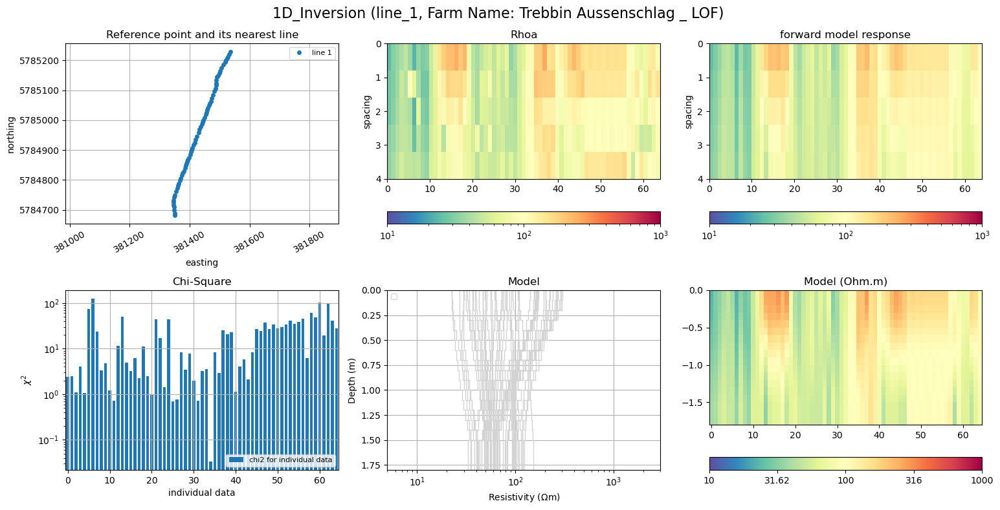

26/02/24 - 16:52:48 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


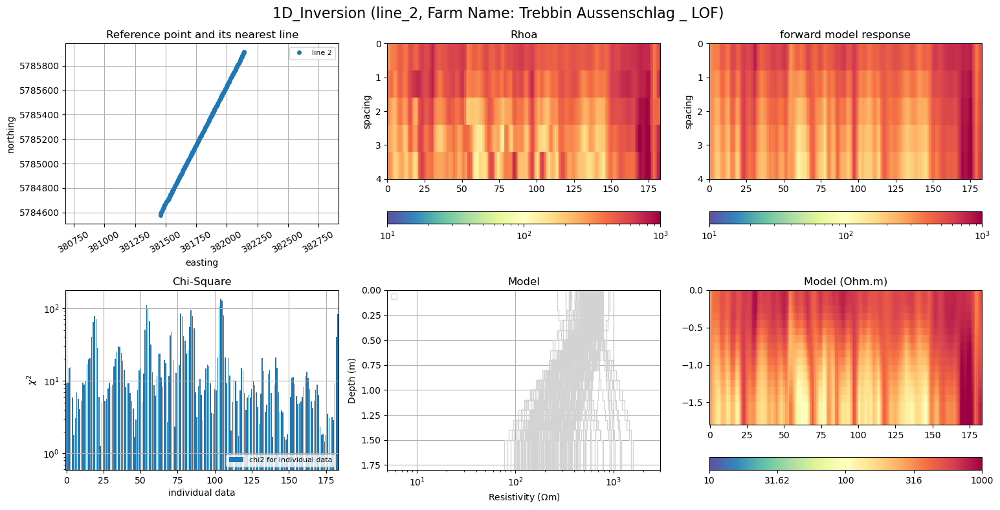

26/02/24 - 16:52:52 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


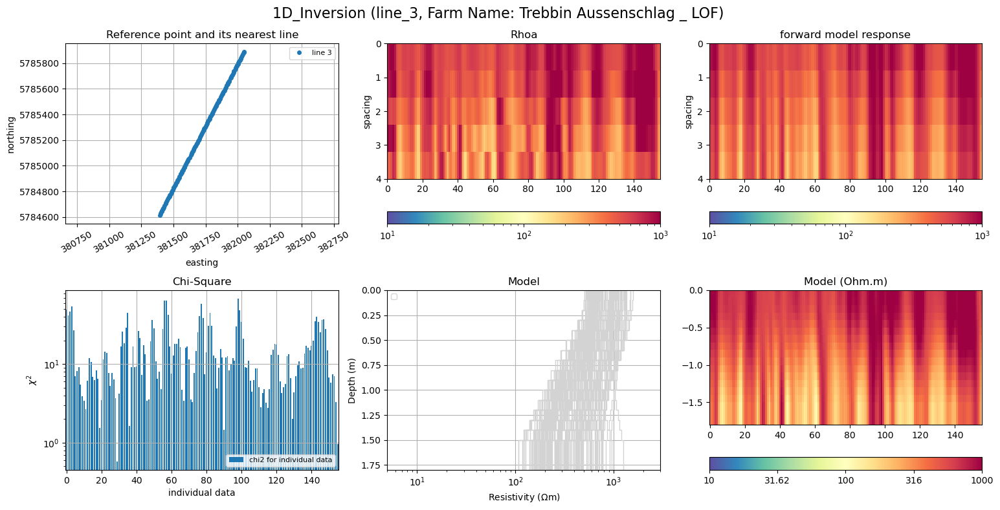

26/02/24 - 16:52:57 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


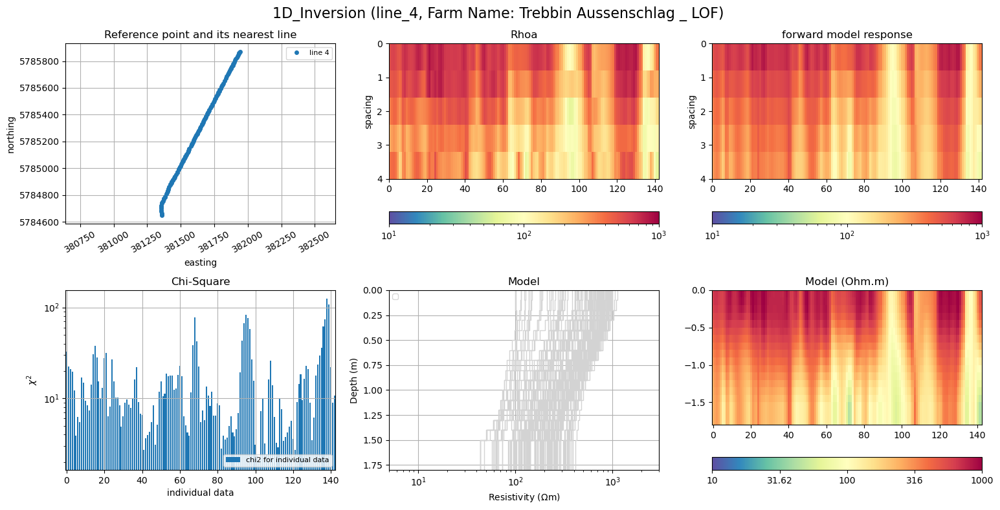

26/02/24 - 16:53:00 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


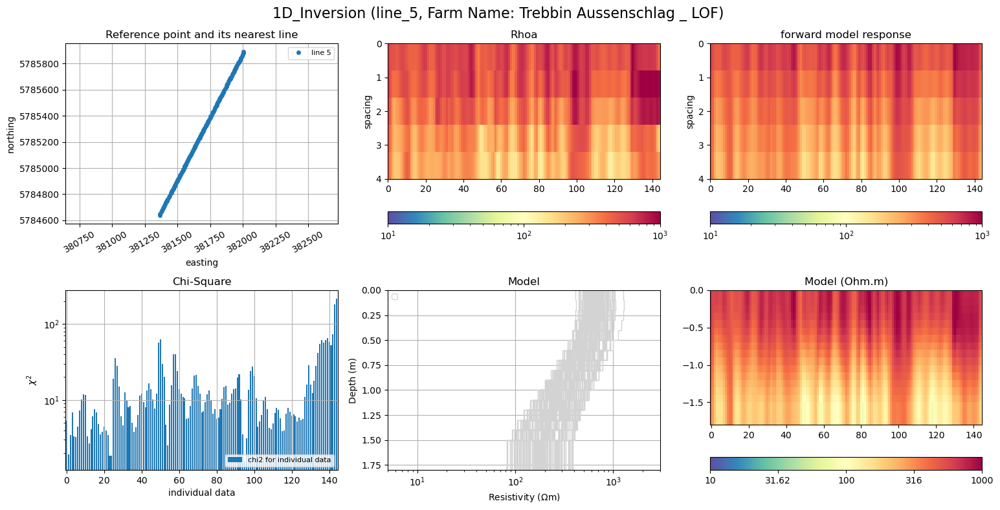

26/02/24 - 16:53:04 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


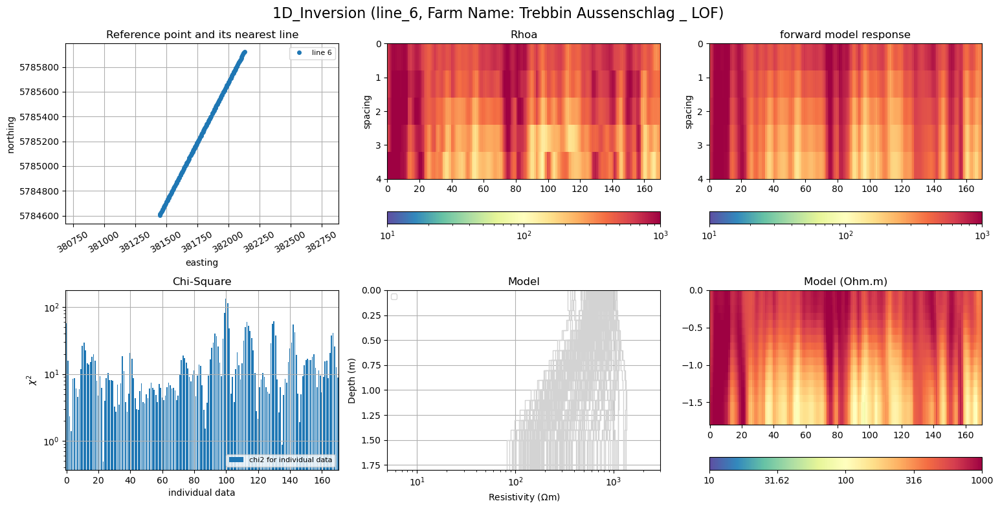

26/02/24 - 16:53:08 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


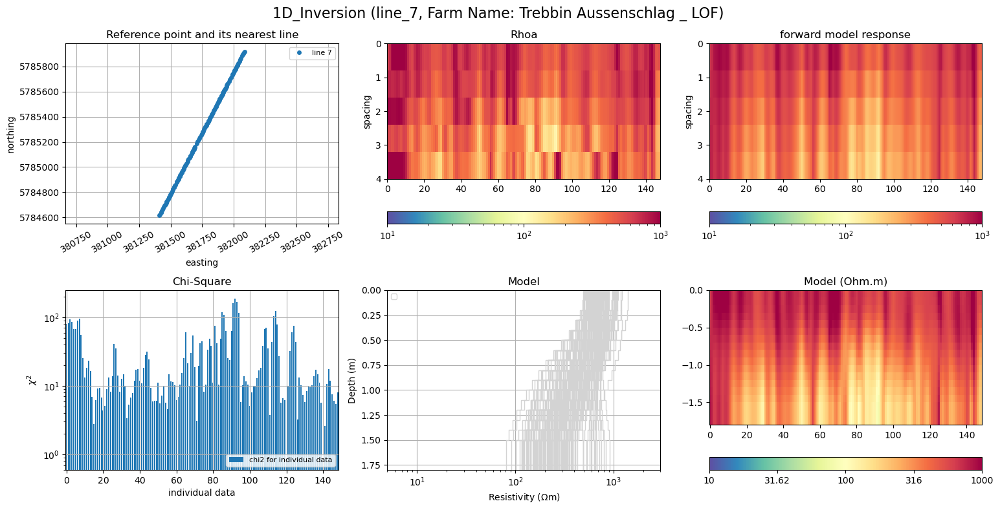

26/02/24 - 16:53:11 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


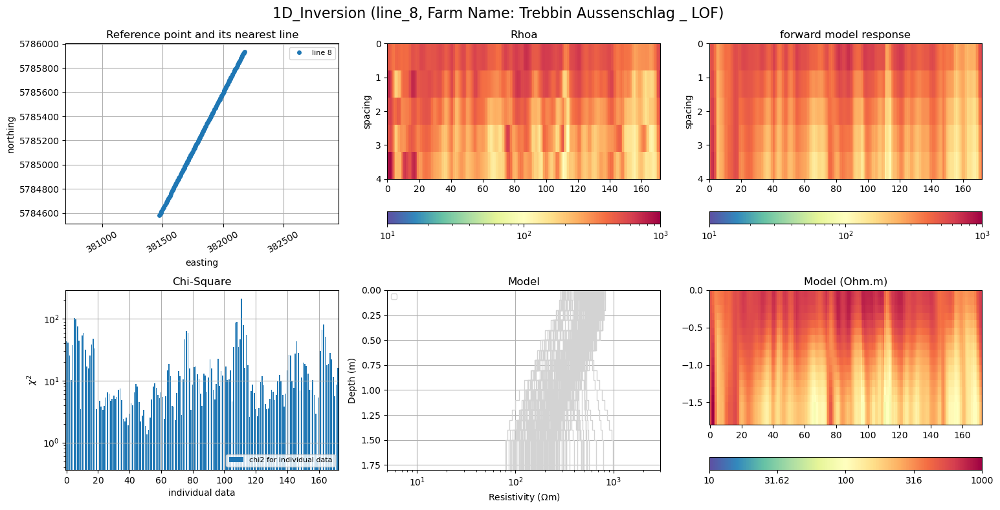

26/02/24 - 16:53:15 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


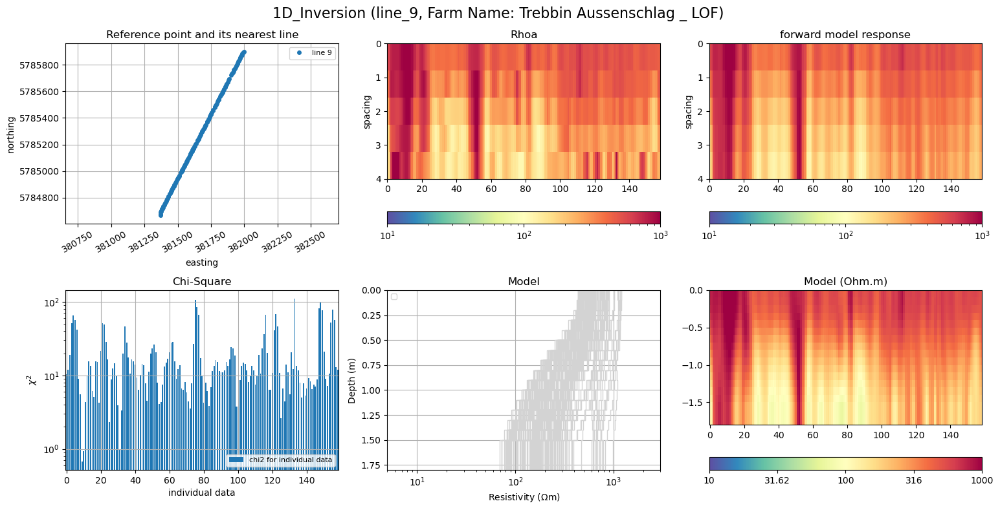

26/02/24 - 16:53:19 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


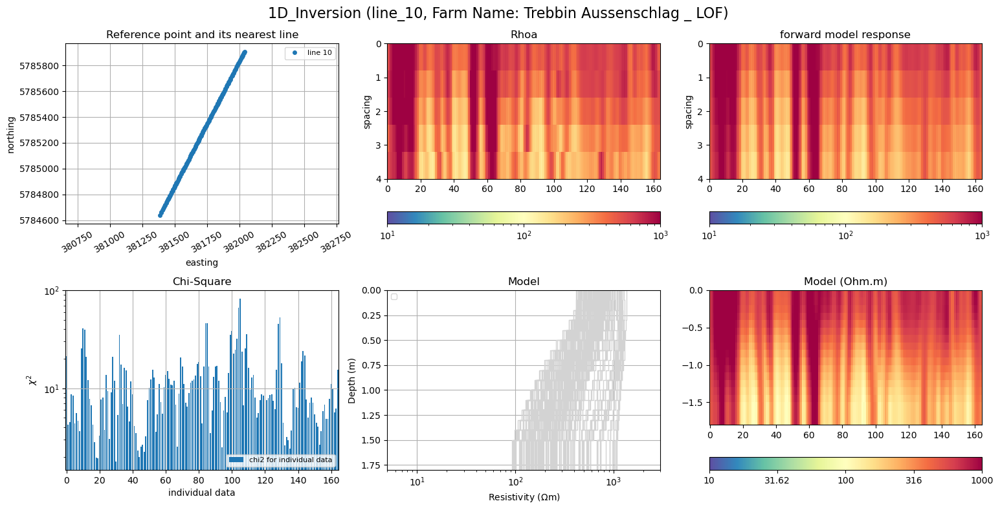

26/02/24 - 16:53:23 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


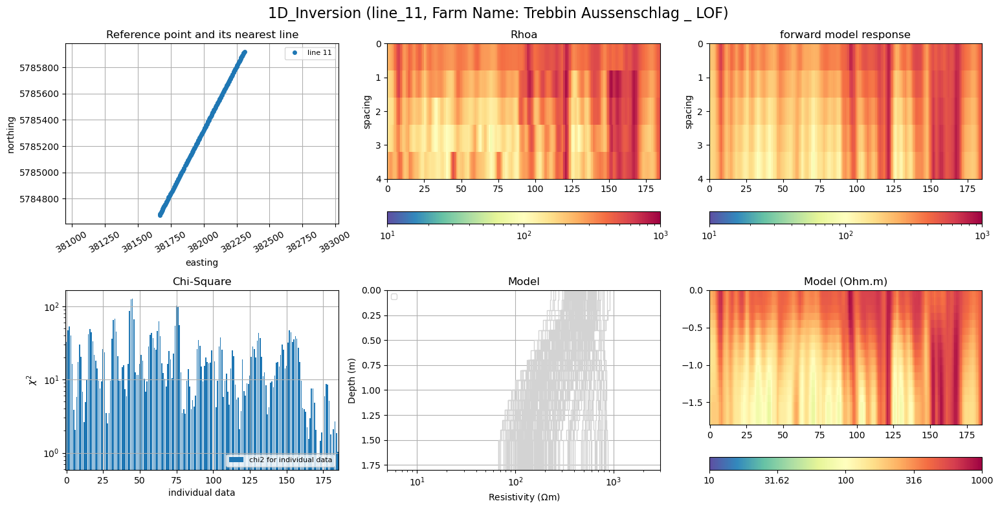

26/02/24 - 16:53:27 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


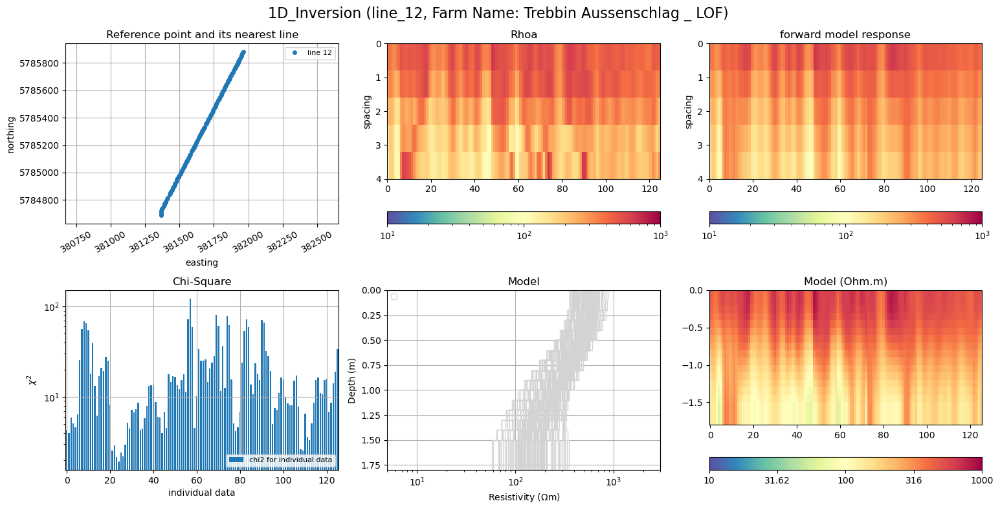

26/02/24 - 16:53:30 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


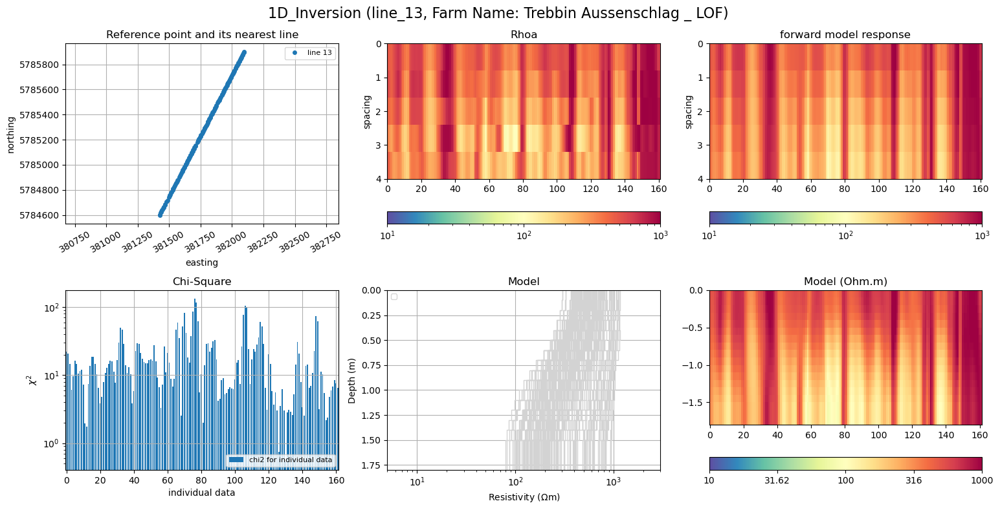

26/02/24 - 16:53:34 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


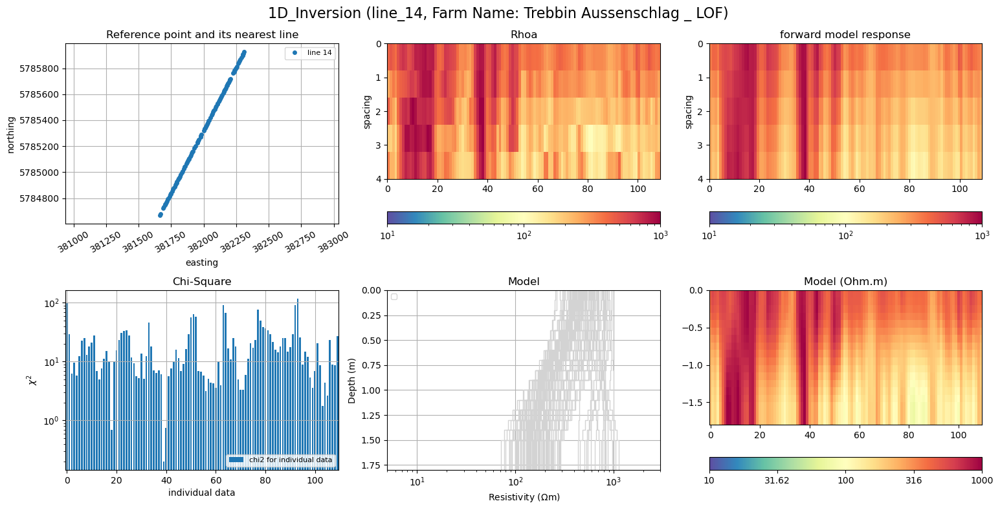

26/02/24 - 16:53:37 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


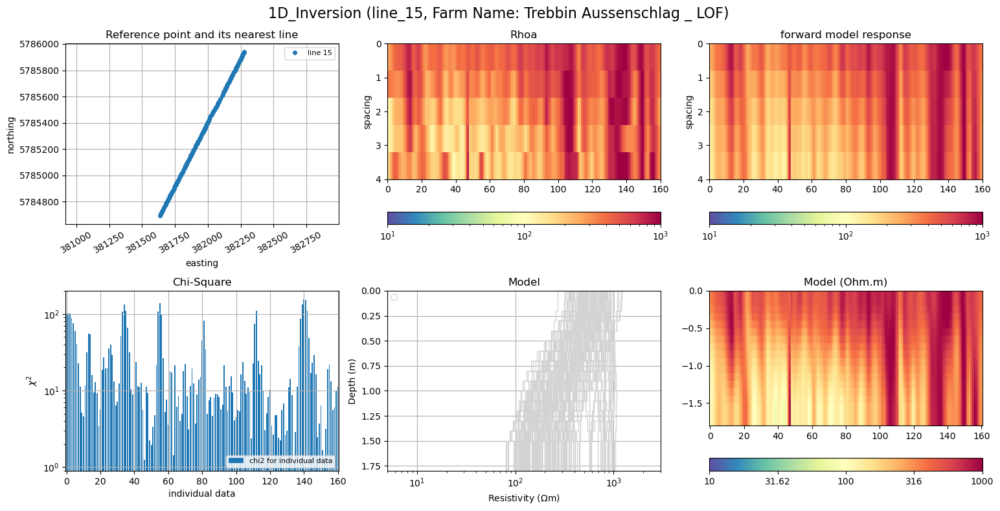

26/02/24 - 16:53:41 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


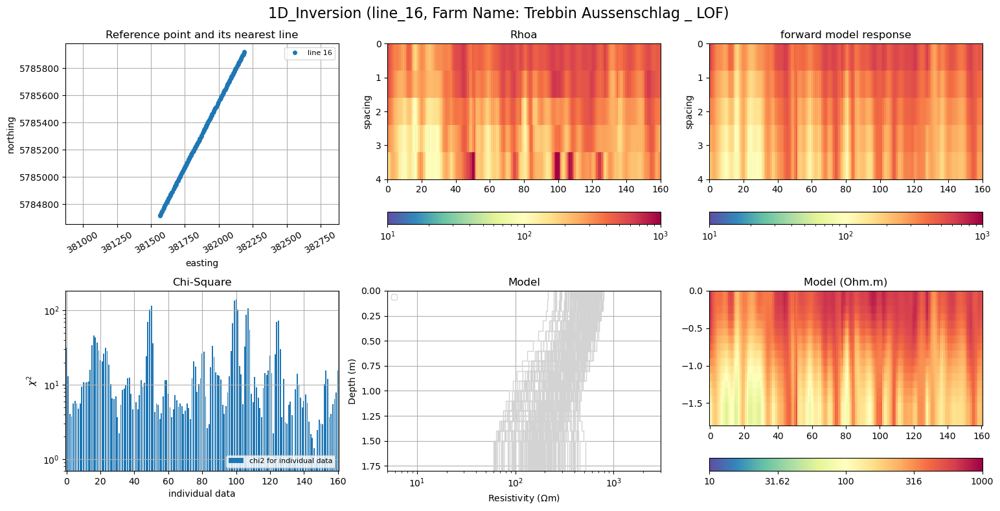

26/02/24 - 16:53:45 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


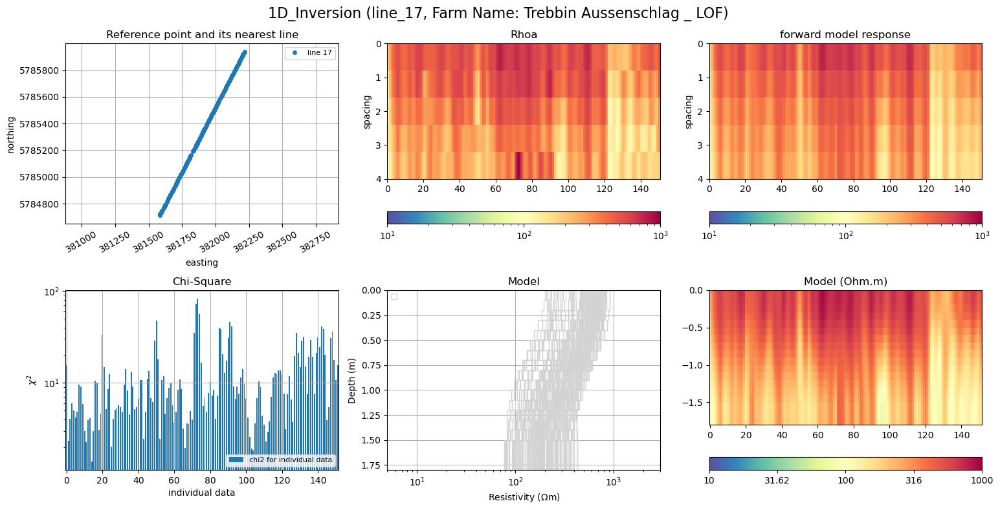

26/02/24 - 16:53:49 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


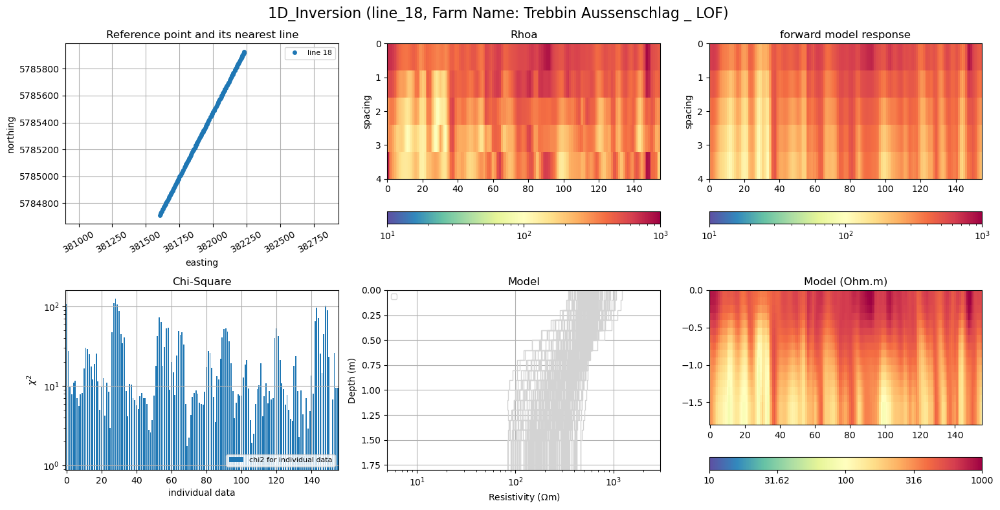

26/02/24 - 16:53:52 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


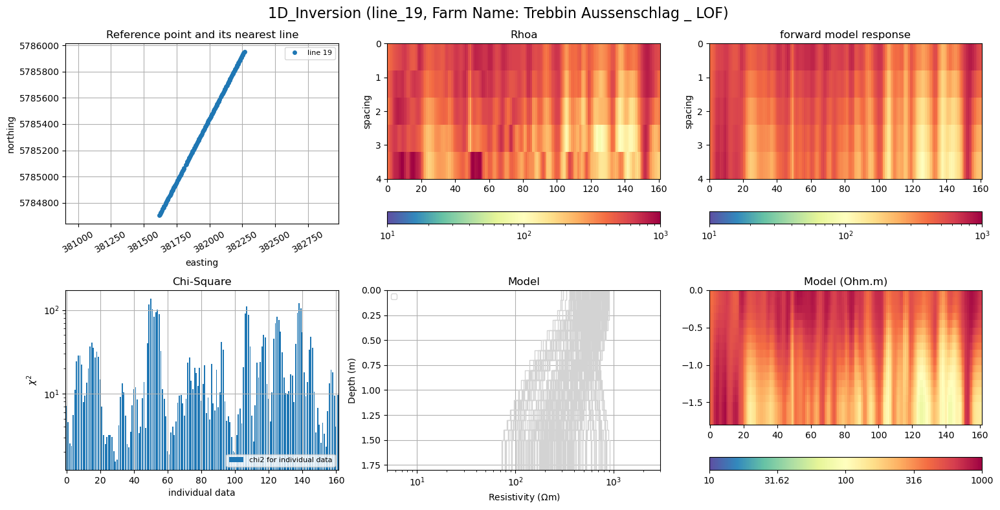

26/02/24 - 16:53:56 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


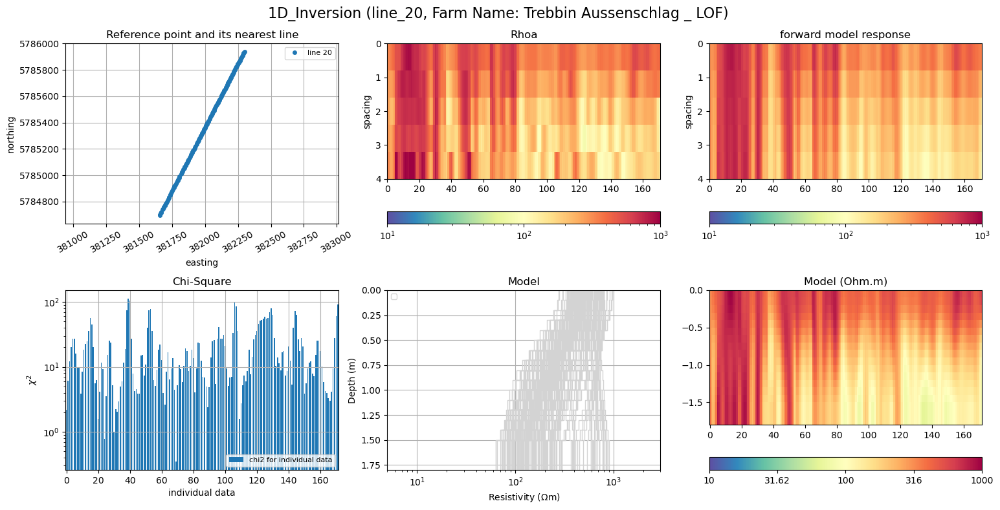

26/02/24 - 16:54:00 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


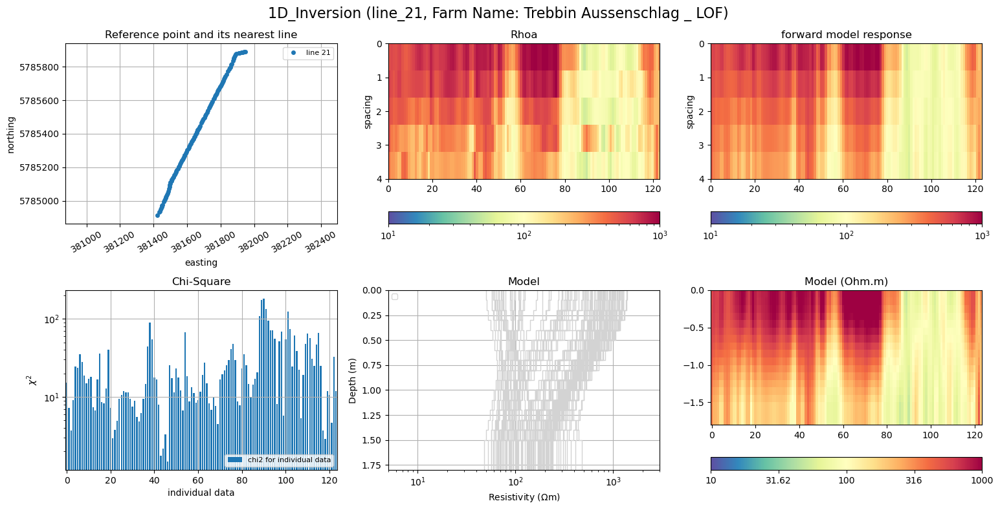

26/02/24 - 16:54:03 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


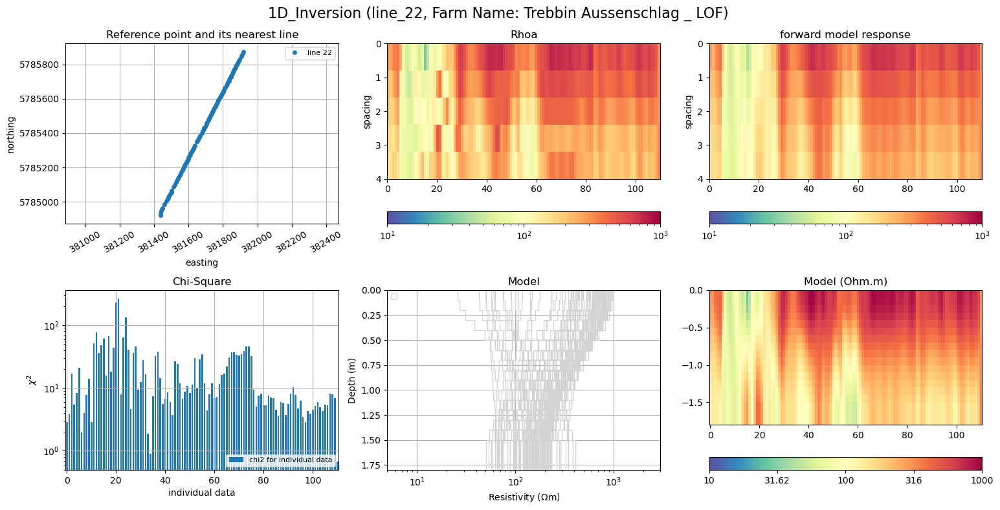

26/02/24 - 16:54:06 - matplotlib.legend - WARNING - No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


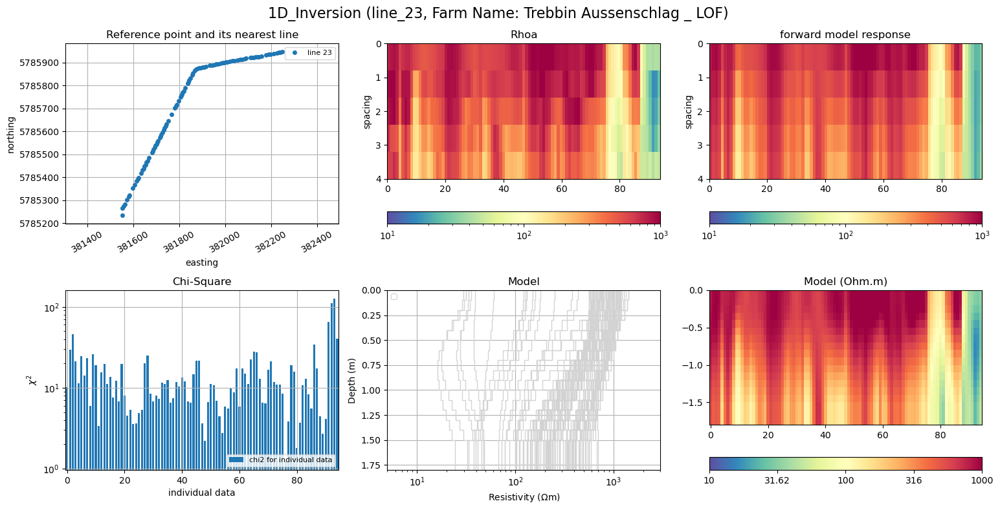

In [13]:

#%% 1D inversion plotting for all lines 

def plot_1d_inversion_results_allLines(filepath, amVec, farmName, data_type):
    data = read_data_lineIndexed(filepath)
    data_no_nan = data[~np.isnan(data).any(axis=1)]
    data_filtered = data_no_nan[data_no_nan[:, -1] != 0] # remove individual points
    selected_lines = np.unique(data_filtered[:,-1])
    line_data = {}  # Dictionary to hold data for each line

    with PdfPages(f'{farmName}_1D_Inversion_all_lines_ {data_type}.pdf') as pdf:
        for line_num in selected_lines:
            line_mask = (data_filtered[:, -1] == line_num)
            line_data[line_num] = data_filtered[line_mask][:, 3:8]
            mydata = np.asarray(line_data[line_num])
            
            # Load the inversion results from the saved file
            inv_result_data = np.loadtxt(f'{farmName}_1Dinv_response_all_lines_combined.txt', delimiter='\t', skiprows=1)
            # Extract relevant information
            x_values = inv_result_data[:, 0]
            y_values = inv_result_data[:, 1]
            inversion_results = inv_result_data[:, 2:-2]  # Exclude x, y, chi2, and line_index columns
            chi2_values = inv_result_data[:, -2]
            line_index_values = inv_result_data[:, -1]

            # extract inv result for the current line
            inv_result_data_current_line = inv_result_data[inv_result_data[:, -1] == line_num]
            Inv_indiv = inv_result_data_current_line[:, 2:18]
            chi2 = inv_result_data_current_line[:, -2]
            chi2Indiv = np.array(chi2.T)

            Eutm, Nutm = data_filtered[line_mask][:, 0] , data_filtered[line_mask][:, 1]
            fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15.5, 8), gridspec_kw={'height_ratios': [1, 1]})
    
            fig.suptitle(f'1D_Inversion (line_{int(line_num)}, Farm Name: {farmName_Original} _ {data_type})', fontsize=16)
            plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.2, hspace=0.4)
            ax0, ax1, ax2, ax3, ax4, ax5 = axes[0, 0], axes[0, 1], axes[0, 2], axes[1, 0], axes[1, 1], axes[1, 2]
            
            
            ax0.set_xlim([min(Eutm), max(Eutm)])
            ax0.set_ylim([min(Nutm), max(Nutm)])
            ax0.axis("equal")
            ax0.plot(Eutm, Nutm, "o", markersize=4, mew=1, label=f'line {int(line_num)}')
            ax0.set_title(f'Reference point and its nearest line')
            ax0.legend(prop={'size': 8})
            ax0.set_xlabel('easting')
            ax0.set_ylabel('northing')
            ax0.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
            ax0.yaxis.set_major_formatter(FormatStrFormatter('%.0f'))
            ax0.xaxis.set_tick_params(rotation=30)
            ax0.grid()
            
            from mpl_toolkits.axes_grid1 import make_axes_locatable
            norm = colors.LogNorm(vmin=10, vmax=1000)
            # Create a meshgrid to specify coordinates for the image
            x = np.arange(mydata.shape[0])
            y = np.arange(mydata.shape[1])
            y_ticks = y[::-1]
            extent = [x[0], x[-1], y[0], y[-1]]
            # Display the numerical values with the color map
            #im = ax4.imshow(mydata, cmap='Spectral_r', norm=norm, extent=extent)
            im = ax1.imshow(mydata.T, cmap='Spectral_r', norm=norm, extent=extent, interpolation="nearest")
            ax1.set_aspect('auto')  
            ax1.set_title('Rhoa')
            ax1.set_yticks(y)
            ax1.set_yticklabels(y[::-1])
            ax1.set_ylabel('spacing')
            # Add a color bar
            divider = make_axes_locatable(ax1)
            cax = divider.append_axes("bottom", size="9%", pad=0.5)  
            cbar = fig.colorbar(im, cax=cax, orientation='horizontal')
            
            # plot the forward model response to check if these it has a systematic missfit with data
            from mpl_toolkits.axes_grid1 import make_axes_locatable
            forward_resp = np.loadtxt(f'{farmName}_1Dforward_response_all_lines_combined.txt', delimiter='\t', skiprows=1)
            forward_resp_current_line = forward_resp[forward_resp[:, -1] == line_num][:, 2:-1]          
            inv_response = Inv_indiv
            x = np.arange(mydata.T.shape[1])
            y = np.arange(mydata.T.shape[0])
            extent = [x[0], x[-1], y[0], y[-1]]
            norm = colors.LogNorm(vmin=10, vmax=1000)
            im = ax2.imshow(forward_resp_current_line.T, cmap='Spectral_r', norm=norm, extent=extent, interpolation="nearest")
            ax2.set_aspect('auto')  
            ax2.set_title('forward model response')
            ax2.set_yticklabels(y[::-1])
            ax2.set_ylabel('spacing')
            # Add a color bar
            divider = make_axes_locatable(ax2)
            cax = divider.append_axes("bottom", size="9%", pad=0.5)  # Adjust pad as needed
            
            cbar = fig.colorbar(im, cax=cax, orientation='horizontal')   
            ax3.bar(range(len(chi2Indiv)), chi2Indiv, width=0.7, align='center', label=f"chi2 for individual data")
            ax3.grid(True)
            ax3.set_xlim([-0.5, len(chi2Indiv) - 0.5])
            ax3.legend(fontsize=8, loc=4)
            ax3.set_xlabel('individual data')
            ax3.set_ylabel('$\u03C7^2$')
            ax3.set_title( f'Chi-Square')
            ax3.set_yscale('log')
            
            ax4.set_xlim([5, 3000])
            ax4.legend(fontsize=8, loc=2)
            ax4.set_title('Model')
            for inv in Inv_indiv: 
                drawModel1D(ax4, thickness=thk, values=inv, plot='semilogx', color='lightgray', linewidth=1)

            plt.tight_layout()  
    
            pg.viewer.mpl.showStitchedModels(Inv_indiv, ax=ax5, x=None, cMin=10, cMax=1000, cMap='Spectral_r', thk=thk, logScale=True, title='Model (Ohm.m)', zMin=0, zMax=0, zLog=False)
            
            plt.show()
    
            # Save the plot to the PDF file
            pdf.savefig(fig)
            plt.close()
    

# Example usage:
amVec = np.arange(1, 6) * 0.6  # Geophilius 3.0 (2020)
thk = np.ones(15) * 0.1

farmName_Original = 'Trebbin Aussenschlag'

data_lineIndexed_file = f"data_lineIndexed_{farmName_Original}.txt"


kmlFile = 'TRB_Außenschlag_Referenzpunkte_gemessen_2023-03-200.kml'
fiona.drvsupport.supported_drivers['KML'] = 'rw'
gdf = gpd.read_file(kmlFile)
refLat = np.array(gdf['geometry'].y)
refLon = np.array(gdf['geometry'].x)
refEutm, refNutm, refzone, refletter = utm.from_latlon(refLat, refLon)
refName = np.array(gdf['Name'])
ref_Points = np.column_stack([refName, refEutm, refNutm])
header = ['Name', 'E', 'N']
refPointsTable = np.vstack((header, ref_Points))

# inv plot for processed (HLOF)
farmName_Processed = 'Trebbin Aussenschlag_HLOF'
data_type_HLOF = 'LOF'
filepath_Processed = f"harmfitted_{data_type_HLOF}_{farmName_Original}.txt"
plot_1d_inversion_results_allLines(filepath_Processed, amVec, farmName_Processed, data_type_HLOF)


Now, we can visualize the inversion results for those datapoints where the chi-squared value is less than 20.

C:\Users\Roudsari.S\AppData\Local\Temp\ipykernel_1668\1698258302.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.03, 0.03, 0.93, 0.95])  # Adjust the layout to make room for the suptitle


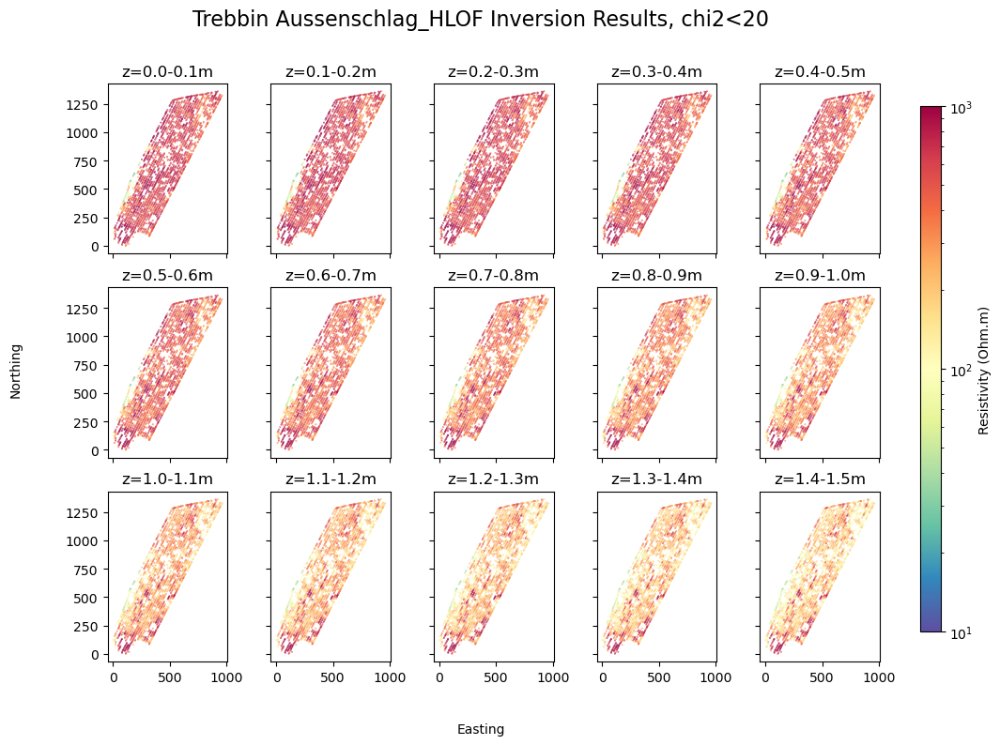

In [14]:
#%% inversion result subplot chi2<10

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

farmName_Processed = 'Trebbin Aussenschlag_HLOF'

# Load data directly from the file using np.genfromtxt
inv_res = np.genfromtxt(f'{farmName_Processed}_1Dinv_response_all_lines_combined.txt', delimiter='\t', skip_header=1)
chi2Lim = 20
inv_res_filtered = inv_res[inv_res[:, -2] <= chi2Lim] ## Filter out rows where the Chi2 is greater than 100

# Save the filtered inversion results to a text file
inv_res_with_chi2andlineInx = np.genfromtxt(f'{farmName_Processed}_1Dinv_response_all_lines_combined.txt', delimiter='\t', skip_header=0)
inv_res_with_chi2andlineInx_filtered = inv_res[inv_res[:, -2] <= chi2Lim] ## Filter out rows where the Chi2 is greater than 100
header_inv = 'x; y; ' + "; ".join([f'inv{i}' for i in range(1, inv_res_filtered.shape[1]-3)]) + "; chi2; line_index"
np.savetxt(f'{farmName_Processed}_1Dinv_response_all_lines_combined_chi2_less_than_{chi2Lim}.txt', 
           inv_res_filtered, delimiter='\t', header=header_inv, fmt='%.3f')

x_offset = np.min(inv_res_filtered[:, 0])
y_offset = np.min(inv_res_filtered[:, 1])
fig, ax = plt.subplots(nrows=3, ncols=5, sharex=True, sharey=True, figsize=(11, 8), 
                       gridspec_kw={'wspace': 0.1, 'hspace': 0.2})

norm = LogNorm(10, 1000)
for i, a in enumerate(ax.flat):
    rho = inv_res_filtered[:, i+2]  # Assuming the rho values start from the third column
    im = a.scatter(inv_res_filtered[:, 0]-x_offset, inv_res_filtered[:, 1]-y_offset, c=rho, s=0.1, norm=norm, cmap="Spectral_r", alpha=1)
    a.set_aspect(1.0)
    a.set_title("z={:.1f}-{:.1f}m".format(i*0.1, (i+1)*0.1))
plt.tight_layout(rect=[0.03, 0.03, 0.93, 0.95])  # Adjust the layout to make room for the suptitle

# Add a color bar
cbar_ax = fig.add_axes([0.925, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Resistivity (Ohm.m)')

# Set common labels
fig.text(0.5, 0.02, 'Easting', ha='center', va='center')
fig.text(0.05, 0.5, 'Northing', ha='center', va='center', rotation='vertical')

plt.suptitle(f'{farmName_Processed} Inversion Results, chi2<{chi2Lim}', fontsize=16)
# Save the plot as PDF
plt.savefig(f'{farmName_Processed}_subplot_inversion_results_chi2,{chi2Lim}.pdf')
# Save the plot as JPEG
plt.savefig(f'{farmName_Processed}_subplot_inversion_results_chi2,{chi2Lim}.jpg', dpi=300)

plt.show()

If we desire to generate a multi-page PDF for the inversion, we can utilize the following function:

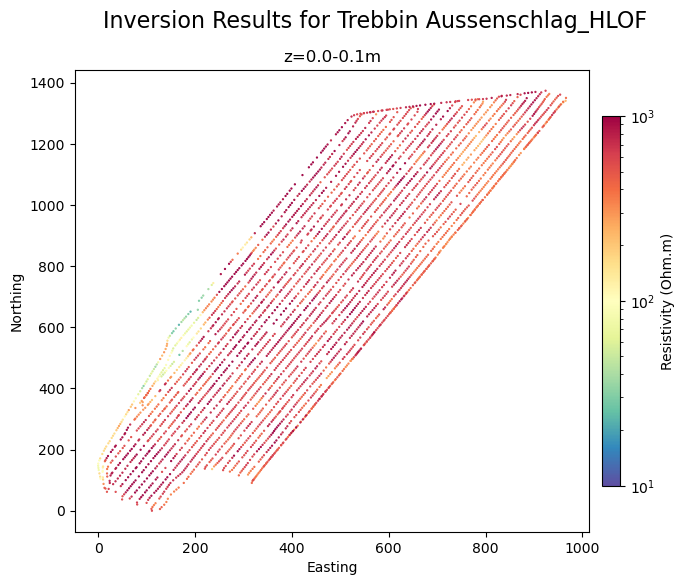

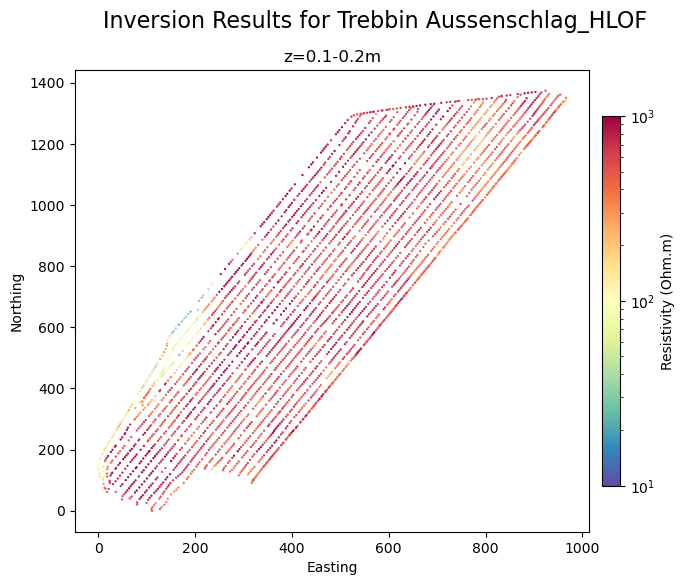

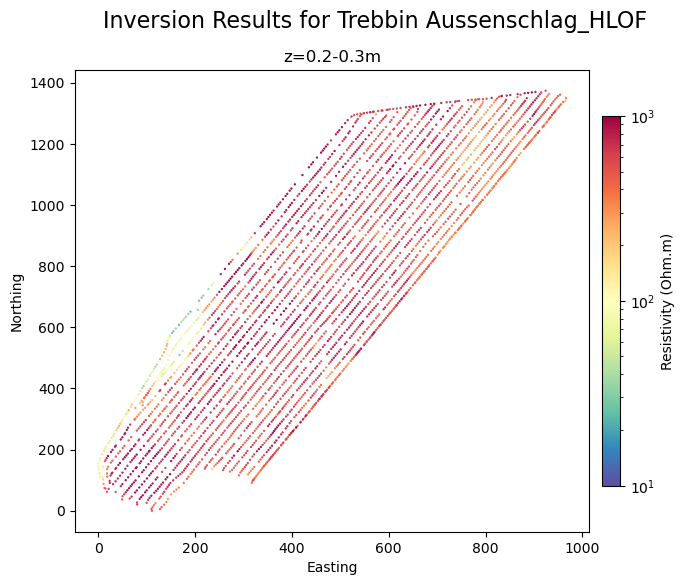

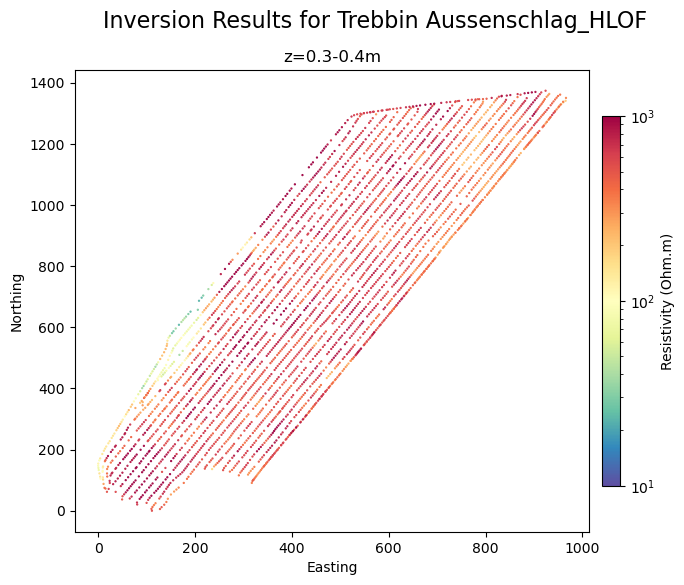

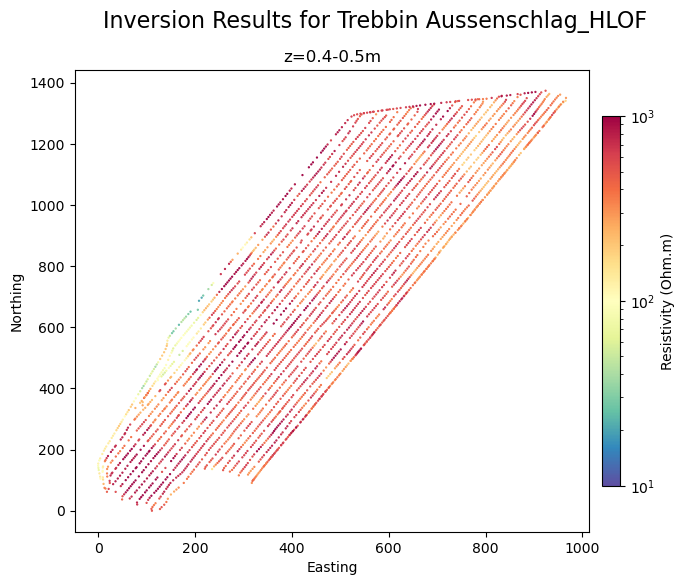

...

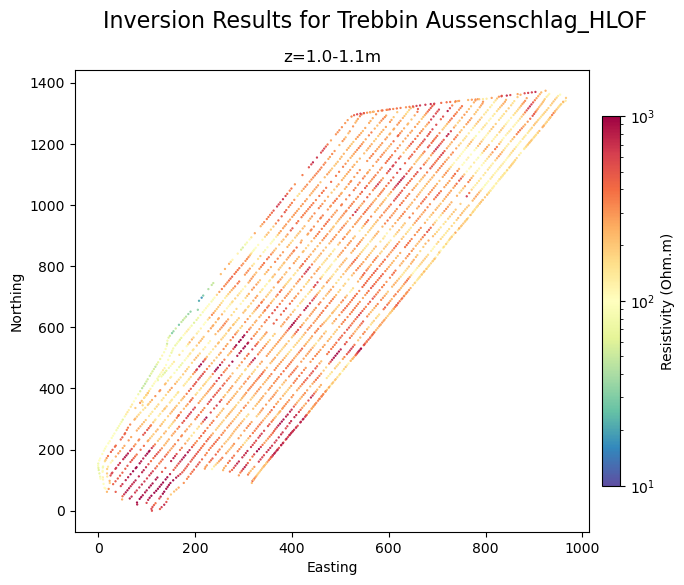

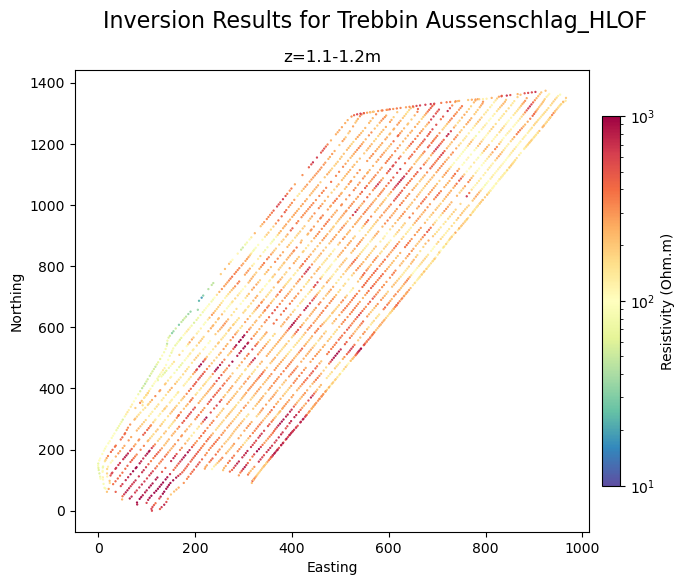

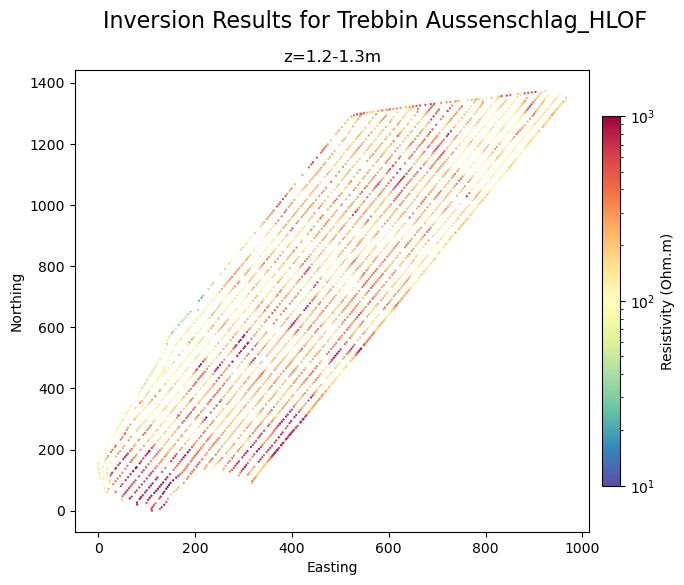

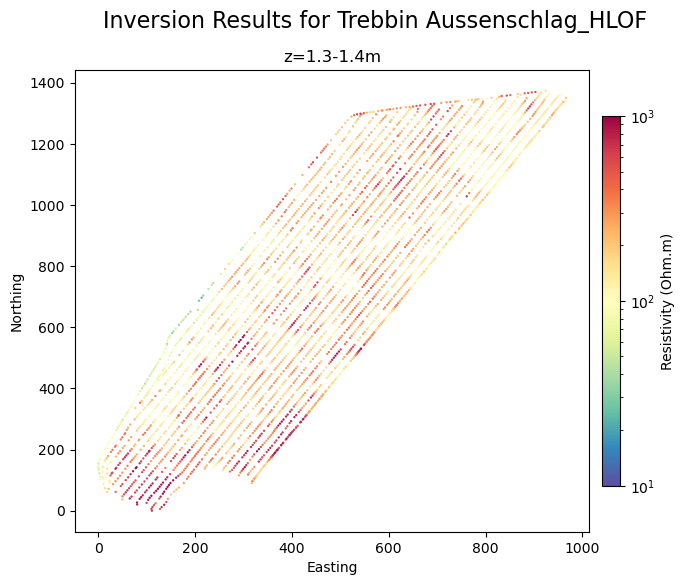

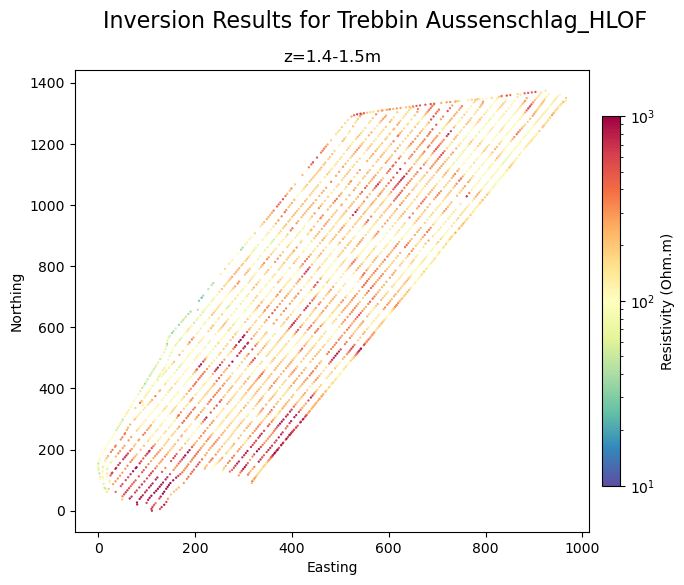

In [15]:

farmName_Processed = 'Trebbin Aussenschlag_HLOF'

# Load data directly from the file using np.genfromtxt
inv_res = np.genfromtxt(f'{farmName_Processed}_1Dinv_response_all_lines_combined.txt', delimiter='\t', skip_header=1)
#inv_res_filtered = inv_res[inv_res[:, -2] <= 100] ## Filter out rows where the Chi2 is greater than 100

# Create a multi-page PDF file
pdf_filename = f'{farmName_Processed}_inversion_results_MPpdf.pdf'
x_offset = np.min(inv_res[:, 0])
y_offset = np.min(inv_res[:, 1])
with PdfPages(pdf_filename) as pdf:
    for i in range(15):  # Loop through all subplots
        fig, ax = plt.subplots(figsize=(8, 6))
        norm = LogNorm(10, 1000)
        rho = inv_res[:, i + 2]  # Assuming the rho values start from the third column
        im = ax.scatter(inv_res[:, 0] - x_offset, inv_res[:, 1] - y_offset, c=rho, s=0.4, norm=norm, cmap="Spectral_r", alpha=1)
        #ax.set_aspect(1.0)
        ax.set_title("z={:.1f}-{:.1f}m".format(i * 0.1, (i + 1) * 0.1))
        # Add color bar
        cbar = plt.colorbar(im, pad=0.02, shrink=0.8)
        cbar.set_label('Resistivity (Ohm.m)')
        # Set common labels
        ax.set_xlabel('Easting')
        ax.set_ylabel('Northing')
        plt.suptitle(f'Inversion Results for {farmName_Processed}', fontsize=16)

        # Save the subplot into the PDF file
        pdf.savefig(fig)
        plt.show()

        plt.close(fig)  # Close the figure to release memory

